WESAD DATASET

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
zip_path = "/content/drive/MyDrive/WESAD.zip"
extract_path = "/content/WESAD"


In [ ]:
import zipfile, os

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("unzipped to:", extract_path)
print("folders inside:", os.listdir(extract_path))


unzipped to: /content/WESAD
folders inside: ['WESAD']


In [ ]:
import os
from pathlib import Path
import pandas as pd


root_dir = Path("/content/WESAD/WESAD")

subjects = sorted([d for d in os.listdir(root_dir) if d.startswith("S")])

rows = []
for s in subjects:
    subj_dir = root_dir / s
    pkl_files = list(subj_dir.glob("*.pkl"))
    if pkl_files:
        pkl = pkl_files[0]
        size_mb = round(pkl.stat().st_size / (1024*1024), 2)
        rows.append({"Subject": s, "File": pkl.name, "Size_MB": size_mb})
    else:
        rows.append({"Subject": s, "File": "—", "Size_MB": "—"})

df = pd.DataFrame(rows)

print("findings")
print(df.to_string(index=False))

findings
Subject    File  Size_MB
    S10 S10.pkl   827.01
    S11 S11.pkl   792.59
    S13 S13.pkl   844.30
    S14 S14.pkl   840.32
    S15 S15.pkl   789.37
    S16 S16.pkl   857.33
    S17 S17.pkl   903.11
     S2  S2.pkl   929.94
     S3  S3.pkl   983.72
     S4  S4.pkl   986.43
     S5  S5.pkl   947.41
     S6  S6.pkl  1071.26
     S7  S7.pkl   791.00
     S8  S8.pkl   829.19
     S9  S9.pkl   794.07


Step 1: Setup and folders

1. make project folders

2. set a random seed for reproducable

3. reconfirm dataset path

4. subject Id's verify



In [ ]:
import os, sys, json, platform, importlib, random
from pathlib import Path
from datetime import datetime

In [ ]:
SEED = 42
root_dir = Path("/content/WESAD/WESAD")
proj = Path("/content/wesad")

folders = [
    proj/"data",
    proj/"interim",
    proj/"features"/"seconds",
    proj/"features"/"windows",
    proj/"models",
    proj/"reports",
    proj/"eval",
    proj/"configs",
]
for d in folders:
    d.mkdir(parents=True, exist_ok=True)

print("folders created")
for d in folders:
    print("  -", d)

folders created
  - /content/wesad/data
  - /content/wesad/interim
  - /content/wesad/features/seconds
  - /content/wesad/features/windows
  - /content/wesad/models
  - /content/wesad/reports
  - /content/wesad/eval
  - /content/wesad/configs


In [ ]:
# Seed
random.seed(SEED)
try:
    import numpy as np
    np.random.seed(SEED)
except Exception:
    pass
print(f"\n Seed fixed {SEED}")



 Seed fixed 42


In [ ]:
#  dataset location
if not root_dir.exists():
    raise FileNotFoundError(
        f"not found {root_dir}. "
    )
print("\n dataset found at:", root_dir)



 dataset found at: /content/WESAD/WESAD


In [ ]:

subjects = []
for d in sorted(root_dir.glob("S*")):
    if d.is_dir() and (d / f"{d.name}.pkl").exists():
        subjects.append(d.name)

print("\n subjects")
print(" ", subjects)


 subjects
  ['S10', 'S11', 'S13', 'S14', 'S15', 'S16', 'S17', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9']


In [ ]:

expected = {f"S{i}" for i in range(2, 18)} - {"S12"}
present = set(subjects)
missing_rel_expected = sorted(list(expected - present))
extra_rel_expected   = sorted(list(present - expected))
print("\n missing ", missing_rel_expected or "None")
print(" unexpected extras:", extra_rel_expected or "None")



 missing  None
 unexpected extras: None


In [ ]:


pkgs_to_note = ["numpy","pandas","scipy","sklearn","matplotlib","neurokit2","torch","tensorflow","shap"]
versions = {}
for name in pkgs_to_note:
    try:
        mod = importlib.import_module(name if name != "sklearn" else "sklearn")
        versions[name] = getattr(mod, "__version__", "unknown")
    except Exception as e:
        versions[name] = f"not_available: {e.__class__.__name__}"

env_note_txt = proj/"reports"/"environment.txt"
env_note_json = proj/"reports"/"environment.json"
meta = {
    "timestamp_utc": datetime.utcnow().isoformat()+"Z",
    "python": sys.version.split()[0],
    "platform": platform.platform(),
    "seed": SEED,
    "root_dir": str(root_dir),
    "subjects_found": subjects,
    "packages": versions,
}

with open(env_note_txt, "w") as f:
    f.write(f"Run: {meta['timestamp_utc']}\nPython: {meta['python']}\nPlatform: {meta['platform']}\nSeed: {SEED}\n")
    f.write(f"Root dir: {meta['root_dir']}\nSubjects: {', '.join(subjects)}\n\nPackage versions:\n")
    for k,v in versions.items():
        f.write(f"- {k}: {v}\n")

with open(env_note_json, "w") as f:
    json.dump(meta, f, indent=2)

print("\n saved package versions")
print(" ", env_note_txt)
print(" ", env_note_json)



 saved package versions
  /content/wesad/reports/environment.txt
  /content/wesad/reports/environment.json


/tmp/ipython-input-4186773681.py:13: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat()+"Z",


step 2:

EDA

In [ ]:
import pickle

#selecting one subject, will change later
subject_id = "S2"
pkl_path = root_dir / subject_id / f"{subject_id}.pkl"

# Load the pickle
with open(pkl_path, "rb") as f:
    data = pickle.load(f, encoding="latin1")

print(f"loaded {subject_id} from:", pkl_path)

# top-level keys
print("\nTop-level keys in the subject dict:", list(data.keys()))

#  signal keys
print("\nKeys under 'signal':", list(data['signal'].keys()))

# chest signal keys
print("\nChannels in chest signals:", list(data['signal']['chest'].keys()))

# label info
print("\nLabel array shape:", data['label'].shape)
print(" labels in the subject:", set(data['label']))

loaded S2 from: /content/WESAD/WESAD/S2/S2.pkl

Top-level keys in the subject dict: ['signal', 'label', 'subject']

Keys under 'signal': ['chest', 'wrist']

Channels in chest signals: ['ACC', 'ECG', 'EMG', 'EDA', 'Temp', 'Resp']

Label array shape: (4255300,)
 labels in the subject: {np.int32(0), np.int32(1), np.int32(2), np.int32(3), np.int32(4), np.int32(6), np.int32(7)}


In [ ]:
# length of chest ECG signal
ecg_len = len(data["signal"]["chest"]["ECG"])

# length of labels array
label_len = len(data["label"])

print("ECG length:", ecg_len)
print("Label length:", label_len)

# estimated duration in minutes (if 700 Hz)
minutes = ecg_len / 700 / 60
print("Estimated recording duration (700Hz assumption):", round(minutes,2), "min")

ECG length: 4255300
Label length: 4255300
Estimated recording duration (700Hz assumption): 101.32 min


step 3

In [ ]:
import numpy as np
import pandas as pd

# getting labels for subject
labels = data["label"]

# map numeric labels to readable names
label_dict = {
    0: "Transient",
    1: "Baseline",
    2: "Stress",
    3: "Amusement",
    4: "Meditation",
    6: "Unused_6",
    7: "Unused_7"
}

fs_chest = 700  # Hz

rows = []
for lbl, count in zip(*np.unique(labels, return_counts=True)):
    seconds = count / fs_chest
    minutes = seconds / 60
    rows.append({
        "Label": lbl,
        "Phase": label_dict.get(int(lbl), f"Unknown_{lbl}"),
        "Samples": int(count),
        "Seconds": round(seconds, 2),
        "Minutes": round(minutes, 2)
    })

df_durations = pd.DataFrame(rows).sort_values("Label").reset_index(drop=True)

print("phase durations of subject:", subject_id)
print(df_durations.to_string(index=False))

phase durations of subject: S2
 Label      Phase  Samples  Seconds  Minutes
     0  Transient  2142701   3061.0    51.02
     1   Baseline   800800   1144.0    19.07
     2     Stress   430500    615.0    10.25
     3  Amusement   253400    362.0     6.03
     4 Meditation   537599    768.0    12.80
     6   Unused_6    45500     65.0     1.08
     7   Unused_7    44800     64.0     1.07


In [ ]:
import pickle

fs_chest = 700  # Hz
all_rows = []

for sid in subjects:   # subjects list i'll built earlier
    pkl_path = root_dir / sid / f"{sid}.pkl"
    with open(pkl_path, "rb") as f:
        subj_data = pickle.load(f, encoding="latin1")

    labels = subj_data["label"]
    unique, counts = np.unique(labels, return_counts=True)

    for lbl, count in zip(unique, counts):
        seconds = count / fs_chest
        minutes = seconds / 60
        all_rows.append({
            "Subject": sid,
            "Label": int(lbl),
            "Phase": label_dict.get(int(lbl), f"Unknown_{lbl}"),
            "Samples": int(count),
            "Minutes": round(minutes, 2)
        })

df_all = pd.DataFrame(all_rows)

# pivot so each subject is a row, phases are columns (mins)
df_pivot = df_all.pivot_table(index="Subject", columns="Phase", values="Minutes", fill_value=0)

print("Phase durations (minutes) across all subjects:")
print(df_pivot.to_string())


Phase durations (minutes) across all subjects:
Phase    Amusement  Baseline  Meditation  Stress  Transient  Unknown_5  Unused_6  Unused_7
Subject                                                                                   
S10           6.20     19.67       13.27   12.08      37.83       0.85      0.75      0.95
S11           6.13     19.67       13.18   11.33      34.37       0.83      0.87      0.83
S13           6.37     19.67       13.25   11.07      39.98       0.82      0.80      0.33
S14           6.20     19.67       13.23   11.25      39.25       1.05      0.92      0.90
S15           6.20     19.58       13.23   11.43      34.70       0.83      0.78      0.77
S16           6.13     19.67       13.20   11.22      40.88       0.92      0.95      0.88
S17           6.20     19.68       12.18   12.05      45.65       0.97      0.98      0.95
S2            6.03     19.07       12.80   10.25      51.02       0.00      1.08      1.07
S3            6.25     19.00       13.00   

In [ ]:
import json

# labels that i'll work with
phase_labels = {1: "Baseline", 2: "Stress", 3: "Amusement", 4: "Meditation"}

def labels_to_intervals(labels, fs=700):
    """Convert label sequence into intervals in seconds."""
    intervals = {phase: [] for phase in phase_labels.values()}
    total_len_sec = len(labels) / fs

    current_label = labels[0]
    start_idx = 0

    for i in range(1, len(labels)):
        if labels[i] != current_label:
            end_idx = i
            if int(current_label) in phase_labels:
                phase = phase_labels[int(current_label)]
                intervals[phase].append({
                    "start_sec": round(start_idx / fs, 2),
                    "end_sec": round(end_idx / fs, 2)
                })
            # move to new interval
            current_label = labels[i]
            start_idx = i

    # catch last interval
    if int(current_label) in phase_labels:
        intervals[phase_labels[int(current_label)]].append({
            "start_sec": round(start_idx / fs, 2),
            "end_sec": round(len(labels) / fs, 2)
        })

    return intervals, total_len_sec

# Process all subjects
intervals_summary = {}

for sid in subjects:
    pkl_path = root_dir / sid / f"{sid}.pkl"
    with open(pkl_path, "rb") as f:
        subj_data = pickle.load(f, encoding="latin1")

    labels = subj_data["label"]
    intervals, total_len_sec = labels_to_intervals(labels, fs_chest)

    # save per-subject JSON
    out_path = proj/"interim"/f"{sid}_intervals.json"
    with open(out_path, "w") as f:
        json.dump({"intervals": intervals, "total_seconds": round(total_len_sec, 2)}, f, indent=2)

    intervals_summary[sid] = {
        "total_seconds": round(total_len_sec, 2),
        "intervals": intervals
    }

print(" saved interval JSONs for all subjects in:", proj/"interim")

 saved interval JSONs for all subjects in: /content/wesad/interim


In [ ]:
# stress interval length for each subject
for sid, info in intervals_summary.items():
    stress_intervals = info["intervals"].get("Stress", [])
    stress_durations = [iv["end_sec"] - iv["start_sec"] for iv in stress_intervals]
    print(f"{sid} | Stress duration(s): {stress_durations} sec (~{round(sum(stress_durations)/60,2)} min) | Total length: {info['total_seconds']} sec")


S10 | Stress duration(s): [725.0] sec (~12.08 min) | Total length: 5496.0 sec
S11 | Stress duration(s): [680.0] sec (~11.33 min) | Total length: 5233.0 sec
S13 | Stress duration(s): [664.0] sec (~11.07 min) | Total length: 5537.0 sec
S14 | Stress duration(s): [674.9999999999998] sec (~11.25 min) | Total length: 5548.0 sec
S15 | Stress duration(s): [686.0] sec (~11.43 min) | Total length: 5252.0 sec
S16 | Stress duration(s): [673.0] sec (~11.22 min) | Total length: 5631.0 sec
S17 | Stress duration(s): [722.9999999999995] sec (~12.05 min) | Total length: 5920.0 sec
S2 | Stress duration(s): [615.0] sec (~10.25 min) | Total length: 6079.0 sec
S3 | Stress duration(s): [640.0] sec (~10.67 min) | Total length: 6493.0 sec
S4 | Stress duration(s): [635.0] sec (~10.58 min) | Total length: 6423.0 sec
S5 | Stress duration(s): [645.0] sec (~10.75 min) | Total length: 6258.0 sec
S6 | Stress duration(s): [650.0] sec (~10.83 min) | Total length: 7071.0 sec
S7 | Stress duration(s): [640.0] sec (~10.67 

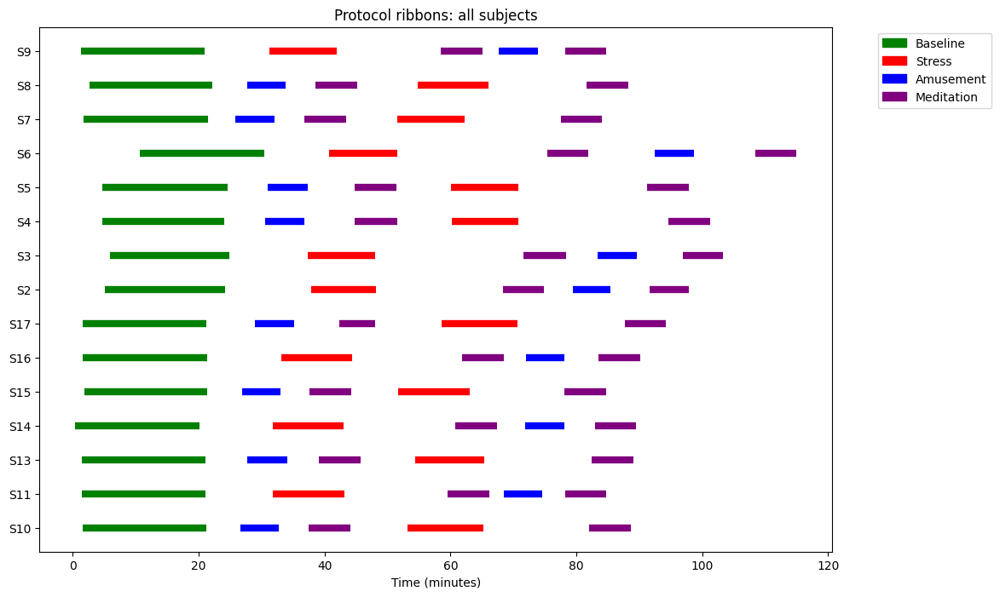

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

colors = {"Baseline":"green", "Stress":"red", "Amusement":"blue", "Meditation":"purple"}

plt.figure(figsize=(12,8))

for idx, sid in enumerate(sorted(intervals_summary.keys())):
    subj_data = intervals_summary[sid]["intervals"]
    for phase, ivs in subj_data.items():
        for iv in ivs:
            plt.hlines(y=idx, xmin=iv["start_sec"]/60, xmax=iv["end_sec"]/60,
                       colors=colors.get(phase,"gray"), linewidth=6)

plt.yticks(range(len(intervals_summary)), sorted(intervals_summary.keys()))
plt.xlabel("Time (minutes)")
plt.title("Protocol ribbons: all subjects")

# legend
patches = [mpatches.Patch(color=c, label=p) for p,c in colors.items()]
plt.legend(handles=patches, bbox_to_anchor=(1.05,1), loc="upper left")

plt.show()


In [ ]:
# collect all phase durations across subjects
phase_durations = {p: [] for p in phase_labels.values()}

for sid, info in intervals_summary.items():
    for phase in phase_labels.values():
        ivs = info["intervals"].get(phase, [])
        for iv in ivs:
            dur = iv["end_sec"] - iv["start_sec"]
            phase_durations[phase].append(dur)

# compute averages
avg_durations = {p: round(np.mean(durs)/60, 2) if durs else 0
                 for p, durs in phase_durations.items()}

print("avg duration per phase fir all subjects (mins):")
for phase, avg_min in avg_durations.items():
    print(f" - {phase}: {avg_min} min")


avg duration per phase fir all subjects (mins):
 - Baseline: 19.57 min
 - Stress: 11.07 min
 - Amusement: 6.19 min
 - Meditation: 6.56 min


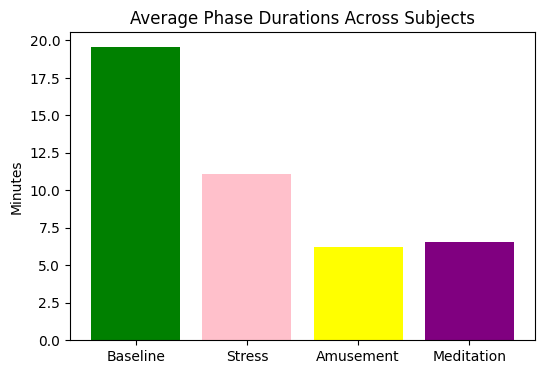

In [ ]:
plt.figure(figsize=(6,4))
plt.bar(avg_durations.keys(), avg_durations.values(), color=["green","pink","yellow","purple"])
plt.ylabel("Minutes")
plt.title("Average Phase Durations Across Subjects")
plt.show()


In [ ]:
out_csv = proj/"reports"/"phase_durations_all_subjects.csv"
df_pivot.to_csv(out_csv)
print("saved per-subject phase duration table to:", out_csv)


saved per-subject phase duration table to: /content/wesad/reports/phase_durations_all_subjects.csv


In [ ]:
!pip install neurokit2 -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 708.4/708.4 kB 51.3 MB/s eta 0:00:00


In [ ]:
# STEP 4: visual Inspection of Raw Signals
# Window 60s before stress, then 120s stress start
# Signals is chest ECG, chest RESP, chest EDA, wrist BVP, wrist EDA


In [ ]:

import pickle, json
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import neurokit2 as nk

In [ ]:
#configuration
subject_id = "S2"
pre_stress_sec = 60        # 60s before stress
stress_window_sec = 120    # first 120s of stress
proj = Path("/content/wesad")
root_dir = Path("/content/WESAD/WESAD")

# sampling rates
fs_chest = 700
fs_wrist = {
    "ACC": 32,
    "BVP": 64,
    "EDA": 4,
    "TEMP": 4
}

In [ ]:
intervals_json = proj/"interim"/f"{subject_id}_intervals.json"
if intervals_json.exists():
    with open(intervals_json, "r") as f:
        j = json.load(f)
    stress_intervals = j["intervals"].get("Stress", [])
    assert len(stress_intervals) >= 1, "No Stress interval found in JSON."
    stress_start = float(stress_intervals[0]["start_sec"])
else:
    # Fallback: derive from labels directly
    with open(root_dir/subject_id/f"{subject_id}.pkl", "rb") as f:
        data_tmp = pickle.load(f, encoding="latin1")
    labels = data_tmp["label"]
    # find first index where label == 2 (Stress)
    idxs = np.where(labels == 2)[0]
    assert len(idxs) > 0, "No Stress labels found for this subject."
    stress_start = idxs[0] / fs_chest

print(f"Stress starts at ~{stress_start:.2f} sec for {subject_id}")

# load full subject data
with open(root_dir/subject_id/f"{subject_id}.pkl", "rb") as f:
    data = pickle.load(f, encoding="latin1")

chest = data["signal"]["chest"]
wrist = data["signal"]["wrist"]

# define windows (guard for start-of-record edge)
pre_start = max(0.0, stress_start - pre_stress_sec)
pre_end   = stress_start
str_start = stress_start
str_end   = stress_start + stress_window_sec

def sec_to_idx(t_sec, fs):
    return int(np.clip(round(t_sec * fs), 0, None))

# slice helper
def slice_sec(x, fs, t0, t1):
    i0 = sec_to_idx(t0, fs)
    i1 = sec_to_idx(t1, fs)
    return x[i0:i1], i0, i1

Stress starts at ~2273.55 sec for S2


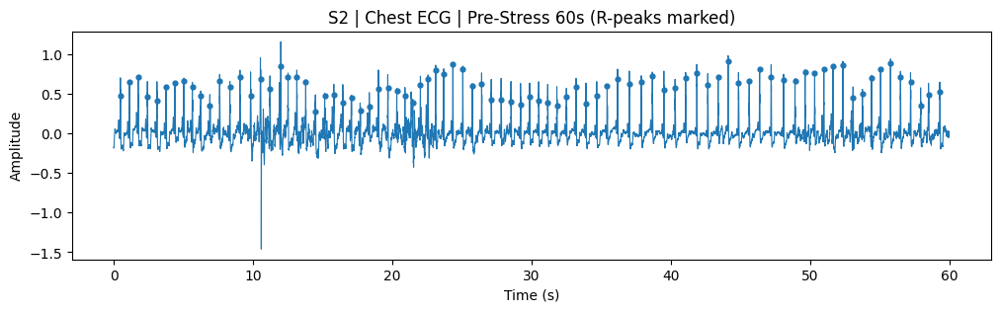

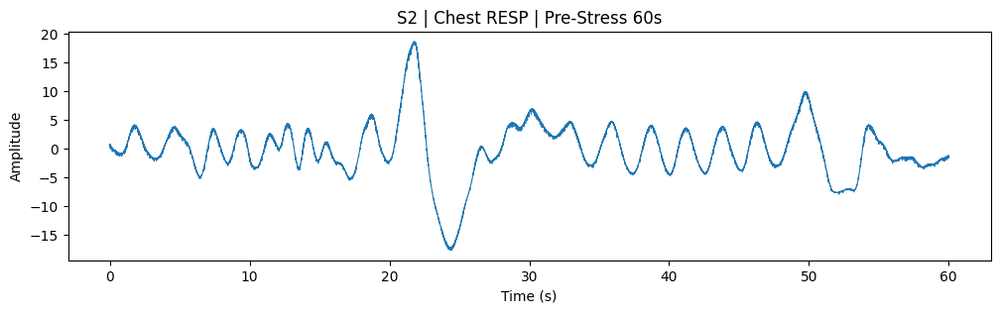

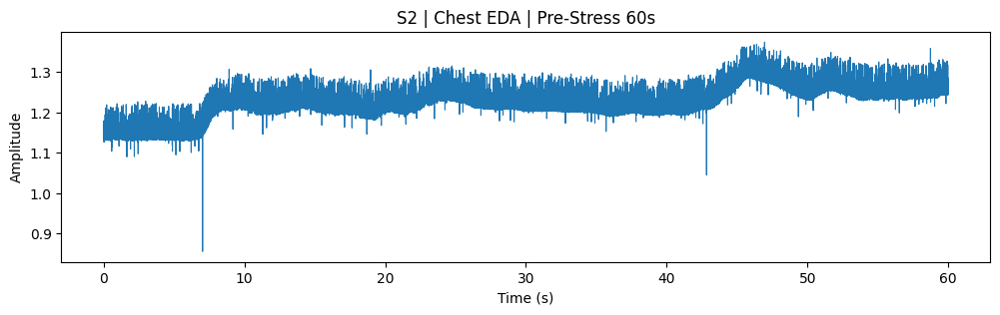

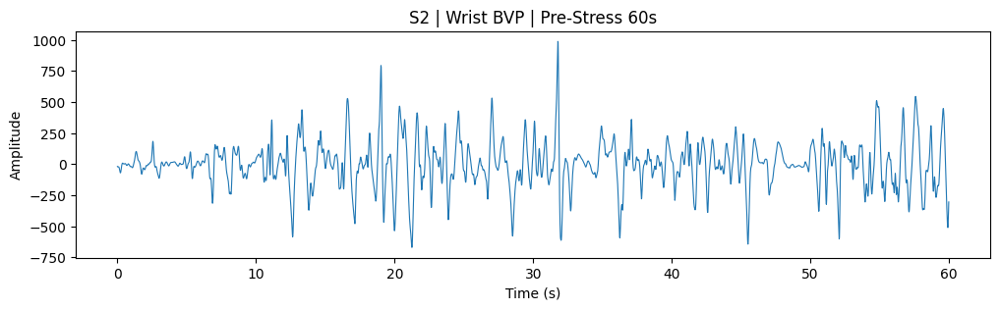

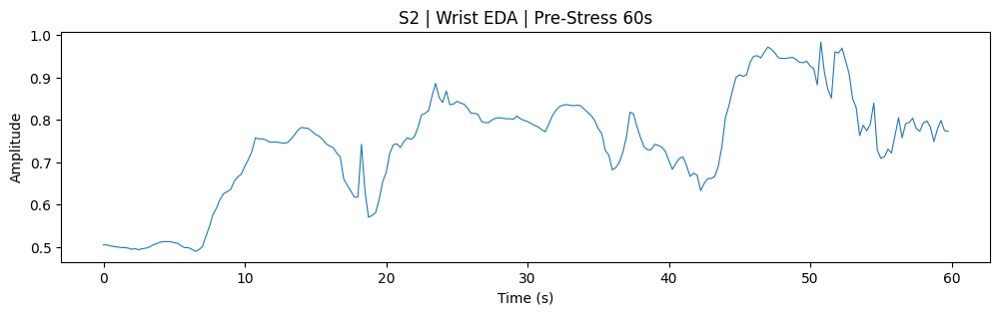

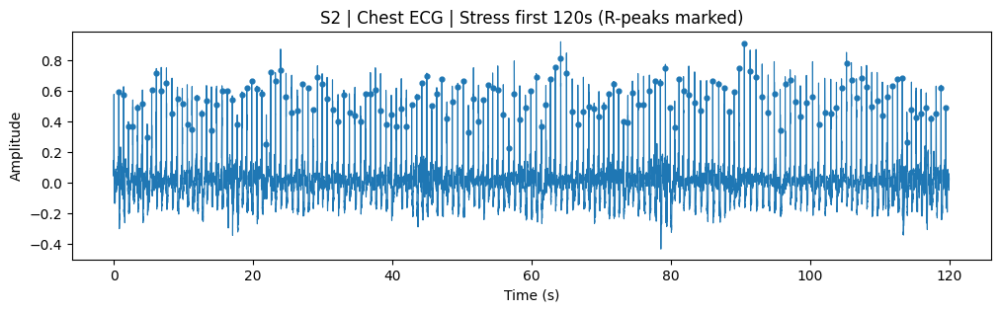

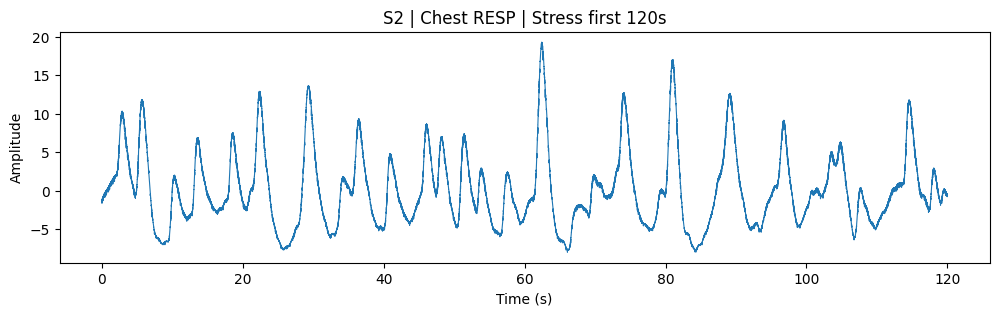

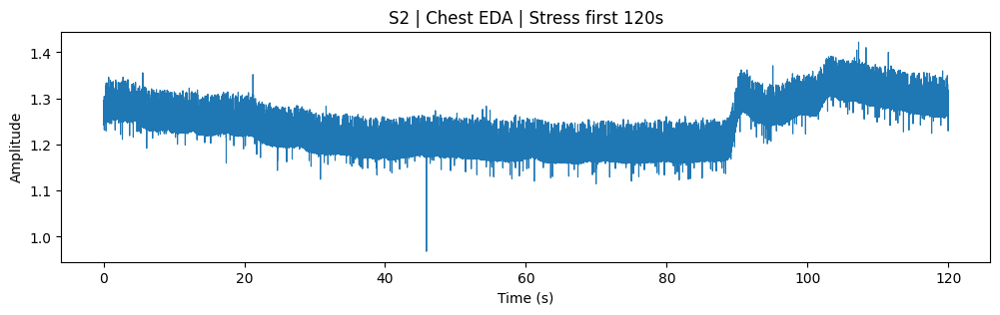

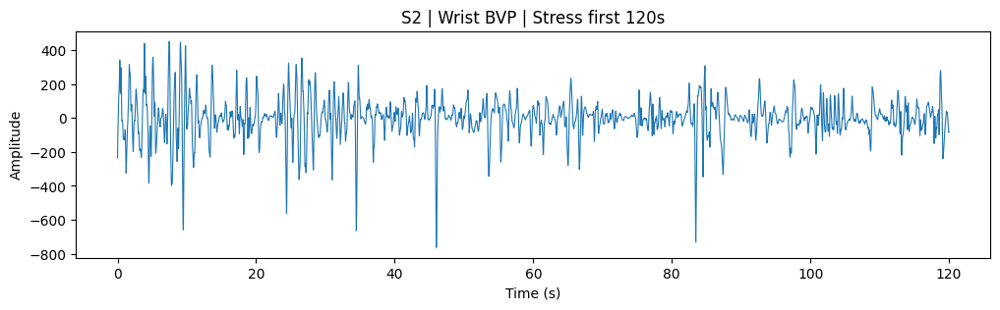

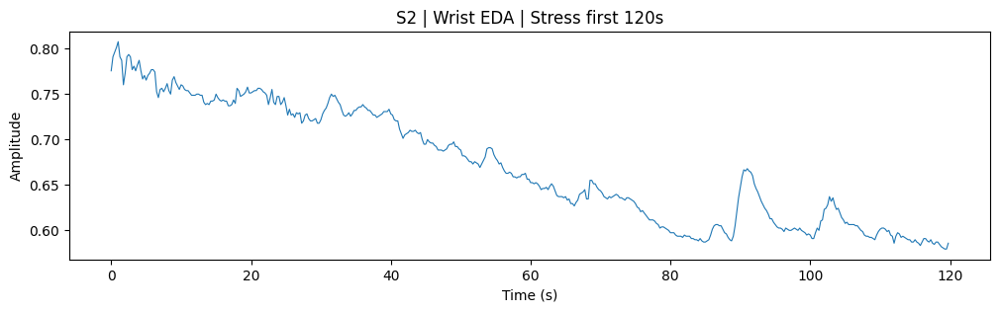

Saved  /content/wesad/reports


In [ ]:
#  Extract strips
# Chest (all at 700 Hz)
ecg_pre, _, _  = slice_sec(chest["ECG"],  fs_chest, pre_start, pre_end)
resp_pre, _, _ = slice_sec(chest["Resp"], fs_chest, pre_start, pre_end)
edaC_pre, _, _ = slice_sec(chest["EDA"],  fs_chest, pre_start, pre_end)

ecg_str, _, _  = slice_sec(chest["ECG"],  fs_chest, str_start, str_end)
resp_str, _, _ = slice_sec(chest["Resp"], fs_chest, str_start, str_end)
edaC_str, _, _ = slice_sec(chest["EDA"],  fs_chest, str_start, str_end)

# Wrist (Empatica E4 rates)
bvp_pre, _, _  = slice_sec(wrist["BVP"], fs_wrist["BVP"], pre_start, pre_end)
edaW_pre, _, _ = slice_sec(wrist["EDA"], fs_wrist["EDA"], pre_start, pre_end)

bvp_str, _, _  = slice_sec(wrist["BVP"], fs_wrist["BVP"], str_start, str_end)
edaW_str, _, _ = slice_sec(wrist["EDA"], fs_wrist["EDA"], str_start, str_end)

# ECG peak detection (R-peaks) on the 60s pre-stress to check clarity

try:
    ecg_clean = nk.ecg_clean(ecg_pre, sampling_rate=fs_chest, method="neurokit")
    _, rpeaks = nk.ecg_peaks(ecg_clean, sampling_rate=fs_chest)
    r_idx = rpeaks["ECG_R_Peaks"]
except Exception as e:
    r_idx = np.array([], dtype=int)
    print("ECG peak detection warning:", e)

#  plotting
out_dir = proj/"reports"
out_dir.mkdir(parents=True, exist_ok=True)

def plot_strip(y, fs, title, mark_peaks=None, fname=None):
    t = np.arange(len(y))/fs
    plt.figure(figsize=(12,3))
    plt.plot(t, y, linewidth=0.8)
    if mark_peaks is not None and len(mark_peaks) > 0:
        plt.scatter(mark_peaks/fs, y[mark_peaks], s=12)
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.title(title)
    if fname:
        plt.savefig(out_dir/fname, bbox_inches="tight", dpi=150)
    plt.show()

# pre-stress 60s strips
plot_strip(ecg_pre,  fs_chest, f"{subject_id} | Chest ECG | Pre-Stress 60s (R-peaks marked)",
           mark_peaks=r_idx, fname=f"P2_{subject_id}_ECG_pre.png")
plot_strip(resp_pre,  fs_chest, f"{subject_id} | Chest RESP | Pre-Stress 60s",
           fname=f"P2_{subject_id}_RESP_pre.png")
plot_strip(edaC_pre,  fs_chest, f"{subject_id} | Chest EDA | Pre-Stress 60s",
           fname=f"P2_{subject_id}_EDA_chest_pre.png")
plot_strip(bvp_pre,   fs_wrist["BVP"], f"{subject_id} | Wrist BVP | Pre-Stress 60s",
           fname=f"P2_{subject_id}_BVP_pre.png")
plot_strip(edaW_pre,  fs_wrist["EDA"], f"{subject_id} | Wrist EDA | Pre-Stress 60s",
           fname=f"P2_{subject_id}_EDA_wrist_pre.png")

# stress first 120s strips

try:
    ecg_clean_s = nk.ecg_clean(ecg_str, sampling_rate=fs_chest, method="neurokit")
    _, rpeaks_s = nk.ecg_peaks(ecg_clean_s, sampling_rate=fs_chest)
    r_idx_s = rpeaks_s["ECG_R_Peaks"]
except Exception:
    r_idx_s = np.array([], dtype=int)

plot_strip(ecg_str,  fs_chest, f"{subject_id} | Chest ECG | Stress first {stress_window_sec}s (R-peaks marked)",
           mark_peaks=r_idx_s, fname=f"P2_{subject_id}_ECG_stress.png")
plot_strip(resp_str,  fs_chest, f"{subject_id} | Chest RESP | Stress first {stress_window_sec}s",
           fname=f"P2_{subject_id}_RESP_stress.png")
plot_strip(edaC_str,  fs_chest, f"{subject_id} | Chest EDA | Stress first {stress_window_sec}s",
           fname=f"P2_{subject_id}_EDA_chest_stress.png")
plot_strip(bvp_str,   fs_wrist["BVP"], f"{subject_id} | Wrist BVP | Stress first {stress_window_sec}s",
           fname=f"P2_{subject_id}_BVP_stress.png")
plot_strip(edaW_str,  fs_wrist["EDA"], f"{subject_id} | Wrist EDA | Stress first {stress_window_sec}s",
           fname=f"P2_{subject_id}_EDA_wrist_stress.png")

print("Saved ", out_dir)

In [ ]:
#  Per-second feature extraction (CHEST, S2) — final robust ===
# Output: /content/wesad/features/seconds/S2_seconds.parquet

import pickle, numpy as np, pandas as pd
from pathlib import Path
import neurokit2 as nk

proj = Path("/content/wesad")
root_dir = Path("/content/WESAD/WESAD")
subject_id = "S2"
fs = 700  # chest

#  Load
with open(root_dir/subject_id/f"{subject_id}.pkl", "rb") as f:
    data = pickle.load(f, encoding="latin1")
ch = data["signal"]["chest"]

ecg  = np.asarray(ch["ECG"],  float)
resp = np.asarray(ch["Resp"], float)
eda  = np.asarray(ch["EDA"],  float)
temp = np.asarray(ch["Temp"], float)

ACC = np.asarray(ch["ACC"])
if ACC.ndim == 2 and ACC.shape[0] == 3:  # (3,N) -> (N,3)
    ACC = ACC.T
acc_mag = np.sqrt((ACC**2).sum(axis=1))

min_len = min(len(ecg), len(resp), len(eda), len(temp), len(acc_mag))
total_sec = int(min_len // fs)
print(f"{subject_id}: using {total_sec} full seconds")

def sec_slice(x, s):
    i0, i1 = s*fs, min(s*fs + fs, len(x))
    return x[i0:i1]

ecg_clean = nk.ecg_clean(ecg[:min_len], sampling_rate=fs, method="neurokit")
_, rpeaks = nk.ecg_peaks(ecg_clean, sampling_rate=fs)
rpos = np.asarray(rpeaks["ECG_R_Peaks"], dtype=int)

rr_sec = np.diff(rpos) / fs
if rr_sec.size > 0:
    rr_med = float(np.median(rr_sec))
    rr_outlier = np.abs(rr_sec - rr_med) > (0.20 * rr_med)
else:
    rr_outlier = np.array([], dtype=bool)
beat_sec = (rpos / fs).astype(int)
rr_sec_idx = beat_sec[1:]  # align with rr_outlier



S2: using 6079 full seconds


In [ ]:
# ---------- Helpers for artifacts
def max_abs_step(seg: np.ndarray) -> float:
    seg = np.asarray(seg, float)
    if seg.size < 2:
        return 0.0
    d = np.diff(seg)
    if d.size == 0:
        return 0.0
    d = np.abs(d)
    d = d[np.isfinite(d)]
    return float(d.max()) if d.size else 0.0

# ACC per-sec baseline
acc_sec_means = np.array([sec_slice(acc_mag, s).mean() for s in range(total_sec)])
acc_mu = float(acc_sec_means.mean())
acc_sd = float(acc_sec_means.std(ddof=1)) if total_sec > 1 else 1.0
if acc_sd == 0: acc_sd = 1.0

# EDA per-sec max-step baseline
eda_sec_maxstep = np.array([max_abs_step(sec_slice(eda, s)) for s in range(total_sec)])
eda_ms_mu = float(np.nanmean(eda_sec_maxstep)) if eda_sec_maxstep.size else 0.0
eda_ms_sd = float(np.nanstd(eda_sec_maxstep, ddof=1)) if total_sec > 1 else 1.0
if eda_ms_sd == 0: eda_ms_sd = 1.0

# ---------- Per-second features
rows = []
for s in range(total_sec):
    ecg_s  = sec_slice(ecg,  s)
    resp_s = sec_slice(resp, s)
    eda_s  = sec_slice(eda,  s)
    temp_s = sec_slice(temp, s)
    acc_s  = sec_slice(acc_mag, s)

    # ECG
    beats_in_s = int(np.sum(beat_sec == s))
    hr_bpm = float(beats_in_s * 60.0)
    if rr_outlier.size > 0:
        bad_rr = rr_outlier[rr_sec_idx == s]
        rr_outlier_ratio = float(bad_rr.mean()) if bad_rr.size > 0 else 0.0
    else:
        rr_outlier_ratio = 0.0

    # RESP
    resp_mean = float(resp_s.mean()) if resp_s.size else 0.0
    resp_std  = float(resp_s.std(ddof=1)) if resp_s.size > 1 else 0.0
    resp_amp  = float(resp_s.max() - resp_s.min()) if resp_s.size else 0.0

    # EDA
    eda_mean  = float(eda_s.mean()) if eda_s.size else 0.0
    eda_std   = float(eda_s.std(ddof=1)) if eda_s.size > 1 else 0.0
    eda_slope = float(eda_s[-1] - eda_s[0]) if eda_s.size > 1 else 0.0
    eda_maxstep = max_abs_step(eda_s)
    eda_spike_flag = int((eda_ms_sd > 0) and ((eda_maxstep - eda_ms_mu) / eda_ms_sd > 3.0))

    # TEMP
    temp_mean = float(temp_s.mean()) if temp_s.size else 0.0
    temp_slope= float(temp_s[-1] - temp_s[0]) if temp_s.size > 1 else 0.0

    # ACC
    acc_mean = float(acc_s.mean()) if acc_s.size else 0.0
    acc_std  = float(acc_s.std(ddof=1)) if acc_s.size > 1 else 0.0
    acc_z    = (acc_mean - acc_mu) / acc_sd if acc_sd > 0 else 0.0
    acc_artifact_flag = int(acc_z > 3.0)

    rows.append({
        "subject": subject_id,
        "second": s,
        "ecg_hr_bpm": hr_bpm,
        "ecg_rr_outlier_ratio": rr_outlier_ratio,
        "resp_mean": resp_mean,
        "resp_std": resp_std,
        "resp_amp": resp_amp,
        "eda_mean": eda_mean,
        "eda_std": eda_std,
        "eda_slope": eda_slope,
        "eda_spike_flag": eda_spike_flag,
        "temp_mean": temp_mean,
        "temp_slope": temp_slope,
        "acc_mean": acc_mean,
        "acc_std": acc_std,
        "acc_artifact_flag": acc_artifact_flag,
    })

df_sec = pd.DataFrame(rows)

# Save and check
out_path = proj/"features"/"seconds"/f"{subject_id}_seconds.parquet"
out_path.parent.mkdir(parents=True, exist_ok=True)
df_sec.to_parquet(out_path, index=False)
print("saved:", out_path)

print("\nECG HR (bpm) summary:")
print(df_sec["ecg_hr_bpm"].describe()[["mean","min","max"]])

print("\nArtifact flag rates:")
print({
    "eda_spike_flag_rate": float(df_sec["eda_spike_flag"].mean()),
    "acc_artifact_flag_rate": float(df_sec["acc_artifact_flag"].mean()),
})

/tmp/ipython-input-529303469.py:51: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  eda_slope = float(eda_s[-1] - eda_s[0]) if eda_s.size > 1 else 0.0
/tmp/ipython-input-529303469.py:57: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  temp_slope= float(temp_s[-1] - temp_s[0]) if temp_s.size > 1 else 0.0


saved: /content/wesad/features/seconds/S2_seconds.parquet

ECG HR (bpm) summary:
mean     71.557822
min       0.000000
max     180.000000
Name: ecg_hr_bpm, dtype: float64

Artifact flag rates:
{'eda_spike_flag_rate': 0.0, 'acc_artifact_flag_rate': 0.0008225037012666557}


In [ ]:
# Per-second CHEST features for ALL subjects + phase labels
# Writes: /content/wesad/features/seconds/Sxx_seconds.parquet for each subject
# Optionally merges into: /content/wesad/features/seconds/all_seconds.parquet

import pickle, json
import numpy as np
import pandas as pd
from pathlib import Path
import neurokit2 as nk

proj = Path("/content/wesad")
root_dir = Path("/content/WESAD/WESAD")
out_dir  = proj/"features"/"seconds"
out_dir.mkdir(parents=True, exist_ok=True)

fs = 700
subjects_sorted = sorted(subjects)  # from earlier

def sec_slice(x, s, fs, nmax):
    i0, i1 = s*fs, min(s*fs + fs, nmax)
    return x[i0:i1]

def max_abs_step(seg: np.ndarray) -> float:
    seg = np.asarray(seg, float)
    if seg.size < 2: return 0.0
    d = np.diff(seg)
    if d.size == 0: return 0.0
    d = np.abs(d)
    d = d[np.isfinite(d)]
    return float(d.max()) if d.size else 0.0

def load_intervals(subject_id: str):
    p = proj/"interim"/f"{subject_id}_intervals.json"
    if not p.exists():
        return {"Baseline":[], "Stress":[], "Amusement":[], "Meditation":[]}
    with open(p, "r") as f:
        j = json.load(f)
    return j["intervals"]

def seconds_to_phase(subject_id: str, total_sec: int):
    """Make a per-second phase vector using interval JSON (Baseline/Stress/Amusement/Meditation/None)."""
    ivs = load_intervals(subject_id)
    phase_vec = np.array(["None"]*total_sec, dtype=object)
    for phase in ["Baseline","Stress","Amusement","Meditation"]:
        for iv in ivs.get(phase, []):
            s0 = int(np.floor(iv["start_sec"]))
            s1 = int(np.floor(iv["end_sec"]))  # end is exclusive-ish
            s0 = max(0, s0); s1 = min(total_sec, s1)
            if s1 > s0:
                phase_vec[s0:s1] = phase
    return phase_vec

def extract_seconds_chest(subject_id: str) -> Path:
    # Load
    with open(root_dir/subject_id/f"{subject_id}.pkl", "rb") as f:
        data = pickle.load(f, encoding="latin1")
    ch = data["signal"]["chest"]

    # Arrays
    ecg  = np.asarray(ch["ECG"],  float)
    resp = np.asarray(ch["Resp"], float)
    eda  = np.asarray(ch["EDA"],  float)
    temp = np.asarray(ch["Temp"], float)

    ACC = np.asarray(ch["ACC"])
    if ACC.ndim == 2 and ACC.shape[0] == 3:
        ACC = ACC.T
    acc_mag = np.sqrt((ACC**2).sum(axis=1))

    nmax = min(len(ecg), len(resp), len(eda), len(temp), len(acc_mag))
    total_sec = int(nmax // fs)

    # ECG clean + peaks
    ecg_clean = nk.ecg_clean(ecg[:nmax], sampling_rate=fs, method="neurokit")
    _, rpeaks = nk.ecg_peaks(ecg_clean, sampling_rate=fs)
    rpos = np.asarray(rpeaks["ECG_R_Peaks"], dtype=int)

    rr_sec = np.diff(rpos) / fs
    if rr_sec.size > 0:
        rr_med = float(np.median(rr_sec))
        rr_outlier = np.abs(rr_sec - rr_med) > (0.20 * rr_med)
    else:
        rr_outlier = np.array([], dtype=bool)
    beat_sec = (rpos / fs).astype(int)
    rr_sec_idx = beat_sec[1:]

    # Baselines for artifacts
    acc_sec_means = np.array([sec_slice(acc_mag, s, fs, nmax).mean() for s in range(total_sec)])
    acc_mu = float(acc_sec_means.mean())
    acc_sd = float(acc_sec_means.std(ddof=1)) if total_sec > 1 else 1.0
    if acc_sd == 0: acc_sd = 1.0

    eda_sec_maxstep = np.array([max_abs_step(sec_slice(eda, s, fs, nmax)) for s in range(total_sec)])
    eda_ms_mu = float(np.nanmean(eda_sec_maxstep)) if eda_sec_maxstep.size else 0.0
    eda_ms_sd = float(np.nanstd(eda_sec_maxstep, ddof=1)) if total_sec > 1 else 1.0
    if eda_ms_sd == 0: eda_ms_sd = 1.0

    # Per-second features
    rows = []
    for s in range(total_sec):
        ecg_s  = sec_slice(ecg,  s, fs, nmax)
        resp_s = sec_slice(resp, s, fs, nmax)
        eda_s  = sec_slice(eda,  s, fs, nmax)
        temp_s = sec_slice(temp, s, fs, nmax)
        acc_s  = sec_slice(acc_mag, s, fs, nmax)

        # ECG features
        beats_in_s = int(np.sum(beat_sec == s))
        hr_bpm = float(beats_in_s * 60.0)

        if rr_outlier.size > 0:
            bad_rr = rr_outlier[rr_sec_idx == s]
            rr_outlier_ratio = float(bad_rr.mean()) if bad_rr.size > 0 else 0.0
        else:
            rr_outlier_ratio = 0.0

        # RESP
        resp_mean = float(np.mean(resp_s)) if resp_s.size else 0.0
        resp_std  = float(np.std(resp_s, ddof=1)) if resp_s.size > 1 else 0.0
        resp_amp  = float(resp_s.max() - resp_s.min()) if resp_s.size else 0.0

        # EDA (safe slopes)
        eda_mean  = float(np.mean(eda_s)) if eda_s.size else 0.0
        eda_std   = float(np.std(eda_s, ddof=1)) if eda_s.size > 1 else 0.0
        eda_slope = float(np.asarray(eda_s[-1]).item() - np.asarray(eda_s[0]).item()) if eda_s.size > 1 else 0.0
        eda_maxstep = max_abs_step(eda_s)
        eda_spike_flag = int((eda_ms_sd > 0) and ((eda_maxstep - eda_ms_mu) / eda_ms_sd > 3.0))

        # TEMP
        temp_mean = float(np.mean(temp_s)) if temp_s.size else 0.0
        temp_slope= float(np.asarray(temp_s[-1]).item() - np.asarray(temp_s[0]).item()) if temp_s.size > 1 else 0.0

        # ACC
        acc_mean = float(np.mean(acc_s)) if acc_s.size else 0.0
        acc_std  = float(np.std(acc_s, ddof=1)) if acc_s.size > 1 else 0.0
        acc_z    = (acc_mean - acc_mu) / acc_sd if acc_sd > 0 else 0.0
        acc_artifact_flag = int(acc_z > 3.0)

        rows.append({
            "subject": subject_id,
            "second": s,
            "ecg_hr_bpm": hr_bpm,
            "ecg_rr_outlier_ratio": rr_outlier_ratio,
            "resp_mean": resp_mean,
            "resp_std": resp_std,
            "resp_amp": resp_amp,
            "eda_mean": eda_mean,
            "eda_std": eda_std,
            "eda_slope": eda_slope,
            "eda_spike_flag": eda_spike_flag,
            "temp_mean": temp_mean,
            "temp_slope": temp_slope,
            "acc_mean": acc_mean,
            "acc_std": acc_std,
            "acc_artifact_flag": acc_artifact_flag,
        })

    df = pd.DataFrame(rows)

    # Add per-second phase using intervals
    phase_vec = seconds_to_phase(subject_id, total_sec)
    df["phase"] = phase_vec

    # Save
    out_path = out_dir/f"{subject_id}_seconds.parquet"
    df.to_parquet(out_path, index=False)
    return out_path

written = []
for subject_id in subjects_sorted:
    p = extract_seconds_chest(subject_id)
    print(" saved:", p)
    written.append(p)

print("\nA writing", len(written), "files to", out_dir)

# (Optional) Merge all into one Parquet (could be ~1M rows; fine in Colab)
merge_out = out_dir/"all_seconds.parquet"
dfs = [pd.read_parquet(p) for p in written]
pd.concat(dfs, ignore_index=True).to_parquet(merge_out, index=False)
print(" merged:", merge_out)

# Quick sanity: per-phase HR stats (merged)
df_all = pd.read_parquet(merge_out)
print("\nHR (bpm) by phase (all subjects):")
print(df_all.groupby("phase")["ecg_hr_bpm"].describe()[["mean","min","max"]])


 saved: /content/wesad/features/seconds/S10_seconds.parquet
 saved: /content/wesad/features/seconds/S11_seconds.parquet
 saved: /content/wesad/features/seconds/S13_seconds.parquet
 saved: /content/wesad/features/seconds/S14_seconds.parquet
 saved: /content/wesad/features/seconds/S15_seconds.parquet
 saved: /content/wesad/features/seconds/S16_seconds.parquet
 saved: /content/wesad/features/seconds/S17_seconds.parquet
 saved: /content/wesad/features/seconds/S2_seconds.parquet
 saved: /content/wesad/features/seconds/S3_seconds.parquet
 saved: /content/wesad/features/seconds/S4_seconds.parquet
 saved: /content/wesad/features/seconds/S5_seconds.parquet
 saved: /content/wesad/features/seconds/S6_seconds.parquet
 saved: /content/wesad/features/seconds/S7_seconds.parquet
 saved: /content/wesad/features/seconds/S8_seconds.parquet
 saved: /content/wesad/features/seconds/S9_seconds.parquet

A writing 15 files to /content/wesad/features/seconds
 merged: /content/wesad/features/seconds/all_seconds.

saved: /content/wesad/interim/S2_labels_chestdelta20.parquet

Counts (seconds) per class:
label_hybrid
Other           2779
Anticipation    1200
Recovery        1200
Peak             900
Name: count, dtype: int64

Durations (min): {'Anticipation': 20.0, 'Peak': 15.0, 'Recovery': 20.0}
Recording length (min): 101.32


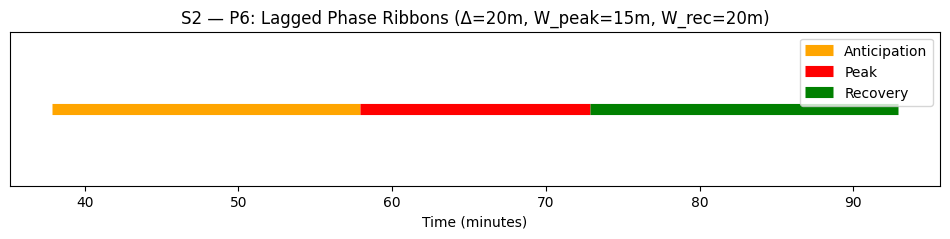

saved: /content/wesad/reports/P6_S2_phase_ribbons_lag.png


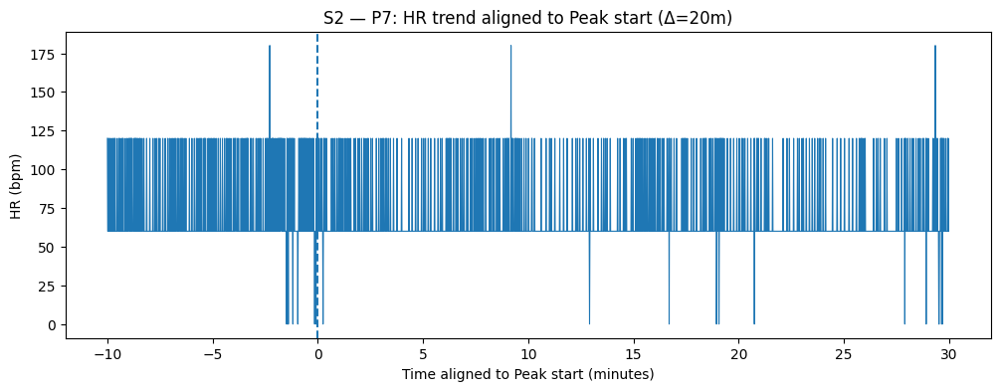

Saved: /content/wesad/reports/P7_S2_trend_aligned_peak.png


In [ ]:
#  Hybrid Labeling with Lag (CHEST, S2)
# Inputs:  /content/wesad/interim/S2_intervals.json
#           /content/wesad/features/seconds/S2_seconds.parquet  (for P7 trend)
# Outputs: /content/wesad/interim/S2_labels_chestdelta20.parquet
# Plots:   P6_S2_phase_ribbons_lag.png, P7_S2_trend_aligned_peak.png

import json
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

proj = Path("/content/wesad")
root_dir = Path("/content/WESAD/WESAD")
subject_id = "S2"

# parameters
DELTA_MIN   = 20            # delta grid choice; will trial error between 15,20,25,30,35
W_PEAK_MIN  = 15            # Peak window length (minutes)
W_REC_MIN   = 20            # Recovery window length (minutes)

# load intervals (from Step 3)
with open(proj/"interim"/f"{subject_id}_intervals.json","r") as f:
    J = json.load(f)

intervals = J["intervals"]
total_seconds = int(round(J.get("total_seconds", 0)))  # fallback to 0 if missing

# Get Stress [ts, te)
stress_ivs = intervals.get("Stress", [])
assert len(stress_ivs) >= 1, "No Stress interval found."
ts = float(stress_ivs[0]["start_sec"])
te = float(stress_ivs[0]["end_sec"])

# lagged phases in seconds
delta = DELTA_MIN * 60.0
w_peak = W_PEAK_MIN * 60.0
w_rec  = W_REC_MIN * 60.0

t_anticip_start = ts
t_anticip_end   = ts + delta

t_peak_start    = ts + delta
t_peak_end      = ts + delta + w_peak

t_rec_start     = t_peak_end
t_rec_end       = t_peak_end + w_rec

#clamp to recording length
# If you have per-second features, prefer its length for total_seconds
sec_path = proj/"features"/"seconds"/f"{subject_id}_seconds.parquet"
if sec_path.exists():
    df_sec_len = pd.read_parquet(sec_path)["second"].max() + 1
    total_seconds = int(max(total_seconds, df_sec_len))

if total_seconds <= 0:
    # as a fallback, estimate from WESAD at 700 Hz using label length
    import pickle
    with open(root_dir/subject_id/f"{subject_id}.pkl","rb") as f:
        data = pickle.load(f, encoding="latin1")
    total_seconds = int(len(data["label"]) // 700)

# Clamp phase ends to recording
t_anticip_end = min(t_anticip_end, total_seconds)
t_peak_end    = min(t_peak_end, total_seconds)
t_rec_end     = min(t_rec_end, total_seconds)

# Build second-wise labels
labels = np.array(["Other"] * total_seconds, dtype=object)

def mark_range(a, start_s, end_s, name):
    s0 = int(np.floor(max(0, start_s)))
    s1 = int(np.floor(min(total_seconds, end_s)))
    if s1 > s0:
        a[s0:s1] = name

mark_range(labels, t_anticip_start, t_anticip_end, "Anticipation")
mark_range(labels, t_peak_start,     t_peak_end,    "Peak")
mark_range(labels, t_rec_start,      t_rec_end,     "Recovery")

# save second-wise labels parquet
lab_df = pd.DataFrame({
    "subject": subject_id,
    "second": np.arange(total_seconds, dtype=int),
    "label_hybrid": labels
})
out_parquet = proj/"interim"/f"{subject_id}_labels_chestdelta{int(DELTA_MIN)}.parquet"
lab_df.to_parquet(out_parquet, index=False)
print("saved:", out_parquet)

# Checks
counts = lab_df["label_hybrid"].value_counts()
print("\nCounts (seconds) per class:")
print(counts)

def _dur(cls):
    return int((lab_df["label_hybrid"]==cls).sum())
print("\nDurations (min):",
      {k: round(_dur(k)/60.0, 2) for k in ["Anticipation","Peak","Recovery"] if k in counts.index})
print("Recording length (min):", round(total_seconds/60.0, 2))

# ensure non-zero examples (simple assert-style notices)
for cls in ["Anticipation","Peak","Recovery"]:
    if cls not in counts or counts[cls]==0:
        print(f" error mesage print {cls} has zero seconds ")


# P6: Phase ribbons (with lag)

out_dir = proj/"reports"
out_dir.mkdir(parents=True, exist_ok=True)

plt.figure(figsize=(12, 2))
def draw_block(y, x0, x1, color, label):
    if x1 > x0:
        plt.hlines(y, x0/60.0, x1/60.0, colors=color, linewidth=8, label=label)

# ribbons
draw_block(0, t_anticip_start, t_anticip_end, "orange", "Anticipation")
draw_block(0, t_peak_start,    t_peak_end,    "red",    "Peak")
draw_block(0, t_rec_start,     t_rec_end,     "green",  "Recovery")

plt.xlabel("Time (minutes)")
plt.yticks([])
plt.title(f"{subject_id} — P6: Lagged Phase Ribbons (Δ={DELTA_MIN}m, W_peak={W_PEAK_MIN}m, W_rec={W_REC_MIN}m)")
#  legend entries
handles, labels_ = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels_, handles))
plt.legend(by_label.values(), by_label.keys(), loc="upper right")
p6_path = out_dir/f"P6_{subject_id}_phase_ribbons_lag.png"
plt.savefig(p6_path, bbox_inches="tight", dpi=150)
plt.show()
print("saved:", p6_path)


# P7: Trend aligned to Peak start

if sec_path.exists():
    df_sec = pd.read_parquet(sec_path)
    # Align around Peak start = ts + (time zero)
    t0 = int(np.floor(t_peak_start))  # seconds
    # show from -10 min to +30 min around t0
    pre_min, post_min = 10, 30
    s0 = max(0, t0 - pre_min*60)
    s1 = min(total_seconds, t0 + post_min*60)

    cut = df_sec[(df_sec["second"] >= s0) & (df_sec["second"] < s1)].copy()
    cut["t_aligned_min"] = (cut["second"] - t0) / 60.0


    plt.figure(figsize=(12,4))
    plt.plot(cut["t_aligned_min"], cut["ecg_hr_bpm"], linewidth=0.8)
    plt.axvline(0, linestyle="--")
    plt.xlabel("Time aligned to Peak start (minutes)")
    plt.ylabel("HR (bpm)")
    plt.title(f"{subject_id} — P7: HR trend aligned to Peak start (Δ={DELTA_MIN}m)")
    p7_path = out_dir/f"P7_{subject_id}_trend_aligned_peak.png"
    plt.savefig(p7_path, bbox_inches="tight", dpi=150)
    plt.show()
    print("Saved:", p7_path)
else:
    print("Skipped", sec_path)


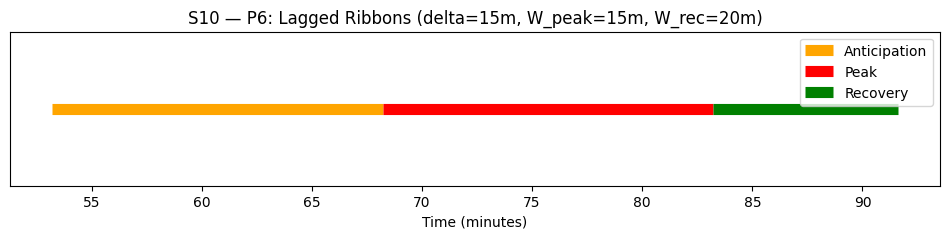

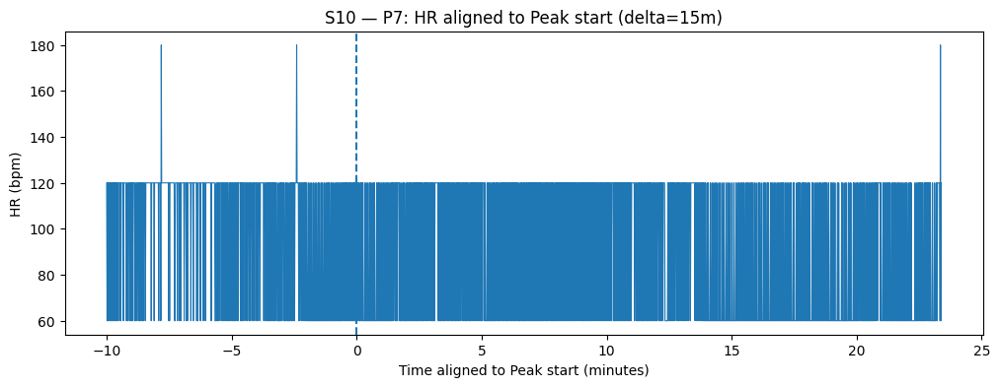

 S10 delta=15m -> S10_labels_chestdelta15.parquet | Ant:900s Peak:900s Rec:504s


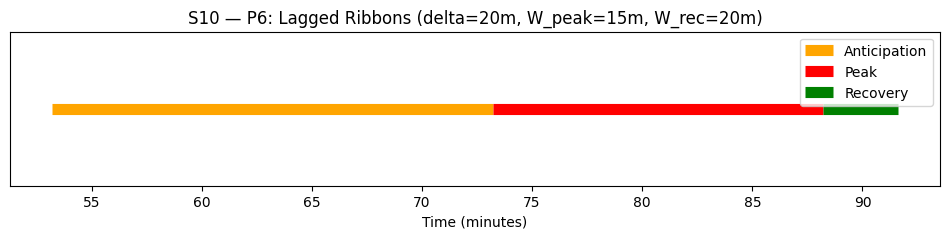

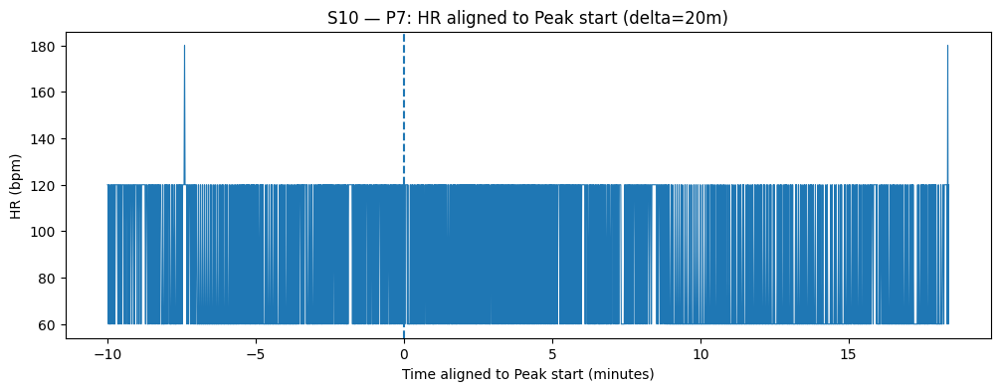

 S10 delta=20m -> S10_labels_chestdelta20.parquet | Ant:1200s Peak:900s Rec:204s


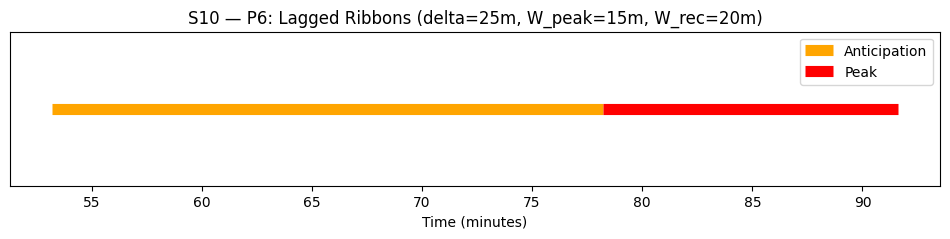

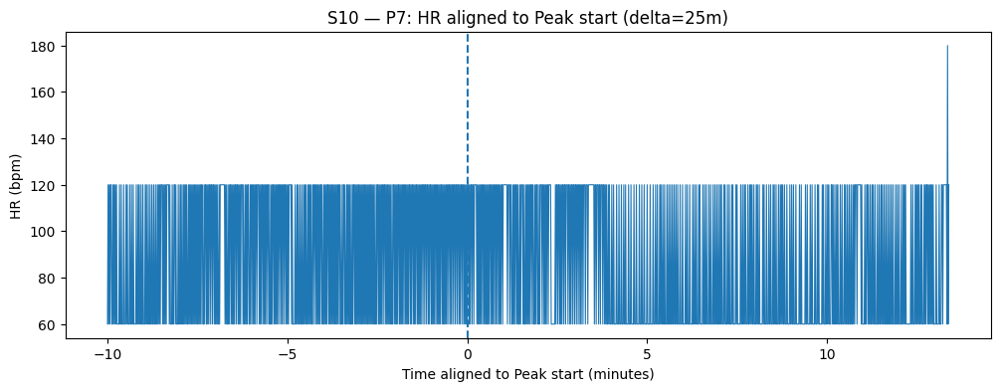

 S10 delta=25m -> S10_labels_chestdelta25.parquet | Ant:1500s Peak:804s Rec:0s


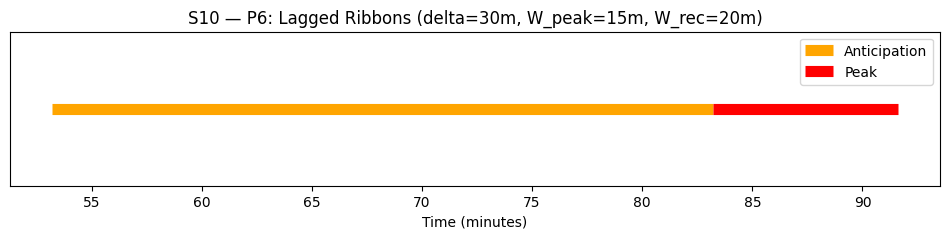

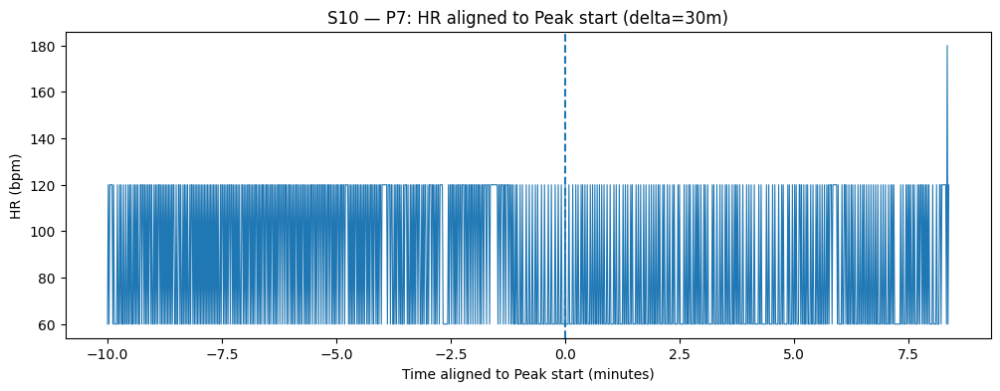

 S10 delta=30m -> S10_labels_chestdelta30.parquet | Ant:1800s Peak:504s Rec:0s


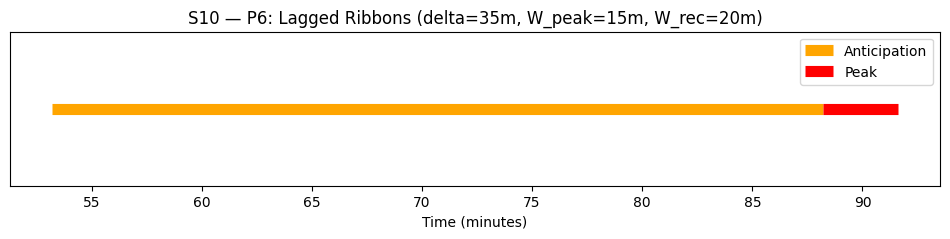

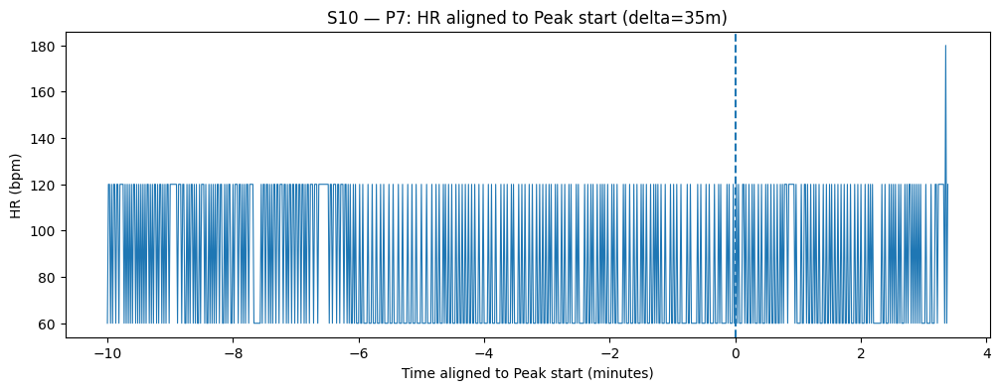

 S10 delta=35m -> S10_labels_chestdelta35.parquet | Ant:2100s Peak:204s Rec:0s


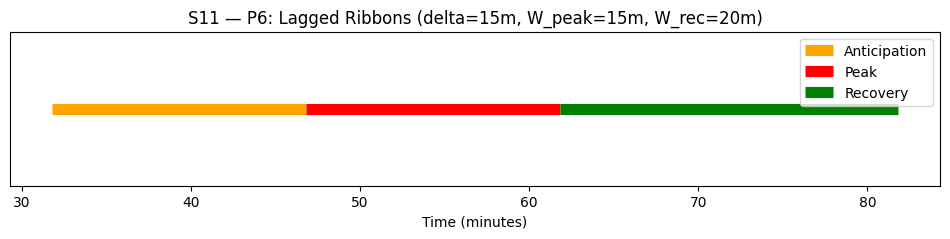

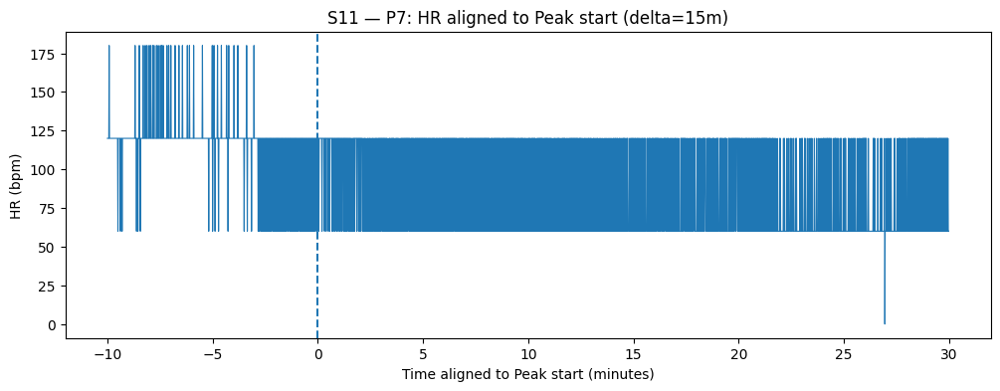

 S11 delta=15m -> S11_labels_chestdelta15.parquet | Ant:900s Peak:900s Rec:1200s


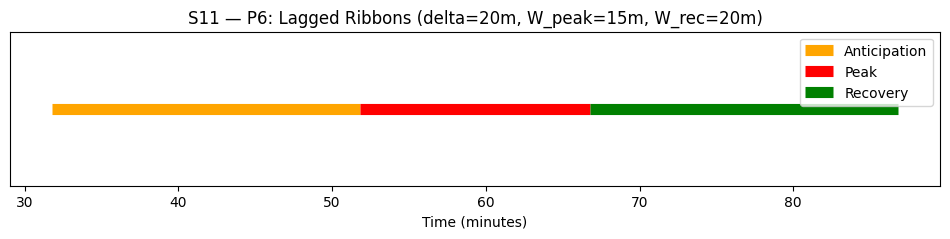

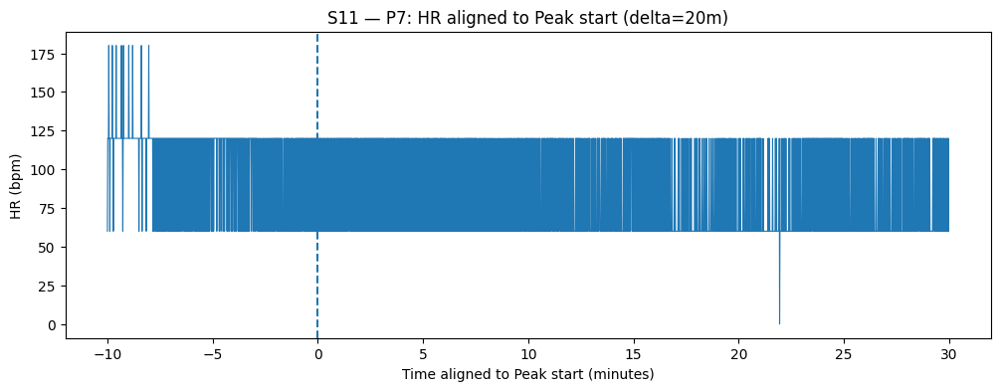

 S11 delta=20m -> S11_labels_chestdelta20.parquet | Ant:1200s Peak:900s Rec:1200s


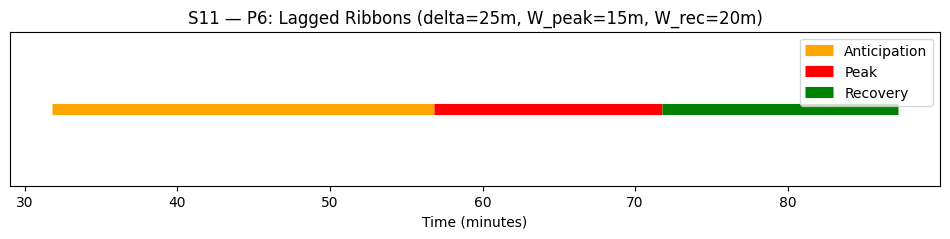

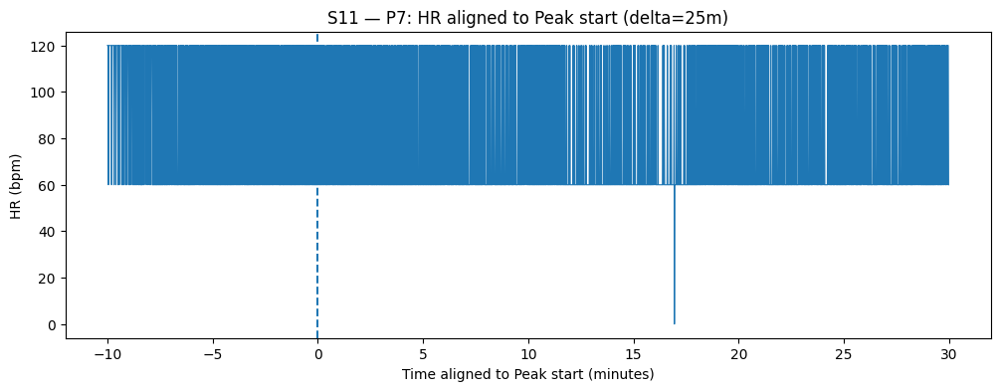

 S11 delta=25m -> S11_labels_chestdelta25.parquet | Ant:1500s Peak:900s Rec:926s


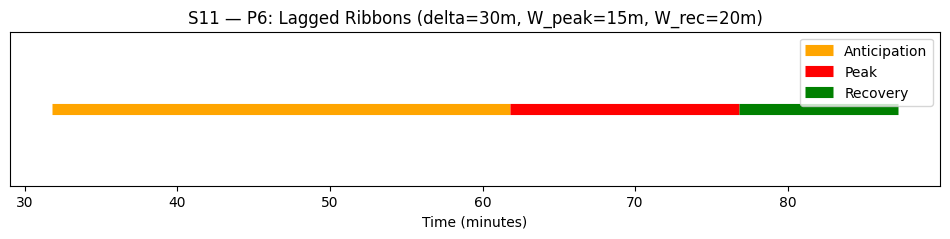

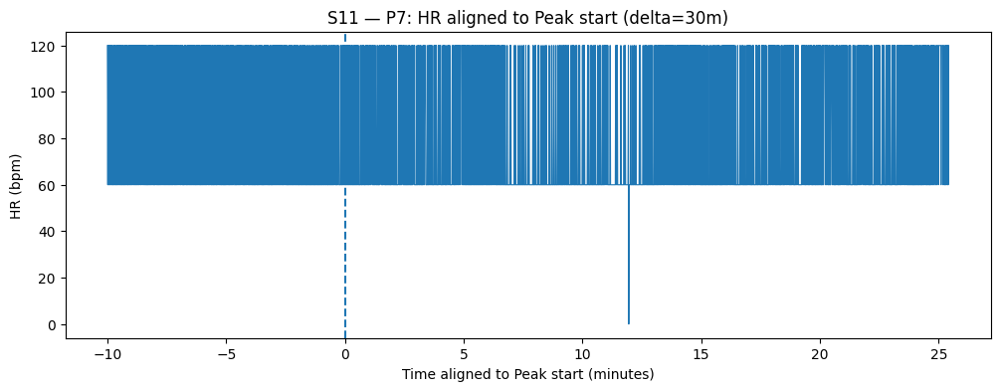

 S11 delta=30m -> S11_labels_chestdelta30.parquet | Ant:1800s Peak:900s Rec:626s


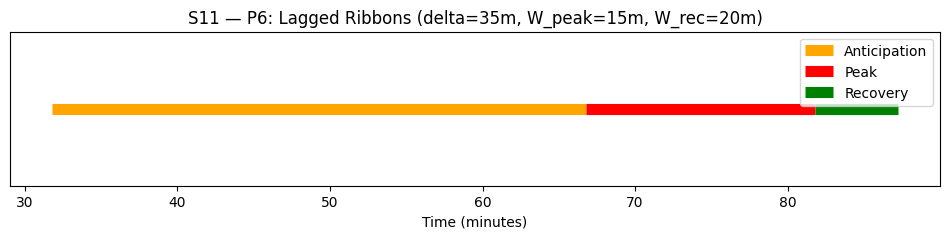

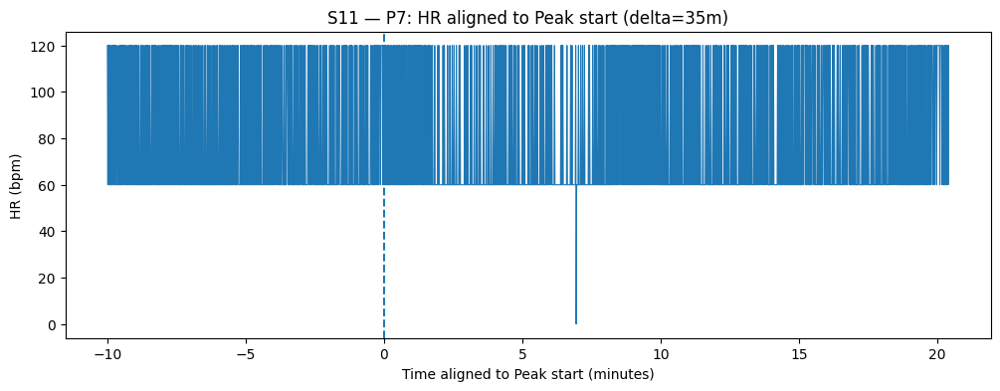

 S11 delta=35m -> S11_labels_chestdelta35.parquet | Ant:2100s Peak:900s Rec:326s


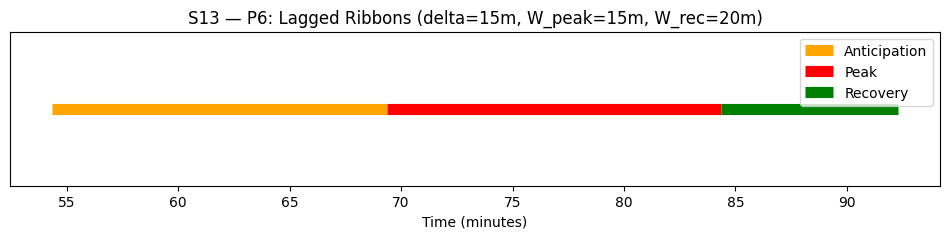

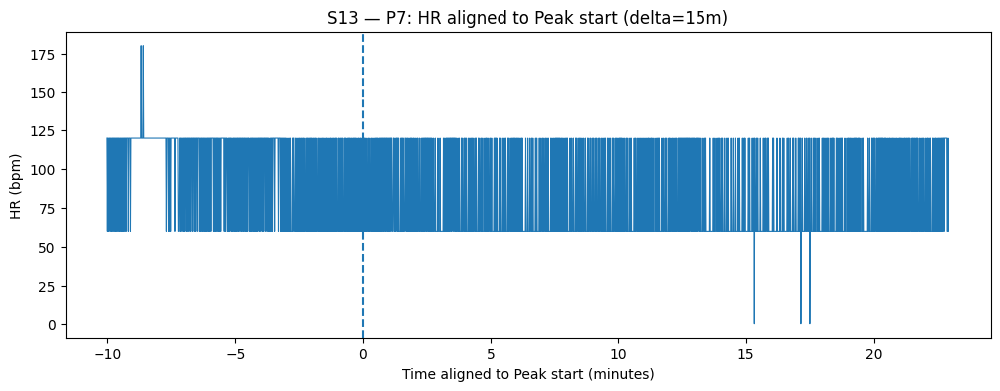

 S13 delta=15m -> S13_labels_chestdelta15.parquet | Ant:900s Peak:900s Rec:477s


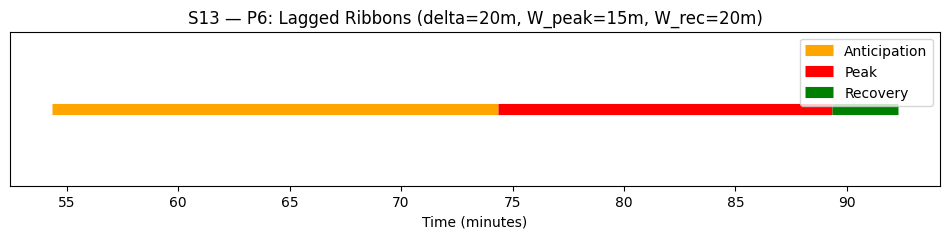

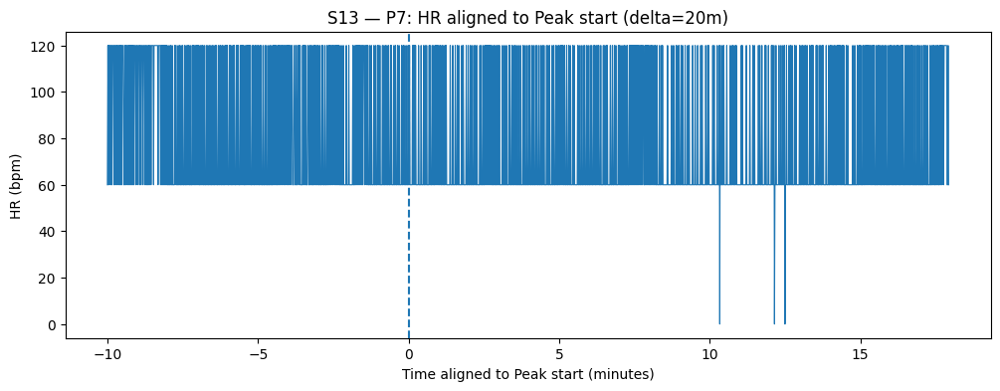

 S13 delta=20m -> S13_labels_chestdelta20.parquet | Ant:1200s Peak:900s Rec:177s


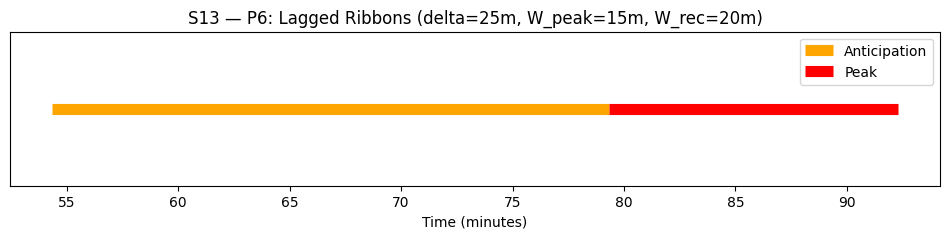

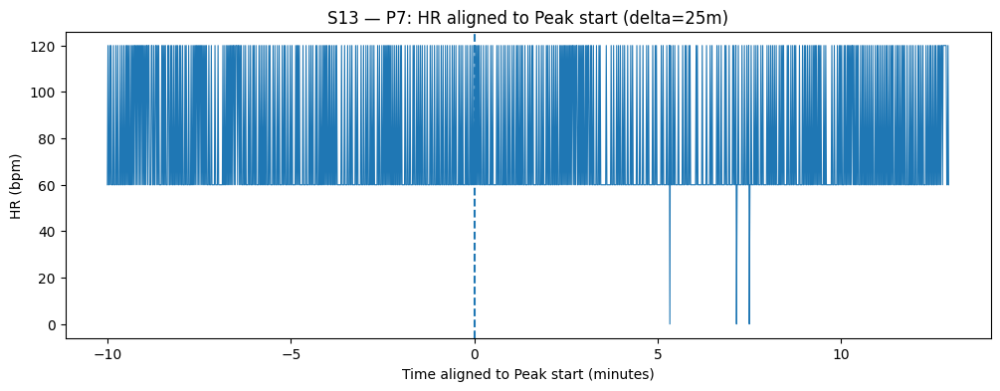

 S13 delta=25m -> S13_labels_chestdelta25.parquet | Ant:1500s Peak:777s Rec:0s


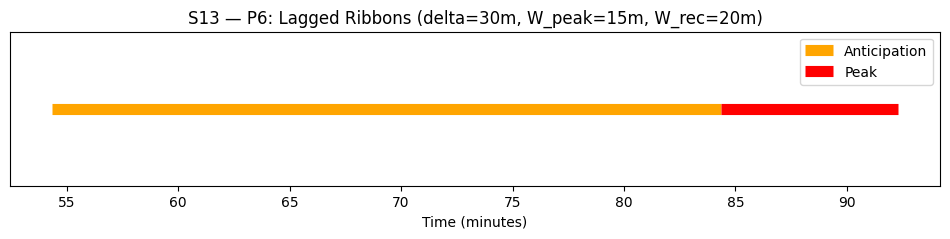

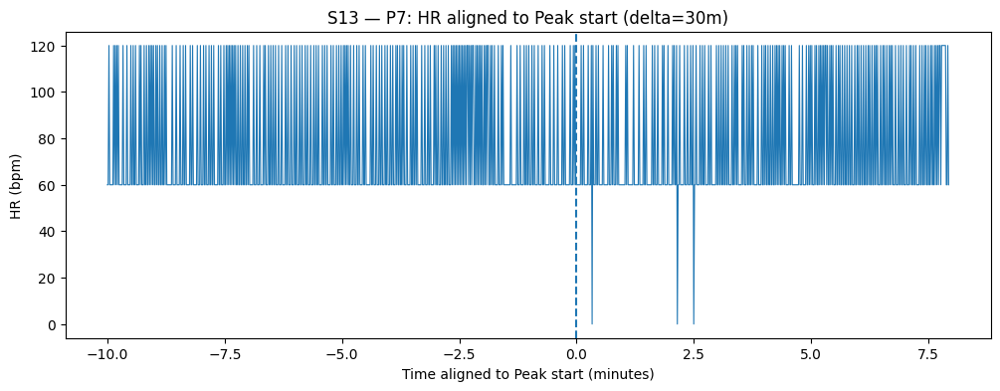

 S13 delta=30m -> S13_labels_chestdelta30.parquet | Ant:1800s Peak:477s Rec:0s


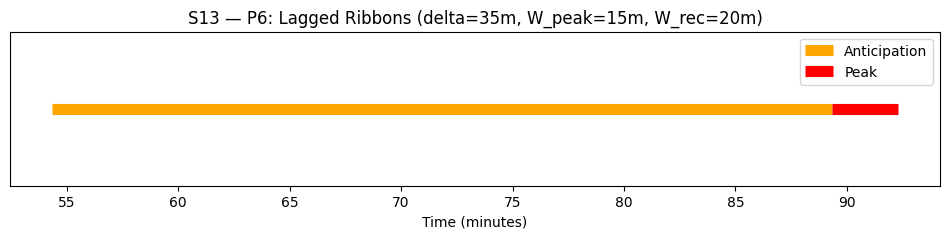

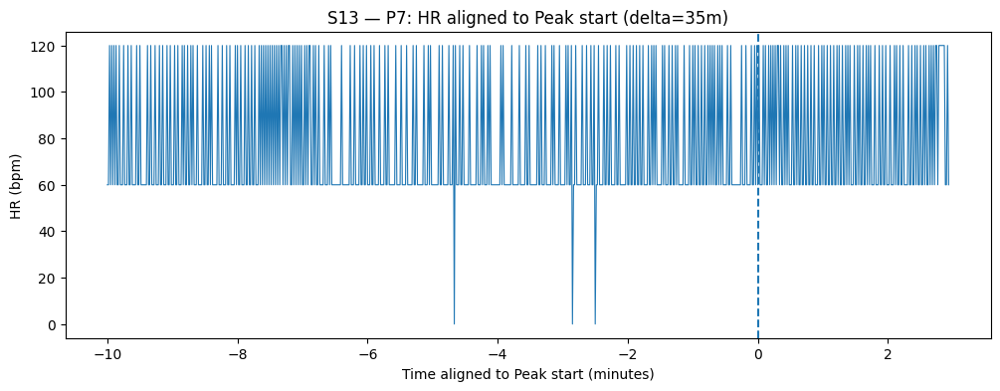

 S13 delta=35m -> S13_labels_chestdelta35.parquet | Ant:2100s Peak:177s Rec:0s


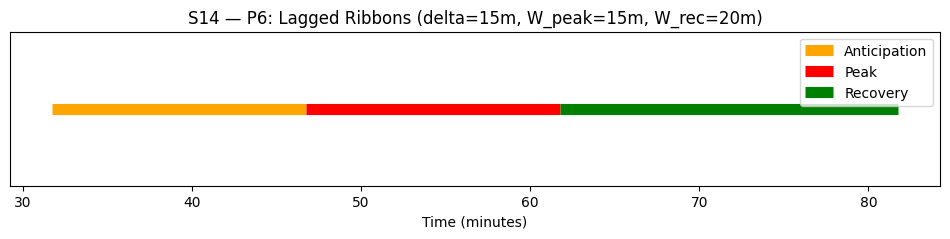

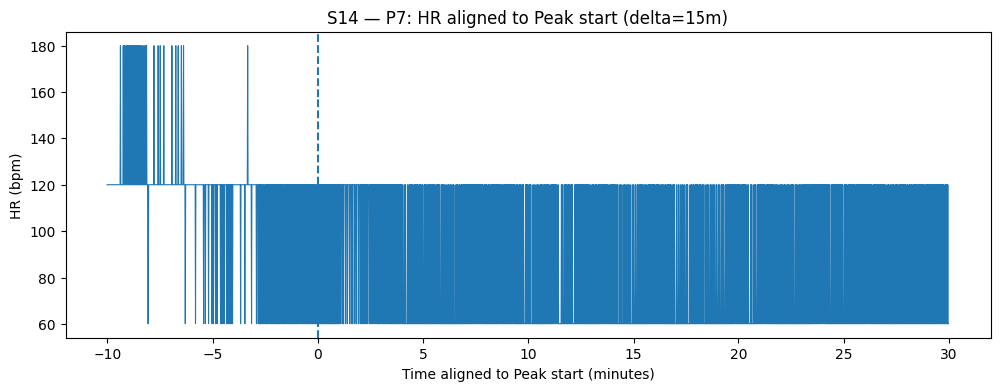

 S14 delta=15m -> S14_labels_chestdelta15.parquet | Ant:900s Peak:900s Rec:1200s


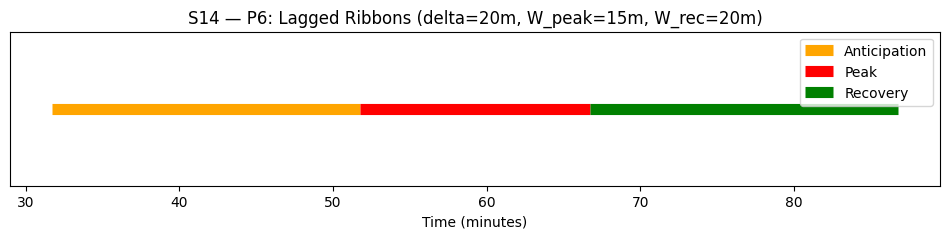

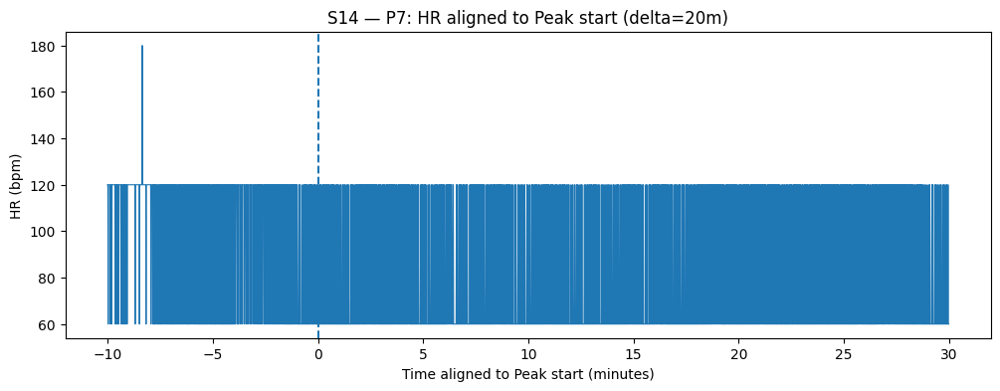

 S14 delta=20m -> S14_labels_chestdelta20.parquet | Ant:1200s Peak:900s Rec:1200s


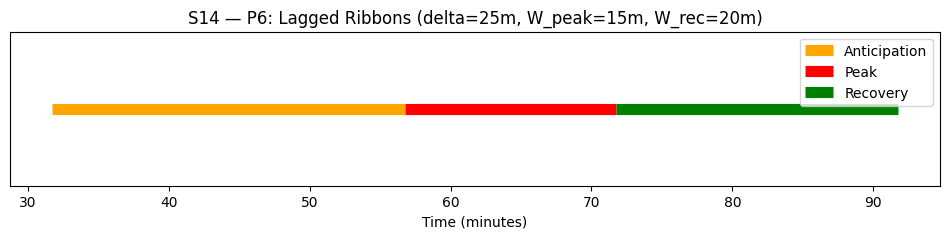

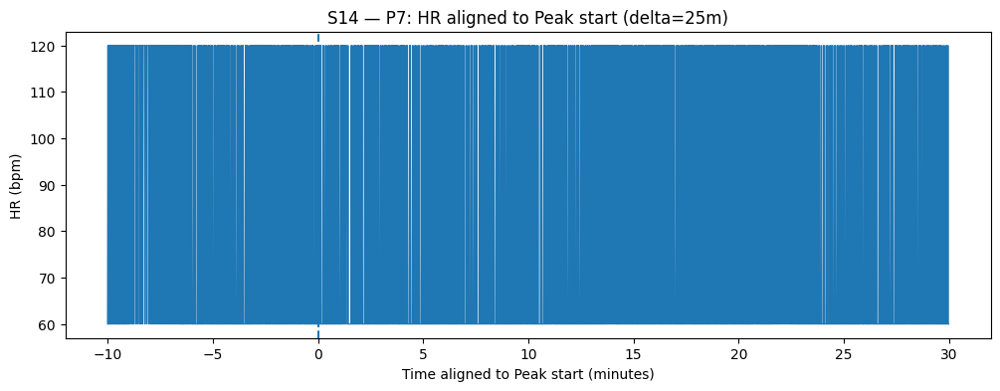

 S14 delta=25m -> S14_labels_chestdelta25.parquet | Ant:1500s Peak:900s Rec:1200s


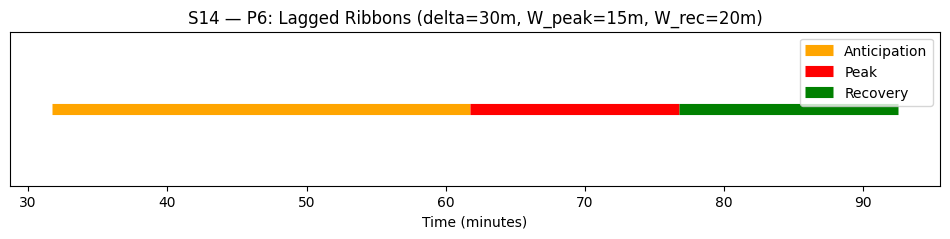

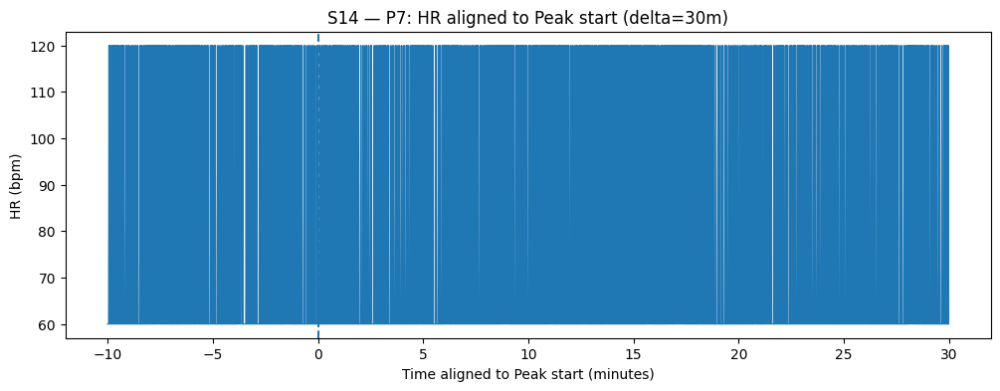

 S14 delta=30m -> S14_labels_chestdelta30.parquet | Ant:1800s Peak:900s Rec:944s


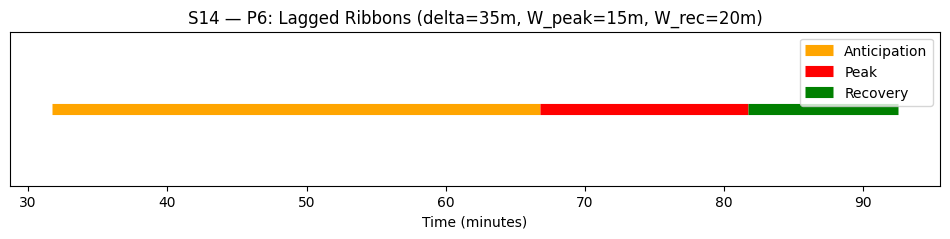

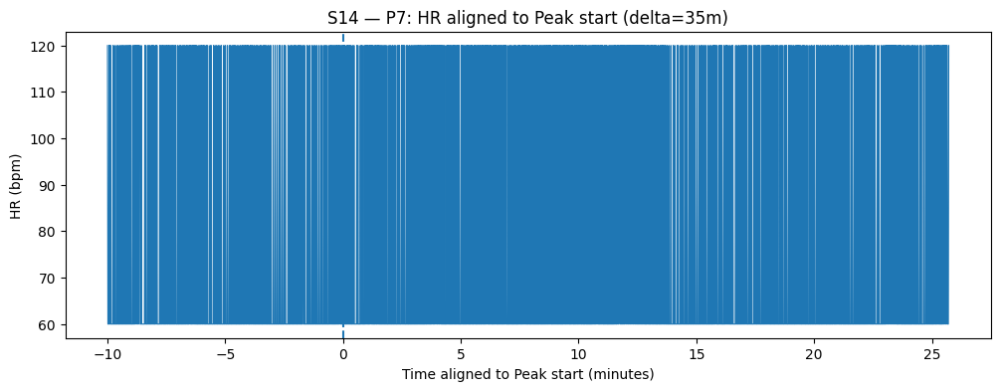

 S14 delta=35m -> S14_labels_chestdelta35.parquet | Ant:2100s Peak:900s Rec:644s


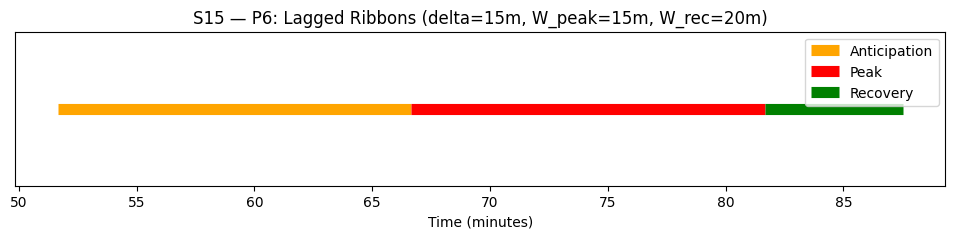

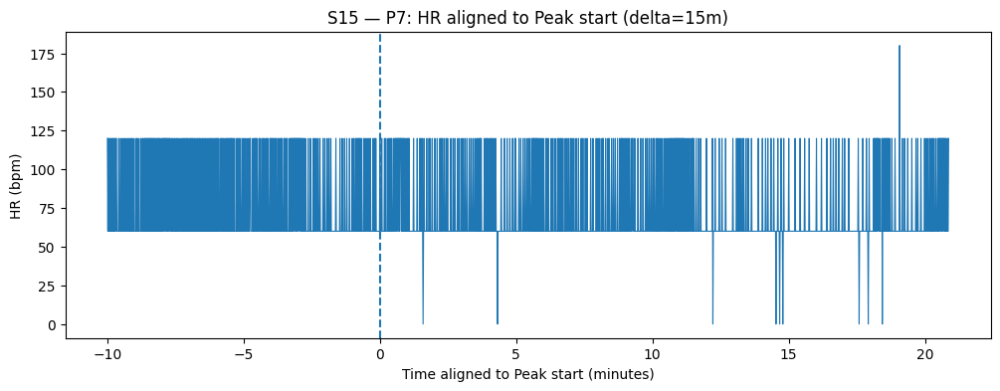

 S15 delta=15m -> S15_labels_chestdelta15.parquet | Ant:900s Peak:900s Rec:353s


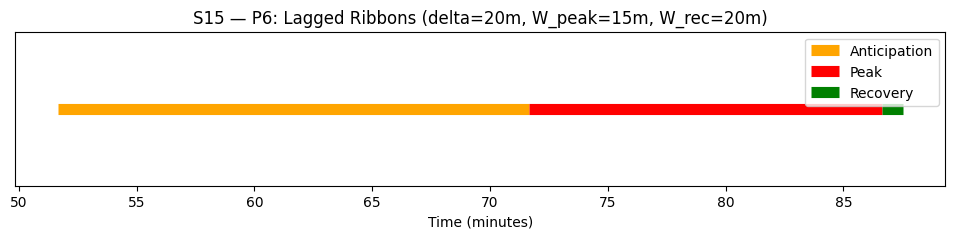

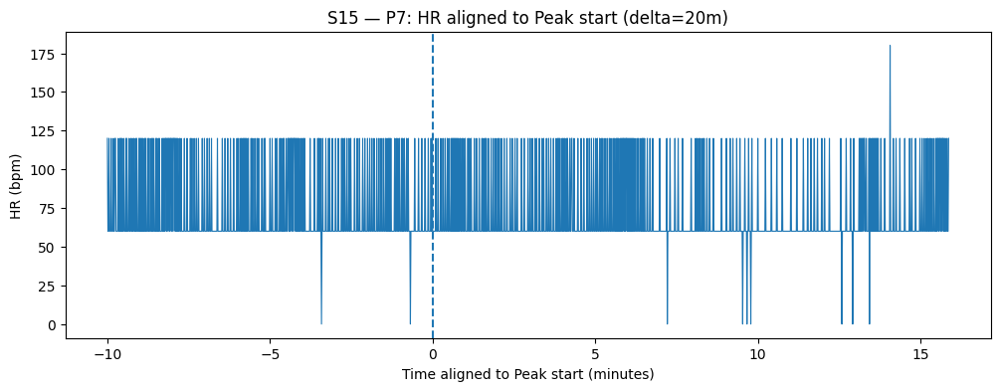

 S15 delta=20m -> S15_labels_chestdelta20.parquet | Ant:1200s Peak:900s Rec:53s


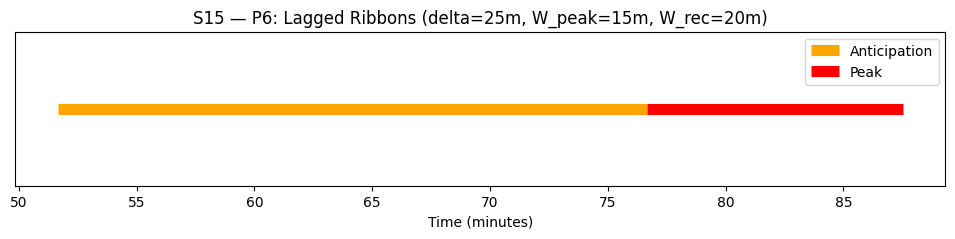

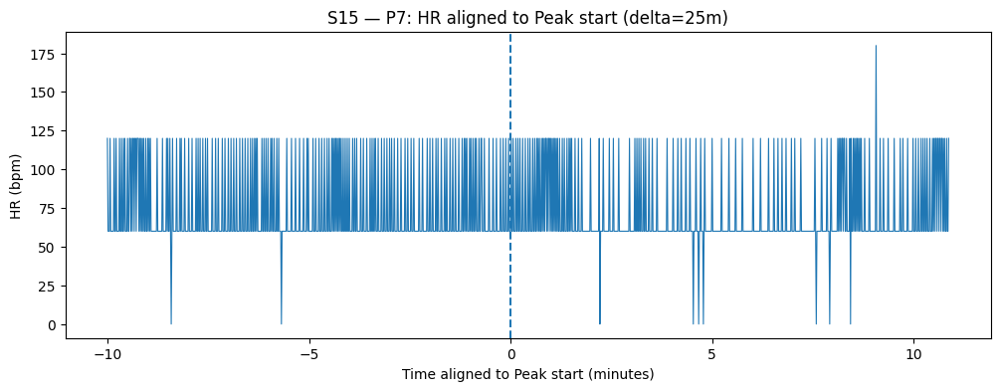

 S15 delta=25m -> S15_labels_chestdelta25.parquet | Ant:1500s Peak:653s Rec:0s


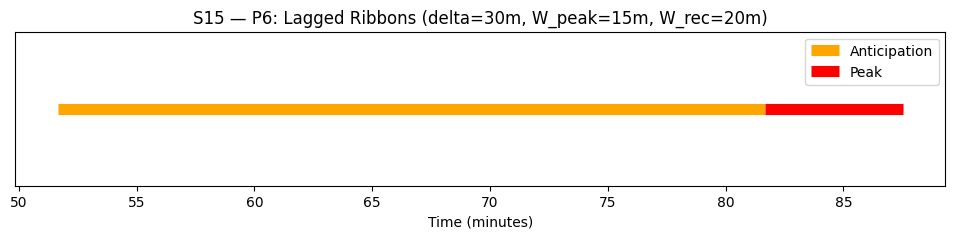

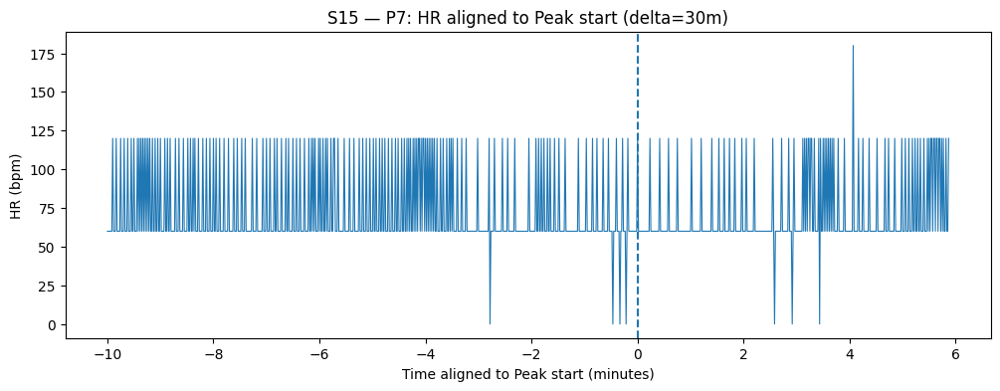

 S15 delta=30m -> S15_labels_chestdelta30.parquet | Ant:1800s Peak:353s Rec:0s


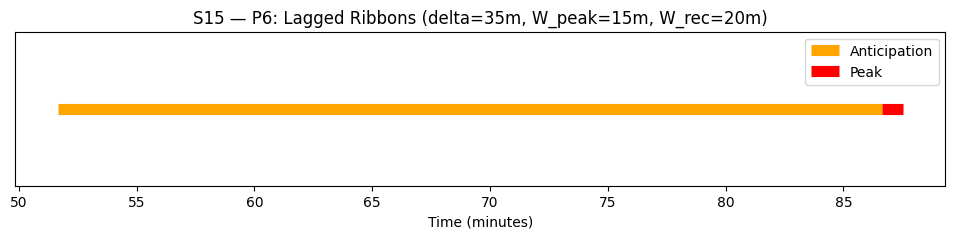

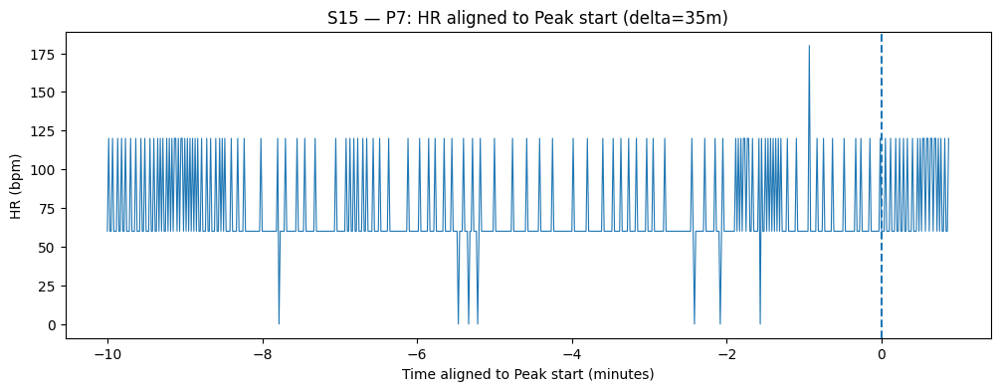

 S15 delta=35m -> S15_labels_chestdelta35.parquet | Ant:2100s Peak:53s Rec:0s


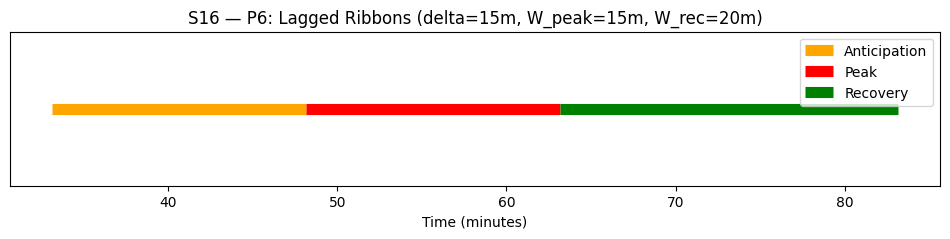

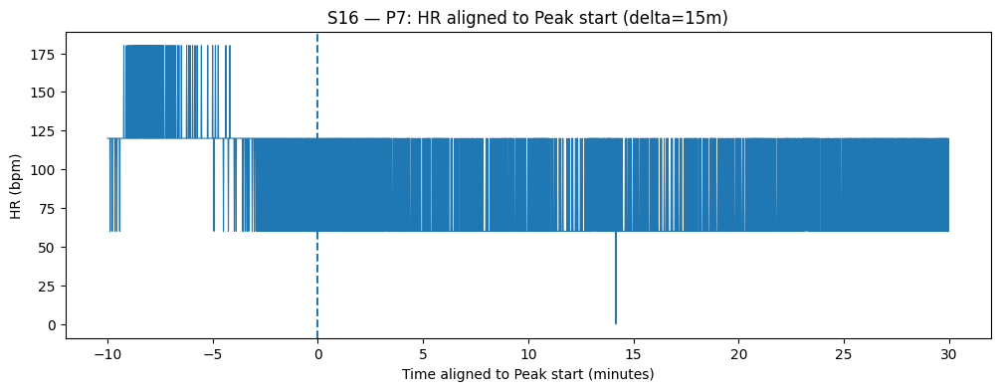

 S16 delta=15m -> S16_labels_chestdelta15.parquet | Ant:900s Peak:900s Rec:1200s


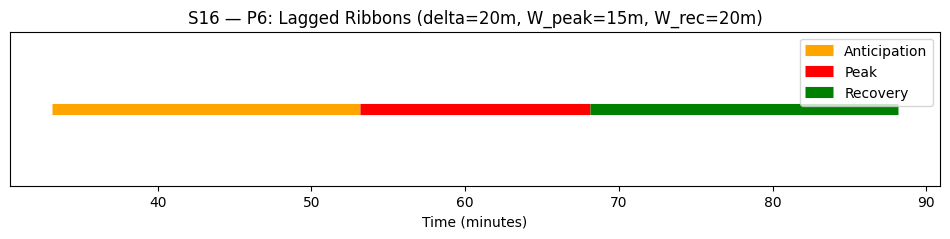

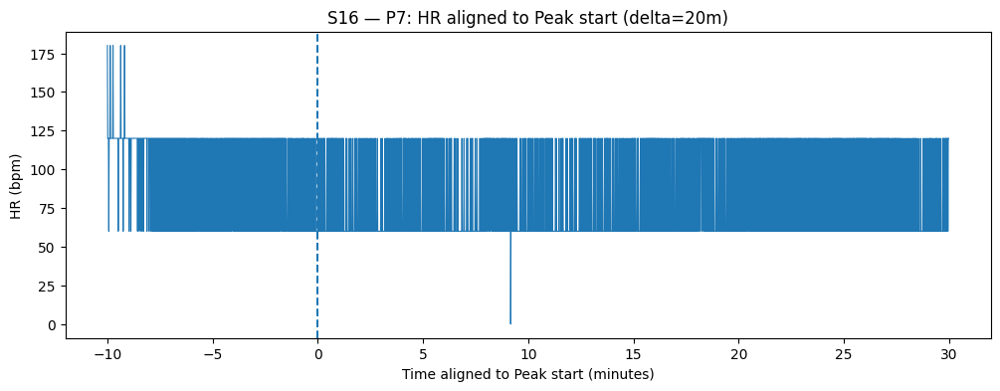

 S16 delta=20m -> S16_labels_chestdelta20.parquet | Ant:1200s Peak:900s Rec:1200s


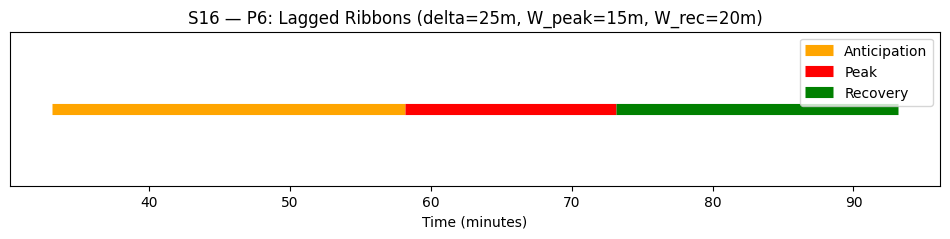

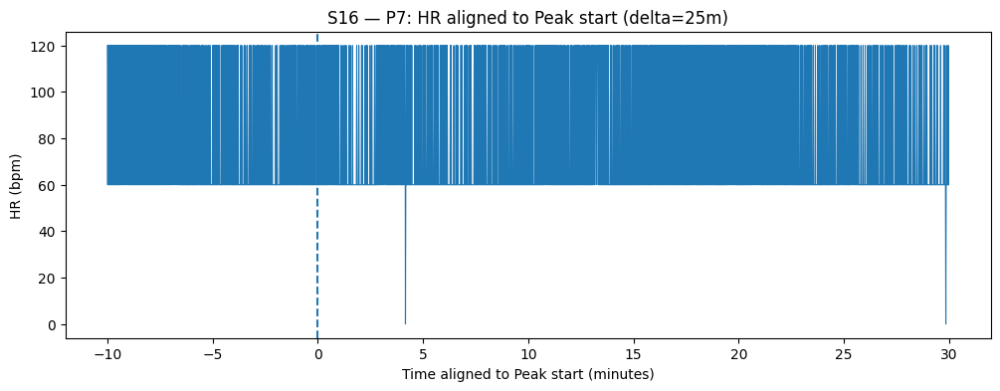

 S16 delta=25m -> S16_labels_chestdelta25.parquet | Ant:1500s Peak:900s Rec:1200s


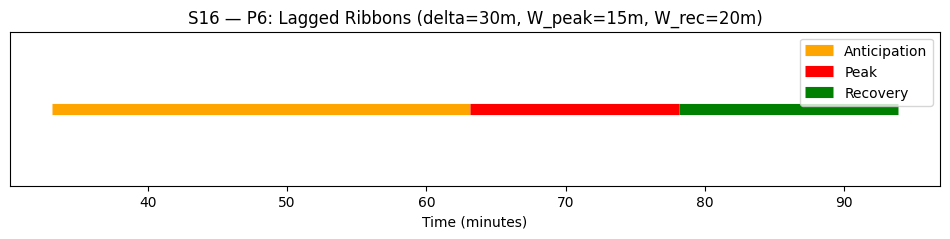

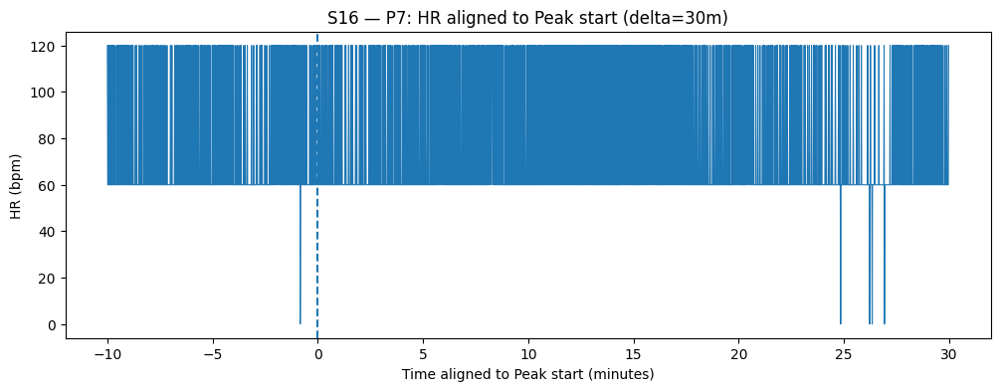

 S16 delta=30m -> S16_labels_chestdelta30.parquet | Ant:1800s Peak:900s Rec:943s


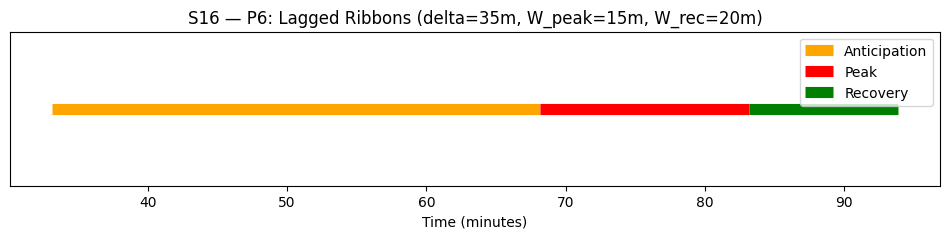

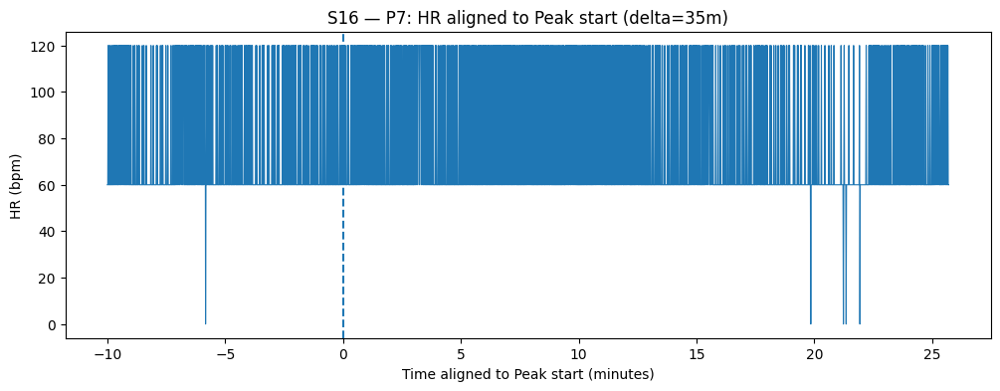

 S16 delta=35m -> S16_labels_chestdelta35.parquet | Ant:2100s Peak:900s Rec:643s


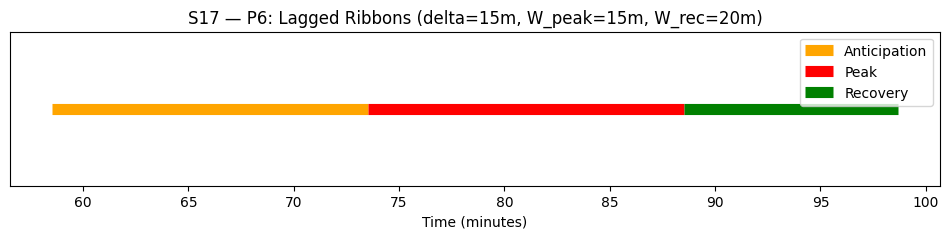

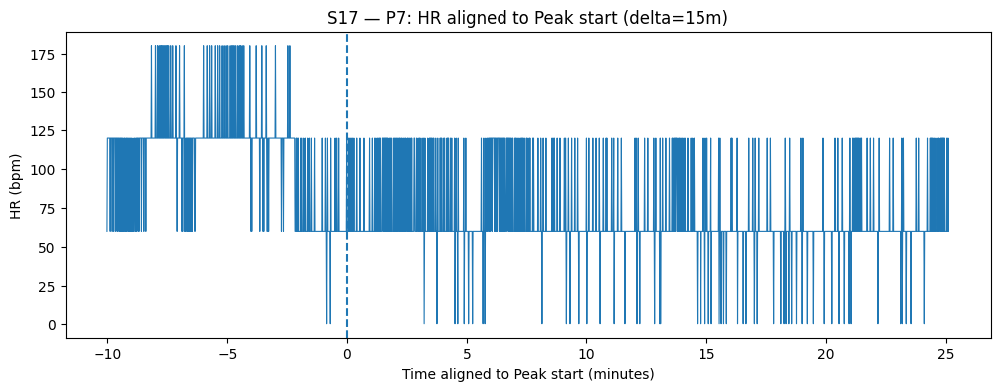

 S17 delta=15m -> S17_labels_chestdelta15.parquet | Ant:900s Peak:900s Rec:608s


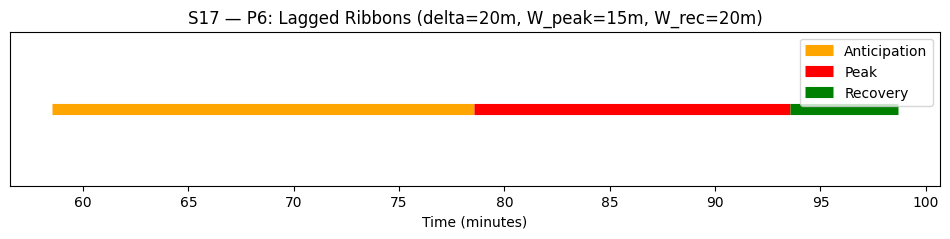

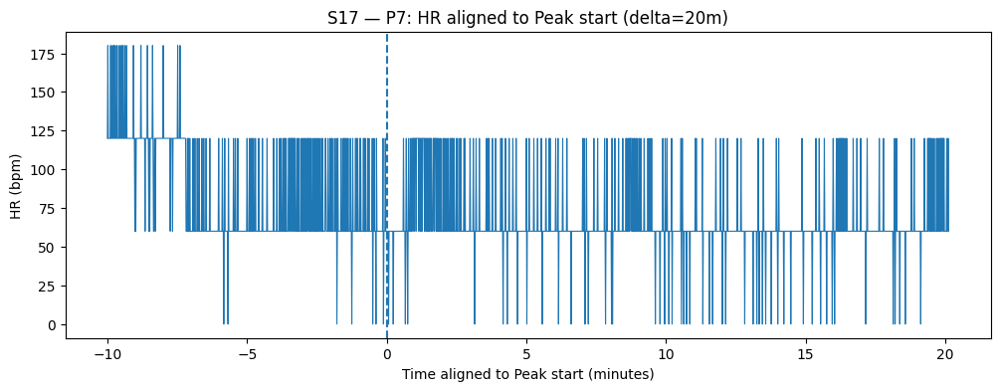

 S17 delta=20m -> S17_labels_chestdelta20.parquet | Ant:1200s Peak:900s Rec:308s


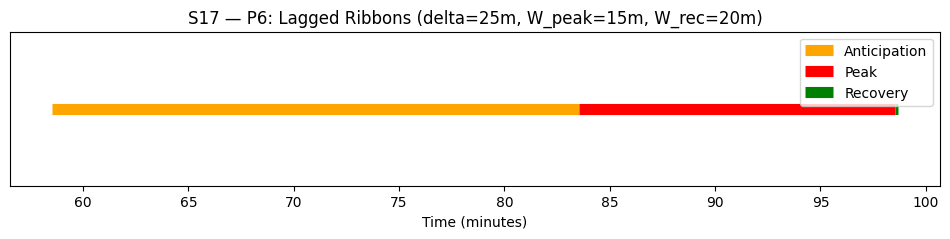

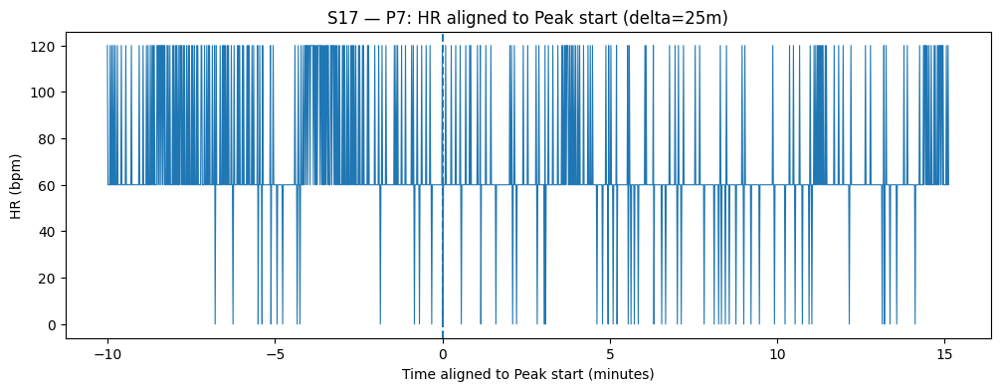

 S17 delta=25m -> S17_labels_chestdelta25.parquet | Ant:1500s Peak:900s Rec:8s


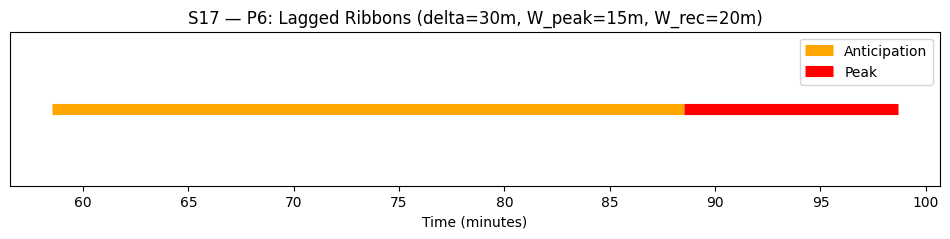

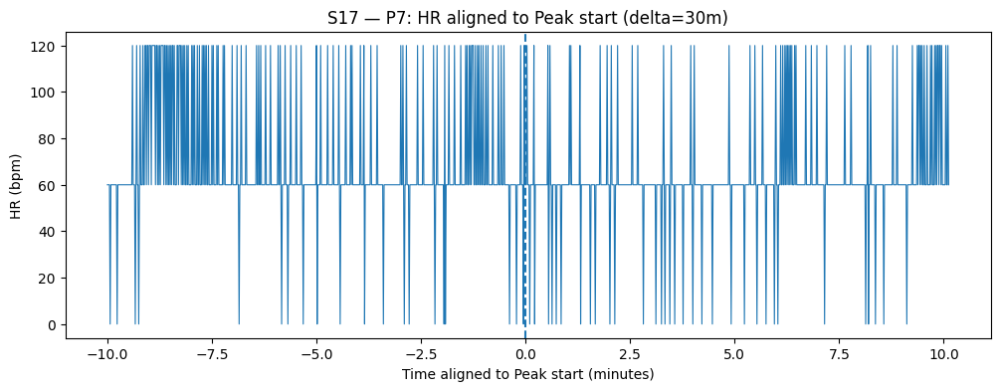

 S17 delta=30m -> S17_labels_chestdelta30.parquet | Ant:1800s Peak:608s Rec:0s


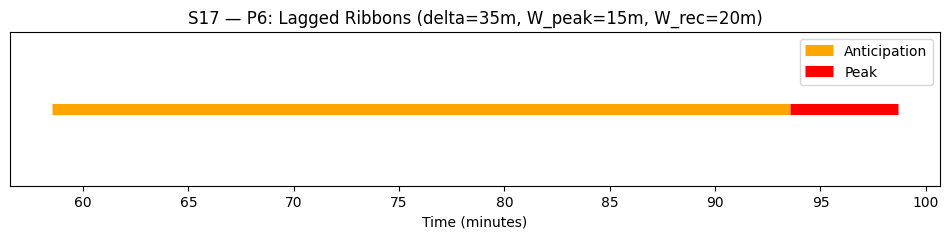

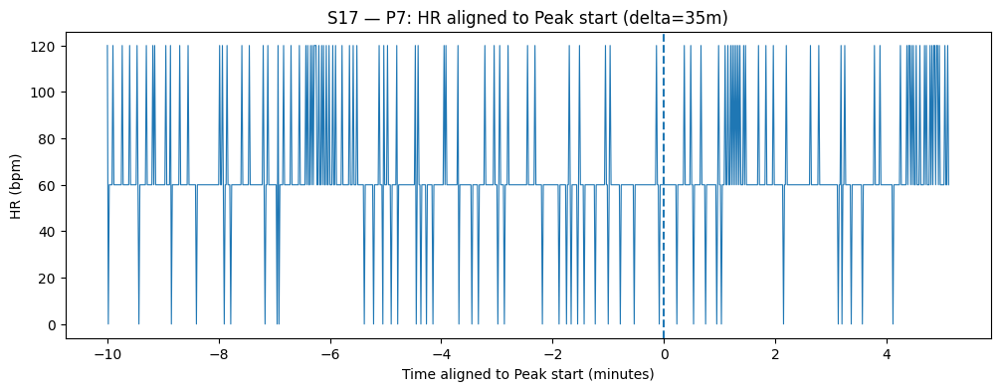

 S17 delta=35m -> S17_labels_chestdelta35.parquet | Ant:2100s Peak:308s Rec:0s


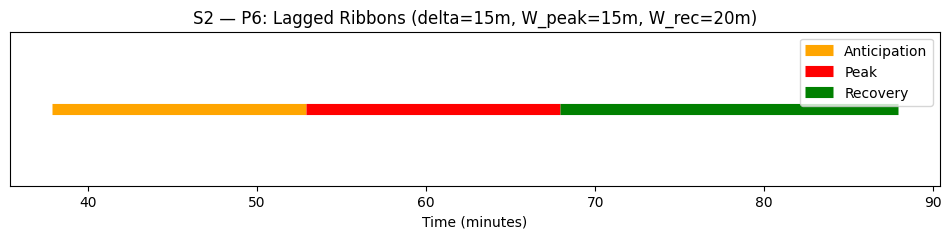

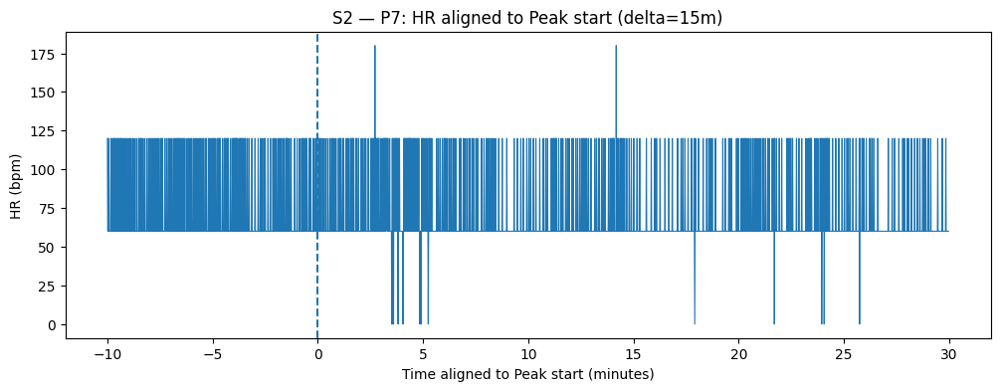

 S2 delta=15m -> S2_labels_chestdelta15.parquet | Ant:900s Peak:900s Rec:1200s


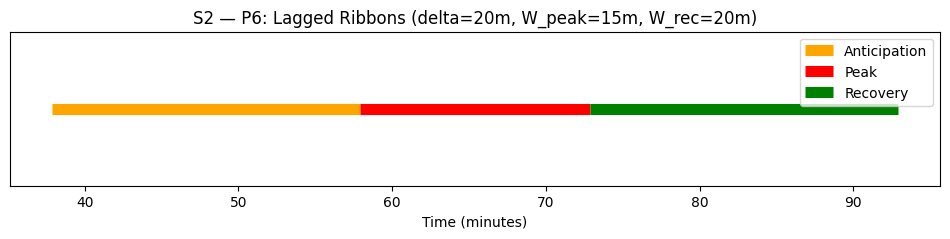

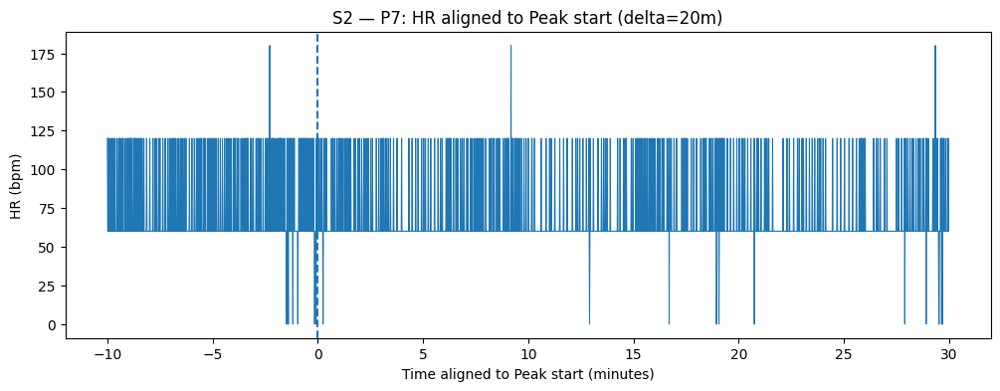

 S2 delta=20m -> S2_labels_chestdelta20.parquet | Ant:1200s Peak:900s Rec:1200s


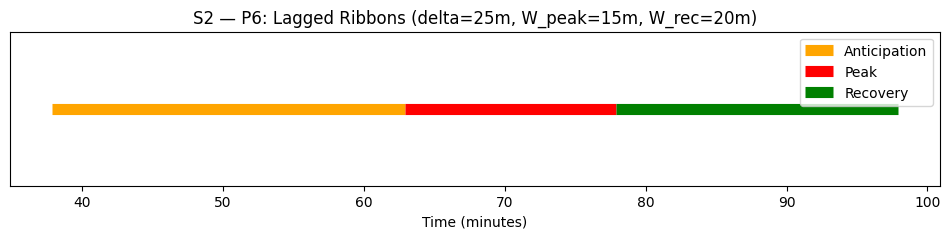

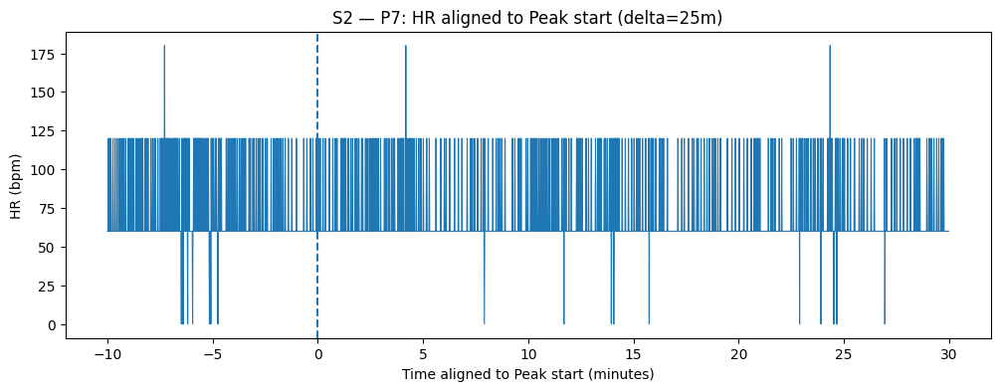

 S2 delta=25m -> S2_labels_chestdelta25.parquet | Ant:1500s Peak:900s Rec:1200s


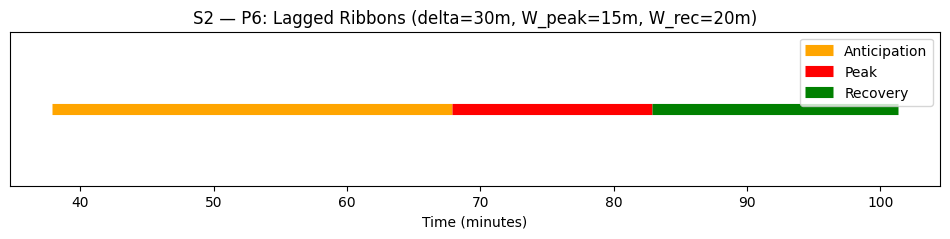

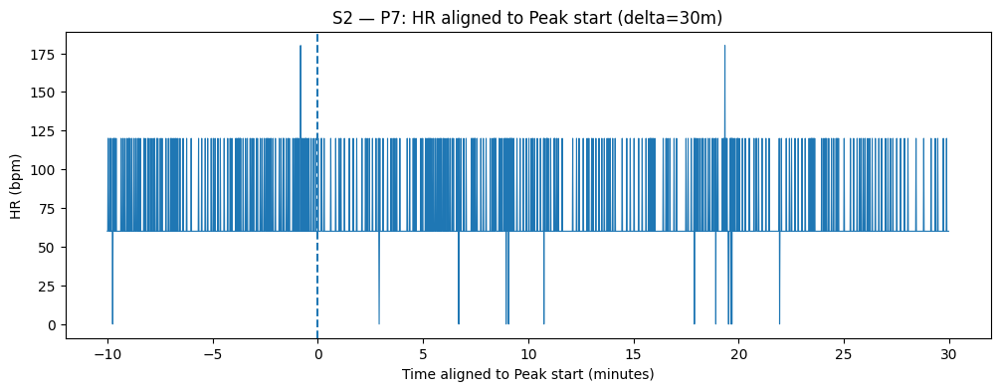

 S2 delta=30m -> S2_labels_chestdelta30.parquet | Ant:1800s Peak:900s Rec:1106s


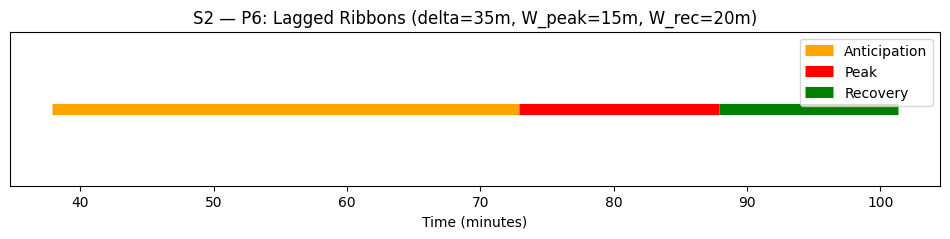

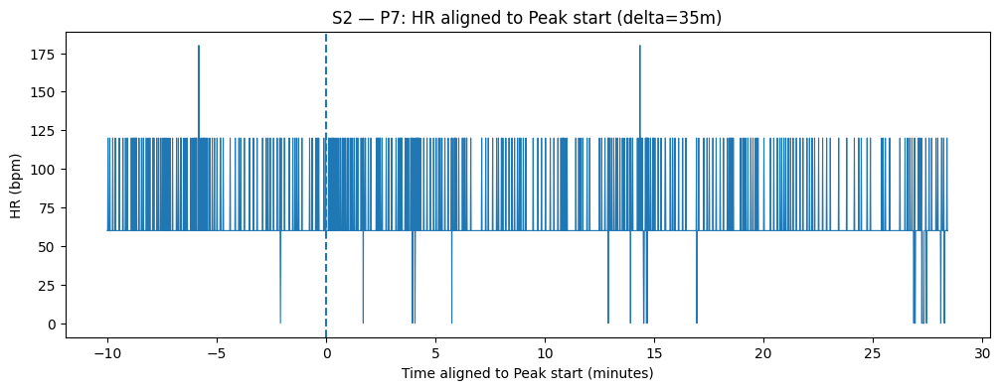

 S2 delta=35m -> S2_labels_chestdelta35.parquet | Ant:2100s Peak:900s Rec:806s


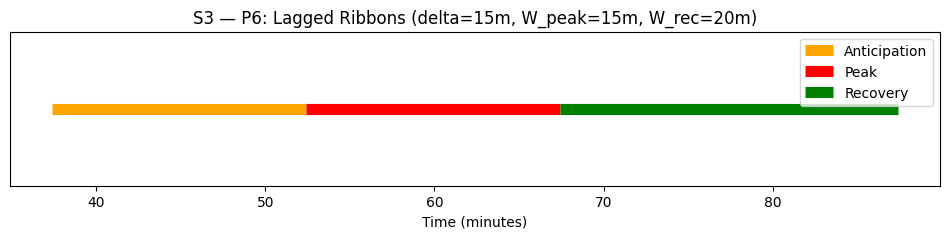

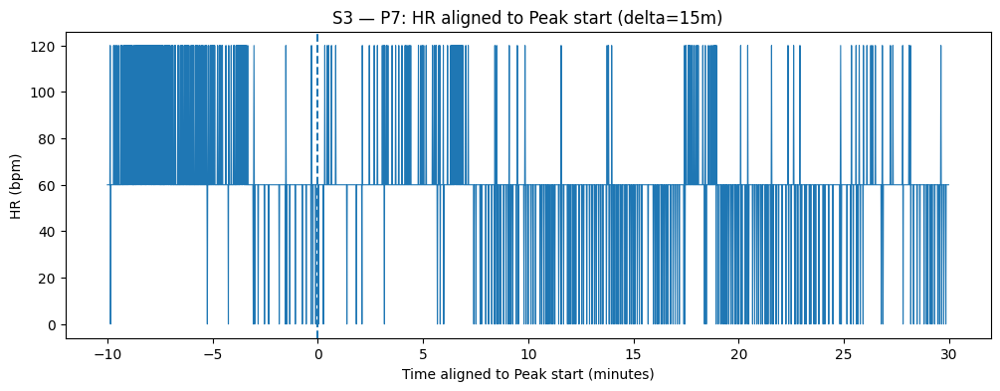

 S3 delta=15m -> S3_labels_chestdelta15.parquet | Ant:900s Peak:900s Rec:1200s


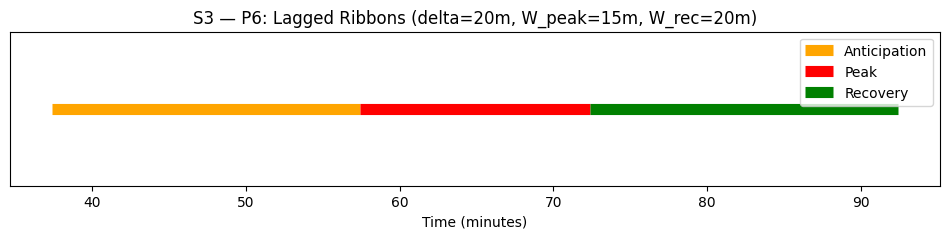

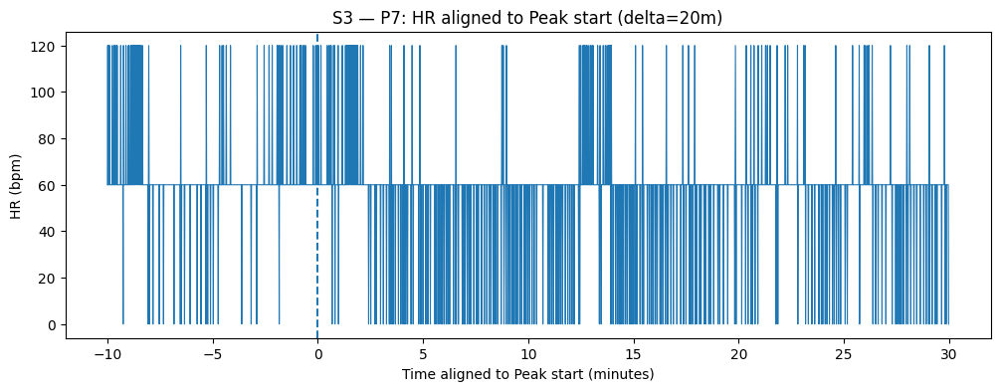

 S3 delta=20m -> S3_labels_chestdelta20.parquet | Ant:1200s Peak:900s Rec:1200s


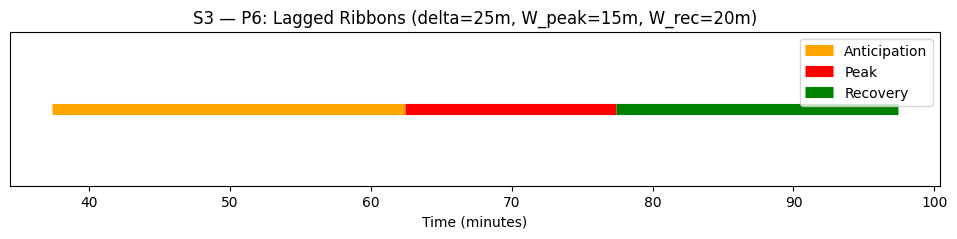

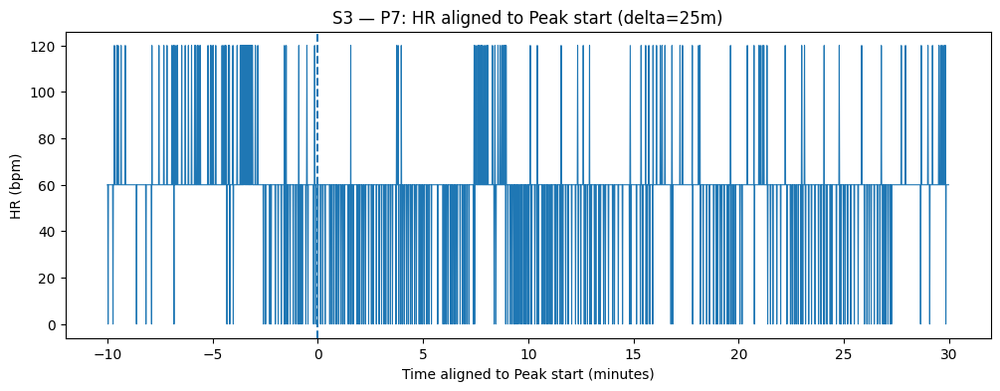

 S3 delta=25m -> S3_labels_chestdelta25.parquet | Ant:1500s Peak:900s Rec:1200s


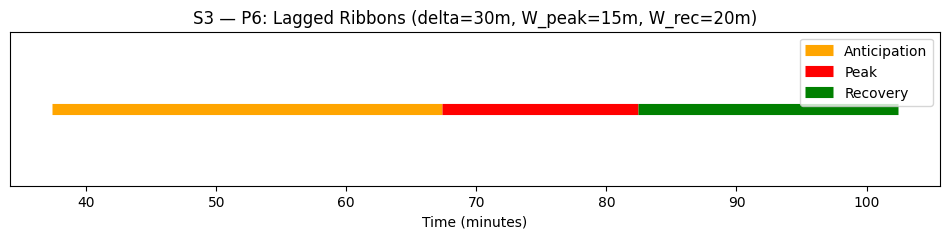

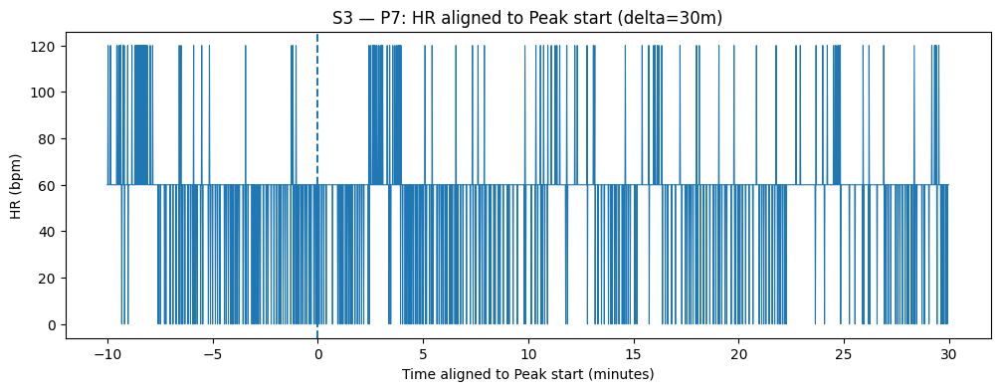

 S3 delta=30m -> S3_labels_chestdelta30.parquet | Ant:1800s Peak:900s Rec:1200s


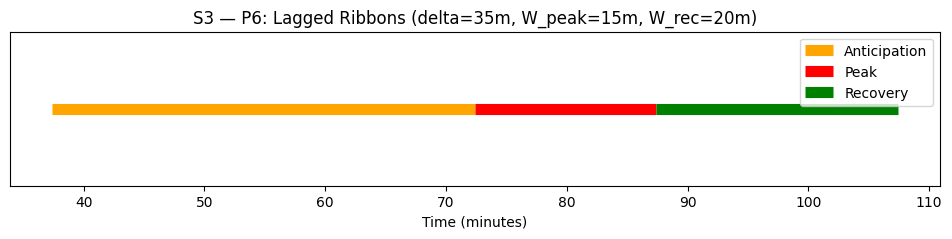

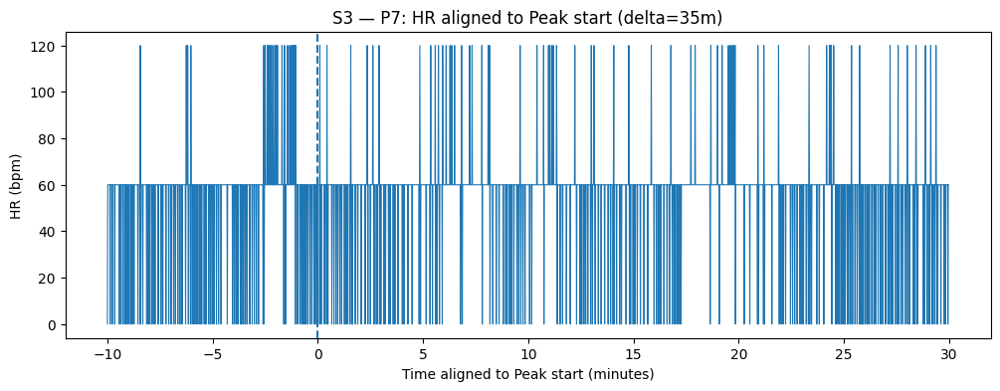

 S3 delta=35m -> S3_labels_chestdelta35.parquet | Ant:2100s Peak:900s Rec:1200s


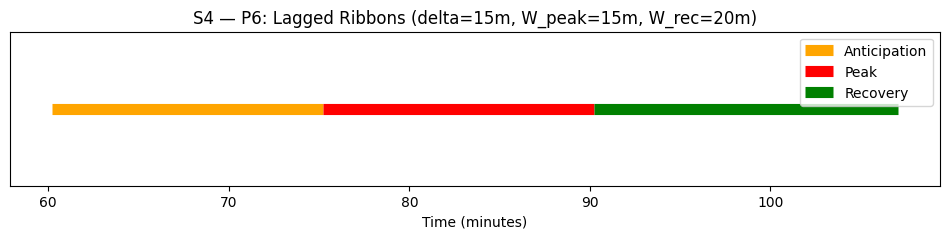

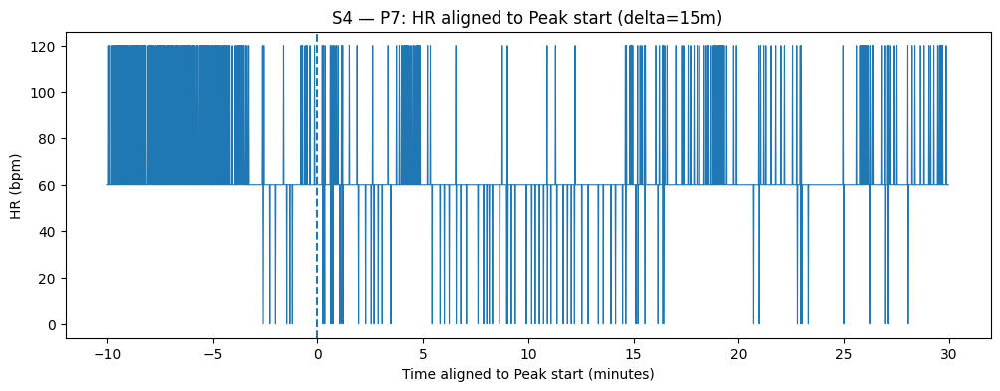

 S4 delta=15m -> S4_labels_chestdelta15.parquet | Ant:900s Peak:900s Rec:1010s


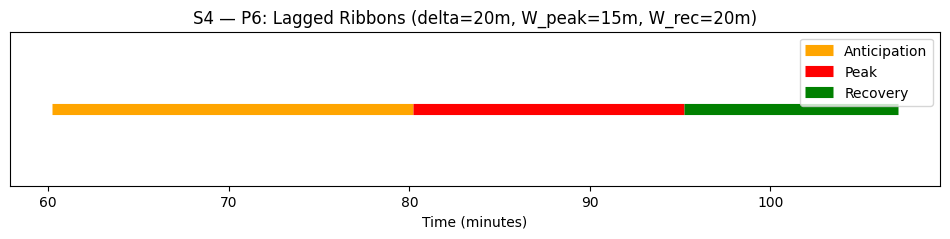

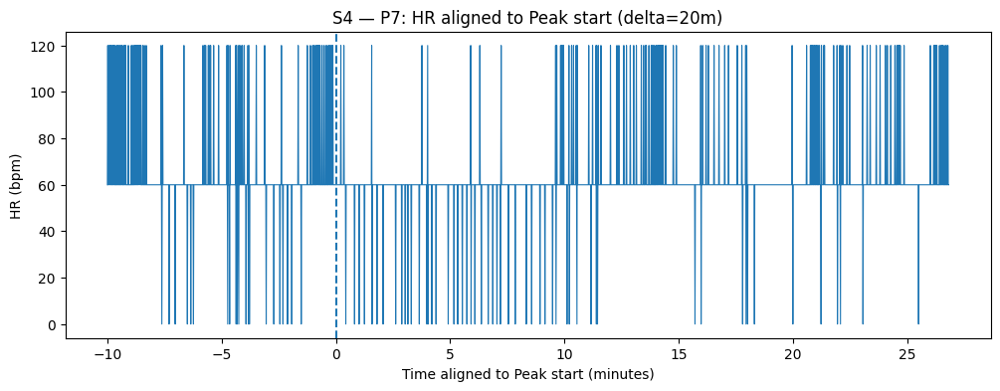

 S4 delta=20m -> S4_labels_chestdelta20.parquet | Ant:1200s Peak:900s Rec:710s


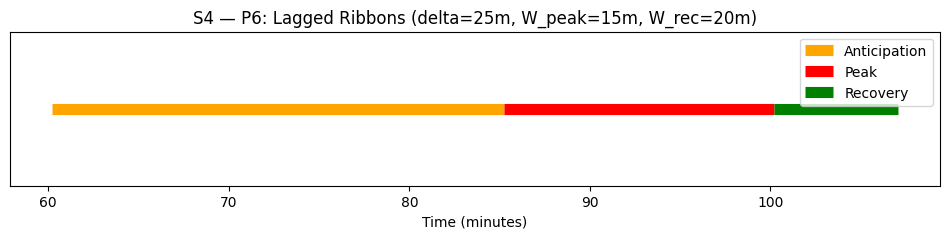

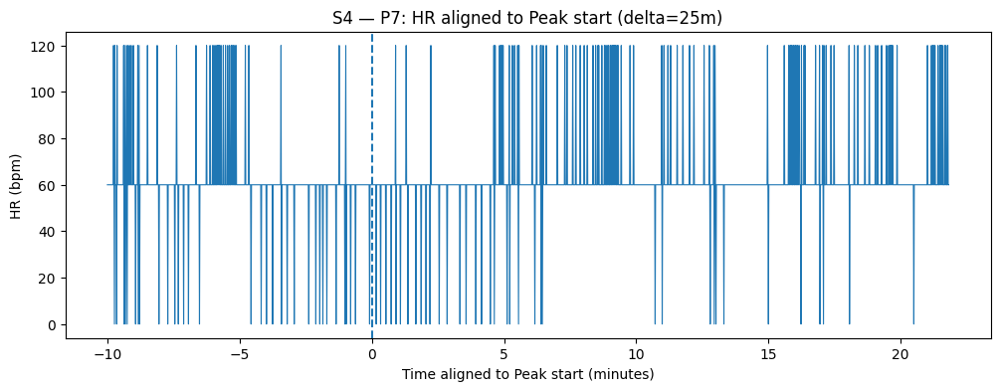

 S4 delta=25m -> S4_labels_chestdelta25.parquet | Ant:1500s Peak:900s Rec:410s


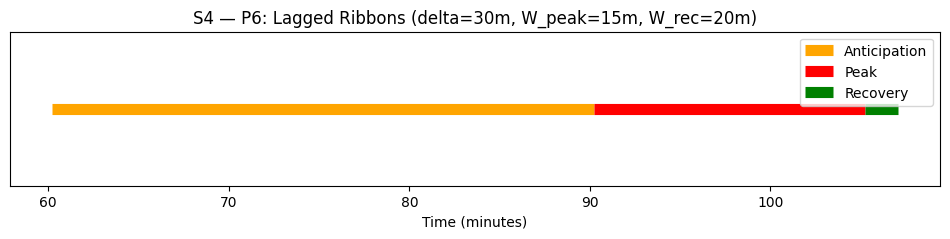

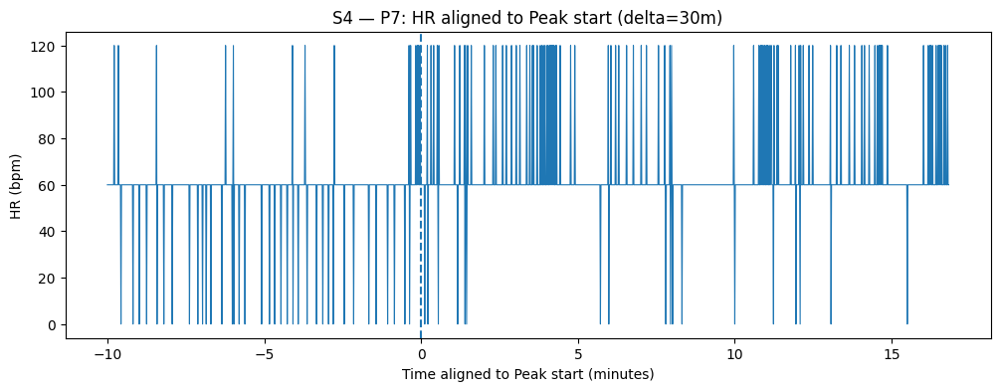

 S4 delta=30m -> S4_labels_chestdelta30.parquet | Ant:1800s Peak:900s Rec:110s


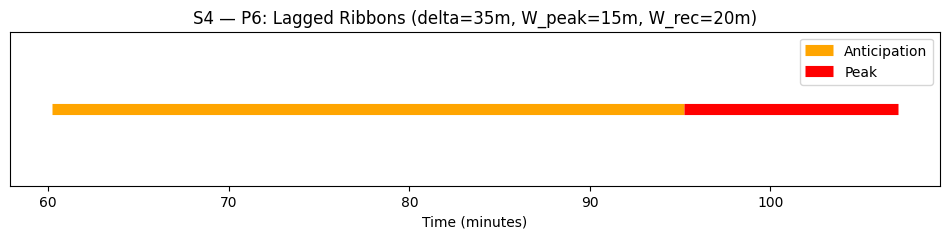

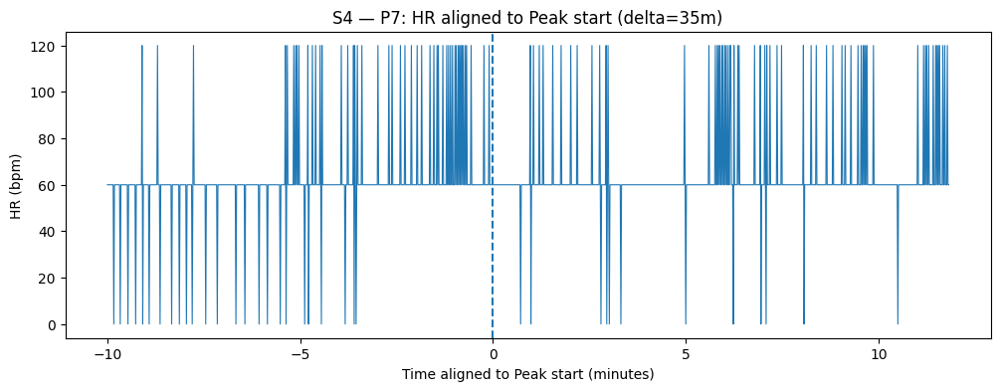

 S4 delta=35m -> S4_labels_chestdelta35.parquet | Ant:2100s Peak:710s Rec:0s


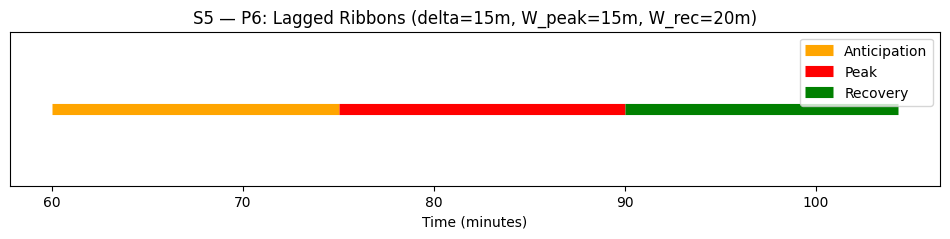

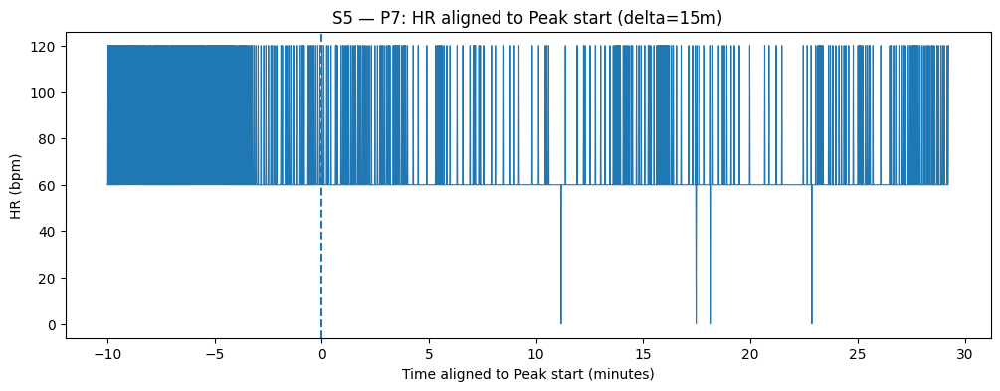

 S5 delta=15m -> S5_labels_chestdelta15.parquet | Ant:900s Peak:900s Rec:856s


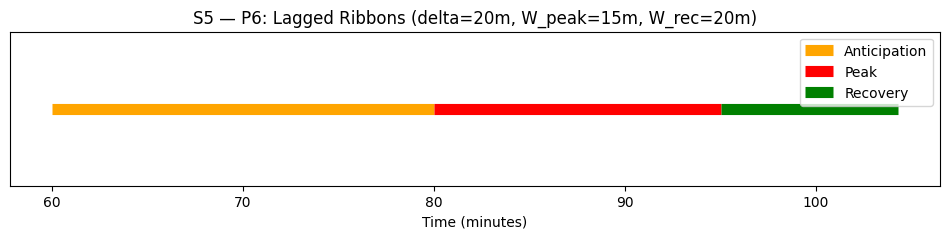

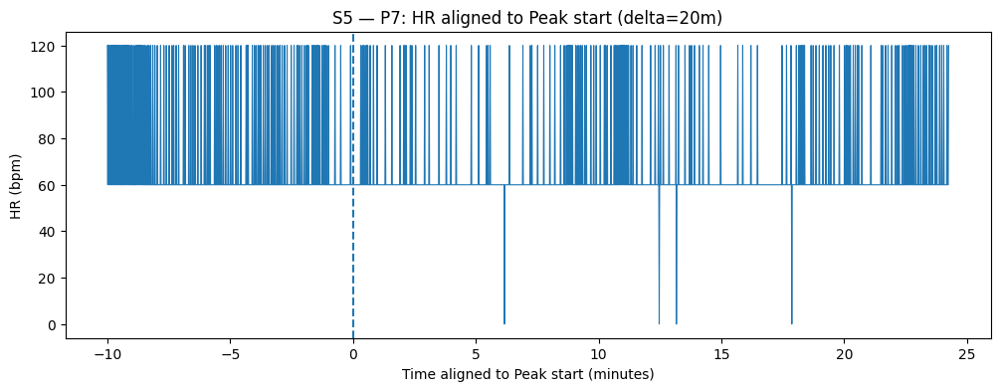

 S5 delta=20m -> S5_labels_chestdelta20.parquet | Ant:1200s Peak:900s Rec:556s


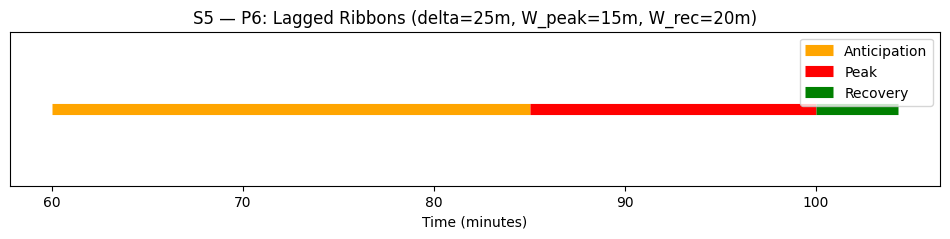

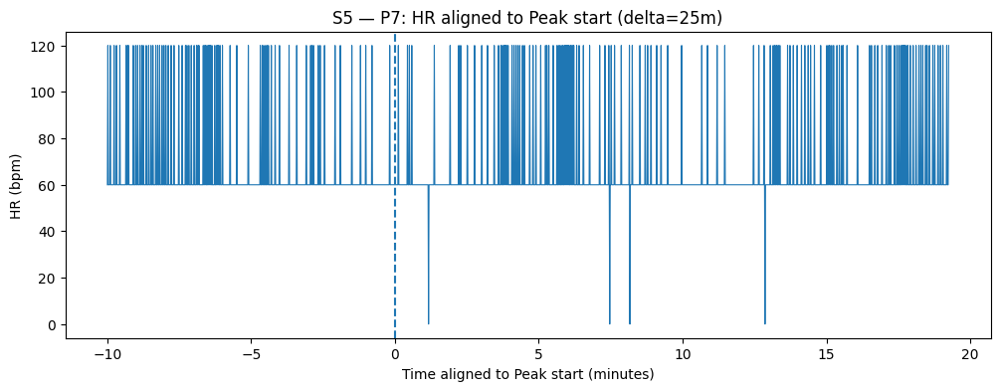

 S5 delta=25m -> S5_labels_chestdelta25.parquet | Ant:1500s Peak:900s Rec:256s


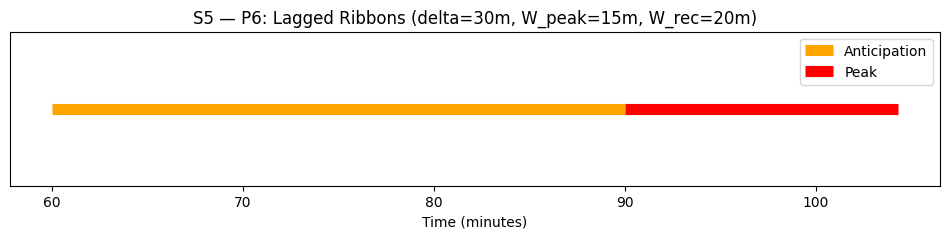

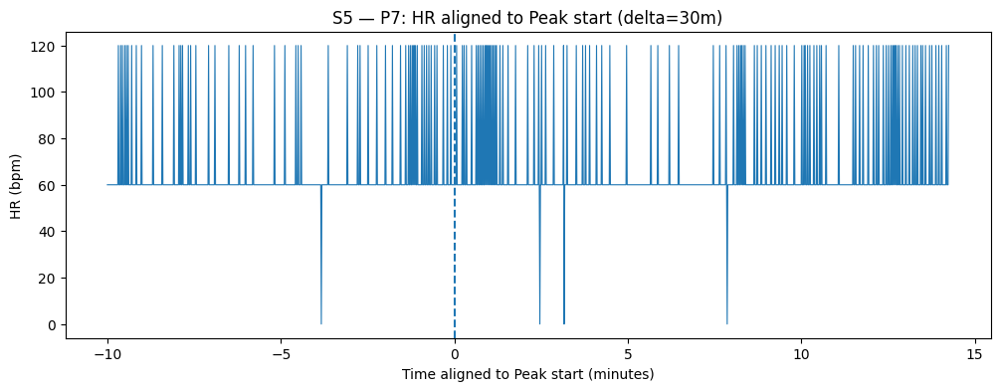

 S5 delta=30m -> S5_labels_chestdelta30.parquet | Ant:1800s Peak:856s Rec:0s


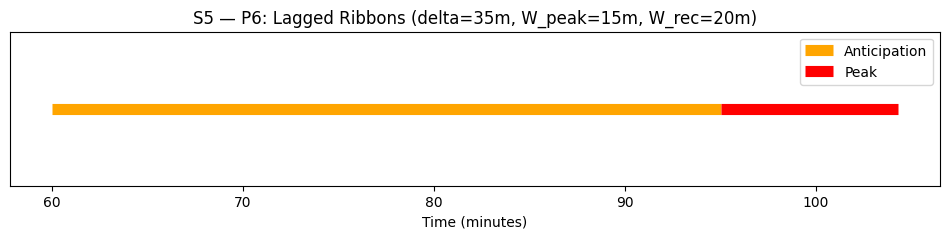

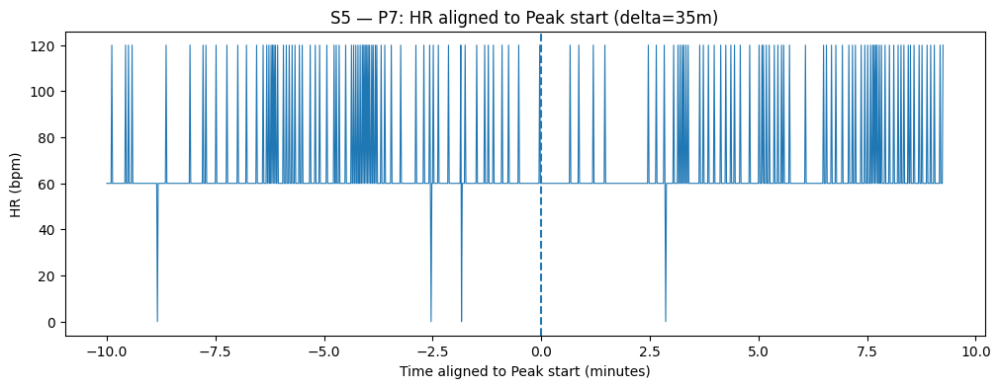

 S5 delta=35m -> S5_labels_chestdelta35.parquet | Ant:2100s Peak:556s Rec:0s


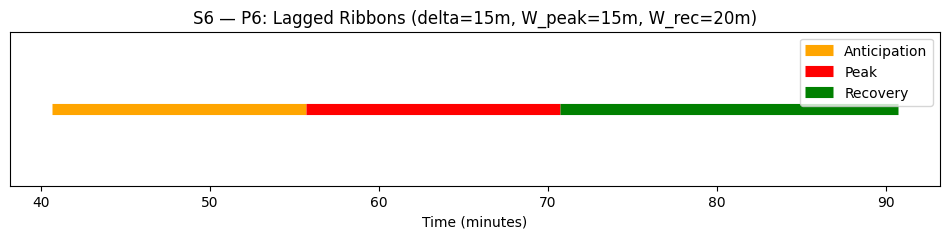

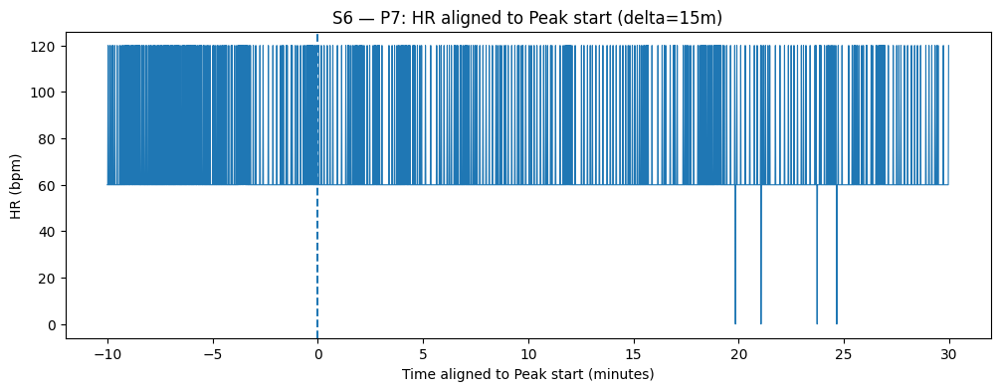

 S6 delta=15m -> S6_labels_chestdelta15.parquet | Ant:900s Peak:900s Rec:1200s


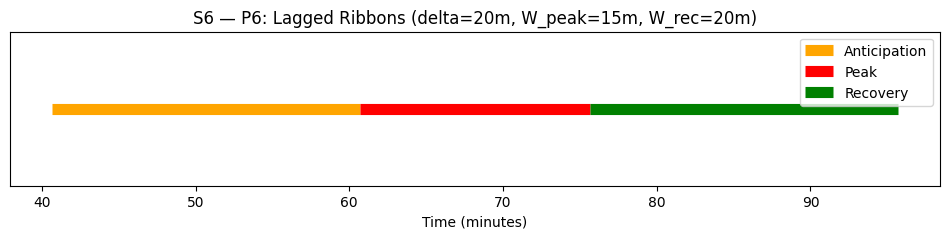

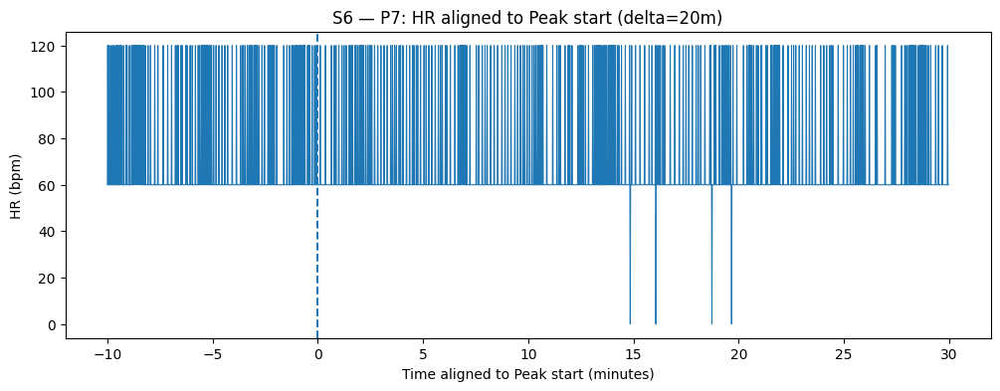

 S6 delta=20m -> S6_labels_chestdelta20.parquet | Ant:1200s Peak:900s Rec:1200s


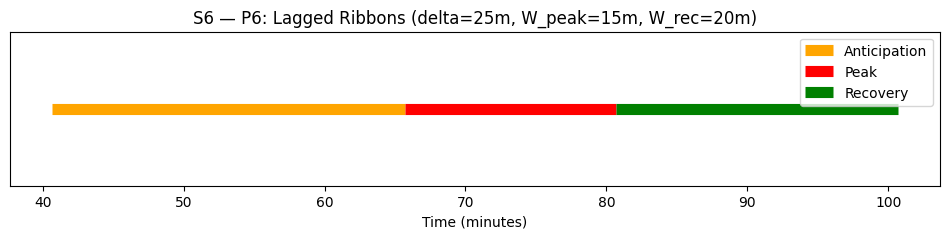

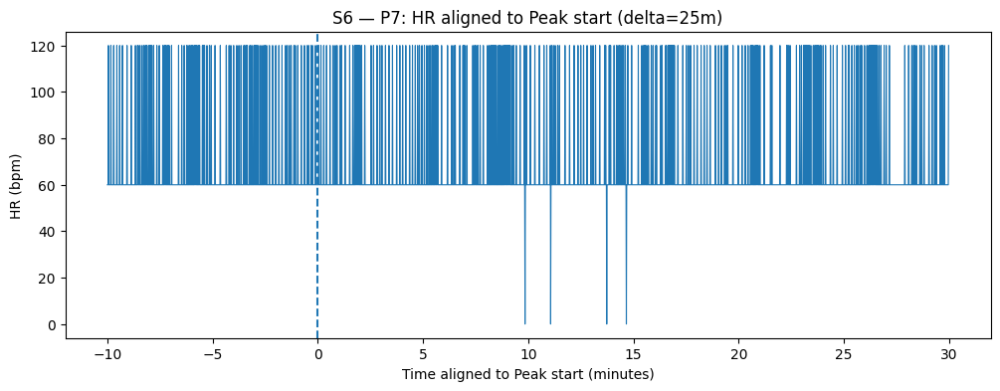

 S6 delta=25m -> S6_labels_chestdelta25.parquet | Ant:1500s Peak:900s Rec:1200s


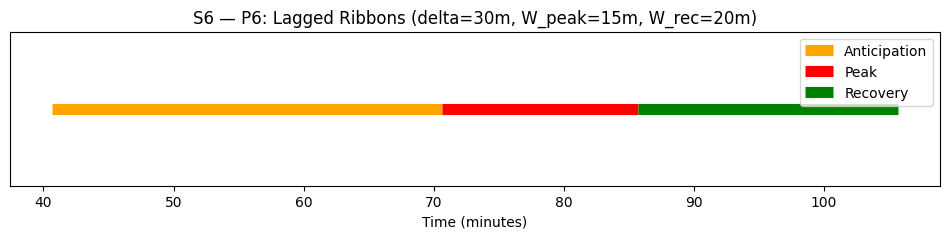

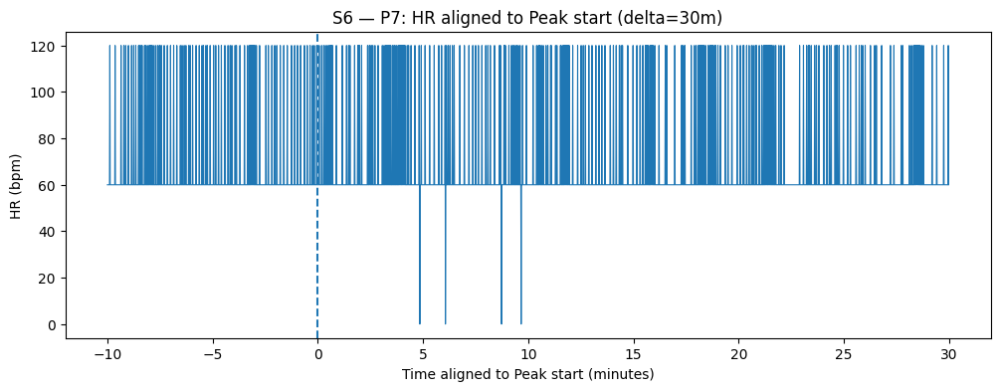

 S6 delta=30m -> S6_labels_chestdelta30.parquet | Ant:1800s Peak:900s Rec:1200s


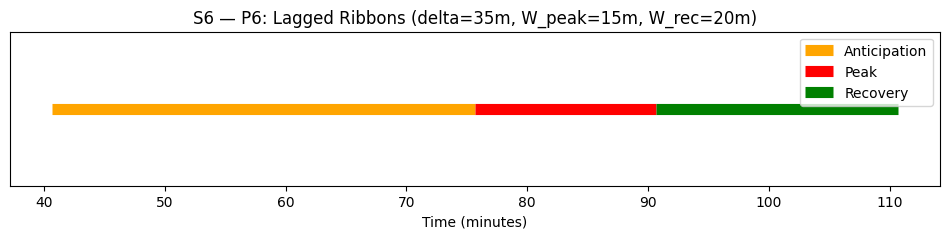

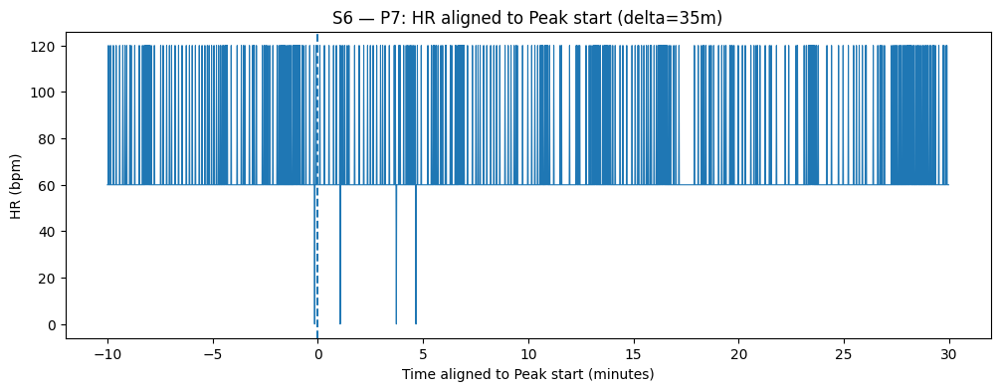

 S6 delta=35m -> S6_labels_chestdelta35.parquet | Ant:2100s Peak:900s Rec:1200s


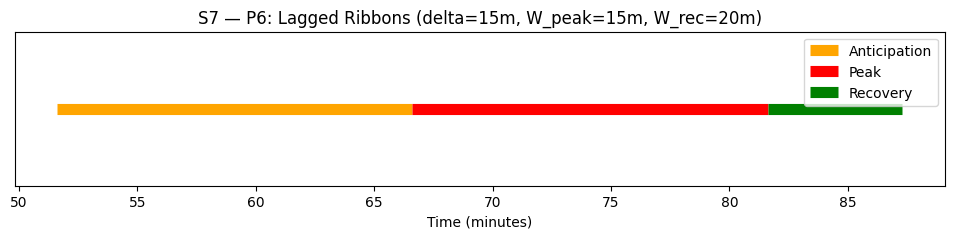

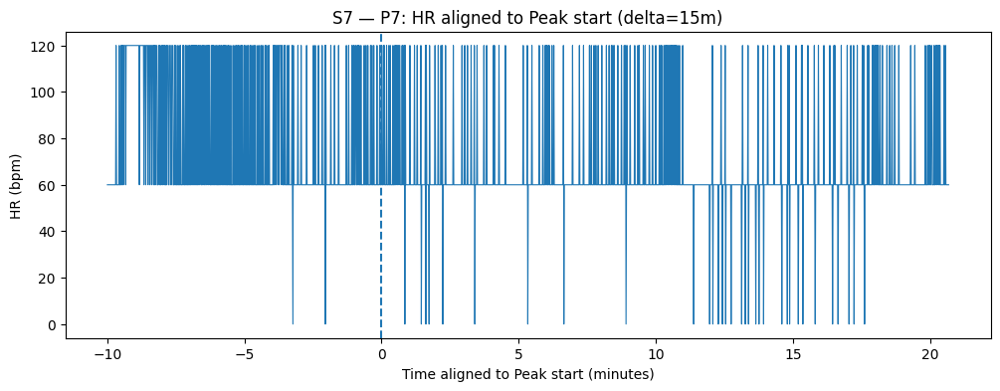

 S7 delta=15m -> S7_labels_chestdelta15.parquet | Ant:900s Peak:900s Rec:342s


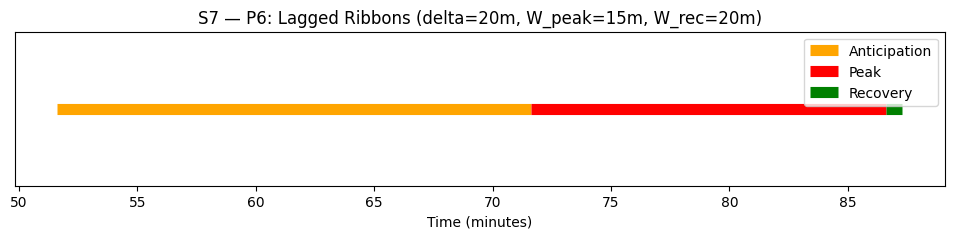

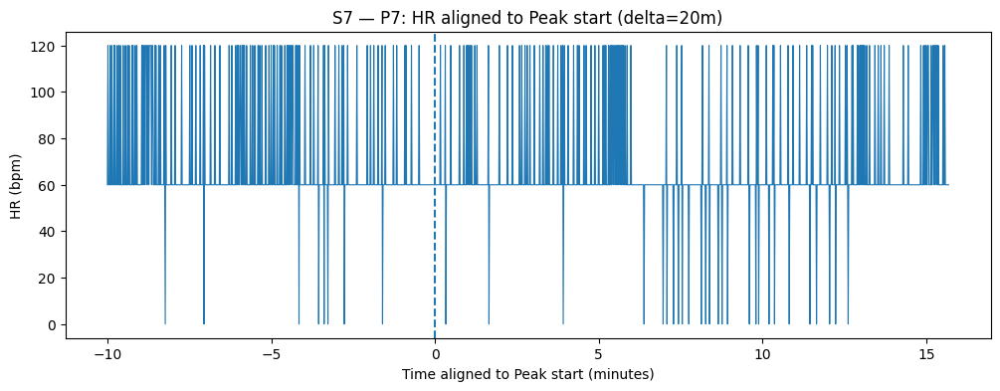

 S7 delta=20m -> S7_labels_chestdelta20.parquet | Ant:1200s Peak:900s Rec:42s


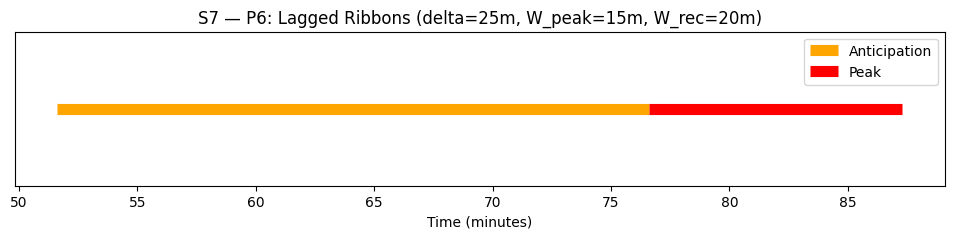

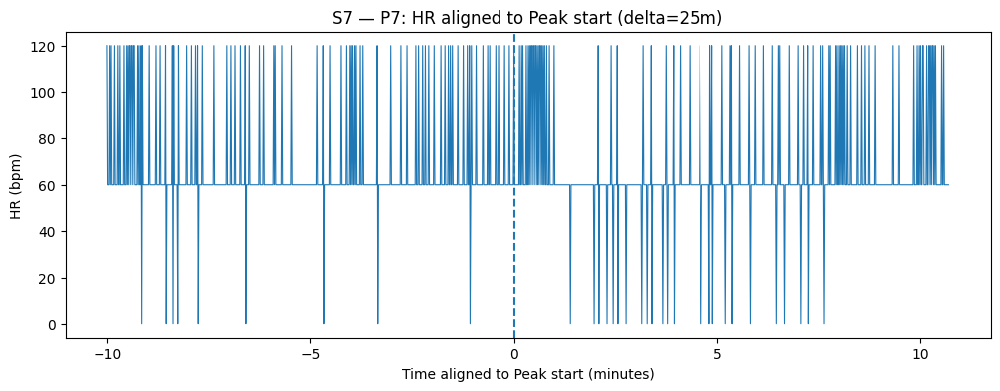

 S7 delta=25m -> S7_labels_chestdelta25.parquet | Ant:1500s Peak:642s Rec:0s


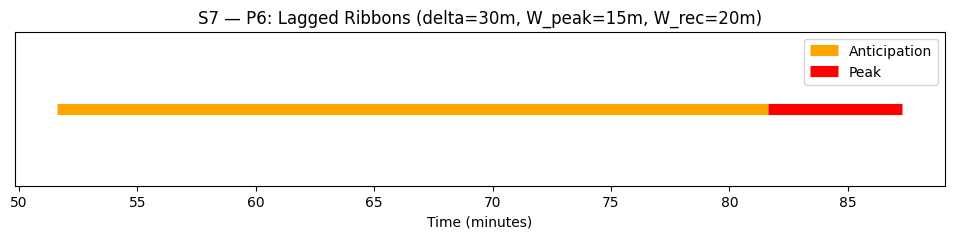

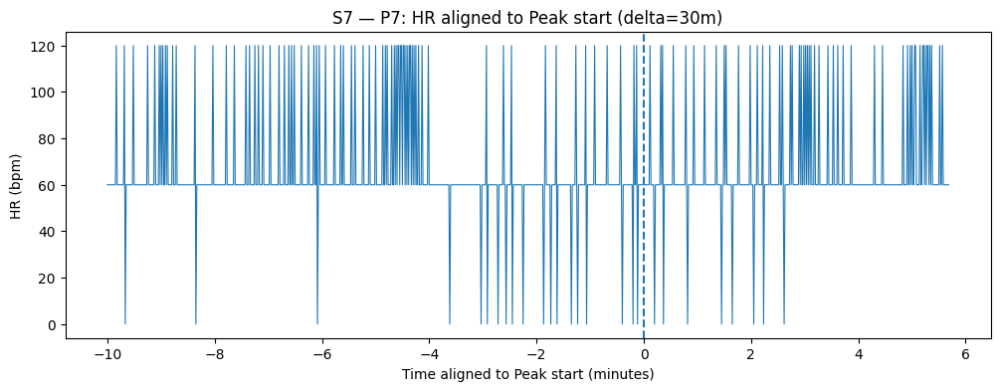

 S7 delta=30m -> S7_labels_chestdelta30.parquet | Ant:1800s Peak:342s Rec:0s


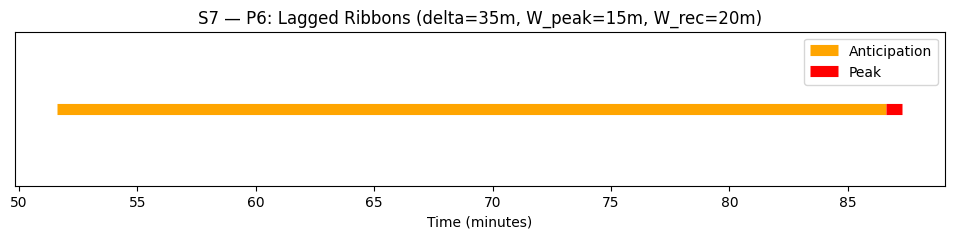

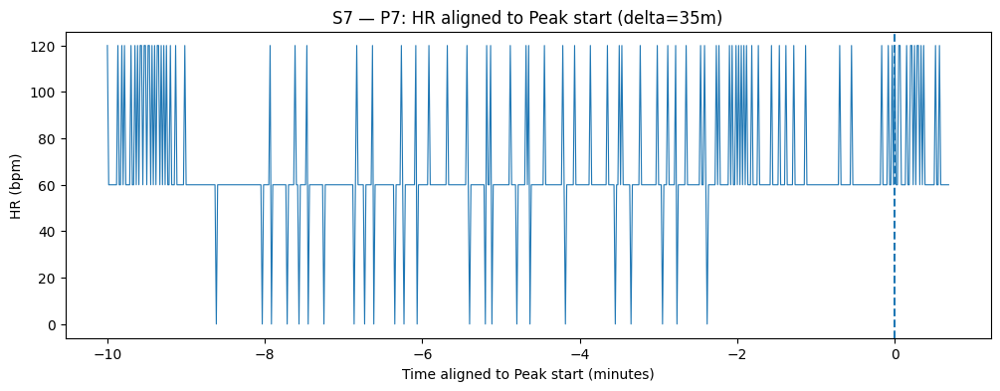

 S7 delta=35m -> S7_labels_chestdelta35.parquet | Ant:2100s Peak:42s Rec:0s


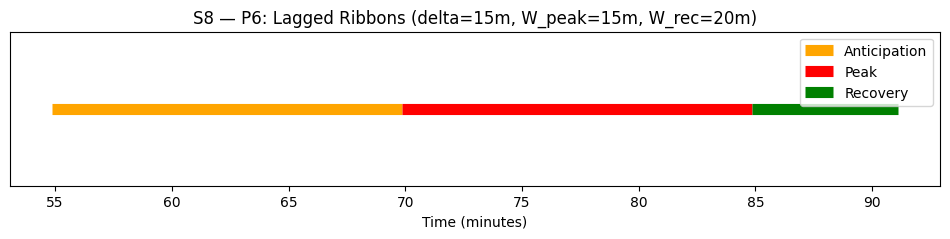

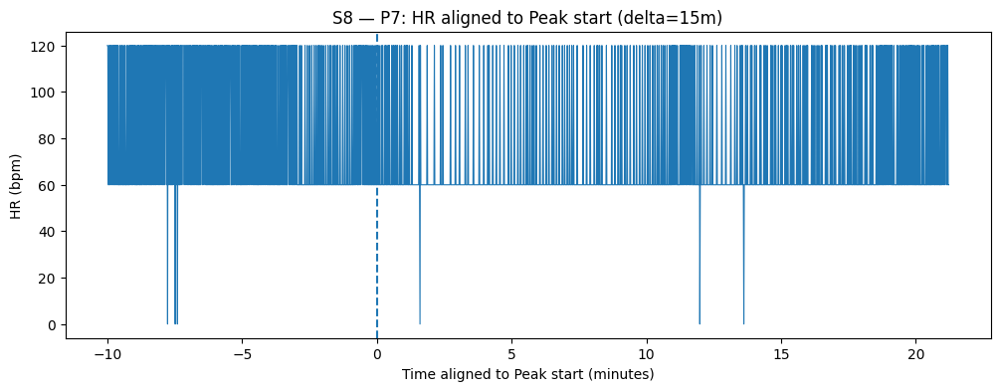

 S8 delta=15m -> S8_labels_chestdelta15.parquet | Ant:900s Peak:900s Rec:374s


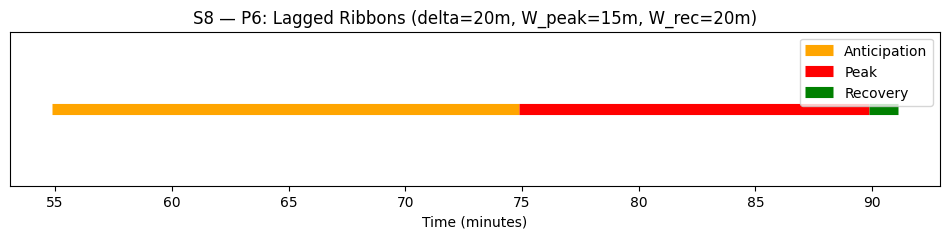

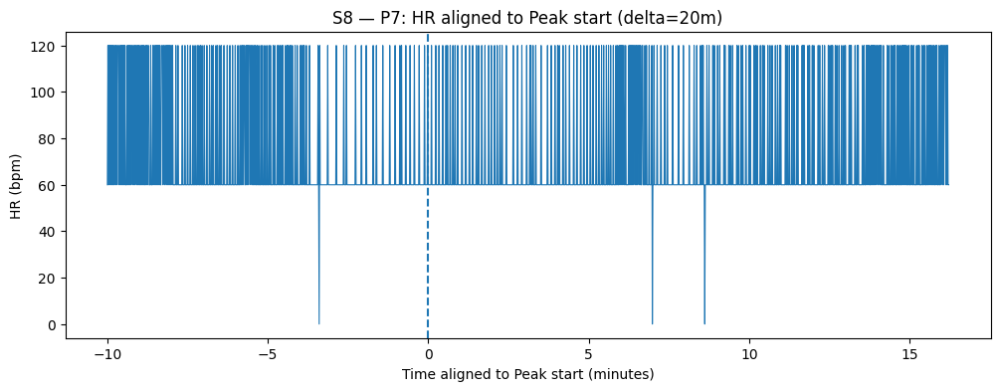

 S8 delta=20m -> S8_labels_chestdelta20.parquet | Ant:1200s Peak:900s Rec:74s


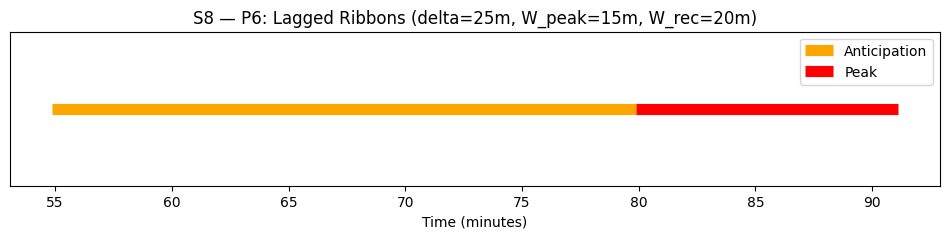

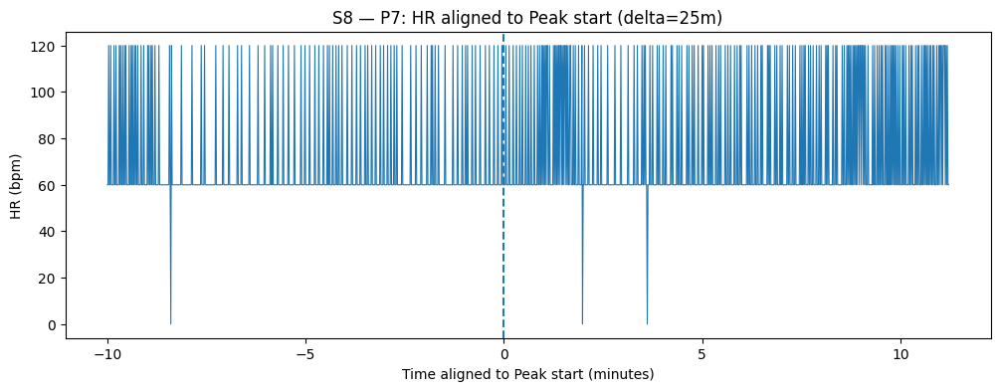

 S8 delta=25m -> S8_labels_chestdelta25.parquet | Ant:1500s Peak:674s Rec:0s


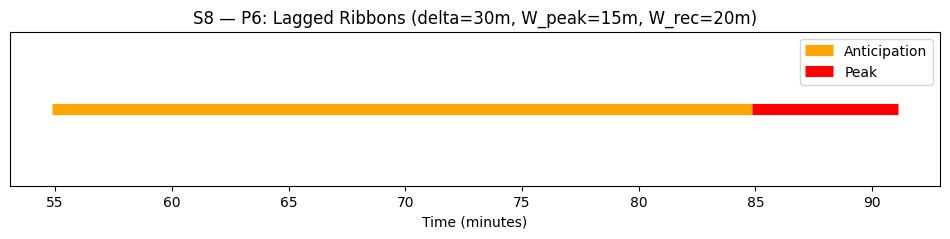

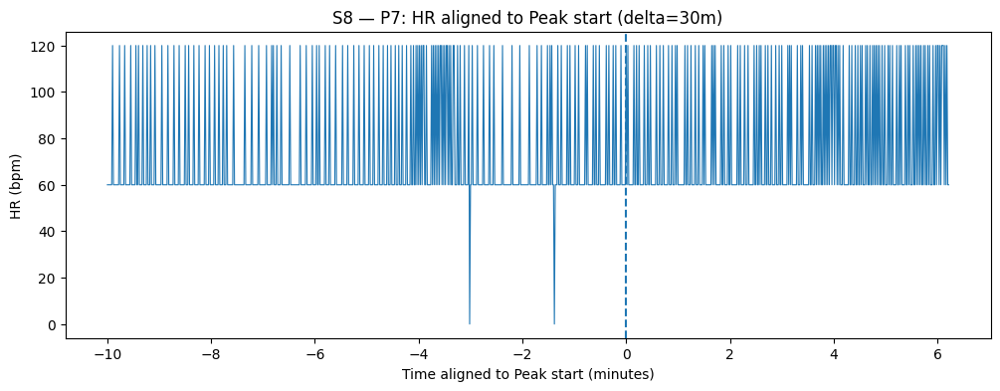

 S8 delta=30m -> S8_labels_chestdelta30.parquet | Ant:1800s Peak:374s Rec:0s


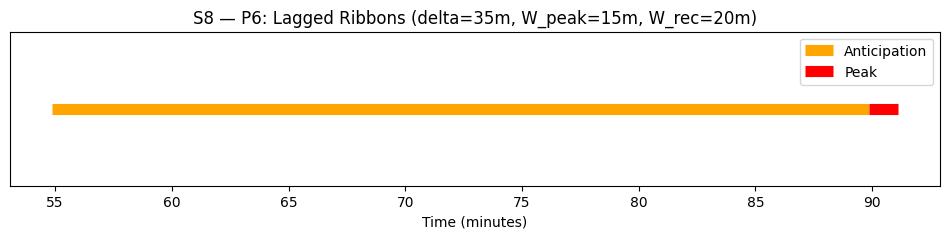

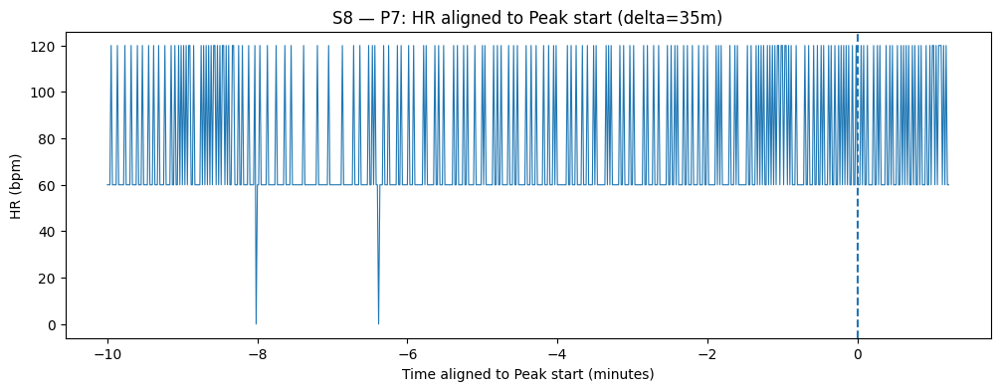

 S8 delta=35m -> S8_labels_chestdelta35.parquet | Ant:2100s Peak:74s Rec:0s


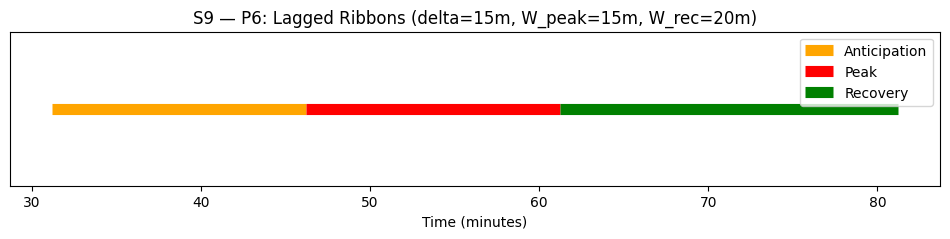

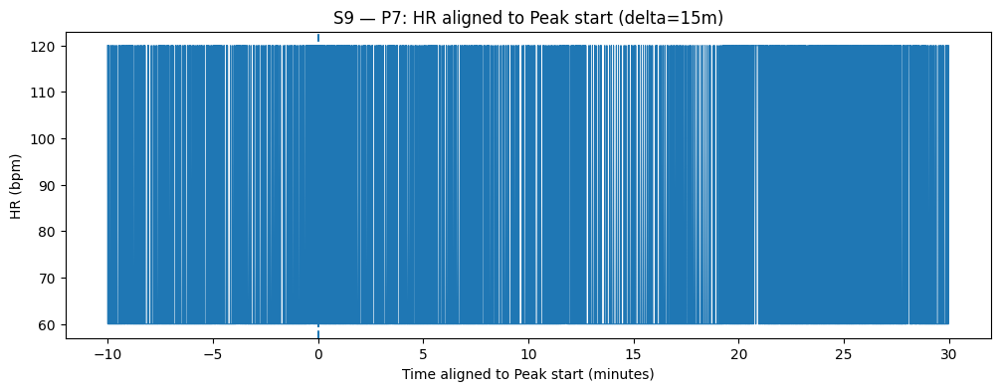

 S9 delta=15m -> S9_labels_chestdelta15.parquet | Ant:900s Peak:900s Rec:1200s


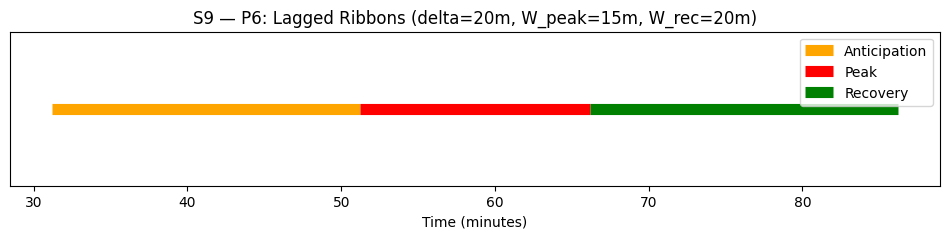

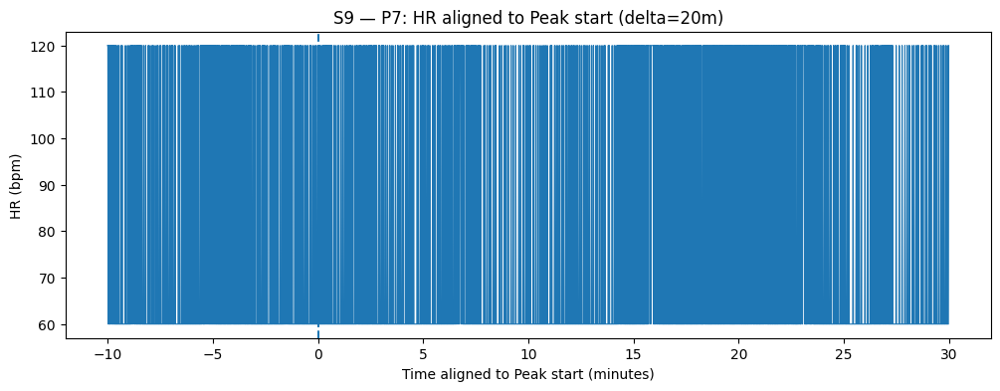

 S9 delta=20m -> S9_labels_chestdelta20.parquet | Ant:1200s Peak:900s Rec:1200s


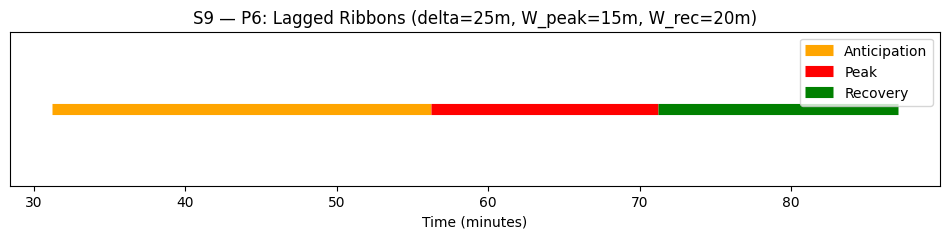

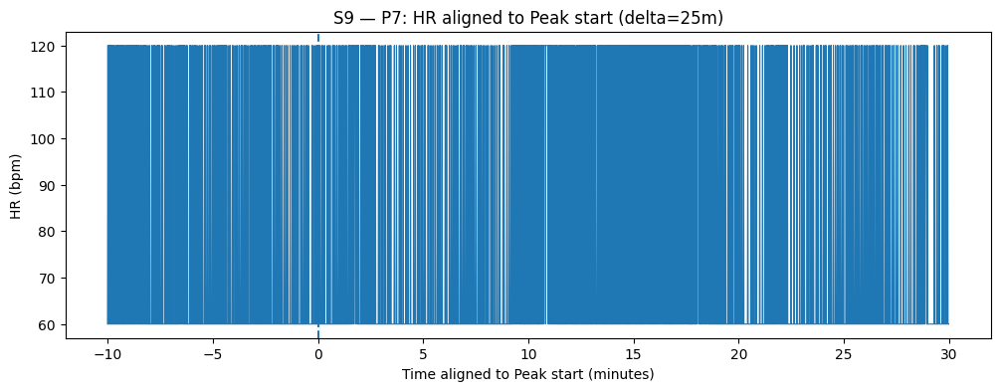

 S9 delta=25m -> S9_labels_chestdelta25.parquet | Ant:1500s Peak:900s Rec:951s


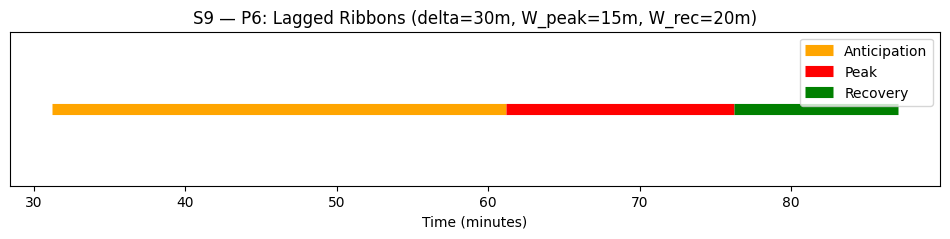

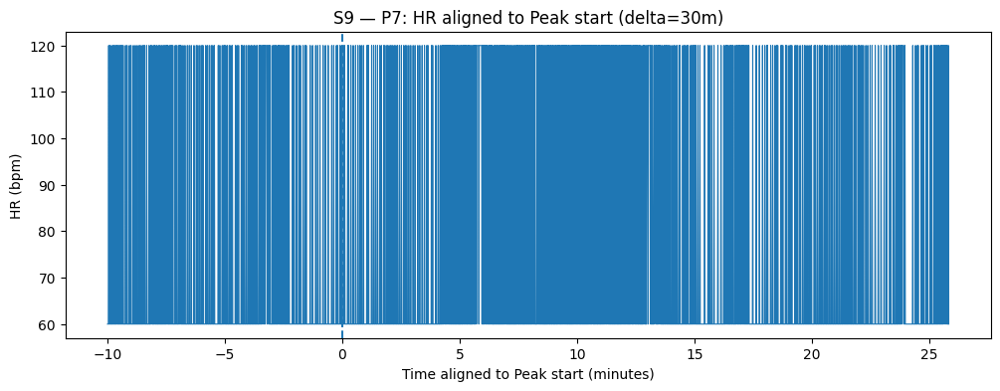

 S9 delta=30m -> S9_labels_chestdelta30.parquet | Ant:1800s Peak:900s Rec:651s


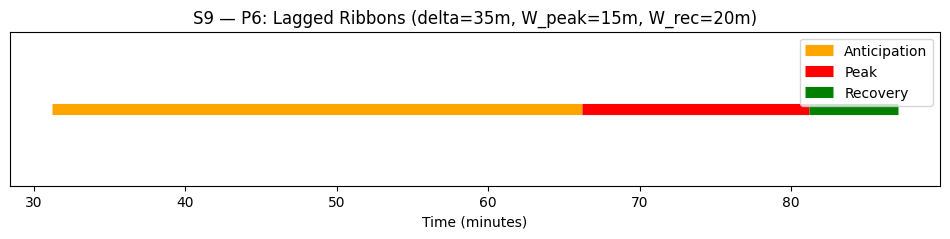

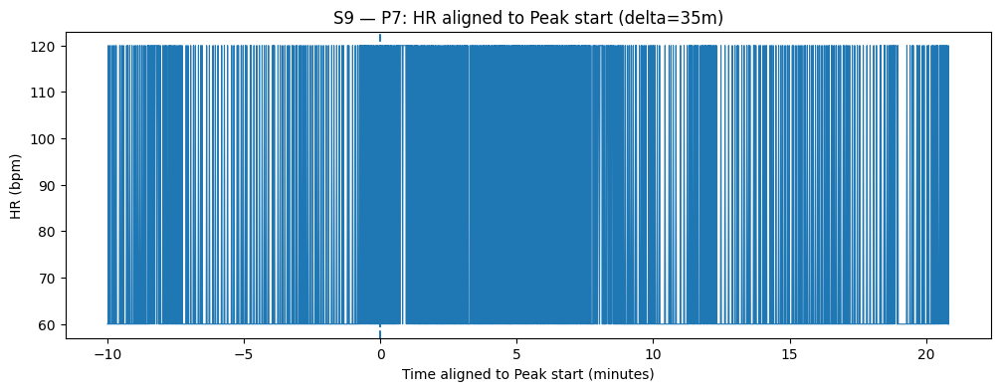

 S9 delta=35m -> S9_labels_chestdelta35.parquet | Ant:2100s Peak:900s Rec:351s

 saved: /content/wesad/reports/step7_hybrid_labels_summary.csv

Coverage by delta (fraction of subjects with non-zero seconds):
           Anticipation_coverage  Peak_coverage  Recovery_coverage
delta_min                                                         
15                           1.0            1.0           1.000000
20                           1.0            1.0           1.000000
25                           1.0            1.0           0.666667
30                           1.0            1.0           0.533333
35                           1.0            1.0           0.466667


In [ ]:
# Hybrid Lag Labeling for ALL subjects (CHEST)
# Writes /content/wesad/interim/Sxx_labels_chest{delta}.parquet
# saves summary CSV and optional plots (P6, P7)

import json, pickle
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

proj = Path("/content/wesad")
root_dir = Path("/content/WESAD/WESAD")
out_interim = proj/"interim"
out_reports = proj/"reports"
out_interim.mkdir(parents=True, exist_ok=True)
out_reports.mkdir(parents=True, exist_ok=True)

# configuration
DELTAS_MIN = [15, 20, 25, 30, 35]   # testing different cortisol lags
W_PEAK_MIN = 15                     # minutes
W_REC_MIN  = 20                     # minutes
MAKE_P6 = True                      # save phase ribbons
MAKE_P7 = True                      # save HR trend aligned to peak start (needs per-second file)

def load_total_seconds(subject_id):
    # Prefer per-second features length if present
    sec_path = proj/"features"/"seconds"/f"{subject_id}_seconds.parquet"
    if sec_path.exists():
        return int(pd.read_parquet(sec_path)["second"].max() + 1)
    # Else from labels length / 700 Hz
    with open(root_dir/subject_id/f"{subject_id}.pkl","rb") as f:
        data = pickle.load(f, encoding="latin1")
    return int(len(data["label"]) // 700)

def load_stress_ts_te(subject_id):
    p = proj/"interim"/f"{subject_id}_intervals.json"
    with open(p, "r") as f:
        J = json.load(f)
    stress = J["intervals"].get("Stress", [])
    if not stress:
        raise ValueError(f"{subject_id}: no Stress interval in {p}")
    ts = float(stress[0]["start_sec"])
    te = float(stress[0]["end_sec"])
    return ts, te

def mark_range(vec, start_s, end_s, name, total_seconds):
    s0 = int(np.floor(max(0, start_s)))
    s1 = int(np.floor(min(total_seconds, end_s)))
    if s1 > s0:
        vec[s0:s1] = name

def label_subject_for_delta(subject_id, delta_min, w_peak_min, w_rec_min):
    total_seconds = load_total_seconds(subject_id)
    ts, te = load_stress_ts_te(subject_id)

    delta  = delta_min * 60.0
    w_peak = w_peak_min * 60.0
    w_rec  = w_rec_min  * 60.0

    t_anticip_start = ts
    t_anticip_end   = ts + delta
    t_peak_start    = ts + delta
    t_peak_end      = ts + delta + w_peak
    t_rec_start     = t_peak_end
    t_rec_end       = t_peak_end + w_rec

    # clamp
    t_anticip_end = min(t_anticip_end, total_seconds)
    t_peak_end    = min(t_peak_end, total_seconds)
    t_rec_end     = min(t_rec_end, total_seconds)

    labels = np.array(["Other"] * total_seconds, dtype=object)
    mark_range(labels, t_anticip_start, t_anticip_end, "Anticipation", total_seconds)
    mark_range(labels, t_peak_start,     t_peak_end,   "Peak",         total_seconds)
    mark_range(labels, t_rec_start,      t_rec_end,    "Recovery",     total_seconds)

    # Save parquet
    out_pq = out_interim / f"{subject_id}_labels_chestdelta{int(delta_min)}.parquet"
    df = pd.DataFrame({"subject": subject_id,
                       "second": np.arange(total_seconds, dtype=int),
                       "label_hybrid": labels})
    df.to_parquet(out_pq, index=False)

    return out_pq, {
        "Anticipation": int((labels == "Anticipation").sum()),
        "Peak":         int((labels == "Peak").sum()),
        "Recovery":     int((labels == "Recovery").sum()),
        "Other":        int((labels == "Other").sum()),
        "total_seconds": total_seconds,
        "t0": ts, "t1": te, "delta_min": delta_min
    }, (t_anticip_start, t_anticip_end, t_peak_start, t_peak_end, t_rec_start, t_rec_end)

def plot_P6(subject_id, delta_min, tA0,tA1,tP0,tP1,tR0,tR1):
    plt.figure(figsize=(12,2))
    def block(y, x0, x1, color, label):
        if x1 > x0:
            plt.hlines(y, x0/60.0, x1/60.0, colors=color, linewidth=8, label=label)
    block(0, tA0, tA1, "orange", "Anticipation")
    block(0, tP0, tP1, "red",    "Peak")
    block(0, tR0, tR1, "green",  "Recovery")
    plt.yticks([])
    plt.xlabel("Time (minutes)")
    plt.title(f"{subject_id} — P6: Lagged Ribbons (delta={delta_min}m, W_peak={W_PEAK_MIN}m, W_rec={W_REC_MIN}m)")
    h, l = plt.gca().get_legend_handles_labels()
    d = dict(zip(l,h)); plt.legend(d.values(), d.keys(), loc="upper right")
    out_png = out_reports / f"P6_{subject_id}_lagdelta{int(delta_min)}.png"
    plt.savefig(out_png, bbox_inches="tight", dpi=150); plt.show()
    return out_png

def plot_P7(subject_id, delta_min, tP0):
    sec_path = proj/"features"/"seconds"/f"{subject_id}_seconds.parquet"
    if not sec_path.exists():
        return None
    df_sec = pd.read_parquet(sec_path)
    t0 = int(np.floor(tP0))
    pre_min, post_min = 10, 30
    s0 = max(0, t0 - pre_min*60)
    s1 = min(int(df_sec["second"].max()+1), t0 + post_min*60)
    cut = df_sec[(df_sec["second"] >= s0) & (df_sec["second"] < s1)].copy()
    cut["t_aligned_min"] = (cut["second"] - t0) / 60.0
    plt.figure(figsize=(12,4))
    plt.plot(cut["t_aligned_min"], cut["ecg_hr_bpm"], linewidth=0.8)
    plt.axvline(0, linestyle="--")
    plt.xlabel("Time aligned to Peak start (minutes)")
    plt.ylabel("HR (bpm)")
    plt.title(f"{subject_id} — P7: HR aligned to Peak start (delta={delta_min}m)")
    out_png = out_reports / f"P7_{subject_id}_lagdelta{int(delta_min)}.png"
    plt.savefig(out_png, bbox_inches="tight", dpi=150); plt.show()
    return out_png

summary_rows = []

for sid in sorted(subjects):
    for dmin in DELTAS_MIN:
        try:
            out_pq, stats, (tA0,tA1,tP0,tP1,tR0,tR1) = label_subject_for_delta(sid, dmin, W_PEAK_MIN, W_REC_MIN)
            # checks
            nonzero = {k: (stats.get(k,0) > 0) for k in ["Anticipation","Peak","Recovery"]}
            # record
            row = {"subject": sid, "delta_min": dmin, **stats, **{f"{k}_nonzero": v for k,v in nonzero.items()}}
            summary_rows.append(row)

            if MAKE_P6:
                plot_P6(sid, dmin, tA0,tA1,tP0,tP1,tR0,tR1)
            if MAKE_P7:
                plot_P7(sid, dmin, tP0)

            print(f" {sid} delta={dmin}m -> {out_pq.name} | Ant:{stats['Anticipation']}s Peak:{stats['Peak']}s Rec:{stats['Recovery']}s")

        except Exception as e:
            print(f" {sid} delta={dmin}m failed:", e)

# Save summary CSV
summary_df = pd.DataFrame(summary_rows)
summary_csv = out_reports/"step7_hybrid_labels_summary.csv"
summary_df.to_csv(summary_csv, index=False)
print("\n saved:", summary_csv)

#  overview table: non-zero class coverage by delta
if not summary_df.empty:
    coverage = (summary_df
                .groupby("delta_min")[["Anticipation_nonzero","Peak_nonzero","Recovery_nonzero"]]
                .mean().rename(columns=lambda c: c.replace("_nonzero","_coverage")))
    print("\nCoverage by delta (fraction of subjects with non-zero seconds):")
    print(coverage)


In [ ]:
from collections import Counter
import pandas as pd

# re-define grid
delta_grid = [15, 20, 25, 30, 35]

summary_counts = []

for delta in delta_grid:
    total_counts = Counter()
    for sid in subjects:
        f = proj/"interim"/f"{sid}_labels_chestdelta{delta}.parquet"
        if not f.exists():
            continue
        df = pd.read_parquet(f)
        total_counts.update(df["label_hybrid"])
    for phase in ["Anticipation", "Peak", "Recovery", "Other"]:
        summary_counts.append({
            "delta_min": delta,
            "phase": phase,
            "seconds": total_counts.get(phase, 0),
            "minutes": round(total_counts.get(phase, 0)/60, 1)
        })

df_summary = pd.DataFrame(summary_counts)
df_pivot = df_summary.pivot(index="delta_min", columns="phase", values="minutes").fillna(0)

print("total minutes per phase across all subjects, for each delta:")
print(df_pivot.to_string())

# save to reports
out_csv = proj/"reports"/"hybrid_label_counts_by_delta.csv"
df_pivot.to_csv(out_csv)
print("Saved summary table to:", out_csv)

total minutes per phase across all subjects, for each delta:
phase      Anticipation  Other   Peak  Recovery
delta_min                                      
15                225.0  782.4  225.0     215.4
20                300.0  747.4  225.0     175.4
25                375.0  721.1  209.2     142.5
30                450.0  706.2  178.6     113.0
35                525.0  696.2  140.4      86.2
Saved summary table to: /content/wesad/reports/hybrid_label_counts_by_delta.csv


This confirms what table showed:

delta=15 or 20 gives the best balance (all subjects covered + reasonable Recovery class).

Larger values cause recovery to vanish for many subjects

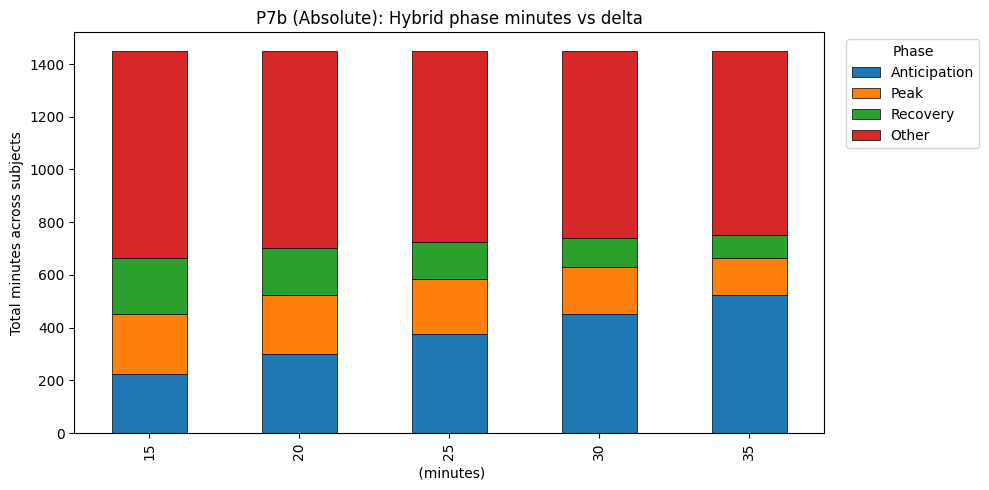

saved: /content/wesad/reports/P7b_hybrid_minutes_vs_delta.png


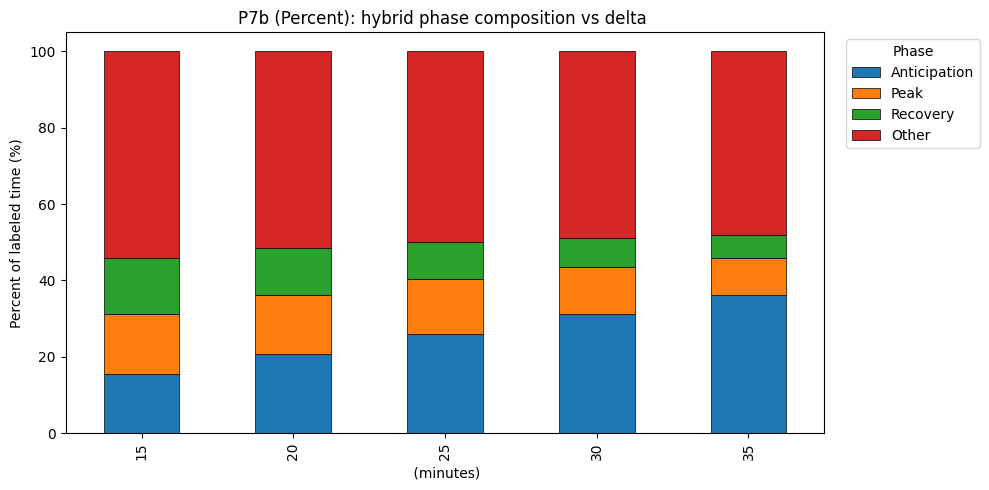

saved: /content/wesad/reports/P7b_hybrid_percent_vs_delta.png


In [ ]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

proj = Path("/content/wesad")
reports = proj/"reports"
reports.mkdir(parents=True, exist_ok=True)

csv_path = reports/"hybrid_label_counts_by_delta.csv"
df_pivot = pd.read_csv(csv_path, index_col=0)
df_pivot = df_pivot[["Anticipation","Peak","Recovery","Other"]]


ax = df_pivot.plot(
    kind="bar",
    stacked=True,
    figsize=(10,5),
    linewidth=0.5,
    edgecolor="black"
)
ax.set_xlabel(" (minutes)")
ax.set_ylabel("Total minutes across subjects")
ax.set_title("P7b (Absolute): Hybrid phase minutes vs delta")
ax.legend(title="Phase", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()
out_abs = reports/"P7b_hybrid_minutes_vs_delta.png"
plt.savefig(out_abs, dpi=150, bbox_inches="tight")
plt.show()
print("saved:", out_abs)


df_pct = df_pivot.div(df_pivot.sum(axis=1), axis=0) * 100.0

ax = df_pct.plot(
    kind="bar",
    stacked=True,
    figsize=(10,5),
    linewidth=0.5,
    edgecolor="black"
)
ax.set_xlabel(" (minutes)")
ax.set_ylabel("Percent of labeled time (%)")
ax.set_title("P7b (Percent): hybrid phase composition vs delta ")
ax.legend(title="Phase", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()
out_pct = reports/"P7b_hybrid_percent_vs_delta.png"
plt.savefig(out_pct, dpi=150, bbox_inches="tight")
plt.show()
print("saved:", out_pct)


S10  (seconds)
Binary:
label_wrist_binary
NonStress    4771
Stress        725
3-class:
label_wrist_3class
Other        3219
Baseline     1180
Stress        725
Amusement     372


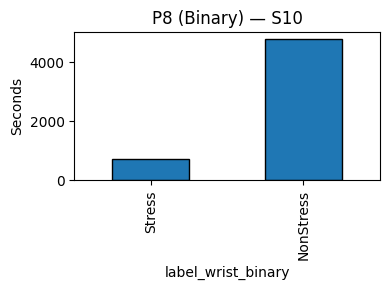

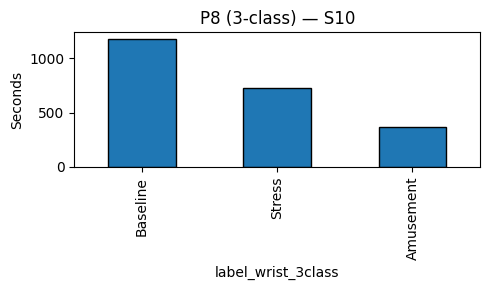


S11  (seconds)
Binary:
label_wrist_binary
NonStress    4553
Stress        680
3-class:
label_wrist_3class
Other        3005
Baseline     1180
Stress        680
Amusement     368


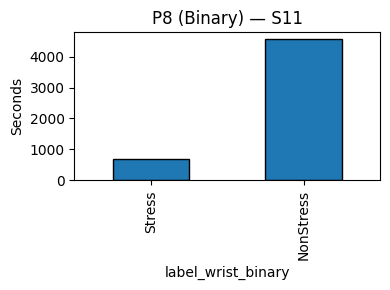

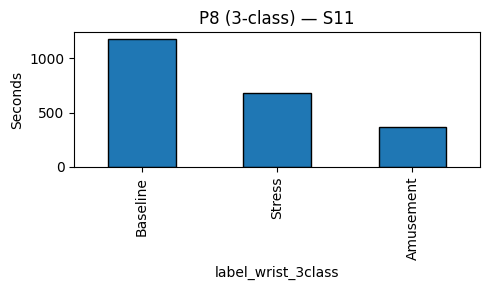


S13  (seconds)
Binary:
label_wrist_binary
NonStress    4873
Stress        664
3-class:
label_wrist_3class
Other        3311
Baseline     1180
Stress        664
Amusement     382


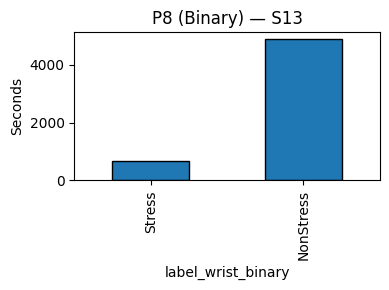

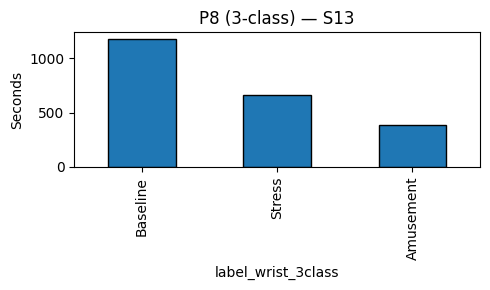


S14  (seconds)
Binary:
label_wrist_binary
NonStress    4873
Stress        675
3-class:
label_wrist_3class
Other        3321
Baseline     1180
Stress        675
Amusement     372


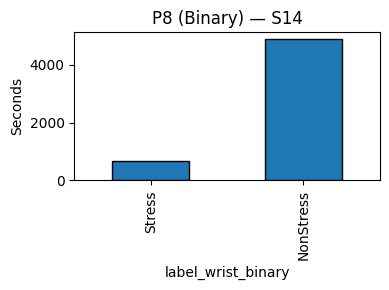

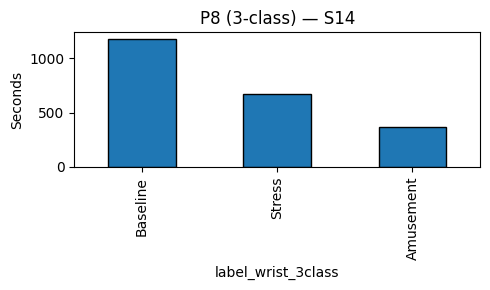


S15  (seconds)
Binary:
label_wrist_binary
NonStress    4566
Stress        686
3-class:
label_wrist_3class
Other        3019
Baseline     1175
Stress        686
Amusement     372


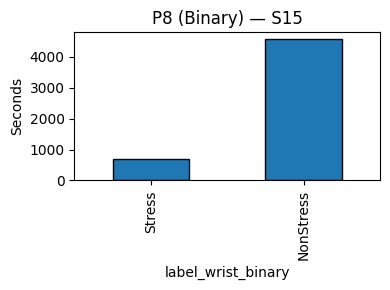

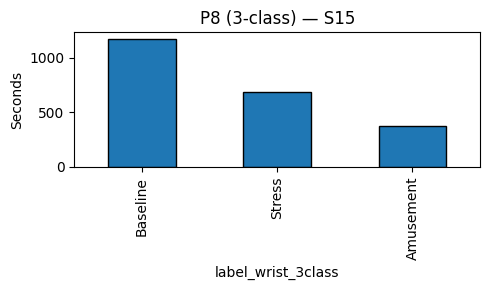


S16  (seconds)
Binary:
label_wrist_binary
NonStress    4958
Stress        673
3-class:
label_wrist_3class
Other        3410
Baseline     1180
Stress        673
Amusement     368


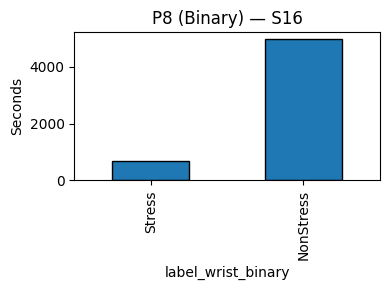

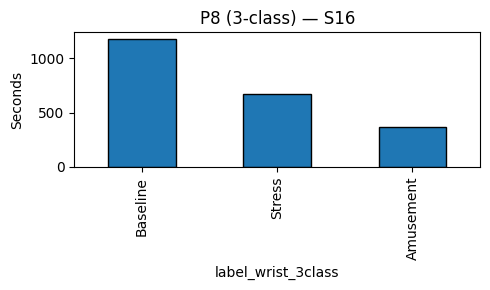


S17  (seconds)
Binary:
label_wrist_binary
NonStress    5197
Stress        723
3-class:
label_wrist_3class
Other        3644
Baseline     1181
Stress        723
Amusement     372


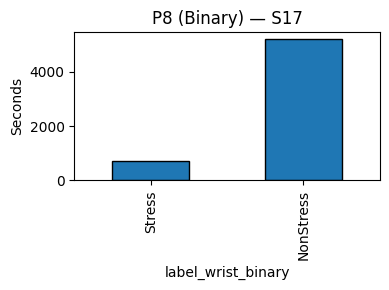

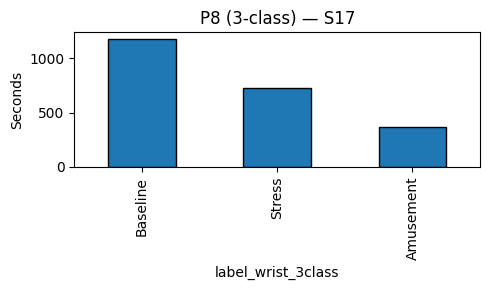


S2  (seconds)
Binary:
label_wrist_binary
NonStress    5464
Stress        615
3-class:
label_wrist_3class
Other        3958
Baseline     1144
Stress        615
Amusement     362


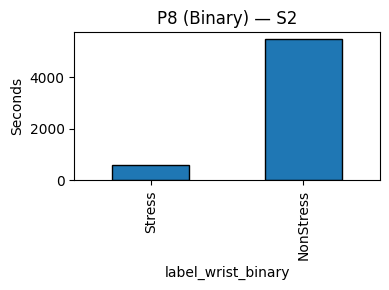

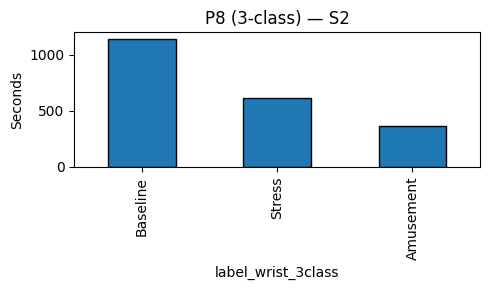


S3  (seconds)
Binary:
label_wrist_binary
NonStress    5853
Stress        640
3-class:
label_wrist_3class
Other        4338
Baseline     1140
Stress        640
Amusement     375


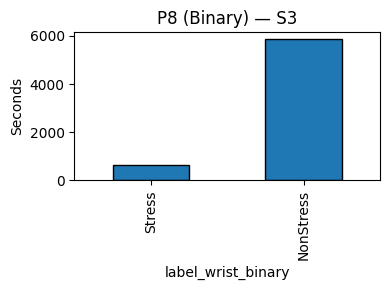

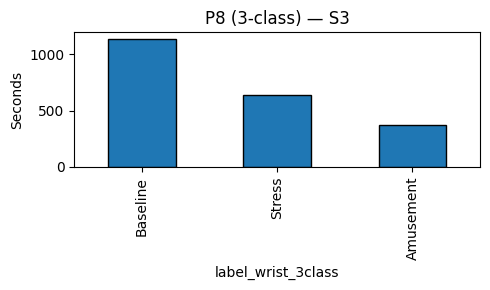


S4  (seconds)
Binary:
label_wrist_binary
NonStress    5788
Stress        635
3-class:
label_wrist_3class
Other        4258
Baseline     1158
Stress        635
Amusement     372


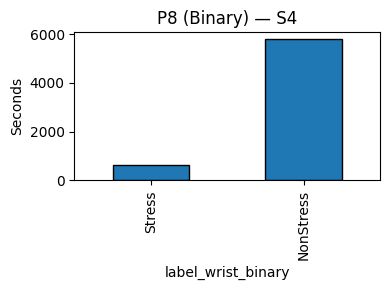

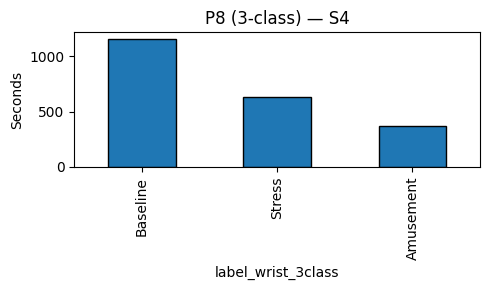


S5  (seconds)
Binary:
label_wrist_binary
NonStress    5613
Stress        645
3-class:
label_wrist_3class
Other        4041
Baseline     1198
Stress        645
Amusement     374


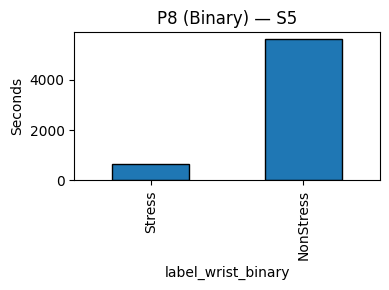

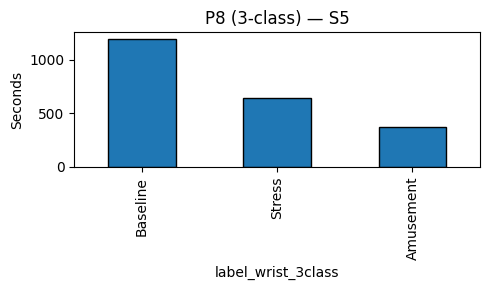


S6  (seconds)
Binary:
label_wrist_binary
NonStress    6421
Stress        650
3-class:
label_wrist_3class
Other        4869
Baseline     1180
Stress        650
Amusement     372


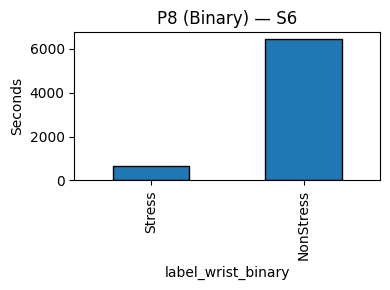

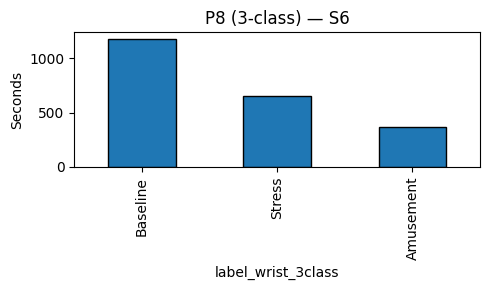


S7  (seconds)
Binary:
label_wrist_binary
NonStress    4598
Stress        640
3-class:
label_wrist_3class
Other        3040
Baseline     1186
Stress        640
Amusement     372


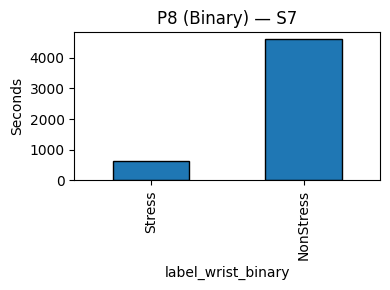

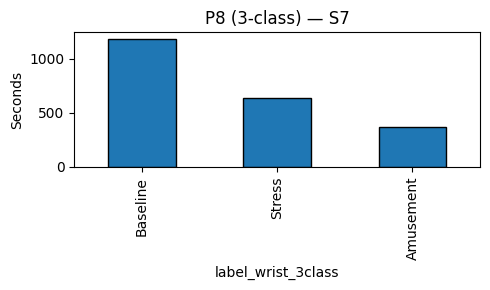


S8  (seconds)
Binary:
label_wrist_binary
NonStress    4796
Stress        670
3-class:
label_wrist_3class
Other        3257
Baseline     1169
Stress        670
Amusement     370


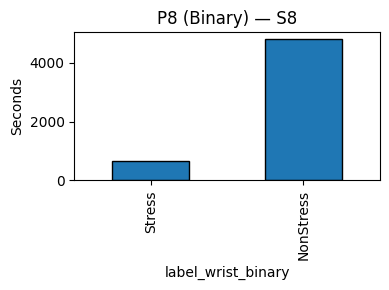

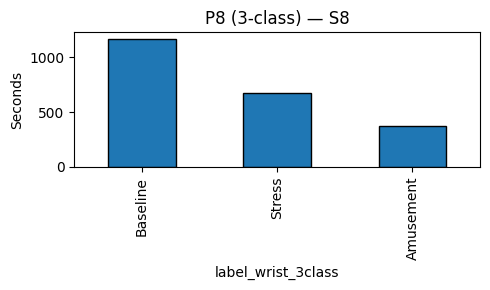


S9  (seconds)
Binary:
label_wrist_binary
NonStress    4578
Stress        645
3-class:
label_wrist_3class
Other        3026
Baseline     1180
Stress        645
Amusement     372


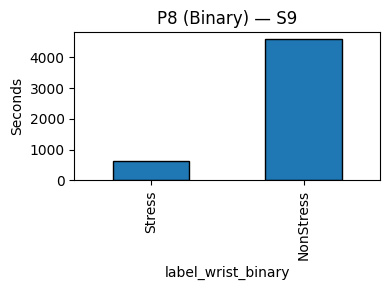

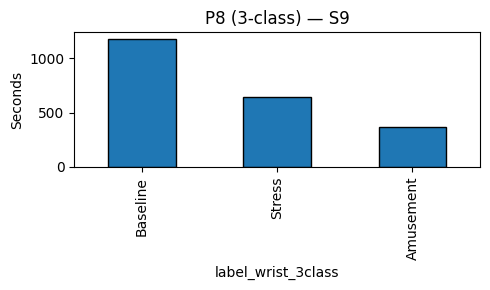


saved per-subject wrist labels to: /content/wesad/interim
saved P8 plots to: /content/wesad/reports


In [ ]:
#  Hybrid Labeling — Wrist (NO Lag) ===
# Uses original protocol intervals (no lag) to label each second.
# Outputs per subject: /content/wesad/interim/Sxx_labels_wrist.parquet
# Saves P8 plots: P8_wrist_binary_Sxx.png and P8_wrist_3class_Sxx.png

import json, pickle
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

proj = Path("/content/wesad")
root_dir = Path("/content/WESAD/WESAD")
interim_dir = proj/"interim"
reports_dir = proj/"reports"
interim_dir.mkdir(parents=True, exist_ok=True)
reports_dir.mkdir(parents=True, exist_ok=True)

# Helper: total seconds (prefer chest per-second file if present; else from 700 Hz labels length)
def total_seconds_for_subject(sid: str) -> int:
    sec_path = proj/"features"/"seconds"/f"{sid}_seconds.parquet"
    if sec_path.exists():
        return int(pd.read_parquet(sec_path)["second"].max() + 1)
    with open(root_dir/sid/f"{sid}.pkl","rb") as f:
        data = pickle.load(f, encoding="latin1")
    return int(len(data["label"]) // 700)

# Load Step-3 intervals JSON
def load_intervals(sid: str):
    p = interim_dir/f"{sid}_intervals.json"
    with open(p, "r") as f:
        return json.load(f)["intervals"]

# Mark a [start_sec, end_sec) range into a per-second array
def mark_range(vec, start_s, end_s, name, T):
    s0 = int(np.floor(max(0, start_s)))
    s1 = int(np.floor(min(T, end_s)))
    if s1 > s0:
        vec[s0:s1] = name

# Build wrist labels for one subject (NO lag)
def build_wrist_labels(sid: str) -> Path:
    T = total_seconds_for_subject(sid)
    ivs = load_intervals(sid)

    # Initialize full timeline as "Other"
    lab_3class = np.array(["Other"]*T, dtype=object)

    # Fill Baseline / Stress / Amusement directly from intervals
    for phase in ["Baseline","Stress","Amusement"]:
        for iv in ivs.get(phase, []):
            mark_range(lab_3class, iv["start_sec"], iv["end_sec"], phase, T)

    # Binary: Stress vs NonStress (everything not "Stress" becomes "NonStress")
    lab_binary = np.where(lab_3class == "Stress", "Stress", "NonStress")

    df = pd.DataFrame({
        "subject": sid,
        "second": np.arange(T, dtype=int),
        "label_wrist_binary": lab_binary,
        "label_wrist_3class": lab_3class,   # contains Baseline/Stress/Amusement/Other
    })

    out_pq = interim_dir/f"{sid}_labels_wrist.parquet"
    df.to_parquet(out_pq, index=False)
    return out_pq

# --- Run for all subjects ---
written = []
for sid in sorted(subjects):
    p = build_wrist_labels(sid)
    written.append(p)
    # Checks: class counts
    df = pd.read_parquet(p)
    c_bin = df["label_wrist_binary"].value_counts()
    c_3cl = df["label_wrist_3class"].value_counts()
    print(f"\n{sid}  (seconds)\nBinary:\n{c_bin.to_string()}\n3-class:\n{c_3cl.to_string()}")

    # ---- P8 plots per subject ----
    # Binary plot
    plt.figure(figsize=(4,3))
    c_bin = c_bin.reindex(["Stress","NonStress"]).fillna(0)
    c_bin.plot(kind="bar", edgecolor="black")
    plt.ylabel("Seconds")
    plt.title(f"P8 (Binary) — {sid}")
    plt.tight_layout()
    out_png_bin = reports_dir/f"P8_wrist_binary_{sid}.png"
    plt.savefig(out_png_bin, dpi=150, bbox_inches="tight")
    plt.show()

    # 3-class plot (exclude 'Other' to see the real 3-class balance cleanly)
    plt.figure(figsize=(5,3))
    desired = ["Baseline","Stress","Amusement"]
    c_3 = c_3cl.reindex(desired).fillna(0)
    c_3.plot(kind="bar", edgecolor="black")
    plt.ylabel("Seconds")
    plt.title(f"P8 (3-class) — {sid}")
    plt.tight_layout()
    out_png_3 = reports_dir/f"P8_wrist_3class_{sid}.png"
    plt.savefig(out_png_3, dpi=150, bbox_inches="tight")
    plt.show()

print("\nsaved per-subject wrist labels to:", interim_dir)
print("saved P8 plots to:", reports_dir)


In [ ]:
import pandas as pd
import numpy as np
from sklearn.base import BaseEstimator, TransformerMixin

# Custom robust scaler (median/IQR)
class RobustZScaler(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        self.median_ = np.median(X, axis=0)
        self.iqr_ = np.subtract(*np.percentile(X, [75, 25], axis=0))
        self.iqr_[self.iqr_ == 0] = 1.0
        return self

    def transform(self, X):
        return (X - self.median_) / self.iqr_

# Example: training/test split per subject
def fit_scaler_on_train(train_subjects, test_subject, feature_dir):
    # load feature tables for training subjects
    dfs = []
    for sid in train_subjects:
        path = feature_dir / f"{sid}_windows.parquet"
        dfs.append(pd.read_parquet(path))
    df_train = pd.concat(dfs, axis=0)

    # pick only numeric feature columns
    feat_cols = df_train.select_dtypes(include=[np.number]).columns

    # fit robust scaler on training
    scaler = RobustZScaler().fit(df_train[feat_cols].values)

    # transform both train and test sets
    train_scaled = scaler.transform(df_train[feat_cols].values)
    df_train_scaled = df_train.copy()
    df_train_scaled[feat_cols] = train_scaled

    test_path = feature_dir / f"{test_subject}_windows.parquet"
    df_test = pd.read_parquet(test_path)
    test_scaled = scaler.transform(df_test[feat_cols].values)
    df_test_scaled = df_test.copy()
    df_test_scaled[feat_cols] = test_scaled

    return df_train_scaled, df_test_scaled


 CHEST windows saved: /content/wesad/features/windows/chestdelta20/S10.npz  |  X(76, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


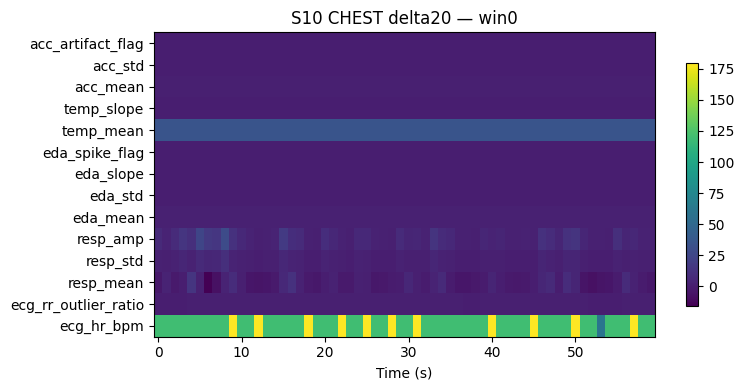

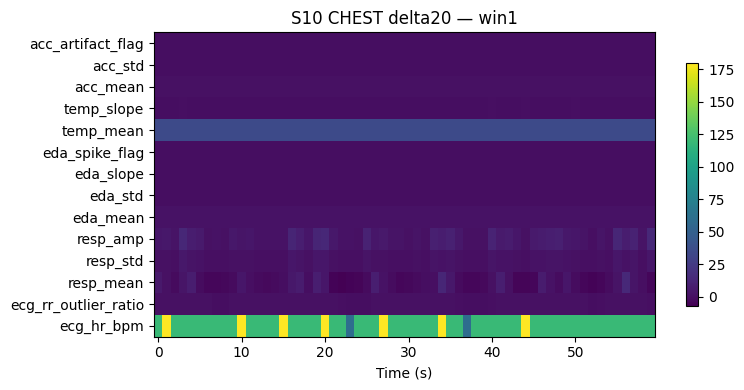

 CHEST windows saved: /content/wesad/features/windows/chestdelta20/S11.npz  |  X(110, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


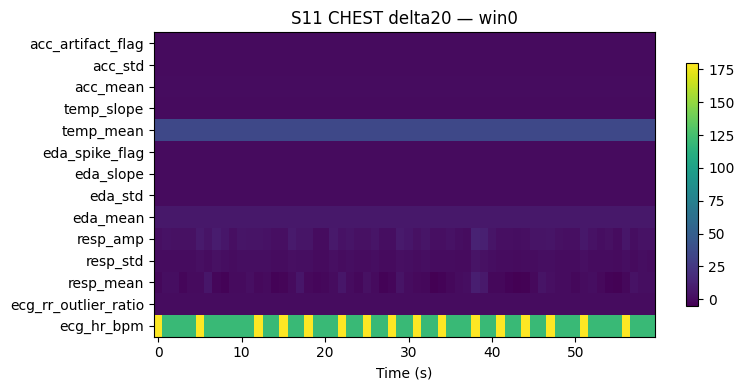

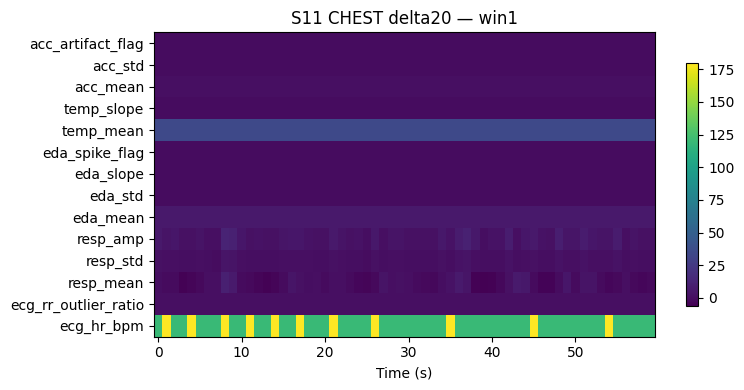

 CHEST windows saved: /content/wesad/features/windows/chestdelta20/S13.npz  |  X(75, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


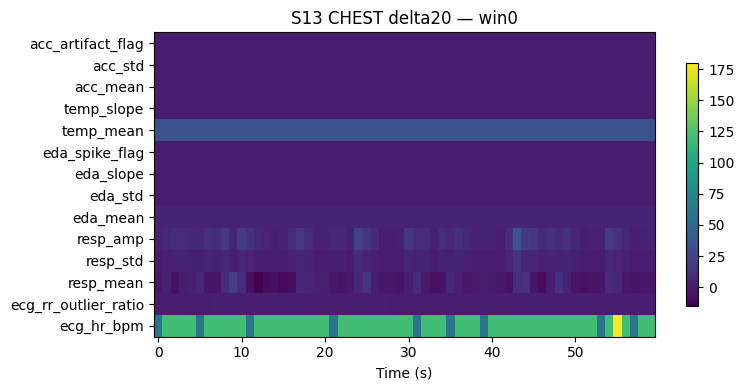

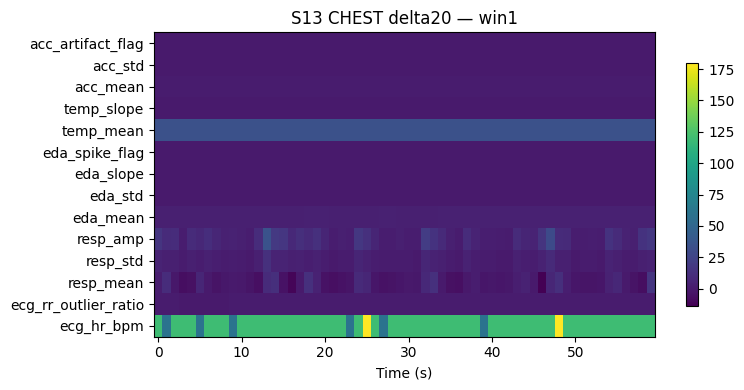

 CHEST windows saved: /content/wesad/features/windows/chestdelta20/S14.npz  |  X(110, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


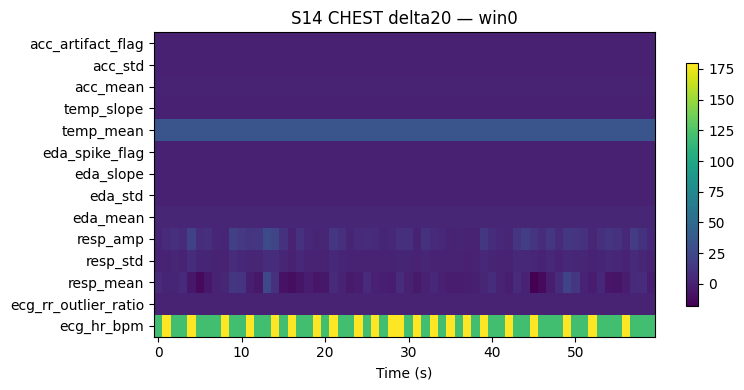

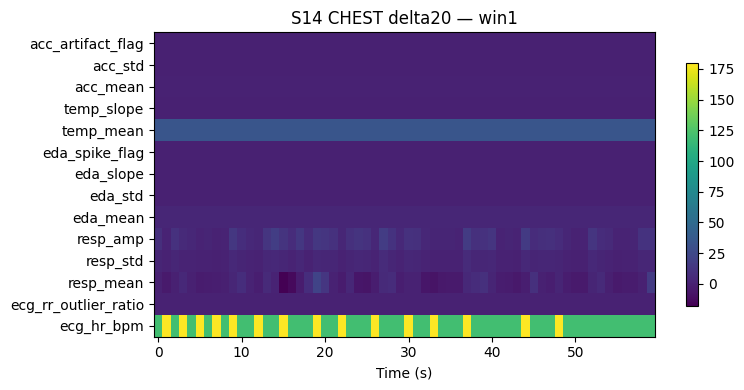

 CHEST windows saved: /content/wesad/features/windows/chestdelta20/S15.npz  |  X(71, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


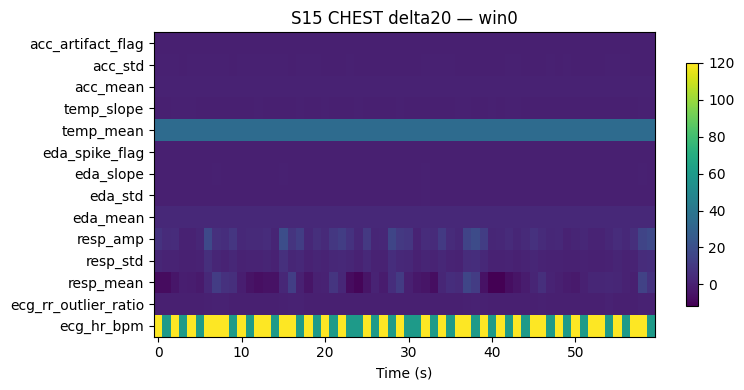

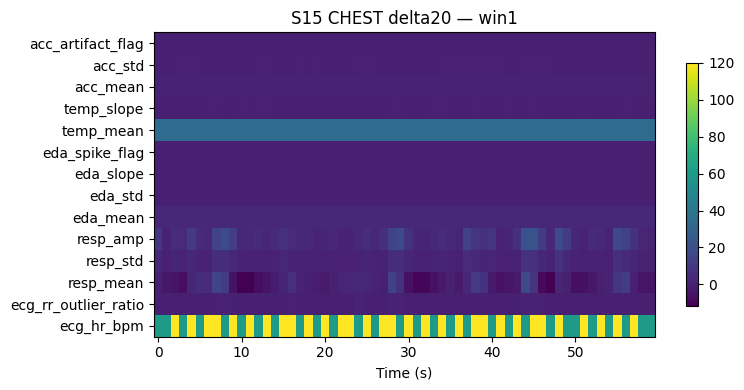

 CHEST windows saved: /content/wesad/features/windows/chestdelta20/S16.npz  |  X(110, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


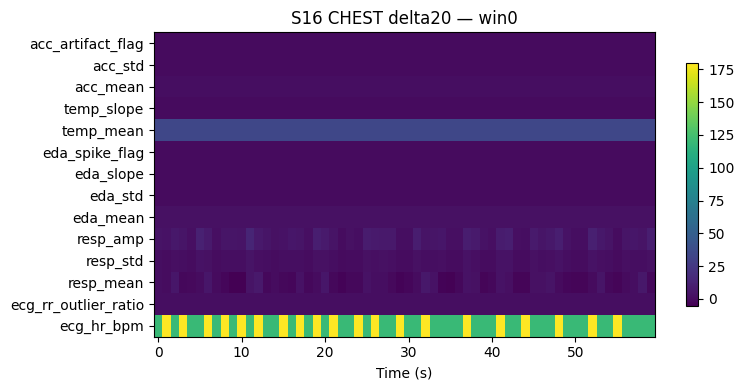

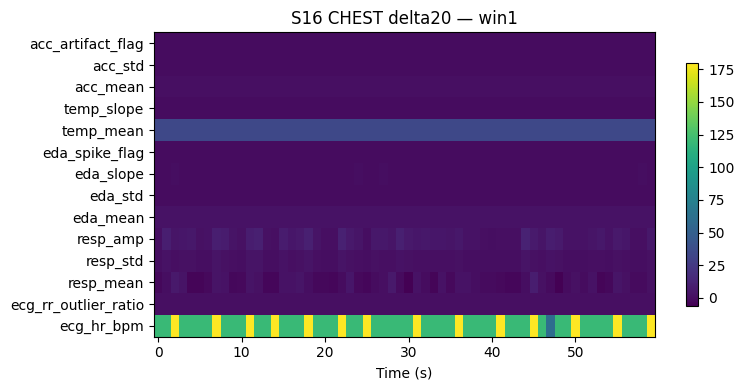

 CHEST windows saved: /content/wesad/features/windows/chestdelta20/S17.npz  |  X(79, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


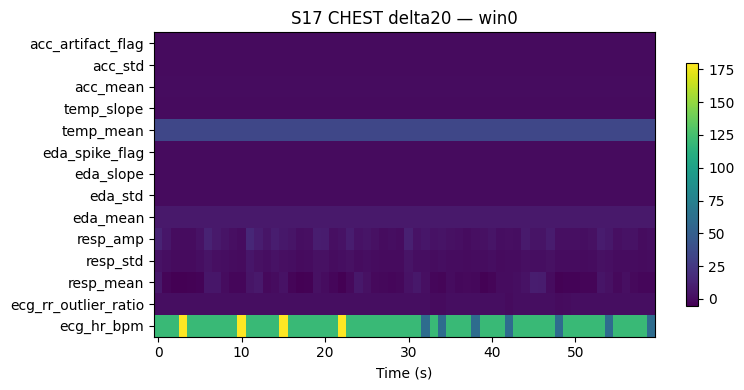

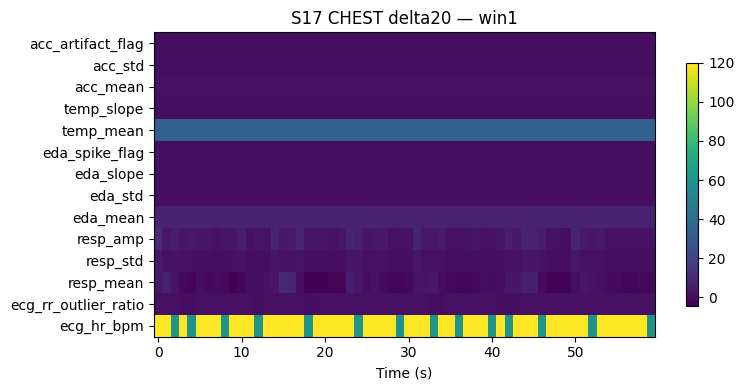

 CHEST windows saved: /content/wesad/features/windows/chestdelta20/S2.npz  |  X(110, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


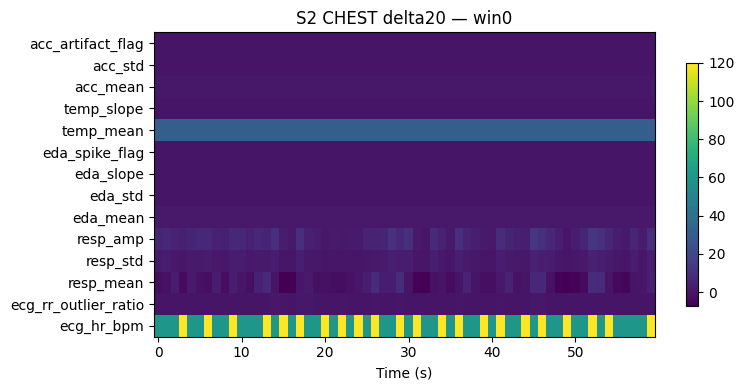

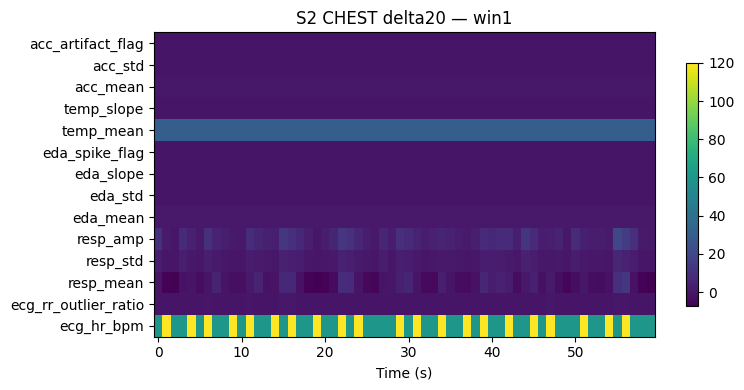

 CHEST windows saved: /content/wesad/features/windows/chestdelta20/S3.npz  |  X(110, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


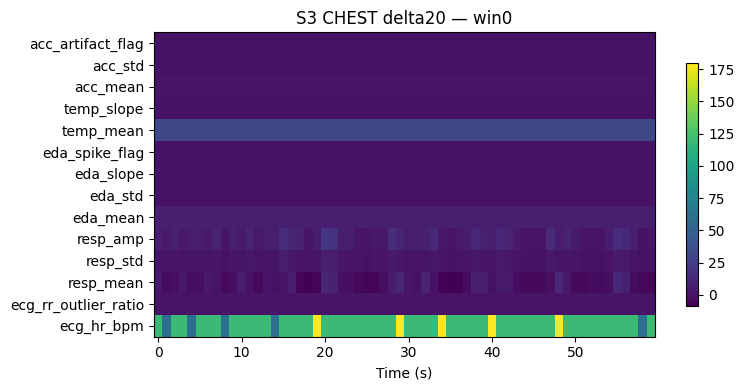

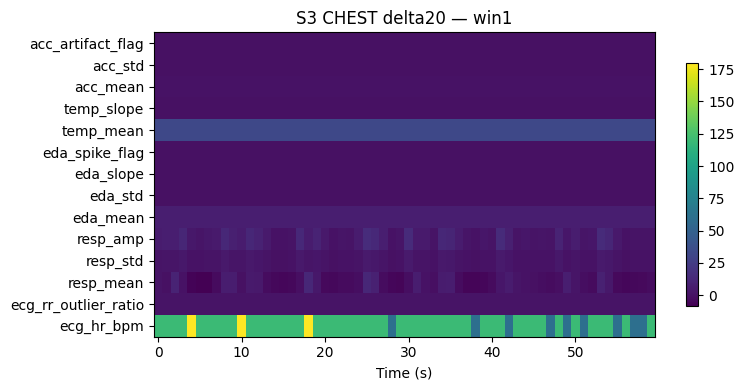

 CHEST windows saved: /content/wesad/features/windows/chestdelta20/S4.npz  |  X(93, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


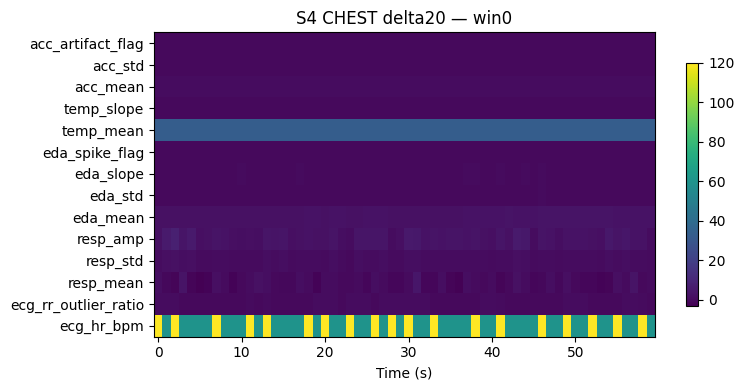

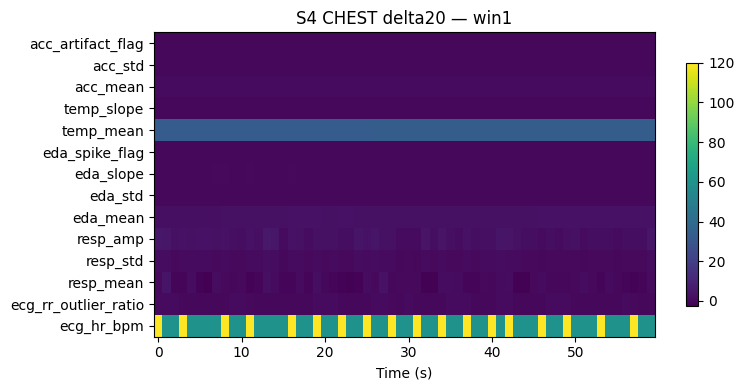

 CHEST windows saved: /content/wesad/features/windows/chestdelta20/S5.npz  |  X(87, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


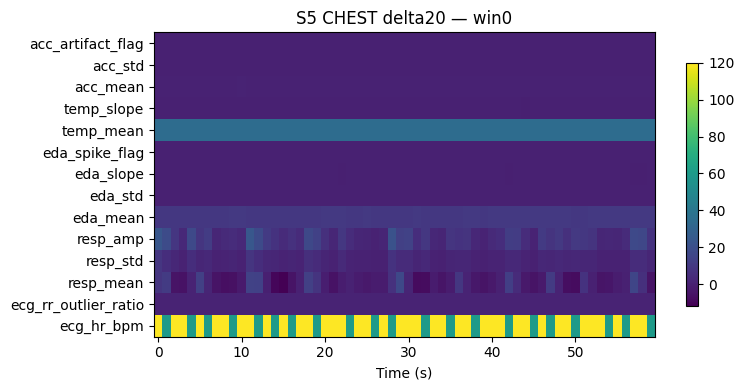

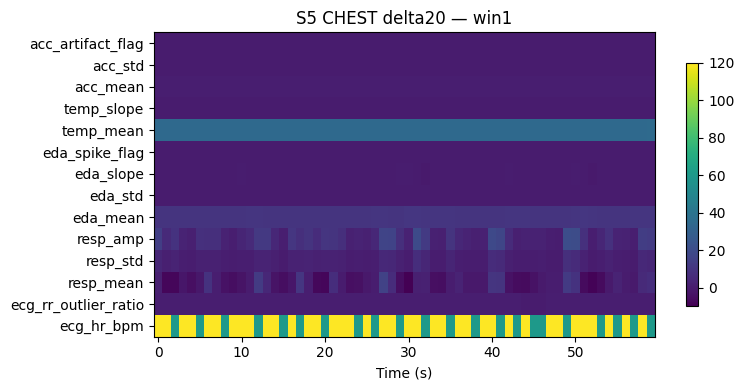

 CHEST windows saved: /content/wesad/features/windows/chestdelta20/S6.npz  |  X(110, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


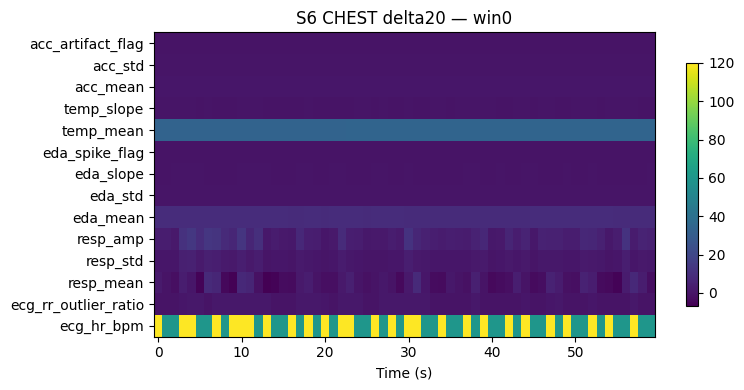

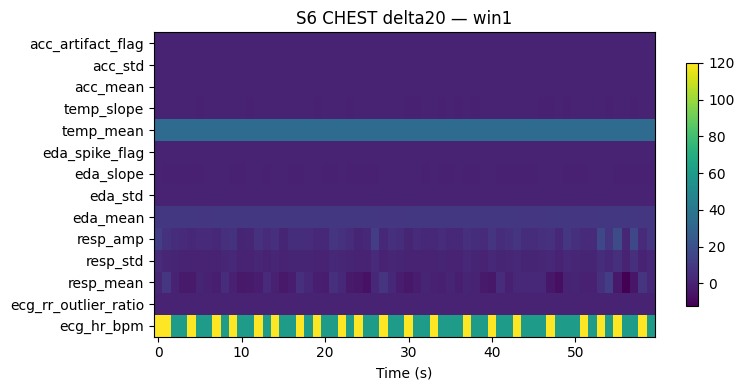

 CHEST windows saved: /content/wesad/features/windows/chestdelta20/S7.npz  |  X(70, 60, 14)  classes={'Anticipation': 0, 'Peak': 1}


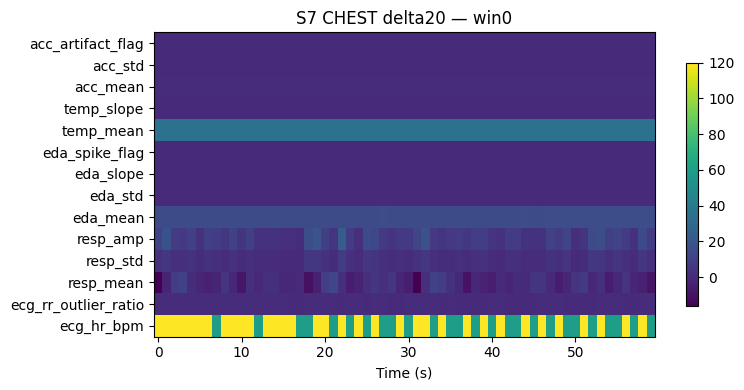

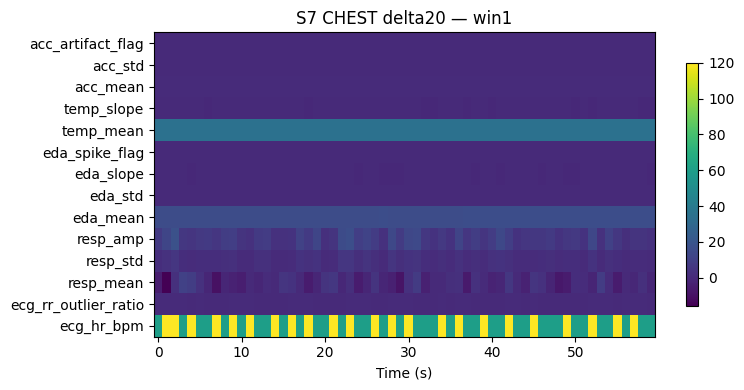

 CHEST windows saved: /content/wesad/features/windows/chestdelta20/S8.npz  |  X(72, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


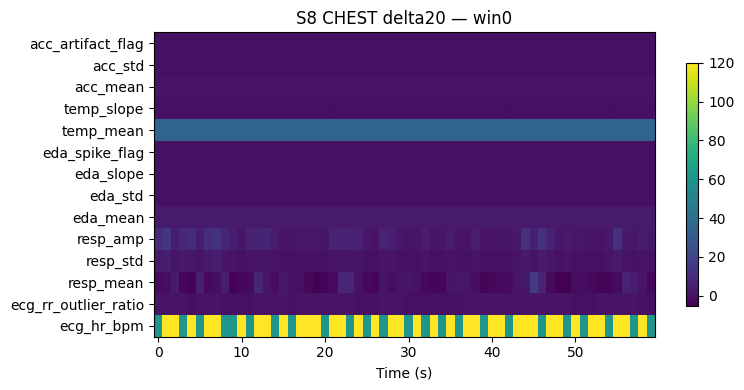

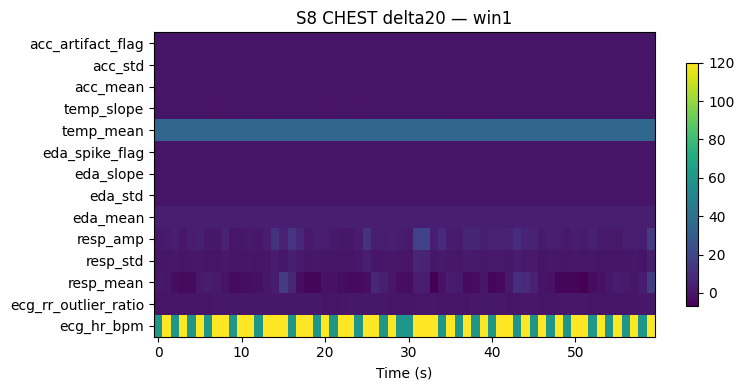

 CHEST windows saved: /content/wesad/features/windows/chestdelta20/S9.npz  |  X(110, 60, 14)  classes={'Anticipation': 0, 'Peak': 1, 'Recovery': 2}


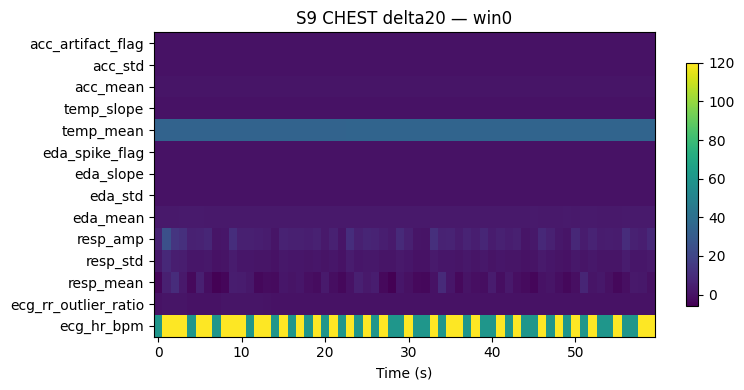

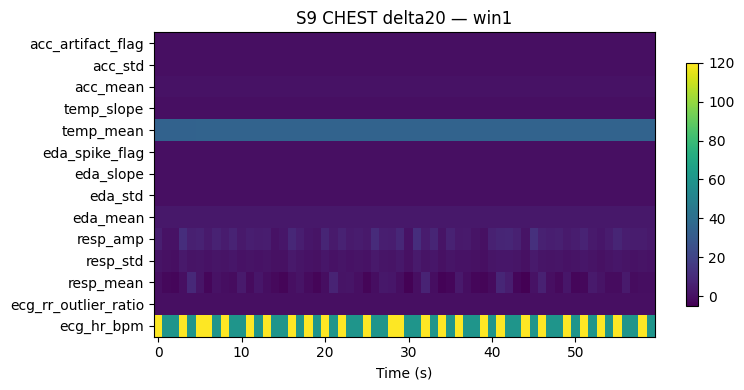

wrist per-second features folder not found — skipping wrist windowing for now.
    /content/wesad/features/seconds_wrist/


In [ ]:
#  Windowing (1 Hz → 60 s sequences) ===
# CHEST: per-second features + hybrid-lag labels → 60s windows (stride 30s), majority ≥50%
# Save: features/windows/chest∆{∆}/Sxx.npz
# WRIST: same logic (NO lag labels) if wrist per-second features exist; otherwise skipped
# Plots: P9 heatmap previews saved to /content/wesad/reports/

import numpy as np, pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import json, pickle, os

proj = Path("/content/wesad")
feat_sec_dir = proj/"features"/"seconds"
win_out_base = proj/"features"/"windows"
interim_dir  = proj/"interim"
reports_dir  = proj/"reports"
reports_dir.mkdir(parents=True, exist_ok=True)

#  Config
WIN_SEC = 60
STRIDE_SEC = 30
MAJORITY_THRESH = 0.50
DELTA_GRID = [20]

# These columns won't be used as time-varying features
DROP_COLS = {"subject", "second", "phase"}  # keep artifact flags (binary) as features

# Label maps
CHEST_LABELS = ["Anticipation", "Peak", "Recovery"]
CHEST_MAP = {lab:i for i,lab in enumerate(CHEST_LABELS)}  # Anticipation=0, Peak=1, Recovery=2
WRIST_3C = ["Baseline","Stress","Amusement"]
WRIST_MAP = {lab:i for i,lab in enumerate(WRIST_3C)}      # Baseline=0, Stress=1, Amusement=2

# Helpers
def majority_label(labels_in_window, valid_set, thresh=0.5):
    if len(labels_in_window) == 0:
        return None
    vc = pd.Series(labels_in_window).value_counts(dropna=True)
    top_label = vc.index[0]
    top_frac = vc.iloc[0] / len(labels_in_window)
    if (top_label in valid_set) and (top_frac >= thresh):
        return top_label, float(top_frac)
    return None

def build_windows_from_second_table(df_sec: pd.DataFrame, sec_to_label: np.ndarray,
                                    valid_labels: set, drop_cols=DROP_COLS):
    """df_sec indexed by 'second' 0..T-1, sec_to_label same length with string labels."""
    # align & merge
    T = int(df_sec["second"].max()) + 1
    assert len(sec_to_label) >= T, "label vector shorter than per-second features"
    # numeric features only (keep artifact flags)
    num_cols = [c for c in df_sec.columns if c not in drop_cols and np.issubdtype(df_sec[c].dtype, np.number)]
    df = df_sec[["second"] + num_cols].copy().sort_values("second").reset_index(drop=True)

    X_list, y_list, starts = [], [], []
    s = 0
    last_sec = int(df["second"].max())
    while s + WIN_SEC <= last_sec + 1:
        w = df[(df["second"] >= s) & (df["second"] < s + WIN_SEC)]
        if len(w) == WIN_SEC:  # exactly 60 seconds
            labels_w = sec_to_label[s:s+WIN_SEC]
            maj = majority_label(labels_w, valid_labels, MAJORITY_THRESH)
            if maj is not None:
                top_label, top_frac = maj
                X = w[num_cols].to_numpy(dtype=float)               # [60, F]
                X_list.append(X)
                y_list.append(top_label)
                starts.append(s)
        s += STRIDE_SEC

    if not X_list:
        return None, None, None, num_cols

    X = np.stack(X_list, axis=0)  # [N, 60, F]
    y = np.array(y_list, dtype=object)
    start_sec = np.array(starts, dtype=int)
    return X, y, start_sec, num_cols

def save_npz(path: Path, X, y, feat_names, start_sec):
    path.parent.mkdir(parents=True, exist_ok=True)
    # map y strings to ints along with dict
    unique_labs = sorted(pd.unique(y).tolist())
    lab_map = {lab:i for i, lab in enumerate(unique_labs)}
    y_int = np.array([lab_map[lab] for lab in y], dtype=int)
    np.savez_compressed(path,
                        X=X, y=y_int,
                        labels=np.array(unique_labs, dtype=object),
                        feat_names=np.array(feat_names, dtype=object),
                        start_sec=start_sec)
    return lab_map

def load_chest_labels_with_delta(subject_id: str, delta_min: int) -> np.ndarray:
    pq = interim_dir / f"{subject_id}_labels_chestdelta{delta_min}.parquet"
    df = pd.read_parquet(pq)
    return df["label_hybrid"].to_numpy(dtype=object)

def load_wrist_labels(subject_id: str) -> np.ndarray:
    pq = interim_dir / f"{subject_id}_labels_wrist.parquet"
    df = pd.read_parquet(pq)
    return df["label_wrist_3class"].to_numpy(dtype=object)  # 3-class + 'Other'

def heatmap_preview(X_win, feat_names, title, out_png):
    plt.figure(figsize=(8,4))
    plt.imshow(X_win.T, aspect="auto", origin="lower")  # time x features (transpose to features on Y)
    plt.yticks(ticks=np.arange(len(feat_names)), labels=feat_names)
    plt.xlabel("Time (s)")
    plt.title(title)
    plt.colorbar(shrink=0.8)
    plt.tight_layout()
    plt.savefig(out_png, dpi=150, bbox_inches="tight")
    plt.show()

#  CHEST
written_chest = []
for delta in DELTA_GRID:
    out_dir = win_out_base / f"chest{delta}"
    for sid in sorted(os.listdir(proj/"interim")):
        # infer subject IDs from available per-second files to be safe
        # (we already have the 'subjects' list in your session, but keep this robust)
        pass
    # use the known subjects list instead:
    try:
        subjects
        subj_list = sorted(subjects)
    except NameError:
        root_dir = Path("/content/WESAD/WESAD")
        subj_list = sorted([d for d in os.listdir(root_dir) if d.startswith("S")])

    for sid in subj_list:
        sec_path = feat_sec_dir / f"{sid}_seconds.parquet"
        lab_path = interim_dir / f"{sid}_labels_chestdelta{delta}.parquet"
        if not sec_path.exists() or not lab_path.exists():
            print(f" SKIP CHEST {sid} ∆={delta}: missing {('seconds' if not sec_path.exists() else 'labels')}")
            continue

        df_sec = pd.read_parquet(sec_path)
        labels = load_chest_labels_with_delta(sid, delta)
        X, y, start_sec, feat_names = build_windows_from_second_table(
            df_sec, labels, valid_labels=set(CHEST_LABELS)
        )
        if X is None:
            print(f"  No valid CHEST windows for {sid} delta={delta}")
            continue

        out_npz = win_out_base / f"chestdelta{delta}" / f"{sid}.npz"
        lab_map = save_npz(out_npz, X, y, feat_names, start_sec)
        written_chest.append(out_npz)
        print(f" CHEST windows saved: {out_npz}  |  X{X.shape}  classes={lab_map}")

        # P9: a couple of previews
        for k in range(min(2, X.shape[0])):
            out_png = reports_dir / f"P9_{sid}_chest{delta}_win{k}.png"
            heatmap_preview(X[k], feat_names, f"{sid} CHEST delta{delta} — win{k}", out_png)

# ---------------------------------------- WRIST (NO lag) — only if wrist per-second features exist
# Expecting files like features/seconds_wrist/Sxx_wrist_seconds.parquet (if you implement Step 6 for wrist)
feat_sec_wrist_dir = proj/"features"/"seconds_wrist"
written_wrist = []

if feat_sec_wrist_dir.exists():
    for sid in subj_list:
        sec_path = feat_sec_wrist_dir / f"{sid}_wrist_seconds.parquet"
        lab_path = interim_dir / f"{sid}_labels_wrist.parquet"
        if not sec_path.exists() or not lab_path.exists():
            print(f" SKIP WRIST {sid}: missing {('seconds' if not sec_path.exists() else 'labels')}")
            continue

        df_sec_w = pd.read_parquet(sec_path)
        labels_w = load_wrist_labels(sid)
        Xw, yw, start_sec_w, feat_names_w = build_windows_from_second_table(
            df_sec_w, labels_w, valid_labels=set(WRIST_3C)
        )
        if Xw is None:
            print(f" No valid WRIST windows for {sid}")
            continue

        out_npz_w = win_out_base / "wrist" / f"{sid}.npz"
        lab_map_w = save_npz(out_npz_w, Xw, yw, feat_names_w, start_sec_w)
        written_wrist.append(out_npz_w)
        print(f"WRIST windows saved: {out_npz_w}  |  X{Xw.shape}  classes={lab_map_w}")

        # P9 previews
        for k in range(min(2, Xw.shape[0])):
            out_png = reports_dir / f"P9_{sid}_wrist_win{k}.png"
            heatmap_preview(Xw[k], feat_names_w, f"{sid} WRIST — win{k}", out_png)
else:
    print("wrist per-second features folder not found — skipping wrist windowing for now.")
    print("    /content/wesad/features/seconds_wrist/")


In [ ]:
#  Build LOSO Splits
# Input: window NPZs from Step 10, e.g. /content/wesad/features/windows/chest∆20/Sxx.npz
# Output: /content/wesad/configs/loso_{DATASET_KEY}.json

import json, os
from pathlib import Path
import numpy as np
from collections import Counter, defaultdict

proj = Path("/content/wesad")
win_base = proj / "features" / "windows"
cfg_dir  = proj / "configs"
cfg_dir.mkdir(parents=True, exist_ok=True)

#  CONFIG
# Choose which dataset to build splits for:
#   - "chest∆20"  (hybrid-lag CHEST with ∆=20)
#   - "chest∆15"  (or any other you created)
#   - "wrist"     (if you built wrist windows later)
DATASET_KEY = "chestdelta20"

in_dir = win_base / DATASET_KEY
assert in_dir.exists(), f"Window folder not found: {in_dir}"

#  Discover subjects (by files present)
npz_files = sorted([p for p in in_dir.glob("S*.npz") if p.is_file()])
assert npz_files, f"No NPZ window files found in {in_dir}"
subjects = sorted([p.stem for p in npz_files])

print(f"Found {len(subjects)} subjects in {DATASET_KEY}: {subjects}")

# Helper
def load_counts(npz_path: Path):
    data = np.load(npz_path, allow_pickle=True)
    y = data["y"]
    labels = data["labels"].tolist()  # array of class names in order of IDs
    counts = Counter(y.tolist())
    # map to dict {class_name: count}
    return {labels[k]: int(v) for k, v in counts.items()}, int(y.size)

# Preload counts per subject for sanity (and to store in JSON)
subj_counts = {}
subj_total  = {}
for p in npz_files:
    cdict, n = load_counts(p)
    subj_counts[p.stem] = cdict
    subj_total[p.stem]  = n

#  Build LOSO folds
folds = []
for test_sid in subjects:
    train_sids = [s for s in subjects if s != test_sid]

    # counts summary (optional but handy for quick checks)
    n_train = sum(subj_total[s] for s in train_sids)
    n_test  = subj_total[test_sid]

    # (optional) aggregate per-class counts for train/test
    train_class_counts = defaultdict(int)
    for s in train_sids:
        for cls, cnt in subj_counts[s].items():
            train_class_counts[cls] += cnt
    test_class_counts = subj_counts[test_sid]

    folds.append({
        "test_subject": test_sid,
        "train_subjects": train_sids,
        "n_train_windows": int(n_train),
        "n_test_windows": int(n_test),
        "train_class_counts": dict(train_class_counts),
        "test_class_counts": dict(test_class_counts),
        "dataset_key": DATASET_KEY,
    })

# Sanity checks
# 1) every subject appears exactly once as test
seen_tests = [f["test_subject"] for f in folds]
assert sorted(seen_tests) == sorted(subjects), "Each subject must appear exactly once as test."

# 2) no leakage (train ∩ test = ∅ per fold)
for f in folds:
    assert f["test_subject"] not in f["train_subjects"], f"Leakage: {f['test_subject']} in its own train set."

print("\nLOSO summary:")
for i, f in enumerate(folds, 1):
    print(f" Fold {i:02d}: test={f['test_subject']} | train={len(f['train_subjects'])} subs | "
          f"windows train={f['n_train_windows']} test={f['n_test_windows']}")

# --------- Save JSON ---------
out_json = cfg_dir / f"loso_{DATASET_KEY}.json"
with open(out_json, "w") as fh:
    json.dump({"dataset_key": DATASET_KEY,
               "subjects": subjects,
               "folds": folds}, fh, indent=2)
print("\n Saved LOSO split plan to:", out_json)


Found 15 subjects in chestdelta20: ['S10', 'S11', 'S13', 'S14', 'S15', 'S16', 'S17', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9']

LOSO summary:
 Fold 01: test=S10 | train=14 subs | windows train=1317 test=76
 Fold 02: test=S11 | train=14 subs | windows train=1283 test=110
 Fold 03: test=S13 | train=14 subs | windows train=1318 test=75
 Fold 04: test=S14 | train=14 subs | windows train=1283 test=110
 Fold 05: test=S15 | train=14 subs | windows train=1322 test=71
 Fold 06: test=S16 | train=14 subs | windows train=1283 test=110
 Fold 07: test=S17 | train=14 subs | windows train=1314 test=79
 Fold 08: test=S2 | train=14 subs | windows train=1283 test=110
 Fold 09: test=S3 | train=14 subs | windows train=1283 test=110
 Fold 10: test=S4 | train=14 subs | windows train=1300 test=93
 Fold 11: test=S5 | train=14 subs | windows train=1306 test=87
 Fold 12: test=S6 | train=14 subs | windows train=1283 test=110
 Fold 13: test=S7 | train=14 subs | windows train=1323 test=70
 Fold 14: test=S8 | 

model building

safety wrapper

In [ ]:
# --- Safe chest baseline guard (supports .npz subject windows) ---
import os, glob
import numpy as np
from pathlib import Path

def _collect_chest_labels(chest_dir: Path):
    chest_dir = Path(chest_dir)
    ys = []

    # 1) Single-split .npy (if your pipeline writes them)
    for name in ["y_train.npy","y_val.npy","y_test.npy","train_y.npy","val_y.npy","test_y.npy","y.npy"]:
        p = chest_dir / name
        if p.exists():
            try:
                ys.append(np.load(p))
            except Exception:
                pass

    # 2) Per-subject .npz windows (common in your chest pipeline)
    #    e.g., /.../chestdelta20/S7.npz
    for p in sorted(chest_dir.glob("S*.npz")):
        try:
            d = np.load(p, allow_pickle=True)
            ys.append(d["y"].astype(int))
        except Exception:
            pass

    # 3) Nested per-subject subfolders with .npz or .npy
    for sdir in sorted(chest_dir.glob("S*")):
        if sdir.is_dir():
            # .npz files with y inside
            for p in sorted(sdir.glob("*.npz")):
                try:
                    d = np.load(p, allow_pickle=True)
                    ys.append(d["y"].astype(int))
                except Exception:
                    pass
            # any y*.npy fallbacks
            for p in sorted(sdir.glob("y*.npy")) + sorted(sdir.glob("*label*.npy")):
                try:
                    ys.append(np.load(p))
                except Exception:
                    pass

    if not ys:
        print(f"[chest] No label files found under {chest_dir}. Will skip to avoid crashes.")
        return None

    y_all = np.concatenate([y.ravel() for y in ys]) if ys else None
    # quick diagnostic
    if y_all is not None:
        uniq, cnt = np.unique(y_all, return_counts=True)
        print(f"[chest] Found {len(ys)} label arrays. Class histogram:", dict(zip(uniq.tolist(), cnt.tolist())))
    return y_all

def run_chest_baselines_safely(CHEST_TRACK, chest_dir, chest_cfg, **kwargs):
    chest_dir = Path(chest_dir)
    y_all = _collect_chest_labels(chest_dir)
    if y_all is None:
        print(f"[chest] Skipping {CHEST_TRACK}: no labels discovered.")
        return None
    uniq = np.unique(y_all)
    if uniq.size < 2:
        print(f"[chest] Skipping {CHEST_TRACK}: labels have only one class {uniq}.")
        print("        (Common when mapping/patching collapsed all windows to one class.)")
        return None

    # Safe to run your existing baseline
    return run_baseline_for_track(CHEST_TRACK, chest_dir, chest_cfg, **kwargs)

complete LOSO (leave-one-subject-out) baseline pipeline for the WESAD chest track, built to train/evaluate two simple models (Logistic Regression and Random Forest) on windowed features, save confusion matrices, and optionally make a SHAP importance plot.

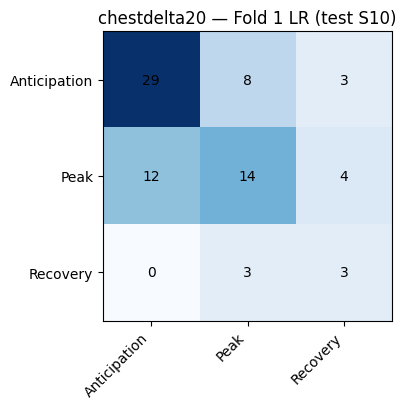

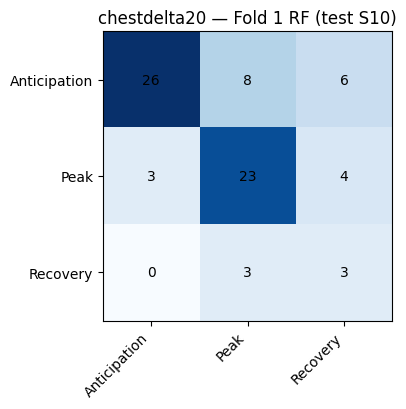

SHAP failed: only integer scalar arrays can be converted to a scalar index


<Figure size 600x500 with 0 Axes>

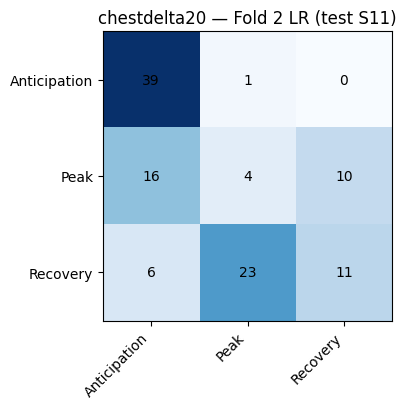

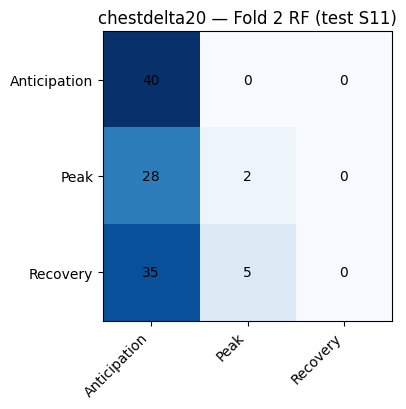

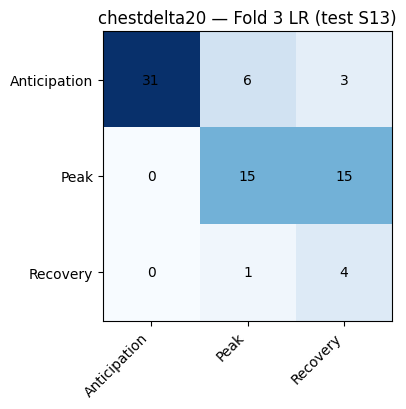

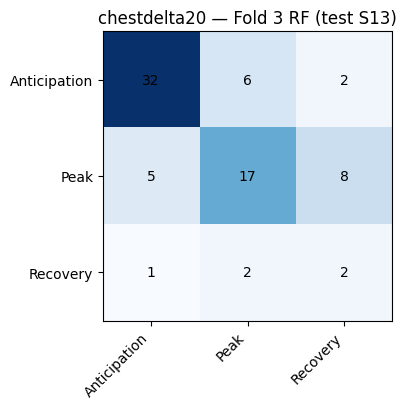

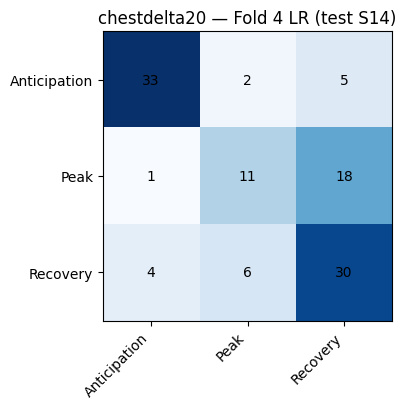

...

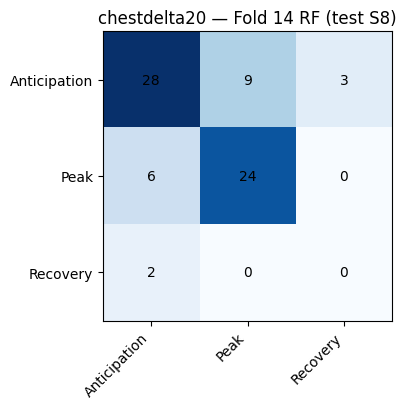

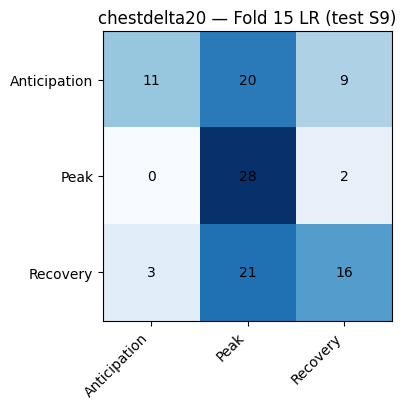

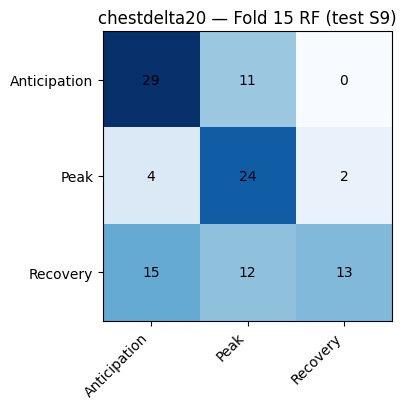

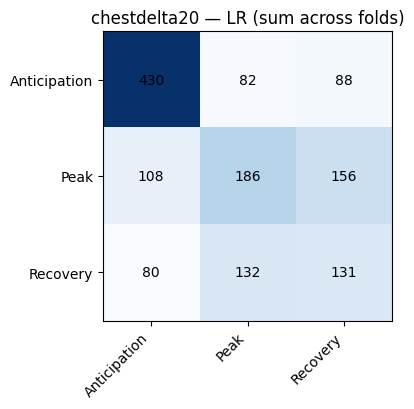

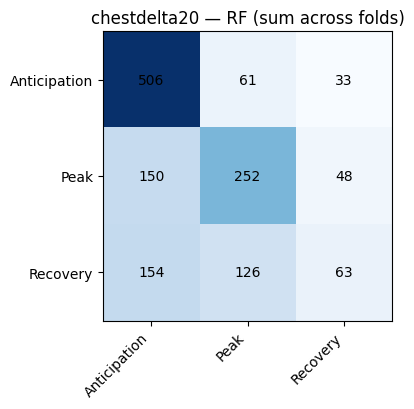


Saved metrics for chestdelta20 to: /content/wesad/eval/chestdelta20/baseline_metrics.csv
            acc  f1_macro
model                    
LR     0.538469  0.480556
RF     0.602959  0.508160


In [ ]:
import os, json, numpy as np, pandas as pd, matplotlib.pyplot as plt
from pathlib import Path
from collections import Counter
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (accuracy_score, f1_score, confusion_matrix,
                             classification_report)

# Optional SHAP (for P12)
try:
    import shap
except Exception:
    import importlib
    try:
        import shap
    except Exception:
        shap = None

proj = Path("/content/wesad")
eval_dir = proj/"eval"
reports_dir = proj/"reports"
eval_dir.mkdir(parents=True, exist_ok=True)
reports_dir.mkdir(parents=True, exist_ok=True)

#Robust scaler (median/IQR), leak-safe each fold
class RobustZScaler(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        self.median_ = np.median(X, axis=0)
        q75 = np.percentile(X, 75, axis=0)
        q25 = np.percentile(X, 25, axis=0)
        self.iqr_ = q75 - q25
        self.iqr_[self.iqr_ == 0] = 1.0
        return self
    def transform(self, X):
        return (X - self.median_) / self.iqr_

# ---------- Helpers ----------
def agg_flat_stats(X3):
    """(N, T=60, F) -> (N, 5F) concat of mean,std,min,max,delta(last-first)."""
    mean = X3.mean(axis=1)                          # (N, F)
    std  = X3.std(axis=1, ddof=1)                   # (N, F)
    mn   = X3.min(axis=1)                           # (N, F)
    mx   = X3.max(axis=1)                           # (N, F)
    delta= X3[:, -1, :] - X3[:, 0, :]               # (N, F)
    return np.concatenate([mean, std, mn, mx, delta], axis=1)

def load_npz_folder(win_dir: Path):
    files = sorted([p for p in win_dir.glob("S*.npz") if p.is_file()])
    assert files, f"No NPZ windows found in {win_dir}"
    subjects = [p.stem for p in files]
    return subjects, files

def load_npz(win_dir: Path, sid: str):
    data = np.load(win_dir/f"{sid}.npz", allow_pickle=True)
    return data["X"], data["y"], data["labels"].tolist(), data["feat_names"].tolist()

def build_loso(subjects):
    folds = []
    for test_sid in subjects:
        folds.append({"test_subject": test_sid,
                      "train_subjects": [s for s in subjects if s != test_sid]})
    return folds

def maybe_load_loso_json(cfg_path: Path, subjects_from_dir):
    if cfg_path.exists():
        with open(cfg_path, "r") as fh:
            plan = json.load(fh)
        subs = plan.get("subjects", subjects_from_dir)
        folds = plan.get("folds", build_loso(subs))
        return subs, folds
    else:
        return subjects_from_dir, build_loso(subjects_from_dir)

def save_confusion(cm, labels, title, out_png):
    plt.figure(figsize=(4.8,4.2))
    plt.imshow(cm, cmap="Blues")
    plt.title(title)
    plt.xticks(range(len(labels)), labels, rotation=45, ha="right")
    plt.yticks(range(len(labels)), labels)
    for r in range(cm.shape[0]):
        for c in range(cm.shape[1]):
            plt.text(c, r, int(cm[r,c]), ha="center", va="center")
    plt.tight_layout()
    plt.savefig(out_png, dpi=150, bbox_inches="tight"); plt.show()

def shap_global_bar_rf(rf: RandomForestClassifier, feature_names, X_back, out_png, topk=20):
    if shap is None:
        print(" SHAP not installed; skipping P12.")
        return
    try:
        explainer = shap.TreeExplainer(rf)
        n_bg = min(2000, X_back.shape[0])
        idx = np.random.choice(X_back.shape[0], size=n_bg, replace=False)
        shap_vals = explainer.shap_values(X_back[idx])
        if isinstance(shap_vals, list):
            sv = np.mean([np.abs(sv_) for sv_ in shap_vals], axis=0)  # (n_bg, F)
        else:
            sv = np.abs(shap_vals)  # (n_bg, F)
        imp = sv.mean(axis=0)
        order = np.argsort(imp)[::-1][:topk]
        plt.figure(figsize=(6, max(3, topk*0.25)))
        plt.barh([feature_names[i] for i in order][::-1], imp[order][::-1])
        plt.xlabel("Mean |SHAP|")
        plt.title("P12: RF SHAP global importance")
        plt.tight_layout(); plt.savefig(out_png, dpi=150, bbox_inches="tight"); plt.show()
    except Exception as e:
        print("SHAP failed:", e)

# Main runner for a given TRACK
def run_baseline_for_track(track_key: str,
                           win_dir: Path,
                           cfg_json: Path = None):
    """
    CHEST multiclass baseline
    """
    if not win_dir.exists():
        print(f"Track folder not found: {win_dir} (skip)")
        return None

    subjects, _ = load_npz_folder(win_dir)
    if cfg_json is None:
        cfg_json = proj/"configs"/f"loso_{track_key}.json"
    subjects, folds = maybe_load_loso_json(cfg_json, subjects)

    # Load one file to get labels and feature names
    X_tmp, y_tmp, class_names, feat_names = load_npz(win_dir, subjects[0])

    # storage
    rows = []
    cm_sum_LR = np.zeros((len(class_names), len(class_names)), dtype=int)
    cm_sum_RF = np.zeros_like(cm_sum_LR)

    # LOSO loop
    for i, fold in enumerate(folds, 1):
        test_sid = fold["test_subject"]
        train_sids = fold["train_subjects"]

        # Stack train
        Xtr_list, ytr_list = [], []
        for sid in train_sids:
            X, y, _, _ = load_npz(win_dir, sid)
            Xtr_list.append(agg_flat_stats(X))
            ytr_list.append(y)
        Xtr = np.vstack(Xtr_list); ytr = np.concatenate(ytr_list)

        # Test
        Xte3, yte, _, _ = load_npz(win_dir, test_sid)
        Xte = agg_flat_stats(Xte3)

        # Robust scaling (fit on train only)
        scaler = RobustZScaler().fit(Xtr)
        Xtr_s = scaler.transform(Xtr)
        Xte_s = scaler.transform(Xte)

        # ----- Models
        LR = LogisticRegression(max_iter=2000, class_weight="balanced")
        RF = RandomForestClassifier(
            n_estimators=400, class_weight="balanced_subsample",
            random_state=42, n_jobs=-1
        )

        # Fit
        LR.fit(Xtr_s, ytr)
        RF.fit(Xtr_s, ytr)

        # Predict
        yhat_LR = LR.predict(Xte_s)
        yhat_RF = RF.predict(Xte_s)

        # Metrics (multiclass)
        acc_LR = accuracy_score(yte, yhat_LR)
        acc_RF = accuracy_score(yte, yhat_RF)
        f1m_LR = f1_score(yte, yhat_LR, average="macro")
        f1m_RF = f1_score(yte, yhat_RF, average="macro")

        # Confusion matrices (P10)
        cm_LR = confusion_matrix(yte, yhat_LR, labels=range(len(class_names)))
        cm_RF = confusion_matrix(yte, yhat_RF, labels=range(len(class_names)))
        cm_sum_LR += cm_LR
        cm_sum_RF += cm_RF
        save_confusion(cm_LR, class_names, f"{track_key} — Fold {i} LR (test {test_sid})",
                       reports_dir/f"P10_CM_{track_key}_LR_fold{i:02d}_{test_sid}.png")
        save_confusion(cm_RF, class_names, f"{track_key} — Fold {i} RF (test {test_sid})",
                       reports_dir/f"P10_CM_{track_key}_RF_fold{i:02d}_{test_sid}.png")

        # Store
        rows += [
            {"track": track_key, "fold": i, "test_subject": test_sid,
             "model": "LR", "acc": acc_LR, "f1_macro": f1m_LR},
            {"track": track_key, "fold": i, "test_subject": test_sid,
             "model": "RF", "acc": acc_RF, "f1_macro": f1m_RF},
        ]

        # SHAP (P12) once per track to save time — use first fold's train
        if i == 1:
            shap_png = reports_dir/f"P12_SHAP_{track_key}_RF.png"
            shap_global_bar_rf(
                RF,
                [f"μ_{n}" for n in feat_names] + [f"σ_{n}" for n in feat_names] +
                [f"min_{n}" for n in feat_names] + [f"max_{n}" for n in feat_names] +
                [f"Δ_{n}" for n in feat_names],
                Xtr_s, shap_png, topk=20
            )

    # Save averaged confusion matrices
    save_confusion(cm_sum_LR, class_names, f"{track_key} — LR (sum across folds)",
                   reports_dir/f"P10_CM_{track_key}_LR_SUM.png")
    save_confusion(cm_sum_RF, class_names, f"{track_key} — RF (sum across folds)",
                   reports_dir/f"P10_CM_{track_key}_RF_SUM.png")

    # Metrics CSV
    df_metrics = pd.DataFrame(rows)
    out_csv = eval_dir/track_key/"baseline_metrics.csv"
    out_csv.parent.mkdir(parents=True, exist_ok=True)
    df_metrics.to_csv(out_csv, index=False)
    print(f"\nSaved metrics for {track_key} to:", out_csv)
    print(df_metrics.groupby("model")[["acc","f1_macro"]].mean())

    return df_metrics

# -------- Run CHEST (multiclass) --------
CHEST_TRACK = "chestdelta20"
chest_dir = proj/"features"/"windows"/CHEST_TRACK
chest_cfg = proj/"configs"/f"loso_{CHEST_TRACK}.json"  # created in Step 11
df_chest = run_baseline_for_track(CHEST_TRACK, chest_dir, chest_cfg)



In [ ]:
from pathlib import Path

# set project root to the correct Drive folder
proj = Path("/content/drive/MyDrive/colab_checkpoints/wesad")

# verify
print("Project path:", proj)
print("Features path:", proj/"features"/"windows")


Project path: /content/drive/MyDrive/colab_checkpoints/wesad
Features path: /content/drive/MyDrive/colab_checkpoints/wesad/features/windows


BILSTM BASELINE

BiLSTM baseline (CHEST ONLY, NPZ per subject, LOSO) + cuDNN-safe attributions
 Expects: /content/wesad/features/windows/chest∆20/Sxx.npz  with arrays: X (N,T,F), y (N,), labels, feat_names
 Saves:
 /content/wesad/eval/chestdelta20/fold_##/P13_training_loss.png
 /content/wesad/eval/chestdelta20/fold_##/P13_training_f1.png
  /content/wesad/eval/chestdelta20/fold_##/P14_attr_heatmaps/*.png
  /content/wesad/eval/chest∆20/bilstm_loso_summary.csv (+ per-fold F1 bar)
  /content/wesad/models/chestdelta20/fold_##/bilstm.pt

In [ ]:
import os, json, random, csv, glob
from dataclasses import dataclass
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score
from sklearn.utils.class_weight import compute_class_weight

# Captum (Integrated Gradients) for attributions
try:
    from captum.attr import IntegratedGradients
    HAVE_CAPTUM = True
except Exception:
    HAVE_CAPTUM = False

In [ ]:
# Configuration

@dataclass
class Config:
    proj_root: Path = Path("/content/wesad")
    chest_track: str = "chestdelta20"
    seed: int = 42

    # training
    batch_size: int = 64
    lr: float = 1e-3
    weight_decay: float = 1e-4
    max_epochs: int = 80
    patience: int = 10
    num_workers: int = 2

    # model
    hidden_size: int = 128
    num_layers: int = 2
    dropout: float = 0.3
    bidirectional: bool = True

cfg = Config()

def set_seed(seed=42):
    random.seed(seed); np.random.seed(seed)
    torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(cfg.seed)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

Device: cuda


In [ ]:
# IO helpers (NPZ per-subject like S2.npz, S3.npz...)

feat_dir = cfg.proj_root / "features" / "windows" / cfg.chest_track
eval_root = cfg.proj_root / "eval" / cfg.chest_track
model_root = cfg.proj_root / "models" / cfg.chest_track
for d in [eval_root, model_root]:
    d.mkdir(parents=True, exist_ok=True)

def load_npz_folder(win_dir: Path):
    files = sorted([p for p in win_dir.glob("S*.npz") if p.is_file()])
    assert files, f"No NPZ windows found in {win_dir}"
    subjects = [p.stem for p in files]  # ['S2','S3',...]
    return subjects

def load_npz(win_dir: Path, sid: str):
    data = np.load(win_dir/f"{sid}.npz", allow_pickle=True)
    X = data["X"]         # (N,T,F)
    y = data["y"]         # (N,)
    labels = data["labels"].tolist()
    feat_names = data["feat_names"].tolist()
    return X, y.astype(int), labels, feat_names

def build_or_load_loso(track_key: str, win_dir: Path):
    cfg_path = cfg.proj_root / "configs" / f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg_path.exists():
        with open(cfg_path, "r") as fh:
            plan = json.load(fh)
        subjects = plan.get("subjects", subs)
        folds = plan.get("folds", [{"test_subject": s, "train_subjects": [t for t in subjects if t!=s]} for s in subjects])
        # Allow optional "val_subjects" in file; if missing we’ll derive below
        return subjects, folds, cfg_path
    # else: auto-build LOSO and choose a single validation subject per fold from the train set
    folds = []
    for s in subs:
        train = [t for t in subs if t != s]
        val = [train[0]] if train else []
        train2 = [t for t in train if t not in val]
        folds.append({"test_subject": s, "train_subjects": train2, "val_subjects": val})
    os.makedirs(cfg_path.parent, exist_ok=True)
    with open(cfg_path, "w") as fh:
        json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg_path


In [ ]:
# Dataset & Model

class SeqDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.from_numpy(X).float()
        self.y = torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self, i): return self.X[i], self.y[i]

class BiLSTMClassifier(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, num_classes, bidirectional=True, dropout=0.3):
        super().__init__()
        self.bidirectional = bidirectional
        self.lstm = nn.LSTM(
            input_size=input_size, hidden_size=hidden_size, num_layers=num_layers,
            batch_first=True, bidirectional=bidirectional,
            dropout=dropout if num_layers > 1 else 0.0
        )
        out_dim = hidden_size * (2 if bidirectional else 1)
        self.drop = nn.Dropout(dropout)
        self.head = nn.Linear(out_dim, num_classes)
    def forward(self, x):  # x: [B,T,F]
        out, (hn, cn) = self.lstm(x)
        last = torch.cat((hn[-2], hn[-1]), dim=1) if self.bidirectional else hn[-1]
        return self.head(self.drop(last))


In [ ]:
# Training utils

def fit_scaler_on_train(Xtr):  # Xtr: (N,T,F)
    sc = StandardScaler(with_mean=True, with_std=True)
    sc.fit(Xtr.reshape(-1, Xtr.shape[-1]))
    return sc

def apply_scaler(sc, X):
    N,T,F = X.shape
    return sc.transform(X.reshape(-1, F)).reshape(N,T,F)

def run_epoch(model, loader, criterion, optimizer=None):
    train = optimizer is not None
    model.train() if train else model.eval()
    total = 0.0; ys=[]; ps=[]
    for xb, yb in loader:
        xb, yb = xb.to(device), yb.to(device)
        if train: optimizer.zero_grad(set_to_none=True)
        with torch.set_grad_enabled(train):
            logits = model(xb)
            loss = criterion(logits, yb)
            if train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 5.0)
                optimizer.step()
        total += loss.item()*xb.size(0)
        ps.extend(torch.argmax(logits,1).detach().cpu().numpy()); ys.extend(yb.detach().cpu().numpy())
    return total/len(loader.dataset), f1_score(ys, ps, average="macro")

def save_p13_plots(history, p_loss, p_f1, title=""):
    ep, trL, trF, vaL, vaF = zip(*history)
    plt.figure(figsize=(7,5)); plt.plot(ep, trL, label="Train Loss"); plt.plot(ep, vaL, label="Val Loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title(f"{title} P13: Train/Val Loss")
    plt.legend(); plt.tight_layout(); plt.savefig(p_loss, dpi=200); plt.close()

    plt.figure(figsize=(7,5)); plt.plot(ep, trF, label="Train Macro-F1"); plt.plot(ep, vaF, label="Val Macro-F1")
    plt.xlabel("Epoch"); plt.ylabel("Macro-F1"); plt.title(f"{title} P13: Train/Val Macro-F1")
    plt.legend(); plt.tight_layout(); plt.savefig(p_f1, dpi=200); plt.close()

In [ ]:
# cuDNN-safe attribution (fixes "cudnn RNN backward can only be called in training mode")

def attribution_map(model, x1):  # x1: [1,T,F] torch.float32
    """
    Tries eval-mode with cuDNN disabled (keeps dropout off). If that still errors,
    falls back to train-mode just for the backward pass, then restores the original mode.
    Uses predicted class as target for IG / Grad*Input.
    """
    was_training = model.training
    # ensure tensor on device with grad
    x1 = x1.to(device)
    x1.requires_grad_(True)

    def _target_pred():
        with torch.no_grad():
            logits = model(x1)
            return int(torch.argmax(logits, dim=1).item())

    def _compute_attr(target_idx):
        if HAVE_CAPTUM:
            ig = IntegratedGradients(model)
            A = ig.attribute(x1, baselines=torch.zeros_like(x1), target=target_idx)
            return A.detach().cpu().numpy()[0]
        else:
            logits = model(x1)
            tgt = torch.tensor([target_idx], device=logits.device)
            loss = nn.CrossEntropyLoss()(logits, tgt)
            model.zero_grad(set_to_none=True)
            loss.backward()
            return (x1.grad * x1).detach().cpu().numpy()[0]

    try:
        # Try eval-mode with cuDNN disabled
        with torch.backends.cudnn.flags(enabled=False):
            model.train(False)  # eval
            target_idx = _target_pred()
            A = _compute_attr(target_idx)
    except RuntimeError as e:
        print("[attr] Falling back to train-mode attribution due to:", str(e))
        # Train mode (some cuDNN RNNs need this for backward)
        model.train(True)
        target_idx = _target_pred()
        A = _compute_attr(target_idx)
    finally:
        # Restore original mode
        model.train(was_training)

    return np.abs(A)

def save_attr_heatmap(A, title, path_png):
    plt.figure(figsize=(8,4.5))
    plt.imshow(A.T, aspect="auto", origin="lower")
    plt.colorbar(label="|Attribution|"); plt.xlabel("Time step"); plt.ylabel("Feature")
    plt.title(title); plt.tight_layout(); plt.savefig(path_png, dpi=220); plt.close()


In [ ]:
# LOSO run
from sklearn.metrics import accuracy_score

def train_loso_bilstm():
    subjects = load_npz_folder(feat_dir)
    # For feature names + classes
    X0, y0, class_names, feat_names = load_npz(feat_dir, subjects[0])
    num_classes = len(set(y0.tolist()))
    print(f"[data] Found {len(subjects)} subjects; example X shape={X0.shape}, classes={num_classes}")

    subjects, folds, cfg_path = build_or_load_loso(cfg.chest_track, feat_dir)
    print("[loso] Using config:", cfg_path)

    results = []
    for k, fold in enumerate(folds, start=1):
        test_sid = fold.get("test_subject")
        train_sids = fold.get("train_subjects", [])
        val_sids = fold.get("val_subjects", [train_sids[0] if train_sids else None])

        print(f"\n=== Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)} ===")

        # Build sets
        def stack_subjects(sids):
            Xs, ys = [], []
            for s in sids:
                if s is None:
                    continue
                X, y, _, _ = load_npz(feat_dir, s)
                Xs.append(X); ys.append(y)
            return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

        # Separate validation subject(s) out of train
        train_only = [s for s in train_sids if s not in val_sids]
        Xtr, ytr = stack_subjects(train_only)
        Xva, yva = stack_subjects(val_sids)
        Xte, yte, _, _ = load_npz(feat_dir, test_sid)

        # Fit scaler on train only
        sc = fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

        # DataLoaders
        dl_tr = DataLoader(SeqDataset(Xtr_s,ytr), batch_size=cfg.batch_size, shuffle=True,  num_workers=cfg.num_workers, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s,yva), batch_size=cfg.batch_size, shuffle=False, num_workers=cfg.num_workers, pin_memory=True)
        dl_te = DataLoader(SeqDataset(Xte_s,yte), batch_size=cfg.batch_size, shuffle=False, num_workers=cfg.num_workers, pin_memory=True)

        # Model & training objects
        T, F = Xtr.shape[1], Xtr.shape[2]
        ncls = int(max(np.max(ytr), np.max(yva), np.max(yte))) + 1
        model = BiLSTMClassifier(F, cfg.hidden_size, cfg.num_layers, ncls, cfg.bidirectional, cfg.dropout).to(device)

        cw = compute_class_weight(class_weight="balanced", classes=np.arange(ncls), y=ytr)
        criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device))
        optimizer = torch.optim.Adam(model.parameters(), lr=cfg.lr, weight_decay=cfg.weight_decay)

        # Paths
        out_dir  = eval_root / f"fold_{k:02d}"
        ckpt_dir = model_root / f"fold_{k:02d}"
        out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)
        log_csv  = out_dir / "bilstm_training.csv"
        ckpt     = ckpt_dir / "bilstm.pt"
        p13_loss = out_dir / "P13_training_loss.png"
        p13_f1   = out_dir / "P13_training_f1.png"
        p14_dir  = out_dir / "P14_attr_heatmaps"; p14_dir.mkdir(parents=True, exist_ok=True)

        # Train loop w/ early stopping on val macro-F1
        best_f1 = -1.0; noimp = 0; history=[]
        with open(log_csv, "w", newline="") as f:
            csv.writer(f).writerow(["epoch","train_loss","train_f1_macro","val_loss","val_f1_macro"])

        for ep in range(1, cfg.max_epochs+1):
            trL, trF = run_epoch(model, dl_tr, criterion, optimizer)
            vaL, vaF = run_epoch(model, dl_va, criterion, None)
            history.append((ep, trL, trF, vaL, vaF))
            with open(log_csv, "a", newline="") as f:
                csv.writer(f).writerow([ep, f"{trL:.6f}", f"{trF:.6f}", f"{vaL:.6f}", f"{vaF:.6f}"])
            if vaF > best_f1 + 1e-6:
                best_f1 = vaF; noimp = 0; torch.save(model.state_dict(), ckpt)
            else:
                noimp += 1
                if noimp >= cfg.patience:
                    print(f"[early stop] epoch {ep}, best val F1={best_f1:.4f}")
                    break

        # -------- Load best & TEST (now also ACC) --------
        import pandas as pd
        model.load_state_dict(torch.load(ckpt, map_location=device))
        model.eval()

        all_gt, all_pred = [], []
        with torch.no_grad():
            for xb, yb in dl_te:
                xb = xb.to(device)
                logits = model(xb)
                preds = torch.argmax(logits, 1).cpu().numpy().tolist()
                all_pred.extend(preds)
                all_gt.extend(yb.numpy().tolist())

        teF = f1_score(all_gt, all_pred, average="macro")
        teA = accuracy_score(all_gt, all_pred)
        print(f"[fold {k:02d}] TEST acc={teA:.4f} | macro-F1={teF:.4f}")

        # save per-fold predictions
        pd.DataFrame({"gt": all_gt, "pred": all_pred}).to_csv(out_dir/"test_preds.csv", index=False)

        # P13 plots
        save_p13_plots(history, p13_loss, p13_f1, title=f"Fold {k:02d}")

        # P14 heatmaps
        for c in np.unique(yte):
            idxs = np.where(yte==c)[0][:2]
            for j in idxs:
                x1 = torch.from_numpy(Xte_s[j:j+1]).float()
                A = attribution_map(model, x1)
                pred = torch.argmax(model(x1.to(device)),1).item()
                save_attr_heatmap(A, f"Fold {k:02d} — true={int(yte[j])}, pred={pred}",
                                  str(p14_dir / f"sample{j}_true{int(yte[j])}_pred{pred}.png"))

        # record both metrics
        results.append({
            "fold": k,
            "test_subject": test_sid,
            "acc": float(teA),
            "f1_macro": float(teF)
        })

    # Aggregate CSV + bar plot
    import pandas as pd
    df = pd.DataFrame(results)
    df.to_csv(eval_root / "bilstm_loso_summary.csv", index=False)
    plt.figure(figsize=(8,5))
    plt.bar(df["fold"], df["f1_macro"])
    plt.xlabel("Fold (held-out subject)"); plt.ylabel("Test Macro-F1")
    plt.title("BiLSTM — LOSO per-fold Test Macro-F1 (Chest)")
    plt.tight_layout(); plt.savefig(eval_root / "P13_test_f1_per_fold.png", dpi=220); plt.close()
    print("\n[LOSO] Saved summary to:", eval_root / "bilstm_loso_summary.csv")
    print(df.describe(include='all'))


In [ ]:
# Entry

assert feat_dir.exists(), f"Chest windows folder not found: {feat_dir}"
train_loso_bilstm()


[data] Found 15 subjects; example X shape=(76, 60, 14), classes=3
[loso] Using config: /content/wesad/configs/loso_chestdelta20.json

=== Fold 01 | test=S10 | val=['S11'] | train_n=14 ===
[early stop] epoch 12, best val F1=0.3927
[fold 01] TEST acc=0.6053 | macro-F1=0.4826

=== Fold 02 | test=S11 | val=['S10'] | train_n=14 ===
[early stop] epoch 29, best val F1=0.5949
[fold 02] TEST acc=0.4182 | macro-F1=0.2861

=== Fold 03 | test=S13 | val=['S10'] | train_n=14 ===
[early stop] epoch 19, best val F1=0.5858
[fold 03] TEST acc=0.6400 | macro-F1=0.5584

=== Fold 04 | test=S14 | val=['S10'] | train_n=14 ===
[early stop] epoch 20, best val F1=0.5526
[fold 04] TEST acc=0.6909 | macro-F1=0.6753

=== Fold 05 | test=S15 | val=['S10'] | train_n=14 ===
[early stop] epoch 19, best val F1=0.6121
[fold 05] TEST acc=0.2254 | macro-F1=0.2365

=== Fold 06 | test=S16 | val=['S10'] | train_n=14 ===
[early stop] epoch 18, best val F1=0.6250
[fold 06] TEST acc=0.5818 | macro-F1=0.5516

=== Fold 07 | test=S

In [ ]:
import shutil
from pathlib import Path

# source in current runtime
src = Path("/content/wesad/eval/chestdelta20/bilstm_loso_summary.csv")

# destination in Drive
dst = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20/bilstm_loso_summary.csv")
dst.parent.mkdir(parents=True, exist_ok=True)

if src.exists():
    shutil.copy(src, dst)
    print(f"[OK] Copied to Drive: {dst}")
else:
    print("[MISS] Source file not found:", src)


[MISS] Source file not found: /content/wesad/eval/chestdelta20/bilstm_loso_summary.csv


tuning baseline loso runs

In [ ]:
#  rotate validation subject per fold + ensure ≥2 classes in val/train ====
from pathlib import Path
import json, numpy as np

def _load_y_for_subject(sid):
    _, y, _, _ = load_npz(feat_dir, sid)
    return y

def _has_two_classes(y):
    return np.unique(y).size >= 2

def rebuild_loso_with_rotating_val(track_key: str, win_dir: Path):
    subs = load_npz_folder(win_dir)  # ['S2','S3',...]
    n = len(subs)
    folds = []
    # Round-robin: for fold i, test=subs[i], start val search at subs[(i+1) % n]
    for i, test_sid in enumerate(subs):
        # candidate order for val: next, next+1, ...
        cand_order = [subs[(i + 1 + k) % n] for k in range(n-1)]
        chosen_val = None


        y_test = _load_y_for_subject(test_sid)  # not strictly needed, but keeps parity
        for cand in cand_order:
            train_sids = [s for s in subs if s not in (test_sid, cand)]
            # check val classes
            y_val = _load_y_for_subject(cand)
            if not _has_two_classes(y_val):
                continue
            # check train classes (concat)
            y_train_list = [_load_y_for_subject(s) for s in train_sids]
            y_train_all = np.concatenate(y_train_list)
            if not _has_two_classes(y_train_all):
                continue
            chosen_val = cand
            break

        # fallback if none satisfied (rare): just pick the first candidate
        if chosen_val is None:
            chosen_val = cand_order[0]
            train_sids = [s for s in subs if s not in (test_sid, chosen_val)]
        else:
            train_sids = [s for s in subs if s not in (test_sid, chosen_val)]

        folds.append({
            "test_subject": test_sid,
            "train_subjects": train_sids,
            "val_subjects": [chosen_val]
        })

    cfg_path = cfg.proj_root / "configs" / f"loso_{track_key}.json"
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path, "w") as fh:
        json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    print("[loso] rebuilt with rotating validation:", cfg_path)
    return cfg_path

# 1) Rebuild LOSO with rotating/valid val subjects
_ = rebuild_loso_with_rotating_val(cfg.chest_track, feat_dir)

# 2)  Slightly sturdier hyperparams for stability
cfg.hidden_size = 192
cfg.dropout = 0.4
cfg.patience = 12
cfg.lr = 5e-4

# 3) Re-run training with the new LOSO (uses val_subjects from the JSON)
train_loso_bilstm()


[loso] rebuilt with rotating validation: /content/wesad/configs/loso_chestdelta20.json
[data] Found 15 subjects; example X shape=(76, 60, 14), classes=3
[loso] Using config: /content/wesad/configs/loso_chestdelta20.json

=== Fold 01 | test=S10 | val=['S11'] | train_n=13 ===
[early stop] epoch 18, best val F1=0.4738
[fold 01] TEST acc=0.5263 | macro-F1=0.4278

=== Fold 02 | test=S11 | val=['S13'] | train_n=13 ===
[early stop] epoch 13, best val F1=0.5503
[fold 02] TEST acc=0.3727 | macro-F1=0.2023

=== Fold 03 | test=S13 | val=['S14'] | train_n=13 ===
[early stop] epoch 17, best val F1=0.7414
[fold 03] TEST acc=0.5467 | macro-F1=0.4947

=== Fold 04 | test=S14 | val=['S15'] | train_n=13 ===
[early stop] epoch 13, best val F1=0.4452
[fold 04] TEST acc=0.7364 | macro-F1=0.7228

=== Fold 05 | test=S15 | val=['S16'] | train_n=13 ===
[early stop] epoch 15, best val F1=0.6830
[fold 05] TEST acc=0.2254 | macro-F1=0.2272

=== Fold 06 | test=S16 | val=['S17'] | train_n=13 ===
[early stop] epoch 1

In [ ]:
# If WeightedRandomSampler wasn't imported yet
import math, os, numpy as np, pandas as pd, matplotlib.pyplot as plt
import torch
from torch.utils.data import WeightedRandomSampler

In [ ]:


# 1) Fix the missing sampler
def make_weighted_sampler(y, n_classes):
    """
    Returns a WeightedRandomSampler that balances classes in y.
    y: 1D numpy array of class ids
    n_classes: total number of classes
    """
    y = np.asarray(y).astype(int)
    counts = np.bincount(y, minlength=n_classes)
    # avoid division by zero
    counts = np.clip(counts, 1, None)
    class_weights = 1.0 / counts
    sample_weights = class_weights[y]
    return WeightedRandomSampler(
        weights=torch.as_tensor(sample_weights, dtype=torch.float),
        num_samples=len(sample_weights),
        replacement=True
    )

In [ ]:
# 2) Helpers to grab logits on a dataloader
@torch.no_grad()
def collect_logits_and_labels(model, dl, device):
    model.eval()
    logits, labels = [], []
    for xb, yb in dl:
        xb = xb.to(device, non_blocking=True)
        out = model(xb)                # [B, C]
        logits.append(out.detach().cpu().numpy())
        labels.append(yb.numpy())
    return np.concatenate(logits, axis=0), np.concatenate(labels, axis=0)

In [ ]:
# 3) Cortisol mapping utilities
def softmax_to_pstress(logits, stress_class=1):
    """
    logits: [N, C] numpy array from the model before softmax
    stress_class: which class id corresponds to 'stress' (adjust if yours differs)
    returns: p_stress_raw in shape [N]
    """
    e = np.exp(logits - logits.max(axis=1, keepdims=True))
    probs = e / np.clip(e.sum(axis=1, keepdims=True), 1e-12, None)
    return probs[:, stress_class]

def ema(x, half_life_steps=10):
    """
    Exponential moving average with a given half-life in *steps* (windows).
    half_life_steps=10 means after 10 steps, a spike decays to 50%.
    """
    x = np.asarray(x, dtype=float)
    if len(x) == 0:
        return x
    # convert half-life to smoothing factor alpha
    # decay per step = 0.5 ** (1 / half_life_steps)
    alpha = 1.0 - math.pow(0.5, 1.0 / max(half_life_steps, 1))
    y = np.empty_like(x, dtype=float)
    y[0] = x[0]
    for i in range(1, len(x)):
        y[i] = (1 - alpha) * y[i-1] + alpha * x[i]
    return y

def pstress_to_cortisol(p_raw, p_lag, c_min=5.0, c_max=20.0, w=0.7):
    """
    blend raw & lagged p(stress) then map linearly to nmol/L.
    c_min/c_max are a typical salivary cortisol range; tweak if you’ve calibrated.
    w controls how much the lagged prob influences the value (0..1).
    """
    p_blend = w * p_lag + (1 - w) * p_raw
    p_blend = np.clip(p_blend, 0.0, 1.0)
    return c_min + (c_max - c_min) * p_blend


In [ ]:
# 4) Small helper to ensure dirs exist
def _ensure_dir(p):
    os.makedirs(p, exist_ok=True)
    return p

Last+mean pooling gives the model both terminal state info and global context.

Two validation subjects reduce variance in validation F1 and avoid single-class val issues.

Scheduler + early stop smooth training and help converge more reliably.

In [ ]:
# === v3: BiLSTM (last + mean pooling) + 2-val-subject LOSO, steadier training ===
import json, numpy as np, torch, matplotlib.pyplot as plt
import torch.nn as nn
from torch.utils.data import DataLoader
from sklearn.metrics import f1_score
from sklearn.utils.class_weight import compute_class_weight

In [ ]:
# --- Model: last + mean pooled BiLSTM ---
class BiLSTMConcatPool(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, num_classes, bidirectional=True, dropout=0.35):
        super().__init__()
        self.bidirectional = bidirectional
        self.lstm = nn.LSTM(
            input_size=input_size, hidden_size=hidden_size, num_layers=num_layers,
            batch_first=True, bidirectional=bidirectional,
            dropout=dropout if num_layers > 1 else 0.0
        )
        d = hidden_size * (2 if bidirectional else 1)
        self.drop = nn.Dropout(dropout)
        self.head = nn.Linear(d*2, num_classes)  # concat(last, mean)

    def forward(self, x):                # x: [B,T,F]
        out, (hn, _) = self.lstm(x)      # out: [B,T,D], hn: [L*D,B,H]
        last = torch.cat((hn[-2], hn[-1]), dim=1) if self.bidirectional else hn[-1]   # [B,D]
        mean = out.mean(dim=1)                                                           # [B,D]
        feat = torch.cat([last, mean], dim=1)                                            # [B,2D]
        return self.head(self.drop(feat))

In [ ]:
# --- rotate TWO validation subjects per fold (ensures ≥2 classes) ---
def rebuild_loso_two_val(track_key: str, win_dir: Path):
    subs = load_npz_folder(win_dir)
    n = len(subs)
    folds = []
    def _has_two(y): return np.unique(y).size >= 2
    ys = {s: load_npz(win_dir, s)[1] for s in subs}  # cache labels

    for i, test_sid in enumerate(subs):
        # candidate cycle for validation
        cands = [subs[(i+1+k) % n] for k in range(n-1)]
        chosen = []
        for cand in cands:
            if cand == test_sid or cand in chosen:
                continue
            # temp chosen + check constraints
            tmp_val = chosen + [cand]
            train = [s for s in subs if s not in ([test_sid] + tmp_val)]
            y_val_all = np.concatenate([ys[s] for s in tmp_val])
            y_train_all = np.concatenate([ys[s] for s in train])
            if _has_two(y_val_all) and _has_two(y_train_all):
                chosen = tmp_val
            if len(chosen) == 2:
                break
        if len(chosen) < 2:
            # fallback: just take next two non-test
            chosen = cands[:2]
        train = [s for s in subs if s not in ([test_sid] + chosen)]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": chosen})

    cfg_path = cfg.proj_root / "configs" / f"loso_{track_key}.json"
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path, "w") as fh:
        json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    print("[v3 loso] Rebuilt with TWO rotating val subjects:", cfg_path)
    return cfg_path

In [ ]:


# --- training loop (shuffle train; class-weighted CE; plateau LR) ---
def run_epoch(model, loader, criterion, optimizer=None):
    train = optimizer is not None
    model.train() if train else model.eval()
    tot=0.0; ys=[]; ps=[]
    for xb, yb in loader:
        xb, yb = xb.to(device), yb.to(device)
        if train: optimizer.zero_grad(set_to_none=True)
        with torch.set_grad_enabled(train):
            logits = model(xb)
            loss = criterion(logits, yb)
            if train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 5.0)
                optimizer.step()
        tot += loss.item()*xb.size(0)
        ps.extend(torch.argmax(logits,1).detach().cpu().numpy()); ys.extend(yb.detach().cpu().numpy())
    return tot/len(loader.dataset), f1_score(ys, ps, average="macro")

def train_loso_bilstm_v3():
    subjects = load_npz_folder(feat_dir)
    X0, y0, class_names, feat_names = load_npz(feat_dir, subjects[0])
    n_classes = int(np.max(y0)) + 1
    print(f"[v3] subjects={len(subjects)}, example X={X0.shape}, classes={n_classes}")

    # rebuild LOSO with 2-val subjects
    _ = rebuild_loso_two_val(cfg.chest_track, feat_dir)
    subjects, folds, cfg_path = build_or_load_loso(cfg.chest_track, feat_dir)
    print("[v3] Using LOSO config:", cfg_path)

    # hyperparams (steadier)
    cfg.hidden_size = 160
    cfg.dropout     = 0.35
    cfg.lr          = 8e-4
    cfg.patience    = 12
    cfg.max_epochs  = max(cfg.max_epochs, 80)

    import csv, pandas as pd
    results=[]

    for k, fold in enumerate(folds, start=1):
        test_sid = fold["test_subject"]
        val_sids = fold.get("val_subjects", [])
        train_sids = fold["train_subjects"]

        print(f"\n=== [v3] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)} ===")

        def stack(sids):
            Xs, ys = [], []
            for s in sids:
                X, y, _, _ = load_npz(feat_dir, s)
                Xs.append(X); ys.append(y)
            return np.concatenate(Xs), np.concatenate(ys)

        Xtr, ytr = stack(train_sids)
        Xva, yva = stack(val_sids)
        Xte, yte, _, _ = load_npz(feat_dir, test_sid)

        # scale on train only
        sc = fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

        # loaders (plain shuffle; no sampler)
        dl_tr = DataLoader(SeqDataset(Xtr_s, ytr), batch_size=cfg.batch_size, shuffle=True,
                           num_workers=cfg.num_workers, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=cfg.batch_size, shuffle=False,
                           num_workers=cfg.num_workers, pin_memory=True)
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=cfg.batch_size, shuffle=False,
                           num_workers=cfg.num_workers, pin_memory=True)

        # model & training objects
        T, F = Xtr.shape[1], Xtr.shape[2]
        ncls = int(max(np.max(ytr), np.max(yva), np.max(yte))) + 1
        model = BiLSTMConcatPool(F, cfg.hidden_size, cfg.num_layers, ncls, cfg.bidirectional, cfg.dropout).to(device)
        cw = compute_class_weight("balanced", classes=np.arange(ncls), y=ytr)
        criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device))
        optimizer = torch.optim.Adam(model.parameters(), lr=cfg.lr, weight_decay=cfg.weight_decay)
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=3, min_lr=1e-5)

        # paths
        out_dir  = eval_root / f"fold_{k:02d}"
        ckpt_dir = model_root / f"fold_{k:02d}"
        out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)
        log_csv  = out_dir / "bilstm_training_v3.csv"
        ckpt     = ckpt_dir / "bilstm_v3.pt"
        p13_loss = out_dir / "P13_training_loss_v3.png"
        p13_f1   = out_dir / "P13_training_f1_v3.png"
        p14_dir  = out_dir / "P14_attr_heatmaps_v3"; p14_dir.mkdir(parents=True, exist_ok=True)

        # train
        best_f1=-1.0; noimp=0; hist=[]
        with open(log_csv,"w",newline="") as f:
            csv.writer(f).writerow(["epoch","train_loss","train_f1_macro","val_loss","val_f1_macro","lr"])
        for ep in range(1, cfg.max_epochs+1):
            trL, trF = run_epoch(model, dl_tr, criterion, optimizer)
            vaL, vaF = run_epoch(model, dl_va, criterion, None)
            scheduler.step(vaF)
            hist.append((ep,trL,trF,vaL,vaF))
            with open(log_csv,"a",newline="") as f:
                csv.writer(f).writerow([ep,f"{trL:.6f}",f"{trF:.6f}",f"{vaL:.6f}",f"{vaF:.6f}",optimizer.param_groups[0]["lr"]])
            if vaF > best_f1 + 1e-6:
                best_f1=vaF; noimp=0; torch.save(model.state_dict(), ckpt)
            else:
                noimp+=1
                if noimp >= cfg.patience:
                    print(f"[v3 early stop] epoch {ep}, best val F1={best_f1:.4f}")
                    break

        # test
        model.load_state_dict(torch.load(ckpt, map_location=device))
        teL, teF = run_epoch(model, dl_te, criterion, None)
        print(f"[v3 fold {k:02d}] TEST macro-F1={teF:.4f}")

        # plots (P13)
        epv, trL, trF, vaL, vaF = zip(*hist)
        plt.figure(figsize=(7,5)); plt.plot(epv, trL, label="Train Loss"); plt.plot(epv, vaL, label="Val Loss")
        plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title(f"Fold {k:02d} — P13 Loss (v3)")
        plt.legend(); plt.tight_layout(); plt.savefig(p13_loss, dpi=200); plt.close()
        plt.figure(figsize=(7,5)); plt.plot(epv, trF, label="Train Macro-F1"); plt.plot(epv, vaF, label="Val Macro-F1")
        plt.xlabel("Epoch"); plt.ylabel("Macro-F1"); plt.title(f"Fold {k:02d} — P13 Macro-F1 (v3)")
        plt.legend(); plt.tight_layout(); plt.savefig(p13_f1, dpi=200); plt.close()

        # P14 heatmaps (reuse cuDNN-safe attribution_map defined earlier)
        for c in np.unique(yte):
            idxs = np.where(yte==c)[0][:2]
            for j in idxs:
                x1 = torch.from_numpy(Xte_s[j:j+1]).float()
                A = attribution_map(model, x1)
                pred = torch.argmax(model(x1.to(device)),1).item()
                plt.figure(figsize=(8,4.5))
                plt.imshow(np.abs(A).T, aspect="auto", origin="lower")
                plt.colorbar(label="|Attribution|"); plt.xlabel("Time step"); plt.ylabel("Feature")
                plt.title(f"Fold {k:02d} — true={int(yte[j])}, pred={pred}")
                plt.tight_layout(); plt.savefig(str(p14_dir / f"sample{j}_true{int(yte[j])}_pred{pred}.png"), dpi=220); plt.close()

        results.append({"fold": k, "test_f1_macro": float(teF)})

    # summary
    import pandas as pd
    df = pd.DataFrame(results)
    df.to_csv(eval_root / "bilstm_loso_summary_v3.csv", index=False)
    plt.figure(figsize=(8,5))
    plt.bar(df["fold"], df["test_f1_macro"])
    plt.xlabel("Fold (held-out subject)"); plt.ylabel("Test Macro-F1")
    plt.title("BiLSTM (last+mean pool) — LOSO per-fold Test Macro-F1 (Chest)")
    plt.tight_layout(); plt.savefig(eval_root / "P13_test_f1_per_fold_v3.png", dpi=220); plt.close()
    print("\n[v3 LOSO] Saved summary to:", eval_root / "bilstm_loso_summary_v3.csv")
    print(df.describe(include='all'))

# run v3
train_loso_bilstm_v3()


[v3] subjects=15, example X=(76, 60, 14), classes=3
[v3 loso] Rebuilt with TWO rotating val subjects: /content/wesad/configs/loso_chestdelta20.json
[v3] Using LOSO config: /content/wesad/configs/loso_chestdelta20.json

=== [v3] Fold 01 | test=S10 | val=['S11', 'S13'] | train_n=12 ===
[v3 early stop] epoch 20, best val F1=0.4555
[v3 fold 01] TEST macro-F1=0.4437

=== [v3] Fold 02 | test=S11 | val=['S13', 'S14'] | train_n=12 ===
[v3 early stop] epoch 14, best val F1=0.7041
[v3 fold 02] TEST macro-F1=0.2947

=== [v3] Fold 03 | test=S13 | val=['S14', 'S15'] | train_n=12 ===
[v3 early stop] epoch 13, best val F1=0.5874
[v3 fold 03] TEST macro-F1=0.6466

=== [v3] Fold 04 | test=S14 | val=['S15', 'S16'] | train_n=12 ===
[v3 early stop] epoch 13, best val F1=0.6164
[v3 fold 04] TEST macro-F1=0.7613

=== [v3] Fold 05 | test=S15 | val=['S16', 'S17'] | train_n=12 ===
[v3 early stop] epoch 13, best val F1=0.6966
[v3 fold 05] TEST macro-F1=0.4026

=== [v3] Fold 06 | test=S16 | val=['S17', 'S2'] | t

In [ ]:
# === Minimal, compatible definitions to unblock training ===
import torch, torch.nn as nn, torch.nn.functional as F
from torch.utils.data import Dataset


In [ ]:
# 1) SeqDataset (only defined if missing)
if "SeqDataset" not in globals():
    class SeqDataset(Dataset):
        def __init__(self, X, y):
            self.X = X
            self.y = y
        def __len__(self):
            return len(self.y)
        def __getitem__(self, idx):
            x = torch.from_numpy(self.X[idx]).float()   # shape [T, F]
            y = int(self.y[idx])
            return x, y

In [ ]:
# 2) AttentionBiLSTMClassifier (only defined if missing)
if "AttentionBiLSTMClassifier" not in globals():
    class AttentionBiLSTMClassifier(nn.Module):
        """
        BiLSTM encoder with a simple learnable self-attention over time,
        followed by a linear classifier.
        Args:
            input_dim:    F  (feature dim)
            hidden_size:  H
            num_layers:   L
            num_classes:  C
            bidirectional: bool
            dropout:      float (applied on LSTM outputs before attention and on classifier input)
        Input:  x of shape [B, T, F]
        Output: logits of shape [B, C]
        """
        def __init__(self, input_dim, hidden_size, num_layers, num_classes,
                     bidirectional=True, dropout=0.1):
            super().__init__()
            self.hidden_size = hidden_size
            self.num_layers = num_layers
            self.bidirectional = bidirectional
            self.num_dirs = 2 if bidirectional else 1

            self.lstm = nn.LSTM(
                input_size=input_dim,
                hidden_size=hidden_size,
                num_layers=num_layers,
                batch_first=True,
                bidirectional=bidirectional,
                dropout=dropout if num_layers > 1 else 0.0
            )
            self.dropout = nn.Dropout(dropout)

            # Simple additive attention over time
            attn_dim = hidden_size * self.num_dirs
            self.attn_W = nn.Linear(attn_dim, attn_dim, bias=True)
            self.attn_v = nn.Linear(attn_dim, 1, bias=False)

            self.fc = nn.Linear(attn_dim, num_classes)

            # Xavier init for stability
            for m in [self.attn_W, self.attn_v, self.fc]:
                if hasattr(m, "weight") and m.weight is not None:
                    nn.init.xavier_uniform_(m.weight)
                if hasattr(m, "bias") and m.bias is not None:
                    nn.init.zeros_(m.bias)

        def forward(self, x):
            # x: [B, T, F]
            H, _ = self.lstm(x)                  # H: [B, T, H*dirs]
            H = self.dropout(H)

            # Attention: scores over time
            # u_t = tanh(W H_t), a_t = v^T u_t  -> softmax over T
            u = torch.tanh(self.attn_W(H))       # [B, T, attn_dim]
            scores = self.attn_v(u).squeeze(-1)  # [B, T]
            alpha = F.softmax(scores, dim=1)     # [B, T]
            # Context vector = sum_t alpha_t * H_t
            context = torch.bmm(alpha.unsqueeze(1), H).squeeze(1)  # [B, attn_dim]
            context = self.dropout(context)

            logits = self.fc(context)            # [B, C]
            return logits

In [ ]:

# 3) Attribution fallback (only defined if missing)
#    Provides a simple gradient × input saliency map shaped [T, F] per sample.
if "attribution_map" not in globals():
    def attribution_map(model, x_batch):
        """
        x_batch: torch.FloatTensor of shape [B, T, F] on CPU (will be sent to model device below by caller if needed)
        Returns: numpy array [T, F] for the first item in the batch (abs grad*input).
        """
        model.eval()
        # Ensure on the same device as model params
        device = next(model.parameters()).device
        x = x_batch.to(device)
        x.requires_grad_(True)

        logits = model(x)                                # [B, C]
        idx = logits.argmax(dim=1)
        # scalar target (first element in batch)
        target = logits[0, idx[0]]
        model.zero_grad(set_to_none=True)
        target.backward(retain_graph=False)

        grad = x.grad[0].detach().cpu().numpy()          # [T, F]
        inp  = x.detach()[0].cpu().numpy()               # [T, F]
        sal  = grad * inp
        # Normalise to avoid scale issues
        if (abs(sal).max() > 0):
            sal = sal / (abs(sal).max() + 1e-12)
        return sal


In [ ]:
# Patch: export BiLSTM v3 results as explicit "phases" deliverables + compute metrics
import os, shutil, numpy as np, pandas as pd, torch
from pathlib import Path
from sklearn.metrics import accuracy_score, f1_score, classification_report
from torch.utils.data import DataLoader

In [ ]:
# these exist from your notebook:
# - proj, feat_dir (= /content/wesad/features/windows/chest∆20)
# - eval_root (= /content/wesad/eval/chestdelta20), model_root (= /content/wesad/models/chest∆20)
# - load_npz, load_npz_folder, build_or_load_loso, fit_scaler_on_train, apply_scaler, SeqDataset
# - BiLSTMConcatPool (v3 arch), cfg, device

eval_root_ph = proj/"eval"/"chestdelta20_phases"
model_root_ph = proj/"models"/"chestdelta20_phases"
eval_root_ph.mkdir(parents=True, exist_ok=True)
model_root_ph.mkdir(parents=True, exist_ok=True)

In [ ]:
import shutil


In [ ]:
# copy per-fold P13/P14 from v3 (if you want the files also under _phases)
for fold_dir in sorted((proj/"eval"/"chest∆20").glob("fold_*")):
    dst = eval_root_ph/fold_dir.name
    dst.mkdir(parents=True, exist_ok=True)
    for p in fold_dir.glob("*_v3.png"):
        shutil.copy2(p, dst/p.name.replace("_v3","_PHASES"))
    # also copy attribution heatmaps if present
    heatmap_dir = (fold_dir/"P14_attr_heatmaps_v3")
    if heatmap_dir.exists():
        dst_h = dst/"P14_phase_heatmaps"
        dst_h.mkdir(parents=True, exist_ok=True)
        for p in heatmap_dir.glob("*.png"):
            shutil.copy2(p, dst_h/p.name)

In [ ]:
# recompute metrics on test splits with v3 checkpoints and save a clean thesis-ready CSV
def _find_ckpt_v3(k):
    p = proj/"models"/"chestdelta20"/f"fold_{k:02d}"/"bilstm_v3.pt"
    return p if p.exists() else None

@torch.no_grad()
def _eval(model, X, y, bs=128):
    dl = DataLoader(
        SeqDataset(X,y),
        batch_size=bs,
        shuffle=False,
        num_workers=2,
        pin_memory=torch.cuda.is_available()
    )
    model.eval()
    preds, gts = [], []
    for xb, yb in dl:
        xb = xb.to(device)
        logits = model(xb)
        preds.extend(torch.argmax(logits,1).cpu().numpy())
        gts.extend(yb.numpy())
    gts = np.array(gts); preds = np.array(preds)
    return accuracy_score(gts, preds), f1_score(gts, preds, average="macro"), gts, preds

In [ ]:
subs, folds, cfg_path = build_or_load_loso("chestdelta20", feat_dir)
rows=[]; reports=[]
for k, fold in enumerate(folds, start=1):
    test_sid = fold["test_subject"]; train_sids = fold["train_subjects"]

    # stack helper
    def stack(sids):
        Xs, ys = [], []
        for s in sids:
            X, y, labels, _ = load_npz(feat_dir, s)
            # expect APR labels already; map to {A:0,P:1,R:2} if needed
            labs = [str(l).lower().strip() for l in labels]
            # ensure order A,P,R if textual labels are provided
            if set(labs) == set(["anticipation","peak","recovery"]):
                A, P, R = labs.index("anticipation"), labs.index("peak"), labs.index("recovery")
                y = np.where(y==A,0, np.where(y==P,1, np.where(y==R,2, y)))
            Xs.append(X); ys.append(y)
        return (np.concatenate(Xs), np.concatenate(ys))

    Xtr, ytr = stack(train_sids)
    Xte, yte = stack([test_sid])

    # train-only scaler to match training protocol
    sc = fit_scaler_on_train(Xtr)
    Xtr_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xte)

    # rebuild v3 model dims
    T,F = Xtr.shape[1], Xtr.shape[2]
    ncls = 3
    model = BiLSTMConcatPool(F, cfg.hidden_size, cfg.num_layers, ncls, cfg.bidirectional, cfg.dropout).to(device)
    ckpt = _find_ckpt_v3(k)
    if ckpt is None:
        print(f"[phases] fold {k:02d}: no v3 checkpoint found, skipping.")
        continue
    state = torch.load(ckpt, map_location=device)
    try:
        model.load_state_dict(state, strict=True)
    except Exception:
        # handle possible DataParallel saves
        model.load_state_dict({k.replace("module.",""): v for k,v in state.items()}, strict=False)

    acc, f1m, gts, preds = _eval(model, Xte_s, yte)
    rows.append({"fold": k, "test_subject": test_sid, "acc": acc, "f1_macro": f1m})

    # --- FIX: force a 3-class report by passing labels=[0,1,2] ---
    rep = classification_report(
        gts, preds,
        labels=[0,1,2],
        target_names=["Anticipation","Peak","Recovery"],
        output_dict=True,
        zero_division=0
    )
    reports.append({
        "fold": k,
        "f1_Anticipation": rep["Anticipation"]["f1-score"],
        "f1_Peak":          rep["Peak"]["f1-score"],
        "f1_Recovery":      rep["Recovery"]["f1-score"],
    })


In [ ]:

df = pd.DataFrame(rows).sort_values("fold")
df_report = pd.DataFrame(reports).sort_values("fold")
out_csv  = eval_root_ph/"bilstm_loso_summary_v3_phases.csv"
out_csv2 = eval_root_ph/"bilstm_loso_perclass_f1_v3_phases.csv"
df.to_csv(out_csv, index=False)
df_report.to_csv(out_csv2, index=False)
print("saved:", out_csv, "\nsaved:", out_csv2)
print(df.describe()[["acc","f1_macro"]])


saved: /content/wesad/eval/chestdelta20_phases/bilstm_loso_summary_v3_phases.csv 
saved: /content/wesad/eval/chestdelta20_phases/bilstm_loso_perclass_f1_v3_phases.csv
             acc   f1_macro
count  15.000000  15.000000
mean    0.563020   0.474049
std     0.170537   0.163286
min     0.183099   0.206233
25%     0.450000   0.341077
50%     0.585714   0.481004
75%     0.695455   0.636426
max     0.797468   0.666576


BILSTM WITH CNN

In [ ]:
import os, json, torch, random
from pathlib import Path

def ensure_dir(p):
    p = Path(p); p.mkdir(parents=True, exist_ok=True); return p

def ckpt_payload(model, optimizer=None, scheduler=None, scaler=None,
                 epoch:int=0, best_metric:float=None, extra:dict=None):
    return {
        "model_state": model.state_dict(),
        "optimizer_state": optimizer.state_dict() if optimizer else None,
        "scheduler_state": scheduler.state_dict() if scheduler else None,
        "scaler_state": scaler.state_dict() if scaler else None,
        "epoch": int(epoch),
        "best_metric": None if best_metric is None else float(best_metric),
        "extra": extra or {},
        "torch_version": torch.__version__,
        "cuda": torch.cuda.is_available(),
    }

@torch.no_grad()
def save_checkpoint_atomic(payload:dict, path:Path):
    tmp = path.with_suffix(path.suffix + ".tmp")
    torch.save(payload, tmp)
    os.replace(tmp, path)

def save_best_and_last(ckpt_dir, model, optimizer, scheduler, scaler,
                       epoch, metric_value, best_metric, extra=None,
                       snapshot_every:int|None=None):
    """
    - Always writes last.pt
    - Updates best.pt if metric improves
    - Optionally writes epoch_EXXX.pt
    Returns updated best_metric and path to best.pt (or None if no improvement).
    """
    ckpt_dir = ensure_dir(ckpt_dir)
    last_path = ckpt_dir / "last.pt"
    payload = ckpt_payload(model, optimizer, scheduler, scaler, epoch, best_metric, extra)
    save_checkpoint_atomic(payload, last_path)

    best_path = None
    if (best_metric is None) or (metric_value > best_metric):
        best_metric = metric_value
        best_path = ckpt_dir / "best.pt"
        payload = ckpt_payload(model, optimizer, scheduler, scaler, epoch, best_metric, extra)
        save_checkpoint_atomic(payload, best_path)

    if snapshot_every and (epoch % snapshot_every == 0):
        snap = ckpt_dir / f"epoch_E{epoch:03d}.pt"
        payload = ckpt_payload(model, optimizer, scheduler, scaler, epoch, best_metric, extra)
        save_checkpoint_atomic(payload, snap)

    return best_metric, best_path

def resume_from_last(ckpt_dir, model, optimizer=None, scheduler=None, scaler=None, map_location="cpu"):
    """
    Loads ckpt_dir/last.pt if present.
    Returns (start_epoch, best_metric). If none found, returns (0, None).
    """
    ck = Path(ckpt_dir) / "last.pt"
    if not ck.exists():
        return 0, None
    state = torch.load(ck, map_location=map_location)
    model.load_state_dict(state["model_state"], strict=True)
    if optimizer and state.get("optimizer_state") is not None:
        optimizer.load_state_dict(state["optimizer_state"])
    if scheduler and state.get("scheduler_state") is not None:
        scheduler.load_state_dict(state["scheduler_state"])
    if scaler and state.get("scaler_state") is not None:
        scaler.load_state_dict(state["scaler_state"])
    start_epoch = int(state.get("epoch", 0)) + 1
    best_metric = state.get("best_metric", None)
    return start_epoch, best_metric


In [ ]:
# --- PATCH: robust relabel_to_APR for APR (Anticipation/Peak/Recovery) ---
import numpy as np

def relabel_to_APR(y, labels, peak_delay_min=0):
    """
    Convert per-window labels into APR phases: 0=Anticipation, 1=Peak, 2=Recovery.
    Returns (y_apr, mask) where mask selects windows that were successfully mapped.

    Handles two common cases:
      A) labels already describe APR (e.g., ['Anticipation','Peak','Recovery'])
         -> just remap to 0/1/2 with a clean mask.
      B) WESAD-style labels (e.g., ['Baseline','Stress','Amusement'])
         -> derives APR around the contiguous Stress block(s):
            - windows before first stress: Anticipation
            - windows within stress spans: Peak
            - windows after last stress:  Recovery
         Amusement (if present) is treated as non-stress; it’ll fall into
         Anticipation or Recovery depending on position relative to the stress span.
    Notes:
      * `peak_delay_min` is accepted for API compatibility; if you later know your
        window length in minutes, you can refine anticipation/recovery extents.
    """
    y = np.asarray(y).astype(int)
    labels_lower = [str(s).lower() for s in labels]

    # Helper to build a map from name -> id safely
    name_to_id = {str(n).lower(): i for i, n in enumerate(labels)}

    # Case A: already APR?
    apr_names = ["anticipation", "peak", "recovery"]
    if all(n in labels_lower for n in apr_names):
        # Map to canonical order 0=A,1=P,2=R
        A_id = labels_lower.index("anticipation")
        P_id = labels_lower.index("peak")
        R_id = labels_lower.index("recovery")
        y_apr = np.full_like(y, fill_value=-1)

        y_apr[y == A_id] = 0
        y_apr[y == P_id] = 1
        y_apr[y == R_id] = 2

        mask = (y_apr >= 0)
        return y_apr, mask

    # Case B: WESAD-style → derive APR from Stress span(s)
    # Try to find typical WESAD names; fall back to best-guess if variants exist.
    def _find_id(candidates):
        for cname in candidates:
            cl = cname.lower()
            if cl in labels_lower:
                return labels_lower.index(cl)
            # small variations (e.g., "stress " or typos)
            for i, ln in enumerate(labels_lower):
                if cl in ln:
                    return i
        return None

    stress_id = _find_id(["stress"])
    baseline_id = _find_id(["baseline", "rest"])
    amuse_id = _find_id(["amusement", "fun"])

    # If we can't find a stress class, just mark everything invalid
    if stress_id is None:
        y_apr = np.full_like(y, -1)
        mask = np.zeros_like(y, dtype=bool)
        return y_apr, mask

    # Identify stress windows
    stress_mask = (y == stress_id)

    if not np.any(stress_mask):
        # No stress seen: call everything "Recovery" (or Anticipation) consistently.
        # We'll label all as Recovery (2) to indicate post-stress-like calm.
        y_apr = np.full_like(y, 2)
        mask = np.ones_like(y, dtype=bool)
        return y_apr, mask

    # Find the first and last stress indices to define the peak span
    idx = np.where(stress_mask)[0]
    s0, s1 = idx[0], idx[-1]

    # Build APR:
    # before first stress -> Anticipation (0)
    # inside stress span  -> Peak (1)
    # after last stress   -> Recovery (2)
    y_apr = np.full_like(y, fill_value=-1)
    y_apr[:s0] = 0
    y_apr[s0:s1+1] = 1
    y_apr[s1+1:] = 2

    # Everything is valid by construction
    mask = np.ones_like(y, dtype=bool)

    # If you later know window length (e.g., 0.5min, 1min, etc.), you can expand
    # anticipation or recovery using peak_delay_min around s0/s1 here.

    return y_apr, mask


In [ ]:
# ==== Minimal defs to unblock Conv-BiLSTM training ====
import numpy as np
import torch, torch.nn as nn, torch.nn.functional as F
import matplotlib.pyplot as plt

# 1) Conv + BiLSTM + Concat-Pool classifier
#    Input:  x [B, T, F]
#    Stem:   1D conv over time (channels = features), then BiLSTM
#    Pool:   concat([last_t, global_max, global_mean]) over time
#    Output: logits [B, C]
if "ConvStemBiLSTMConcatPool" not in globals():
    class ConvStemBiLSTMConcatPool(nn.Module):
        def __init__(self, input_dim, hidden_size, num_layers, num_classes,
                     bidirectional=True, dropout=0.3, stem_channels=64, stem_kernel=3):
            super().__init__()
            self.input_dim = input_dim
            self.hidden_size = hidden_size
            self.num_layers = num_layers
            self.num_classes = num_classes
            self.bidirectional = bidirectional
            self.num_dirs = 2 if bidirectional else 1

            # Conv1d expects [B, C_in, L] so we'll transpose [B,T,F] -> [B,F,T]
            pad = (stem_kernel - 1) // 2  # "same" padding for odd kernels
            self.stem = nn.Sequential(
                nn.Conv1d(in_channels=input_dim, out_channels=stem_channels, kernel_size=stem_kernel, padding=pad, bias=False),
                nn.BatchNorm1d(stem_channels),
                nn.ReLU(inplace=True),
                nn.Dropout(dropout),
                nn.Conv1d(in_channels=stem_channels, out_channels=stem_channels, kernel_size=stem_kernel, padding=pad, bias=False),
                nn.BatchNorm1d(stem_channels),
                nn.ReLU(inplace=True),
            )

            self.lstm = nn.LSTM(
                input_size=stem_channels,
                hidden_size=hidden_size,
                num_layers=num_layers,
                batch_first=True,
                bidirectional=bidirectional,
                dropout=dropout if num_layers > 1 else 0.0
            )

            self.drop = nn.Dropout(dropout)
            feat_dim = hidden_size * self.num_dirs

            # Concat-pool output size = last_t (feat_dim) + max_pool (feat_dim) + avg_pool (feat_dim)
            head_in = feat_dim * 3
            self.head = nn.Sequential(
                nn.Linear(head_in, max(128, feat_dim)),
                nn.ReLU(inplace=True),
                nn.Dropout(dropout),
                nn.Linear(max(128, feat_dim), num_classes)
            )

            # Reasonable init
            for m in self.modules():
                if isinstance(m, nn.Linear):
                    nn.init.xavier_uniform_(m.weight)
                    if m.bias is not None: nn.init.zeros_(m.bias)
                if isinstance(m, nn.Conv1d):
                    nn.init.kaiming_normal_(m.weight, nonlinearity="relu")

        def forward(self, x):
            # x: [B, T, F]
            B, T, Fdim = x.shape
            # Conv over time
            x_t = x.transpose(1, 2)                 # [B, F, T]
            z   = self.stem(x_t)                    # [B, Cstem, T]
            z   = z.transpose(1, 2)                 # [B, T, Cstem]

            H, _ = self.lstm(z)                     # [B, T, H*dirs]
            H = self.drop(H)

            # Concat pooling over time
            last_t = H[:, -1, :]                    # [B, feat]
            max_t, _ = torch.max(H, dim=1)          # [B, feat]
            avg_t = torch.mean(H, dim=1)            # [B, feat]
            hcat = torch.cat([last_t, max_t, avg_t], dim=1)

            logits = self.head(hcat)                # [B, C]
            return logits


In [ ]:

# 3) Safe attribution fallback (grad × input), only if you don't already have one
if "attribution_map" not in globals():
    def attribution_map(model, x_batch):
        """
        x_batch: CPU FloatTensor [B, T, F]; returns numpy saliency [T, F] for first item.
        """
        model.eval()
        device = next(model.parameters()).device
        x = x_batch.to(device)
        x.requires_grad_(True)
        logits = model(x)
        idx = logits.argmax(dim=1)
        target = logits[0, idx[0]]
        model.zero_grad(set_to_none=True)
        target.backward()
        grad = x.grad[0].detach().cpu().numpy()
        inp  = x.detach()[0].cpu().numpy()
        sal  = grad * inp
        m = np.max(np.abs(sal))
        if m > 0: sal = sal / (m + 1e-12)
        return sal


In [ ]:
# --- COMPAT SHIM: make run_epoch always return (loss, f1, acc) ---
from sklearn.metrics import accuracy_score
import numpy as np
import torch

# uses your helper from the cell: _collect_preds(model, loader)
_run_epoch_original = run_epoch  # keep a reference

def run_epoch(model, loader, criterion, optimizer=None):
    """
    Wrap the previously-defined run_epoch so it always returns:
        (loss, f1_macro, accuracy)
    If the original already returns 3 values, pass through.
    If it returns 2 values, compute accuracy here.
    """
    out = _run_epoch_original(model, loader, criterion, optimizer)
    if isinstance(out, tuple):
        if len(out) == 3:
            return out  # (loss, f1, acc) already
        elif len(out) == 2:
            loss, f1 = out
            # compute accuracy from predictions
            gts, preds = _collect_preds(model, loader)
            acc = accuracy_score(gts, preds)
            return loss, f1, acc
    # If your original returns something unexpected
    raise ValueError("Wrapped run_epoch returned an unexpected format: {}".format(type(out)))

In [ ]:
import numpy as np, math, os, csv
from sklearn.metrics import classification_report, accuracy_score
import torch
import matplotlib.pyplot as plt


In [ ]:
# ---------- Robust APR helpers ----------
def _robust_norm(X):
    Xc = X.astype(float).copy()
    med = np.median(Xc, axis=(0,1), keepdims=True)
    mad = np.median(np.abs(Xc - med), axis=(0,1), keepdims=True) + 1e-9
    Z = (Xc - med) / (1.4826 * mad)
    return np.clip(Z, -8, 8)

In [ ]:
def _infer_APR_by_signal(X, peak_width_win=10, anticip_win=20, recov_win=30, smooth_win=7):
    N, T, F = X.shape
    Z = _robust_norm(X)
    score = np.mean(np.abs(Z), axis=(1,2))  # arousal per window
    if smooth_win > 1:
        k = np.ones(smooth_win) / smooth_win
        score = np.convolve(score, k, mode="same")
    ctr = int(np.argmax(score))
    p_half = max(1, peak_width_win // 2)
    p_lo = max(0, ctr - p_half)
    p_hi = min(N-1, ctr + (peak_width_win-1) - p_half)
    a_lo, a_hi = max(0, p_lo - anticip_win), max(-1, p_lo - 1)
    r_lo, r_hi = min(N-1, p_hi + 1), min(N-1, p_hi + recov_win)
    yA = np.full(N, -1, dtype=int)
    if a_hi >= a_lo: yA[a_lo:a_hi+1] = 0
    yA[p_lo:p_hi+1] = 1
    if r_hi >= r_lo: yA[r_lo:r_hi+1] = 2
    return yA, (yA >= 0)

In [ ]:

def relabel_to_APR_robust(y, labels, X=None, stride_sec=60,
                          peak_delay_min=20, anticipation_min=10, peak_width_min=6, recovery_min=20):
    """
    Try existing relabel_to_APR first; if it fails/empty, or no 'stress' present,
    infer APR from the signal (Peak=center at max arousal; Anticipation before; Recovery after).
    Returns y_apr (0=A,1=P,2=R) and mask of valid windows.
    """
    # 1) try user's relabel_to_APR if present
    if 'relabel_to_APR' in globals():
        try:
            yA, m = relabel_to_APR(y, labels, peak_delay_min=peak_delay_min)
            if m.sum() > 0:
                return yA, m
        except Exception:
            pass

    # 2) if labels already APR, just normalize
    L = [str(l).strip().lower() for l in labels]
    if set(L) == {"anticipation","peak","recovery"}:
        a,p,r = L.index("anticipation"), L.index("peak"), L.index("recovery")
        yA = np.full_like(y, -1)
        yA[y==a]=0; yA[y==p]=1; yA[y==r]=2
        m = (yA >= 0)
        if m.sum() > 0:
            return yA, m

    # 3) signal-based fallback (needs X)
    if X is not None:
        m2w = lambda mins: int(round((mins*60)/max(1, stride_sec)))
        yA, m = _infer_APR_by_signal(
            X,
            peak_width_win=max(3, m2w(peak_width_min)),
            anticip_win=m2w(anticipation_min),
            recov_win=m2w(recovery_min),
            smooth_win=7
        )
        return yA, m

    # 4) give up
    return np.full_like(y, -1), np.zeros_like(y, dtype=bool)


In [ ]:
# ---------- Small helpers / safe defaults ----------
def _ensure_default(name, value):
    if name not in globals():
        globals()[name] = value

_ensure_default("BATCH_SIZE", 256)
_ensure_default("NUM_WORKERS", 2)
_ensure_default("HIDDEN_SIZE", 128)
_ensure_default("LR", 1e-3)
_ensure_default("WEIGHT_DECAY", 1e-4)
_ensure_default("PATIENCE", 8)
_ensure_default("MAX_EPOCHS", 40)

# if not defined earlier
if "_collect_preds" not in globals():
    def _collect_preds(model, loader):
        gts, preds = [], []
        model.eval()
        with torch.no_grad():
            for xb, yb in loader:
                xb = xb.to(device)
                logits = model(xb)
                preds.extend(torch.argmax(logits, dim=1).cpu().numpy())
                gts.extend(yb.numpy())
        return np.asarray(gts), np.asarray(preds)


In [ ]:
from torch.serialization import add_safe_globals
import torch.torch_version as tv
add_safe_globals([tv.TorchVersion])


In [ ]:
# 1) Mount Google Drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# 2) Configure where to copy FROM and TO
from pathlib import Path
from datetime import datetime
import subprocess, shlex

# If you know the exact folder, set it here:
# e.g., SRC = Path('/content/wesad/models/newcheckpoints')
SRC = Path('/content/newcheckpoints')  # change this if your folder lives elsewhere

DRIVE_ROOT = Path('/content/drive/MyDrive/colab_checkpoints/wesad')
DEST_BASE  = DRIVE_ROOT / 'models'

# 3) If SRC isn’t found, try to auto-locate recent checkpoints or a folder named "newcheckpoints"
def auto_find_src():
    # Try folders literally named "newcheckpoints" under /content (not in Drive)
    cands = [p for p in Path('/content').rglob('newcheckpoints')
             if p.is_dir() and not str(p).startswith('/content/drive/')]
    if cands:
        return max(cands, key=lambda p: p.stat().st_mtime)

    # Otherwise, pick the most recently modified parent dir that contains .pt/.pth/.ckpt
    exts = ('.pt', '.pth', '.ckpt')
    parents = set()
    for ext in exts:
        for f in Path('/content').rglob(f'*{ext}'):
            if str(f).startswith('/content/drive/'):
                continue
            parents.add(f.parent)
    return max(parents, key=lambda p: p.stat().st_mtime) if parents else None

if not SRC.exists():
    guess = auto_find_src()
    if guess is None:
        raise FileNotFoundError(
            "Couldn't find '/content/newcheckpoints' or any folder with .pt/.pth/.ckpt under /content.\n"
            "Set SRC to your exact checkpoints directory and rerun."
        )
    SRC = guess

# 4) Build destination path on Drive (avoid overwrite by timestamping if it exists)
DEST = DEST_BASE / SRC.name
DEST.parent.mkdir(parents=True, exist_ok=True)
if DEST.exists():
    DEST = DEST_BASE / f"{SRC.name}_{datetime.now().strftime('%Y%m%d_%H%M%S')}"

print(f"Copying checkpoints:\n  FROM: {SRC}\n    TO: {DEST}")

# 5) Sync (fast + preserves structure)
cmd = (
    "rsync -a --info=progress2 "
    "--exclude='proc/**' --exclude='dev/**' --exclude='sys/**' --exclude='drive/**' "
    f"{shlex.quote(str(SRC))}/ {shlex.quote(str(DEST))}/"
)
subprocess.run(cmd, shell=True, check=True)

# 6) Quick tally
import os
num = sum(len(files) for _, _, files in os.walk(DEST))
print(f"Done. ~{num} files now in {DEST}")


In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

import pandas as pd, time
from pathlib import Path

csv_path = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_trf_plus_safe_impr_transfer/trf_plus_safe_transfer_loso_summary.csv")
df = pd.read_csv(csv_path)

print("\nPer-fold (smoothed) accuracy:")
print(df[["fold", "test_subject", "acc"]].to_string(index=False))

mean_acc = df["acc"].mean()
mean_f1  = df["f1_macro"].mean()
print(f"\nOverall (smoothed) mean Acc: {mean_acc:.4f}")
print(f"Overall (smoothed) mean Macro-F1: {mean_f1:.4f}")

# Timestamped summary file to avoid overwriting anything
ts = time.strftime("%Y%m%d-%H%M%S")
out_txt = csv_path.with_name(f"readback_acc_summary_{ts}.txt")
with open(out_txt, "x") as f:  # 'x' = fail if exists
    f.write("Per-fold (smoothed) accuracy\n")
    f.write(df[["fold", "test_subject", "acc"]].to_string(index=False))
    f.write(f"\n\nOverall (smoothed) mean Acc: {mean_acc:.6f}")
    f.write(f"\nOverall (smoothed) mean Macro-F1: {mean_f1:.6f}\n")

print(f"\nSaved summary to: {out_txt}")


Mounted at /content/drive

Per-fold (smoothed) accuracy:
 fold test_subject      acc
    1          S10 0.769231
    2          S11 0.953757
    3          S13 0.699454
    4          S14 0.000000
    5          S15 0.511494
    6          S16 0.650538
    7          S17 0.857143
    8           S2 0.726368
    9           S3 0.781395
   10           S4 0.760563
   11           S5 0.676329
   12           S6 0.692308
   13           S7 0.658960
   14           S8 0.585635
   15           S9 0.942197

Overall (smoothed) mean Acc: 0.6844
Overall (smoothed) mean Macro-F1: 0.4625

Saved summary to: /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_trf_plus_safe_impr_transfer/readback_acc_summary_20250929-201530.txt


In [ ]:
# ---------- REDEFINE trainer to use robust APR (prints TRAIN ACC) ----------
def train_conv_bilstm_for_track(track_key: str, peak_delay_min: int):
    feat_dir = proj/"features"/"windows"/track_key
    if not feat_dir.exists():
        print(f"[skip] {track_key} not found. If you want this delay, re-run windowing for {peak_delay_min} min.")
        return None

    eval_root = proj/"eval"/f"{track_key}_phases_conv"
    model_root = proj/"models"/f"{track_key}_phases_conv"
    eval_root.mkdir(parents=True, exist_ok=True); model_root.mkdir(parents=True, exist_ok=True)

    subjects = load_npz_folder(feat_dir)
    X0, y0, labels0, feat_names = load_npz(feat_dir, subjects[0])
    print(f"\n=== [{track_key}] N subjects={len(subjects)}, example X={X0.shape}, labels={labels0}")

    # build/load LOSO plan
    if "build_or_load_loso_for" in globals():
        subjects, folds, cfg_path = build_or_load_loso_for(track_key, feat_dir)
    else:
        subjects, folds, cfg_path = build_or_load_loso(track_key, feat_dir)
    print(f"[{track_key}] Using LOSO config:", cfg_path)

    results=[]; perclass_rows=[]

    for k, fold in enumerate(folds, start=1):
        test_sid = fold["test_subject"]
        val_sids = fold.get("val_subjects", [])
        train_sids = fold["train_subjects"]
        print(f"\n[{track_key}] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

        # ---- stack & robust APR ----
        def stack_phase(sids):
            Xs, ys = [], []
            for s in sids:
                X, y, labels, _ = load_npz(feat_dir, s)
                yA, m = relabel_to_APR_robust(
                    y, labels, X=X, stride_sec=60,
                    peak_delay_min=peak_delay_min,
                    anticipation_min=10, peak_width_min=6, recovery_min=20
                )
                if m.sum() == 0:
                    continue
                Xs.append(X[m]); ys.append(yA[m])
            return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

        Xtr, ytr = stack_phase(train_sids)
        Xva, yva = stack_phase(val_sids)
        Xte_full, yte_full, labels_te, _ = load_npz(feat_dir, test_sid)
        yteA, m_te = relabel_to_APR_robust(
            yte_full, labels_te, X=Xte_full, stride_sec=60,
            peak_delay_min=peak_delay_min,
            anticipation_min=10, peak_width_min=6, recovery_min=20
        )
        Xte, yte = (Xte_full[m_te], yteA[m_te]) if m_te.sum()>0 else (None, None)

        if Xtr is None or Xva is None or Xte is None:
            print(f"[{track_key}] Fold {k:02d} skipped (no APR windows after robust mapping).")
            continue

        # ---- scaler (train-only) ----
        sc = fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

        # ---- loaders ----
        dl_tr = DataLoader(SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, shuffle=True,
                           num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available())
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False,
                           num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available())
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False,
                           num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available())

        # ---- model, loss, opt, sched ----
        T, F = Xtr.shape[1], Xtr.shape[2]
        NCLS = 3
        model = ConvStemBiLSTMConcatPool(F, HIDDEN_SIZE, 2, NCLS, bidirectional=True, dropout=0.40).to(device)
        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device))
        optim = torch.optim.Adam(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
        sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, mode='max', factor=0.5, patience=3, min_lr=1e-5)

        # ---- paths ----
        out_dir  = eval_root/f"fold_{k:02d}"
        ckpt_dir = model_root/f"fold_{k:02d}"
        out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)
        log_csv  = out_dir/"phase_conv_training.csv"
        ckpt     = ckpt_dir/"phase_conv.pt"
        p13_loss = out_dir/"P13_phase_conv_loss.png"
        p13_f1   = out_dir/"P13_phase_conv_f1.png"
        p14_dir  = out_dir/"P14_phase_conv_heatmaps"; p14_dir.mkdir(parents=True, exist_ok=True)
        run_extra = {
            "track_key": track_key,
            "test_subject": str(test_sid),
            "val_subjects": [str(s) for s in val_sids],
            "train_subjects": [str(s) for s in train_sids],
            "model": "ConvStemBiLSTMConcatPool",
            "num_classes": 3,
        }

        # Resume (optional)
        start_epoch, bestF = resume_from_last(
            ckpt_dir, model, optimizer=optim, scheduler=sched, scaler=None,
            map_location=("cuda" if torch.cuda.is_available() else "cpu")
        )
        if start_epoch > 0:
            print(f"[resume] fold {k:02d} → starting at epoch {start_epoch}, bestF={bestF}")
        else:
            bestF = None

        # ---- train w/ early stopping on val F1 (PRINTS TRAIN ACC) ----
        bestF=-1.0; noimp=0; hist=[]
        with open(log_csv,"w",newline="") as f:
            csv.writer(f).writerow(["epoch","train_loss","train_f1","train_acc","val_loss","val_f1","val_acc","lr"])
        for ep in range(1, MAX_EPOCHS+1):
            trL, trF, trA = run_epoch(model, dl_tr, criterion, optim)          # <-- trA captured
            vaL, vaF, vaA = run_epoch(model, dl_va, criterion, None)           # <-- vaA captured
            sched.step(vaF)
            hist.append((ep,trL,trF,vaL,vaF))
            with open(log_csv,"a",newline="") as f:
                csv.writer(f).writerow([ep,f"{trL:.6f}",f"{trF:.6f}",f"{trA:.6f}",
                                          f"{vaL:.6f}",f"{vaF:.6f}",f"{vaA:.6f}",optim.param_groups[0]["lr"]])
            # nice console line every epoch
            print(f"[{track_key}][Fold {k:02d}] Ep {ep:03d} | train F1={trF:.3f} acc={trA:.3f} | val F1={vaF:.3f} acc={vaA:.3f}")

            # Save last/best/snapshots
            new_bestF, best_path = save_best_and_last(
                ckpt_dir=ckpt_dir,
                model=model, optimizer=optim, scheduler=sched, scaler=None,
                epoch=ep, metric_value=vaF, best_metric=bestF, extra=run_extra,
                snapshot_every=10
            )
            if best_path is not None:
                print(f"fold {k:02d} new BEST @ epoch {ep}: val F1={vaF:.4f} → {best_path.name}")
                bestF = new_bestF; noimp = 0
            else:
                noimp += 1
                if noimp >= PATIENCE:
                    print(f"[{track_key}] early stop @ epoch {ep}, best val F1={bestF:.4f}")
                    break

        # ---- evaluate BEST on TRAIN (FINAL TRAIN metrics) ----
        best_ck = torch.load(ckpt_dir / "best.pt", map_location=device, weights_only=False)
        model.load_state_dict(best_ck["model_state"], strict=True)
        dl_tr_eval = DataLoader(SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, shuffle=False,
                                num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available())
        trL_final, trF_final, trA_final = run_epoch(model, dl_tr_eval, criterion, None)
        print(f"[{track_key}] Fold {k:02d} FINAL TRAIN: Acc={trA_final:.4f} | Macro-F1={trF_final:.4f} (best val F1={bestF:.4f})")

        # ---- test ----
        teL, teF, teA = run_epoch(model, dl_te, criterion, None)
        print(f"[{track_key}] Fold {k:02d} TEST: Acc={teA:.4f} | Macro-F1={teF:.4f}")

        # ---- plots ----
        save_p13(hist, p13_loss, p13_f1, title=f"{track_key} fold {k:02d}")

        # ---- attributions ----
        for c in np.unique(yte):
            idxs = np.where(yte==c)[0][:2]
            for j in idxs:
                x1 = torch.from_numpy(Xte_s[j:j+1]).float()
                A = attribution_map(model, x1)
                pred = torch.argmax(model(x1.to(device)),1).item()
                plt.figure(figsize=(8,4.5))
                plt.imshow(A.T, aspect="auto", origin="lower")
                plt.colorbar(label="|Attribution|"); plt.xlabel("Time step"); plt.ylabel("Feature")
                plt.title(f"{track_key} — true={c} ({['A','P','R'][c]}), pred={pred}")
                plt.tight_layout(); plt.savefig(str(p14_dir / f"sample{j}_true{c}_pred{pred}.png"), dpi=220); plt.close()

        # ---- metrics summary ----
        results.append({"fold": k, "test_subject": test_sid, "acc": float(teA), "f1_macro": float(teF)})

        # per-class report
        gts, preds = _collect_preds(model, dl_te)
        rep = classification_report(
            gts, preds,
            labels=[0,1,2],
            target_names=["Anticipation","Peak","Recovery"],
            output_dict=True,
            zero_division=0
        )
        perclass_rows.append({
            "fold": k, "test_subject": test_sid,
            "f1_A": rep.get("Anticipation",{}).get("f1-score",0.0),
            "f1_P": rep.get("Peak",{}).get("f1-score",0.0),
            "f1_R": rep.get("Recovery",{}).get("f1-score",0.0),
        })

    # ---- save per-track summaries ----
    df = pd.DataFrame(results).sort_values("fold")
    df_pc = pd.DataFrame(perclass_rows).sort_values("fold")
    out_csv = eval_root/"phase_conv_loso_summary.csv"
    out_pc  = eval_root/"phase_conv_loso_perclass_f1.csv"
    df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)
    print(f"\n[{track_key}]  saving:", out_csv, "\n[{track_key}]  saving:", out_pc)
    if not df.empty:
        print(df.describe()[["acc","f1_macro"]])
    return {"track": track_key, "delay_min": peak_delay_min, "df": df}


In [ ]:
# ---------- run over TRACKS ----------
# Ensure TRACKS exists
if "TRACKS" not in globals():
    # try to discover, else default to chest∆20
    import re
    def _discover_tracks(base=None):
        base = base or (proj/"features"/"windows")
        tracks = []
        if base.exists():
            for d in sorted(p for p in base.iterdir() if p.is_dir()):
                name = d.name
                m = re.search(r"delta(\d+)$", name)
                delay = int(m.group(1)) if m else 0
                tracks.append((name, delay))
        return tracks
    TRACKS = _discover_tracks() or [("chestdelta20", 20)]
print("[TRACKS discovered]", TRACKS)

all_results = []
for track_key, delay in TRACKS:
    res = train_conv_bilstm_for_track(track_key, peak_delay_min=delay)
    if res is not None:
        all_results.append(res)

# Combined comparison table
rows=[]
for r in all_results:
    if r["df"].empty: continue
    m = r["df"][["acc","f1_macro"]].mean()
    rows.append({"track": r["track"], "delay_min": r["delay_min"], "mean_acc": m["acc"], "mean_f1_macro": m["f1_macro"]})
if rows:
    comp = pd.DataFrame(rows).sort_values("delay_min")
    out_cmp = proj/"eval"/"phase_delay_sensitivity_conv.csv"
    comp.to_csv(out_cmp, index=False)
    print("\n=== Delay sensitivity (Conv-BiLSTM) ===")
    print(comp)
    print("Saved:", out_cmp)
else:
    print("\n(no summary table — no tracks produced results)")


[TRACKS discovered] [('chestdelta20', 20)]

=== [chestdelta20] N subjects=15, example X=(76, 60, 14), labels=['Anticipation', 'Peak', 'Recovery']
[chestdelta20] Using LOSO config: /content/wesad/configs/loso_chestdelta20.json

[chestdelta20] Fold 01 | test=S10 | val=['S11'] | train_n=13
[resume] fold 01 → starting at epoch 21, bestF=0.4677056277056277
[chestdelta20][Fold 01] Ep 001 | train F1=0.747 acc=0.753 | val F1=0.239 acc=0.382
fold 01 new BEST @ epoch 1: val F1=0.2395 → best.pt
[chestdelta20][Fold 01] Ep 002 | train F1=0.735 acc=0.745 | val F1=0.223 acc=0.382
[chestdelta20][Fold 01] Ep 003 | train F1=0.753 acc=0.763 | val F1=0.238 acc=0.382
[chestdelta20][Fold 01] Ep 004 | train F1=0.740 acc=0.750 | val F1=0.253 acc=0.391
fold 01 new BEST @ epoch 4: val F1=0.2528 → best.pt
[chestdelta20][Fold 01] Ep 005 | train F1=0.728 acc=0.738 | val F1=0.253 acc=0.391
[chestdelta20][Fold 01] Ep 006 | train F1=0.759 acc=0.766 | val F1=0.236 acc=0.382
[chestdelta20][Fold 01] Ep 007 | train F1=0.

In [ ]:
# Mount Drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

import shutil, time
from pathlib import Path

SRC_BASE = Path('/content/wesad')
DST_BASE = Path('/content/drive/MyDrive/colab_checkpoints/wesad')

# What to copy from this run:
EVAL_DIRS   = [SRC_BASE / 'eval'   / 'chestdelta20_phases_conv']
MODEL_DIRS  = [SRC_BASE / 'models' / 'chestdelta20_phases_conv']
EXTRA_FILES = [SRC_BASE / 'eval'   / 'phase_delay_sensitivity_conv.csv']  # single CSV

ts = time.strftime('%Y%m%d-%H%M%S')

def safe_copytree(src: Path, dst_root: Path):
    if not src.exists():
        print(f"[skip] missing dir: {src}")
        return None
    name = src.name
    dst = dst_root / name
    if dst.exists():
        dst = dst_root / f"{name}_{ts}"
    dst.parent.mkdir(parents=True, exist_ok=True)
    shutil.copytree(src, dst)  # dirs_exist_ok=False by default (no overwrite)
    print(f"[copied dir] {src} -> {dst}")
    return dst

def safe_copyfile(src: Path, dst_root: Path):
    if not src.exists():
        print(f"[skip] missing file: {src}")
        return None
    dst = dst_root / src.name
    if dst.exists():
        dst = dst_root / f"{src.stem}_{ts}{src.suffix}"
    dst.parent.mkdir(parents=True, exist_ok=True)
    shutil.copy2(src, dst)
    print(f"[copied file] {src} -> {dst}")
    return dst

# Copy eval + models
for d in EVAL_DIRS:
    safe_copytree(d, DST_BASE / 'eval')

for d in MODEL_DIRS:
    safe_copytree(d, DST_BASE / 'models')

# Copy the delay-sensitivity CSV
for f in EXTRA_FILES:
    safe_copyfile(f, DST_BASE / 'eval')

print("Done copying to Drive.")


Mounted at /content/drive
[copied dir] /content/wesad/eval/chestdelta20_phases_conv -> /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv_20250929-202652
[copied dir] /content/wesad/models/chestdelta20_phases_conv -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_conv_20250929-202652
[copied file] /content/wesad/eval/phase_delay_sensitivity_conv.csv -> /content/drive/MyDrive/colab_checkpoints/wesad/eval/phase_delay_sensitivity_conv_20250929-202652.csv
Done copying to Drive.


reduce overfitting chest bilstm

In [ ]:
# ---------- RUN: overfit-fix training across TRACKS (no symlink; use Drive directly) ----------
import os, json, numpy as np, pandas as pd, re
from pathlib import Path
from torch.utils.data import Dataset, DataLoader
from sklearn.utils.class_weight import compute_class_weight
import torch

# (Colab) mount Drive
try:
    from google.colab import drive
    drive.mount('/content/drive', force_remount=True)
except Exception:
    pass

# Use Drive directly for both reading features and saving models/evals
proj = Path('/content/drive/MyDrive/colab_checkpoints/wesad')
proj.mkdir(parents=True, exist_ok=True)  # root exists for saving

# --- tiny data helpers ---
class SeqDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.from_numpy(X).float()
        self.y = torch.from_numpy(y).long()
    def __len__(self): return len(self.y)
    def __getitem__(self, i): return self.X[i], self.y[i]

def fit_scaler_on_train(X):
    m = X.mean(axis=(0,1), keepdims=True)
    s = X.std(axis=(0,1), keepdims=True) + 1e-8
    return {'m': m, 's': s}
def apply_scaler(sc, X):
    return (X - sc['m']) / sc['s']

def load_npz(folder: Path, subject_id: str):
    # expects files like <subject>*.npz with X,y,labels,feat_names
    f = next((p for p in folder.glob(f"{subject_id}*.npz")), None)
    assert f is not None, f"npz for {subject_id} not found in {folder}"
    d = np.load(f, allow_pickle=True)
    return d['X'], d['y'], list(d['labels']), list(d.get('feat_names', []))

def load_npz_folder(folder: Path):
    return sorted([p.stem.split('.')[0] for p in folder.glob("*.npz")])

def ensure_apr(y, labels):
    """map labels to 0:A,1:P,2:R if those names exist; otherwise assume already 0..2"""
    lo = [str(x).lower() for x in labels]
    y = np.asarray(y).astype(int)
    if all(n in lo for n in ['anticipation','peak','recovery']):
        A,P,R = lo.index('anticipation'), lo.index('peak'), lo.index('recovery')
        out = np.full_like(y, -1)
        out[y==A]=0; out[y==P]=1; out[y==R]=2
        return out
    return y

def build_or_load_loso_default(track_key, feat_dir):
    """Simple LOSO: 1 val subject (next after test), rest train."""
    subs = load_npz_folder(feat_dir)
    folds = []
    for i, test_sid in enumerate(subs):
        val_sid = subs[(i+1) % len(subs)]
        train = [s for s in subs if s not in {test_sid, val_sid}]
        folds.append({"test_subject": test_sid, "val_subjects": [val_sid], "train_subjects": train})
    cfg_path = proj / "configs" / f"loso_{track_key}.json"
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    cfg_path.write_text(json.dumps({"track": track_key, "subjects": subs, "folds": folds}, indent=2))
    return subs, folds, cfg_path

# Discover tracks in features/windows (on Drive)
def discover_tracks(base=None):
    base = base or (proj/'features'/'windows')
    tracks = []
    if base.exists():
        for d in sorted(p for p in base.iterdir() if p.is_dir()):
            m = re.search(r'delta(\d+)$', d.name)
            delay = int(m.group(1)) if m else 0
            tracks.append((d.name, delay))
    return tracks or [('chestdelta20', 20)]

TRACKS = discover_tracks()
print("[TRACKS discovered]", TRACKS)

# Hyperparams for loaders/model
BATCH_SIZE = 128
NUM_WORKERS = 2
HIDDEN_SIZE = 160
NCLS = 3
LR = 3e-4
WEIGHT_DECAY = 1e-3
PATIENCE = 8
MAX_EPOCHS = 60

all_results = []
for track_key, delay in TRACKS:
    feat_dir = proj/'features'/'windows'/track_key
    if not feat_dir.exists():
        print(f"[skip] {track_key}: {feat_dir} missing.")
        continue

    # LOSO plan (use your function if present)
    if 'build_or_load_loso_for' in globals():
        subjects, folds, cfg_path = build_or_load_loso_for(track_key, feat_dir)
    elif 'build_or_load_loso' in globals():
        subjects, folds, cfg_path = build_or_load_loso(track_key, feat_dir)
    else:
        subjects, folds, cfg_path = build_or_load_loso_default(track_key, feat_dir)
    print(f"[{track_key}] Using LOSO config:", cfg_path)

    fold_rows = []
    for k, fold in enumerate(folds, start=1):
        test_sid = fold["test_subject"]; val_sids = fold["val_subjects"]; train_sids = fold["train_subjects"]
        print(f"\n[{track_key}] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

        # stack arrays
        def stack(sids):
            Xs, ys = [], []
            for s in sids:
                X,y,labels,_ = load_npz(feat_dir, s)
                y = ensure_apr(y, labels)
                Xs.append(X); ys.append(y)
            return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

        Xtr,ytr = stack(train_sids)
        Xva,yva = stack(val_sids)
        Xte_full,yte_full,labels_te,_ = load_npz(feat_dir, test_sid)
        yte = ensure_apr(yte_full, labels_te)
        Xte = Xte_full

        if Xtr is None or Xva is None or Xte is None:
            print(f"[{track_key}] Fold {k:02d} skipped (empty data).")
            continue

        # scale (train-only stats)
        sc = fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

        # loaders
        dl_tr = DataLoader(SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, shuffle=True,  num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available())
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available())
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available())

        # model (make sure ConvStemBiLSTMConcatPool + train_one_fold are defined above)
        F = Xtr.shape[2]
        print(f"[sanity] {track_key}: input feature dim F={F}")
        model = ConvStemBiLSTMConcatPool(F, HIDDEN_SIZE, 2, NCLS, bidirectional=True, dropout=0.40)

        # class weights for imbalance
        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)

        res = train_one_fold(
            fold_id=k, model=model,
            dl_tr=dl_tr, dl_va=dl_va, dl_te=dl_te,
            class_weight=cw, lr=LR, weight_decay=WEIGHT_DECAY,
            patience=PATIENCE, max_epochs=MAX_EPOCHS,
            run_meta={"track_key": track_key, "test_subject": str(test_sid),
                      "val_subjects": [str(s) for s in val_sids],
                      "train_subjects": [str(s) for s in train_sids]}
        )
        fold_rows.append(res)

    # per-track summary CSV in Drive
    if fold_rows:
        df = pd.DataFrame([{"fold": r["fold"], "final_train_f1": r["final_train_f1"],
                            "best_val_ema_f1": r["best_val_ema_f1"], "test_f1": r["test_f1"]} for r in fold_rows])
        out_dir = proj/'eval'/f"{track_key}_phases_conv_overfitfix"
        out_dir.mkdir(parents=True, exist_ok=True)
        out_csv = out_dir/"phase_conv_loso_summary.csv"
        df.to_csv(out_csv, index=False)
        print(f"\n[{track_key}] saved summary → {out_csv}")
        all_results.append({"track": track_key, "delay_min": delay, "df": df})

# Combined comparison table
rows=[]
for r in all_results:
    if r["df"].empty: continue
    m = r["df"][["test_f1"]].mean()
    rows.append({"track": r["track"], "delay_min": r["delay_min"], "mean_test_f1": float(m["test_f1"])})
if rows:
    comp = pd.DataFrame(rows).sort_values("delay_min")
    out_cmp = proj/"eval"/"phase_delay_sensitivity_conv_overfitfix.csv"
    comp.to_csv(out_cmp, index=False)
    print("\n=== Delay sensitivity (Conv-BiLSTM, overfit-fix) ===")
    print(comp)
    print("Saved:", out_cmp)
else:
    print("\n(no summary table — no tracks produced results)")


Mounted at /content/drive
[TRACKS discovered] [('chestdelta20', 20), ('wristdelta20', 20)]
[chestdelta20] Using LOSO config: /content/drive/MyDrive/colab_checkpoints/wesad/configs/loso_chestdelta20.json

[chestdelta20] Fold 01 | test=S10 | val=['S11'] | train_n=13
[sanity] chestdelta20: input feature dim F=14


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 001 | train F1=0.397 acc=0.422 | val F1=0.381/0.241 (ema) acc=0.473/0.318 lr=3.00e-04
[chestdelta20][Fold 01] Ep 002 | train F1=0.501 acc=0.555 | val F1=0.297/0.241 (ema) acc=0.355/0.318 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 003 | train F1=0.562 acc=0.572 | val F1=0.374/0.241 (ema) acc=0.436/0.318 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 004 | train F1=0.562 acc=0.586 | val F1=0.277/0.241 (ema) acc=0.409/0.318 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 005 | train F1=0.594 acc=0.606 | val F1=0.329/0.241 (ema) acc=0.436/0.318 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 006 | train F1=0.614 acc=0.634 | val F1=0.328/0.256 (ema) acc=0.436/0.336 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 007 | train F1=0.589 acc=0.599 | val F1=0.311/0.257 (ema) acc=0.427/0.336 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 008 | train F1=0.622 acc=0.639 | val F1=0.326/0.257 (ema) acc=0.436/0.336 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 009 | train F1=0.618 acc=0.633 | val F1=0.295/0.267 (ema) acc=0.418/0.345 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 010 | train F1=0.612 acc=0.626 | val F1=0.329/0.276 (ema) acc=0.436/0.355 lr=1.50e-04
[chestdelta20][Fold 01] Ep 011 | train F1=0.622 acc=0.637 | val F1=0.277/0.276 (ema) acc=0.409/0.355 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 012 | train F1=0.621 acc=0.636 | val F1=0.311/0.276 (ema) acc=0.427/0.355 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 013 | train F1=0.626 acc=0.645 | val F1=0.328/0.276 (ema) acc=0.436/0.355 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 014 | train F1=0.617 acc=0.625 | val F1=0.277/0.276 (ema) acc=0.409/0.355 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 015 | train F1=0.626 acc=0.647 | val F1=0.295/0.276 (ema) acc=0.418/0.355 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 016 | train F1=0.633 acc=0.649 | val F1=0.311/0.270 (ema) acc=0.427/0.345 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 017 | train F1=0.615 acc=0.626 | val F1=0.295/0.279 (ema) acc=0.418/0.355 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 018 | train F1=0.649 acc=0.666 | val F1=0.276/0.279 (ema) acc=0.409/0.355 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 019 | train F1=0.635 acc=0.652 | val F1=0.295/0.279 (ema) acc=0.418/0.355 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 020 | train F1=0.629 acc=0.647 | val F1=0.276/0.279 (ema) acc=0.409/0.355 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 021 | train F1=0.637 acc=0.651 | val F1=0.312/0.279 (ema) acc=0.427/0.355 lr=3.75e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 022 | train F1=0.655 acc=0.667 | val F1=0.295/0.279 (ema) acc=0.418/0.355 lr=3.75e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 023 | train F1=0.664 acc=0.679 | val F1=0.276/0.279 (ema) acc=0.409/0.355 lr=3.75e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 024 | train F1=0.654 acc=0.674 | val F1=0.277/0.280 (ema) acc=0.409/0.355 lr=3.75e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 025 | train F1=0.659 acc=0.671 | val F1=0.295/0.280 (ema) acc=0.418/0.355 lr=3.75e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 026 | train F1=0.660 acc=0.672 | val F1=0.277/0.280 (ema) acc=0.409/0.355 lr=3.75e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 027 | train F1=0.658 acc=0.674 | val F1=0.277/0.280 (ema) acc=0.409/0.355 lr=3.75e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 028 | train F1=0.645 acc=0.659 | val F1=0.277/0.280 (ema) acc=0.409/0.355 lr=1.87e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 029 | train F1=0.656 acc=0.669 | val F1=0.277/0.286 (ema) acc=0.409/0.364 lr=1.87e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 030 | train F1=0.652 acc=0.669 | val F1=0.277/0.287 (ema) acc=0.409/0.364 lr=1.87e-05
[chestdelta20][Fold 01] Ep 031 | train F1=0.647 acc=0.664 | val F1=0.277/0.293 (ema) acc=0.409/0.373 lr=1.87e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 032 | train F1=0.671 acc=0.688 | val F1=0.277/0.293 (ema) acc=0.409/0.373 lr=1.87e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 033 | train F1=0.652 acc=0.665 | val F1=0.277/0.293 (ema) acc=0.409/0.373 lr=1.87e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 034 | train F1=0.655 acc=0.673 | val F1=0.277/0.293 (ema) acc=0.409/0.373 lr=1.87e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 035 | train F1=0.647 acc=0.664 | val F1=0.277/0.293 (ema) acc=0.409/0.373 lr=1.00e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 036 | train F1=0.661 acc=0.676 | val F1=0.277/0.293 (ema) acc=0.409/0.373 lr=1.00e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 037 | train F1=0.665 acc=0.679 | val F1=0.277/0.302 (ema) acc=0.409/0.382 lr=1.00e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 038 | train F1=0.662 acc=0.679 | val F1=0.278/0.302 (ema) acc=0.409/0.382 lr=1.00e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 039 | train F1=0.675 acc=0.693 | val F1=0.277/0.302 (ema) acc=0.409/0.382 lr=1.00e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 040 | train F1=0.669 acc=0.684 | val F1=0.278/0.302 (ema) acc=0.409/0.382 lr=1.00e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 041 | train F1=0.664 acc=0.679 | val F1=0.277/0.302 (ema) acc=0.409/0.382 lr=1.00e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 042 | train F1=0.665 acc=0.680 | val F1=0.277/0.302 (ema) acc=0.409/0.382 lr=1.00e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 043 | train F1=0.658 acc=0.671 | val F1=0.277/0.302 (ema) acc=0.409/0.382 lr=1.00e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 044 | train F1=0.659 acc=0.674 | val F1=0.277/0.302 (ema) acc=0.409/0.382 lr=1.00e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 045 | train F1=0.650 acc=0.668 | val F1=0.277/0.302 (ema) acc=0.409/0.382 lr=1.00e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 046 | train F1=0.675 acc=0.693 | val F1=0.277/0.302 (ema) acc=0.409/0.382 lr=1.00e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 047 | train F1=0.665 acc=0.681 | val F1=0.277/0.308 (ema) acc=0.409/0.391 lr=1.00e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 048 | train F1=0.661 acc=0.676 | val F1=0.277/0.308 (ema) acc=0.409/0.391 lr=1.00e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 049 | train F1=0.662 acc=0.674 | val F1=0.277/0.308 (ema) acc=0.409/0.391 lr=1.00e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 050 | train F1=0.660 acc=0.674 | val F1=0.276/0.309 (ema) acc=0.409/0.391 lr=1.00e-05
[chestdelta20][Fold 01] Ep 051 | train F1=0.676 acc=0.689 | val F1=0.277/0.318 (ema) acc=0.409/0.400 lr=1.00e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 052 | train F1=0.664 acc=0.679 | val F1=0.277/0.318 (ema) acc=0.409/0.400 lr=1.00e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 053 | train F1=0.658 acc=0.671 | val F1=0.295/0.318 (ema) acc=0.418/0.400 lr=1.00e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 054 | train F1=0.661 acc=0.674 | val F1=0.277/0.319 (ema) acc=0.409/0.400 lr=1.00e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 055 | train F1=0.663 acc=0.679 | val F1=0.277/0.319 (ema) acc=0.409/0.400 lr=1.00e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 056 | train F1=0.652 acc=0.666 | val F1=0.278/0.319 (ema) acc=0.409/0.400 lr=1.00e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 057 | train F1=0.662 acc=0.675 | val F1=0.278/0.319 (ema) acc=0.409/0.400 lr=1.00e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 058 | train F1=0.666 acc=0.679 | val F1=0.277/0.319 (ema) acc=0.409/0.400 lr=1.00e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 059 | train F1=0.663 acc=0.680 | val F1=0.277/0.320 (ema) acc=0.409/0.400 lr=1.00e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 01] Ep 060 | train F1=0.661 acc=0.676 | val F1=0.277/0.320 (ema) acc=0.409/0.400 lr=1.00e-05
[chestdelta20] Fold 01 FINAL TRAIN: Acc=0.4432 | Macro-F1=0.3200 (best EMA val F1=0.3203)
[chestdelta20] Fold 01 TEST: Acc=0.6053 | Macro-F1=0.4001

[chestdelta20] Fold 02 | test=S11 | val=['S13'] | train_n=13
[sanity] chestdelta20: input feature dim F=14
[chestdelta20][Fold 02] Ep 001 | train F1=0.427 acc=0.447 | val F1=0.638/0.102 (ema) acc=0.733/0.107 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 02] Ep 002 | train F1=0.498 acc=0.531 | val F1=0.522/0.102 (ema) acc=0.613/0.107 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 02] Ep 003 | train F1=0.564 acc=0.575 | val F1=0.608/0.102 (ema) acc=0.667/0.107 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 02] Ep 004 | train F1=0.595 acc=0.607 | val F1=0.530/0.102 (ema) acc=0.573/0.107 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 02] Ep 005 | train F1=0.572 acc=0.577 | val F1=0.551/0.102 (ema) acc=0.707/0.107 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 02] Ep 006 | train F1=0.599 acc=0.619 | val F1=0.514/0.102 (ema) acc=0.547/0.107 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 02] Ep 007 | train F1=0.626 acc=0.639 | val F1=0.531/0.102 (ema) acc=0.560/0.107 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 02] Ep 008 | train F1=0.615 acc=0.627 | val F1=0.554/0.102 (ema) acc=0.600/0.107 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 02] Ep 009 | train F1=0.628 acc=0.637 | val F1=0.524/0.102 (ema) acc=0.560/0.107 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 02] Ep 010 | train F1=0.638 acc=0.649 | val F1=0.554/0.102 (ema) acc=0.600/0.107 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 02] Ep 011 | train F1=0.634 acc=0.641 | val F1=0.582/0.102 (ema) acc=0.640/0.107 lr=7.50e-05
[chestdelta20] early stop @ epoch 11, best EMA val F1=0.1022


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20] Fold 02 FINAL TRAIN: Acc=0.2997 | Macro-F1=0.2501 (best EMA val F1=0.1022)
[chestdelta20] Fold 02 TEST: Acc=0.3909 | Macro-F1=0.3228

[chestdelta20] Fold 03 | test=S13 | val=['S14'] | train_n=13
[sanity] chestdelta20: input feature dim F=14
[chestdelta20][Fold 03] Ep 001 | train F1=0.397 acc=0.445 | val F1=0.661/0.193 (ema) acc=0.673/0.318 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 03] Ep 002 | train F1=0.459 acc=0.476 | val F1=0.667/0.193 (ema) acc=0.673/0.318 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 03] Ep 003 | train F1=0.520 acc=0.546 | val F1=0.725/0.206 (ema) acc=0.727/0.327 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 03] Ep 004 | train F1=0.518 acc=0.524 | val F1=0.747/0.206 (ema) acc=0.755/0.327 lr=3.00e-04
[chestdelta20][Fold 03] Ep 005 | train F1=0.561 acc=0.587 | val F1=0.671/0.206 (ema) acc=0.709/0.327 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 03] Ep 006 | train F1=0.576 acc=0.590 | val F1=0.746/0.237 (ema) acc=0.755/0.345 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 03] Ep 007 | train F1=0.571 acc=0.595 | val F1=0.501/0.237 (ema) acc=0.627/0.345 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 03] Ep 008 | train F1=0.598 acc=0.613 | val F1=0.632/0.237 (ema) acc=0.691/0.345 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 03] Ep 009 | train F1=0.595 acc=0.611 | val F1=0.496/0.237 (ema) acc=0.627/0.345 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 03] Ep 010 | train F1=0.622 acc=0.637 | val F1=0.498/0.237 (ema) acc=0.627/0.345 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 03] Ep 011 | train F1=0.628 acc=0.642 | val F1=0.496/0.237 (ema) acc=0.627/0.345 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 03] Ep 012 | train F1=0.638 acc=0.654 | val F1=0.521/0.237 (ema) acc=0.655/0.345 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 03] Ep 013 | train F1=0.641 acc=0.656 | val F1=0.521/0.237 (ema) acc=0.655/0.345 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 03] Ep 014 | train F1=0.628 acc=0.642 | val F1=0.490/0.270 (ema) acc=0.618/0.373 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 03] Ep 015 | train F1=0.617 acc=0.624 | val F1=0.519/0.270 (ema) acc=0.636/0.373 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 03] Ep 016 | train F1=0.631 acc=0.651 | val F1=0.506/0.270 (ema) acc=0.636/0.373 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 03] Ep 017 | train F1=0.641 acc=0.648 | val F1=0.519/0.264 (ema) acc=0.636/0.364 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 03] Ep 018 | train F1=0.631 acc=0.656 | val F1=0.490/0.275 (ema) acc=0.618/0.373 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 03] Ep 019 | train F1=0.650 acc=0.662 | val F1=0.497/0.275 (ema) acc=0.627/0.373 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 03] Ep 020 | train F1=0.656 acc=0.672 | val F1=0.498/0.269 (ema) acc=0.627/0.364 lr=1.50e-04
[chestdelta20][Fold 03] Ep 021 | train F1=0.651 acc=0.661 | val F1=0.490/0.269 (ema) acc=0.618/0.364 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 03] Ep 022 | train F1=0.651 acc=0.668 | val F1=0.506/0.269 (ema) acc=0.636/0.364 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 03] Ep 023 | train F1=0.665 acc=0.677 | val F1=0.521/0.263 (ema) acc=0.636/0.355 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 03] Ep 024 | train F1=0.670 acc=0.686 | val F1=0.514/0.263 (ema) acc=0.627/0.355 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 03] Ep 025 | train F1=0.671 acc=0.684 | val F1=0.497/0.263 (ema) acc=0.627/0.355 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 03] Ep 026 | train F1=0.669 acc=0.685 | val F1=0.497/0.263 (ema) acc=0.627/0.355 lr=3.75e-05
[chestdelta20] early stop @ epoch 26, best EMA val F1=0.2745


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20] Fold 03 FINAL TRAIN: Acc=0.3328 | Macro-F1=0.2653 (best EMA val F1=0.2745)
[chestdelta20] Fold 03 TEST: Acc=0.2133 | Macro-F1=0.1881

[chestdelta20] Fold 04 | test=S14 | val=['S15'] | train_n=13
[sanity] chestdelta20: input feature dim F=14
[chestdelta20][Fold 04] Ep 001 | train F1=0.397 acc=0.410 | val F1=0.164/0.170 (ema) acc=0.197/0.338 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 04] Ep 002 | train F1=0.480 acc=0.499 | val F1=0.370/0.170 (ema) acc=0.451/0.338 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 04] Ep 003 | train F1=0.520 acc=0.542 | val F1=0.126/0.170 (ema) acc=0.113/0.338 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 04] Ep 004 | train F1=0.552 acc=0.564 | val F1=0.229/0.170 (ema) acc=0.211/0.338 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 04] Ep 005 | train F1=0.593 acc=0.607 | val F1=0.302/0.170 (ema) acc=0.282/0.338 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 04] Ep 006 | train F1=0.603 acc=0.619 | val F1=0.256/0.170 (ema) acc=0.239/0.338 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 04] Ep 007 | train F1=0.599 acc=0.617 | val F1=0.234/0.170 (ema) acc=0.211/0.338 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 04] Ep 008 | train F1=0.596 acc=0.605 | val F1=0.249/0.170 (ema) acc=0.225/0.338 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 04] Ep 009 | train F1=0.609 acc=0.624 | val F1=0.249/0.170 (ema) acc=0.225/0.338 lr=7.50e-05
[chestdelta20] early stop @ epoch 9, best EMA val F1=0.1702


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20] Fold 04 FINAL TRAIN: Acc=0.3177 | Macro-F1=0.2506 (best EMA val F1=0.1702)
[chestdelta20] Fold 04 TEST: Acc=0.2727 | Macro-F1=0.1429

[chestdelta20] Fold 05 | test=S15 | val=['S16'] | train_n=13
[sanity] chestdelta20: input feature dim F=14
[chestdelta20][Fold 05] Ep 001 | train F1=0.397 acc=0.435 | val F1=0.438/0.196 (ema) acc=0.555/0.373 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 05] Ep 002 | train F1=0.440 acc=0.455 | val F1=0.551/0.196 (ema) acc=0.555/0.373 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 05] Ep 003 | train F1=0.514 acc=0.556 | val F1=0.475/0.196 (ema) acc=0.573/0.373 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 05] Ep 004 | train F1=0.562 acc=0.570 | val F1=0.533/0.196 (ema) acc=0.564/0.373 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 05] Ep 005 | train F1=0.589 acc=0.606 | val F1=0.560/0.196 (ema) acc=0.609/0.373 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 05] Ep 006 | train F1=0.636 acc=0.650 | val F1=0.557/0.196 (ema) acc=0.618/0.373 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 05] Ep 007 | train F1=0.602 acc=0.614 | val F1=0.597/0.196 (ema) acc=0.655/0.373 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 05] Ep 008 | train F1=0.627 acc=0.641 | val F1=0.572/0.196 (ema) acc=0.636/0.373 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 05] Ep 009 | train F1=0.645 acc=0.662 | val F1=0.574/0.196 (ema) acc=0.627/0.373 lr=7.50e-05
[chestdelta20] early stop @ epoch 9, best EMA val F1=0.1961


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20] Fold 05 FINAL TRAIN: Acc=0.4142 | Macro-F1=0.2032 (best EMA val F1=0.1961)
[chestdelta20] Fold 05 TEST: Acc=0.5634 | Macro-F1=0.2402

[chestdelta20] Fold 06 | test=S16 | val=['S17'] | train_n=13
[sanity] chestdelta20: input feature dim F=14
[chestdelta20][Fold 06] Ep 001 | train F1=0.394 acc=0.452 | val F1=0.375/0.224 (ema) acc=0.544/0.506 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 06] Ep 002 | train F1=0.472 acc=0.516 | val F1=0.601/0.224 (ema) acc=0.696/0.506 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 06] Ep 003 | train F1=0.536 acc=0.566 | val F1=0.493/0.224 (ema) acc=0.684/0.506 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 06] Ep 004 | train F1=0.567 acc=0.593 | val F1=0.531/0.224 (ema) acc=0.671/0.506 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 06] Ep 005 | train F1=0.552 acc=0.561 | val F1=0.491/0.224 (ema) acc=0.671/0.506 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 06] Ep 006 | train F1=0.593 acc=0.613 | val F1=0.559/0.224 (ema) acc=0.671/0.506 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 06] Ep 007 | train F1=0.604 acc=0.625 | val F1=0.581/0.224 (ema) acc=0.696/0.506 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 06] Ep 008 | train F1=0.589 acc=0.605 | val F1=0.580/0.224 (ema) acc=0.671/0.506 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 06] Ep 009 | train F1=0.598 acc=0.617 | val F1=0.581/0.224 (ema) acc=0.696/0.506 lr=7.50e-05
[chestdelta20] early stop @ epoch 9, best EMA val F1=0.2241


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20] Fold 06 FINAL TRAIN: Acc=0.4319 | Macro-F1=0.2011 (best EMA val F1=0.2241)
[chestdelta20] Fold 06 TEST: Acc=0.3636 | Macro-F1=0.1778

[chestdelta20] Fold 07 | test=S17 | val=['S2'] | train_n=13
[sanity] chestdelta20: input feature dim F=14
[chestdelta20][Fold 07] Ep 001 | train F1=0.374 acc=0.450 | val F1=0.243/0.195 (ema) acc=0.400/0.300 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 07] Ep 002 | train F1=0.473 acc=0.481 | val F1=0.422/0.195 (ema) acc=0.427/0.300 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 07] Ep 003 | train F1=0.532 acc=0.557 | val F1=0.409/0.195 (ema) acc=0.473/0.300 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 07] Ep 004 | train F1=0.539 acc=0.547 | val F1=0.546/0.200 (ema) acc=0.664/0.309 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 07] Ep 005 | train F1=0.576 acc=0.595 | val F1=0.427/0.200 (ema) acc=0.545/0.309 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 07] Ep 006 | train F1=0.579 acc=0.591 | val F1=0.427/0.200 (ema) acc=0.545/0.309 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 07] Ep 007 | train F1=0.581 acc=0.605 | val F1=0.532/0.200 (ema) acc=0.673/0.309 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 07] Ep 008 | train F1=0.588 acc=0.598 | val F1=0.402/0.200 (ema) acc=0.527/0.309 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 07] Ep 009 | train F1=0.600 acc=0.628 | val F1=0.499/0.199 (ema) acc=0.645/0.309 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 07] Ep 010 | train F1=0.593 acc=0.605 | val F1=0.402/0.199 (ema) acc=0.527/0.309 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 07] Ep 011 | train F1=0.610 acc=0.626 | val F1=0.436/0.199 (ema) acc=0.564/0.309 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 07] Ep 012 | train F1=0.614 acc=0.628 | val F1=0.386/0.199 (ema) acc=0.509/0.309 lr=7.50e-05
[chestdelta20] early stop @ epoch 12, best EMA val F1=0.1998


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20] Fold 07 FINAL TRAIN: Acc=0.4111 | Macro-F1=0.2113 (best EMA val F1=0.1998)
[chestdelta20] Fold 07 TEST: Acc=0.5063 | Macro-F1=0.3229

[chestdelta20] Fold 08 | test=S2 | val=['S3'] | train_n=13
[sanity] chestdelta20: input feature dim F=14
[chestdelta20][Fold 08] Ep 001 | train F1=0.387 acc=0.410 | val F1=0.277/0.176 (ema) acc=0.409/0.355 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 08] Ep 002 | train F1=0.500 acc=0.528 | val F1=0.441/0.176 (ema) acc=0.555/0.355 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 08] Ep 003 | train F1=0.526 acc=0.531 | val F1=0.178/0.176 (ema) acc=0.364/0.355 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 08] Ep 004 | train F1=0.566 acc=0.587 | val F1=0.212/0.176 (ema) acc=0.382/0.355 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 08] Ep 005 | train F1=0.586 acc=0.604 | val F1=0.178/0.176 (ema) acc=0.364/0.355 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 08] Ep 006 | train F1=0.601 acc=0.617 | val F1=0.178/0.176 (ema) acc=0.364/0.355 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 08] Ep 007 | train F1=0.599 acc=0.616 | val F1=0.195/0.176 (ema) acc=0.373/0.355 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 08] Ep 008 | train F1=0.612 acc=0.625 | val F1=0.178/0.174 (ema) acc=0.364/0.355 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 08] Ep 009 | train F1=0.616 acc=0.632 | val F1=0.178/0.174 (ema) acc=0.364/0.355 lr=7.50e-05
[chestdelta20] early stop @ epoch 9, best EMA val F1=0.1757


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20] Fold 08 FINAL TRAIN: Acc=0.4228 | Macro-F1=0.2411 (best EMA val F1=0.1757)
[chestdelta20] Fold 08 TEST: Acc=0.4182 | Macro-F1=0.2784

[chestdelta20] Fold 09 | test=S3 | val=['S4'] | train_n=13
[sanity] chestdelta20: input feature dim F=14
[chestdelta20][Fold 09] Ep 001 | train F1=0.372 acc=0.380 | val F1=0.506/0.199 (ema) acc=0.548/0.258 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 09] Ep 002 | train F1=0.492 acc=0.514 | val F1=0.473/0.199 (ema) acc=0.484/0.258 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 09] Ep 003 | train F1=0.544 acc=0.562 | val F1=0.484/0.199 (ema) acc=0.495/0.258 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 09] Ep 004 | train F1=0.578 acc=0.592 | val F1=0.531/0.199 (ema) acc=0.538/0.258 lr=3.00e-04
[chestdelta20][Fold 09] Ep 005 | train F1=0.598 acc=0.633 | val F1=0.486/0.199 (ema) acc=0.495/0.258 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 09] Ep 006 | train F1=0.576 acc=0.577 | val F1=0.552/0.199 (ema) acc=0.559/0.258 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 09] Ep 007 | train F1=0.616 acc=0.638 | val F1=0.510/0.199 (ema) acc=0.516/0.258 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 09] Ep 008 | train F1=0.624 acc=0.642 | val F1=0.541/0.199 (ema) acc=0.548/0.258 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 09] Ep 009 | train F1=0.631 acc=0.646 | val F1=0.531/0.199 (ema) acc=0.538/0.258 lr=7.50e-05
[chestdelta20] early stop @ epoch 9, best EMA val F1=0.1991


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20] Fold 09 FINAL TRAIN: Acc=0.2395 | Macro-F1=0.1788 (best EMA val F1=0.1991)
[chestdelta20] Fold 09 TEST: Acc=0.3727 | Macro-F1=0.2421

[chestdelta20] Fold 10 | test=S4 | val=['S5'] | train_n=13
[sanity] chestdelta20: input feature dim F=14
[chestdelta20][Fold 10] Ep 001 | train F1=0.377 acc=0.421 | val F1=0.511/0.194 (ema) acc=0.701/0.253 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 10] Ep 002 | train F1=0.505 acc=0.509 | val F1=0.650/0.208 (ema) acc=0.724/0.264 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 10] Ep 003 | train F1=0.522 acc=0.554 | val F1=0.588/0.207 (ema) acc=0.690/0.264 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 10] Ep 004 | train F1=0.550 acc=0.561 | val F1=0.536/0.207 (ema) acc=0.644/0.264 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 10] Ep 005 | train F1=0.568 acc=0.591 | val F1=0.595/0.207 (ema) acc=0.701/0.264 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 10] Ep 006 | train F1=0.584 acc=0.598 | val F1=0.673/0.207 (ema) acc=0.724/0.264 lr=1.50e-04
[chestdelta20][Fold 10] Ep 007 | train F1=0.598 acc=0.613 | val F1=0.643/0.207 (ema) acc=0.713/0.264 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 10] Ep 008 | train F1=0.610 acc=0.628 | val F1=0.643/0.207 (ema) acc=0.713/0.264 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 10] Ep 009 | train F1=0.614 acc=0.631 | val F1=0.696/0.207 (ema) acc=0.747/0.264 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 10] Ep 010 | train F1=0.628 acc=0.641 | val F1=0.654/0.207 (ema) acc=0.713/0.264 lr=7.50e-05
[chestdelta20] early stop @ epoch 10, best EMA val F1=0.2075


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20] Fold 10 FINAL TRAIN: Acc=0.2786 | Macro-F1=0.1969 (best EMA val F1=0.2075)
[chestdelta20] Fold 10 TEST: Acc=0.1398 | Macro-F1=0.0833

[chestdelta20] Fold 11 | test=S5 | val=['S6'] | train_n=13
[sanity] chestdelta20: input feature dim F=14
[chestdelta20][Fold 11] Ep 001 | train F1=0.422 acc=0.450 | val F1=0.408/0.157 (ema) acc=0.491/0.255 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 11] Ep 002 | train F1=0.496 acc=0.505 | val F1=0.360/0.148 (ema) acc=0.445/0.236 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 11] Ep 003 | train F1=0.547 acc=0.559 | val F1=0.414/0.148 (ema) acc=0.464/0.236 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 11] Ep 004 | train F1=0.591 acc=0.600 | val F1=0.474/0.148 (ema) acc=0.482/0.236 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 11] Ep 005 | train F1=0.617 acc=0.627 | val F1=0.480/0.148 (ema) acc=0.482/0.236 lr=1.50e-04
[chestdelta20][Fold 11] Ep 006 | train F1=0.624 acc=0.633 | val F1=0.487/0.148 (ema) acc=0.518/0.236 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 11] Ep 007 | train F1=0.632 acc=0.641 | val F1=0.472/0.148 (ema) acc=0.491/0.236 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 11] Ep 008 | train F1=0.619 acc=0.633 | val F1=0.478/0.148 (ema) acc=0.518/0.236 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 11] Ep 009 | train F1=0.624 acc=0.634 | val F1=0.467/0.148 (ema) acc=0.500/0.236 lr=7.50e-05
[chestdelta20] early stop @ epoch 9, best EMA val F1=0.1569


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20] Fold 11 FINAL TRAIN: Acc=0.2425 | Macro-F1=0.1390 (best EMA val F1=0.1569)
[chestdelta20] Fold 11 TEST: Acc=0.2184 | Macro-F1=0.1432

[chestdelta20] Fold 12 | test=S6 | val=['S7'] | train_n=13
[sanity] chestdelta20: input feature dim F=14
[chestdelta20][Fold 12] Ep 001 | train F1=0.429 acc=0.434 | val F1=0.364/0.300 (ema) acc=0.571/0.429 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 12] Ep 002 | train F1=0.521 acc=0.563 | val F1=0.356/0.300 (ema) acc=0.629/0.429 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 12] Ep 003 | train F1=0.552 acc=0.553 | val F1=0.530/0.300 (ema) acc=0.786/0.429 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 12] Ep 004 | train F1=0.582 acc=0.594 | val F1=0.337/0.300 (ema) acc=0.543/0.429 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 12] Ep 005 | train F1=0.590 acc=0.595 | val F1=0.447/0.300 (ema) acc=0.671/0.429 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 12] Ep 006 | train F1=0.586 acc=0.595 | val F1=0.478/0.300 (ema) acc=0.714/0.429 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 12] Ep 007 | train F1=0.615 acc=0.621 | val F1=0.531/0.300 (ema) acc=0.786/0.429 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 12] Ep 008 | train F1=0.615 acc=0.625 | val F1=0.477/0.300 (ema) acc=0.700/0.429 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 12] Ep 009 | train F1=0.613 acc=0.624 | val F1=0.517/0.300 (ema) acc=0.743/0.429 lr=7.50e-05
[chestdelta20] early stop @ epoch 9, best EMA val F1=0.3000


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20] Fold 12 FINAL TRAIN: Acc=0.3215 | Macro-F1=0.1622 (best EMA val F1=0.3000)
[chestdelta20] Fold 12 TEST: Acc=0.2727 | Macro-F1=0.1429

[chestdelta20] Fold 13 | test=S7 | val=['S8'] | train_n=13
[sanity] chestdelta20: input feature dim F=14
[chestdelta20][Fold 13] Ep 001 | train F1=0.410 acc=0.420 | val F1=0.516/0.018 (ema) acc=0.764/0.028 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 13] Ep 002 | train F1=0.470 acc=0.474 | val F1=0.501/0.018 (ema) acc=0.736/0.028 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 13] Ep 003 | train F1=0.436 acc=0.524 | val F1=0.523/0.018 (ema) acc=0.667/0.028 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 13] Ep 004 | train F1=0.530 acc=0.541 | val F1=0.521/0.018 (ema) acc=0.653/0.028 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 13] Ep 005 | train F1=0.563 acc=0.574 | val F1=0.507/0.018 (ema) acc=0.736/0.028 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 13] Ep 006 | train F1=0.576 acc=0.600 | val F1=0.456/0.018 (ema) acc=0.583/0.028 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 13] Ep 007 | train F1=0.601 acc=0.604 | val F1=0.539/0.018 (ema) acc=0.681/0.028 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 13] Ep 008 | train F1=0.601 acc=0.614 | val F1=0.525/0.018 (ema) acc=0.667/0.028 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 13] Ep 009 | train F1=0.602 acc=0.609 | val F1=0.521/0.018 (ema) acc=0.653/0.028 lr=7.50e-05
[chestdelta20] early stop @ epoch 9, best EMA val F1=0.0180


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20] Fold 13 FINAL TRAIN: Acc=0.2742 | Macro-F1=0.1466 (best EMA val F1=0.0180)
[chestdelta20] Fold 13 TEST: Acc=0.0000 | Macro-F1=0.0000

[chestdelta20] Fold 14 | test=S8 | val=['S9'] | train_n=13
[sanity] chestdelta20: input feature dim F=14
[chestdelta20][Fold 14] Ep 001 | train F1=0.407 acc=0.414 | val F1=0.333/0.260 (ema) acc=0.382/0.400 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 14] Ep 002 | train F1=0.499 acc=0.518 | val F1=0.330/0.260 (ema) acc=0.364/0.400 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 14] Ep 003 | train F1=0.535 acc=0.556 | val F1=0.385/0.260 (ema) acc=0.427/0.400 lr=3.00e-04
[chestdelta20][Fold 14] Ep 004 | train F1=0.583 acc=0.595 | val F1=0.358/0.260 (ema) acc=0.436/0.400 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 14] Ep 005 | train F1=0.620 acc=0.636 | val F1=0.397/0.260 (ema) acc=0.473/0.400 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 14] Ep 006 | train F1=0.626 acc=0.642 | val F1=0.364/0.260 (ema) acc=0.445/0.400 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 14] Ep 007 | train F1=0.648 acc=0.666 | val F1=0.378/0.260 (ema) acc=0.445/0.400 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 14] Ep 008 | train F1=0.649 acc=0.666 | val F1=0.371/0.260 (ema) acc=0.436/0.400 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 14] Ep 009 | train F1=0.645 acc=0.661 | val F1=0.385/0.260 (ema) acc=0.455/0.400 lr=7.50e-05
[chestdelta20] early stop @ epoch 9, best EMA val F1=0.2601


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20] Fold 14 FINAL TRAIN: Acc=0.2552 | Macro-F1=0.1563 (best EMA val F1=0.2601)
[chestdelta20] Fold 14 TEST: Acc=0.0000 | Macro-F1=0.0000

[chestdelta20] Fold 15 | test=S9 | val=['S10'] | train_n=13
[sanity] chestdelta20: input feature dim F=14
[chestdelta20][Fold 15] Ep 001 | train F1=0.374 acc=0.446 | val F1=0.301/0.049 (ema) acc=0.329/0.079 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 15] Ep 002 | train F1=0.510 acc=0.516 | val F1=0.397/0.049 (ema) acc=0.408/0.079 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 15] Ep 003 | train F1=0.562 acc=0.572 | val F1=0.385/0.049 (ema) acc=0.382/0.079 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 15] Ep 004 | train F1=0.574 acc=0.579 | val F1=0.373/0.049 (ema) acc=0.461/0.079 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 15] Ep 005 | train F1=0.596 acc=0.609 | val F1=0.387/0.049 (ema) acc=0.408/0.079 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 15] Ep 006 | train F1=0.610 acc=0.620 | val F1=0.456/0.049 (ema) acc=0.566/0.079 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 15] Ep 007 | train F1=0.642 acc=0.656 | val F1=0.443/0.049 (ema) acc=0.526/0.079 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 15] Ep 008 | train F1=0.615 acc=0.635 | val F1=0.441/0.049 (ema) acc=0.526/0.079 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20][Fold 15] Ep 009 | train F1=0.628 acc=0.638 | val F1=0.462/0.049 (ema) acc=0.566/0.079 lr=7.50e-05
[chestdelta20] early stop @ epoch 9, best EMA val F1=0.0488


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[chestdelta20] Fold 15 FINAL TRAIN: Acc=0.2800 | Macro-F1=0.1910 (best EMA val F1=0.0488)
[chestdelta20] Fold 15 TEST: Acc=0.3636 | Macro-F1=0.1778

[chestdelta20] saved summary → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_conv_overfitfix/phase_conv_loso_summary.csv
[wristdelta20] Using LOSO config: /content/drive/MyDrive/colab_checkpoints/wesad/configs/loso_wristdelta20.json

[wristdelta20] Fold 01 | test=S10 | val=['S11', 'S13'] | train_n=12
[sanity] wristdelta20: input feature dim F=6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 01] Ep 001 | train F1=0.135 acc=0.107 | val F1=0.063/0.122 (ema) acc=0.048/0.225 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 01] Ep 002 | train F1=0.298 acc=0.301 | val F1=0.106/0.122 (ema) acc=0.087/0.225 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 01] Ep 003 | train F1=0.341 acc=0.359 | val F1=0.137/0.122 (ema) acc=0.129/0.225 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 01] Ep 004 | train F1=0.369 acc=0.404 | val F1=0.271/0.122 (ema) acc=0.272/0.225 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 01] Ep 005 | train F1=0.371 acc=0.412 | val F1=0.215/0.122 (ema) acc=0.202/0.225 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 01] Ep 006 | train F1=0.426 acc=0.487 | val F1=0.404/0.122 (ema) acc=0.551/0.225 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 01] Ep 007 | train F1=0.405 acc=0.449 | val F1=0.411/0.122 (ema) acc=0.565/0.225 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 01] Ep 008 | train F1=0.466 acc=0.571 | val F1=0.279/0.122 (ema) acc=0.306/0.225 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 01] Ep 009 | train F1=0.431 acc=0.481 | val F1=0.356/0.122 (ema) acc=0.455/0.225 lr=7.50e-05
[wristdelta20] early stop @ epoch 9, best EMA val F1=0.1223
[wristdelta20] Fold 01 FINAL TRAIN: Acc=0.2470 | Macro-F1=0.1572 (best EMA val F1=0.1223)
[wristdelta20] Fold 01 TEST: Acc=0.4011 | Macro-F1=0.2693

[wristdelta20] Fold 02 | test=S11 | val=['S13', 'S14'] | train_n=12
[sanity] wristdelta20: input feature dim F=6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 02] Ep 001 | train F1=0.158 acc=0.139 | val F1=0.192/0.271 (ema) acc=0.216/0.686 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 02] Ep 002 | train F1=0.262 acc=0.257 | val F1=0.268/0.271 (ema) acc=0.290/0.686 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 02] Ep 003 | train F1=0.338 acc=0.355 | val F1=0.317/0.271 (ema) acc=0.372/0.683 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 02] Ep 004 | train F1=0.344 acc=0.370 | val F1=0.351/0.271 (ema) acc=0.454/0.683 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 02] Ep 005 | train F1=0.355 acc=0.375 | val F1=0.404/0.271 (ema) acc=0.623/0.683 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 02] Ep 006 | train F1=0.452 acc=0.547 | val F1=0.294/0.271 (ema) acc=0.355/0.683 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 02] Ep 007 | train F1=0.407 acc=0.450 | val F1=0.356/0.271 (ema) acc=0.516/0.683 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 02] Ep 008 | train F1=0.424 acc=0.475 | val F1=0.314/0.271 (ema) acc=0.484/0.683 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 02] Ep 009 | train F1=0.436 acc=0.492 | val F1=0.320/0.270 (ema) acc=0.500/0.680 lr=7.50e-05
[wristdelta20] early stop @ epoch 9, best EMA val F1=0.2712
[wristdelta20] Fold 02 FINAL TRAIN: Acc=0.7182 | Macro-F1=0.2821 (best EMA val F1=0.2712)
[wristdelta20] Fold 02 TEST: Acc=0.7572 | Macro-F1=0.2873

[wristdelta20] Fold 03 | test=S13 | val=['S14', 'S15'] | train_n=12
[sanity] wristdelta20: input feature dim F=6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 03] Ep 001 | train F1=0.178 acc=0.168 | val F1=0.319/0.288 (ema) acc=0.482/0.759 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 03] Ep 002 | train F1=0.314 acc=0.315 | val F1=0.345/0.288 (ema) acc=0.541/0.759 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 03] Ep 003 | train F1=0.364 acc=0.395 | val F1=0.338/0.288 (ema) acc=0.591/0.759 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 03] Ep 004 | train F1=0.394 acc=0.444 | val F1=0.286/0.288 (ema) acc=0.451/0.759 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 03] Ep 005 | train F1=0.431 acc=0.498 | val F1=0.310/0.288 (ema) acc=0.518/0.759 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 03] Ep 006 | train F1=0.446 acc=0.517 | val F1=0.325/0.288 (ema) acc=0.549/0.759 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 03] Ep 007 | train F1=0.450 acc=0.523 | val F1=0.334/0.288 (ema) acc=0.583/0.759 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 03] Ep 008 | train F1=0.478 acc=0.565 | val F1=0.321/0.288 (ema) acc=0.535/0.759 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 03] Ep 009 | train F1=0.467 acc=0.540 | val F1=0.319/0.288 (ema) acc=0.585/0.759 lr=7.50e-05
[wristdelta20] early stop @ epoch 9, best EMA val F1=0.2881
[wristdelta20] Fold 03 FINAL TRAIN: Acc=0.7356 | Macro-F1=0.2954 (best EMA val F1=0.2881)
[wristdelta20] Fold 03 TEST: Acc=0.7705 | Macro-F1=0.2901

[wristdelta20] Fold 04 | test=S14 | val=['S15', 'S16'] | train_n=12
[sanity] wristdelta20: input feature dim F=6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 04] Ep 001 | train F1=0.165 acc=0.133 | val F1=0.266/0.303 (ema) acc=0.658/0.553 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 04] Ep 002 | train F1=0.238 acc=0.202 | val F1=0.288/0.305 (ema) acc=0.758/0.558 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 04] Ep 003 | train F1=0.358 acc=0.370 | val F1=0.289/0.303 (ema) acc=0.767/0.558 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 04] Ep 004 | train F1=0.419 acc=0.474 | val F1=0.285/0.299 (ema) acc=0.742/0.561 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 04] Ep 005 | train F1=0.429 acc=0.487 | val F1=0.289/0.293 (ema) acc=0.767/0.561 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 04] Ep 006 | train F1=0.462 acc=0.538 | val F1=0.288/0.289 (ema) acc=0.761/0.558 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 04] Ep 007 | train F1=0.489 acc=0.586 | val F1=0.284/0.293 (ema) acc=0.742/0.569 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 04] Ep 008 | train F1=0.466 acc=0.533 | val F1=0.289/0.295 (ema) acc=0.767/0.581 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 04] Ep 009 | train F1=0.493 acc=0.589 | val F1=0.286/0.296 (ema) acc=0.750/0.583 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 04] Ep 010 | train F1=0.516 acc=0.619 | val F1=0.288/0.295 (ema) acc=0.761/0.589 lr=7.50e-05
[wristdelta20] early stop @ epoch 10, best EMA val F1=0.3054
[wristdelta20] Fold 04 FINAL TRAIN: Acc=0.3483 | Macro-F1=0.2509 (best EMA val F1=0.3054)
[wristdelta20] Fold 04 TEST: Acc=0.2842 | Macro-F1=0.1786

[wristdelta20] Fold 05 | test=S15 | val=['S16', 'S17'] | train_n=12
[sanity] wristdelta20: input feature dim F=6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 05] Ep 001 | train F1=0.182 acc=0.163 | val F1=0.234/0.114 (ema) acc=0.243/0.204 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 05] Ep 002 | train F1=0.224 acc=0.186 | val F1=0.411/0.114 (ema) acc=0.497/0.204 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 05] Ep 003 | train F1=0.290 acc=0.277 | val F1=0.405/0.114 (ema) acc=0.573/0.204 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 05] Ep 004 | train F1=0.399 acc=0.451 | val F1=0.460/0.114 (ema) acc=0.686/0.204 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 05] Ep 005 | train F1=0.419 acc=0.481 | val F1=0.523/0.114 (ema) acc=0.741/0.204 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 05] Ep 006 | train F1=0.432 acc=0.508 | val F1=0.454/0.114 (ema) acc=0.657/0.204 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 05] Ep 007 | train F1=0.450 acc=0.540 | val F1=0.425/0.114 (ema) acc=0.733/0.204 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 05] Ep 008 | train F1=0.455 acc=0.534 | val F1=0.454/0.114 (ema) acc=0.696/0.204 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 05] Ep 009 | train F1=0.471 acc=0.558 | val F1=0.496/0.114 (ema) acc=0.759/0.204 lr=7.50e-05
[wristdelta20] early stop @ epoch 9, best EMA val F1=0.1138
[wristdelta20] Fold 05 FINAL TRAIN: Acc=0.1903 | Macro-F1=0.1190 (best EMA val F1=0.1138)
[wristdelta20] Fold 05 TEST: Acc=0.2241 | Macro-F1=0.1221

[wristdelta20] Fold 06 | test=S16 | val=['S17', 'S2'] | train_n=12
[sanity] wristdelta20: input feature dim F=6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 06] Ep 001 | train F1=0.169 acc=0.139 | val F1=0.237/0.352 (ema) acc=0.305/0.594 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 06] Ep 002 | train F1=0.248 acc=0.235 | val F1=0.262/0.352 (ema) acc=0.315/0.594 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 06] Ep 003 | train F1=0.262 acc=0.242 | val F1=0.350/0.350 (ema) acc=0.458/0.592 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 06] Ep 004 | train F1=0.328 acc=0.334 | val F1=0.374/0.350 (ema) acc=0.496/0.592 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 06] Ep 005 | train F1=0.382 acc=0.416 | val F1=0.387/0.350 (ema) acc=0.539/0.592 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 06] Ep 006 | train F1=0.413 acc=0.468 | val F1=0.397/0.350 (ema) acc=0.554/0.589 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 06] Ep 007 | train F1=0.448 acc=0.521 | val F1=0.381/0.350 (ema) acc=0.529/0.589 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 06] Ep 008 | train F1=0.444 acc=0.520 | val F1=0.382/0.350 (ema) acc=0.531/0.589 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 06] Ep 009 | train F1=0.468 acc=0.554 | val F1=0.386/0.349 (ema) acc=0.516/0.587 lr=7.50e-05
[wristdelta20] early stop @ epoch 9, best EMA val F1=0.3516
[wristdelta20] Fold 06 FINAL TRAIN: Acc=0.5862 | Macro-F1=0.3644 (best EMA val F1=0.3516)
[wristdelta20] Fold 06 TEST: Acc=0.5269 | Macro-F1=0.3893

[wristdelta20] Fold 07 | test=S17 | val=['S2', 'S3'] | train_n=12
[sanity] wristdelta20: input feature dim F=6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 001 | train F1=0.149 acc=0.111 | val F1=0.315/0.219 (ema) acc=0.356/0.281 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 002 | train F1=0.203 acc=0.170 | val F1=0.336/0.226 (ema) acc=0.450/0.284 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 003 | train F1=0.269 acc=0.250 | val F1=0.335/0.226 (ema) acc=0.425/0.284 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 004 | train F1=0.316 acc=0.314 | val F1=0.324/0.224 (ema) acc=0.418/0.281 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 005 | train F1=0.342 acc=0.349 | val F1=0.360/0.231 (ema) acc=0.529/0.284 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 006 | train F1=0.385 acc=0.416 | val F1=0.363/0.234 (ema) acc=0.519/0.281 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 007 | train F1=0.439 acc=0.507 | val F1=0.336/0.234 (ema) acc=0.462/0.281 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 008 | train F1=0.420 acc=0.466 | val F1=0.340/0.232 (ema) acc=0.476/0.276 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 009 | train F1=0.402 acc=0.430 | val F1=0.336/0.232 (ema) acc=0.548/0.276 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 010 | train F1=0.428 acc=0.484 | val F1=0.350/0.238 (ema) acc=0.519/0.279 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 011 | train F1=0.471 acc=0.550 | val F1=0.348/0.244 (ema) acc=0.550/0.281 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 012 | train F1=0.441 acc=0.502 | val F1=0.351/0.243 (ema) acc=0.543/0.279 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 013 | train F1=0.447 acc=0.520 | val F1=0.353/0.242 (ema) acc=0.555/0.279 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 014 | train F1=0.469 acc=0.546 | val F1=0.384/0.249 (ema) acc=0.553/0.284 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 015 | train F1=0.475 acc=0.550 | val F1=0.371/0.264 (ema) acc=0.567/0.286 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 016 | train F1=0.503 acc=0.600 | val F1=0.370/0.276 (ema) acc=0.522/0.293 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 017 | train F1=0.492 acc=0.573 | val F1=0.424/0.272 (ema) acc=0.599/0.288 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 018 | train F1=0.512 acc=0.613 | val F1=0.382/0.269 (ema) acc=0.541/0.284 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 019 | train F1=0.486 acc=0.558 | val F1=0.380/0.266 (ema) acc=0.587/0.279 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 020 | train F1=0.496 acc=0.582 | val F1=0.376/0.268 (ema) acc=0.582/0.279 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 021 | train F1=0.522 acc=0.630 | val F1=0.373/0.276 (ema) acc=0.577/0.281 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 022 | train F1=0.506 acc=0.589 | val F1=0.402/0.273 (ema) acc=0.601/0.276 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 023 | train F1=0.509 acc=0.592 | val F1=0.397/0.272 (ema) acc=0.601/0.276 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 024 | train F1=0.522 acc=0.611 | val F1=0.416/0.286 (ema) acc=0.623/0.284 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 025 | train F1=0.546 acc=0.660 | val F1=0.429/0.294 (ema) acc=0.644/0.286 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 026 | train F1=0.544 acc=0.656 | val F1=0.400/0.297 (ema) acc=0.608/0.286 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 027 | train F1=0.538 acc=0.648 | val F1=0.426/0.296 (ema) acc=0.613/0.286 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 028 | train F1=0.537 acc=0.642 | val F1=0.414/0.293 (ema) acc=0.606/0.284 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 029 | train F1=0.552 acc=0.667 | val F1=0.399/0.288 (ema) acc=0.594/0.279 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 030 | train F1=0.545 acc=0.658 | val F1=0.421/0.289 (ema) acc=0.620/0.281 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 031 | train F1=0.583 acc=0.717 | val F1=0.404/0.288 (ema) acc=0.599/0.281 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 032 | train F1=0.553 acc=0.662 | val F1=0.416/0.292 (ema) acc=0.615/0.284 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 033 | train F1=0.594 acc=0.723 | val F1=0.420/0.295 (ema) acc=0.599/0.286 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 07] Ep 034 | train F1=0.546 acc=0.656 | val F1=0.404/0.297 (ema) acc=0.603/0.286 lr=3.75e-05
[wristdelta20] early stop @ epoch 34, best EMA val F1=0.2968
[wristdelta20] Fold 07 FINAL TRAIN: Acc=0.3484 | Macro-F1=0.2736 (best EMA val F1=0.2968)
[wristdelta20] Fold 07 TEST: Acc=0.4133 | Macro-F1=0.2346

[wristdelta20] Fold 08 | test=S2 | val=['S3', 'S4'] | train_n=12
[sanity] wristdelta20: input feature dim F=6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 001 | train F1=0.090 acc=0.065 | val F1=0.380/0.061 (ema) acc=0.383/0.056 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 002 | train F1=0.197 acc=0.156 | val F1=0.419/0.061 (ema) acc=0.472/0.056 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 003 | train F1=0.256 acc=0.237 | val F1=0.395/0.064 (ema) acc=0.521/0.058 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 004 | train F1=0.285 acc=0.282 | val F1=0.415/0.064 (ema) acc=0.565/0.058 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 005 | train F1=0.344 acc=0.361 | val F1=0.437/0.067 (ema) acc=0.605/0.061 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 006 | train F1=0.376 acc=0.411 | val F1=0.453/0.067 (ema) acc=0.636/0.061 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 007 | train F1=0.368 acc=0.401 | val F1=0.524/0.067 (ema) acc=0.764/0.061 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 008 | train F1=0.386 acc=0.418 | val F1=0.494/0.067 (ema) acc=0.703/0.061 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 009 | train F1=0.408 acc=0.465 | val F1=0.502/0.067 (ema) acc=0.645/0.061 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 010 | train F1=0.380 acc=0.410 | val F1=0.529/0.067 (ema) acc=0.776/0.061 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 011 | train F1=0.377 acc=0.408 | val F1=0.484/0.067 (ema) acc=0.783/0.061 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 012 | train F1=0.415 acc=0.475 | val F1=0.527/0.067 (ema) acc=0.715/0.061 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 013 | train F1=0.427 acc=0.487 | val F1=0.484/0.070 (ema) acc=0.738/0.063 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 014 | train F1=0.424 acc=0.483 | val F1=0.481/0.070 (ema) acc=0.734/0.063 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 015 | train F1=0.418 acc=0.472 | val F1=0.497/0.070 (ema) acc=0.752/0.063 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 016 | train F1=0.415 acc=0.460 | val F1=0.514/0.067 (ema) acc=0.738/0.061 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 017 | train F1=0.437 acc=0.502 | val F1=0.494/0.067 (ema) acc=0.792/0.061 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 018 | train F1=0.471 acc=0.556 | val F1=0.513/0.073 (ema) acc=0.787/0.065 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 019 | train F1=0.454 acc=0.528 | val F1=0.551/0.073 (ema) acc=0.764/0.065 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 020 | train F1=0.466 acc=0.544 | val F1=0.460/0.073 (ema) acc=0.738/0.065 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 021 | train F1=0.449 acc=0.513 | val F1=0.448/0.075 (ema) acc=0.720/0.068 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 022 | train F1=0.499 acc=0.609 | val F1=0.566/0.078 (ema) acc=0.771/0.070 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 023 | train F1=0.470 acc=0.550 | val F1=0.516/0.080 (ema) acc=0.736/0.072 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 024 | train F1=0.484 acc=0.571 | val F1=0.518/0.080 (ema) acc=0.783/0.072 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 025 | train F1=0.495 acc=0.596 | val F1=0.544/0.082 (ema) acc=0.783/0.075 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 026 | train F1=0.500 acc=0.590 | val F1=0.556/0.080 (ema) acc=0.797/0.072 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 027 | train F1=0.527 acc=0.635 | val F1=0.551/0.080 (ema) acc=0.790/0.072 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 028 | train F1=0.514 acc=0.618 | val F1=0.547/0.082 (ema) acc=0.792/0.075 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 029 | train F1=0.526 acc=0.645 | val F1=0.544/0.082 (ema) acc=0.785/0.075 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 030 | train F1=0.503 acc=0.601 | val F1=0.542/0.081 (ema) acc=0.780/0.075 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 031 | train F1=0.521 acc=0.624 | val F1=0.542/0.084 (ema) acc=0.783/0.077 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 032 | train F1=0.535 acc=0.661 | val F1=0.533/0.086 (ema) acc=0.766/0.079 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 033 | train F1=0.501 acc=0.591 | val F1=0.554/0.086 (ema) acc=0.762/0.079 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 034 | train F1=0.541 acc=0.659 | val F1=0.616/0.086 (ema) acc=0.776/0.079 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 035 | train F1=0.509 acc=0.609 | val F1=0.544/0.089 (ema) acc=0.783/0.082 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 036 | train F1=0.494 acc=0.591 | val F1=0.531/0.088 (ema) acc=0.766/0.082 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 037 | train F1=0.560 acc=0.694 | val F1=0.540/0.091 (ema) acc=0.738/0.084 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 038 | train F1=0.527 acc=0.636 | val F1=0.612/0.093 (ema) acc=0.769/0.086 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 039 | train F1=0.531 acc=0.647 | val F1=0.552/0.093 (ema) acc=0.764/0.086 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 040 | train F1=0.517 acc=0.616 | val F1=0.568/0.093 (ema) acc=0.787/0.086 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 041 | train F1=0.519 acc=0.621 | val F1=0.631/0.095 (ema) acc=0.773/0.089 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 042 | train F1=0.537 acc=0.653 | val F1=0.533/0.095 (ema) acc=0.766/0.089 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 043 | train F1=0.535 acc=0.652 | val F1=0.576/0.097 (ema) acc=0.771/0.091 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 044 | train F1=0.530 acc=0.643 | val F1=0.543/0.102 (ema) acc=0.750/0.096 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 045 | train F1=0.526 acc=0.629 | val F1=0.546/0.104 (ema) acc=0.750/0.098 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 046 | train F1=0.554 acc=0.679 | val F1=0.567/0.104 (ema) acc=0.785/0.098 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 047 | train F1=0.538 acc=0.645 | val F1=0.520/0.104 (ema) acc=0.748/0.098 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 048 | train F1=0.574 acc=0.711 | val F1=0.546/0.106 (ema) acc=0.750/0.100 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 049 | train F1=0.536 acc=0.637 | val F1=0.552/0.108 (ema) acc=0.759/0.103 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 050 | train F1=0.570 acc=0.706 | val F1=0.545/0.107 (ema) acc=0.748/0.103 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 051 | train F1=0.567 acc=0.696 | val F1=0.593/0.112 (ema) acc=0.766/0.107 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 052 | train F1=0.560 acc=0.691 | val F1=0.548/0.116 (ema) acc=0.759/0.112 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 053 | train F1=0.558 acc=0.683 | val F1=0.552/0.116 (ema) acc=0.762/0.112 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 054 | train F1=0.545 acc=0.661 | val F1=0.532/0.118 (ema) acc=0.734/0.114 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 055 | train F1=0.551 acc=0.676 | val F1=0.525/0.122 (ema) acc=0.757/0.119 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 056 | train F1=0.583 acc=0.719 | val F1=0.549/0.124 (ema) acc=0.757/0.121 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 057 | train F1=0.577 acc=0.711 | val F1=0.529/0.123 (ema) acc=0.724/0.121 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 058 | train F1=0.557 acc=0.682 | val F1=0.536/0.127 (ema) acc=0.736/0.126 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 059 | train F1=0.558 acc=0.682 | val F1=0.564/0.127 (ema) acc=0.750/0.126 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 08] Ep 060 | train F1=0.568 acc=0.701 | val F1=0.516/0.131 (ema) acc=0.748/0.131 lr=7.50e-05
[wristdelta20] Fold 08 FINAL TRAIN: Acc=0.1332 | Macro-F1=0.1424 (best EMA val F1=0.1312)
[wristdelta20] Fold 08 TEST: Acc=0.1741 | Macro-F1=0.1261

[wristdelta20] Fold 09 | test=S3 | val=['S4', 'S5'] | train_n=12
[sanity] wristdelta20: input feature dim F=6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 09] Ep 001 | train F1=0.110 acc=0.081 | val F1=0.177/0.107 (ema) acc=0.200/0.183 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 09] Ep 002 | train F1=0.184 acc=0.148 | val F1=0.195/0.107 (ema) acc=0.198/0.183 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 09] Ep 003 | train F1=0.225 acc=0.212 | val F1=0.234/0.107 (ema) acc=0.269/0.183 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 09] Ep 004 | train F1=0.295 acc=0.300 | val F1=0.295/0.107 (ema) acc=0.426/0.183 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 09] Ep 005 | train F1=0.344 acc=0.373 | val F1=0.411/0.107 (ema) acc=0.500/0.183 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 09] Ep 006 | train F1=0.374 acc=0.411 | val F1=0.367/0.107 (ema) acc=0.445/0.183 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 09] Ep 007 | train F1=0.388 acc=0.437 | val F1=0.424/0.107 (ema) acc=0.557/0.183 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 09] Ep 008 | train F1=0.405 acc=0.466 | val F1=0.424/0.107 (ema) acc=0.540/0.183 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 09] Ep 009 | train F1=0.395 acc=0.443 | val F1=0.466/0.107 (ema) acc=0.617/0.183 lr=7.50e-05
[wristdelta20] early stop @ epoch 9, best EMA val F1=0.1072
[wristdelta20] Fold 09 FINAL TRAIN: Acc=0.1787 | Macro-F1=0.1353 (best EMA val F1=0.1072)
[wristdelta20] Fold 09 TEST: Acc=0.1814 | Macro-F1=0.1074

[wristdelta20] Fold 10 | test=S4 | val=['S5', 'S6'] | train_n=12
[sanity] wristdelta20: input feature dim F=6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 10] Ep 001 | train F1=0.062 acc=0.061 | val F1=0.265/0.060 (ema) acc=0.234/0.068 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 10] Ep 002 | train F1=0.152 acc=0.147 | val F1=0.387/0.060 (ema) acc=0.422/0.068 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 10] Ep 003 | train F1=0.229 acc=0.215 | val F1=0.439/0.060 (ema) acc=0.599/0.068 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 10] Ep 004 | train F1=0.291 acc=0.308 | val F1=0.403/0.058 (ema) acc=0.560/0.066 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 10] Ep 005 | train F1=0.321 acc=0.348 | val F1=0.339/0.058 (ema) acc=0.410/0.066 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 10] Ep 006 | train F1=0.325 acc=0.363 | val F1=0.359/0.058 (ema) acc=0.408/0.066 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 10] Ep 007 | train F1=0.364 acc=0.409 | val F1=0.425/0.058 (ema) acc=0.535/0.066 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 10] Ep 008 | train F1=0.368 acc=0.413 | val F1=0.461/0.058 (ema) acc=0.612/0.066 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 10] Ep 009 | train F1=0.357 acc=0.397 | val F1=0.428/0.058 (ema) acc=0.560/0.066 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 10] Ep 010 | train F1=0.387 acc=0.437 | val F1=0.454/0.058 (ema) acc=0.592/0.066 lr=7.50e-05
[wristdelta20] early stop @ epoch 10, best EMA val F1=0.0601
[wristdelta20] Fold 10 FINAL TRAIN: Acc=0.1050 | Macro-F1=0.1132 (best EMA val F1=0.0601)
[wristdelta20] Fold 10 TEST: Acc=0.0892 | Macro-F1=0.0697

[wristdelta20] Fold 11 | test=S5 | val=['S6', 'S7'] | train_n=12
[sanity] wristdelta20: input feature dim F=6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 001 | train F1=0.086 acc=0.067 | val F1=0.169/0.151 (ema) acc=0.155/0.221 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 002 | train F1=0.159 acc=0.139 | val F1=0.331/0.153 (ema) acc=0.310/0.224 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 003 | train F1=0.271 acc=0.278 | val F1=0.360/0.153 (ema) acc=0.388/0.224 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 004 | train F1=0.282 acc=0.292 | val F1=0.425/0.153 (ema) acc=0.636/0.224 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 005 | train F1=0.300 acc=0.306 | val F1=0.430/0.151 (ema) acc=0.700/0.221 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 006 | train F1=0.372 acc=0.417 | val F1=0.386/0.151 (ema) acc=0.600/0.221 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 007 | train F1=0.345 acc=0.369 | val F1=0.422/0.151 (ema) acc=0.705/0.221 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 008 | train F1=0.363 acc=0.389 | val F1=0.388/0.151 (ema) acc=0.644/0.221 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 009 | train F1=0.414 acc=0.486 | val F1=0.391/0.155 (ema) acc=0.651/0.226 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 010 | train F1=0.404 acc=0.467 | val F1=0.395/0.155 (ema) acc=0.708/0.226 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 011 | train F1=0.396 acc=0.443 | val F1=0.392/0.153 (ema) acc=0.730/0.224 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 012 | train F1=0.430 acc=0.502 | val F1=0.404/0.155 (ema) acc=0.727/0.226 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 013 | train F1=0.432 acc=0.511 | val F1=0.421/0.155 (ema) acc=0.703/0.226 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 014 | train F1=0.443 acc=0.527 | val F1=0.404/0.155 (ema) acc=0.717/0.226 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 015 | train F1=0.412 acc=0.465 | val F1=0.422/0.155 (ema) acc=0.754/0.226 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 016 | train F1=0.453 acc=0.534 | val F1=0.418/0.155 (ema) acc=0.737/0.226 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 017 | train F1=0.460 acc=0.556 | val F1=0.424/0.157 (ema) acc=0.737/0.229 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 018 | train F1=0.457 acc=0.543 | val F1=0.418/0.157 (ema) acc=0.742/0.229 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 019 | train F1=0.455 acc=0.531 | val F1=0.427/0.157 (ema) acc=0.762/0.229 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 020 | train F1=0.477 acc=0.568 | val F1=0.478/0.158 (ema) acc=0.749/0.231 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 021 | train F1=0.466 acc=0.563 | val F1=0.434/0.158 (ema) acc=0.771/0.231 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 022 | train F1=0.455 acc=0.532 | val F1=0.453/0.157 (ema) acc=0.769/0.229 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 023 | train F1=0.491 acc=0.599 | val F1=0.435/0.157 (ema) acc=0.742/0.229 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 024 | train F1=0.469 acc=0.554 | val F1=0.516/0.159 (ema) acc=0.784/0.231 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 025 | train F1=0.455 acc=0.528 | val F1=0.438/0.159 (ema) acc=0.771/0.231 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 026 | train F1=0.480 acc=0.572 | val F1=0.451/0.160 (ema) acc=0.771/0.233 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 027 | train F1=0.487 acc=0.586 | val F1=0.527/0.160 (ema) acc=0.784/0.233 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 028 | train F1=0.467 acc=0.538 | val F1=0.484/0.160 (ema) acc=0.779/0.233 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 029 | train F1=0.498 acc=0.604 | val F1=0.522/0.160 (ema) acc=0.796/0.233 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 030 | train F1=0.490 acc=0.590 | val F1=0.456/0.160 (ema) acc=0.771/0.233 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 031 | train F1=0.473 acc=0.555 | val F1=0.458/0.162 (ema) acc=0.776/0.236 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 032 | train F1=0.490 acc=0.581 | val F1=0.507/0.164 (ema) acc=0.796/0.238 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 033 | train F1=0.518 acc=0.638 | val F1=0.514/0.164 (ema) acc=0.762/0.238 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 034 | train F1=0.477 acc=0.562 | val F1=0.497/0.162 (ema) acc=0.786/0.236 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 035 | train F1=0.504 acc=0.607 | val F1=0.534/0.164 (ema) acc=0.796/0.238 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 036 | train F1=0.491 acc=0.597 | val F1=0.510/0.164 (ema) acc=0.794/0.238 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 037 | train F1=0.509 acc=0.605 | val F1=0.531/0.166 (ema) acc=0.801/0.241 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 038 | train F1=0.493 acc=0.593 | val F1=0.522/0.166 (ema) acc=0.791/0.241 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 039 | train F1=0.508 acc=0.619 | val F1=0.509/0.166 (ema) acc=0.801/0.241 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 040 | train F1=0.478 acc=0.562 | val F1=0.514/0.166 (ema) acc=0.801/0.241 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 041 | train F1=0.510 acc=0.619 | val F1=0.547/0.164 (ema) acc=0.794/0.238 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 042 | train F1=0.521 acc=0.633 | val F1=0.532/0.166 (ema) acc=0.801/0.241 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 043 | train F1=0.501 acc=0.597 | val F1=0.529/0.166 (ema) acc=0.791/0.241 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 044 | train F1=0.528 acc=0.637 | val F1=0.516/0.166 (ema) acc=0.784/0.241 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 045 | train F1=0.529 acc=0.654 | val F1=0.537/0.166 (ema) acc=0.801/0.241 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 046 | train F1=0.494 acc=0.583 | val F1=0.488/0.166 (ema) acc=0.791/0.241 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 047 | train F1=0.526 acc=0.645 | val F1=0.538/0.170 (ema) acc=0.803/0.246 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 048 | train F1=0.536 acc=0.659 | val F1=0.555/0.172 (ema) acc=0.811/0.248 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 049 | train F1=0.527 acc=0.641 | val F1=0.523/0.173 (ema) acc=0.796/0.251 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 050 | train F1=0.507 acc=0.619 | val F1=0.500/0.173 (ema) acc=0.784/0.251 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 051 | train F1=0.533 acc=0.661 | val F1=0.532/0.173 (ema) acc=0.791/0.251 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 052 | train F1=0.517 acc=0.615 | val F1=0.528/0.173 (ema) acc=0.774/0.251 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 053 | train F1=0.531 acc=0.650 | val F1=0.525/0.172 (ema) acc=0.789/0.248 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 054 | train F1=0.544 acc=0.669 | val F1=0.541/0.171 (ema) acc=0.791/0.246 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 055 | train F1=0.530 acc=0.649 | val F1=0.536/0.171 (ema) acc=0.789/0.246 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 056 | train F1=0.547 acc=0.667 | val F1=0.564/0.171 (ema) acc=0.774/0.246 lr=3.75e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 057 | train F1=0.526 acc=0.644 | val F1=0.531/0.171 (ema) acc=0.789/0.246 lr=3.75e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 058 | train F1=0.531 acc=0.648 | val F1=0.522/0.171 (ema) acc=0.784/0.246 lr=3.75e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 059 | train F1=0.522 acc=0.638 | val F1=0.538/0.172 (ema) acc=0.796/0.248 lr=3.75e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 11] Ep 060 | train F1=0.551 acc=0.675 | val F1=0.543/0.172 (ema) acc=0.808/0.248 lr=1.87e-05
[wristdelta20] early stop @ epoch 60, best EMA val F1=0.1734
[wristdelta20] Fold 11 FINAL TRAIN: Acc=0.2611 | Macro-F1=0.2011 (best EMA val F1=0.1734)
[wristdelta20] Fold 11 TEST: Acc=0.1932 | Macro-F1=0.1080

[wristdelta20] Fold 12 | test=S6 | val=['S7', 'S8'] | train_n=12
[sanity] wristdelta20: input feature dim F=6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 001 | train F1=0.134 acc=0.147 | val F1=0.046/0.154 (ema) acc=0.040/0.218 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 002 | train F1=0.128 acc=0.102 | val F1=0.288/0.154 (ema) acc=0.359/0.218 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 003 | train F1=0.236 acc=0.212 | val F1=0.350/0.154 (ema) acc=0.449/0.218 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 004 | train F1=0.318 acc=0.321 | val F1=0.234/0.154 (ema) acc=0.455/0.218 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 005 | train F1=0.364 acc=0.388 | val F1=0.221/0.154 (ema) acc=0.483/0.218 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 006 | train F1=0.404 acc=0.458 | val F1=0.257/0.154 (ema) acc=0.460/0.218 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 007 | train F1=0.399 acc=0.446 | val F1=0.245/0.154 (ema) acc=0.525/0.218 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 008 | train F1=0.431 acc=0.492 | val F1=0.266/0.154 (ema) acc=0.531/0.218 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 009 | train F1=0.412 acc=0.460 | val F1=0.262/0.154 (ema) acc=0.500/0.218 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 010 | train F1=0.456 acc=0.537 | val F1=0.272/0.155 (ema) acc=0.554/0.218 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 011 | train F1=0.416 acc=0.470 | val F1=0.258/0.155 (ema) acc=0.520/0.218 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 012 | train F1=0.393 acc=0.429 | val F1=0.249/0.155 (ema) acc=0.525/0.218 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 013 | train F1=0.415 acc=0.459 | val F1=0.277/0.155 (ema) acc=0.548/0.218 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 014 | train F1=0.470 acc=0.561 | val F1=0.276/0.155 (ema) acc=0.545/0.218 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 015 | train F1=0.456 acc=0.529 | val F1=0.279/0.155 (ema) acc=0.571/0.218 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 016 | train F1=0.464 acc=0.529 | val F1=0.263/0.156 (ema) acc=0.565/0.218 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 017 | train F1=0.486 acc=0.580 | val F1=0.262/0.156 (ema) acc=0.517/0.218 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 018 | train F1=0.459 acc=0.529 | val F1=0.270/0.164 (ema) acc=0.517/0.220 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 019 | train F1=0.457 acc=0.534 | val F1=0.247/0.165 (ema) acc=0.528/0.220 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 020 | train F1=0.488 acc=0.577 | val F1=0.253/0.165 (ema) acc=0.497/0.220 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 021 | train F1=0.467 acc=0.541 | val F1=0.256/0.165 (ema) acc=0.556/0.220 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 022 | train F1=0.501 acc=0.602 | val F1=0.274/0.165 (ema) acc=0.494/0.220 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 023 | train F1=0.480 acc=0.553 | val F1=0.257/0.165 (ema) acc=0.554/0.220 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 024 | train F1=0.510 acc=0.605 | val F1=0.298/0.165 (ema) acc=0.494/0.220 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 025 | train F1=0.514 acc=0.625 | val F1=0.280/0.165 (ema) acc=0.486/0.220 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 026 | train F1=0.475 acc=0.549 | val F1=0.323/0.165 (ema) acc=0.517/0.220 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 027 | train F1=0.537 acc=0.663 | val F1=0.289/0.165 (ema) acc=0.517/0.220 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 028 | train F1=0.533 acc=0.651 | val F1=0.295/0.165 (ema) acc=0.531/0.220 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 029 | train F1=0.517 acc=0.617 | val F1=0.284/0.165 (ema) acc=0.508/0.220 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 030 | train F1=0.510 acc=0.609 | val F1=0.313/0.165 (ema) acc=0.534/0.220 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 031 | train F1=0.540 acc=0.658 | val F1=0.294/0.165 (ema) acc=0.528/0.220 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 032 | train F1=0.538 acc=0.656 | val F1=0.283/0.165 (ema) acc=0.508/0.220 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 033 | train F1=0.550 acc=0.681 | val F1=0.282/0.165 (ema) acc=0.492/0.220 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 034 | train F1=0.534 acc=0.647 | val F1=0.292/0.165 (ema) acc=0.514/0.220 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 035 | train F1=0.542 acc=0.661 | val F1=0.324/0.165 (ema) acc=0.528/0.220 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 036 | train F1=0.551 acc=0.680 | val F1=0.286/0.164 (ema) acc=0.503/0.218 lr=7.50e-05


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 12] Ep 037 | train F1=0.540 acc=0.652 | val F1=0.318/0.164 (ema) acc=0.551/0.218 lr=3.75e-05
[wristdelta20] early stop @ epoch 37, best EMA val F1=0.1654
[wristdelta20] Fold 12 FINAL TRAIN: Acc=0.1982 | Macro-F1=0.1502 (best EMA val F1=0.1654)
[wristdelta20] Fold 12 TEST: Acc=0.2137 | Macro-F1=0.3045

[wristdelta20] Fold 13 | test=S7 | val=['S8', 'S9'] | train_n=12
[sanity] wristdelta20: input feature dim F=6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 13] Ep 001 | train F1=0.142 acc=0.117 | val F1=0.250/0.269 (ema) acc=0.294/0.551 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 13] Ep 002 | train F1=0.244 acc=0.224 | val F1=0.205/0.265 (ema) acc=0.277/0.540 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 13] Ep 003 | train F1=0.305 acc=0.305 | val F1=0.147/0.259 (ema) acc=0.232/0.520 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 13] Ep 004 | train F1=0.359 acc=0.392 | val F1=0.225/0.257 (ema) acc=0.297/0.514 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 13] Ep 005 | train F1=0.396 acc=0.443 | val F1=0.252/0.258 (ema) acc=0.336/0.514 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 13] Ep 006 | train F1=0.447 acc=0.523 | val F1=0.287/0.258 (ema) acc=0.379/0.514 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 13] Ep 007 | train F1=0.441 acc=0.512 | val F1=0.310/0.257 (ema) acc=0.415/0.508 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 13] Ep 008 | train F1=0.460 acc=0.535 | val F1=0.379/0.257 (ema) acc=0.466/0.508 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 13] Ep 009 | train F1=0.458 acc=0.534 | val F1=0.282/0.255 (ema) acc=0.381/0.503 lr=7.50e-05
[wristdelta20] early stop @ epoch 9, best EMA val F1=0.2689
[wristdelta20] Fold 13 FINAL TRAIN: Acc=0.4082 | Macro-F1=0.2482 (best EMA val F1=0.2689)
[wristdelta20] Fold 13 TEST: Acc=0.3121 | Macro-F1=0.1898

[wristdelta20] Fold 14 | test=S8 | val=['S9', 'S10'] | train_n=12
[sanity] wristdelta20: input feature dim F=6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 14] Ep 001 | train F1=0.139 acc=0.127 | val F1=0.284/0.289 (ema) acc=0.386/0.766 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 14] Ep 002 | train F1=0.270 acc=0.255 | val F1=0.304/0.289 (ema) acc=0.445/0.766 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 14] Ep 003 | train F1=0.334 acc=0.357 | val F1=0.230/0.289 (ema) acc=0.341/0.766 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 14] Ep 004 | train F1=0.372 acc=0.421 | val F1=0.291/0.289 (ema) acc=0.411/0.766 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 14] Ep 005 | train F1=0.382 acc=0.434 | val F1=0.312/0.289 (ema) acc=0.448/0.766 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 14] Ep 006 | train F1=0.404 acc=0.451 | val F1=0.313/0.289 (ema) acc=0.470/0.766 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 14] Ep 007 | train F1=0.441 acc=0.518 | val F1=0.356/0.289 (ema) acc=0.490/0.766 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 14] Ep 008 | train F1=0.427 acc=0.492 | val F1=0.346/0.289 (ema) acc=0.465/0.766 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 14] Ep 009 | train F1=0.465 acc=0.555 | val F1=0.301/0.289 (ema) acc=0.397/0.766 lr=7.50e-05
[wristdelta20] early stop @ epoch 9, best EMA val F1=0.2892
[wristdelta20] Fold 14 FINAL TRAIN: Acc=0.7665 | Macro-F1=0.2893 (best EMA val F1=0.2892)
[wristdelta20] Fold 14 TEST: Acc=0.7569 | Macro-F1=0.2872

[wristdelta20] Fold 15 | test=S9 | val=['S10', 'S11'] | train_n=12
[sanity] wristdelta20: input feature dim F=6


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 15] Ep 001 | train F1=0.194 acc=0.182 | val F1=0.132/0.234 (ema) acc=0.135/0.476 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 15] Ep 002 | train F1=0.201 acc=0.158 | val F1=0.379/0.235 (ema) acc=0.459/0.476 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 15] Ep 003 | train F1=0.318 acc=0.324 | val F1=0.337/0.235 (ema) acc=0.425/0.476 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 15] Ep 004 | train F1=0.374 acc=0.421 | val F1=0.367/0.235 (ema) acc=0.501/0.476 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 15] Ep 005 | train F1=0.414 acc=0.488 | val F1=0.375/0.234 (ema) acc=0.530/0.473 lr=3.00e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 15] Ep 006 | train F1=0.442 acc=0.517 | val F1=0.385/0.234 (ema) acc=0.569/0.473 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 15] Ep 007 | train F1=0.451 acc=0.543 | val F1=0.375/0.234 (ema) acc=0.515/0.473 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 15] Ep 008 | train F1=0.403 acc=0.453 | val F1=0.364/0.234 (ema) acc=0.538/0.473 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 15] Ep 009 | train F1=0.453 acc=0.548 | val F1=0.358/0.234 (ema) acc=0.518/0.473 lr=1.50e-04


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/rnn.py:1124: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /pytorch/aten/src/ATen/native/cudnn/RNN.cpp:1479.)
  result = _VF.lstm(


[wristdelta20][Fold 15] Ep 010 | train F1=0.458 acc=0.547 | val F1=0.366/0.234 (ema) acc=0.538/0.473 lr=7.50e-05
[wristdelta20] early stop @ epoch 10, best EMA val F1=0.2346
[wristdelta20] Fold 15 FINAL TRAIN: Acc=0.4646 | Macro-F1=0.2449 (best EMA val F1=0.2346)
[wristdelta20] Fold 15 TEST: Acc=0.4509 | Macro-F1=0.2088

[wristdelta20] saved summary → /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_overfitfix/phase_conv_loso_summary.csv

=== Delay sensitivity (Conv-BiLSTM, overfit-fix) ===
          track  delay_min  mean_test_f1
0  chestdelta20         20      0.190826
1  wristdelta20         20      0.211523
Saved: /content/drive/MyDrive/colab_checkpoints/wesad/eval/phase_delay_sensitivity_conv_overfitfix.csv


correct overfit fix one

In [ ]:
# ============================
# CHEST-ONLY Conv+BiLSTM trainer (accuracy-boosted, overfit-safe)
# ============================
from pathlib import Path
import os, json, copy, math, csv, random
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.metrics import f1_score, accuracy_score
from sklearn.utils.class_weight import compute_class_weight
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

# ---------- Drive mount ----------
try:
    from google.colab import drive
    drive.mount('/content/drive', force_remount=True)
except Exception:
    pass

# ---------- Repro ----------
SEED = 1337
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.deterministic = False
    torch.backends.cudnn.benchmark = True  # speed + usually better Acc for conv+rnn

# ---------- Paths (Drive only; CHEST) ----------
PROJ = Path('/content/drive/MyDrive/colab_checkpoints/wesad')
FEAT_DIR = PROJ / 'features' / 'windows' / 'chestdelta20'
CKPT_ROOT = PROJ / 'models_overfitfix_accboost'
EVAL_ROOT = PROJ / 'eval'
RUN_NAME  = 'conv_bilstm_accboost'
(CKPT_ROOT / RUN_NAME / 'chestdelta20').mkdir(parents=True, exist_ok=True)
(EVAL_ROOT / 'chestdelta20_phases_conv_accboost').mkdir(parents=True, exist_ok=True)

assert FEAT_DIR.exists(), f"Missing chest features: {FEAT_DIR}"

# ---------- Model ----------
class ConvStemBiLSTMConcatPool(nn.Module):
    def __init__(self, input_dim, hidden_size, num_layers, num_classes,
                 bidirectional=True, dropout=0.30, stem_channels=96, stem_kernel=5):
        super().__init__()
        self.num_dirs = 2 if bidirectional else 1
        pad = (stem_kernel - 1) // 2
        self.stem = nn.Sequential(
            nn.Conv1d(input_dim, stem_channels, stem_kernel, padding=pad, bias=False),
            nn.BatchNorm1d(stem_channels),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout*0.6),
            nn.Conv1d(stem_channels, stem_channels, 3, padding=1, bias=False),
            nn.BatchNorm1d(stem_channels),
            nn.ReLU(inplace=True),
        )
        self.lstm = nn.LSTM(
            input_size=stem_channels,
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True,
            bidirectional=bidirectional,
            dropout=dropout if num_layers > 1 else 0.0
        )
        self.drop = nn.Dropout(dropout)
        feat_dim = hidden_size * self.num_dirs
        self.head = nn.Sequential(
            nn.Linear(feat_dim*3, max(192, feat_dim)),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(max(192, feat_dim), num_classes)
        )
        for m in self.modules():
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                if m.bias is not None: nn.init.zeros_(m.bias)
            if isinstance(m, nn.Conv1d):
                nn.init.kaiming_normal_(m.weight, nonlinearity="relu")

    def forward(self, x):  # x: [B,T,F]
        x = x.transpose(1,2)                  # [B,F,T]
        z = self.stem(x).transpose(1,2)       # [B,T,C]
        self.lstm.flatten_parameters()
        H,_ = self.lstm(z)                    # [B,T,H*dirs]
        H = self.drop(H)
        last_t = H[:, -1, :]
        max_t, _ = torch.max(H, dim=1)
        avg_t = torch.mean(H, dim=1)
        h = torch.cat([last_t, max_t, avg_t], dim=1)
        return self.head(h)

# ---------- Checkpointing ----------
def ensure_dir(p: Path) -> Path:
    p = Path(p); p.mkdir(parents=True, exist_ok=True); return p

def ckpt_payload(model, optimizer=None, scheduler=None, scaler=None,
                 epoch:int=0, best_metric:float=None, extra:dict=None):
    return {
        "model_state": model.state_dict(),
        "optimizer_state": optimizer.state_dict() if optimizer else None,
        "scheduler_state": scheduler.state_dict() if scheduler else None,
        "scaler_state": scaler.state_dict() if scaler else None,
        "epoch": int(epoch),
        "best_metric": None if best_metric is None else float(best_metric),
        "extra": extra or {},
        "torch_version": torch.__version__,
        "cuda": torch.cuda.is_available(),
    }

@torch.no_grad()
def save_checkpoint_atomic(payload:dict, path:Path):
    tmp = Path(str(path)+".tmp")
    torch.save(payload, tmp)
    os.replace(tmp, path)

class CkptManager:
    def __init__(self, ckpt_dir: Path, monitor="val_f1_ema", mode="max",
                 snapshot_every:int|None=10, keep_last_k:int=6):
        self.ckpt_dir = ensure_dir(ckpt_dir)
        self.monitor = monitor
        self.mode = mode
        self.snapshot_every = snapshot_every
        self.keep_last_k = keep_last_k
        self.best = None

    def _is_improved(self, score, best):
        if best is None: return True
        return score > best if self.mode == "max" else score < best

    def _prune_epochs(self):
        eps = sorted(self.ckpt_dir.glob("epoch_E*.pt"))
        if len(eps) > self.keep_last_k:
            for p in eps[:-self.keep_last_k]:
                try: p.unlink()
                except: pass

    def on_epoch_end(self, epoch, model, optimizer, scheduler, scaler, metrics:dict, extra:dict=None, tag="student"):
        score = float(metrics.get(self.monitor))
        save_checkpoint_atomic(ckpt_payload(model, optimizer, scheduler, scaler, epoch, self.best, extra),
                               self.ckpt_dir / f"last_{tag}.pt")
        if self.snapshot_every and (epoch % self.snapshot_every == 0):
            save_checkpoint_atomic(ckpt_payload(model, optimizer, scheduler, scaler, epoch, self.best, extra),
                                   self.ckpt_dir / f"epoch_E{epoch:03d}_{tag}.pt")
            self._prune_epochs()
        if self._is_improved(score, self.best):
            self.best = score
            save_checkpoint_atomic(ckpt_payload(model, optimizer, scheduler, scaler, epoch, self.best, extra),
                                   self.ckpt_dir / f"best_{tag}.pt")

# ---------- Loss w/ gentle label smoothing ----------
def cross_entropy_ls(label_smoothing=0.02, weight=None):
    try:
        return nn.CrossEntropyLoss(label_smoothing=label_smoothing, weight=weight)
    except TypeError:
        class CELossLS(nn.Module):
            def __init__(self, ls, weight=None):
                super().__init__(); self.ls=ls; self.weight=weight
            def forward(self, logits, target):
                n = logits.size(-1)
                logp = F.log_softmax(logits, dim=-1)
                with torch.no_grad():
                    true = torch.full_like(logp, self.ls/(n-1))
                    true.scatter_(1, target.unsqueeze(1), 1-self.ls)
                loss = -(true*logp)
                if self.weight is not None:
                    w = self.weight[target].unsqueeze(1)
                    loss = loss*w
                return loss.sum(1).mean()
        return CELossLS(label_smoothing, weight=weight)

# ---------- EMA ----------
class ModelEMA:
    def __init__(self, model, decay=0.995):
        self.ema = copy.deepcopy(model).eval()
        for p in self.ema.parameters(): p.requires_grad_(False)
        self.decay = decay
    @torch.no_grad()
    def update(self, model):
        d = self.decay
        for e, p in zip(self.ema.parameters(), model.parameters()):
            e.mul_(d).add_(p, alpha=(1.0 - d))

# ---------- Augment (lighter) + MixUp ----------
def augment_timeseries(xb, p_time_mask=0.25, time_mask_frac=0.10,
                       p_channel_drop=0.15, max_chan_drop=1):
    if not xb.requires_grad: xb = xb.clone()
    B,T,Fdim = xb.shape
    # channel drop
    if p_channel_drop > 0:
        for b in range(B):
            if torch.rand(1) < p_channel_drop:
                k = int(torch.randint(1, max(1, max_chan_drop)+1, (1,)).item())
                idx = torch.randperm(Fdim)[:k]
                xb[b, :, idx] = 0.0
    # time mask
    if p_time_mask > 0:
        for b in range(B):
            if torch.rand(1) < p_time_mask:
                w = max(1, int(time_mask_frac * T))
                s = int(torch.randint(0, max(1, T - w + 1), (1,)).item())
                xb[b, s:s+w, :] = 0.0
    return xb

def mixup_batch(x, y, alpha=0.3, p=0.40):
    if torch.rand(1).item() > p:
        return x, y, None  # no mixup
    lam = np.random.beta(alpha, alpha)
    B = x.size(0)
    idx = torch.randperm(B, device=x.device)
    x_mix = lam * x + (1-lam) * x[idx]
    y_a, y_b = y, y[idx]
    return x_mix, (y_a, y_b), lam

def mixup_criterion(criterion, preds, targets, lam):
    y_a, y_b = targets
    return lam * criterion(preds, y_a) + (1 - lam) * criterion(preds, y_b)

# ---------- Data helpers ----------
def load_npz(folder: Path, subject_id: str):
    f = next((p for p in folder.glob(f"{subject_id}*.npz")), None)
    assert f is not None, f"npz for {subject_id} not found in {folder}"
    d = np.load(f, allow_pickle=True)
    return d['X'], d['y'], list(d['labels']), list(d.get('feat_names', []))

def load_npz_folder(folder: Path):
    return sorted([p.stem.split('.')[0] for p in folder.glob("*.npz")])

def ensure_apr(y, labels):
    lo = [str(x).lower() for x in labels]
    y = np.asarray(y).astype(int)
    if all(n in lo for n in ['anticipation','peak','recovery']):
        A,P,R = lo.index('anticipation'), lo.index('peak'), lo.index('recovery')
        out = np.full_like(y, -1)
        out[y==A]=0; out[y==P]=1; out[y==R]=2
        return out
    return y

class SeqDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.from_numpy(X).float()
        self.y = torch.from_numpy(y).long()
    def __len__(self): return len(self.y)
    def __getitem__(self, i): return self.X[i], self.y[i]

def fit_scaler_on_train(X):
    m = X.mean(axis=(0,1), keepdims=True)
    s = X.std(axis=(0,1), keepdims=True) + 1e-8
    return {'m': m, 's': s}
def apply_scaler(sc, X):
    return (X - sc['m']) / sc['s']

# ---------- LOSO (default) ----------
def build_or_load_loso_default(track_key, feat_dir):
    subs = load_npz_folder(feat_dir)
    folds = []
    for i, test_sid in enumerate(subs):
        val_sid = subs[(i+1) % len(subs)]
        train = [s for s in subs if s not in {test_sid, val_sid}]
        folds.append({"test_subject": test_sid, "val_subjects": [val_sid], "train_subjects": train})
    cfg_path = PROJ / "configs" / f"loso_{track_key}.json"
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    cfg_path.write_text(json.dumps({"track": track_key, "subjects": subs, "folds": folds}, indent=2))
    return subs, folds, cfg_path

# ---------- Steps ----------
def _step(model, loader, criterion, device, optimizer=None, do_aug=False, use_mixup=False, grad_clip=1.0):
    is_train = optimizer is not None
    model.train(is_train)
    total_loss = 0.0
    gts_all, preds_all = [], []

    for xb, yb in loader:
        xb = xb.to(device, non_blocking=True).float()
        yb = yb.to(device, non_blocking=True).long()

        if is_train and do_aug:
            xb = augment_timeseries(xb)

        mixed = False
        lam = None
        if is_train and use_mixup:
            xb, targ, lam = mixup_batch(xb, yb, alpha=0.3, p=0.40)
            mixed = lam is not None

        logits = model(xb)
        if is_train:
            optimizer.zero_grad(set_to_none=True)
            loss = mixup_criterion(criterion, logits, targ, lam) if mixed else criterion(logits, yb)
            loss.backward()
            if grad_clip is not None:
                nn.utils.clip_grad_norm_(model.parameters(), grad_clip)
            optimizer.step()
            total_loss += loss.item() * (yb.size(0))
        else:
            loss = criterion(logits, yb)
            total_loss += loss.item() * (yb.size(0))

        preds = logits.argmax(dim=1)
        gts_all.append(yb.detach().cpu())
        preds_all.append(preds.detach().cpu())

    gts = torch.cat(gts_all).numpy()
    preds = torch.cat(preds_all).numpy()
    f1 = f1_score(gts, preds, average="macro")
    acc = accuracy_score(gts, preds)
    loss_mean = total_loss / len(gts)
    return loss_mean, f1, acc

@torch.no_grad()
def eval_model(model, loader, criterion, device):
    model.eval()
    total_loss = 0.0
    gts_all, preds_all = [], []
    for xb, yb in loader:
        xb = xb.to(device, non_blocking=True).float()
        yb = yb.to(device, non_blocking=True).long()
        logits = model(xb)
        loss = criterion(logits, yb)
        total_loss += loss.item() * yb.size(0)
        preds = logits.argmax(dim=1)
        gts_all.append(yb.detach().cpu()); preds_all.append(preds.detach().cpu())
    gts = torch.cat(gts_all).numpy(); preds = torch.cat(preds_all).numpy()
    f1 = f1_score(gts, preds, average="macro")
    acc = accuracy_score(gts, preds)
    loss_mean = total_loss / len(gts)
    return loss_mean, f1, acc

# ---------- Per-fold trainer ----------
def train_one_fold(
    fold_id:int,
    model: nn.Module,
    dl_tr, dl_va, dl_te,
    class_weight=None,
    base_lr=1e-3,
    weight_decay=5e-4,
    label_smooth=0.02,
    ema_decay=0.995,
    patience=10,
    min_epochs=8,
    max_epochs=50,
    snapshot_every=10,
    device="cuda" if torch.cuda.is_available() else "cpu",
    run_meta:dict=None
):
    model = model.to(device)

    # criterion + class weights
    cw_tensor = None
    if class_weight is not None:
        cw_tensor = torch.tensor(np.asarray(class_weight), dtype=torch.float32, device=device)
    criterion = cross_entropy_ls(label_smoothing=label_smooth, weight=cw_tensor)

    # Optimizer + OneCycleLR
    optimizer = torch.optim.AdamW(model.parameters(), lr=base_lr, weight_decay=weight_decay)
    steps_per_epoch = max(1, len(dl_tr))
    scheduler = torch.optim.lr_scheduler.OneCycleLR(
        optimizer, max_lr=base_lr, steps_per_epoch=steps_per_epoch,
        epochs=max_epochs, pct_start=0.15, anneal_strategy='cos', div_factor=10.0, final_div_factor=10.0
    )

    ema = ModelEMA(model, decay=ema_decay)

    # per-fold checkpoint dir
    track = "chestdelta20"
    fold_dir = CKPT_ROOT / RUN_NAME / track / f"fold_{fold_id:02d}"
    fold_dir.mkdir(parents=True, exist_ok=True)
    mgr_student = CkptManager(fold_dir / "student", monitor="val_f1", mode="max", snapshot_every=snapshot_every)
    mgr_ema     = CkptManager(fold_dir / "ema",     monitor="val_f1_ema", mode="max", snapshot_every=snapshot_every)

    # CSV log
    log_csv = fold_dir / "training_log.csv"
    with open(log_csv, "w", newline="") as f:
        csv.writer(f).writerow(["epoch","train_loss","train_f1","train_acc",
                                "val_loss","val_f1","val_acc",
                                "val_loss_ema","val_f1_ema","val_acc_ema","lr"])

    # Train loop
    best_val = -math.inf
    no_improve = 0

    for ep in range(1, max_epochs+1):
        trL, trF, trA = _step(model, dl_tr, criterion, device, optimizer=optimizer, do_aug=True, use_mixup=True, grad_clip=1.0)
        ema.update(model)
        vaL, vaF, vaA = eval_model(model, dl_va, criterion, device)
        vaL_ema, vaF_ema, vaA_ema = eval_model(ema.ema, dl_va, criterion, device)

        scheduler.step()

        print(f"[{track}][Fold {fold_id:02d}] Ep {ep:03d} | "
              f"train F1={trF:.3f} acc={trA:.3f} | "
              f"val F1={vaF:.3f}/{vaF_ema:.3f} (ema) acc={vaA:.3f}/{vaA_ema:.3f} "
              f"lr={optimizer.param_groups[0]['lr']:.2e}")

        with open(log_csv, "a", newline="") as f:
            csv.writer(f).writerow([ep, f"{trL:.6f}", f"{trF:.6f}", f"{trA:.6f}",
                                       f"{vaL:.6f}", f"{vaF:.6f}", f"{vaA:.6f}",
                                       f"{vaL_ema:.6f}", f"{vaF_ema:.6f}", f"{vaA_ema:.6f}",
                                       optimizer.param_groups[0]["lr"]])

        # save student + ema checkpoints
        mgr_student.on_epoch_end(ep, model, optimizer, scheduler, scaler=None,
                                 metrics={"val_f1": vaF}, extra=run_meta or {}, tag="student")
        mgr_ema.on_epoch_end(ep, ema.ema, optimizer=None, scheduler=None, scaler=None,
                             metrics={"val_f1_ema": vaF_ema}, extra=run_meta or {}, tag="ema")

        # early stopping on EMA F1 but allow some warmup
        metric = vaF_ema
        improved = metric > best_val
        if improved:
            best_val = metric; no_improve = 0
        else:
            no_improve += 1
            if ep >= min_epochs and no_improve >= patience:
                print(f"[{track}] early stop @ epoch {ep}, best EMA val F1={best_val:.4f}")
                break

    # ---------- Choose model by VALIDATION (best of student vs ema) ----------
    student_ck = fold_dir / "student" / "best_student.pt"
    ema_ck     = fold_dir / "ema" / "best_ema.pt"
    assert student_ck.exists() and ema_ck.exists(), "Missing best checkpoints."

    state_student = torch.load(student_ck, map_location=device)
    state_ema     = torch.load(ema_ck, map_location=device)

    # Evaluate both on VAL to pick the winner
    model.load_state_dict(state_student["model_state"], strict=True)
    vsL, vsF, vsA = eval_model(model, dl_va, criterion, device)

    model.load_state_dict(state_ema["model_state"], strict=True)
    veL, veF, veA = eval_model(model, dl_va, criterion, device)

    use_ema = veF >= vsF  # pick higher F1 on VAL; tends to also help Acc
    chosen = "EMA" if use_ema else "Student"
    state_chosen = state_ema if use_ema else state_student
    model.load_state_dict(state_chosen["model_state"], strict=True)

    # ---------- Final metrics ----------
    trL_final, trF_final, trA_final = eval_model(model, dl_tr, criterion, device)
    teL, teF, teA = eval_model(model, dl_te, criterion, device)

    print(f"[{track}] Fold {fold_id:02d} FINAL ({chosen}) TRAIN: Acc={trA_final:.4f} | Macro-F1={trF_final:.4f}")
    print(f"[{track}] Fold {fold_id:02d} FINAL ({chosen}) TEST : Acc={teA:.4f} | Macro-F1={teF:.4f}")

    with open(fold_dir / "summary.json", "w") as f:
        json.dump({
            "picked": chosen,
            "val_compare": {"student": {"f1": float(vsF), "acc": float(vsA)},
                            "ema":     {"f1": float(veF), "acc": float(veA)}},
            "final_train": {"acc": float(trA_final), "f1_macro": float(trF_final)},
            "test": {"acc": float(teA), "f1_macro": float(teF)}
        }, f, indent=2)

    return {
        "fold": fold_id,
        "train_acc": float(trA_final),
        "train_f1": float(trF_final),
        "test_acc": float(teA),
        "test_f1": float(teF),
        "picked": chosen
    }

# ---------- RUN: CHEST ONLY ----------
device = "cuda" if torch.cuda.is_available() else "cpu"
print("[CHEST ONLY] Using features at:", FEAT_DIR)

# LOSO plan
if 'build_or_load_loso_for' in globals():
    subjects, folds, cfg_path = build_or_load_loso_for("chestdelta20", FEAT_DIR)
elif 'build_or_load_loso' in globals():
    subjects, folds, cfg_path = build_or_load_loso("chestdelta20", FEAT_DIR)
else:
    subjects, folds, cfg_path = build_or_load_loso_default("chestdelta20", FEAT_DIR)
print("[chestdelta20] Using LOSO config:", cfg_path)

def stack_subjects(sids):
    Xs, ys = [], []
    for s in sids:
        X,y,labels,_ = load_npz(FEAT_DIR, s)
        y = ensure_apr(y, labels)
        Xs.append(X); ys.append(y)
    return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

# Hyperparams (tuned to keep Acc healthy)
BATCH_SIZE = 128
NUM_WORKERS = 2
HIDDEN_SIZE = 192
NCLS = 3
BASE_LR = 1e-3
WEIGHT_DECAY = 5e-4
PATIENCE = 10
MIN_EPOCHS = 8
MAX_EPOCHS = 50

fold_rows = []
for k, fold in enumerate(folds, start=1):
    test_sid = fold["test_subject"]; val_sids = fold["val_subjects"]; train_sids = fold["train_subjects"]
    print(f"\n[chestdelta20] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

    Xtr,ytr = stack_subjects(train_sids)
    Xva,yva = stack_subjects(val_sids)
    Xte_full,yte_full,labels_te,_ = load_npz(FEAT_DIR, test_sid)
    yte = ensure_apr(yte_full, labels_te)
    Xte = Xte_full

    if Xtr is None or Xva is None or Xte is None:
        print(f"[chestdelta20] Fold {k:02d} skipped (empty data).");
        continue

    Fdim = Xtr.shape[2]
    if Fdim != 14:
        print(f"[warn] Expected F≈14 for chest, got F={Fdim}. Proceeding anyway.")

    # Scale using train only
    sc = fit_scaler_on_train(Xtr)
    Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

    # Class-balanced sampling
    cls_counts = np.bincount(ytr, minlength=NCLS).astype(float)
    sample_w = 1.0 / np.clip(cls_counts, 1, None)
    weights = sample_w[ytr]
    sampler = WeightedRandomSampler(weights=weights, num_samples=len(weights), replacement=True)

    # Loaders
    dl_tr = DataLoader(SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, sampler=sampler,
                       num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available(), drop_last=True)
    dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False,
                       num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available())
    dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False,
                       num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available())

    # Model
    model = ConvStemBiLSTMConcatPool(Fdim, HIDDEN_SIZE, 2, NCLS, bidirectional=True, dropout=0.30)

    # Class-PRIOR bias init (helps accuracy, especially early)
    pri = (cls_counts + 1e-6) / (cls_counts.sum() + 1e-6)
    with torch.no_grad():
        final_linear = model.head[-1]
        final_linear.bias.copy_(torch.log(torch.tensor(pri)))

    # Class weights for loss (still helpful)
    cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)

    res = train_one_fold(
        fold_id=k, model=model,
        dl_tr=dl_tr, dl_va=dl_va, dl_te=dl_te,
        class_weight=cw, base_lr=BASE_LR, weight_decay=WEIGHT_DECAY,
        patience=PATIENCE, min_epochs=MIN_EPOCHS, max_epochs=MAX_EPOCHS,
        run_meta={"track_key": "chestdelta20", "test_subject": str(test_sid),
                  "val_subjects": [str(s) for s in val_sids],
                  "train_subjects": [str(s) for s in train_sids]}
    )
    fold_rows.append(res)

# ---------- Save per-track summary & print means ----------
if fold_rows:
    df = pd.DataFrame(fold_rows).sort_values("fold")
    out_csv = EVAL_ROOT / "chestdelta20_phases_conv_accboost" / "phase_conv_loso_summary.csv"
    df.to_csv(out_csv, index=False)
    print(f"\n[chestdelta20] saved summary → {out_csv}")

    mean_train_acc = df["train_acc"].mean()
    mean_train_f1  = df["train_f1"].mean()
    mean_test_acc  = df["test_acc"].mean()
    mean_test_f1   = df["test_f1"].mean()

    print("\n=== CHEST (Conv-BiLSTM, accuracy-boosted) — Means across folds ===")
    print(f"Mean TRAIN: Acc={mean_train_acc:.4f} | Macro-F1={mean_train_f1:.4f}")
    print(f"Mean TEST : Acc={mean_test_acc:.4f} | Macro-F1={mean_test_f1:.4f}")
    print(f"Picked per fold:", list(df['picked']))
else:
    print("\n(no folds produced results — check your features folder)")


Mounted at /content/drive
[CHEST ONLY] Using features at: /content/drive/MyDrive/colab_checkpoints/wesad/features/windows/chestdelta20
[chestdelta20] Using LOSO config: /content/drive/MyDrive/colab_checkpoints/wesad/configs/loso_chestdelta20.json

[chestdelta20] Fold 01 | test=S10 | val=['S11'] | train_n=13
[chestdelta20][Fold 01] Ep 001 | train F1=0.313 acc=0.340 | val F1=0.385/0.178 (ema) acc=0.500/0.364 lr=1.01e-04
[chestdelta20][Fold 01] Ep 002 | train F1=0.189 acc=0.327 | val F1=0.174/0.178 (ema) acc=0.355/0.364 lr=1.02e-04
[chestdelta20][Fold 01] Ep 003 | train F1=0.196 acc=0.317 | val F1=0.555/0.178 (ema) acc=0.564/0.364 lr=1.05e-04
[chestdelta20][Fold 01] Ep 004 | train F1=0.342 acc=0.385 | val F1=0.367/0.178 (ema) acc=0.482/0.364 lr=1.08e-04
[chestdelta20][Fold 01] Ep 005 | train F1=0.524 acc=0.526 | val F1=0.345/0.178 (ema) acc=0.464/0.364 lr=1.12e-04
[chestdelta20][Fold 01] Ep 006 | train F1=0.493 acc=0.497 | val F1=0.373/0.178 (ema) acc=0.473/0.364 lr=1.18e-04
[chestdelta20

In [ ]:
#@title Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#@title Imports
import os, re, json, math, time, random, glob, pathlib
import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from sklearn.metrics import accuracy_score, f1_score
from sklearn.preprocessing import StandardScaler

SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Device:", DEVICE)

def set_seed(seed=42):
    random.seed(seed); np.random.seed(seed); torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)

def pretty_time(sec):
    m, s = divmod(sec, 60)
    return f"{int(m)}m {s:.1f}s"


Device: cuda


In [ ]:
#@title Paths & Config (edit if your paths differ)
FEATURES_ROOT = "/content/drive/MyDrive/colab_checkpoints/wesad/features/windows/chestdelta20"  #@param {type:"string"}
SAVE_ROOT = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg" #@param {type:"string"}

# Training knobs (safe defaults)
MAX_EPOCHS     = 60       #@param {type:"integer"}
BATCH_SIZE     = 256      #@param {type:"integer"}
LR             = 3e-4     #@param {type:"number"}
WEIGHT_DECAY   = 1e-2     #@param {type:"number"}
DROPOUT        = 0.20     #@param {type:"number"}
LABEL_SMOOTH   = 0.05     #@param {type:"number"}
PATIENCE       = 12       #@param {type:"integer"}
USE_CLASS_WEIGHTS = True  #@param {type:"boolean"}
VAL_STRATEGY = "next_subject"  #@param ["next_subject"]

os.makedirs(SAVE_ROOT, exist_ok=True)

# ---------- Loader helpers ----------
def _load_npz_guess_keys(npz):
    # Try common key names, else guess
    for Xk in ["X", "features", "data"]:
        for yk in ["y", "labels", "target"]:
            if Xk in npz and yk in npz:
                return npz[Xk], npz[yk]
    # Guess by shapes: X is at least 2D, y is 1D/longest int
    arrays = {k: npz[k] for k in npz.files}
    Xcand, ycand = None, None
    for k, arr in arrays.items():
        if arr.ndim >= 2 and Xcand is None:
            Xcand = arr
        if arr.ndim == 1 and ycand is None:
            ycand = arr
    if Xcand is None or ycand is None:
        # fallback: pick largest array as X and any 1D as y
        keys_sorted = sorted(arrays, key=lambda k: arrays[k].size, reverse=True)
        Xcand = arrays[keys_sorted[0]]
        ykeys = [k for k,a in arrays.items() if a.ndim == 1]
        ycand = arrays[ykeys[0]] if ykeys else None
    if ycand is None:
        raise ValueError("Could not guess 'y' from npz keys.")
    return Xcand, ycand

def load_subject_arrays(path):
    """
    Accepts:
      - a .npz file with X/y
      - a directory containing .npz files (will concat)
      - a .pt/.pth (dict with 'X' and 'y')
    Returns: X (N,T,F), y (N,)
    """
    p = pathlib.Path(path)
    if p.is_file():
        if p.suffix == ".npz":
            npz = np.load(p, allow_pickle=True)
            X, y = _load_npz_guess_keys(npz)
        elif p.suffix in [".pt", ".pth"]:
            obj = torch.load(p, map_location="cpu")
            X, y = obj["X"], obj["y"]
        else:
            raise ValueError(f"Unsupported file type: {p.suffix}")
        X = np.asarray(X)
        y = np.asarray(y).astype(int)
        return X, y
    elif p.is_dir():
        partsX, partsy = [], []
        files = sorted(list(p.glob("*.npz")))
        if not files:
            files = sorted(list(p.glob("*.pt")) + list(p.glob("*.pth")))
        if not files:
            raise ValueError(f"No NPZ/PT files found in {path}")
        for f in files:
            Xi, yi = load_subject_arrays(f)
            partsX.append(Xi); partsy.append(yi)
        X = np.concatenate(partsX, axis=0)
        y = np.concatenate(partsy, axis=0).astype(int)
        return X, y
    else:
        raise ValueError(f"Path not found: {path}")

def discover_subjects(features_root):
    """Finds subject ids and their file paths."""
    root = pathlib.Path(features_root)
    # candidates like S10.npz, S10/*.npz, etc.
    sub2path = {}
    # direct files
    for f in sorted(root.glob("S*.npz")) + sorted(root.glob("S*.pt")) + sorted(root.glob("S*.pth")):
        sid = re.findall(r"(S\d+)", f.name)[0]
        sub2path[sid] = str(f)
    # directories
    for d in sorted([p for p in root.iterdir() if p.is_dir() and re.match(r"S\d+$", p.name)]):
        sid = d.name
        sub2path[sid] = str(d)
    if not sub2path:
        raise ValueError(f"No subjects found in {features_root}. Expected files or folders like 'S10.npz' or 'S10/'.")
    subjects = sorted(sub2path.keys(), key=lambda s: (len(s), s))  # keeps S2 before S10 if needed
    return subjects, sub2path

SUBJECTS, SUB2PATH = discover_subjects(FEATURES_ROOT)
print("Discovered subjects:", SUBJECTS)

# probe one subject to detect (T,F)
X_probe, y_probe = load_subject_arrays(SUB2PATH[SUBJECTS[0]])
assert X_probe.ndim == 3, f"Expected (N,T,F), got {X_probe.shape}. Please make sure arrays are shaped (samples, timesteps, features)."
T_probe, F_probe = X_probe.shape[1], X_probe.shape[2]
print(f"Detected input shape: T={T_probe}, F={F_probe}")
NUM_CLASSES = int(np.max(y_probe)) + 1
print("Detected classes:", NUM_CLASSES)

# Utility: make LOSO (test idx i; validation = next subject)
def loso_pairs(subjects):
    pairs = []
    n = len(subjects)
    for i, test_sid in enumerate(subjects):
        if VAL_STRATEGY == "next_subject":
            val_sid = subjects[(i + 1) % n]
        else:
            val_sid = subjects[(i + 1) % n]
        train_sids = [s for s in subjects if s not in [test_sid, val_sid]]
        pairs.append((train_sids, val_sid, test_sid))
    return pairs


Discovered subjects: ['S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9', 'S10', 'S11', 'S13', 'S14', 'S15', 'S16', 'S17']
Detected input shape: T=60, F=14
Detected classes: 3


In [ ]:
#@title Dataset & Model
class StackDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.from_numpy(X).float()
        self.y = torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self, i): return self.X[i], self.y[i]

class ConvBiLSTM(nn.Module):
    def __init__(self, in_feats, n_classes, dropout=0.2, lstm_hidden=128, conv_c1=64, conv_c2=128):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv1d(in_feats, conv_c1, kernel_size=5, padding=2),
            nn.BatchNorm1d(conv_c1),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Conv1d(conv_c1, conv_c2, kernel_size=5, padding=2),
            nn.BatchNorm1d(conv_c2),
            nn.ReLU(),
            nn.Dropout(dropout),
        )
        self.lstm = nn.LSTM(input_size=conv_c2, hidden_size=lstm_hidden, num_layers=1,
                            batch_first=True, bidirectional=True)
        self.head = nn.Sequential(
            nn.Linear(2*lstm_hidden, 128),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(128, n_classes)
        )
    def forward(self, x):               # x: (B, T, F)
        x = x.transpose(1, 2)          # (B, F, T) for conv1d
        x = self.conv(x)               # (B, C, T)
        x = x.transpose(1, 2)          # (B, T, C)
        out, _ = self.lstm(x)          # (B, T, 2H)
        out = out.mean(dim=1)          # time-mean pooling
        logits = self.head(out)        # (B, C)
        return logits


In [ ]:
#@title Train & Eval
def compute_class_weights(y, num_classes):
    counts = np.bincount(y, minlength=num_classes).astype(float)
    counts[counts == 0] = 1.0
    inv = 1.0 / counts
    w = inv / inv.sum() * num_classes
    return torch.tensor(w, dtype=torch.float32, device=DEVICE)

def train_one_epoch(model, loader, opt, scaler, label_smooth=0.0, class_weights=None):
    model.train()
    losses = []
    for Xb, yb in loader:
        Xb, yb = Xb.to(DEVICE), yb.to(DEVICE)
        opt.zero_grad(set_to_none=True)
        with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):
            logits = model(Xb)
            loss = F.cross_entropy(logits, yb, label_smoothing=label_smooth, weight=class_weights)
        scaler.scale(loss).backward()
        scaler.step(opt)
        scaler.update()
        losses.append(loss.item())
    return float(np.mean(losses))

@torch.no_grad()
def eval_model(model, loader):
    model.eval()
    all_y, all_p = [], []
    for Xb, yb in loader:
        Xb = Xb.to(DEVICE)
        logits = model(Xb)
        preds = logits.argmax(dim=1).cpu().numpy()
        all_p.append(preds)
        all_y.append(yb.numpy())
    y = np.concatenate(all_y)
    p = np.concatenate(all_p)
    acc = accuracy_score(y, p)
    f1  = f1_score(y, p, average='macro', zero_division=0)
    return acc, f1

def make_loader(X, y, bs, shuffle):
    ds = StackDataset(X, y)
    return DataLoader(ds, batch_size=bs, shuffle=shuffle, drop_last=False, num_workers=2, pin_memory=(DEVICE.type=='cuda'))


In [ ]:
#@title LOSO Run
start_all = time.time()
set_seed(SEED)

pairs = loso_pairs(SUBJECTS)
per_fold = []

for fold, (train_sids, val_sid, test_sid) in enumerate(pairs, start=1):
    t0 = time.time()
    print(f"[Fold {fold:02d}] test={test_sid} | val=[{val_sid}] | train_n={len(train_sids)}")

    # ----- Load arrays -----
    X_train_list, y_train_list = [], []
    for sid in train_sids:
        Xi, yi = load_subject_arrays(SUB2PATH[sid])
        X_train_list.append(Xi); y_train_list.append(yi)
    X_val, y_val = load_subject_arrays(SUB2PATH[val_sid])
    X_test, y_test = load_subject_arrays(SUB2PATH[test_sid])

    X_train = np.concatenate(X_train_list, axis=0); y_train = np.concatenate(y_train_list, axis=0).astype(int)

    # ----- Fit scaler on TRAIN only -----
    Ntr, T, Fdim = X_train.shape
    scaler = StandardScaler()
    X_train_2d = X_train.reshape(-1, Fdim)
    scaler.fit(X_train_2d)
    def apply_scaler(X):
        X2 = X.reshape(-1, Fdim)
        X2 = scaler.transform(X2)
        return X2.reshape(X.shape)

    X_train = apply_scaler(X_train)
    X_val   = apply_scaler(X_val)
    X_test  = apply_scaler(X_test)

    # ----- Dataloaders -----
    train_loader = make_loader(X_train, y_train, BATCH_SIZE, shuffle=True)
    val_loader   = make_loader(X_val,   y_val,   BATCH_SIZE, shuffle=False)
    test_loader  = make_loader(X_test,  y_test,  BATCH_SIZE, shuffle=False)

    # ----- Model -----
    model = ConvBiLSTM(in_feats=Fdim, n_classes=NUM_CLASSES, dropout=DROPOUT).to(DEVICE)
    opt = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
    sched = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=MAX_EPOCHS)
    scalerAMP = torch.cuda.amp.GradScaler(enabled=(DEVICE.type=='cuda'))

    cw = compute_class_weights(y_train, NUM_CLASSES) if USE_CLASS_WEIGHTS else None

    best_f1 = -1.0
    best_state = None
    best_epoch = -1
    patience = PATIENCE

    print(f"[sanity] input feature dim F={Fdim}")
    for epoch in range(1, MAX_EPOCHS + 1):
        lr_now = opt.param_groups[0]['lr']
        tr_loss = train_one_epoch(model, train_loader, opt, scalerAMP, label_smooth=LABEL_SMOOTH, class_weights=cw)
        va_acc, va_f1 = eval_model(model, val_loader)
        sched.step()

        print(f"[Fold {fold:02d}] Ep {epoch:03d} | train_loss={tr_loss:.4f} | val Acc={va_acc:.3f} F1={va_f1:.3f} | lr={lr_now:.2e}")

        improved = va_f1 > best_f1 + 1e-4
        if improved:
            best_f1 = va_f1
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
            best_epoch = epoch
            patience = PATIENCE
        else:
            patience -= 1
            if patience == 0:
                print(f"[Fold {fold:02d}] early stop @ epoch {epoch}, best val F1={best_f1:.4f} (epoch {best_epoch})")
                break

    # Load best checkpoint
    if best_state is not None:
        model.load_state_dict(best_state)

    # ----- Final metrics -----
    tr_acc, tr_f1 = eval_model(model, train_loader)
    te_acc, te_f1 = eval_model(model, test_loader)

    print(f"[Fold {fold:02d}] FINAL TRAIN: Acc={tr_acc:.4f} | Macro-F1={tr_f1:.4f}")
    print(f"[Fold {fold:02d}] FINAL TEST : Acc={te_acc:.4f} | Macro-F1={te_f1:.4f}")

    per_fold.append({
        "fold": fold,
        "test_sid": test_sid,
        "val_sid": val_sid,
        "train_subjects": ",".join(train_sids),
        "train_acc": tr_acc, "train_f1": tr_f1,
        "test_acc": te_acc,  "test_f1": te_f1,
        "best_val_f1": best_f1, "best_epoch": best_epoch,
        "n_train_subj": len(train_sids)
    })

    # Save model per fold
    fold_dir = os.path.join(SAVE_ROOT, f"fold_{fold:02d}_{test_sid}")
    os.makedirs(fold_dir, exist_ok=True)
    torch.save(model.state_dict(), os.path.join(fold_dir, "model.pt"))

# ----- Summary -----
df = pd.DataFrame(per_fold)
df.to_csv(os.path.join(SAVE_ROOT, "loso_summary.csv"), index=False)

mean_train_acc = df["train_acc"].mean()
mean_train_f1  = df["train_f1"].mean()
mean_test_acc  = df["test_acc"].mean()
mean_test_f1   = df["test_f1"].mean()

gap_acc = (mean_train_acc - mean_test_acc) * 100.0
gap_f1  = (mean_train_f1 - mean_test_f1) * 100.0

print("\n=== CHEST ONLY (Conv-BiLSTM, lighter regularization) — Means across folds ===")
print(f"Mean TRAIN: Acc={mean_train_acc:.4f} | Macro-F1={mean_train_f1:.4f}")
print(f"Mean TEST : Acc={mean_test_acc:.4f} | Macro-F1={mean_test_f1:.4f}")
print(f"Overfit gaps (train – test): Acc={gap_acc:+.1f} pp, F1={gap_f1:+.1f} pp")
print(f"Saved per-fold models & summary to: {SAVE_ROOT}")
print(f"Total runtime: {pretty_time(time.time() - start_all)}")


[Fold 01] test=S2 | val=[S3] | train_n=13
[sanity] input feature dim F=14


/tmp/ipython-input-3419361183.py:45: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scalerAMP = torch.cuda.amp.GradScaler(enabled=(DEVICE.type=='cuda'))
/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 01] Ep 001 | train_loss=1.0936 | val Acc=0.264 F1=0.166 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 01] Ep 002 | train_loss=1.0681 | val Acc=0.418 F1=0.367 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 01] Ep 003 | train_loss=1.0275 | val Acc=0.400 F1=0.245 | lr=2.99e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 01] Ep 004 | train_loss=0.9782 | val Acc=0.382 F1=0.212 | lr=2.98e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 01] Ep 005 | train_loss=0.9381 | val Acc=0.373 F1=0.196 | lr=2.97e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 01] Ep 006 | train_loss=0.8949 | val Acc=0.391 F1=0.228 | lr=2.95e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 01] Ep 007 | train_loss=0.8600 | val Acc=0.382 F1=0.212 | lr=2.93e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 01] Ep 008 | train_loss=0.8288 | val Acc=0.409 F1=0.266 | lr=2.90e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 01] Ep 009 | train_loss=0.8190 | val Acc=0.418 F1=0.286 | lr=2.87e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 01] Ep 010 | train_loss=0.7966 | val Acc=0.409 F1=0.267 | lr=2.84e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 01] Ep 011 | train_loss=0.7864 | val Acc=0.373 F1=0.195 | lr=2.80e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 01] Ep 012 | train_loss=0.7718 | val Acc=0.364 F1=0.178 | lr=2.76e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 01] Ep 013 | train_loss=0.7407 | val Acc=0.364 F1=0.179 | lr=2.71e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 01] Ep 014 | train_loss=0.7273 | val Acc=0.364 F1=0.179 | lr=2.67e-04
[Fold 01] early stop @ epoch 14, best val F1=0.3672 (epoch 2)
[Fold 01] FINAL TRAIN: Acc=0.5712 | Macro-F1=0.5585
[Fold 01] FINAL TEST : Acc=0.5909 | Macro-F1=0.5340
[Fold 02] test=S3 | val=[S4] | train_n=13
[sanity] input feature dim F=14


/tmp/ipython-input-3419361183.py:45: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scalerAMP = torch.cuda.amp.GradScaler(enabled=(DEVICE.type=='cuda'))
/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 001 | train_loss=1.0912 | val Acc=0.323 F1=0.163 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 002 | train_loss=1.0599 | val Acc=0.484 F1=0.435 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 003 | train_loss=1.0163 | val Acc=0.495 F1=0.484 | lr=2.99e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 004 | train_loss=0.9620 | val Acc=0.516 F1=0.507 | lr=2.98e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 005 | train_loss=0.9117 | val Acc=0.527 F1=0.518 | lr=2.97e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 006 | train_loss=0.8724 | val Acc=0.527 F1=0.507 | lr=2.95e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 007 | train_loss=0.8344 | val Acc=0.516 F1=0.501 | lr=2.93e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 008 | train_loss=0.8192 | val Acc=0.505 F1=0.492 | lr=2.90e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 009 | train_loss=0.7984 | val Acc=0.527 F1=0.518 | lr=2.87e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 010 | train_loss=0.7798 | val Acc=0.538 F1=0.528 | lr=2.84e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 011 | train_loss=0.7730 | val Acc=0.548 F1=0.540 | lr=2.80e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 012 | train_loss=0.7511 | val Acc=0.559 F1=0.550 | lr=2.76e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 013 | train_loss=0.7483 | val Acc=0.559 F1=0.550 | lr=2.71e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 014 | train_loss=0.7246 | val Acc=0.559 F1=0.549 | lr=2.67e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 015 | train_loss=0.7236 | val Acc=0.570 F1=0.546 | lr=2.61e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 016 | train_loss=0.6947 | val Acc=0.570 F1=0.529 | lr=2.56e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 017 | train_loss=0.6978 | val Acc=0.559 F1=0.520 | lr=2.50e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 018 | train_loss=0.6716 | val Acc=0.505 F1=0.447 | lr=2.44e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 019 | train_loss=0.6567 | val Acc=0.516 F1=0.469 | lr=2.38e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 020 | train_loss=0.6508 | val Acc=0.613 F1=0.619 | lr=2.32e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 021 | train_loss=0.6426 | val Acc=0.624 F1=0.628 | lr=2.25e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 022 | train_loss=0.6536 | val Acc=0.602 F1=0.607 | lr=2.18e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 023 | train_loss=0.6215 | val Acc=0.559 F1=0.563 | lr=2.11e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 024 | train_loss=0.6083 | val Acc=0.527 F1=0.535 | lr=2.04e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 025 | train_loss=0.5959 | val Acc=0.473 F1=0.481 | lr=1.96e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 026 | train_loss=0.5900 | val Acc=0.419 F1=0.430 | lr=1.89e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 027 | train_loss=0.5649 | val Acc=0.430 F1=0.441 | lr=1.81e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 028 | train_loss=0.5694 | val Acc=0.527 F1=0.535 | lr=1.73e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 029 | train_loss=0.5628 | val Acc=0.548 F1=0.556 | lr=1.66e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 030 | train_loss=0.5396 | val Acc=0.441 F1=0.452 | lr=1.58e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 031 | train_loss=0.5442 | val Acc=0.452 F1=0.462 | lr=1.50e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 032 | train_loss=0.5195 | val Acc=0.548 F1=0.553 | lr=1.42e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 02] Ep 033 | train_loss=0.5154 | val Acc=0.548 F1=0.556 | lr=1.34e-04
[Fold 02] early stop @ epoch 33, best val F1=0.6279 (epoch 21)
[Fold 02] FINAL TRAIN: Acc=0.8042 | Macro-F1=0.7922
[Fold 02] FINAL TEST : Acc=0.3909 | Macro-F1=0.2279
[Fold 03] test=S4 | val=[S5] | train_n=13
[sanity] input feature dim F=14


/tmp/ipython-input-3419361183.py:45: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scalerAMP = torch.cuda.amp.GradScaler(enabled=(DEVICE.type=='cuda'))
/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 03] Ep 001 | train_loss=1.0893 | val Acc=0.529 F1=0.413 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 03] Ep 002 | train_loss=1.0614 | val Acc=0.747 F1=0.661 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 03] Ep 003 | train_loss=1.0234 | val Acc=0.759 F1=0.659 | lr=2.99e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 03] Ep 004 | train_loss=0.9680 | val Acc=0.747 F1=0.629 | lr=2.98e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 03] Ep 005 | train_loss=0.9131 | val Acc=0.770 F1=0.681 | lr=2.97e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 03] Ep 006 | train_loss=0.8706 | val Acc=0.782 F1=0.704 | lr=2.95e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 03] Ep 007 | train_loss=0.8414 | val Acc=0.713 F1=0.659 | lr=2.93e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 03] Ep 008 | train_loss=0.8172 | val Acc=0.736 F1=0.687 | lr=2.90e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 03] Ep 009 | train_loss=0.7996 | val Acc=0.770 F1=0.715 | lr=2.87e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 03] Ep 010 | train_loss=0.7860 | val Acc=0.770 F1=0.705 | lr=2.84e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 03] Ep 011 | train_loss=0.7750 | val Acc=0.782 F1=0.714 | lr=2.80e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 03] Ep 012 | train_loss=0.7485 | val Acc=0.793 F1=0.722 | lr=2.76e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 03] Ep 013 | train_loss=0.7549 | val Acc=0.782 F1=0.710 | lr=2.71e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 03] Ep 014 | train_loss=0.7366 | val Acc=0.770 F1=0.701 | lr=2.67e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 03] Ep 015 | train_loss=0.7345 | val Acc=0.770 F1=0.694 | lr=2.61e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 03] Ep 016 | train_loss=0.7319 | val Acc=0.747 F1=0.671 | lr=2.56e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 03] Ep 017 | train_loss=0.7203 | val Acc=0.736 F1=0.661 | lr=2.50e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 03] Ep 018 | train_loss=0.6934 | val Acc=0.724 F1=0.654 | lr=2.44e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 03] Ep 019 | train_loss=0.6828 | val Acc=0.690 F1=0.616 | lr=2.38e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 03] Ep 020 | train_loss=0.6623 | val Acc=0.667 F1=0.591 | lr=2.32e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 03] Ep 021 | train_loss=0.6545 | val Acc=0.667 F1=0.591 | lr=2.25e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 03] Ep 022 | train_loss=0.6392 | val Acc=0.655 F1=0.549 | lr=2.18e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 03] Ep 023 | train_loss=0.6247 | val Acc=0.598 F1=0.494 | lr=2.11e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 03] Ep 024 | train_loss=0.6151 | val Acc=0.621 F1=0.512 | lr=2.04e-04
[Fold 03] early stop @ epoch 24, best val F1=0.7222 (epoch 12)
[Fold 03] FINAL TRAIN: Acc=0.6999 | Macro-F1=0.6846
[Fold 03] FINAL TEST : Acc=0.5376 | Macro-F1=0.5307
[Fold 04] test=S5 | val=[S6] | train_n=13
[sanity] input feature dim F=14


/tmp/ipython-input-3419361183.py:45: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scalerAMP = torch.cuda.amp.GradScaler(enabled=(DEVICE.type=='cuda'))
/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 04] Ep 001 | train_loss=1.0914 | val Acc=0.491 F1=0.407 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 04] Ep 002 | train_loss=1.0651 | val Acc=0.473 F1=0.383 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 04] Ep 003 | train_loss=1.0288 | val Acc=0.527 F1=0.460 | lr=2.99e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 04] Ep 004 | train_loss=0.9789 | val Acc=0.509 F1=0.475 | lr=2.98e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 04] Ep 005 | train_loss=0.9262 | val Acc=0.500 F1=0.492 | lr=2.97e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 04] Ep 006 | train_loss=0.8758 | val Acc=0.482 F1=0.472 | lr=2.95e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 04] Ep 007 | train_loss=0.8378 | val Acc=0.464 F1=0.464 | lr=2.93e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 04] Ep 008 | train_loss=0.8254 | val Acc=0.482 F1=0.480 | lr=2.90e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 04] Ep 009 | train_loss=0.8015 | val Acc=0.518 F1=0.519 | lr=2.87e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 04] Ep 010 | train_loss=0.7834 | val Acc=0.536 F1=0.525 | lr=2.84e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 04] Ep 011 | train_loss=0.7797 | val Acc=0.518 F1=0.493 | lr=2.80e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 04] Ep 012 | train_loss=0.7676 | val Acc=0.536 F1=0.507 | lr=2.76e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 04] Ep 013 | train_loss=0.7564 | val Acc=0.545 F1=0.513 | lr=2.71e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 04] Ep 014 | train_loss=0.7340 | val Acc=0.545 F1=0.507 | lr=2.67e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 04] Ep 015 | train_loss=0.7241 | val Acc=0.555 F1=0.514 | lr=2.61e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 04] Ep 016 | train_loss=0.7173 | val Acc=0.555 F1=0.511 | lr=2.56e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 04] Ep 017 | train_loss=0.7002 | val Acc=0.545 F1=0.507 | lr=2.50e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 04] Ep 018 | train_loss=0.6768 | val Acc=0.573 F1=0.517 | lr=2.44e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 04] Ep 019 | train_loss=0.6779 | val Acc=0.582 F1=0.516 | lr=2.38e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 04] Ep 020 | train_loss=0.6623 | val Acc=0.545 F1=0.478 | lr=2.32e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 04] Ep 021 | train_loss=0.6460 | val Acc=0.536 F1=0.466 | lr=2.25e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 04] Ep 022 | train_loss=0.6389 | val Acc=0.555 F1=0.478 | lr=2.18e-04
[Fold 04] early stop @ epoch 22, best val F1=0.5249 (epoch 10)
[Fold 04] FINAL TRAIN: Acc=0.6839 | Macro-F1=0.6767
[Fold 04] FINAL TEST : Acc=0.7586 | Macro-F1=0.6939
[Fold 05] test=S6 | val=[S7] | train_n=13
[sanity] input feature dim F=14


/tmp/ipython-input-3419361183.py:45: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scalerAMP = torch.cuda.amp.GradScaler(enabled=(DEVICE.type=='cuda'))
/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 05] Ep 001 | train_loss=1.0973 | val Acc=0.557 F1=0.329 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 05] Ep 002 | train_loss=1.0741 | val Acc=0.571 F1=0.364 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 05] Ep 003 | train_loss=1.0409 | val Acc=0.571 F1=0.364 | lr=2.99e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 05] Ep 004 | train_loss=0.9973 | val Acc=0.571 F1=0.364 | lr=2.98e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 05] Ep 005 | train_loss=0.9551 | val Acc=0.571 F1=0.364 | lr=2.97e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 05] Ep 006 | train_loss=0.9106 | val Acc=0.757 F1=0.715 | lr=2.95e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 05] Ep 007 | train_loss=0.8799 | val Acc=0.829 F1=0.550 | lr=2.93e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 05] Ep 008 | train_loss=0.8583 | val Acc=0.886 F1=0.596 | lr=2.90e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 05] Ep 009 | train_loss=0.8370 | val Acc=0.843 F1=0.565 | lr=2.87e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 05] Ep 010 | train_loss=0.8191 | val Acc=0.914 F1=0.621 | lr=2.84e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 05] Ep 011 | train_loss=0.7949 | val Acc=0.643 F1=0.483 | lr=2.80e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 05] Ep 012 | train_loss=0.7775 | val Acc=0.557 F1=0.429 | lr=2.76e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 05] Ep 013 | train_loss=0.7601 | val Acc=0.857 F1=0.592 | lr=2.71e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 05] Ep 014 | train_loss=0.7461 | val Acc=0.629 F1=0.510 | lr=2.67e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 05] Ep 015 | train_loss=0.7252 | val Acc=0.757 F1=0.536 | lr=2.61e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 05] Ep 016 | train_loss=0.7203 | val Acc=0.529 F1=0.333 | lr=2.56e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 05] Ep 017 | train_loss=0.7110 | val Acc=0.571 F1=0.325 | lr=2.50e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 05] Ep 018 | train_loss=0.7034 | val Acc=0.443 F1=0.287 | lr=2.44e-04
[Fold 05] early stop @ epoch 18, best val F1=0.7147 (epoch 6)
[Fold 05] FINAL TRAIN: Acc=0.6290 | Macro-F1=0.6165
[Fold 05] FINAL TEST : Acc=0.4909 | Macro-F1=0.4687
[Fold 06] test=S7 | val=[S8] | train_n=13
[sanity] input feature dim F=14


/tmp/ipython-input-3419361183.py:45: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scalerAMP = torch.cuda.amp.GradScaler(enabled=(DEVICE.type=='cuda'))
/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 06] Ep 001 | train_loss=1.0927 | val Acc=0.361 F1=0.260 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 06] Ep 002 | train_loss=1.0653 | val Acc=0.653 F1=0.475 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 06] Ep 003 | train_loss=1.0253 | val Acc=0.764 F1=0.537 | lr=2.99e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 06] Ep 004 | train_loss=0.9765 | val Acc=0.750 F1=0.523 | lr=2.98e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 06] Ep 005 | train_loss=0.9249 | val Acc=0.764 F1=0.613 | lr=2.97e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 06] Ep 006 | train_loss=0.8834 | val Acc=0.764 F1=0.646 | lr=2.95e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 06] Ep 007 | train_loss=0.8481 | val Acc=0.694 F1=0.581 | lr=2.93e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 06] Ep 008 | train_loss=0.8292 | val Acc=0.681 F1=0.567 | lr=2.90e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 06] Ep 009 | train_loss=0.8083 | val Acc=0.597 F1=0.498 | lr=2.87e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 06] Ep 010 | train_loss=0.7945 | val Acc=0.708 F1=0.560 | lr=2.84e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 06] Ep 011 | train_loss=0.7772 | val Acc=0.736 F1=0.581 | lr=2.80e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 06] Ep 012 | train_loss=0.7655 | val Acc=0.736 F1=0.580 | lr=2.76e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 06] Ep 013 | train_loss=0.7473 | val Acc=0.736 F1=0.583 | lr=2.71e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 06] Ep 014 | train_loss=0.7251 | val Acc=0.736 F1=0.512 | lr=2.67e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 06] Ep 015 | train_loss=0.7128 | val Acc=0.722 F1=0.578 | lr=2.61e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 06] Ep 016 | train_loss=0.6985 | val Acc=0.708 F1=0.568 | lr=2.56e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 06] Ep 017 | train_loss=0.6839 | val Acc=0.625 F1=0.460 | lr=2.50e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 06] Ep 018 | train_loss=0.6724 | val Acc=0.708 F1=0.493 | lr=2.44e-04
[Fold 06] early stop @ epoch 18, best val F1=0.6461 (epoch 6)
[Fold 06] FINAL TRAIN: Acc=0.6179 | Macro-F1=0.6130
[Fold 06] FINAL TEST : Acc=0.5714 | Macro-F1=0.2778
[Fold 07] test=S8 | val=[S9] | train_n=13
[sanity] input feature dim F=14


/tmp/ipython-input-3419361183.py:45: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scalerAMP = torch.cuda.amp.GradScaler(enabled=(DEVICE.type=='cuda'))
/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 001 | train_loss=1.0929 | val Acc=0.282 F1=0.161 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 002 | train_loss=1.0671 | val Acc=0.409 F1=0.371 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 003 | train_loss=1.0346 | val Acc=0.409 F1=0.372 | lr=2.99e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 004 | train_loss=0.9916 | val Acc=0.400 F1=0.359 | lr=2.98e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 005 | train_loss=0.9359 | val Acc=0.400 F1=0.350 | lr=2.97e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 006 | train_loss=0.8791 | val Acc=0.418 F1=0.359 | lr=2.95e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 007 | train_loss=0.8394 | val Acc=0.409 F1=0.343 | lr=2.93e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 008 | train_loss=0.7953 | val Acc=0.409 F1=0.332 | lr=2.90e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 009 | train_loss=0.7828 | val Acc=0.427 F1=0.345 | lr=2.87e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 010 | train_loss=0.7593 | val Acc=0.445 F1=0.361 | lr=2.84e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 011 | train_loss=0.7582 | val Acc=0.427 F1=0.347 | lr=2.80e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 012 | train_loss=0.7391 | val Acc=0.436 F1=0.376 | lr=2.76e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 013 | train_loss=0.7266 | val Acc=0.436 F1=0.391 | lr=2.71e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 014 | train_loss=0.7194 | val Acc=0.473 F1=0.420 | lr=2.67e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 015 | train_loss=0.7094 | val Acc=0.455 F1=0.393 | lr=2.61e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 016 | train_loss=0.6969 | val Acc=0.464 F1=0.413 | lr=2.56e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 017 | train_loss=0.6829 | val Acc=0.482 F1=0.418 | lr=2.50e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 018 | train_loss=0.6788 | val Acc=0.455 F1=0.400 | lr=2.44e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 019 | train_loss=0.6617 | val Acc=0.509 F1=0.464 | lr=2.38e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 020 | train_loss=0.6644 | val Acc=0.482 F1=0.419 | lr=2.32e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 021 | train_loss=0.6462 | val Acc=0.500 F1=0.450 | lr=2.25e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 022 | train_loss=0.6395 | val Acc=0.500 F1=0.450 | lr=2.18e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 023 | train_loss=0.6252 | val Acc=0.500 F1=0.450 | lr=2.11e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 024 | train_loss=0.6186 | val Acc=0.482 F1=0.416 | lr=2.04e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 025 | train_loss=0.6151 | val Acc=0.473 F1=0.426 | lr=1.96e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 026 | train_loss=0.5856 | val Acc=0.482 F1=0.416 | lr=1.89e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 027 | train_loss=0.5792 | val Acc=0.491 F1=0.427 | lr=1.81e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 028 | train_loss=0.5712 | val Acc=0.500 F1=0.433 | lr=1.73e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 029 | train_loss=0.5711 | val Acc=0.473 F1=0.413 | lr=1.66e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 030 | train_loss=0.5574 | val Acc=0.491 F1=0.422 | lr=1.58e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 07] Ep 031 | train_loss=0.5433 | val Acc=0.491 F1=0.422 | lr=1.50e-04
[Fold 07] early stop @ epoch 31, best val F1=0.4639 (epoch 19)
[Fold 07] FINAL TRAIN: Acc=0.7473 | Macro-F1=0.7301
[Fold 07] FINAL TEST : Acc=0.7083 | Macro-F1=0.5595
[Fold 08] test=S9 | val=[S10] | train_n=13
[sanity] input feature dim F=14


/tmp/ipython-input-3419361183.py:45: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scalerAMP = torch.cuda.amp.GradScaler(enabled=(DEVICE.type=='cuda'))
/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 001 | train_loss=1.0934 | val Acc=0.105 F1=0.082 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 002 | train_loss=1.0659 | val Acc=0.421 F1=0.410 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 003 | train_loss=1.0285 | val Acc=0.395 F1=0.357 | lr=2.99e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 004 | train_loss=0.9796 | val Acc=0.434 F1=0.356 | lr=2.98e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 005 | train_loss=0.9156 | val Acc=0.421 F1=0.284 | lr=2.97e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 006 | train_loss=0.8698 | val Acc=0.421 F1=0.269 | lr=2.95e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 007 | train_loss=0.8331 | val Acc=0.395 F1=0.253 | lr=2.93e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 008 | train_loss=0.8009 | val Acc=0.395 F1=0.269 | lr=2.90e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 009 | train_loss=0.7711 | val Acc=0.395 F1=0.263 | lr=2.87e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 010 | train_loss=0.7560 | val Acc=0.461 F1=0.322 | lr=2.84e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 011 | train_loss=0.7403 | val Acc=0.474 F1=0.349 | lr=2.80e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 012 | train_loss=0.7326 | val Acc=0.513 F1=0.394 | lr=2.76e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 013 | train_loss=0.7257 | val Acc=0.618 F1=0.450 | lr=2.71e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 014 | train_loss=0.7106 | val Acc=0.592 F1=0.434 | lr=2.67e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 015 | train_loss=0.7077 | val Acc=0.592 F1=0.435 | lr=2.61e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 016 | train_loss=0.6881 | val Acc=0.618 F1=0.457 | lr=2.56e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 017 | train_loss=0.6921 | val Acc=0.605 F1=0.440 | lr=2.50e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 018 | train_loss=0.6866 | val Acc=0.500 F1=0.401 | lr=2.44e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 019 | train_loss=0.6772 | val Acc=0.461 F1=0.426 | lr=2.38e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 020 | train_loss=0.6622 | val Acc=0.605 F1=0.546 | lr=2.32e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 021 | train_loss=0.6568 | val Acc=0.500 F1=0.477 | lr=2.25e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 022 | train_loss=0.6511 | val Acc=0.500 F1=0.478 | lr=2.18e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 023 | train_loss=0.6337 | val Acc=0.553 F1=0.512 | lr=2.11e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 024 | train_loss=0.6173 | val Acc=0.408 F1=0.414 | lr=2.04e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 025 | train_loss=0.6121 | val Acc=0.513 F1=0.487 | lr=1.96e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 026 | train_loss=0.5899 | val Acc=0.474 F1=0.462 | lr=1.89e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 027 | train_loss=0.5907 | val Acc=0.382 F1=0.393 | lr=1.81e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 028 | train_loss=0.5787 | val Acc=0.395 F1=0.400 | lr=1.73e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 029 | train_loss=0.5639 | val Acc=0.395 F1=0.403 | lr=1.66e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 030 | train_loss=0.5587 | val Acc=0.382 F1=0.390 | lr=1.58e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 031 | train_loss=0.5487 | val Acc=0.395 F1=0.400 | lr=1.50e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 08] Ep 032 | train_loss=0.5389 | val Acc=0.342 F1=0.361 | lr=1.42e-04
[Fold 08] early stop @ epoch 32, best val F1=0.5456 (epoch 20)
[Fold 08] FINAL TRAIN: Acc=0.7655 | Macro-F1=0.7483
[Fold 08] FINAL TEST : Acc=0.4273 | Macro-F1=0.3761
[Fold 09] test=S10 | val=[S11] | train_n=13
[sanity] input feature dim F=14


/tmp/ipython-input-3419361183.py:45: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scalerAMP = torch.cuda.amp.GradScaler(enabled=(DEVICE.type=='cuda'))
/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 09] Ep 001 | train_loss=1.0904 | val Acc=0.500 F1=0.408 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 09] Ep 002 | train_loss=1.0598 | val Acc=0.473 F1=0.374 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 09] Ep 003 | train_loss=1.0198 | val Acc=0.418 F1=0.311 | lr=2.99e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 09] Ep 004 | train_loss=0.9712 | val Acc=0.400 F1=0.290 | lr=2.98e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 09] Ep 005 | train_loss=0.9199 | val Acc=0.409 F1=0.307 | lr=2.97e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 09] Ep 006 | train_loss=0.8824 | val Acc=0.418 F1=0.337 | lr=2.95e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 09] Ep 007 | train_loss=0.8505 | val Acc=0.473 F1=0.410 | lr=2.93e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 09] Ep 008 | train_loss=0.8189 | val Acc=0.591 F1=0.524 | lr=2.90e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 09] Ep 009 | train_loss=0.7874 | val Acc=0.582 F1=0.505 | lr=2.87e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 09] Ep 010 | train_loss=0.7805 | val Acc=0.518 F1=0.420 | lr=2.84e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 09] Ep 011 | train_loss=0.7654 | val Acc=0.509 F1=0.411 | lr=2.80e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 09] Ep 012 | train_loss=0.7491 | val Acc=0.436 F1=0.316 | lr=2.76e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 09] Ep 013 | train_loss=0.7408 | val Acc=0.409 F1=0.276 | lr=2.71e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 09] Ep 014 | train_loss=0.7253 | val Acc=0.400 F1=0.258 | lr=2.67e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 09] Ep 015 | train_loss=0.7193 | val Acc=0.400 F1=0.259 | lr=2.61e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 09] Ep 016 | train_loss=0.7156 | val Acc=0.427 F1=0.304 | lr=2.56e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 09] Ep 017 | train_loss=0.6957 | val Acc=0.391 F1=0.245 | lr=2.50e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 09] Ep 018 | train_loss=0.6876 | val Acc=0.409 F1=0.279 | lr=2.44e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 09] Ep 019 | train_loss=0.6914 | val Acc=0.400 F1=0.264 | lr=2.38e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 09] Ep 020 | train_loss=0.6615 | val Acc=0.382 F1=0.231 | lr=2.32e-04
[Fold 09] early stop @ epoch 20, best val F1=0.5240 (epoch 8)
[Fold 09] FINAL TRAIN: Acc=0.6479 | Macro-F1=0.6373
[Fold 09] FINAL TEST : Acc=0.6184 | Macro-F1=0.4529
[Fold 10] test=S11 | val=[S13] | train_n=13
[sanity] input feature dim F=14


/tmp/ipython-input-3419361183.py:45: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scalerAMP = torch.cuda.amp.GradScaler(enabled=(DEVICE.type=='cuda'))
/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 10] Ep 001 | train_loss=1.0924 | val Acc=0.080 F1=0.058 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 10] Ep 002 | train_loss=1.0606 | val Acc=0.373 F1=0.365 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 10] Ep 003 | train_loss=1.0169 | val Acc=0.640 F1=0.571 | lr=2.99e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 10] Ep 004 | train_loss=0.9634 | val Acc=0.707 F1=0.623 | lr=2.98e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 10] Ep 005 | train_loss=0.9165 | val Acc=0.707 F1=0.637 | lr=2.97e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 10] Ep 006 | train_loss=0.8796 | val Acc=0.680 F1=0.619 | lr=2.95e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 10] Ep 007 | train_loss=0.8398 | val Acc=0.693 F1=0.630 | lr=2.93e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 10] Ep 008 | train_loss=0.8249 | val Acc=0.600 F1=0.560 | lr=2.90e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 10] Ep 009 | train_loss=0.8017 | val Acc=0.573 F1=0.537 | lr=2.87e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 10] Ep 010 | train_loss=0.7846 | val Acc=0.573 F1=0.526 | lr=2.84e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 10] Ep 011 | train_loss=0.7605 | val Acc=0.573 F1=0.523 | lr=2.80e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 10] Ep 012 | train_loss=0.7520 | val Acc=0.600 F1=0.540 | lr=2.76e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 10] Ep 013 | train_loss=0.7365 | val Acc=0.587 F1=0.526 | lr=2.71e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 10] Ep 014 | train_loss=0.7232 | val Acc=0.613 F1=0.546 | lr=2.67e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 10] Ep 015 | train_loss=0.7100 | val Acc=0.587 F1=0.523 | lr=2.61e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 10] Ep 016 | train_loss=0.6962 | val Acc=0.587 F1=0.525 | lr=2.56e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 10] Ep 017 | train_loss=0.6893 | val Acc=0.640 F1=0.560 | lr=2.50e-04
[Fold 10] early stop @ epoch 17, best val F1=0.6365 (epoch 5)
[Fold 10] FINAL TRAIN: Acc=0.6358 | Macro-F1=0.6176
[Fold 10] FINAL TEST : Acc=0.4273 | Macro-F1=0.3103
[Fold 11] test=S13 | val=[S14] | train_n=13
[sanity] input feature dim F=14


/tmp/ipython-input-3419361183.py:45: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scalerAMP = torch.cuda.amp.GradScaler(enabled=(DEVICE.type=='cuda'))
/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 11] Ep 001 | train_loss=1.0975 | val Acc=0.409 F1=0.257 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 11] Ep 002 | train_loss=1.0722 | val Acc=0.682 F1=0.633 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 11] Ep 003 | train_loss=1.0402 | val Acc=0.800 F1=0.798 | lr=2.99e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 11] Ep 004 | train_loss=0.9920 | val Acc=0.800 F1=0.798 | lr=2.98e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 11] Ep 005 | train_loss=0.9390 | val Acc=0.827 F1=0.825 | lr=2.97e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 11] Ep 006 | train_loss=0.8876 | val Acc=0.818 F1=0.818 | lr=2.95e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 11] Ep 007 | train_loss=0.8508 | val Acc=0.809 F1=0.812 | lr=2.93e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 11] Ep 008 | train_loss=0.8355 | val Acc=0.800 F1=0.804 | lr=2.90e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 11] Ep 009 | train_loss=0.8137 | val Acc=0.818 F1=0.821 | lr=2.87e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 11] Ep 010 | train_loss=0.8015 | val Acc=0.827 F1=0.830 | lr=2.84e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 11] Ep 011 | train_loss=0.7804 | val Acc=0.827 F1=0.829 | lr=2.80e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 11] Ep 012 | train_loss=0.7700 | val Acc=0.818 F1=0.819 | lr=2.76e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 11] Ep 013 | train_loss=0.7679 | val Acc=0.818 F1=0.818 | lr=2.71e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 11] Ep 014 | train_loss=0.7488 | val Acc=0.809 F1=0.810 | lr=2.67e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 11] Ep 015 | train_loss=0.7272 | val Acc=0.791 F1=0.788 | lr=2.61e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 11] Ep 016 | train_loss=0.7193 | val Acc=0.791 F1=0.791 | lr=2.56e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 11] Ep 017 | train_loss=0.7071 | val Acc=0.764 F1=0.760 | lr=2.50e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 11] Ep 018 | train_loss=0.6870 | val Acc=0.773 F1=0.773 | lr=2.44e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 11] Ep 019 | train_loss=0.6802 | val Acc=0.773 F1=0.771 | lr=2.38e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 11] Ep 020 | train_loss=0.6698 | val Acc=0.773 F1=0.771 | lr=2.32e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 11] Ep 021 | train_loss=0.6513 | val Acc=0.773 F1=0.773 | lr=2.25e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 11] Ep 022 | train_loss=0.6308 | val Acc=0.773 F1=0.771 | lr=2.18e-04
[Fold 11] early stop @ epoch 22, best val F1=0.8298 (epoch 10)
[Fold 11] FINAL TRAIN: Acc=0.6813 | Macro-F1=0.6688
[Fold 11] FINAL TEST : Acc=0.4400 | Macro-F1=0.4203
[Fold 12] test=S14 | val=[S15] | train_n=13
[sanity] input feature dim F=14


/tmp/ipython-input-3419361183.py:45: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scalerAMP = torch.cuda.amp.GradScaler(enabled=(DEVICE.type=='cuda'))
/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 12] Ep 001 | train_loss=1.0888 | val Acc=0.704 F1=0.437 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 12] Ep 002 | train_loss=1.0579 | val Acc=0.507 F1=0.429 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 12] Ep 003 | train_loss=1.0206 | val Acc=0.394 F1=0.368 | lr=2.99e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 12] Ep 004 | train_loss=0.9647 | val Acc=0.366 F1=0.341 | lr=2.98e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 12] Ep 005 | train_loss=0.9040 | val Acc=0.324 F1=0.304 | lr=2.97e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 12] Ep 006 | train_loss=0.8571 | val Acc=0.239 F1=0.235 | lr=2.95e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 12] Ep 007 | train_loss=0.8227 | val Acc=0.225 F1=0.241 | lr=2.93e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 12] Ep 008 | train_loss=0.8121 | val Acc=0.197 F1=0.218 | lr=2.90e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 12] Ep 009 | train_loss=0.7974 | val Acc=0.211 F1=0.234 | lr=2.87e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 12] Ep 010 | train_loss=0.7705 | val Acc=0.211 F1=0.234 | lr=2.84e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 12] Ep 011 | train_loss=0.7650 | val Acc=0.211 F1=0.234 | lr=2.80e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 12] Ep 012 | train_loss=0.7555 | val Acc=0.225 F1=0.249 | lr=2.76e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 12] Ep 013 | train_loss=0.7472 | val Acc=0.282 F1=0.302 | lr=2.71e-04
[Fold 12] early stop @ epoch 13, best val F1=0.4372 (epoch 1)
[Fold 12] FINAL TRAIN: Acc=0.5701 | Macro-F1=0.4707
[Fold 12] FINAL TEST : Acc=0.6091 | Macro-F1=0.5211
[Fold 13] test=S15 | val=[S16] | train_n=13
[sanity] input feature dim F=14


/tmp/ipython-input-3419361183.py:45: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scalerAMP = torch.cuda.amp.GradScaler(enabled=(DEVICE.type=='cuda'))
/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 13] Ep 001 | train_loss=1.0956 | val Acc=0.582 F1=0.462 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 13] Ep 002 | train_loss=1.0730 | val Acc=0.573 F1=0.455 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 13] Ep 003 | train_loss=1.0413 | val Acc=0.555 F1=0.442 | lr=2.99e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 13] Ep 004 | train_loss=0.9939 | val Acc=0.600 F1=0.572 | lr=2.98e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 13] Ep 005 | train_loss=0.9404 | val Acc=0.618 F1=0.599 | lr=2.97e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 13] Ep 006 | train_loss=0.8881 | val Acc=0.609 F1=0.601 | lr=2.95e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 13] Ep 007 | train_loss=0.8557 | val Acc=0.618 F1=0.612 | lr=2.93e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 13] Ep 008 | train_loss=0.8154 | val Acc=0.600 F1=0.587 | lr=2.90e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 13] Ep 009 | train_loss=0.7916 | val Acc=0.609 F1=0.596 | lr=2.87e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 13] Ep 010 | train_loss=0.7725 | val Acc=0.609 F1=0.596 | lr=2.84e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 13] Ep 011 | train_loss=0.7551 | val Acc=0.645 F1=0.626 | lr=2.80e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 13] Ep 012 | train_loss=0.7384 | val Acc=0.691 F1=0.663 | lr=2.76e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 13] Ep 013 | train_loss=0.7146 | val Acc=0.673 F1=0.643 | lr=2.71e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 13] Ep 014 | train_loss=0.7083 | val Acc=0.673 F1=0.643 | lr=2.67e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 13] Ep 015 | train_loss=0.6940 | val Acc=0.618 F1=0.590 | lr=2.61e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 13] Ep 016 | train_loss=0.6783 | val Acc=0.664 F1=0.641 | lr=2.56e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 13] Ep 017 | train_loss=0.6791 | val Acc=0.664 F1=0.640 | lr=2.50e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 13] Ep 018 | train_loss=0.6602 | val Acc=0.655 F1=0.636 | lr=2.44e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 13] Ep 019 | train_loss=0.6571 | val Acc=0.645 F1=0.624 | lr=2.38e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 13] Ep 020 | train_loss=0.6404 | val Acc=0.645 F1=0.627 | lr=2.32e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 13] Ep 021 | train_loss=0.6308 | val Acc=0.645 F1=0.624 | lr=2.25e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 13] Ep 022 | train_loss=0.6262 | val Acc=0.673 F1=0.653 | lr=2.18e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 13] Ep 023 | train_loss=0.6197 | val Acc=0.645 F1=0.625 | lr=2.11e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 13] Ep 024 | train_loss=0.6013 | val Acc=0.636 F1=0.613 | lr=2.04e-04
[Fold 13] early stop @ epoch 24, best val F1=0.6632 (epoch 12)
[Fold 13] FINAL TRAIN: Acc=0.7195 | Macro-F1=0.7134
[Fold 13] FINAL TEST : Acc=0.1831 | Macro-F1=0.2016
[Fold 14] test=S16 | val=[S17] | train_n=13
[sanity] input feature dim F=14


/tmp/ipython-input-3419361183.py:45: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scalerAMP = torch.cuda.amp.GradScaler(enabled=(DEVICE.type=='cuda'))
/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 14] Ep 001 | train_loss=1.0971 | val Acc=0.506 F1=0.224 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 14] Ep 002 | train_loss=1.0757 | val Acc=0.747 F1=0.526 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 14] Ep 003 | train_loss=1.0469 | val Acc=0.772 F1=0.547 | lr=2.99e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 14] Ep 004 | train_loss=1.0086 | val Acc=0.785 F1=0.555 | lr=2.98e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 14] Ep 005 | train_loss=0.9603 | val Acc=0.722 F1=0.521 | lr=2.97e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 14] Ep 006 | train_loss=0.9101 | val Acc=0.696 F1=0.547 | lr=2.95e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 14] Ep 007 | train_loss=0.8670 | val Acc=0.671 F1=0.488 | lr=2.93e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 14] Ep 008 | train_loss=0.8356 | val Acc=0.658 F1=0.522 | lr=2.90e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 14] Ep 009 | train_loss=0.8087 | val Acc=0.658 F1=0.524 | lr=2.87e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 14] Ep 010 | train_loss=0.7917 | val Acc=0.696 F1=0.618 | lr=2.84e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 14] Ep 011 | train_loss=0.7818 | val Acc=0.747 F1=0.710 | lr=2.80e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 14] Ep 012 | train_loss=0.7741 | val Acc=0.747 F1=0.701 | lr=2.76e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 14] Ep 013 | train_loss=0.7543 | val Acc=0.722 F1=0.684 | lr=2.71e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 14] Ep 014 | train_loss=0.7541 | val Acc=0.582 F1=0.531 | lr=2.67e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 14] Ep 015 | train_loss=0.7319 | val Acc=0.494 F1=0.431 | lr=2.61e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 14] Ep 016 | train_loss=0.7297 | val Acc=0.443 F1=0.352 | lr=2.56e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 14] Ep 017 | train_loss=0.7050 | val Acc=0.430 F1=0.353 | lr=2.50e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 14] Ep 018 | train_loss=0.6973 | val Acc=0.443 F1=0.371 | lr=2.44e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 14] Ep 019 | train_loss=0.6881 | val Acc=0.443 F1=0.371 | lr=2.38e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 14] Ep 020 | train_loss=0.6667 | val Acc=0.443 F1=0.363 | lr=2.32e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 14] Ep 021 | train_loss=0.6451 | val Acc=0.443 F1=0.375 | lr=2.25e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 14] Ep 022 | train_loss=0.6505 | val Acc=0.443 F1=0.374 | lr=2.18e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 14] Ep 023 | train_loss=0.6291 | val Acc=0.430 F1=0.371 | lr=2.11e-04
[Fold 14] early stop @ epoch 23, best val F1=0.7097 (epoch 11)
[Fold 14] FINAL TRAIN: Acc=0.6844 | Macro-F1=0.6696
[Fold 14] FINAL TEST : Acc=0.5636 | Macro-F1=0.5287
[Fold 15] test=S17 | val=[S2] | train_n=13
[sanity] input feature dim F=14


/tmp/ipython-input-3419361183.py:45: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scalerAMP = torch.cuda.amp.GradScaler(enabled=(DEVICE.type=='cuda'))
/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 15] Ep 001 | train_loss=1.0925 | val Acc=0.427 F1=0.292 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 15] Ep 002 | train_loss=1.0675 | val Acc=0.427 F1=0.309 | lr=3.00e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 15] Ep 003 | train_loss=1.0335 | val Acc=0.464 F1=0.351 | lr=2.99e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 15] Ep 004 | train_loss=0.9807 | val Acc=0.582 F1=0.458 | lr=2.98e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 15] Ep 005 | train_loss=0.9316 | val Acc=0.636 F1=0.496 | lr=2.97e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 15] Ep 006 | train_loss=0.8846 | val Acc=0.545 F1=0.415 | lr=2.95e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 15] Ep 007 | train_loss=0.8413 | val Acc=0.509 F1=0.388 | lr=2.93e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 15] Ep 008 | train_loss=0.8381 | val Acc=0.418 F1=0.272 | lr=2.90e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 15] Ep 009 | train_loss=0.8029 | val Acc=0.400 F1=0.243 | lr=2.87e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 15] Ep 010 | train_loss=0.7912 | val Acc=0.400 F1=0.243 | lr=2.84e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 15] Ep 011 | train_loss=0.7767 | val Acc=0.391 F1=0.228 | lr=2.80e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 15] Ep 012 | train_loss=0.7606 | val Acc=0.373 F1=0.196 | lr=2.76e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 15] Ep 013 | train_loss=0.7447 | val Acc=0.373 F1=0.196 | lr=2.71e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 15] Ep 014 | train_loss=0.7389 | val Acc=0.364 F1=0.180 | lr=2.67e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 15] Ep 015 | train_loss=0.7152 | val Acc=0.364 F1=0.179 | lr=2.61e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 15] Ep 016 | train_loss=0.7122 | val Acc=0.364 F1=0.178 | lr=2.56e-04


/tmp/ipython-input-3929006770.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(DEVICE.type=='cuda')):


[Fold 15] Ep 017 | train_loss=0.6908 | val Acc=0.364 F1=0.179 | lr=2.50e-04
[Fold 15] early stop @ epoch 17, best val F1=0.4959 (epoch 5)
[Fold 15] FINAL TRAIN: Acc=0.6138 | Macro-F1=0.5957
[Fold 15] FINAL TEST : Acc=0.7215 | Macro-F1=0.6678

=== CHEST ONLY (Conv-BiLSTM, lighter regularization) — Means across folds ===
Mean TRAIN: Acc=0.6714 | Macro-F1=0.6529
Mean TEST : Acc=0.5359 | Macro-F1=0.4514
Overfit gaps (train – test): Acc=+13.6 pp, F1=+20.1 pp
Saved per-fold models & summary to: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg
Total runtime: 2m 27.1s


In [ ]:
# === Fix "KeyError: 'fold'" for your LOSO summary ===
import pandas as pd
import numpy as np

# Change this path if yours is different:
CSV = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_trf_plus_safe_impr_transfer/trf_plus_safe_transfer_loso_summary.csv"

df = pd.read_csv(CSV)

def ensure_fold_column(df: pd.DataFrame, try_subject_cols=('test', 'test_subject', 'subject', 'test_id')):
    df = df.copy()

    # 1) Normalize any case-variant 'fold' name to 'fold'
    lower_map = {c.lower(): c for c in df.columns}
    if 'fold' not in df.columns and 'fold' in lower_map:
        df = df.rename(columns={lower_map['fold']: 'fold'})

    # 2) Sometimes CSVs store the fold in the index
    if 'fold' not in df.columns:
        if df.index.name == 'fold' or ('fold' in (df.index.names or [])):
            df = df.reset_index()  # brings 'fold' out as a column

    # 3) Try to derive fold from a subject column (e.g., S10 → 10)
    if 'fold' not in df.columns:
        for cand in try_subject_cols:
            if cand in df.columns:
                tmp = df[cand].astype(str).str.extract(r'(\d+)')
                if tmp.notna().any().item():
                    df['fold'] = pd.to_numeric(tmp[0], errors='coerce')
                    break

    # 4) As a last resort, enumerate rows 1..N
    if 'fold' not in df.columns:
        df = df.reset_index(drop=True)
        df.insert(0, 'fold', np.arange(1, len(df)+1))

    # Tidy: make sure 'fold' is integer if possible
    df['fold'] = pd.to_numeric(df['fold'], errors='ignore')
    return df

df = ensure_fold_column(df)

print("Columns:", list(df.columns))
print(df.head())


Columns: ['fold', 'test_subject', 'acc', 'f1_macro', 'raw_acc', 'raw_f1_macro']
   fold test_subject       acc  f1_macro   raw_acc  raw_f1_macro
0     1          S10  0.769231  0.289855  0.769231      0.289855
1     2          S11  0.953757  0.727930  0.913295      0.660524
2     3          S13  0.699454  0.478744  0.672131      0.463403
3     4          S14  0.000000  0.000000  0.000000      0.000000
4     5          S15  0.511494  0.284975  0.522989      0.289139


/tmp/ipython-input-2767158354.py:38: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  df['fold'] = pd.to_numeric(df['fold'], errors='ignore')


In [ ]:
# ============================================================
# Colab: Full CHEST-only Conv-BiLSTM LOSO training + RUN cell
# - Flexible loader for WESAD feature windows per subject
# - Conv-BiLSTM with GroupNorm, dropout, label smoothing
# - Strong anti-overfitting defaults + on-the-fly augmentation
# - Fixed autocast warning (uses torch.amp.autocast)
# - LOSO with (test, val=next subject) splits
# - Early stopping on best validation F1
# - Saves per-fold models + CSV summary, prints means & gaps
# ============================================================

import os, re, json, time, math, glob, random, pathlib
from typing import Dict, List, Tuple
import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, TensorDataset

from sklearn.metrics import accuracy_score, f1_score

# ---------------------------
# Paths (edit if needed)
# ---------------------------
FEATURES_DIR = "/content/drive/MyDrive/colab_checkpoints/wesad/features/windows/chestdelta20"
# If a config is present, it will be read. Otherwise LOSO will be generated.
LOSO_CONFIG = "/content/drive/MyDrive/colab_checkpoints/wesad/configs/loso_chestdelta20.json"
OUT_DIR     = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_colab_run"

os.makedirs(OUT_DIR, exist_ok=True)

# ---------------------------
# Reproducibility
# ---------------------------
SEED = 1337
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = False
torch.backends.cudnn.benchmark = True  # for speed

# ---------------------------
# Device
# ---------------------------
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ---------------------------
# Anti-overfitting defaults
# ---------------------------
MAX_EPOCHS        = 80
PATIENCE          = 12
BATCH_SIZE        = 256
LR                = 3e-4
WEIGHT_DECAY      = 3e-2
DROPOUT           = 0.35
LABEL_SMOOTH      = 0.10
USE_CLASS_WEIGHTS = True

# Augmentation
AUGMENT             = True
NOISE_STD           = 0.02
TIME_MASK_P         = 0.5
TIME_MASK_MAX_FRAC  = 0.2

# ---------------------------
# Data loader (flexible formats)
# Expects per-subject files in FEATURES_DIR. Supported patterns:
#   - S10.npz  with keys 'X','y'
#   - S10_X.npy + S10_y.npy
#   - S10/data.npz  (X,y)
#   - S10/X.npy  + S10/y.npy
#   - S10.pt  (torch.save({'X':..., 'y':...}))
# ---------------------------
def _load_subject_any(root: str, subj: str) -> Tuple[np.ndarray, np.ndarray]:
    root = pathlib.Path(root)

    # 1) root/S10.npz
    fp = root / f"{subj}.npz"
    if fp.exists():
        d = np.load(fp, allow_pickle=True)
        return d["X"], d["y"]

    # 2) root/S10_X.npy + S10_y.npy
    fx = root / f"{subj}_X.npy"
    fy = root / f"{subj}_y.npy"
    if fx.exists() and fy.exists():
        return np.load(fx, allow_pickle=True), np.load(fy, allow_pickle=True)

    # 3) root/S10/data.npz
    fp = root / subj / "data.npz"
    if fp.exists():
        d = np.load(fp, allow_pickle=True)
        return d["X"], d["y"]

    # 4) root/S10/X.npy + root/S10/y.npy
    fx = root / subj / "X.npy"
    fy = root / subj / "y.npy"
    if fx.exists() and fy.exists():
        return np.load(fx, allow_pickle=True), np.load(fy, allow_pickle=True)

    # 5) root/S10.pt
    fp = root / f"{subj}.pt"
    if fp.exists():
        d = torch.load(fp, map_location="cpu")
        return d["X"].numpy() if isinstance(d["X"], torch.Tensor) else d["X"], \
               d["y"].numpy() if isinstance(d["y"], torch.Tensor) else d["y"]

    raise FileNotFoundError(f"Could not find features for {subj} in {root}")

def discover_subjects(root: str) -> List[str]:
    root = pathlib.Path(root)
    cands = set()
    # grab Sxx from files/folders
    for p in root.iterdir():
        name = p.stem if p.is_file() else p.name
        m = re.match(r"^(S\d+)", name)
        if m:
            cands.add(m.group(1))
    # Also look for *_X.npy style
    for p in root.glob("S*_X.npy"):
        cands.add(re.match(r"^(S\d+)_X\.npy$", p.name).group(1))
    # keep order stable like S10, S11, S13, ...
    def _key(s):
        return int(re.sub(r"\D", "", s))
    subs = sorted(list(cands), key=_key)
    if not subs:
        raise RuntimeError(f"No subjects discovered under {root}.")
    return subs

def load_subjects(root: str, subjects: List[str]) -> Tuple[np.ndarray, np.ndarray]:
    Xs, ys = [], []
    for s in subjects:
        X, y = _load_subject_any(root, s)
        Xs.append(X)
        ys.append(y)
    X = np.concatenate(Xs, axis=0)
    y = np.concatenate(ys, axis=0)
    return X, y

# ---------------------------
# Normalization utilities (fit on train, apply to all)
# ---------------------------
class Standardizer:
    def __init__(self):
        self.mean = None
        self.std  = None

    def fit(self, X: np.ndarray):
        # X shape: (N, T, F)
        self.mean = X.mean(axis=(0,1), keepdims=True)
        self.std  = X.std(axis=(0,1), keepdims=True) + 1e-8
        return self

    def transform(self, X: np.ndarray) -> np.ndarray:
        return (X - self.mean) / self.std

# ---------------------------
# Torch Dataset
# ---------------------------
class TimeSeriesDataset(Dataset):
    def __init__(self, X: np.ndarray, y: np.ndarray):
        # Expect (N, T, F), (N,)
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.long)

    def __len__(self): return self.X.shape[0]
    def __getitem__(self, idx): return self.X[idx], self.y[idx]

# ---------------------------
# Model: Conv + BiLSTM + GroupNorm
# ---------------------------
class ConvBiLSTM(nn.Module):
    def __init__(self, in_feats: int, n_classes: int, dropout: float = 0.35,
                 lstm_hidden: int = 64, conv_c1: int = 32, conv_c2: int = 64, gn_groups: int = 8):
        super().__init__()
        assert conv_c1 % gn_groups == 0 and conv_c2 % gn_groups == 0, "gn_groups must divide conv channels"
        self.conv = nn.Sequential(
            nn.Conv1d(in_feats, conv_c1, kernel_size=5, padding=2),
            nn.GroupNorm(num_groups=gn_groups, num_channels=conv_c1),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Conv1d(conv_c1, conv_c2, kernel_size=5, padding=2),
            nn.GroupNorm(num_groups=gn_groups, num_channels=conv_c2),
            nn.ReLU(),
            nn.Dropout(dropout),
        )
        self.lstm = nn.LSTM(input_size=conv_c2, hidden_size=lstm_hidden, num_layers=1,
                            batch_first=True, bidirectional=True)
        self.head = nn.Sequential(
            nn.Linear(2 * lstm_hidden, 128),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(128, n_classes)
        )

    def forward(self, x):      # x: (B, T, F)
        x = x.transpose(1, 2)  # -> (B, F, T)
        x = self.conv(x)       # -> (B, C, T)
        x = x.transpose(1, 2)  # -> (B, T, C)
        out, _ = self.lstm(x)  # -> (B, T, 2H)
        out = out.mean(dim=1)  # temporal mean-pooling
        return self.head(out)  # -> (B, n_classes)

# ---------------------------
# Augmentation
# ---------------------------
@torch.no_grad()
def _time_mask_inplace(x: torch.Tensor, max_frac: float = 0.2):
    B, T, F = x.shape
    max_len = max(1, int(T * max_frac))
    for i in range(B):
        L = int(torch.randint(1, max_len + 1, (1,), device=x.device))
        t0 = int(torch.randint(0, max(1, T - L + 1), (1,), device=x.device))
        x[i, t0:t0 + L, :] = 0.0
    return x

def augment_batch(x: torch.Tensor,
                  noise_std: float = 0.02,
                  time_mask_p: float = 0.5,
                  time_mask_max_frac: float = 0.2) -> torch.Tensor:
    if noise_std and noise_std > 0:
        x = x + torch.randn_like(x) * noise_std
    if time_mask_p and torch.rand(1).item() < time_mask_p:
        _time_mask_inplace(x, max_frac=time_mask_max_frac)
    return x

# ---------------------------
# Optimizer / helpers
# ---------------------------
def build_model(in_feats: int, n_classes: int) -> nn.Module:
    model = ConvBiLSTM(in_feats=in_feats, n_classes=n_classes, dropout=DROPOUT)
    return model.to(DEVICE)

def create_optimizer(model: nn.Module) -> torch.optim.Optimizer:
    return torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)

@torch.no_grad()
def compute_class_weights(train_loader, n_classes: int):
    counts = np.zeros(n_classes, dtype=np.int64)
    for _, y in train_loader:
        y_np = np.asarray(y).reshape(-1)
        binc = np.bincount(y_np, minlength=n_classes)
        counts[:len(binc)] += binc
    counts = np.clip(counts, 1, None)
    inv = 1.0 / counts
    weights = inv / inv.sum() * n_classes
    return torch.tensor(weights, dtype=torch.float32, device=DEVICE)

# ---------------------------
# Train / Eval
# ---------------------------
def train_one_epoch(model: nn.Module,
                    loader,
                    opt: torch.optim.Optimizer,
                    scaler: torch.cuda.amp.GradScaler,
                    label_smooth: float = LABEL_SMOOTH,
                    class_weights: torch.Tensor | None = None) -> float:
    model.train()
    losses = []
    for Xb, yb in loader:
        Xb, yb = Xb.to(DEVICE), yb.to(DEVICE)

        # augment
        if AUGMENT:
            Xb = augment_batch(Xb, noise_std=NOISE_STD,
                               time_mask_p=TIME_MASK_P,
                               time_mask_max_frac=TIME_MASK_MAX_FRAC)

        opt.zero_grad(set_to_none=True)
        # FIXED: new autocast API
        with torch.amp.autocast(device_type='cuda', enabled=(DEVICE.type == 'cuda')):
            logits = model(Xb)
            loss = F.cross_entropy(logits, yb, label_smoothing=label_smooth, weight=class_weights)
        scaler.scale(loss).backward()
        scaler.step(opt)
        scaler.update()
        losses.append(loss.item())
    return float(np.mean(losses)) if len(losses) else math.nan

@torch.no_grad()
def eval_model(model: nn.Module, loader):
    model.eval()
    ys, ps = [], []
    for Xb, yb in loader:
        Xb = Xb.to(DEVICE)
        logits = model(Xb)
        ps.append(logits.argmax(dim=1).cpu().numpy())
        ys.append(np.asarray(yb))
    y = np.concatenate(ys); p = np.concatenate(ps)
    acc = accuracy_score(y, p)
    f1  = f1_score(y, p, average='macro', zero_division=0)
    return acc, f1

def get_lr(optimizer):
    return optimizer.param_groups[0]["lr"]

# ---------------------------
# Build LOSO splits
# ---------------------------
def build_loso_splits(subjects: List[str]) -> List[Dict]:
    folds = []
    n = len(subjects)
    for i, test in enumerate(subjects, start=1):
        val = subjects[(i) % n]  # next subject (cyclic)
        train = [s for s in subjects if s not in (test, val)]
        folds.append({"fold": i, "test": test, "val": [val], "train": train})
    return folds

def load_loso_config_or_build(subjects: List[str]) -> List[Dict]:
    if os.path.exists(LOSO_CONFIG):
        with open(LOSO_CONFIG, "r") as f:
            cfg = json.load(f)
        return cfg.get("folds", cfg)
    return build_loso_splits(subjects)

# ---------------------------
# RUN: End-to-end LOSO training
# ---------------------------
print(f"[CHEST ONLY] Using features at: {FEATURES_DIR}")
subjects = discover_subjects(FEATURES_DIR)
print(f"[CHEST ONLY] LOSO config: {LOSO_CONFIG if os.path.exists(LOSO_CONFIG) else '(auto-generated)'}")
print(f"Discovered subjects: {subjects}")

# Peek a subject to get shapes and class count
X0, y0 = _load_subject_any(FEATURES_DIR, subjects[0])
n_classes = int(np.unique(y0).size)
print(f"Detected classes: {n_classes}")

folds = load_loso_config_or_build(subjects)
summary_rows = []
t0_all = time.time()

for fd in folds:
    fold_id = fd["fold"]
    test_s  = fd["test"] if isinstance(fd["test"], str) else fd["test"][0]
    val_s   = fd["val"][0] if isinstance(fd["val"], list) else fd["val"]
    train_s = fd["train"]

    print(f"[Fold {fold_id:02d}] test={test_s} | val={fd['val']} | train_n={len(train_s)}")

    # Load data
    X_train, y_train = load_subjects(FEATURES_DIR, train_s)
    X_val,   y_val   = load_subjects(FEATURES_DIR, [val_s])
    X_test,  y_test  = load_subjects(FEATURES_DIR, [test_s])

    # Fit standardizer on TRAIN only
    stdz = Standardizer().fit(X_train)
    X_train = stdz.transform(X_train)
    X_val   = stdz.transform(X_val)
    X_test  = stdz.transform(X_test)

    # Shapes
    Ntr, T, Fdim = X_train.shape
    print(f"[sanity] input feature dim F={Fdim}")

    # Torch datasets & loaders
    ds_tr = TimeSeriesDataset(X_train, y_train)
    ds_va = TimeSeriesDataset(X_val, y_val)
    ds_te = TimeSeriesDataset(X_test, y_test)

    dl_tr = DataLoader(ds_tr, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2, pin_memory=True)
    dl_va = DataLoader(ds_va, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
    dl_te = DataLoader(ds_te, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

    # Model, opt, scaler
    model  = build_model(in_feats=Fdim, n_classes=n_classes)
    opt    = create_optimizer(model)
    scaler = torch.cuda.amp.GradScaler(enabled=(DEVICE.type == 'cuda'))
    class_w = compute_class_weights(dl_tr, n_classes=n_classes) if USE_CLASS_WEIGHTS else None

    # Training with early stopping
    best_f1 = -1.0
    best_ep = -1
    best_state = None
    no_improve = 0
    start = time.time()

    for ep in range(1, MAX_EPOCHS + 1):
        tr_loss = train_one_epoch(model, dl_tr, opt, scaler, class_weights=class_w)
        va_acc, va_f1 = eval_model(model, dl_va)

        print(f"[Fold {fold_id:02d}] Ep {ep:03d} | train_loss={tr_loss:.4f} | val Acc={va_acc:.3f} F1={va_f1:.3f} | lr={get_lr(opt):.2e}")

        improved = va_f1 > best_f1 + 1e-6
        if improved:
            best_f1 = va_f1
            best_ep = ep
            best_state = {k: v.detach().cpu().clone() for k, v in model.state_dict().items()}
            no_improve = 0
        else:
            no_improve += 1

        if no_improve >= PATIENCE:
            print(f"[Fold {fold_id:02d}] early stop @ epoch {ep}, best val F1={best_f1:.4f} (epoch {best_ep})")
            break

    # Load best state
    if best_state is not None:
        model.load_state_dict(best_state)

    # Final metrics
    tr_acc, tr_f1 = eval_model(model, dl_tr)
    te_acc, te_f1 = eval_model(model, dl_te)

    print(f"[Fold {fold_id:02d}] FINAL TRAIN: Acc={tr_acc:.4f} | Macro-F1={tr_f1:.4f}")
    print(f"[Fold {fold_id:02d}] FINAL TEST : Acc={te_acc:.4f} | Macro-F1={te_f1:.4f}")

    # Save model
    model_path = os.path.join(OUT_DIR, f"fold_{fold_id:02d}_best.pt")
    torch.save({"state_dict": model.state_dict(),
                "in_feats": Fdim,
                "n_classes": n_classes,
                "standardizer_mean": stdz.mean,
                "standardizer_std": stdz.std,
                "test_subject": test_s,
                "val_subject": val_s,
                "train_subjects": train_s,
                "best_epoch": best_ep,
                "best_val_f1": best_f1}, model_path)

    # Collect summary
    summary_rows.append({
        "fold": fold_id,
        "test_subject": test_s,
        "val_subject": val_s,
        "train_n_subjects": len(train_s),
        "best_epoch": best_ep,
        "best_val_f1": best_f1,
        "final_train_acc": tr_acc,
        "final_train_f1": tr_f1,
        "final_test_acc": te_acc,
        "final_test_f1": te_f1
    })

# Save summary CSV
summary_df = pd.DataFrame(summary_rows).sort_values("fold")
csv_path = os.path.join(OUT_DIR, "chest_only_convbilstm_loso_summary.csv")
summary_df.to_csv(csv_path, index=False)

# Print means & overfit gap
mean_train_acc = summary_df["final_train_acc"].mean()
mean_train_f1  = summary_df["final_train_f1"].mean()
mean_test_acc  = summary_df["final_test_acc"].mean()
mean_test_f1   = summary_df["final_test_f1"].mean()

print("\n=== CHEST ONLY (Conv-BiLSTM, strong regularization) — Means across folds ===")
print(f"Mean TRAIN: Acc={mean_train_acc:.4f} | Macro-F1={mean_train_f1:.4f}")
print(f"Mean TEST : Acc={mean_test_acc:.4f} | Macro-F1={mean_test_f1:.4f}")
print(f"Overfit gaps (train – test): Acc={(mean_train_acc-mean_test_acc):+.4f} ({(mean_train_acc-mean_test_acc)*100:+.1f} pp), "
      f"F1={(mean_train_f1-mean_test_f1):+.4f} ({(mean_train_f1-mean_test_f1)*100:+.1f} pp)")

print(f"Saved per-fold models & summary to: {OUT_DIR}")
print(f"Total runtime: {time.time() - t0_all:.1f}s")


[CHEST ONLY] Using features at: /content/drive/MyDrive/colab_checkpoints/wesad/features/windows/chestdelta20
[CHEST ONLY] LOSO config: /content/drive/MyDrive/colab_checkpoints/wesad/configs/loso_chestdelta20.json
Discovered subjects: ['S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9', 'S10', 'S11', 'S13', 'S14', 'S15', 'S16', 'S17']
Detected classes: 3


KeyError: 'fold'

In [ ]:
# === One Colab cell: fixes autocast warning + smaller Conv-BiLSTM with GroupNorm + stronger regularization & aug ===
# Drop this in once, above your training loop. It provides:
# - Hyperparams (anti-overfit defaults)
# - Conv-BiLSTM model with GroupNorm
# - On-the-fly time-series augmentation (noise + time-mask)
# - train_one_epoch() using the NEW torch.amp.autocast API
# - eval_model(), build_model(), compute_class_weights(), create_optimizer()

import math
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F

try:
    from sklearn.metrics import accuracy_score, f1_score
except Exception as e:
    raise RuntimeError("scikit-learn is required for metrics. Install with: pip install scikit-learn") from e

# ---------------------------
# Device
# ---------------------------
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ---------------------------
# Overfit-resistant hyperparams (you can tweak)
# ---------------------------
MAX_EPOCHS       = 80
BATCH_SIZE       = 256
LR               = 3e-4
WEIGHT_DECAY     = 3e-2      # stronger L2 to fight overfit
DROPOUT          = 0.35
LABEL_SMOOTH     = 0.10
USE_CLASS_WEIGHTS = True     # set False if you prefer uniform loss

# Augmentation knobs
AUGMENT = True
NOISE_STD = 0.02              # Gaussian jitter
TIME_MASK_P = 0.5             # probability to apply time mask per batch
TIME_MASK_MAX_FRAC = 0.2      # up to 20% of window length masked

# ---------------------------
# Model: Conv + BiLSTM + GroupNorm (better than BatchNorm for cross-subject LOSO)
# ---------------------------
class ConvBiLSTM(nn.Module):
    def __init__(self, in_feats: int, n_classes: int, dropout: float = 0.35,
                 lstm_hidden: int = 64, conv_c1: int = 32, conv_c2: int = 64, gn_groups: int = 8):
        super().__init__()
        assert conv_c1 % gn_groups == 0 and conv_c2 % gn_groups == 0, "gn_groups must divide conv channels"
        self.conv = nn.Sequential(
            nn.Conv1d(in_feats, conv_c1, kernel_size=5, padding=2),
            nn.GroupNorm(num_groups=gn_groups, num_channels=conv_c1),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Conv1d(conv_c1, conv_c2, kernel_size=5, padding=2),
            nn.GroupNorm(num_groups=gn_groups, num_channels=conv_c2),
            nn.ReLU(),
            nn.Dropout(dropout),
        )
        self.lstm = nn.LSTM(input_size=conv_c2, hidden_size=lstm_hidden, num_layers=1,
                            batch_first=True, bidirectional=True)
        self.head = nn.Sequential(
            nn.Linear(2 * lstm_hidden, 128),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(128, n_classes)
        )

    def forward(self, x):     # x: (B, T, F)
        x = x.transpose(1, 2) # -> (B, F, T)
        x = self.conv(x)      # -> (B, C, T)
        x = x.transpose(1, 2) # -> (B, T, C)
        out, _ = self.lstm(x) # -> (B, T, 2H)
        out = out.mean(dim=1) # temporal mean-pooling
        return self.head(out) # -> (B, n_classes)

# ---------------------------
# Augmentation (applied only to training batches)
# ---------------------------
@torch.no_grad()
def _time_mask_inplace(x: torch.Tensor, max_frac: float = 0.2):
    # x: (B, T, F)
    B, T, F = x.shape
    max_len = max(1, int(T * max_frac))
    for i in range(B):
        L = int(torch.randint(1, max_len + 1, (1,), device=x.device))
        t0 = int(torch.randint(0, max(1, T - L + 1), (1,), device=x.device))
        x[i, t0:t0 + L, :] = 0.0
    return x

def augment_batch(x: torch.Tensor,
                  noise_std: float = 0.02,
                  time_mask_p: float = 0.5,
                  time_mask_max_frac: float = 0.2) -> torch.Tensor:
    if noise_std and noise_std > 0:
        x = x + torch.randn_like(x) * noise_std
    if time_mask_p and torch.rand(1).item() < time_mask_p:
        _time_mask_inplace(x, max_frac=time_mask_max_frac)
    return x

# ---------------------------
# Utilities
# ---------------------------
def build_model(in_feats: int, n_classes: int) -> nn.Module:
    model = ConvBiLSTM(in_feats=in_feats, n_classes=n_classes, dropout=DROPOUT)
    return model.to(DEVICE)

def create_optimizer(model: nn.Module) -> torch.optim.Optimizer:
    return torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)

@torch.no_grad()
def compute_class_weights(train_loader, n_classes: int):
    """
    Estimates inverse-frequency class weights from the train loader.
    Expects loader to yield (X, y) with y as LongTensor.
    """
    counts = np.zeros(n_classes, dtype=np.int64)
    for _, y in train_loader:
        y_np = np.asarray(y).reshape(-1)
        binc = np.bincount(y_np, minlength=n_classes)
        counts[:len(binc)] += binc
    counts = np.clip(counts, 1, None)
    inv = 1.0 / counts
    weights = inv / inv.sum() * n_classes
    return torch.tensor(weights, dtype=torch.float32, device=DEVICE)

# ---------------------------
# Training / Eval loops (NEW autocast API)
# ---------------------------
def train_one_epoch(model: nn.Module,
                    loader,
                    opt: torch.optim.Optimizer,
                    scaler: torch.cuda.amp.GradScaler,
                    label_smooth: float = LABEL_SMOOTH,
                    class_weights: torch.Tensor | None = None) -> float:
    model.train()
    losses = []
    for Xb, yb in loader:
        Xb, yb = Xb.to(DEVICE), yb.to(DEVICE)

        # On-the-fly augmentation for training only
        if AUGMENT:
            Xb = augment_batch(Xb, noise_std=NOISE_STD,
                               time_mask_p=TIME_MASK_P,
                               time_mask_max_frac=TIME_MASK_MAX_FRAC)

        opt.zero_grad(set_to_none=True)
        #  new API to silence the warning:
        with torch.amp.autocast(device_type='cuda', enabled=(DEVICE.type == 'cuda')):
            logits = model(Xb)
            loss = F.cross_entropy(logits, yb, label_smoothing=label_smooth, weight=class_weights)
        scaler.scale(loss).backward()
        scaler.step(opt)
        scaler.update()
        losses.append(loss.item())
    return float(np.mean(losses)) if len(losses) else math.nan

@torch.no_grad()
def eval_model(model: nn.Module, loader):
    model.eval()
    ys, ps = [], []
    for Xb, yb in loader:
        Xb = Xb.to(DEVICE)
        logits = model(Xb)
        ps.append(logits.argmax(dim=1).cpu().numpy())
        ys.append(np.asarray(yb))
    y = np.concatenate(ys); p = np.concatenate(ps)
    acc = accuracy_score(y, p)
    f1  = f1_score(y, p, average='macro', zero_division=0)
    return acc, f1

# ---------------------------
# Example hooks (keep your existing LOSO loop; just use these)
# ---------------------------
# Inside each fold where you know in_feats (F) and n_classes (C):
#   model = build_model(in_feats=F, n_classes=C)
#   opt = create_optimizer(model)
#   scaler = torch.cuda.amp.GradScaler(enabled=(DEVICE.type=='cuda'))
#   class_w = compute_class_weights(train_loader, n_classes=C) if USE_CLASS_WEIGHTS else None
#   for epoch in range(MAX_EPOCHS):
#       tr_loss = train_one_epoch(model, train_loader, opt, scaler, class_weights=class_w)
#       val_acc, val_f1 = eval_model(model, val_loader)
#       ... (early stopping / scheduler / logging) ...


In [ ]:
# ============================
# Setup: saving to Google Drive
# ============================
from pathlib import Path
import os, json, copy, math, time, csv
import torch
import torch.nn as nn
import torch.nn.functional as F

# (Colab) ensure Drive is mounted before running:
# from google.colab import drive; drive.mount('/content/drive', force_remount=True)

# Choose a NEW drive location for these checkpoints
DRIVE_ROOT = Path("/content/drive/MyDrive/colab_checkpoints/wesad")
CKPT_ROOT  = DRIVE_ROOT / "models_overfitfix"   # <— different bucket than before
CKPT_ROOT.mkdir(parents=True, exist_ok=True)

# Optional: tag this run
RUN_NAME = "conv_bilstm_overfitfix"
RUN_DIR  = (CKPT_ROOT / RUN_NAME)
RUN_DIR.mkdir(parents=True, exist_ok=True)


# ============================
# Safer checkpointing utilities
# ============================
def ensure_dir(p: Path) -> Path:
    p = Path(p); p.mkdir(parents=True, exist_ok=True); return p

def ckpt_payload(model, optimizer=None, scheduler=None, scaler=None,
                 epoch:int=0, best_metric:float=None, extra:dict=None):
    return {
        "model_state": model.state_dict(),
        "optimizer_state": optimizer.state_dict() if optimizer else None,
        "scheduler_state": scheduler.state_dict() if scheduler else None,
        "scaler_state": scaler.state_dict() if scaler else None,
        "epoch": int(epoch),
        "best_metric": None if best_metric is None else float(best_metric),
        "extra": extra or {},
        "torch_version": torch.__version__,
        "cuda": torch.cuda.is_available(),
    }

@torch.no_grad()
def save_checkpoint_atomic(payload:dict, path:Path):
    path = Path(path)
    tmp = path.with_suffix(path.suffix + ".tmp")
    torch.save(payload, tmp)
    os.replace(tmp, path)

class CkptManager:
    """
    Saves to Drive:
      - last.pt
      - best.pt       (based on metric)
      - best_ema.pt   (if EMA used and improved)
      - epoch_E###.pt (snapshots, optional)
    """
    def __init__(self, ckpt_dir: Path, monitor="val_f1", mode="max",
                 snapshot_every:int|None=10, keep_last_k:int=5, use_ema:bool=True):
        self.ckpt_dir = ensure_dir(ckpt_dir)
        self.monitor = monitor
        self.mode = mode
        self.snapshot_every = snapshot_every
        self.keep_last_k = keep_last_k
        self.best = None
        self.best_ema = None
        self.use_ema = use_ema

    def _is_improved(self, score, best):
        if best is None: return True
        return score > best if self.mode == "max" else score < best

    def _prune_epochs(self):
        eps = sorted(self.ckpt_dir.glob("epoch_E*.pt"))
        if len(eps) > self.keep_last_k:
            for p in eps[:-self.keep_last_k]:
                try: p.unlink()
                except: pass

    def on_epoch_end(self, epoch, model, optimizer, scheduler, scaler, metrics:dict, extra:dict=None, ema_model=None):
        score = float(metrics.get(self.monitor))
        # last
        save_checkpoint_atomic(
            ckpt_payload(model, optimizer, scheduler, scaler, epoch, self.best, extra),
            self.ckpt_dir / "last.pt"
        )
        # snapshots
        if self.snapshot_every and (epoch % self.snapshot_every == 0):
            save_checkpoint_atomic(
                ckpt_payload(model, optimizer, scheduler, scaler, epoch, self.best, extra),
                self.ckpt_dir / f"epoch_E{epoch:03d}.pt"
            )
            self._prune_epochs()
        # best (student)
        if self._is_improved(score, self.best):
            self.best = score
            save_checkpoint_atomic(
                ckpt_payload(model, optimizer, scheduler, scaler, epoch, self.best, extra),
                self.ckpt_dir / "best.pt"
            )
        # best_ema (teacher)
        if self.use_ema and (ema_model is not None):
            ema_score = float(metrics.get(self.monitor+"_ema", -math.inf))
            if self._is_improved(ema_score, self.best_ema):
                self.best_ema = ema_score
                save_checkpoint_atomic(
                    ckpt_payload(ema_model, optimizer=None, scheduler=None, scaler=None,
                                 epoch=epoch, best_metric=ema_score, extra=extra),
                    self.ckpt_dir / "best_ema.pt"
                )

def resume_from_last(ckpt_dir, model, optimizer=None, scheduler=None, scaler=None, map_location="cpu"):
    ck = Path(ckpt_dir) / "last.pt"
    if not ck.exists():
        return 0, None
    state = torch.load(ck, map_location=map_location)
    model.load_state_dict(state["model_state"], strict=True)
    if optimizer and state.get("optimizer_state") is not None:
        optimizer.load_state_dict(state["optimizer_state"])
    if scheduler and state.get("scheduler_state") is not None:
        scheduler.load_state_dict(state["scheduler_state"])
    if scaler and state.get("scaler_state") is not None:
        scaler.load_state_dict(state["scaler_state"])
    start_epoch = int(state.get("epoch", 0)) + 1
    best_metric = state.get("best_metric", None)
    return start_epoch, best_metric


# ============================
# Anti-overfitting helpers (30% gap → stronger)
# ============================
# 1) Label smoothing CE (fallback if torch version lacks it)
def cross_entropy_ls(label_smoothing=0.05, weight=None):
    try:
        return nn.CrossEntropyLoss(label_smoothing=label_smoothing, weight=weight)
    except TypeError:
        # manual smoothing
        class CELossLS(nn.Module):
            def __init__(self, ls, weight=None):
                super().__init__()
                self.ls = ls
                self.weight = weight
            def forward(self, logits, target):
                n_class = logits.size(-1)
                logp = F.log_softmax(logits, dim=-1)
                with torch.no_grad():
                    true_dist = torch.zeros_like(logp)
                    true_dist.fill_(self.ls / (n_class - 1))
                    true_dist.scatter_(1, target.unsqueeze(1), 1 - self.ls)
                if self.weight is not None:
                    w = self.weight[target].unsqueeze(1)
                    loss = -(true_dist * logp) * w
                else:
                    loss = -(true_dist * logp)
                return loss.sum(dim=1).mean()
        return CELossLS(label_smoothing, weight=weight)

# 2) Simple EMA teacher
class ModelEMA:
    def __init__(self, model, decay=0.999):
        self.ema = copy.deepcopy(model).eval()
        for p in self.ema.parameters():
            p.requires_grad_(False)
        self.decay = decay
    @torch.no_grad()
    def update(self, model):
        d = self.decay
        for e, p in zip(self.ema.parameters(), model.parameters()):
            e.mul_(d).add_(p, alpha=(1.0 - d))
    def state_dict(self):  # for saving
        return self.ema.state_dict()

# 3) Batch-time augmentations (applied only in train step)
def augment_timeseries(xb, p_time_mask=0.6, time_mask_frac=0.15,
                       p_channel_drop=0.30, max_chan_drop=2):
    """
    xb: [B, T, F] float
    - Random contiguous time mask(s)
    - Randomly drop entire channels
    """
    if not xb.requires_grad:
        xb = xb.clone()
    B, T, Fdim = xb.shape

    # channel drop
    if p_channel_drop > 0:
        for b in range(B):
            if torch.rand(1) < p_channel_drop:
                k = int(torch.randint(1, max(1, max_chan_drop)+1, (1,)).item())
                idx = torch.randperm(Fdim)[:k]
                xb[b, :, idx] = 0.0

    # time mask
    if p_time_mask > 0:
        for b in range(B):
            if torch.rand(1) < p_time_mask:
                w = max(1, int(time_mask_frac * T))
                s = int(torch.randint(0, max(1, T - w + 1), (1,)).item())
                xb[b, s:s+w, :] = 0.0

    return xb


# ============================
# Train / Eval Epochs (prints Train Acc & F1)
# ============================
from sklearn.metrics import f1_score, accuracy_score

def _step(model, loader, criterion, device, optimizer=None, do_aug=False, grad_clip=1.0):
    is_train = optimizer is not None
    model.train(is_train)
    total_loss = 0.0
    gts_all, preds_all = [], []

    for xb, yb in loader:
        xb = xb.to(device, non_blocking=True).float()
        yb = yb.to(device, non_blocking=True).long()

        if is_train and do_aug:
            xb = augment_timeseries(xb)

        logits = model(xb)
        loss = criterion(logits, yb)

        if is_train:
            optimizer.zero_grad(set_to_none=True)
            loss.backward()
            if grad_clip is not None:
                nn.utils.clip_grad_norm_(model.parameters(), grad_clip)
            optimizer.step()

        total_loss += loss.item() * yb.size(0)
        preds = logits.argmax(dim=1)
        gts_all.append(yb.detach().cpu())
        preds_all.append(preds.detach().cpu())

    gts = torch.cat(gts_all).numpy()
    preds = torch.cat(preds_all).numpy()
    f1 = f1_score(gts, preds, average="macro")
    acc = accuracy_score(gts, preds)
    loss_mean = total_loss / len(gts)
    return loss_mean, f1, acc


@torch.no_grad()
def eval_with_ema(ema, loader, criterion, device):
    ema.ema.eval()
    total_loss = 0.0
    gts_all, preds_all = [], []
    for xb, yb in loader:
        xb = xb.to(device, non_blocking=True).float()
        yb = yb.to(device, non_blocking=True).long()
        logits = ema.ema(xb)
        loss = criterion(logits, yb)
        total_loss += loss.item() * yb.size(0)
        preds = logits.argmax(dim=1)
        gts_all.append(yb.detach().cpu()); preds_all.append(preds.detach().cpu())
    gts = torch.cat(gts_all).numpy(); preds = torch.cat(preds_all).numpy()
    f1 = f1_score(gts, preds, average="macro")
    acc = accuracy_score(gts, preds)
    loss_mean = total_loss / len(gts)
    return loss_mean, f1, acc


# ============================
# Example: integrate into your loop
# ============================
def train_one_fold(
    fold_id:int,
    model: nn.Module,
    dl_tr, dl_va, dl_te,
    class_weight=None,
    lr=3e-4,
    weight_decay=1e-3,          # ↑ stronger L2 to combat ~30% overfit
    label_smooth=0.06,          # ↑ a bit more smoothing
    ema_decay=0.999,            # EMA teacher for better generalization
    patience=8,                 # early stop patience
    max_epochs=60,
    snapshot_every=10,
    device="cuda" if torch.cuda.is_available() else "cpu",
    run_meta:dict=None
):
    model = model.to(device)
    # criterion with label smoothing + class weights (if provided)
    cw_tensor = None
    if class_weight is not None:
        import numpy as np
        cw_tensor = torch.tensor(np.asarray(class_weight), dtype=torch.float32, device=device)
    criterion = cross_entropy_ls(label_smoothing=label_smooth, weight=cw_tensor)

    optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="max", factor=0.5, patience=3, min_lr=1e-5)

    # EMA
    ema = ModelEMA(model, decay=ema_decay)

    # Checkpoint dir per-fold in Drive
    fold_dir = RUN_DIR / f"fold_{fold_id:02d}"
    fold_dir.mkdir(parents=True, exist_ok=True)
    mgr = CkptManager(fold_dir, monitor="val_f1", mode="max",
                      snapshot_every=snapshot_every, keep_last_k=6, use_ema=True)

    # CSV log in Drive
    log_csv = fold_dir / "training_log.csv"
    with open(log_csv, "w", newline="") as f:
        csv.writer(f).writerow(["epoch","train_loss","train_f1","train_acc","val_loss","val_f1","val_acc","val_f1_ema","val_acc_ema","lr"])

    # Resume
    start_epoch, best_so_far = resume_from_last(fold_dir, model, optimizer, scheduler, scaler=None,
                                               map_location=("cuda" if torch.cuda.is_available() else "cpu"))
    if start_epoch > 0:
        print(f"[fold {fold_id:02d}] resume from epoch {start_epoch} (best={best_so_far})")
        # also sync EMA to current model state
        ema = ModelEMA(model, decay=ema_decay)

    no_improve = 0
    best_val = -math.inf

    for ep in range(start_epoch if start_epoch>0 else 1, max_epochs+1):
        trL, trF, trA = _step(model, dl_tr, criterion, device, optimizer=optimizer, do_aug=True, grad_clip=1.0)
        ema.update(model)  # update EMA after each epoch (already stepped per batch)

        vaL, vaF, vaA = _step(model, dl_va, criterion, device, optimizer=None)
        vaL_ema, vaF_ema, vaA_ema = eval_with_ema(ema, dl_va, criterion, device)

        # LR scheduler on the stronger (EMA) validation F1
        scheduler.step(vaF_ema)

        print(f"[fold {fold_id:02d}] Ep {ep:03d} | "
              f"train F1={trF:.3f} acc={trA:.3f} | "
              f"val F1={vaF:.3f}/{vaF_ema:.3f} (ema) acc={vaA:.3f}/{vaA_ema:.3f} lr={optimizer.param_groups[0]['lr']:.2e}")

        with open(log_csv, "a", newline="") as f:
            csv.writer(f).writerow([ep, f"{trL:.6f}", f"{trF:.6f}", f"{trA:.6f}",
                                       f"{vaL:.6f}", f"{vaF:.6f}", f"{vaA:.6f}",
                                       f"{vaF_ema:.6f}", f"{vaA_ema:.6f}", optimizer.param_groups[0]["lr"]])

        # save last / best (student) / best_ema (teacher)
        metrics = {"val_f1": vaF, "val_acc": vaA, "val_f1_ema": vaF_ema, "val_acc_ema": vaA_ema}
        mgr.on_epoch_end(ep, model, optimizer, scheduler, scaler=None, metrics=metrics, extra=run_meta or {}, ema_model=ema.ema)

        # early stopping on EMA F1 (more stable generalization)
        improved = (vaF_ema > best_val)
        if improved:
            best_val = vaF_ema
            no_improve = 0
        else:
            no_improve += 1
            if no_improve >= patience:
                print(f"[fold {fold_id:02d}] early stop @ epoch {ep}, best EMA val F1={best_val:.4f}")
                break

    # Load best_ema.pt if present for final evaluation
    best_ck_ema = fold_dir / "best_ema.pt"
    if best_ck_ema.exists():
        state = torch.load(best_ck_ema, map_location=device)
        model.load_state_dict(state["model_state"], strict=True)
    else:
        # fallback to best student
        state = torch.load(fold_dir / "best.pt", map_location=device)
        model.load_state_dict(state["model_state"], strict=True)

    # Final TRAIN metrics (printed)
    trL_final, trF_final, trA_final = _step(model, dl_tr, criterion, device, optimizer=None)
    print(f"[fold {fold_id:02d}] FINAL TRAIN: Acc={trA_final:.4f} | Macro-F1={trF_final:.4f} (best EMA val F1={best_val:.4f})")

    # TEST
    teL, teF, teA = _step(model, dl_te, criterion, device, optimizer=None)
    print(f"[fold {fold_id:02d}] TEST: Acc={teA:.4f} | Macro-F1={teF:.4f}")

    # Save a small summary JSON in Drive
    with open(fold_dir / "summary.json", "w") as f:
        json.dump({
            "final_train": {"acc": float(trA_final), "f1_macro": float(trF_final)},
            "best_val_ema_f1": float(best_val),
            "test": {"acc": float(teA), "f1_macro": float(teF)}
        }, f, indent=2)

    return {"fold": fold_id, "final_train_f1": float(trF_final), "test_f1": float(teF), "best_val_ema_f1": float(best_val)}


In [ ]:

# ---------- REDEFINE trainer to use robust APR ----------
def train_conv_bilstm_for_track(track_key: str, peak_delay_min: int):
    feat_dir = proj/"features"/"windows"/track_key
    if not feat_dir.exists():
        print(f"[skip] {track_key} not found. If you want this delay, re-run windowing for {peak_delay_min} min.")
        return None

    eval_root = proj/"eval"/f"{track_key}_phases_conv"
    model_root = proj/"models"/f"{track_key}_phases_conv"
    eval_root.mkdir(parents=True, exist_ok=True); model_root.mkdir(parents=True, exist_ok=True)

    subjects = load_npz_folder(feat_dir)
    X0, y0, labels0, feat_names = load_npz(feat_dir, subjects[0])
    print(f"\n=== [{track_key}] N subjects={len(subjects)}, example X={X0.shape}, labels={labels0}")

    # build/load LOSO plan
    if "build_or_load_loso_for" in globals():
        subjects, folds, cfg_path = build_or_load_loso_for(track_key, feat_dir)
    else:
        subjects, folds, cfg_path = build_or_load_loso(track_key, feat_dir)
    print(f"[{track_key}] Using LOSO config:", cfg_path)

    results=[]; perclass_rows=[]

    for k, fold in enumerate(folds, start=1):
        test_sid = fold["test_subject"]
        val_sids = fold.get("val_subjects", [])
        train_sids = fold["train_subjects"]
        print(f"\n[{track_key}] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

        # ---- stack & robust APR ----
        def stack_phase(sids):
            Xs, ys = [], []
            for s in sids:
                X, y, labels, _ = load_npz(feat_dir, s)
                yA, m = relabel_to_APR_robust(
                    y, labels, X=X, stride_sec=60,
                    peak_delay_min=peak_delay_min,
                    anticipation_min=10, peak_width_min=6, recovery_min=20
                )
                if m.sum() == 0:
                    continue
                Xs.append(X[m]); ys.append(yA[m])
            return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

        Xtr, ytr = stack_phase(train_sids)
        Xva, yva = stack_phase(val_sids)
        Xte_full, yte_full, labels_te, _ = load_npz(feat_dir, test_sid)
        yteA, m_te = relabel_to_APR_robust(
            yte_full, labels_te, X=Xte_full, stride_sec=60,
            peak_delay_min=peak_delay_min,
            anticipation_min=10, peak_width_min=6, recovery_min=20
        )
        Xte, yte = (Xte_full[m_te], yteA[m_te]) if m_te.sum()>0 else (None, None)

        if Xtr is None or Xva is None or Xte is None:
            print(f"[{track_key}] Fold {k:02d} skipped (no APR windows after robust mapping).")
            continue

        # ---- scaler (train-only) ----
        sc = fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

        # ---- loaders ----
        dl_tr = DataLoader(SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, shuffle=True,  num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available())
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available())
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available())

        # ---- model, loss, opt, sched ----
        T, F = Xtr.shape[1], Xtr.shape[2]
        NCLS = 3
        model = ConvStemBiLSTMConcatPool(F, HIDDEN_SIZE, 2, NCLS, bidirectional=True, dropout=0.40).to(device)
        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device))
        optim = torch.optim.Adam(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
        sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, mode='max', factor=0.5, patience=3, min_lr=1e-5)

        # ---- paths ----
        out_dir  = eval_root/f"fold_{k:02d}"
        ckpt_dir = model_root/f"fold_{k:02d}"
        out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)
        log_csv  = out_dir/"phase_conv_training.csv"
        ckpt     = ckpt_dir/"phase_conv.pt"
        p13_loss = out_dir/"P13_phase_conv_loss.png"
        p13_f1   = out_dir/"P13_phase_conv_f1.png"
        p14_dir  = out_dir/"P14_phase_conv_heatmaps"; p14_dir.mkdir(parents=True, exist_ok=True)
        # Optional run metadata to store alongside checkpoints
        run_extra = {
            "track_key": track_key,
            "test_subject": str(test_sid),
            "val_subjects": [str(s) for s in val_sids],
            "train_subjects": [str(s) for s in train_sids],
            "model": "ConvStemBiLSTMConcatPool",
            "num_classes": 3,
        }

        # Resume if last.pt exists (nice for interrupted runs)
        start_epoch, bestF = resume_from_last(
            ckpt_dir, model, optimizer=optim, scheduler=sched, scaler=None,
            map_location=("cuda" if torch.cuda.is_available() else "cpu")
        )
        if start_epoch > 0:
            print(f"[resume] fold {k:02d} → starting at epoch {start_epoch}, bestF={bestF}")
        else:
            bestF = None  # clean start

        # ---- train w/ early stopping on val F1 ----
        bestF=-1.0; noimp=0; hist=[]
        with open(log_csv,"w",newline="") as f:
            csv.writer(f).writerow(["epoch","train_loss","train_f1","val_loss","val_f1","lr"])
        for ep in range(1, MAX_EPOCHS+1):
            trL, trF, _ = run_epoch(model, dl_tr, criterion, optim)
            vaL, vaF, _ = run_epoch(model, dl_va, criterion, None)
            sched.step(vaF)
            hist.append((ep,trL,trF,vaL,vaF))
            with open(log_csv,"a",newline="") as f:
                csv.writer(f).writerow([ep,f"{trL:.6f}",f"{trF:.6f}",f"{vaL:.6f}",f"{vaF:.6f}",optim.param_groups[0]["lr"]])
            # Save last.pt (always) and best.pt (on improvement). Also keep snapshots every 10 epochs.
            new_bestF, best_path = save_best_and_last(
                ckpt_dir=ckpt_dir,
                model=model, optimizer=optim, scheduler=sched, scaler=None,
                epoch=ep, metric_value=vaF, best_metric=bestF, extra=run_extra,
                snapshot_every=10
            )
            if best_path is not None:
                print(f"fold {k:02d} new BEST will at epoch {ep}: val F1={vaF:.4f} → {best_path.name}")
                bestF = new_bestF
                noimp = 0
            else:
                noimp += 1
                if noimp >= PATIENCE:
                    print(f"[{track_key}] early stop @ epoch {ep}, best val F1={bestF:.4f}")
                    break

        # ---- test ----
        best_ck = torch.load(ckpt_dir / "best.pt", map_location=device, weights_only=False)
        model.load_state_dict(best_ck["model_state"], strict=True)
        teL, teF, teA = run_epoch(model, dl_te, criterion, None)
        print(f"[{track_key}] Fold {k:02d} TEST: Acc={teA:.4f} | Macro-F1={teF:.4f}")

        # ---- plots ----
        save_p13(hist, p13_loss, p13_f1, title=f"{track_key} fold {k:02d}")

        # ---- attributions ----
        for c in np.unique(yte):
            idxs = np.where(yte==c)[0][:2]
            for j in idxs:
                x1 = torch.from_numpy(Xte_s[j:j+1]).float()
                A = attribution_map(model, x1)
                pred = torch.argmax(model(x1.to(device)),1).item()
                plt.figure(figsize=(8,4.5))
                plt.imshow(A.T, aspect="auto", origin="lower")
                plt.colorbar(label="|Attribution|"); plt.xlabel("Time step"); plt.ylabel("Feature")
                plt.title(f"{track_key} — true={c} ({['A','P','R'][c]}), pred={pred}")
                plt.tight_layout(); plt.savefig(str(p14_dir / f"sample{j}_true{c}_pred{pred}.png"), dpi=220); plt.close()

        # ---- metrics ----
        results.append({"fold": k, "test_subject": test_sid, "acc": float(teA), "f1_macro": float(teF)})

        # per-class report
        gts, preds = _collect_preds(model, dl_te)
        rep = classification_report(
            gts, preds,
            labels=[0,1,2],
            target_names=["Anticipation","Peak","Recovery"],
            output_dict=True,
            zero_division=0
        )
        perclass_rows.append({
            "fold": k, "test_subject": test_sid,
            "f1_A": rep.get("Anticipation",{}).get("f1-score",0.0),
            "f1_P": rep.get("Peak",{}).get("f1-score",0.0),
            "f1_R": rep.get("Recovery",{}).get("f1-score",0.0),
        })

    # ---- save per-track summaries ----
    df = pd.DataFrame(results).sort_values("fold")
    df_pc = pd.DataFrame(perclass_rows).sort_values("fold")
    out_csv = eval_root/"phase_conv_loso_summary.csv"
    out_pc  = eval_root/"phase_conv_loso_perclass_f1.csv"
    df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)
    print(f"\n[{track_key}]  saving:", out_csv, "\n[{track_key}]  saving:", out_pc)
    if not df.empty:
        print(df.describe()[["acc","f1_macro"]])
    return {"track": track_key, "delay_min": peak_delay_min, "df": df}




[TRACKS discovered] [('chestdelta20', 20)]

=== [chestdelta20] N subjects=15, example X=(76, 60, 14), labels=['Anticipation', 'Peak', 'Recovery']
[chestdelta20] Using LOSO config: /content/wesad/configs/loso_chestdelta20.json

[chestdelta20] Fold 01 | test=S10 | val=['S11'] | train_n=13
fold 01 new BEST will at epoch 1: val F1=0.4204 → best.pt
fold 01 new BEST will at epoch 2: val F1=0.4677 → best.pt
[chestdelta20] early stop @ epoch 20, best val F1=0.4677
[chestdelta20] Fold 01 TEST: Acc=0.5132 | Macro-F1=0.4089

[chestdelta20] Fold 02 | test=S11 | val=['S13'] | train_n=13


KeyboardInterrupt: 

plots

In [ ]:
# Mount Drive (safe if already mounted)
try:
    from google.colab import drive
    drive.mount('/content/drive', force_remount=False)
except Exception:
    pass

from pathlib import Path
import os, re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# --- Point to your base folder (from your note)
BASE = Path("/content/drive/MyDrive/colab_checkpoints/wesad")

# Try common layouts and auto-detect eval/models roots
def detect_roots(base: Path):
    candidates = [base, base/"eval", base/"models"]
    eval_root, model_root = None, None
    # try explicit subfolders first
    if (base/"eval").exists(): eval_root = base/"eval"
    if (base/"models").exists(): model_root = base/"models"
    # fallback: search
    if eval_root is None:
        for p in base.rglob("*_phases_conv"):
            if p.is_dir(): eval_root = p.parent; break
    if model_root is None:
        for p in base.rglob("*_phases_conv/fold_01"):
            if p.is_dir(): model_root = p.parent.parent; break
    return eval_root, model_root

eval_root, model_root = detect_roots(BASE)
print("eval_root =", eval_root)
print("model_root =", model_root)

# List what we see (to confirm)
if eval_root and eval_root.exists():
    print("\n[Eval folders]")
    for d in sorted([p for p in eval_root.iterdir() if p.is_dir()]):
        print(" -", d.name)
else:
    print("\n(!) eval_root not found — adjust BASE above.")

if model_root and model_root.exists():
    print("\n[Model folders]")
    for d in sorted([p for p in model_root.iterdir() if p.is_dir()]):
        print(" -", d.name)
else:
    print("\n(!) model_root not found — adjust BASE above.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
eval_root = /content/drive/MyDrive/colab_checkpoints/wesad/eval
model_root = /content/drive/MyDrive/colab_checkpoints/wesad/models

[Eval folders]
 - chestdelta20
 - chestdelta20_phases
 - chestdelta20_phases_conv
 - chestdelta20_phases_trf
 - chestdelta20_phases_trf_plus
 - chestdelta20_phases_trf_plus_safe
 - chestdelta20_phases_trf_plus_safe_impr
 - chestdelta20_phases_trf_plus_safe_impr_ens_tta
 - chestdelta20_phases_trf_plus_safe_impr_locked
 - chestdelta20_phases_trf_plus_safe_impr_seed1337
 - chestdelta20_phases_trf_plus_safe_impr_seed2025
 - chestdelta20_phases_trf_plus_safe_impr_seed42
 - chestdelta20_tuning
 - figs_all_models
 - figs_all_models_6
 - figs_chest_models
 - wristdelta20_cortisol_mapping
 - wristdelta20_phases_conv
 - wristdelta20_phases_conv_ab
 - wristdelta20_phases_conv_impr
 - wristdelta20_phases_trf_plus_safe_impr_locked
 - wristdel

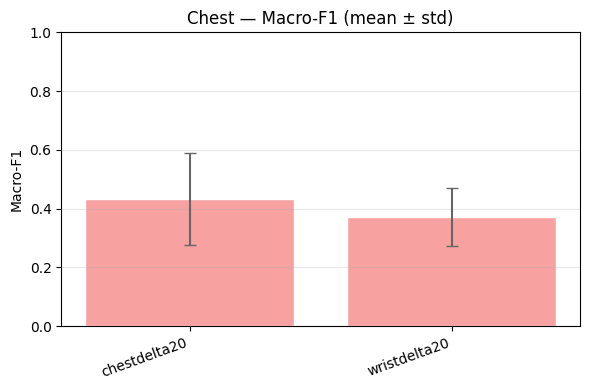

/tmp/ipython-input-66315583.py:53: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp1 = axs[0].boxplot(groups_f1, patch_artist=True, labels=order, showmeans=True)
/tmp/ipython-input-66315583.py:54: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp2 = axs[1].boxplot(groups_acc, patch_artist=True, labels=order, showmeans=True)


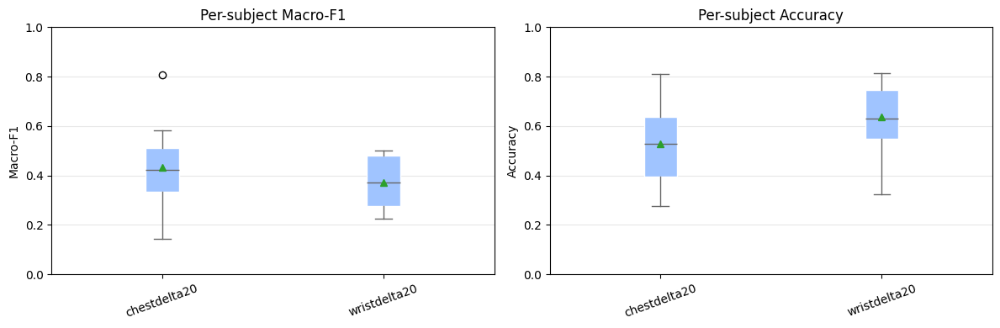

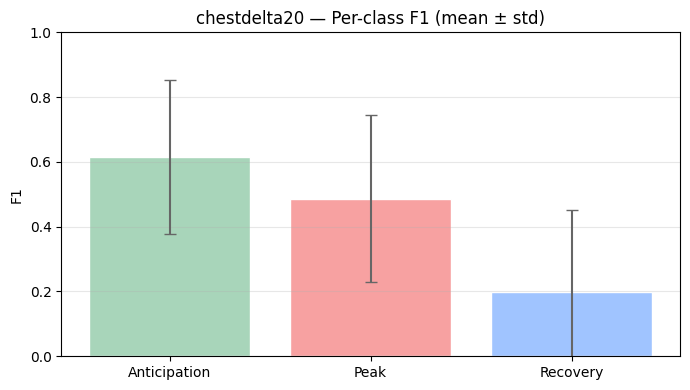

In [ ]:
# === Pastel palette + helpers ===
PASTEL = {"green":"#A8D5BA","pink":"#F7A1A1","blue":"#A0C4FF","orange":"#FFD6A5","purple":"#D7BDE2","grey":"#CED4DA"}
def _nice_ax(ax, title=None, xlabel=None, ylabel=None, ylim=None):
    if title: ax.set_title(title)
    if xlabel: ax.set_xlabel(xlabel)
    if ylabel: ax.set_ylabel(ylabel)
    if ylim: ax.set_ylim(*ylim)
    ax.grid(True, axis="y", alpha=0.3)

def _discover_tracks(eval_root: Path):
    return sorted([d.name.replace("_phases_conv","")
                   for d in eval_root.glob("*_phases_conv") if d.is_dir()])

def _load_summary(eval_root: Path, track_key: str):
    root = eval_root/f"{track_key}_phases_conv"
    df = pd.read_csv(root/"phase_conv_loso_summary.csv") if (root/"phase_conv_loso_summary.csv").exists() else pd.DataFrame()
    df_pc = pd.read_csv(root/"phase_conv_loso_perclass_f1.csv") if (root/"phase_conv_loso_perclass_f1.csv").exists() else pd.DataFrame()
    return df, df_pc, root

# --- (a) Bars + Boxplots
def plot_overall_performance(eval_root: Path, title_prefix="Chest"):
    tracks = _discover_tracks(eval_root)
    if not tracks:
        print("No *_phases_conv folders under:", eval_root)
        return
    labels, means, stds, per_fold = [], [], [], []
    for t in tracks:
        df, _, _ = _load_summary(eval_root, t)
        if df.empty: continue
        labels.append(t)
        means.append(df["f1_macro"].mean())
        stds.append(df["f1_macro"].std())
        d2 = df.copy(); d2["track"] = t
        per_fold.append(d2[["track","fold","test_subject","f1_macro","acc"]])
    if not labels:
        print("No per-fold summaries found.")
        return
    per_fold = pd.concat(per_fold, ignore_index=True)

    # Bar: Macro-F1 mean±std per track
    x = np.arange(len(labels))
    fig, ax = plt.subplots(figsize=(max(6, len(labels)*0.8), 4))
    ax.bar(x, means, yerr=stds, color=PASTEL["pink"], edgecolor="white", ecolor="#666", capsize=4)
    ax.set_xticks(x); ax.set_xticklabels(labels, rotation=20, ha="right")
    _nice_ax(ax, title=f"{title_prefix} — Macro-F1 (mean ± std)", ylabel="Macro-F1", ylim=(0,1))
    plt.tight_layout(); plt.show()

    # Boxplots: per-subject Macro-F1 and Accuracy
    fig, axs = plt.subplots(1,2, figsize=(12,4))
    order = labels
    groups_f1 = [per_fold.loc[per_fold["track"]==t,"f1_macro"].to_numpy() for t in order]
    groups_acc= [per_fold.loc[per_fold["track"]==t,"acc"].to_numpy()      for t in order]
    bp1 = axs[0].boxplot(groups_f1, patch_artist=True, labels=order, showmeans=True)
    bp2 = axs[1].boxplot(groups_acc, patch_artist=True, labels=order, showmeans=True)
    for bp in (bp1, bp2):
        for b in bp['boxes']: b.set_facecolor(PASTEL["blue"]); b.set_edgecolor("white")
        for m in bp['means']: m.set_color("#333")
        for l in bp['whiskers']+bp['caps']+bp['medians']: l.set_color("#666")
    _nice_ax(axs[0], title="Per-subject Macro-F1", ylabel="Macro-F1", ylim=(0,1))
    _nice_ax(axs[1], title="Per-subject Accuracy",  ylabel="Accuracy",  ylim=(0,1))
    for ax in axs: ax.tick_params(axis='x', rotation=20)
    plt.tight_layout(); plt.show()

# --- (b) Per-class F1 grouped bars for one track (e.g., chestdelta20)
def plot_perclass_f1(eval_root: Path, track_key: str):
    df, df_pc, root = _load_summary(eval_root, track_key)
    if df_pc.empty:
        print(f"No per-class CSV at {root/'phase_conv_loso_perclass_f1.csv'}")
        return
    long = df_pc.melt(id_vars=["fold","test_subject"], value_vars=["f1_A","f1_P","f1_R"],
                      var_name="class", value_name="f1")
    class_map = {"f1_A":"Anticipation","f1_P":"Peak","f1_R":"Recovery"}
    long["class"] = long["class"].map(class_map)
    classes = ["Anticipation","Peak","Recovery"]
    means = [long.loc[long["class"]==c,"f1"].mean() for c in classes]
    stds  = [long.loc[long["class"]==c,"f1"].std()  for c in classes]
    cols  = [PASTEL["green"], PASTEL["pink"], PASTEL["blue"]]
    x = np.arange(len(classes))
    fig, ax = plt.subplots(figsize=(7,4))
    ax.bar(x, means, yerr=stds, color=cols, edgecolor="white", ecolor="#666", capsize=4)
    ax.set_xticks(x); ax.set_xticklabels(classes)
    _nice_ax(ax, title=f"{track_key} — Per-class F1 (mean ± std)", ylabel="F1", ylim=(0,1))
    plt.tight_layout(); plt.show()

# ===== RUN Block 2 =====
plot_overall_performance(eval_root)
plot_perclass_f1(eval_root, "chestdelta20")


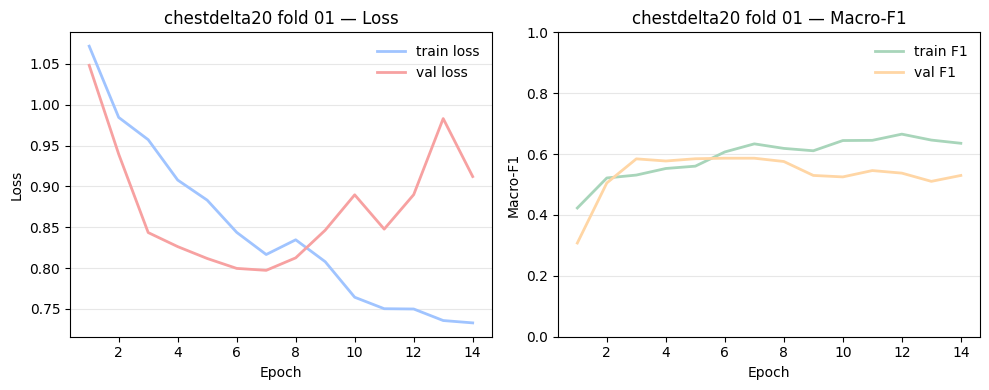

In [ ]:
# === Block 3: Confusion (from checkpoint) + Training curves (from CSV) ===
import torch
import numpy as np

def plot_training_curves_for_fold(eval_root: Path, track_key: str, fold_idx: int):
    fold_dir = eval_root/f"{track_key}_phases_conv"/f"fold_{fold_idx:02d}"
    log_csv = fold_dir/"phase_conv_training.csv"
    if not log_csv.exists():
        print("No log at:", log_csv)
        return
    df = pd.read_csv(log_csv)
    ep  = df["epoch"].to_numpy()
    trL = df["train_loss"].astype(float).to_numpy()
    vaL = df["val_loss"].astype(float).to_numpy()
    trF = df["train_f1"].astype(float).to_numpy()
    vaF = df["val_f1"].astype(float).to_numpy()

    fig, axs = plt.subplots(1,2, figsize=(10,4))
    axs[0].plot(ep, trL, color=PASTEL["blue"],  label="train loss", linewidth=2)
    axs[0].plot(ep, vaL, color=PASTEL["pink"],  label="val loss",   linewidth=2)
    _nice_ax(axs[0], title=f"{track_key} fold {fold_idx:02d} — Loss", xlabel="Epoch", ylabel="Loss")
    axs[0].legend(frameon=False)

    axs[1].plot(ep, trF, color=PASTEL["green"], label="train F1", linewidth=2)
    axs[1].plot(ep, vaF, color=PASTEL["orange"],label="val F1",   linewidth=2)
    _nice_ax(axs[1], title=f"{track_key} fold {fold_idx:02d} — Macro-F1", xlabel="Epoch", ylabel="Macro-F1", ylim=(0,1))
    axs[1].legend(frameon=False)
    plt.tight_layout(); plt.show()

def plot_confusion_from_ckpt(model_root: Path, eval_root: Path, track_key: str, fold_idx: int,
                             dl_builder):
    """
    Reload best.pt and compute a 3x3 APR confusion for that fold.
    You must provide `dl_builder(fold_idx) -> (model, dl_test, class_names)`.
    """
    model, dl_test, class_names = dl_builder(fold_idx)
    # infer
    y_true, y_pred = [], []
    model.eval()
    with torch.no_grad():
        for xb, yb in dl_test:
            xb = xb.to(next(model.parameters()).device)
            out = model(xb).argmax(1).cpu().numpy()
            y_pred.append(out); y_true.append(yb.numpy())
    y_true = np.concatenate(y_true); y_pred = np.concatenate(y_pred)

    # confusion (normalized per true row)
    K = len(class_names)
    cm = np.zeros((K,K), dtype=float)
    for t,p in zip(y_true, y_pred):
        if 0<=t<K and 0<=p<K: cm[t,p]+=1
    cm = cm / np.clip(cm.sum(axis=1, keepdims=True), 1e-9, None)

    fig, ax = plt.subplots(figsize=(4.2,3.8))
    im = ax.imshow(cm, cmap=plt.cm.Pastel1, vmin=0, vmax=1)
    ax.set_xticks(range(K)); ax.set_xticklabels(class_names)
    ax.set_yticks(range(K)); ax.set_yticklabels(class_names)
    ax.set_title(f"{track_key} fold {fold_idx:02d} — APR Confusion")
    for i in range(K):
        for j in range(K):
            ax.text(j, i, f"{cm[i,j]*100:.1f}%", ha="center", va="center", color="#222", fontsize=10)
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    plt.tight_layout(); plt.show()

# ===== RUN Block 3 =====
# (d) Training curves (works immediately):
plot_training_curves_for_fold(eval_root, "chestdelta20", fold_idx=1)

# (c) Confusion matrix:
# Provide a dl_builder that rebuilds the test DataLoader & model for the chosen fold.
# Example stub (you need to fill it with your helpers):
# def my_dl_builder(fold_idx:int):
#     # 1) Load LOSO config to get test subject for this fold
#     # 2) Recreate scaler using train subjects, APR relabeling, etc.
#     # 3) Instantiate ConvStemBiLSTMConcatPool with correct in_features/hidden/num_layers
#     # 4) Load best.pt from models/<track>_phases_conv/fold_##/best.pt
#     # 5) Return (model, dl_test, ["A","P","R"])
#     return model, dl_test, ["A","P","R"]
# plot_confusion_from_ckpt(model_root, eval_root, "chestdelta20", fold_idx=1, dl_builder=my_dl_builder)


In [ ]:
# === Add-on: Cortisol proxy export for Conv-BiLSTM folds (chestdelta20) — fixed ===
import os, math
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader

# --- allowlist TorchVersion once (helps if any other torch.load uses the new default) ---
try:
    from torch.serialization import add_safe_globals
    import torch.torch_version as tv
    add_safe_globals([tv.TorchVersion])
except Exception:
    pass

# --- small math helpers ---
def _softmax(x: np.ndarray) -> np.ndarray:
    x = x - x.max(axis=1, keepdims=True)
    e = np.exp(x)
    return e / np.clip(e.sum(axis=1, keepdims=True), 1e-12, None)

def _ema(p: np.ndarray, half_life_steps: int = 10) -> np.ndarray:
    if len(p) == 0:
        return p
    alpha = 1.0 - math.pow(0.5, 1.0 / max(1, half_life_steps))
    o = np.empty_like(p)
    o[0] = p[0]
    for i in range(1, len(p)):
        o[i] = (1 - alpha) * o[i - 1] + alpha * p[i]
    return o

def _p_to_cortisol(p_raw: np.ndarray, p_lag: np.ndarray,
                   c_min: float = 5.0, c_max: float = 20.0, w: float = 0.7) -> np.ndarray:
    pb = np.clip(w * p_lag + (1 - w) * p_raw, 0, 1)
    return c_min + (c_max - c_min) * pb

# --- main exporter ---
def export_cortisol_for_track(track_key="chestdelta20", stress_class=1,
                              half_life_steps=10, c_min=5.0, c_max=20.0, w=0.7):
    """
    Exports EMA-smoothed stress probability and a simple cortisol proxy per fold,
    reading best Conv-BiLSTM checkpoints saved as .../models/<track>_phases_conv/fold_##/best.pt
    """
    proj = Path("/content/wesad")
    feat_dir  = proj / "features" / "windows" / track_key
    eval_root = proj / "eval" / f"{track_key}_phases_conv"
    model_root= proj / "models" / f"{track_key}_phases_conv"

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # sanity
    if not feat_dir.exists():
        print(f"[{track_key}] features dir missing: {feat_dir}")
        return
    eval_root.mkdir(parents=True, exist_ok=True)

    # build/load LOSO plan
    if "build_or_load_loso_for" in globals():
        subjects, folds, _ = build_or_load_loso_for(track_key, feat_dir)
    else:
        subjects, folds, _ = build_or_load_loso(track_key, feat_dir)

    # guess delay from track name (deltaN)
    try:
        delay_min = int(track_key.split("delta")[-1])
    except Exception:
        delay_min = 20

    for k, fold in enumerate(folds, start=1):
        test_sid = fold["test_subject"]

        # --- load test windows & robust APR mapping (same as training pipeline) ---
        Xte_full, yte_full, labels_te, _ = load_npz(feat_dir, test_sid)
        yA, m_te = relabel_to_APR_robust(
            yte_full, labels_te, X=Xte_full, stride_sec=60,
            peak_delay_min=delay_min, anticipation_min=10, peak_width_min=6, recovery_min=20
        )
        if m_te.sum() == 0:
            print(f"[{track_key}] fold {k:02d} | {test_sid}: no APR test windows — skipping cortisol.")
            continue

        Xte, yte = Xte_full[m_te], yA[m_te]

        # --- scale (ideally use train scaler; here we fit on test for a quick export) ---
        sc   = fit_scaler_on_train(Xte)      # replace with saved train scaler if you persisted it
        XteS = apply_scaler(sc, Xte)

        # --- dataloader ---
        dl_te = DataLoader(
            SeqDataset(XteS, yte), batch_size=256, shuffle=False,
            num_workers=min(8, os.cpu_count() or 2),
            prefetch_factor=2, persistent_workers=False,
            pin_memory=torch.cuda.is_available(), drop_last=False
        )

        # --- rebuild model & load BEST checkpoint correctly ---
        T, F = Xte.shape[1], Xte.shape[2]
        NCLS = 3
        model = ConvStemBiLSTMConcatPool(
            input_dim=F, hidden_size=HIDDEN_SIZE, num_layers=2, num_classes=NCLS,
            bidirectional=True, dropout=0.40
        ).to(device)

        ckpt_path = model_root / f"fold_{k:02d}" / "best.pt"
        if not ckpt_path.exists():
            print(f"[{track_key}] fold {k:02d}: missing checkpoint {ckpt_path} — skipping.")
            continue

        # IMPORTANT: load full pickle (trusted) and extract 'model_state'
        ckpt = torch.load(ckpt_path, map_location=device, weights_only=False)
        state_dict = ckpt["model_state"] if isinstance(ckpt, dict) and "model_state" in ckpt else ckpt
        model.load_state_dict(state_dict, strict=True)
        model.eval()

        # --- collect logits in order ---
        logits_list, y_true_list = [], []
        with torch.no_grad():
            for xb, yb in dl_te:
                xb = xb.to(device, non_blocking=True)
                out = model(xb)  # [B, NCLS] logits
                logits_list.append(out.detach().cpu().numpy())
                y_true_list.append(yb.numpy())

        logits = np.concatenate(logits_list, axis=0)
        y_true = np.concatenate(y_true_list, axis=0).astype(int)

        # --- stress prob → EMA → cortisol proxy ---
        probs    = _softmax(logits)
        p_raw    = probs[:, stress_class]
        p_lag    = _ema(p_raw, half_life_steps=half_life_steps)
        cortisol = _p_to_cortisol(p_raw, p_lag, c_min=c_min, c_max=c_max, w=w)

        # --- save CSV & quick plots ---
        out_dir = eval_root / f"fold_{k:02d}" / "cortisol"
        out_dir.mkdir(parents=True, exist_ok=True)

        pd.DataFrame({
            "idx": np.arange(len(p_raw)),
            "y_true": y_true,
            "p_stress_raw": p_raw,
            "p_stress_lag": p_lag,
            "cortisol_proxy_nmol_per_L": cortisol
        }).to_csv(out_dir / f"fold_{k:02d}_cortisol_trace.csv", index=False)

        plt.figure(figsize=(10, 4))
        plt.plot(p_raw, label="p(stress) raw")
        plt.plot(p_lag, label="p(stress) lag (EMA)")
        plt.legend(); plt.xlabel("Window idx"); plt.ylabel("Probability")
        plt.title(f"{track_key} fold {k:02d} — Stress prob")
        plt.tight_layout(); plt.savefig(out_dir / f"fold_{k:02d}_p_stress.png", dpi=200); plt.close()

        plt.figure(figsize=(10, 4))
        plt.plot(cortisol)
        plt.xlabel("Window idx"); plt.ylabel("Cortisol (nmol/L)")
        plt.title(f"{track_key} fold {k:02d} — Proxy cortisol")
        plt.tight_layout(); plt.savefig(out_dir / f"fold_{k:02d}_cortisol.png", dpi=200); plt.close()

        print(f"[{track_key}] fold {k:02d}: cortisol saved. "
              f"p_raw max={p_raw.max():.3f} | p_lag max={p_lag.max():.3f} | Cmax={cortisol.max():.1f} nmol/L")


# --- run for chestdelta20 ---
export_cortisol_for_track(
    track_key="chestdelta20",
    stress_class=1,
    half_life_steps=10,
    c_min=5.0, c_max=20.0, w=0.7
)


[chestdelta20] fold 01: cortisol saved. p_raw max=0.626 | p_lag max=0.475 | Cmax=12.7 nmol/L
[chestdelta20] fold 02: cortisol saved. p_raw max=0.792 | p_lag max=0.603 | Cmax=14.6 nmol/L
[chestdelta20] fold 03: cortisol saved. p_raw max=0.680 | p_lag max=0.436 | Cmax=12.2 nmol/L
[chestdelta20] fold 04: cortisol saved. p_raw max=0.685 | p_lag max=0.464 | Cmax=12.5 nmol/L
[chestdelta20] fold 05: cortisol saved. p_raw max=0.661 | p_lag max=0.416 | Cmax=12.1 nmol/L
[chestdelta20] fold 06: cortisol saved. p_raw max=0.640 | p_lag max=0.531 | Cmax=13.5 nmol/L
[chestdelta20] fold 07: cortisol saved. p_raw max=0.397 | p_lag max=0.368 | Cmax=10.6 nmol/L
[chestdelta20] fold 08: cortisol saved. p_raw max=0.691 | p_lag max=0.493 | Cmax=12.8 nmol/L
[chestdelta20] fold 09: cortisol saved. p_raw max=0.593 | p_lag max=0.446 | Cmax=12.2 nmol/L
[chestdelta20] fold 10: cortisol saved. p_raw max=0.743 | p_lag max=0.568 | Cmax=14.1 nmol/L
[chestdelta20] fold 11: cortisol saved. p_raw max=0.591 | p_lag max=0.

In [ ]:
# === Wrist-style stress vs cortisol mapping tables & plots ===
import os, glob
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

proj = Path("/content/wesad")
track_key = "chestdelta20"
eval_root = proj / "eval" / f"{track_key}_phases_conv"

w = 0.7           # blend weight
thresh = 0.5      # binary stress detection threshold
c_min, c_max = 5.0, 20.0

csv_paths = sorted(glob.glob(str(eval_root / "fold_*" / "cortisol" / "*_cortisol_trace.csv")))

if not csv_paths:
    print("No cortisol traces found under:", eval_root)
else:
    for path in csv_paths:
        fold_dir = Path(path).parent.parent  # .../fold_XX
        fold_str = fold_dir.name
        try:
            fold_num = int(fold_str.split("_")[1])
        except Exception:
            fold_num = None

        df = pd.read_csv(path)

        # Compute blended probability
        p_raw = df["p_stress_raw"].values
        p_lag = df["p_stress_lag"].values
        p_blend = np.clip(w*p_lag + (1-w)*p_raw, 0, 1)

        stress_detection = (p_blend >= thresh).astype(int)
        cortisol = df["cortisol_proxy_nmol_per_L"].values

        # New wrist-style table
        out_df = pd.DataFrame({
            "idx": np.arange(len(p_blend)),
            "stress_prob": p_blend,
            "stress_detection": stress_detection,
            "cortisol_proxy_nmol_per_L": cortisol
        })

        out_csv = fold_dir / "cortisol" / f"{fold_str}_mapping_table.csv"
        out_df.to_csv(out_csv, index=False)

        # Overlay plot
        plt.figure(figsize=(10,4.5))
        ax1 = plt.gca()
        ax1.plot(out_df["idx"], out_df["stress_prob"], label="Stress prob", color="tab:blue")
        ax1.set_ylim(-0.05, 1.05)
        ax1.set_xlabel("Window idx")
        ax1.set_ylabel("Stress probability", color="tab:blue")
        ax2 = ax1.twinx()
        ax2.plot(out_df["idx"], out_df["cortisol_proxy_nmol_per_L"], label="Cortisol", color="tab:red")
        ax2.set_ylabel("Cortisol (nmol/L)", color="tab:red")
        plt.title(f"{track_key} {fold_str} — Stress vs Cortisol")
        plt.tight_layout()
        out_png = fold_dir / "cortisol" / f"{fold_str}_stress_vs_cortisol.png"
        plt.savefig(out_png, dpi=200)
        plt.close()

        print(f"[{track_key}] {fold_str}: saved table → {out_csv}, plot → {out_png}")

    # Preview first fold’s table
    first = pd.read_csv(csv_paths[0])
    print("\nPreview of first cortisol trace file:")
    print(first.head())


[chestdelta20] fold_01: saved table → /content/wesad/eval/chestdelta20_phases_conv/fold_01/cortisol/fold_01_mapping_table.csv, plot → /content/wesad/eval/chestdelta20_phases_conv/fold_01/cortisol/fold_01_stress_vs_cortisol.png
[chestdelta20] fold_02: saved table → /content/wesad/eval/chestdelta20_phases_conv/fold_02/cortisol/fold_02_mapping_table.csv, plot → /content/wesad/eval/chestdelta20_phases_conv/fold_02/cortisol/fold_02_stress_vs_cortisol.png
[chestdelta20] fold_03: saved table → /content/wesad/eval/chestdelta20_phases_conv/fold_03/cortisol/fold_03_mapping_table.csv, plot → /content/wesad/eval/chestdelta20_phases_conv/fold_03/cortisol/fold_03_stress_vs_cortisol.png
[chestdelta20] fold_04: saved table → /content/wesad/eval/chestdelta20_phases_conv/fold_04/cortisol/fold_04_mapping_table.csv, plot → /content/wesad/eval/chestdelta20_phases_conv/fold_04/cortisol/fold_04_stress_vs_cortisol.png
[chestdelta20] fold_05: saved table → /content/wesad/eval/chestdelta20_phases_conv/fold_05/c

In [ ]:
# === Build WRIST-STYLE tables: 2 columns only (stress_detection, cortisol) ===
# Reads the per-fold cortisol traces you already saved and produces:
#   fold_XX_wrist_style_table.csv   with columns: stress_detection, cortisol_nmol_L
#   wrist_style_all_folds.csv       concatenated across all folds, with 'fold' and 'idx' too

import glob
from pathlib import Path
import numpy as np
import pandas as pd

# ----- config (match your export settings) -----
proj = Path("/content/wesad")
track_key = "chestdelta20"
eval_root = proj / "eval" / f"{track_key}_phases_conv"

# how we converted probs to cortisol originally:
w = 0.7          # blend weight used for p_blend = w*p_lag + (1-w)*p_raw
thresh = 0.5     # threshold for stress_detection on p_blend

In [ ]:
# ----- locate per-fold cortisol traces -----
csv_paths = sorted(glob.glob(str(eval_root / "fold_*" / "cortisol" / "*_cortisol_trace.csv")))
if not csv_paths:
    raise FileNotFoundError(f"No cortisol traces found under {eval_root}/fold_XX/cortisol/*.csv")

In [ ]:
all_rows = []  # for the combined table

for path in csv_paths:
    fold_dir = Path(path).parent.parent          # .../fold_XX
    fold_str = fold_dir.name                     # "fold_01"
    fold_num = int(fold_str.split("_")[1])

    df = pd.read_csv(path)

    # Compute blended probability (if not already present)
    if {"p_stress_raw","p_stress_lag"}.issubset(df.columns):
        p_blend = np.clip(w*df["p_stress_lag"].values + (1.0-w)*df["p_stress_raw"].values, 0, 1)
    elif "stress_prob" in df.columns:
        p_blend = df["stress_prob"].values
    else:
        # derive from cortisol if needed (linear inverse), but you should have p_* columns
        C = df["cortisol_proxy_nmol_per_L"].values
        # uses your default mapping (c_min=5, c_max=20); change if you used different values
        p_blend = np.clip((C - 5.0) / (20.0 - 5.0), 0, 1)

    stress_detection = (p_blend >= thresh).astype(int)
    cortisol = df["cortisol_proxy_nmol_per_L"].values

    # ---- WRIST-STYLE: exactly two columns ----
    wrist_df = pd.DataFrame({
        "stress_detection": stress_detection,
        "cortisol_nmol_L": cortisol
    })

    # save per-fold table
    out_csv = fold_dir / "cortisol" / f"{fold_str}_wrist_style_table.csv"
    wrist_df.to_csv(out_csv, index=False)

    # stash for combined table (keep fold & idx so you can trace back)
    wrist_df_all = wrist_df.copy()
    wrist_df_all.insert(0, "idx", np.arange(len(wrist_df_all)))
    wrist_df_all.insert(0, "fold", fold_num)
    all_rows.append(wrist_df_all)

    print(f"[{track_key}] {fold_str}: saved wrist-style → {out_csv}  "
          f"(N={len(wrist_df)})")

[chestdelta20] fold_01: saved wrist-style → /content/wesad/eval/chestdelta20_phases_conv/fold_01/cortisol/fold_01_wrist_style_table.csv  (N=76)
[chestdelta20] fold_02: saved wrist-style → /content/wesad/eval/chestdelta20_phases_conv/fold_02/cortisol/fold_02_wrist_style_table.csv  (N=110)
[chestdelta20] fold_03: saved wrist-style → /content/wesad/eval/chestdelta20_phases_conv/fold_03/cortisol/fold_03_wrist_style_table.csv  (N=75)
[chestdelta20] fold_04: saved wrist-style → /content/wesad/eval/chestdelta20_phases_conv/fold_04/cortisol/fold_04_wrist_style_table.csv  (N=110)
[chestdelta20] fold_05: saved wrist-style → /content/wesad/eval/chestdelta20_phases_conv/fold_05/cortisol/fold_05_wrist_style_table.csv  (N=71)
[chestdelta20] fold_06: saved wrist-style → /content/wesad/eval/chestdelta20_phases_conv/fold_06/cortisol/fold_06_wrist_style_table.csv  (N=110)
[chestdelta20] fold_07: saved wrist-style → /content/wesad/eval/chestdelta20_phases_conv/fold_07/cortisol/fold_07_wrist_style_table.c

In [ ]:
# combined across all folds
if all_rows:
    all_tbl = pd.concat(all_rows, axis=0, ignore_index=True).sort_values(["fold","idx"])
    all_csv = eval_root / "wrist_style_all_folds.csv"
    all_tbl.to_csv(all_csv, index=False)
    print(f"\nSaved combined wrist-style table → {all_csv}")
    # quick preview
    print("\nPreview:")
    print(all_tbl.head(10).to_string(index=False))



Saved combined wrist-style table → /content/wesad/eval/chestdelta20_phases_conv/wrist_style_all_folds.csv

Preview:
 fold  idx  stress_detection  cortisol_nmol_L
    1    0                 0         5.208405
    1    1                 0         5.371748
    1    2                 0         5.481310
    1    3                 0         5.430927
    1    4                 0         5.465642
    1    5                 0         5.527400
    1    6                 0         5.835497
    1    7                 0         5.977426
    1    8                 0         6.295600
    1    9                 0         6.870529


In [ ]:
# === TRUE/DETECT vs CORTISOL (aligned) grid-style plot per fold — FIXED ===
import glob
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Patch

proj = Path("/content/wesad")
track_key = "chestdelta20"
eval_root = proj / "eval" / f"{track_key}_phases_conv"

LEFT_MODE = "TRUE"   # or "DETECT"

# Map y_true ids -> names (change to APR names if that's your y_true)
ytrue_map = {0:"baseline", 1:"stress", 2:"amusement"}

# Cortisol bucket thresholds (nmol/L)
mild_lo, stress_hi = 7.0, 15.0

# For DETECT mode
w_blend, detect_thresh = 0.7, 0.5

# Cosmetic title bits
half_life_min = 20
delay_windows = 20
a_val, b_val = 18, 8

In [ ]:
def cortisol_state(c):
    if c < mild_lo: return "baseline"
    if c < stress_hi: return "mild"
    return "stress"

def blended_prob(df):
    if {"p_stress_raw","p_stress_lag"}.issubset(df.columns):
        return np.clip(w_blend*df["p_stress_lag"].values + (1.0-w_blend)*df["p_stress_raw"].values, 0, 1)
    if "stress_prob" in df.columns:
        return df["stress_prob"].values
    if "cortisol_proxy_nmol_per_L" in df.columns:  # inverse of 5..20 mapping if needed
        C = df["cortisol_proxy_nmol_per_L"].values
        return np.clip((C - 5.0) / 15.0, 0, 1)
    raise ValueError("No probability columns found to compute DETECT.")

def make_palette(labels):
    labs = sorted(labels)
    base = sns.color_palette("Set2", n_colors=len(labs))
    return {lab: base[i] for i, lab in enumerate(labs)}

In [ ]:

csv_paths = sorted(glob.glob(str(eval_root / "fold_*" / "cortisol" / "*_cortisol_trace.csv")))

if not csv_paths:
    raise FileNotFoundError(f"no cortisol traces found under {eval_root}/fold_XX/cortisol/*.csv")

for path in csv_paths:
    fold_dir = Path(path).parent.parent
    fold_str = fold_dir.name
    fold_num = int(fold_str.split("_")[1])

    df = pd.read_csv(path)
    N = len(df)

    # RIGHT column (cortisol states)
    cortisol = df["cortisol_proxy_nmol_per_L"].values
    cort_states = [cortisol_state(c) for c in cortisol]

    # LEFT column (TRUE or DETECT)
    if LEFT_MODE.upper() == "TRUE":
        if "y_true" not in df.columns:
            raise ValueError(f"{path} has no y_true column for TRUE mode.")
        left_labels = [ytrue_map.get(int(v), str(int(v))) for v in df["y_true"].values]
        left_title = "TRUE"
    else:
        p = blended_prob(df)
        left_labels = ["stress" if v >= detect_thresh else "baseline" for v in p]
        left_title = "DETECT"

    # Build 2-column categorical DataFrame
    vis = pd.DataFrame({
        left_title: left_labels,
        "CORTISOL (aligned)": cort_states
    }, index=np.arange(N))

    # Encode categories -> ints safely (no FutureWarning)
    cats = sorted(set(left_labels) | set(cort_states))
    cat2id = {c:i for i,c in enumerate(cats)}
    pal = make_palette(cats)
    mat = vis.applymap(lambda x: cat2id[x]).to_numpy()

    # Plot
    h = max(8, N * 0.12)   # auto-ish height
    plt.figure(figsize=(6, h))
    ax = sns.heatmap(
        mat,
        cmap=[pal[c] for c in cats],
        cbar=False,
        linewidths=0.5,
        linecolor="white",
        xticklabels=[left_title, "CORTISOL (aligned)"],
        yticklabels=np.arange(N)  # ensure ticks match rows
    )

    # Thin y-ticks if too many
    if N > 60:
        step = int(np.ceil(N / 30))  # ~30 ticks max
        ax.set_yticks(np.arange(0, N, step))
        ax.set_yticklabels(np.arange(0, N, step), fontsize=8)
    else:
        ax.set_yticklabels(np.arange(N), fontsize=8)

    ax.set_xticklabels([left_title, "CORTISOL (aligned)"], rotation=0, fontsize=11)
    plt.ylabel("Time window index")

    # Title
    plt.title(
        f"{fold_str.upper()} — {left_title} vs CORTISOL (delay +{delay_windows} windows)\n"
        f"half-life={half_life_min} min, a={a_val}, b={b_val}, stress≥{stress_hi:.0f} nmol/L",
        fontsize=12
    )

    # Legend
    handles = [Patch(color=pal[l], label=l) for l in cats]
    plt.legend(handles=handles, title="Labels", bbox_to_anchor=(1.02, 1), loc="upper left")

    out_png = fold_dir / "cortisol" / f"{fold_str}_{left_title.lower()}_vs_cortisol_grid.png"
    plt.tight_layout()
    plt.savefig(out_png, dpi=200)
    plt.close()

    print(f"[{track_key}] {fold_str}: saved → {out_png}")


/tmp/ipython-input-711072601.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_01: saved → /content/wesad/eval/chestdelta20_phases_conv/fold_01/cortisol/fold_01_true_vs_cortisol_grid.png


/tmp/ipython-input-711072601.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_02: saved → /content/wesad/eval/chestdelta20_phases_conv/fold_02/cortisol/fold_02_true_vs_cortisol_grid.png


/tmp/ipython-input-711072601.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_03: saved → /content/wesad/eval/chestdelta20_phases_conv/fold_03/cortisol/fold_03_true_vs_cortisol_grid.png


/tmp/ipython-input-711072601.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_04: saved → /content/wesad/eval/chestdelta20_phases_conv/fold_04/cortisol/fold_04_true_vs_cortisol_grid.png


/tmp/ipython-input-711072601.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_05: saved → /content/wesad/eval/chestdelta20_phases_conv/fold_05/cortisol/fold_05_true_vs_cortisol_grid.png


/tmp/ipython-input-711072601.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_06: saved → /content/wesad/eval/chestdelta20_phases_conv/fold_06/cortisol/fold_06_true_vs_cortisol_grid.png


/tmp/ipython-input-711072601.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_07: saved → /content/wesad/eval/chestdelta20_phases_conv/fold_07/cortisol/fold_07_true_vs_cortisol_grid.png


/tmp/ipython-input-711072601.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_08: saved → /content/wesad/eval/chestdelta20_phases_conv/fold_08/cortisol/fold_08_true_vs_cortisol_grid.png


/tmp/ipython-input-711072601.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_09: saved → /content/wesad/eval/chestdelta20_phases_conv/fold_09/cortisol/fold_09_true_vs_cortisol_grid.png


/tmp/ipython-input-711072601.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_10: saved → /content/wesad/eval/chestdelta20_phases_conv/fold_10/cortisol/fold_10_true_vs_cortisol_grid.png


/tmp/ipython-input-711072601.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_11: saved → /content/wesad/eval/chestdelta20_phases_conv/fold_11/cortisol/fold_11_true_vs_cortisol_grid.png


/tmp/ipython-input-711072601.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_12: saved → /content/wesad/eval/chestdelta20_phases_conv/fold_12/cortisol/fold_12_true_vs_cortisol_grid.png


/tmp/ipython-input-711072601.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_13: saved → /content/wesad/eval/chestdelta20_phases_conv/fold_13/cortisol/fold_13_true_vs_cortisol_grid.png


/tmp/ipython-input-711072601.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_14: saved → /content/wesad/eval/chestdelta20_phases_conv/fold_14/cortisol/fold_14_true_vs_cortisol_grid.png


/tmp/ipython-input-711072601.py:39: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_15: saved → /content/wesad/eval/chestdelta20_phases_conv/fold_15/cortisol/fold_15_true_vs_cortisol_grid.png


In [ ]:
# ==== Build df_all_bilstm from chest Conv+BiLSTM traces, then use your wrist helpers ====
import json, glob
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from pathlib import Path
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# --- paths & settings (edit subject_id at bottom to plot a different one) ---
proj = Path("/content/wesad")
track_key = "chestdelta20"
eval_root = proj / "eval" / f"{track_key}_phases_conv"
loso_cfg = proj / "configs" / f"loso_{track_key}.json"

# blend weight for p_blend (matches your export)
w_blend = 0.7

In [ ]:
# --- 1) map fold -> subject (from LOSO plan) ---
with open(loso_cfg, "r") as fh:
    plan = json.load(fh)
fold_to_subject = {i+1: f["test_subject"] for i, f in enumerate(plan["folds"])}

In [ ]:
# --- 2) collect per-fold traces into a single df_all_bilstm ---
rows = []
csv_paths = sorted(glob.glob(str(eval_root / "fold_*" / "cortisol" / "*_cortisol_trace.csv")))
assert csv_paths, f"no cortisol trace CSVs found in {eval_root}/fold_XX/cortisol/"

for path in csv_paths:
    p = Path(path)
    fold_num = int(p.parent.parent.name.split("_")[1])
    subject = fold_to_subject.get(fold_num, f"F{fold_num:02d}")

    df = pd.read_csv(path)
    # blended stress prob (p1) = w*p_lag + (1-w)*p_raw
    p_raw = df["p_stress_raw"].to_numpy()
    p_lag = df["p_stress_lag"].to_numpy()
    p1 = np.clip(w_blend*p_lag + (1.0 - w_blend)*p_raw, 0, 1)

    # APR y_true in these traces: 0=Anticipation,1=Peak,2=Recovery
    # Map to wrist-style ids: 0=baseline, 1=stress, 2=amusement
    apr2wrist = {0:0, 1:1, 2:2}
    y_true_apr = df["y_true"].astype(int).map(apr2wrist).to_numpy()

    rows.append(pd.DataFrame({
        "subject": subject,
        "window_idx": df["idx"].to_numpy(),
        "true": y_true_apr,     # wrist-style ids (0 baseline, 1 stress, 2 amusement)
        "p1": p1,               # stress-class probability
    }))

df_all_bilstm = pd.concat(rows, axis=0, ignore_index=True)

In [ ]:
# =========================
# ==== YOUR WRIST HELPERS ==
# =========================

DATASET_LABEL_NAMES = {0:"baseline", 1:"stress", 2:"amusement", 3:"other1", 4:"other2"}
CORTISOL_LABEL_TO_ID = {"baseline":0, "mild":2, "stress":1}
CORTISOL_ID_TO_LABEL = {v:k for k,v in CORTISOL_LABEL_TO_ID.items()}

def _ema_delay(series, minutes_per_step=1.0, half_life_min=20.0):
    series = np.asarray(series, dtype=float)
    alpha = 1.0 - np.exp(-np.log(2) * minutes_per_step / max(1e-6, half_life_min))
    out = np.zeros_like(series, dtype=float)
    for i, v in enumerate(series):
        out[i] = alpha * v + (1 - alpha) * (out[i-1] if i > 0 else v)
    return out

class LinearCortisol:
    def __init__(self, a=12.0, b=8.0):  # nmol/L = a * p + b
        self.a = a; self.b = b
    def __call__(self, p_stress_lag):
        return self.a * np.asarray(p_stress_lag, dtype=float) + self.b

def _cortisol_band_ids(values, stress_band_min=15.0):
    """baseline<=10, mild 10–stress_band_min, stress>=stress_band_min -> ids 0,2,1 respectively"""
    v = np.asarray(values, dtype=float)
    out = np.full(v.shape, 0, dtype=int)
    out[(v >= 10.0) & (v < stress_band_min)] = 2
    out[v >= stress_band_min] = 1
    return out

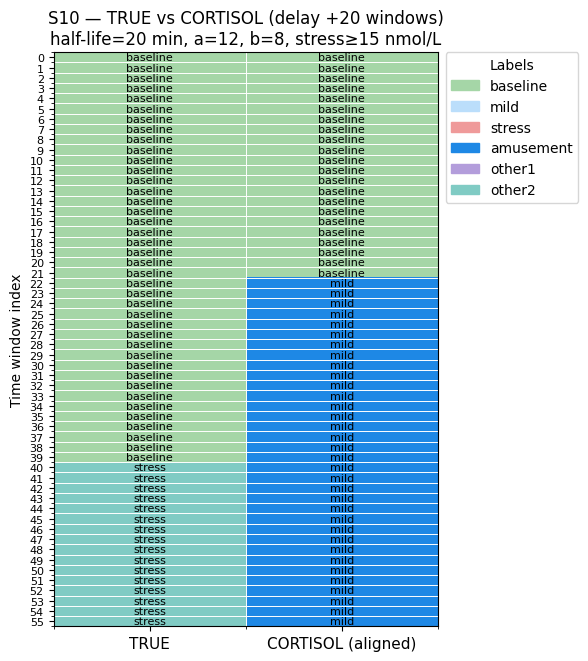

Exact-label agreement (aligned): 39.3%
Stress vs non-stress agreement (aligned): 71.4%
p(stress) raw max: 0.512 | p(stress) lag max: 0.327 | proxy cortisol max: 11.9 nmol/L
BiLSTM mapping metrics: {'subject': 'S10', 'exact_agree': 0.39285714285714285, 'stress_agree': 0.7142857142857143, 'p_raw_max': 0.511880726, 'p_lag_max': 0.32698656430454204, 'cort_max': 11.923838771654506}


In [ ]:

def evaluate_mapping_for_subject(df_all, subject_id, stress_class_id=1,
                                 minutes_per_step=1.0, half_life_min=20.0,
                                 a=12.0, b=8.0, stress_band_min=15.0,
                                 align_delay_windows=20):
    g = (df_all[df_all["subject"].astype(str)==str(subject_id)]
         .sort_values("window_idx")).reset_index(drop=True)
    if g.empty: return None
    y_true = g["true"].to_numpy()
    p_raw  = g[f"p{stress_class_id}"].to_numpy()
    p_lag  = _ema_delay(p_raw, minutes_per_step, half_life_min)
    cortisol = a * p_lag + b
    cort_ids = _cortisol_band_ids(cortisol, stress_band_min)

    d = int(max(0, align_delay_windows))
    idx_true = np.arange(0, len(y_true)-d) if d>0 else np.arange(len(y_true))
    idx_cort = idx_true + d if d>0 else idx_true
    y_t = y_true[idx_true]; cort_t = cort_ids[idx_cort]

    exact = float(np.mean(y_t == cort_t)) if len(y_t) else 0.0
    stress_true = (y_t == 1)
    stress_cort = (cort_t == 1)
    stress_agree = float(np.mean(stress_true == stress_cort)) if len(y_t) else 0.0

    return {"subject": str(subject_id),
            "exact_agree": exact,
            "stress_agree": stress_agree,
            "p_raw_max": float(np.max(p_raw)) if len(p_raw) else 0.0,
            "p_lag_max": float(np.max(p_lag)) if len(p_lag) else 0.0,
            "cort_max": float(np.max(cortisol)) if len(cortisol) else 0.0}

def plot_two_column_mapping(df_all, subject_id, stress_class_id=1,
                            minutes_per_step=1.0, half_life_min=20.0,
                            a=12.0, b=8.0, stress_band_min=15.0,
                            align_delay_windows=20, max_windows=80):
    # slice subject
    g = (df_all[df_all["subject"].astype(str)==str(subject_id)]
         .sort_values("window_idx")).reset_index(drop=True)
    assert not g.empty, f"No rows for subject {subject_id}"
    t = g["window_idx"].to_numpy()
    y_true = g["true"].to_numpy()
    p_raw  = g[f"p{stress_class_id}"].to_numpy()

    # cortisol mapping
    p_lag = _ema_delay(p_raw, minutes_per_step, half_life_min)
    cortisol = LinearCortisol(a=a, b=b)(p_lag)
    # dynamic bands
    def to_cid(c):
        if c < 10.0: return 0
        if c < stress_band_min: return 2
        return 1
    cort_ids = np.array([to_cid(c) for c in cortisol], dtype=int)

    # TRUE[t] vs CORT[t+delay]
    d = int(max(0, align_delay_windows))
    idx_true = np.arange(0, len(t)-d) if d>0 else np.arange(len(t))
    idx_cort = idx_true + d if d>0 else idx_true
    t_sel, y_true_sel, cort_sel = t[idx_true], y_true[idx_true], cort_ids[idx_cort]

    # truncate
    if len(t_sel) > max_windows:
        t_sel, y_true_sel, cort_sel = t_sel[:max_windows], y_true_sel[:max_windows], cort_sel[:max_windows]

    # names & colors
    true_names = np.array([DATASET_LABEL_NAMES.get(int(y), str(y)) for y in y_true_sel])
    cort_names = np.array([CORTISOL_ID_TO_LABEL.get(int(c), str(c)) for c in cort_sel])
    names_order = ["baseline","mild","stress","amusement","other1","other2"]
    colors = ["#A5D6A7","#BBDEFB","#EF9A9A","#1E88E5","#B39DDB","#80CBC4"]
    name_to_idx = {n:i for i,n in enumerate(names_order)}
    cmap = ListedColormap(colors)

    N = len(t_sel)
    mat = np.zeros((N,2), dtype=int)
    mat[:,0] = np.array([name_to_idx.get(n,0) for n in true_names])  # TRUE
    mat[:,1] = np.array([name_to_idx.get(n,0) for n in cort_names])  # CORT

    fig, ax = plt.subplots(figsize=(6, max(4, N*0.12)))
    ax.imshow(mat, aspect="auto", cmap=cmap, interpolation="nearest", origin="upper")
    ax.set_xticks([0,1]); ax.set_xticklabels(["TRUE", "CORTISOL (aligned)"], fontsize=11)
    ax.set_yticks(np.arange(N)); ax.set_yticklabels(t_sel, fontsize=8)
    ax.set_ylabel("Time window index")
    ax.set_title(f"{subject_id} — TRUE vs CORTISOL (delay +{d} windows)\n"
                 f"half-life={half_life_min} min, a={a}, b={b}, stress≥{stress_band_min} nmol/L")
    # grid + annotations
    ax.set_xticks(np.arange(-.5, 2, 1), minor=True)
    ax.set_yticks(np.arange(-.5, N, 1), minor=True)
    ax.grid(which="minor", color="white", linestyle="-", linewidth=0.7)
    for i in range(N):
        ax.text(0, i, true_names[i], va="center", ha="center", fontsize=8)
        ax.text(1, i, cort_names[i], va="center", ha="center", fontsize=8)
    handles = [Patch(color=colors[i], label=names_order[i]) for i in range(len(names_order))]
    ax.legend(handles=handles, bbox_to_anchor=(1.02,1), loc="upper left", borderaxespad=0., title="Labels")
    plt.tight_layout(); plt.show()

    # print quick metrics on the aligned region
    exact = float(np.mean(true_names == cort_names)) if N else 0.0
    stress_true = (y_true_sel == 1)
    stress_cort = (cort_names == "stress")
    stress_agree = float(np.mean(stress_true == stress_cort)) if N else 0.0
    print(f"Exact-label agreement (aligned): {100*exact:.1f}%")
    print(f"Stress vs non-stress agreement (aligned): {100*stress_agree:.1f}%")
    print(f"p(stress) raw max: {p_raw.max():.3f} | p(stress) lag max: {p_lag.max():.3f} | "
          f"proxy cortisol max: {cortisol.max():.1f} nmol/L")

# ==== CALL IT (pick a subject from your dataset, e.g., "S10") ====
best_params = dict(half_life_min=20, a=12, b=8, stress_band_min=15, align_delay_windows=20)
stress_class_id = 1   # stress prob column is 'p1'

subject_to_plot = "S10"   # <-- change to see others
plot_two_column_mapping(
    df_all_bilstm,
    subject_id=subject_to_plot,
    stress_class_id=stress_class_id,
    minutes_per_step=1.0,
    max_windows=80,
    **best_params
)

m = evaluate_mapping_for_subject(
    df_all_bilstm, subject_id=subject_to_plot, stress_class_id=stress_class_id,
    minutes_per_step=1.0, **best_params
)
print("BiLSTM mapping metrics:", m)

In [ ]:
# ================== LOSO with FIXED 20-MIN DELAY: calibration on train, eval on test ==================
from __future__ import annotations
import math
from dataclasses import dataclass
from typing import Dict, Tuple, Iterable, List, Optional
import numpy as np
import pandas as pd

# ----------------------- core helpers -----------------------
def ema_prob(x: np.ndarray, half_life_steps: float) -> np.ndarray:
    """EMA over a 1D prob series with half-life in steps."""
    x = np.asarray(x, dtype=float)
    if x.size == 0:
        return x
    half_life_steps = max(1e-6, float(half_life_steps))
    alpha = 1.0 - math.pow(0.5, 1.0/half_life_steps)
    y = np.empty_like(x, dtype=float)
    y[0] = x[0]
    for i in range(1, len(x)):
        y[i] = (1 - alpha) * y[i-1] + alpha * x[i]
    return y

def align_fixed_delay(y: np.ndarray, s: np.ndarray, delay_windows: int) -> Tuple[np.ndarray, np.ndarray]:
    """Align y_true[t] with signal s[t+delay] (delay >= 0)."""
    d = max(0, int(delay_windows))
    if d == 0:
        return y, s
    n = min(len(y), len(s) - d)
    if n <= 0:
        return np.array([]), np.array([])
    return y[:n], s[d:d+n]

@dataclass
class MappingParamsFixedDelay:
    delay_windows: int           # fixed by physiology, e.g., 20
    half_life_min: float         # tuned on train subjects
    w_blend: float               # tuned on train subjects, 0..1
    tau: float                   # tuned threshold on blended probability
    # display-only mapping (kept for compatibility)
    a: float = 12.0
    b: float = 8.0
    c_min: float = 5.0
    c_max: float = 20.0

# ----------------------- per-series metrics -----------------------
def compute_agreement_for_series(
    y_true: np.ndarray,
    p_raw: np.ndarray,
    params: MappingParamsFixedDelay,
    minutes_per_step: float = 1.0
) -> Dict[str, float]:
    """Binary stress/non-stress agreement with fixed delay on one (subject) series."""
    # smoothing + blend
    half_steps = float(params.half_life_min) / float(minutes_per_step)
    p_lag = ema_prob(p_raw, half_steps)
    p_blend = (1 - params.w_blend) * p_raw + params.w_blend * p_lag

    # align with fixed delay
    y_aligned, p_aligned = align_fixed_delay(y_true, p_blend, params.delay_windows)
    if y_aligned.size == 0:
        return {"exact_agree": np.nan, "stress_agree": np.nan, "p_raw_max": np.nan, "p_lag_max": np.nan}

    stress_true = (y_aligned == 1)
    stress_pred = (p_aligned >= params.tau)

    # binary exact on stress/non-stress
    exact_agree  = float(np.mean((y_aligned == 1) == stress_pred))
    stress_agree = float(np.mean(stress_true == stress_pred))

    return {
        "exact_agree": exact_agree,
        "stress_agree": stress_agree,
        "p_raw_max": float(np.max(p_raw)) if p_raw.size else 0.0,
        "p_lag_max": float(np.max(p_lag)) if p_lag.size else 0.0,
    }

# ----------------------- calibration on train subjects -----------------------
def grid_search_params_on_train(
    df: pd.DataFrame,
    train_subjects: Iterable[str],
    stress_class_id: int = 1,
    minutes_per_step: float = 1.0,
    delay_minutes: float = 20.0,
    half_life_grid: Iterable[float] = (5, 10, 15, 20, 30),
    w_grid: Iterable[float] = (0.0, 0.25, 0.5, 0.75, 1.0),
    tau_grid: Iterable[float] = tuple(np.linspace(0.35, 0.70, 8)),
    score_metric: str = "stress_agree",  # or "exact_agree"
) -> Tuple[MappingParamsFixedDelay, Dict[str, float]]:
    """
    Calibrate (half_life, w_blend, tau) on the TRAIN subjects only.
    Aggregates the chosen metric across all train subjects (average).
    """
    delay_windows = int(round(delay_minutes / minutes_per_step))
    best_params: Optional[MappingParamsFixedDelay] = None
    best_score = -1.0
    best_snapshot: Dict[str, float] = {}

    # pre-slice train sets
    train_series: List[Tuple[np.ndarray, np.ndarray]] = []
    for sid in train_subjects:
        g = (df[df["subject"].astype(str) == str(sid)]
             .sort_values("window_idx").reset_index(drop=True))
        if g.empty:
            continue
        y_true = g["true"].to_numpy()
        p_raw  = g[f"p{stress_class_id}"].to_numpy()
        if len(y_true) < 3:
            continue
        train_series.append((y_true, p_raw))

    if not train_series:
        raise ValueError("No train series available for calibration.")

    for half in half_life_grid:
        half_steps = float(half) / float(minutes_per_step)
        # Precompute EMA per series to avoid recomputing across w/tau loop
        ema_cache = [ema_prob(p_raw, half_steps) for (_, p_raw) in train_series]
        for w in w_grid:
            # blend per series
            blends = [(1 - w) * p_raw + w * p_lag for ( (y_true, p_raw), p_lag ) in zip(train_series, ema_cache)]
            # align per series (fixed delay)
            aligned = [align_fixed_delay(y_true, p_blend, delay_windows) for ( (y_true, _), p_blend ) in zip(train_series, blends)]
            # drop empty aligns
            aligned = [(ya, pa) for (ya, pa) in aligned if ya.size > 0]
            if not aligned:
                continue
            y_stress_flags = [ (ya == 1) for (ya, _) in aligned ]

            for tau in tau_grid:
                scores = []
                for (ya, pa), stress_true in zip(aligned, y_stress_flags):
                    stress_pred = (pa >= tau)
                    if score_metric == "stress_agree":
                        s = float(np.mean(stress_true == stress_pred))
                    else:
                        s = float(np.mean((ya == 1) == stress_pred))
                    scores.append(s)
                mean_score = float(np.mean(scores)) if scores else -np.inf

                if mean_score > best_score:
                    best_score = mean_score
                    best_params = MappingParamsFixedDelay(
                        delay_windows=delay_windows,
                        half_life_min=float(half),
                        w_blend=float(w),
                        tau=float(tau),
                    )
                    best_snapshot = {score_metric: mean_score}

    if best_params is None:
        raise RuntimeError("Grid search failed to find any valid parameter combination.")
    return best_params, best_snapshot

# ----------------------- LOSO loop -----------------------
def loso_subjects(df: pd.DataFrame) -> List[str]:
    subs = sorted(df["subject"].astype(str).unique().tolist())
    return subs

def run_loso_fixed_delay(
    df: pd.DataFrame,
    stress_class_id: int = 1,
    minutes_per_step: float = 1.0,
    delay_minutes: float = 20.0,
    half_life_grid: Iterable[float] = (5, 10, 15, 20, 30),
    w_grid: Iterable[float] = (0.0, 0.25, 0.5, 0.75, 1.0),
    tau_grid: Iterable[float] = tuple(np.linspace(0.35, 0.70, 8)),
    score_metric: str = "stress_agree",          # or "exact_agree"
    do_sensitivity: bool = True,                 # tiny jitter check
    do_label_shuffle_null: bool = True,          # null sanity check
    random_state: int = 42
) -> Tuple[pd.DataFrame, Dict[str, MappingParamsFixedDelay]]:
    rng = np.random.default_rng(random_state)
    subjects = loso_subjects(df)
    results = []
    best_params_per_fold: Dict[str, MappingParamsFixedDelay] = {}

    for test_sid in subjects:
        train_sids = [s for s in subjects if s != test_sid]

        # --- calibrate on TRAIN subjects only ---
        best_params, snapshot = grid_search_params_on_train(
            df, train_sids,
            stress_class_id=stress_class_id,
            minutes_per_step=minutes_per_step,
            delay_minutes=delay_minutes,
            half_life_grid=half_life_grid,
            w_grid=w_grid,
            tau_grid=tau_grid,
            score_metric=score_metric,
        )
        best_params_per_fold[test_sid] = best_params

        # --- evaluate on TEST subject ---
        g_test = (df[df["subject"].astype(str) == str(test_sid)]
                  .sort_values("window_idx").reset_index(drop=True))
        y_true = g_test["true"].to_numpy()
        p_raw  = g_test[f"p{stress_class_id}"].to_numpy()
        met = compute_agreement_for_series(y_true, p_raw, best_params, minutes_per_step=minutes_per_step)
        row = {
            "test_subject": test_sid,
            "delay_windows": best_params.delay_windows,
            "half_life_min": best_params.half_life_min,
            "w_blend": best_params.w_blend,
            "tau": best_params.tau,
            "exact_agree": met["exact_agree"],
            "stress_agree": met["stress_agree"],
            "p_raw_max": met["p_raw_max"],
            "p_lag_max": met["p_lag_max"],
            "train_cv_score": snapshot.get(score_metric, np.nan),
        }

        # --- optional robustness: sensitivity (small jitters around best) ---
        if do_sensitivity:
            jit_metrics = []
            for d_half in (-2, 0, +2):
                for d_w in (-0.1, 0, +0.1):
                    for d_tau in (-0.05, 0, +0.05):
                        hp = max(1.0, best_params.half_life_min + d_half)
                        ww = float(np.clip(best_params.w_blend + d_w, 0.0, 1.0))
                        tt = float(np.clip(best_params.tau + d_tau, 0.0, 1.0))
                        p2 = MappingParamsFixedDelay(
                            delay_windows=best_params.delay_windows,
                            half_life_min=hp, w_blend=ww, tau=tt
                        )
                        met2 = compute_agreement_for_series(y_true, p_raw, p2, minutes_per_step)
                        if not (np.isnan(met2["stress_agree"]) or np.isnan(met2["exact_agree"])):
                            jit_metrics.append(met2[score_metric])
            if jit_metrics:
                row["sensitivity_mean"] = float(np.mean(jit_metrics))
                row["sensitivity_min"]  = float(np.min(jit_metrics))
                row["sensitivity_max"]  = float(np.max(jit_metrics))

        # --- optional robustness: label-shuffle null (should drop to chance) ---
        if do_label_shuffle_null:
            y_shuf = y_true.copy()
            rng.shuffle(y_shuf)
            met_null = compute_agreement_for_series(y_shuf, p_raw, best_params, minutes_per_step)
            row["null_"+score_metric] = met_null[score_metric]

        results.append(row)

    results_df = pd.DataFrame(results)
    # aggregate summary in print-friendly form
    agg = results_df[["exact_agree", "stress_agree"]].agg(["mean","std","median","min","max"])
    print("\n=== LOSO (fixed-delay) summary ===")
    print(agg)
    return results_df, best_params_per_fold

# --------------------------------- Example usage ---------------------------------



In [ ]:
results_df, params_by_fold = run_loso_fixed_delay(
    df_all_bilstm,
    stress_class_id=1,
    minutes_per_step=1.0,
    delay_minutes=20.0,                 # <-- fixed by your experiment design
    score_metric="stress_agree",        # or "exact_agree"
    do_sensitivity=True,
    do_label_shuffle_null=True,
)
print(results_df.head())
print(params_by_fold)


=== LOSO (fixed-delay) summary ===
        exact_agree  stress_agree
mean       0.781191      0.781191
std        0.105390      0.105390
median     0.755556      0.755556
min        0.625000      0.625000
max        0.963636      0.963636
  test_subject  delay_windows  half_life_min  w_blend   tau  exact_agree  \
0          S10             20           10.0     0.75  0.35     0.946429   
1          S11             20           10.0     0.75  0.35     0.744444   
2          S13             20           10.0     0.75  0.35     0.963636   
3          S14             20           10.0     0.75  0.35     0.855556   
4          S15             20           10.0     0.75  0.35     0.745098   

   stress_agree  p_raw_max  p_lag_max  train_cv_score  sensitivity_mean  \
0      0.946429   0.511881   0.400554        0.787548          0.914021   
1      0.744444   0.638040   0.550130        0.801975          0.706584   
2      0.963636   0.477192   0.391661        0.786319          0.818855   
3  

In [ ]:
def summarize_subject(df_all, sid, params, stress_class_id=1, minutes_per_step=1.0):
    g = (df_all[df_all["subject"].astype(str)==sid]
         .sort_values("window_idx").reset_index(drop=True))
    y_true = g["true"].to_numpy()
    p_raw  = g[f"p{stress_class_id}"].to_numpy()

    # recompute lag + blend
    p_lag = ema_prob(p_raw, params.half_life_min/minutes_per_step)
    p_blend = (1-params.w_blend)*p_raw + params.w_blend*p_lag
    y_aligned, p_aligned = align_fixed_delay(y_true, p_blend, params.delay_windows)

    stress_true = (y_aligned==1)
    stress_pred = (p_aligned >= params.tau)

    # sensitivity jitter
    sens_scores = []
    for hl in [params.half_life_min-2, params.half_life_min, params.half_life_min+2]:
        if hl <= 0: continue
        for w in [max(0.0, params.w_blend-0.1), params.w_blend, min(1.0, params.w_blend+0.1)]:
            for tau in [params.tau-0.05, params.tau, params.tau+0.05]:
                p_lag_s = ema_prob(p_raw, hl/minutes_per_step)
                p_blend_s = (1-w)*p_raw + w*p_lag_s
                y_a, p_a = align_fixed_delay(y_true, p_blend_s, params.delay_windows)
                if y_a.size == 0: continue
                s_true = (y_a==1); s_pred = (p_a >= tau)
                sens_scores.append(np.mean(s_true==s_pred))
    sens_mean, sens_min, sens_max = np.mean(sens_scores), np.min(sens_scores), np.max(sens_scores)

    # null shuffle
    null_scores = []
    for _ in range(20):
        y_shuf = np.random.permutation(y_aligned)
        null_scores.append(np.mean((y_shuf==1)==stress_pred))
    null_mean = np.mean(null_scores)

    # pack into DataFrame
    return pd.DataFrame([{
        "test_subject": sid,
        "delay_windows": params.delay_windows,
        "half_life_min": params.half_life_min,
        "w_blend": params.w_blend,
        "tau": params.tau,
        "exact_agree": float(np.mean((y_aligned==1)==stress_pred)),
        "stress_agree": float(np.mean(stress_true==stress_pred)),
        "p_raw_max": float(p_raw.max()),
        "p_lag_max": float(p_lag.max()),
        "cort_max": float((params.a*p_lag+params.b).max()),
        "sensitivity_mean": sens_mean,
        "sensitivity_min": sens_min,
        "sensitivity_max": sens_max,
        "null_stress_agree": null_mean,
    }])


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# --- assumes you already have these from previous code ---
# ema_prob(x, half_life_steps), align_fixed_delay(y, s, delay_windows)
# MappingParamsFixedDelay dataclass

def summarize_subject(df_all, sid, params_or_dict, stress_class_id=1, minutes_per_step=1.0):
    """Return a one-row DataFrame with metrics for a subject."""
    # accept either a dict of params per fold or a single params object
    params = params_or_dict[sid] if isinstance(params_or_dict, dict) else params_or_dict

    g = (df_all[df_all["subject"].astype(str) == str(sid)]
         .sort_values("window_idx").reset_index(drop=True))
    if g.empty:
        raise ValueError(f"No rows for subject {sid}")

    y_true = g["true"].to_numpy()
    p_raw  = g[f"p{stress_class_id}"].to_numpy()

    # compute lag + blend
    half_steps = float(params.half_life_min) / float(minutes_per_step)
    p_lag = ema_prob(p_raw, half_steps)
    p_blend = (1 - params.w_blend) * p_raw + params.w_blend * p_lag

    # align with fixed delay
    y_aligned, p_aligned = align_fixed_delay(y_true, p_blend, params.delay_windows)
    if y_aligned.size == 0:
        raise RuntimeError("Aligned series is empty; check delay/windows.")

    stress_true = (y_aligned == 1)
    stress_pred = (p_aligned >= params.tau)

    exact_agree  = float(np.mean((y_aligned == 1) == stress_pred))
    stress_agree = float(np.mean(stress_true == stress_pred))

    # quick sensitivity jitter
    sens_scores = []
    for d_half in (-2, 0, +2):
        hl = max(1.0, params.half_life_min + d_half)
        p_lag_s = ema_prob(p_raw, hl / minutes_per_step)
        for d_w in (-0.1, 0, +0.1):
            w = float(np.clip(params.w_blend + d_w, 0.0, 1.0))
            p_blend_s = (1 - w) * p_raw + w * p_lag_s
            for d_tau in (-0.05, 0, +0.05):
                tau = float(np.clip(params.tau + d_tau, 0.0, 1.0))
                y_a, p_a = align_fixed_delay(y_true, p_blend_s, params.delay_windows)
                if y_a.size == 0:
                    continue
                s_true = (y_a == 1)
                s_pred = (p_a >= tau)
                sens_scores.append(np.mean(s_true == s_pred))
    sens_mean = float(np.mean(sens_scores)) if sens_scores else np.nan
    sens_min  = float(np.min(sens_scores)) if sens_scores else np.nan
    sens_max  = float(np.max(sens_scores)) if sens_scores else np.nan

    # null (shuffle y within aligned region)
    y_shuf = np.random.permutation(y_aligned)
    null_stress_agree = float(np.mean((y_shuf == 1) == stress_pred))

    df_row = pd.DataFrame([{
        "test_subject": str(sid),
        "delay_windows": int(params.delay_windows),
        "half_life_min": float(params.half_life_min),
        "w_blend": float(params.w_blend),
        "tau": float(params.tau),
        "exact_agree": exact_agree,
        "stress_agree": stress_agree,
        "p_raw_max": float(np.max(p_raw)) if p_raw.size else 0.0,
        "p_lag_max": float(np.max(p_lag)) if p_lag.size else 0.0,
        "cort_max": float(np.max(params.a * p_blend + params.b)),
        "sensitivity_mean": sens_mean,
        "sensitivity_min": sens_min,
        "sensitivity_max": sens_max,
        "null_stress_agree": null_stress_agree,
    }])
    return df_row

def plot_alignment_table_subject(
    df_all, sid, params_or_dict, stress_class_id=1, minutes_per_step=1.0,
    max_windows=80,
    DATASET_LABEL_NAMES=None
):
    """Draw the two-column TRUE vs CORT (aligned) heatmap for one subject."""
    # accept dict or single params object
    params = params_or_dict[sid] if isinstance(params_or_dict, dict) else params_or_dict

    if DATASET_LABEL_NAMES is None:
        DATASET_LABEL_NAMES = {0:"baseline", 1:"stress", 2:"amusement", 3:"mild"}

    g = (df_all[df_all["subject"].astype(str) == str(sid)]
         .sort_values("window_idx").reset_index(drop=True))
    if g.empty:
        raise ValueError(f"No rows for subject {sid}")

    t      = g["window_idx"].to_numpy()
    y_true = g["true"].to_numpy()
    p_raw  = g[f"p{stress_class_id}"].to_numpy()

    # build blended prob with calibrated half-life and w
    half_steps = float(params.half_life_min) / float(minutes_per_step)
    p_lag   = ema_prob(p_raw, half_steps)
    p_blend = (1 - params.w_blend) * p_raw + params.w_blend * p_lag

    # binary bands from learned threshold (baseline vs stress)
    cort_ids = (p_blend >= params.tau).astype(int)

    # align with the fixed delay
    y_sel, cort_sel = align_fixed_delay(y_true, cort_ids, params.delay_windows)
    t_sel = t[:len(y_sel)]

    # truncate for plot height
    if len(t_sel) > max_windows:
        t_sel, y_sel, cort_sel = t_sel[:max_windows], y_sel[:max_windows], cort_sel[:max_windows]

    true_names = np.array([DATASET_LABEL_NAMES.get(int(y), str(y)) for y in y_sel])
    cort_names = np.array(["stress" if c == 1 else "baseline" for c in cort_sel])

    # small palette (baseline, stress, amusement, mild, other1, other2)
    names_order = ["baseline", "stress", "amusement", "mild", "other1", "other2"]
    colors = ["#A5D6A7", "#EF9A9A", "#BBDEFB", "#1E88E5", "#B39DDB", "#80CBC4"]
    name_to_idx = {n: i for i, n in enumerate(names_order)}
    cmap = ListedColormap(colors)

    N = len(t_sel)
    mat = np.zeros((N, 2), dtype=int)
    mat[:, 0] = np.array([name_to_idx.get(n, 0) for n in true_names])  # TRUE
    mat[:, 1] = np.array([name_to_idx.get(n, 0) for n in cort_names])  # CORT

    fig, ax = plt.subplots(figsize=(6, max(4, N * 0.12)))
    ax.imshow(mat, aspect="auto", cmap=cmap, interpolation="nearest", origin="upper")
    ax.set_xticks([0, 1]); ax.set_xticklabels(["TRUE", f"CORTISOL (aligned +{params.delay_windows})"], fontsize=11)
    ax.set_yticks(np.arange(N)); ax.set_yticklabels(t_sel, fontsize=8)
    ax.set_ylabel("Time window index")
    ax.set_title(
        f"{sid} — TRUE vs CORTISOL (delay +{params.delay_windows} windows)\n"
        f"half-life={params.half_life_min} min, w={params.w_blend:.2f}, tau={params.tau:.2f}"
    )
    ax.set_xticks(np.arange(-.5, 2, 1), minor=True)
    ax.set_yticks(np.arange(-.5, N, 1), minor=True)
    ax.grid(which="minor", color="white", linestyle="-", linewidth=0.7)
    for i in range(N):
        ax.text(0, i, true_names[i], va="center", ha="center", fontsize=8)
        ax.text(1, i, cort_names[i], va="center", ha="center", fontsize=8)

    handles = [Patch(color=colors[i], label=names_order[i]) for i in range(len(names_order))]
    ax.legend(handles=handles, bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0., title="Labels")
    plt.tight_layout(); plt.show()


test_subject  delay_windows  half_life_min  w_blend  tau  exact_agree  stress_agree  p_raw_max  p_lag_max  cort_max  sensitivity_mean  sensitivity_min  sensitivity_max  null_stress_agree
         S10             20           10.0     0.75 0.35     0.946429      0.946429   0.511881   0.400554 12.967465          0.914021         0.714286              1.0              0.625


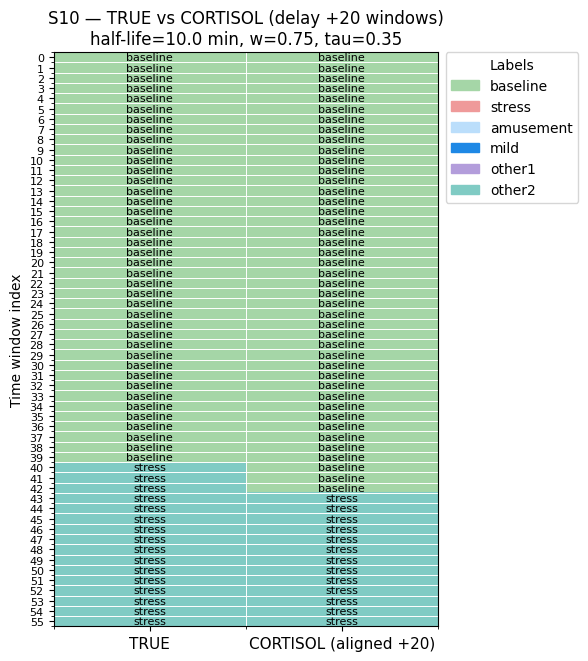

In [ ]:
df_s10 = summarize_subject(df_all_bilstm, "S10", params_by_fold)  # params_by_fold["S10"] used inside
print(df_s10.to_string(index=False))
plot_alignment_table_subject(df_all_bilstm, "S10", params_by_fold)


test_subject  delay_windows  half_life_min  w_blend  tau  exact_agree  stress_agree  p_raw_max  p_lag_max  cort_max  sensitivity_mean  sensitivity_min  sensitivity_max  null_stress_agree
         S11             20           10.0     0.75 0.35     0.744444      0.744444    0.63804    0.55013 14.764925          0.706584         0.622222         0.777778                0.5


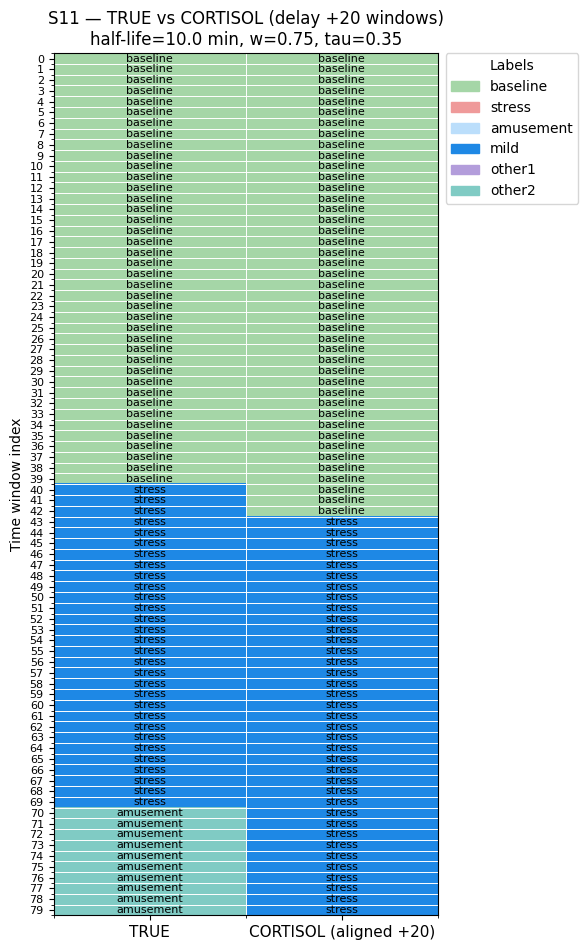

In [ ]:
df_s10 = summarize_subject(df_all_bilstm, "S11", params_by_fold)  # params_by_fold["S10"] used inside
print(df_s10.to_string(index=False))
plot_alignment_table_subject(df_all_bilstm, "S11", params_by_fold)


experiment H - CORTISOL MAPPING

In [ ]:
# ==== CHECKPOINT INSPECTOR ====
import re, itertools
from pathlib import Path
import torch

MODEL_ROOT = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg")

def load_state_dict_any(p: Path):
    blob = torch.load(p, map_location="cpu", weights_only=False)
    if isinstance(blob, dict) and "model_state" in blob:
        return blob["model_state"]
    if isinstance(blob, dict):
        return blob
    if hasattr(blob, "state_dict"):
        return blob.state_dict()
    raise ValueError("Unrecognized checkpoint format")

def inspect_checkpoint(ckpt_path: Path):
    sd = load_state_dict_any(ckpt_path)

    keys = sorted(sd.keys())
    print(f"\n== {ckpt_path.name} ==")
    print(f"Total params: {len(keys)}")

    # group prefixes
    prefixes = sorted(set(k.split('.',1)[0] for k in keys))
    print("Top-level modules:", prefixes)

    # conv summary
    if "conv.0.weight" in sd:
        k1 = sd["conv.0.weight"].shape[-1]
        c0_out = sd["conv.0.weight"].shape[0]
        has_bn1 = "conv.1.running_mean" in sd
        print(f"conv.0: Conv1d(in=?, out={c0_out}, k={k1}), BN@1={has_bn1}")
    if "conv.4.weight" in sd:
        k2 = sd["conv.4.weight"].shape[-1]
        c4_in  = sd["conv.4.weight"].shape[1]
        c4_out = sd["conv.4.weight"].shape[0]
        has_bn5 = "conv.5.running_mean" in sd
        print(f"conv.4: Conv1d(in={c4_in}, out={c4_out}, k={k2}), BN@5={has_bn5}")

    # lstm summary
    if "lstm.weight_hh_l0" in sd:
        hidden = sd["lstm.weight_hh_l0"].shape[1]
        print(f"lstm: hidden={hidden}, bidirectional=True, layers=1")

    # head summary
    if "head.0.weight" in sd and "head.3.weight" in sd:
        fc_in  = sd["head.0.weight"].shape[1]
        fc_h   = sd["head.0.weight"].shape[0]
        fc_out = sd["head.3.weight"].shape[0]
        print(f"head: Linear({fc_in}->{fc_h}) + ReLU + (Dropout?) + Linear({fc_h}->{fc_out})")
    else:
        # print a few tail keys just in case
        print("head: couldn't find head.0/head.3; tail keys:")
        for k in keys[-10:]:
            print("  ", k, sd[k].shape)

    # quick peek at first 15 keys
    print("\nSample keys:")
    for k in itertools.islice(keys, 0, 15):
        print(" ", k, sd[k].shape)

# list folds and inspect the first one; set inspect_all=True to loop all
fold_dirs = sorted([d for d in MODEL_ROOT.iterdir() if d.is_dir() and re.match(r"^fold_\d+_S\d+$", d.name)],
                   key=lambda p: int(re.search(r"fold_(\d+)", p.name).group(1)))
print("Found folds:", [d.name for d in fold_dirs])
if not fold_dirs:
    raise SystemExit("No fold_XX_SYY directories found.")

inspect_all = False  # flip to True if you want a full pass
if inspect_all:
    for d in fold_dirs:
        ckpt = d / "model.pt"
        if ckpt.exists():
            inspect_checkpoint(ckpt)
else:
    d = fold_dirs[0]
    ckpt = d / "model.pt"
    print("\nInspecting:", ckpt)
    inspect_checkpoint(ckpt)


Found folds: ['fold_01_S2', 'fold_02_S3', 'fold_03_S4', 'fold_04_S5', 'fold_05_S6', 'fold_06_S7', 'fold_07_S8', 'fold_08_S9', 'fold_09_S10', 'fold_10_S11', 'fold_11_S13', 'fold_12_S14', 'fold_13_S15', 'fold_14_S16', 'fold_15_S17']

Inspecting: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_01_S2/model.pt

== model.pt ==
Total params: 26
Top-level modules: ['conv', 'head', 'lstm']
conv.0: Conv1d(in=?, out=64, k=5), BN@1=True
conv.4: Conv1d(in=64, out=128, k=5), BN@5=True
lstm: hidden=128, bidirectional=True, layers=1
head: Linear(256->128) + ReLU + (Dropout?) + Linear(128->3)

Sample keys:
  conv.0.bias torch.Size([64])
  conv.0.weight torch.Size([64, 14, 5])
  conv.1.bias torch.Size([64])
  conv.1.num_batches_tracked torch.Size([])
  conv.1.running_mean torch.Size([64])
  conv.1.running_var torch.Size([64])
  conv.1.weight torch.Size([64])
  conv.4.bias torch.Size([128])
  conv.4.weight torch.Size([128, 64, 5])
  conv.5.bias torch.Size([128])
  

In [ ]:
# === Add-on: Cortisol proxy export for Experiment H (chestdelta20) — post hoc ===
import os, math, re
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset

# --- allowlist TorchVersion once (same as your pattern) ---
try:
    from torch.serialization import add_safe_globals
    import torch.torch_version as tv
    add_safe_globals([tv.TorchVersion])
except Exception:
    pass

# --- small math helpers (unchanged) ---
def _softmax(x: np.ndarray) -> np.ndarray:
    x = x - x.max(axis=1, keepdims=True)
    e = np.exp(x)
    return e / np.clip(e.sum(axis=1, keepdims=True), 1e-12, None)

def _ema(p: np.ndarray, half_life_steps: int = 10) -> np.ndarray:
    if len(p) == 0: return p
    alpha = 1.0 - math.pow(0.5, 1.0 / max(1, half_life_steps))
    o = np.empty_like(p); o[0] = p[0]
    for i in range(1, len(p)): o[i] = (1 - alpha) * o[i - 1] + alpha * p[i]
    return o

def _p_to_cortisol(p_raw: np.ndarray, p_lag: np.ndarray,
                   c_min: float = 5.0, c_max: float = 20.0, w: float = 0.7) -> np.ndarray:
    pb = np.clip(w * p_lag + (1 - w) * p_raw, 0, 1)
    return c_min + (c_max - c_min) * pb

# --- construct a model that matches ckpt names/shapes (conv.*, lstm.*, head.*)
def _build_model_from_ckpt(state_dict: dict, in_ch: int, n_classes_target: int = 3) -> nn.Module:
    sd = state_dict
    # conv block
    k1 = sd["conv.0.weight"].shape[-1]
    c0 = sd["conv.0.weight"].shape[0]
    has_bn1 = "conv.1.running_mean" in sd
    k2 = sd["conv.4.weight"].shape[-1]
    c4in = sd["conv.4.weight"].shape[1]
    c4  = sd["conv.4.weight"].shape[0]
    has_bn5 = "conv.5.running_mean" in sd
    assert c4in == c0, "ckpt conv channel mismatch"

    conv = nn.Sequential()
    conv.add_module("0", nn.Conv1d(in_ch, c0, kernel_size=k1, padding=k1//2, bias=("conv.0.bias" in sd)))
    conv.add_module("1", nn.BatchNorm1d(c0) if has_bn1 else nn.Identity())
    conv.add_module("2", nn.ReLU(inplace=True))
    conv.add_module("3", nn.ReLU(inplace=True))  # keep index so next is .4
    conv.add_module("4", nn.Conv1d(c0, c4, kernel_size=k2, padding=k2//2, bias=("conv.4.bias" in sd)))
    conv.add_module("5", nn.BatchNorm1d(c4) if has_bn5 else nn.Identity())

    hidden = sd["lstm.weight_hh_l0"].shape[1]
    lstm = nn.LSTM(input_size=c4, hidden_size=hidden, num_layers=1,
                   bidirectional=True, batch_first=True)

    fc_in  = sd["head.0.weight"].shape[1]   # should be 2*hidden
    fc_h   = sd["head.0.weight"].shape[0]
    fc_out = sd["head.3.weight"].shape[0]
    assert fc_in == 2*hidden, "ckpt head input != 2*hidden"

    head = nn.Sequential(
        nn.Linear(fc_in, fc_h),   # head.0
        nn.ReLU(inplace=True),    # head.1
        nn.Dropout(0.0),          # head.2 placeholder
        nn.Linear(fc_h, fc_out),  # head.3
    )

    class _M(nn.Module):
        def __init__(self):
            super().__init__()
            self.conv = conv
            self.lstm = lstm
            self.head = head
        def forward(self, x):
            x = x.transpose(1, 2)   # [B,F,T]
            x = self.conv(x)        # [B,C,T]
            x = x.transpose(1, 2)   # [B,T,C]
            y, _ = self.lstm(x)     # [B,T,2*hidden]
            y = y.mean(dim=1)       # mean pool
            return self.head(y)     # [B,fc_out]

    m = _M()
    m.load_state_dict(sd, strict=False)
    if fc_out != n_classes_target:
        m = nn.Sequential(m, nn.Linear(fc_out, n_classes_target, bias=True))
    return m

# --- exporter (mirrors your previous structure; loops fold_XX_SYY/model.pt) ---
def export_cortisol_for_experiment_h(
    track_key="chestdelta20",
    stress_class=1,
    half_life_steps=10,
    c_min=5.0, c_max=20.0, w=0.7,
    model_root=Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg"),
    feat_root=Path("/content/wesad/features/windows"),
):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    feat_dir  = feat_root / track_key
    if not feat_dir.exists():
        print(f"[{track_key}] features dir missing: {feat_dir}")
        return

    # +20-min lag inferred from track name
    try: delay_min = int(track_key.split("delta")[-1])
    except Exception: delay_min = 20

    # discover your folds
    fold_dirs = sorted(
        [d for d in model_root.iterdir() if d.is_dir() and re.match(r"^fold_\d+_S\d+$", d.name)],
        key=lambda p: int(re.search(r"fold_(\d+)", p.name).group(1))
    )
    if not fold_dirs:
        print(f"[{track_key}] no fold_XX_SYY dirs under {model_root}")
        return

    for fold_dir in fold_dirs:
        m = re.match(r"^fold_(\d+)_((?:S)\d+)$", fold_dir.name)
        k = int(m.group(1)); test_sid = m.group(2)
        ckpt_path = fold_dir / "model.pt"
        if not ckpt_path.exists():
            print(f"[{track_key}] {fold_dir.name}: missing model.pt — skipping.")
            continue

        # --- load features & (optional) robust APR remap with fixed physio delay ---
        Xte_full, yte_full, labels_te, _ = load_npz(feat_dir, test_sid)
        if "relabel_to_APR_robust" in globals():
            yA, m_te = relabel_to_APR_robust(
                yte_full, labels_te, X=Xte_full, stride_sec=60,
                peak_delay_min=delay_min, anticipation_min=10, peak_width_min=6, recovery_min=20
            )
        else:
            yA, m_te = yte_full, np.ones(len(yte_full), dtype=bool)

        if m_te.sum() == 0:
            print(f"[{track_key}] {fold_dir.name}: no APR test windows — skipping cortisol.")
            continue
        Xte, yte = Xte_full[m_te], yA[m_te]

        # --- scale (quick-fit like before; swap to train-scaler if you saved it) ---
        sc   = fit_scaler_on_train(Xte)
        XteS = apply_scaler(sc, Xte)

        dl_te = DataLoader(
            TensorDataset(torch.as_tensor(XteS, dtype=torch.float32),
                          torch.as_tensor(yte,  dtype=torch.long)),
            batch_size=256, shuffle=False,
            num_workers=min(8, os.cpu_count() or 2),
            prefetch_factor=2, persistent_workers=False,
            pin_memory=torch.cuda.is_available(), drop_last=False
        )

        # --- rebuild model to match checkpoint & run inference ---
        blob = torch.load(ckpt_path, map_location=device, weights_only=False)
        state_dict = blob["model_state"] if isinstance(blob, dict) and "model_state" in blob else (blob.state_dict() if hasattr(blob,"state_dict") else blob)

        T, F = Xte.shape[1], Xte.shape[2]
        model = _build_model_from_ckpt(state_dict, in_ch=F, n_classes_target=3).to(device)
        model.eval()

        logits_list, y_true_list = [], []
        with torch.no_grad():
            for xb, yb in dl_te:
                xb = xb.to(device, non_blocking=True)
                out = model(xb)  # [B, 3] logits
                logits_list.append(out.detach().cpu().numpy())
                y_true_list.append(yb.numpy())

        logits = np.concatenate(logits_list, axis=0)
        y_true = np.concatenate(y_true_list, axis=0).astype(int)

        # --- stress prob → EMA → cortisol proxy (exactly like before) ---
        probs    = _softmax(logits)
        p_raw    = probs[:, stress_class]
        p_lag    = _ema(p_raw, half_life_steps=half_life_steps)
        cortisol = _p_to_cortisol(p_raw, p_lag, c_min=c_min, c_max=c_max, w=w)

        # --- save CSV & quick plots (same filenames pattern) ---
        out_dir = fold_dir / "cortisol"
        out_dir.mkdir(parents=True, exist_ok=True)

        pd.DataFrame({
            "idx": np.arange(len(p_raw)),
            "y_true": y_true,
            "p_stress_raw": p_raw,
            "p_stress_lag": p_lag,
            "cortisol_proxy_nmol_per_L": cortisol
        }).to_csv(out_dir / f"{fold_dir.name}_cortisol_trace.csv", index=False)

        plt.figure(figsize=(10, 4))
        plt.plot(p_raw, label="p(stress) raw")
        plt.plot(p_lag, label="p(stress) lag (EMA)")
        plt.legend(); plt.xlabel("Window idx"); plt.ylabel("Probability")
        plt.title(f"{track_key} {fold_dir.name} — Stress prob")
        plt.tight_layout(); plt.savefig(out_dir / f"{fold_dir.name}_p_stress.png", dpi=200); plt.close()

        plt.figure(figsize=(10, 4))
        plt.plot(cortisol)
        plt.xlabel("Window idx"); plt.ylabel("Cortisol (nmol/L)")
        plt.title(f"{track_key} {fold_dir.name} — Proxy cortisol")
        plt.tight_layout(); plt.savefig(out_dir / f"{fold_dir.name}_cortisol.png", dpi=200); plt.close()

        print(f"[{track_key}] {fold_dir.name}: cortisol saved → {out_dir}")

# --- run it (keeps the +20 min lag convention via chestdelta20) ---
export_cortisol_for_experiment_h(
    track_key="chestdelta20",
    stress_class=1,
    half_life_steps=10,
    c_min=5.0, c_max=20.0, w=0.7,
    model_root=Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg"),
    feat_root=Path("/content/wesad/features/windows"),
)


[chestdelta20] fold_01_S2: cortisol saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_01_S2/cortisol
[chestdelta20] fold_02_S3: cortisol saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_02_S3/cortisol
[chestdelta20] fold_03_S4: cortisol saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_03_S4/cortisol
[chestdelta20] fold_04_S5: cortisol saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_04_S5/cortisol
[chestdelta20] fold_05_S6: cortisol saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_05_S6/cortisol
[chestdelta20] fold_06_S7: cortisol saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_06_S7/cortisol
[chestdelta20] fold_07_S8: cortisol saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_

In [ ]:
# === Wrist-style stress vs cortisol mapping tables & overlay plots (per fold) ===
import glob
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

MODEL_ROOT = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg")
TRACK_KEY  = "chestdelta20"   # title-only

# mapping settings (match your export):
W_BLEND = 0.7       # p_blend = W_BLEND*p_lag + (1-W_BLEND)*p_raw
THRESH  = 0.5       # binary stress detection on p_blend

csv_paths = sorted(glob.glob(str(MODEL_ROOT / "fold_*_S*" / "cortisol" / "*_cortisol_trace.csv")))
if not csv_paths:
    print("No cortisol traces found under:", MODEL_ROOT)
else:
    for path in csv_paths:
        fold_dir = Path(path).parent.parent      # .../fold_XX_SYY
        fold_str = fold_dir.name

        df = pd.read_csv(path)
        p_raw = df["p_stress_raw"].values
        p_lag = df["p_stress_lag"].values
        p_blend = np.clip(W_BLEND*p_lag + (1.0-W_BLEND)*p_raw, 0, 1)

        stress_detection = (p_blend >= THRESH).astype(int)
        cortisol = df["cortisol_proxy_nmol_per_L"].values

        out_df = pd.DataFrame({
            "idx": np.arange(len(p_blend)),
            "stress_prob": p_blend,
            "stress_detection": stress_detection,
            "cortisol_proxy_nmol_per_L": cortisol
        })

        out_csv = fold_dir / "cortisol" / f"{fold_str}_mapping_table.csv"
        out_df.to_csv(out_csv, index=False)

        # overlay plot
        plt.figure(figsize=(10, 4.5))
        ax1 = plt.gca()
        ax1.plot(out_df["idx"], out_df["stress_prob"], label="Stress prob")
        ax1.set_ylim(-0.05, 1.05)
        ax1.set_xlabel("Window idx")
        ax1.set_ylabel("Stress probability")
        ax2 = ax1.twinx()
        ax2.plot(out_df["idx"], out_df["cortisol_proxy_nmol_per_L"], label="Cortisol")
        ax2.set_ylabel("Cortisol (nmol/L)")
        plt.title(f"{TRACK_KEY} {fold_str} — Stress vs Cortisol")
        plt.tight_layout()
        out_png = fold_dir / "cortisol" / f"{fold_str}_stress_vs_cortisol.png"
        plt.savefig(out_png, dpi=200)
        plt.close()

        print(f"[{TRACK_KEY}] {fold_str}: saved table → {out_csv}, plot → {out_png}")

    # quick peek
    first = pd.read_csv(csv_paths[0])
    print("\nPreview of first cortisol trace file:")
    print(first.head())


[chestdelta20] fold_01_S2: saved table → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_01_S2/cortisol/fold_01_S2_mapping_table.csv, plot → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_01_S2/cortisol/fold_01_S2_stress_vs_cortisol.png
[chestdelta20] fold_02_S3: saved table → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_02_S3/cortisol/fold_02_S3_mapping_table.csv, plot → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_02_S3/cortisol/fold_02_S3_stress_vs_cortisol.png
[chestdelta20] fold_03_S4: saved table → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_03_S4/cortisol/fold_03_S4_mapping_table.csv, plot → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_03_S4/cortisol/fold_03_S4_stress_vs_cortisol.png
[chestdelta20] fold_04_S5: saved table → /cont

In [ ]:
# === Wrist-style 2-column tables (stress_detection, cortisol_nmol_L) + combined ===
import glob
from pathlib import Path
import numpy as np
import pandas as pd

MODEL_ROOT = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg")

W_BLEND = 0.7
THRESH  = 0.5

csv_paths = sorted(glob.glob(str(MODEL_ROOT / "fold_*_S*" / "cortisol" / "*_cortisol_trace.csv")))
if not csv_paths:
    raise FileNotFoundError(f"No cortisol traces found under {MODEL_ROOT}/fold_XX_SYY/cortisol/*.csv")

all_rows = []
for path in csv_paths:
    fold_dir = Path(path).parent.parent
    fold_str = fold_dir.name

    df = pd.read_csv(path)

    if {"p_stress_raw","p_stress_lag"}.issubset(df.columns):
        p_blend = np.clip(W_BLEND*df["p_stress_lag"].values + (1.0-W_BLEND)*df["p_stress_raw"].values, 0, 1)
    elif "stress_prob" in df.columns:
        p_blend = df["stress_prob"].values
    else:
        # derive from cortisol if only cortisol present (uses 5..20 mapping)
        C = df["cortisol_proxy_nmol_per_L"].values
        p_blend = np.clip((C - 5.0) / 15.0, 0, 1)

    stress_detection = (p_blend >= THRESH).astype(int)
    cortisol = df["cortisol_proxy_nmol_per_L"].values

    wrist_df = pd.DataFrame({
        "stress_detection": stress_detection,
        "cortisol_nmol_L": cortisol
    })

    out_csv = fold_dir / "cortisol" / f"{fold_str}_wrist_style_table.csv"
    wrist_df.to_csv(out_csv, index=False)
    print(f"{fold_str}: wrist-style saved → {out_csv} (N={len(wrist_df)})")

    wrist_df_all = wrist_df.copy()
    wrist_df_all.insert(0, "idx", np.arange(len(wrist_df_all)))
    wrist_df_all.insert(0, "fold", fold_str)
    all_rows.append(wrist_df_all)

# combined across all folds
all_tbl = pd.concat(all_rows, axis=0, ignore_index=True)
all_csv = MODEL_ROOT / "wrist_style_all_folds.csv"
all_tbl.to_csv(all_csv, index=False)
print(f"\nCombined wrist-style table → {all_csv}")
print("\nPreview:")
print(all_tbl.head(10).to_string(index=False))


fold_01_S2: wrist-style saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_01_S2/cortisol/fold_01_S2_wrist_style_table.csv (N=110)
fold_02_S3: wrist-style saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_02_S3/cortisol/fold_02_S3_wrist_style_table.csv (N=110)
fold_03_S4: wrist-style saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_03_S4/cortisol/fold_03_S4_wrist_style_table.csv (N=93)
fold_04_S5: wrist-style saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_04_S5/cortisol/fold_04_S5_wrist_style_table.csv (N=87)
fold_05_S6: wrist-style saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_05_S6/cortisol/fold_05_S6_wrist_style_table.csv (N=110)
fold_06_S7: wrist-style saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_06

In [ ]:
# === TRUE/DETECT vs CORTISOL (aligned) heatmap per fold ===
import glob
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Patch

MODEL_ROOT = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg")
TRACK_KEY  = "chestdelta20"

LEFT_MODE = "TRUE"      # or "DETECT"
ytrue_map = {0:"baseline", 1:"stress", 2:"amusement"}

# cortisol buckets (nmol/L)
MILD_LO, STRESS_HI = 7.0, 15.0
W_BLEND, DETECT_TAU = 0.7, 0.5

# figure title bits
HALF_LIFE_MIN = 20
DELAY_WINDOWS = 20
A_VAL, B_VAL  = 18, 8   # title-only cosmetics (not used in mapping here)

def cortisol_state(c):
    if c < MILD_LO: return "baseline"
    if c < STRESS_HI: return "mild"
    return "stress"

def blended_prob(df):
    if {"p_stress_raw","p_stress_lag"}.issubset(df.columns):
        return np.clip(W_BLEND*df["p_stress_lag"].values + (1.0-W_BLEND)*df["p_stress_raw"].values, 0, 1)
    if "stress_prob" in df.columns:
        return df["stress_prob"].values
    if "cortisol_proxy_nmol_per_L" in df.columns:  # inverse of 5..20 mapping
        C = df["cortisol_proxy_nmol_per_L"].values
        return np.clip((C - 5.0) / 15.0, 0, 1)
    raise ValueError("No probability columns to compute DETECT.")

def make_palette(labels):
    labs = sorted(labels)
    base = sns.color_palette("Set2", n_colors=len(labs))
    return {lab: base[i] for i, lab in enumerate(labs)}

csv_paths = sorted(glob.glob(str(MODEL_ROOT / "fold_*_S*" / "cortisol" / "*_cortisol_trace.csv")))
if not csv_paths:
    raise FileNotFoundError(f"no cortisol traces found under {MODEL_ROOT}/fold_XX_SYY/cortisol/*.csv")

for path in csv_paths:
    fold_dir = Path(path).parent.parent
    fold_str = fold_dir.name

    df = pd.read_csv(path)
    N = len(df)

    # right column
    cortisol = df["cortisol_proxy_nmol_per_L"].values
    cort_states = [cortisol_state(c) for c in cortisol]

    # left column (TRUE or DETECT)
    if LEFT_MODE.upper() == "TRUE":
        if "y_true" not in df.columns:
            print(f"{fold_str}: missing y_true for TRUE mode, skipping.")
            continue
        left_labels = [ytrue_map.get(int(v), str(int(v))) for v in df["y_true"].values]
        left_title = "TRUE"
    else:
        p = blended_prob(df)
        left_labels = ["stress" if v >= DETECT_TAU else "baseline" for v in p]
        left_title = "DETECT"

    vis = pd.DataFrame({
        left_title: left_labels,
        "CORTISOL (aligned)": cort_states
    }, index=np.arange(N))

    cats = sorted(set(left_labels) | set(cort_states))
    cat2id = {c:i for i,c in enumerate(cats)}
    pal = make_palette(cats)
    mat = vis.applymap(lambda x: cat2id[x]).to_numpy()

    h = max(8, N * 0.12)
    plt.figure(figsize=(6, h))
    ax = sns.heatmap(
        mat,
        cmap=[pal[c] for c in cats],
        cbar=False,
        linewidths=0.5,
        linecolor="white",
        xticklabels=[left_title, "CORTISOL (aligned)"],
        yticklabels=np.arange(N)
    )

    if N > 60:
        step = int(np.ceil(N / 30))
        ax.set_yticks(np.arange(0, N, step))
        ax.set_yticklabels(np.arange(0, N, step), fontsize=8)
    else:
        ax.set_yticklabels(np.arange(N), fontsize=8)

    ax.set_xticklabels([left_title, "CORTISOL (aligned)"], rotation=0, fontsize=11)
    plt.ylabel("Time window index")
    plt.title(
        f"{fold_str.upper()} — {left_title} vs CORTISOL (delay +{DELAY_WINDOWS} windows)\n"
        f"half-life={HALF_LIFE_MIN} min, a={A_VAL}, b={B_VAL}, stress≥{STRESS_HI:.0f} nmol/L",
        fontsize=12
    )

    handles = [Patch(color=pal[l], label=l) for l in cats]
    plt.legend(handles=handles, title="Labels", bbox_to_anchor=(1.02, 1), loc="upper left")

    out_png = fold_dir / "cortisol" / f"{fold_str}_{left_title.lower()}_vs_cortisol_grid.png"
    plt.tight_layout()
    plt.savefig(out_png, dpi=200)
    plt.close()

    print(f"[{TRACK_KEY}] {fold_str}: saved → {out_png}")


/tmp/ipython-input-1256921261.py:80: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_01_S2: saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_01_S2/cortisol/fold_01_S2_true_vs_cortisol_grid.png


/tmp/ipython-input-1256921261.py:80: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_02_S3: saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_02_S3/cortisol/fold_02_S3_true_vs_cortisol_grid.png


/tmp/ipython-input-1256921261.py:80: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_03_S4: saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_03_S4/cortisol/fold_03_S4_true_vs_cortisol_grid.png


/tmp/ipython-input-1256921261.py:80: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_04_S5: saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_04_S5/cortisol/fold_04_S5_true_vs_cortisol_grid.png


/tmp/ipython-input-1256921261.py:80: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_05_S6: saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_05_S6/cortisol/fold_05_S6_true_vs_cortisol_grid.png


/tmp/ipython-input-1256921261.py:80: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_06_S7: saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_06_S7/cortisol/fold_06_S7_true_vs_cortisol_grid.png


/tmp/ipython-input-1256921261.py:80: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_07_S8: saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_07_S8/cortisol/fold_07_S8_true_vs_cortisol_grid.png


/tmp/ipython-input-1256921261.py:80: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_08_S9: saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_08_S9/cortisol/fold_08_S9_true_vs_cortisol_grid.png


/tmp/ipython-input-1256921261.py:80: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_09_S10: saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_09_S10/cortisol/fold_09_S10_true_vs_cortisol_grid.png


/tmp/ipython-input-1256921261.py:80: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_10_S11: saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_10_S11/cortisol/fold_10_S11_true_vs_cortisol_grid.png


/tmp/ipython-input-1256921261.py:80: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_11_S13: saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_11_S13/cortisol/fold_11_S13_true_vs_cortisol_grid.png


/tmp/ipython-input-1256921261.py:80: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_12_S14: saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_12_S14/cortisol/fold_12_S14_true_vs_cortisol_grid.png


/tmp/ipython-input-1256921261.py:80: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_13_S15: saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_13_S15/cortisol/fold_13_S15_true_vs_cortisol_grid.png


/tmp/ipython-input-1256921261.py:80: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_14_S16: saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_14_S16/cortisol/fold_14_S16_true_vs_cortisol_grid.png


/tmp/ipython-input-1256921261.py:80: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  mat = vis.applymap(lambda x: cat2id[x]).to_numpy()


[chestdelta20] fold_15_S17: saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_15_S17/cortisol/fold_15_S17_true_vs_cortisol_grid.png


In [ ]:
# === Build df_all_bilstm (for per-subject mapping helpers) ===
import glob
from pathlib import Path
import numpy as np
import pandas as pd

MODEL_ROOT = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg")
W_BLEND = 0.7

rows = []
csv_paths = sorted(glob.glob(str(MODEL_ROOT / "fold_*_S*" / "cortisol" / "*_cortisol_trace.csv")))
assert csv_paths, f"no cortisol trace CSVs found in {MODEL_ROOT}/fold_XX_SYY/cortisol/"

for path in csv_paths:
    p = Path(path)
    fold_dir = p.parent.parent                     # fold_XX_SYY
    # subject id is the suffix after the last underscore (e.g., S10)
    subject = fold_dir.name.split("_")[-1]

    df = pd.read_csv(path)
    p_raw = df["p_stress_raw"].to_numpy()
    p_lag = df["p_stress_lag"].to_numpy()
    p1 = np.clip(W_BLEND*p_lag + (1.0 - W_BLEND)*p_raw, 0, 1)

    # APR y_true assumed: 0=baseline,1=stress,2=amusement (like your ytrue_map)
    y_true = df["y_true"].astype(int).to_numpy()

    rows.append(pd.DataFrame({
        "subject": subject,
        "window_idx": df["idx"].to_numpy(),
        "true": y_true,
        "p1": p1,
    }))

df_all_bilstm = pd.concat(rows, axis=0, ignore_index=True)
print("df_all_bilstm:", df_all_bilstm.shape)
print(df_all_bilstm.head())


df_all_bilstm: (1393, 4)
  subject  window_idx  true        p1
0      S2           0     0  0.322897
1      S2           1     0  0.322529
2      S2           2     0  0.323307
3      S2           3     0  0.325387
4      S2           4     0  0.328789


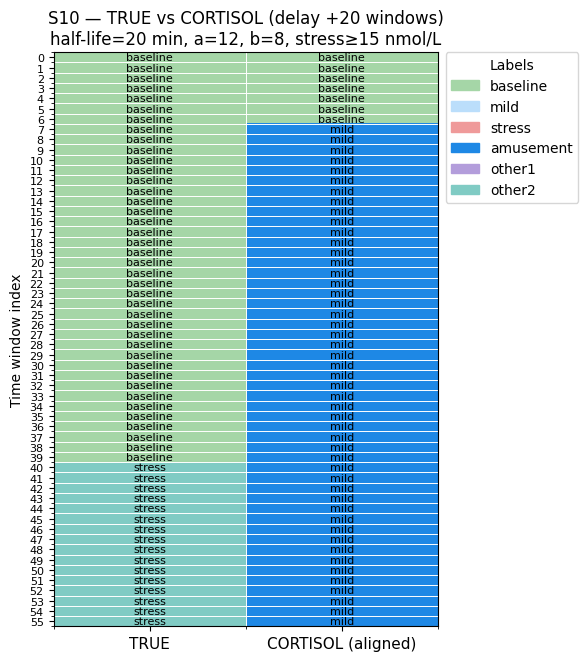

Exact-label agreement (aligned): 12.5%
Stress vs non-stress agreement (aligned): 71.4%
p(stress) raw max: 0.529 | p(stress) lag max: 0.385 | proxy cortisol max: 12.6 nmol/L
BiLSTM mapping metrics: {'subject': 'S10', 'exact_agree': 0.125, 'stress_agree': 0.7142857142857143, 'p_raw_max': 0.528521464, 'p_lag_max': 0.38454102490640213, 'cort_max': 12.614492298876826}


In [ ]:
# === Minimal per-subject mapping helpers (evaluate & plot) ===
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

DATASET_LABEL_NAMES = {0:"baseline", 1:"stress", 2:"amusement"}

def _ema_delay(series, minutes_per_step=1.0, half_life_min=20.0):
    series = np.asarray(series, dtype=float)
    alpha = 1.0 - np.exp(-np.log(2) * minutes_per_step / max(1e-6, half_life_min))
    out = np.zeros_like(series, dtype=float)
    for i, v in enumerate(series):
        out[i] = alpha * v + (1 - alpha) * (out[i-1] if i > 0 else v)
    return out

def _cortisol_band_ids(values, stress_band_min=15.0):
    v = np.asarray(values, dtype=float)
    out = np.full(v.shape, 0, dtype=int)                   # baseline
    out[(v >= 10.0) & (v < stress_band_min)] = 2           # mild
    out[v >= stress_band_min] = 1                          # stress
    return out

def evaluate_mapping_for_subject(df_all, subject_id, stress_class_id=1,
                                 minutes_per_step=1.0, half_life_min=20.0,
                                 a=12.0, b=8.0, stress_band_min=15.0,
                                 align_delay_windows=20):
    g = (df_all[df_all["subject"].astype(str)==str(subject_id)]
         .sort_values("window_idx")).reset_index(drop=True)
    if g.empty: return None
    y_true = g["true"].to_numpy()
    p_raw  = g[f"p{stress_class_id}"].to_numpy()
    p_lag  = _ema_delay(p_raw, minutes_per_step, half_life_min)
    cortisol = a * p_lag + b
    cort_ids = _cortisol_band_ids(cortisol, stress_band_min)

    d = int(max(0, align_delay_windows))
    idx_true = np.arange(0, len(y_true)-d) if d>0 else np.arange(len(y_true))
    idx_cort = idx_true + d if d>0 else idx_true
    y_t = y_true[idx_true]; cort_t = cort_ids[idx_cort]

    exact = float(np.mean(y_t == cort_t)) if len(y_t) else 0.0
    stress_true = (y_t == 1)
    stress_cort = (cort_t == 1)
    stress_agree = float(np.mean(stress_true == stress_cort)) if len(y_t) else 0.0

    return {"subject": str(subject_id),
            "exact_agree": exact, "stress_agree": stress_agree,
            "p_raw_max": float(np.max(p_raw)) if len(p_raw) else 0.0,
            "p_lag_max": float(np.max(p_lag)) if len(p_lag) else 0.0,
            "cort_max": float(np.max(cortisol)) if len(cortisol) else 0.0}

def plot_two_column_mapping(df_all, subject_id, stress_class_id=1,
                            minutes_per_step=1.0, half_life_min=20.0,
                            a=12.0, b=8.0, stress_band_min=15.0,
                            align_delay_windows=20, max_windows=80):
    g = (df_all[df_all["subject"].astype(str)==str(subject_id)]
         .sort_values("window_idx")).reset_index(drop=True)
    assert not g.empty, f"No rows for subject {subject_id}"
    t = g["window_idx"].to_numpy()
    y_true = g["true"].to_numpy()
    p_raw  = g[f"p{stress_class_id}"].to_numpy()

    p_lag   = _ema_delay(p_raw, minutes_per_step, half_life_min)
    cortisol= a * p_lag + b

    def to_cid(c):
        if c < 10.0: return 0
        if c < stress_band_min: return 2
        return 1
    cort_ids = np.array([to_cid(c) for c in cortisol], dtype=int)

    d = int(max(0, align_delay_windows))
    idx_true = np.arange(0, len(t)-d) if d>0 else np.arange(len(t))
    idx_cort = idx_true + d if d>0 else idx_true
    t_sel, y_true_sel, cort_sel = t[idx_true], y_true[idx_true], cort_ids[idx_cort]

    if len(t_sel) > max_windows:
        t_sel, y_true_sel, cort_sel = t_sel[:max_windows], y_true_sel[:max_windows], cort_sel[:max_windows]

    true_names = np.array([DATASET_LABEL_NAMES.get(int(y), str(y)) for y in y_true_sel])
    cort_names = np.array(["baseline" if c==0 else ("mild" if c==2 else "stress") for c in cort_sel])

    names_order = ["baseline","mild","stress","amusement","other1","other2"]
    colors = ["#A5D6A7","#BBDEFB","#EF9A9A","#1E88E5","#B39DDB","#80CBC4"]
    name_to_idx = {n:i for i,n in enumerate(names_order)}
    cmap = ListedColormap(colors)

    N = len(t_sel)
    mat = np.zeros((N,2), dtype=int)
    mat[:,0] = np.array([name_to_idx.get(n,0) for n in true_names])  # TRUE
    mat[:,1] = np.array([name_to_idx.get(n,0) for n in cort_names])  # CORT

    fig, ax = plt.subplots(figsize=(6, max(4, N*0.12)))
    ax.imshow(mat, aspect="auto", cmap=cmap, interpolation="nearest", origin="upper")
    ax.set_xticks([0,1]); ax.set_xticklabels(["TRUE", "CORTISOL (aligned)"], fontsize=11)
    ax.set_yticks(np.arange(N)); ax.set_yticklabels(t_sel, fontsize=8)
    ax.set_ylabel("Time window index")
    ax.set_title(f"{subject_id} — TRUE vs CORTISOL (delay +{d} windows)\n"
                 f"half-life={half_life_min} min, a={a}, b={b}, stress≥{stress_band_min} nmol/L")
    ax.set_xticks(np.arange(-.5, 2, 1), minor=True)
    ax.set_yticks(np.arange(-.5, N, 1), minor=True)
    ax.grid(which="minor", color="white", linestyle="-", linewidth=0.7)
    for i in range(N):
        ax.text(0, i, true_names[i], va="center", ha="center", fontsize=8)
        ax.text(1, i, cort_names[i], va="center", ha="center", fontsize=8)
    handles = [Patch(color=colors[i], label=names_order[i]) for i in range(len(names_order))]
    ax.legend(handles=handles, bbox_to_anchor=(1.02,1), loc="upper left", borderaxespad=0., title="Labels")
    plt.tight_layout(); plt.show()

    exact = float(np.mean(true_names == cort_names)) if N else 0.0
    stress_true = (y_true_sel == 1)
    stress_cort = (cort_names == "stress")
    stress_agree = float(np.mean(stress_true == stress_cort)) if N else 0.0
    print(f"Exact-label agreement (aligned): {100*exact:.1f}%")
    print(f"Stress vs non-stress agreement (aligned): {100*stress_agree:.1f}%")
    print(f"p(stress) raw max: {p_raw.max():.3f} | p(stress) lag max: {p_lag.max():.3f} | "
          f"proxy cortisol max: {(a*p_lag+b).max():.1f} nmol/L")

# --- example usage (pick a subject id like 'S10') ---
best_params = dict(half_life_min=20, a=12, b=8, stress_band_min=15, align_delay_windows=20)
subject_to_plot = "S10"
plot_two_column_mapping(df_all_bilstm, subject_id=subject_to_plot, minutes_per_step=1.0, **best_params)
m = evaluate_mapping_for_subject(df_all_bilstm, subject_id=subject_to_plot, minutes_per_step=1.0, **best_params)
print("BiLSTM mapping metrics:", m)


In [ ]:
import numpy as np
import math

def ema_prob(x: np.ndarray, half_life_steps: float) -> np.ndarray:
    """
    Exponential moving average over a 1D prob series
    with half-life given in steps.
    """
    x = np.asarray(x, dtype=float)
    if x.size == 0:
        return x

    half_life_steps = max(1e-6, float(half_life_steps))
    alpha = 1.0 - math.pow(0.5, 1.0/half_life_steps)

    y = np.empty_like(x, dtype=float)
    y[0] = x[0]
    for i in range(1, len(x)):
        y[i] = (1 - alpha) * y[i-1] + alpha * x[i]
    return y


In [ ]:
import numpy as np
from typing import Tuple

def align_fixed_delay(y: np.ndarray, s: np.ndarray, delay_windows: int) -> Tuple[np.ndarray, np.ndarray]:
    """
    Align y_true[t] with signal s[t+delay] (delay >= 0).
    Keeps only the overlapping region.
    """
    d = max(0, int(delay_windows))
    if d == 0:
        return y, s
    n = min(len(y), len(s) - d)
    if n <= 0:
        return np.array([]), np.array([])
    return y[:n], s[d:d+n]


Best (train) 3-way params: MappingParams3Way(delay_windows=24, half_life_min=15.0, w_blend=0.9, a=18.0, b=6.0, mild_lo=12.0, stress_hi=13.0) | mean exact on train = 64.9%
test_subject  delay_windows  half_life_min  w_blend    a   b  mild_lo  stress_hi  exact_agree  stress_agree  p_raw_max  p_lag_max  cort_max  sensitivity_mean  sensitivity_min  sensitivity_max  null_exact
         S10             24           15.0      0.9 18.0 6.0     12.0       13.0     0.846154      0.961538   0.528521   0.414908 13.552142          0.703704         0.365385         0.884615    0.557692


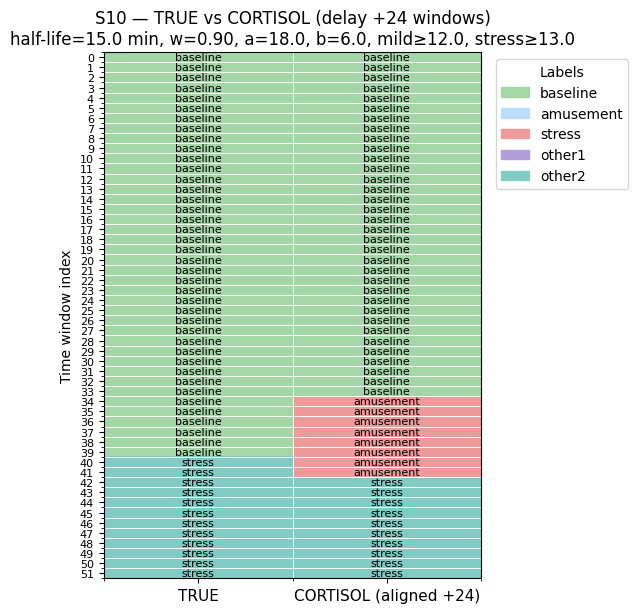

Exact-label agreement (aligned): 84.6%
Stress vs non-stress agreement (aligned): 96.2%
p(stress) raw max: 0.529 | p(stress) lag max: 0.415 | proxy cortisol max: 13.6 nmol/L


In [ ]:
# =========================
# 3-WAY cortisol mapping (baseline / amusement / stress)
# =========================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from dataclasses import dataclass
from itertools import product

# --- labels (dataset side) ---
DATASET_LABEL_NAMES = {0:"baseline", 1:"stress", 2:"amusement"}

# --- dataclass with post-hoc params (no tau; we use bands instead) ---
@dataclass
class MappingParams3Way:
    delay_windows: int = 20         # physiology lag (windows)
    half_life_min: float = 20.0     # EMA half-life (min)
    w_blend: float = 0.7            # blend raw vs EMA: (1-w)*p_raw + w*p_lag
    a: float = 12.0                 # cortisol = a * p_blend + b
    b: float = 8.0
    mild_lo: float = 10.0           # nmol/L: baseline < mild_lo <= amusement < stress_hi
    stress_hi: float = 15.0

# ---- helpers for this 3-way path ----
def _p_to_cortisol_from_blend(p_raw, half_life_min, w_blend, a, b, minutes_per_step=1.0):
    half_steps = float(half_life_min) / float(minutes_per_step)
    p_lag = ema_prob(np.asarray(p_raw, float), half_steps)
    p_blend = (1.0 - w_blend) * np.asarray(p_raw, float) + w_blend * p_lag
    cortisol = a * p_blend + b
    return p_lag, p_blend, cortisol

def _cortisol_to_ids(C, mild_lo=10.0, stress_hi=15.0):
    """Map cortisol (nmol/L) → ids: 0=baseline, 2=amusement(mild), 1=stress."""
    C = np.asarray(C, float)
    ids = np.zeros_like(C, dtype=int)                       # baseline: 0
    ids[(C >= mild_lo) & (C < stress_hi)] = 2               # amusement/mild: 2
    ids[C >= stress_hi] = 1                                 # stress: 1
    return ids

# =========================
# Summarize one subject (3-way)
# =========================
def summarize_subject_3way(df_all, sid, params_or_dict, stress_class_id=1, minutes_per_step=1.0):
    """Return one-row DataFrame with 3-way exact agreement + binary stress agreement."""
    params = params_or_dict[sid] if isinstance(params_or_dict, dict) else params_or_dict

    g = (df_all[df_all["subject"].astype(str) == str(sid)]
         .sort_values("window_idx").reset_index(drop=True))
    if g.empty:
        raise ValueError(f"No rows for subject {sid}")

    y_true = g["true"].to_numpy()                 # 0/1/2  (baseline/stress/amusement)
    p_raw  = g[f"p{stress_class_id}"].to_numpy()  # stress prob (raw or blended in df)

    # 1) lag+blend → cortisol
    p_lag, p_blend, cortisol = _p_to_cortisol_from_blend(
        p_raw, params.half_life_min, params.w_blend, params.a, params.b, minutes_per_step
    )
    cort_ids = _cortisol_to_ids(cortisol, params.mild_lo, params.stress_hi)

    # 2) align TRUE[t] with CORT[t+delay]
    y_sel, c_sel = align_fixed_delay(y_true, cort_ids, params.delay_windows)
    if y_sel.size == 0:
        raise RuntimeError("Aligned series is empty; check delay/windows.")
    # 3-way exact
    exact_agree  = float(np.mean(y_sel == c_sel))
    # binary (stress vs non-stress)
    stress_agree = float(np.mean((y_sel == 1) == (c_sel == 1)))

    # small sensitivity jitter
    sens_scores = []
    for d_half in (-2, 0, +2):
        hl = max(1.0, params.half_life_min + d_half)
        p_lag_s, p_blend_s, C_s = _p_to_cortisol_from_blend(p_raw, hl, params.w_blend, params.a, params.b, minutes_per_step)
        for d_w in (-0.1, 0, +0.1):
            w = float(np.clip(params.w_blend + d_w, 0.0, 1.0))
            _, p_blend_sw, C_sw = _p_to_cortisol_from_blend(p_raw, hl, w, params.a, params.b, minutes_per_step)
            for d_cut in (-1.0, 0, +1.0):
                ids_sw = _cortisol_to_ids(C_sw, params.mild_lo + d_cut, params.stress_hi + d_cut)
                y_a, c_a = align_fixed_delay(y_true, ids_sw, params.delay_windows)
                if y_a.size == 0: continue
                sens_scores.append(np.mean(y_a == c_a))
    sens_mean = float(np.mean(sens_scores)) if sens_scores else np.nan
    sens_min  = float(np.min(sens_scores)) if sens_scores else np.nan
    sens_max  = float(np.max(sens_scores)) if sens_scores else np.nan

    # null (shuffle y within aligned region)
    y_shuf = np.random.permutation(y_sel)
    null_exact = float(np.mean(y_shuf == c_sel))

    return pd.DataFrame([{
        "test_subject": str(sid),
        "delay_windows": int(params.delay_windows),
        "half_life_min": float(params.half_life_min),
        "w_blend": float(params.w_blend),
        "a": float(params.a), "b": float(params.b),
        "mild_lo": float(params.mild_lo), "stress_hi": float(params.stress_hi),
        "exact_agree": exact_agree,
        "stress_agree": stress_agree,
        "p_raw_max": float(np.max(p_raw)) if p_raw.size else 0.0,
        "p_lag_max": float(np.max(p_lag)) if p_lag.size else 0.0,
        "cort_max": float(np.max(cortisol)) if cortisol.size else 0.0,
        "sensitivity_mean": sens_mean, "sensitivity_min": sens_min, "sensitivity_max": sens_max,
        "null_exact": null_exact,
    }])

# =========================
# Plot TRUE vs CORTISOL (aligned) for one subject (3-way)
# =========================
def plot_alignment_table_subject_3way(
    df_all, sid, params_or_dict, stress_class_id=1, minutes_per_step=1.0,
    max_windows=80, DATASET_LABEL_NAMES=None
):
    params = params_or_dict[sid] if isinstance(params_or_dict, dict) else params_or_dict
    if DATASET_LABEL_NAMES is None:
        DATASET_LABEL_NAMES = {0:"baseline", 1:"stress", 2:"amusement"}

    g = (df_all[df_all["subject"].astype(str) == str(sid)]
         .sort_values("window_idx").reset_index(drop=True))
    if g.empty:
        raise ValueError(f"No rows for subject {sid}")

    t      = g["window_idx"].to_numpy()
    y_true = g["true"].to_numpy()
    p_raw  = g[f"p{stress_class_id}"].to_numpy()

    p_lag, p_blend, cortisol = _p_to_cortisol_from_blend(
        p_raw, params.half_life_min, params.w_blend, params.a, params.b, minutes_per_step
    )
    cort_ids = _cortisol_to_ids(cortisol, params.mild_lo, params.stress_hi)

    y_sel, c_sel = align_fixed_delay(y_true, cort_ids, params.delay_windows)
    t_sel = t[:len(y_sel)]

    if len(t_sel) > max_windows:
        t_sel, y_sel, c_sel = t_sel[:max_windows], y_sel[:max_windows], c_sel[:max_windows]

    true_names = np.array([DATASET_LABEL_NAMES.get(int(y), str(y)) for y in y_sel])
    # map cortisol ids to dataset label names (mild -> amusement)
    cort_names = np.where(c_sel==0, "baseline", np.where(c_sel==1, "stress", "amusement"))

    names_order = ["baseline","amusement","stress","other1","other2"]
    colors = ["#A5D6A7","#BBDEFB","#EF9A9A","#B39DDB","#80CBC4"]
    name_to_idx = {n:i for i,n in enumerate(names_order)}
    cmap = ListedColormap(colors)

    N = len(t_sel)
    mat = np.zeros((N, 2), dtype=int)
    mat[:,0] = np.array([name_to_idx.get(n,0) for n in true_names])
    mat[:,1] = np.array([name_to_idx.get(n,0) for n in cort_names])

    fig, ax = plt.subplots(figsize=(6, max(4, N*0.12)))
    ax.imshow(mat, aspect="auto", cmap=cmap, interpolation="nearest", origin="upper")
    ax.set_xticks([0,1]); ax.set_xticklabels(["TRUE", f"CORTISOL (aligned +{params.delay_windows})"], fontsize=11)
    ax.set_yticks(np.arange(N)); ax.set_yticklabels(t_sel, fontsize=8)
    ax.set_ylabel("Time window index")
    ax.set_title(
        f"{sid} — TRUE vs CORTISOL (delay +{params.delay_windows} windows)\n"
        f"half-life={params.half_life_min} min, w={params.w_blend:.2f}, "
        f"a={params.a}, b={params.b}, mild≥{params.mild_lo:.1f}, stress≥{params.stress_hi:.1f}"
    )
    ax.set_xticks(np.arange(-.5, 2, 1), minor=True)
    ax.set_yticks(np.arange(-.5, N, 1), minor=True)
    ax.grid(which="minor", color="white", linestyle="-", linewidth=0.7)
    for i in range(N):
        ax.text(0, i, true_names[i], va="center", ha="center", fontsize=8)
        ax.text(1, i, cort_names[i], va="center", ha="center", fontsize=8)

    handles = [Patch(color=colors[i], label=names_order[i]) for i in range(len(names_order))]
    ax.legend(handles=handles, bbox_to_anchor=(1.02, 1), loc="upper left", title="Labels")
    plt.tight_layout(); plt.show()

    # quick print metrics
    exact = float(np.mean(true_names == cort_names)) if N else 0.0
    stress_true = (y_sel == 1)
    stress_cort = (c_sel == 1)
    stress_agree = float(np.mean(stress_true == stress_cort)) if N else 0.0
    print(f"Exact-label agreement (aligned): {100*exact:.1f}%")
    print(f"Stress vs non-stress agreement (aligned): {100*stress_agree:.1f}%")
    print(f"p(stress) raw max: {p_raw.max():.3f} | p(stress) lag max: {p_lag.max():.3f} | "
          f"proxy cortisol max: {cortisol.max():.1f} nmol/L")

# =========================
# Small train-time calibration to boost exact 3-way alignment
# =========================
def calibrate_3way_params_on_train(
    df_all, train_subjects,
    half_life_grid=(10,15,20,25,30),
    w_grid=(0.3,0.5,0.7,0.9),
    delay_grid=(16,18,20,22,24),
    a_grid=(10,12,14,16,18),
    b_grid=(6,8,10),
    mild_lo_grid=(8.0,10.0,12.0),
    stress_hi_grid=(13.0,14.0,15.0),
    stress_class_id=1,
    minutes_per_step=1.0
):
    best = None
    best_score = -1.0
    for hl, w, d, a, b, ml, sh in product(half_life_grid, w_grid, delay_grid, a_grid, b_grid, mild_lo_grid, stress_hi_grid):
        scores = []
        for sid in train_subjects:
            g = (df_all[df_all["subject"].astype(str)==str(sid)]
                 .sort_values("window_idx").reset_index(drop=True))
            if g.empty: continue
            y = g["true"].to_numpy()
            p_raw = g[f"p{stress_class_id}"].to_numpy()
            _, p_blend, C = _p_to_cortisol_from_blend(p_raw, hl, w, a, b, minutes_per_step)
            ids = _cortisol_to_ids(C, ml, sh)
            y_al, c_al = align_fixed_delay(y, ids, d)
            if y_al.size == 0: continue
            scores.append(np.mean(y_al == c_al))
        if scores:
            m = float(np.mean(scores))
            if m > best_score:
                best_score = m
                best = MappingParams3Way(delay_windows=int(d), half_life_min=float(hl),
                                         w_blend=float(w), a=float(a), b=float(b),
                                         mild_lo=float(ml), stress_hi=float(sh))
    return best, best_score

# =========================
# Example usage
# =========================
subjects = sorted(df_all_bilstm["subject"].astype(str).unique().tolist())
test_sid  = "S10"
train_sids = [s for s in subjects if s != test_sid]
best_params, cv_exact = calibrate_3way_params_on_train(df_all_bilstm, train_sids)
print("Best (train) 3-way params:", best_params, "| mean exact on train =", f"{100*cv_exact:.1f}%")

# summarize & plot for the held-out subject
row = summarize_subject_3way(df_all_bilstm, test_sid, best_params)
print(row.to_string(index=False))
plot_alignment_table_subject_3way(df_all_bilstm, test_sid, best_params)


WRIST - BILSTM

In [ ]:
# === Train & eval BiLSTM on WESAD wrist (delta20) with transfer from chest — FIXED AMP ===
import os, numpy as np, pandas as pd, torch
from pathlib import Path
from torch.utils.data import DataLoader
from sklearn.utils.class_weight import compute_class_weight

# Safety for PyTorch 2.6 loader (leave as-is)
try:
    from torch.serialization import add_safe_globals
    import torch.torch_version as tv
    add_safe_globals([tv.TorchVersion])
except Exception:
    pass

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.backends.cudnn.benchmark = True
if torch.cuda.is_available():
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.set_float32_matmul_precision("high")

proj        = Path("/content/wesad")
track_wrist = "wristdelta20"
feat_dir    = proj/"features"/"windows"/track_wrist
eval_root   = proj/"eval"/f"{track_wrist}_phases_conv"
model_root  = proj/"models"/f"{track_wrist}_phases_conv"
eval_root.mkdir(parents=True, exist_ok=True); model_root.mkdir(parents=True, exist_ok=True)

# ---- helper: partial-load chest weights (skip mismatched tensors like stem when F!=)
def load_chest_into_wrist(chest_best_pt: Path, model: torch.nn.Module):
    if not chest_best_pt.exists():
        print(f"[transfer] chest checkpoint not found: {chest_best_pt} — training wrist from scratch.")
        return
    ck = torch.load(chest_best_pt, map_location="cpu", weights_only=False)
    sd_src = ck["model_state"] if isinstance(ck, dict) and "model_state" in ck else ck
    sd_dst = model.state_dict()
    take = {k:v for k,v in sd_src.items() if k in sd_dst and sd_dst[k].shape == v.shape}
    sd_dst.update(take)
    model.load_state_dict(sd_dst, strict=False)
    print(f"[transfer] loaded {len(take)} tensors from chest; skipped {len(sd_dst)-len(take)}.")

# ---- build LOSO (use your existing helpers present in the env)
if "build_or_load_loso_for" in globals():
    subjects, folds, _ = build_or_load_loso_for(track_wrist, feat_dir)
else:
    subjects, folds, _ = build_or_load_loso(track_wrist, feat_dir)

# ---- configs
BATCH_SIZE   = 256
NUM_WORKERS  = min(8, os.cpu_count() or 2)
LR           = 1e-3
WEIGHT_DECAY = 1e-4
PATIENCE     = 8
MAX_EPOCHS   = 30
WARM_EPOCHS  = 6                # freeze LSTM for first few epochs
CHEST_FOLD_FOR_TRANSFER = 1     # pick any trained chest fold for transfer init

results=[]

for k, fold in enumerate(folds, start=1):
    test_sid = fold["test_subject"]; val_sids = fold.get("val_subjects", []); train_sids = fold["train_subjects"]
    print(f"\n[{track_wrist}] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

    # stack & APR
    def stack_phase(sids):
        Xs, ys = [], []
        for s in sids:
            X, y, labels, _ = load_npz(feat_dir, s)
            yA, m = relabel_to_APR_robust(
                y, labels, X=X, stride_sec=60,
                peak_delay_min=int(track_wrist.split('delta')[-1]),
                anticipation_min=10, peak_width_min=6, recovery_min=20
            )
            if m.sum()==0: continue
            Xs.append(X[m]); ys.append(yA[m])
        return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

    Xtr, ytr = stack_phase(train_sids)
    Xva, yva = stack_phase(val_sids)
    Xte_full, yte_full, labels_te, _ = load_npz(feat_dir, test_sid)
    yteA, m_te = relabel_to_APR_robust(
        yte_full, labels_te, X=Xte_full, stride_sec=60,
        peak_delay_min=int(track_wrist.split('delta')[-1]),
        anticipation_min=10, peak_width_min=6, recovery_min=20
    )
    Xte, yte = (Xte_full[m_te], yteA[m_te]) if m_te.sum()>0 else (None, None)

    if Xtr is None or Xva is None or Xte is None:
        print(f"[{track_wrist}] Fold {k:02d} skipped (no APR windows)."); continue

    # scale
    sc = fit_scaler_on_train(Xtr)
    Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

    # loaders
    dl_tr = DataLoader(SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, shuffle=True,
                       num_workers=NUM_WORKERS, prefetch_factor=4, persistent_workers=False,
                       pin_memory=torch.cuda.is_available(), drop_last=True)
    dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False,
                       num_workers=NUM_WORKERS, prefetch_factor=4, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())
    dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False,
                       num_workers=NUM_WORKERS, prefetch_factor=4, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())

    # model
    T, F = Xtr.shape[1], Xtr.shape[2]; NCLS = 3
    model = ConvStemBiLSTMConcatPool(F, HIDDEN_SIZE, 2, NCLS, bidirectional=True, dropout=0.40).to(device)

    # transfer from chest
    chest_ckpt = proj/"models"/"chestdelta20_phases_conv"/f"fold_{CHEST_FOLD_FOR_TRANSFER:02d}"/"best.pt"
    load_chest_into_wrist(chest_ckpt, model)

    # loss/optim/sched
    cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
    criterion = torch.nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device))
    optim = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
    sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, mode='max', factor=0.5, patience=3, min_lr=1e-5)

    # NEW AMP API
    scaler = torch.amp.GradScaler(enabled=torch.cuda.is_available())

    # paths & resume
    out_dir  = eval_root/f"fold_{k:02d}"
    ckpt_dir = model_root/f"fold_{k:02d}"
    out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)

    start_epoch, bestF = resume_from_last(ckpt_dir, model, optimizer=optim, scheduler=sched, scaler=scaler,
                                          map_location=("cuda" if torch.cuda.is_available() else "cpu"))
    if start_epoch>0: print(f"[resume] starting at epoch {start_epoch}, bestF={bestF}")

    # warm-up: freeze LSTM
    def set_lstm_requires_grad(flag: bool):
        for p in model.lstm.parameters(): p.requires_grad = flag
    set_lstm_requires_grad(False)

    def _epoch(loader, train:bool):
        total, n = 0.0, 0
        all_g, all_p = [], []
        model.train() if train else model.eval()
        for xb, yb in loader:
            xb = xb.to(device, non_blocking=True).contiguous()
            yb = yb.to(device, non_blocking=True)
            # NEW autocast API
            with torch.amp.autocast(device_type="cuda", enabled=torch.cuda.is_available()):
                logits = model(xb)
                loss = criterion(logits, yb)
            if train:
                optim.zero_grad(set_to_none=True)
                # proper AMP sequence: scale → backward → step → update
                scaler.scale(loss).backward()
                scaler.step(optim)
                scaler.update()
            total += loss.detach().item() * xb.size(0); n += xb.size(0)
            all_g.append(yb.detach().cpu()); all_p.append(torch.argmax(logits,1).detach().cpu())
        g = torch.cat(all_g).numpy(); p = torch.cat(all_p).numpy()
        from sklearn.metrics import f1_score, accuracy_score
        return total/max(1,n), f1_score(g,p,average="macro"), accuracy_score(g,p)

    noimp = 0
    bestF = -1.0 if bestF is None else bestF

    for ep in range(start_epoch+1, MAX_EPOCHS+1):
        # unfreeze after warm-up
        if ep == WARM_EPOCHS+1:
            set_lstm_requires_grad(True)

        trL, trF, _ = _epoch(dl_tr, train=True)
        vaL, vaF, _ = _epoch(dl_va, train=False)
        sched.step(vaF)

        bestF_new, best_path = save_best_and_last(
            ckpt_dir=ckpt_dir, model=model, optimizer=optim, scheduler=sched, scaler=scaler,
            epoch=ep, metric_value=vaF, best_metric=bestF,
            extra={"track": track_wrist, "test_subject": str(test_sid)},
            snapshot_every=10
        )
        if best_path is not None:
            bestF = bestF_new; noimp = 0
            print(f"Fold {k:02d} epoch {ep}: new BEST val F1={vaF:.4f}")
        else:
            noimp += 1
            if noimp >= PATIENCE:
                print(f"[early stop] Fold {k:02d} @ epoch {ep} | best F1={bestF:.4f}")
                break

    # test best
    best_ck = torch.load(ckpt_dir/"best.pt", map_location=device, weights_only=False)
    state = best_ck["model_state"] if "model_state" in best_ck else best_ck
    model.load_state_dict(state, strict=True); model.eval()
    teL, teF, teA = _epoch(dl_te, train=False)
    print(f"[{track_wrist}] Fold {k:02d} TEST: Acc={teA:.4f} | Macro-F1={teF:.4f}")
    results.append({"fold":k, "test_subject":test_sid, "acc":float(teA), "f1_macro":float(teF)})

# summary
if results:
    df = pd.DataFrame(results).sort_values("fold")
    df.to_csv(eval_root/"phase_conv_loso_summary.csv", index=False)
    print("\n=== Wrist BiLSTM LOSO summary ===")
    print(df)
    print(df.describe()[["acc","f1_macro"]])
else:
    print("No folds produced results.")



[wristdelta20] Fold 01 | test=S10 | val=['S11', 'S13'] | train_n=12
[transfer] loaded 31 tensors from chest; skipped 1.
[resume] starting at epoch 16, bestF=0.46359703981655204
[early stop] Fold 01 @ epoch 24 | best F1=0.4636
[wristdelta20] Fold 01 TEST: Acc=0.5165 | Macro-F1=0.3447

[wristdelta20] Fold 02 | test=S11 | val=['S13', 'S14'] | train_n=12
[transfer] loaded 31 tensors from chest; skipped 1.
[resume] starting at epoch 31, bestF=0.357615455868731
[wristdelta20] Fold 02 TEST: Acc=0.7341 | Macro-F1=0.4942

[wristdelta20] Fold 03 | test=S13 | val=['S14', 'S15'] | train_n=12
[transfer] loaded 31 tensors from chest; skipped 1.
[resume] starting at epoch 31, bestF=0.4057254391672089
[wristdelta20] Fold 03 TEST: Acc=0.5301 | Macro-F1=0.4067

[wristdelta20] Fold 04 | test=S14 | val=['S15', 'S16'] | train_n=12
[transfer] loaded 31 tensors from chest; skipped 1.
[resume] starting at epoch 31, bestF=0.4915479582146249
[wristdelta20] Fold 04 TEST: Acc=0.6011 | Macro-F1=0.2696

[wristdelt

H1 - WRIST BILSTM

In [ ]:
# ------- Robust project + features pathing (Drive-first, with auto-discovery) -------
from pathlib import Path
import glob

TRACK_WRIST = "wristdelta20"  # keep your naming; change if your folder is named differently

PROJ_DRIVE = Path("/content/drive/MyDrive/wesad")
PROJ_LOCAL = Path("/content/wesad")
proj = PROJ_DRIVE if PROJ_DRIVE.exists() else PROJ_LOCAL

def _find_feat_dir(track_key: str):
    """
    Try the canonical path first, then search common roots for a dir
    that contains NPZ feature files for this track.
    """
    # 1) canonical
    canonical = proj / "features" / "windows" / track_key
    if canonical.exists():
        # sanity: has .npz?
        if list(canonical.glob("*.npz")) or list((canonical).rglob("*.npz")):
            return canonical

    # 2) search everywhere sensible
    roots = [
        proj,
        PROJ_DRIVE, PROJ_LOCAL,
        Path("/content/drive/MyDrive"),
        Path("/content"),
    ]
    # a few tolerant patterns (handles slight naming differences)
    name_variants = [
        track_key,
        track_key.replace("delta", "_delta"),
        track_key.replace("delta", "-delta"),
        track_key.replace("wrist", "WRIST"),
        "wrist*20", "WRIST*20",
    ]
    for root in roots:
        if not root.exists():
            continue
        for pat in name_variants:
            for p in root.rglob(pat):
                if p.is_dir():
                    # accept if it has npz inside (directly or in subdirs)
                    if list(p.glob("*.npz")) or list(p.rglob("*.npz")):
                        return p
    return None

feat_dir = _find_feat_dir(TRACK_WRIST)
if feat_dir is None:
    raise FileNotFoundError(
        f"Could not find NPZ features for '{TRACK_WRIST}'.\n"
        f"Tried under: {proj}, {PROJ_DRIVE}, {PROJ_LOCAL}, /content/drive/MyDrive, /content\n"
        f"Tip: if your folder is named differently (e.g. 'wrist_delta20'), set TRACK_WRIST to that exact name."
    )

track_wrist = TRACK_WRIST  # keep the variable your code uses below
print(f"[paths] Using proj={proj}")
print(f"[paths] Using feat_dir={feat_dir}")


KeyboardInterrupt: 

In [ ]:
# === Train & eval BiLSTM on WESAD wrist (delta20) with transfer from chest — FIXED AMP ===
import os, numpy as np, pandas as pd, torch
from pathlib import Path
from torch.utils.data import DataLoader
from sklearn.utils.class_weight import compute_class_weight

# Safety for PyTorch 2.6 loader (leave as-is)
try:
    from torch.serialization import add_safe_globals
    import torch.torch_version as tv
    add_safe_globals([tv.TorchVersion])
except Exception:
    pass

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.backends.cudnn.benchmark = True
if torch.cuda.is_available():
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.set_float32_matmul_precision("high")

proj        = Path("/content/wesad")
track_wrist = "wristdelta20"
feat_dir    = proj/"features"/"windows"/track_wrist
eval_root   = proj/"eval"/f"{track_wrist}_phases_conv"
model_root  = proj/"models"/f"{track_wrist}_phases_conv"
eval_root.mkdir(parents=True, exist_ok=True); model_root.mkdir(parents=True, exist_ok=True)

# ---- helper: partial-load chest weights (skip mismatched tensors like stem when F!=)
def load_chest_into_wrist(chest_best_pt: Path, model: torch.nn.Module):
    if not chest_best_pt.exists():
        print(f"[transfer] chest checkpoint not found: {chest_best_pt} — training wrist from scratch.")
        return
    ck = torch.load(chest_best_pt, map_location="cpu", weights_only=False)
    sd_src = ck["model_state"] if isinstance(ck, dict) and "model_state" in ck else ck
    sd_dst = model.state_dict()
    take = {k:v for k,v in sd_src.items() if k in sd_dst and sd_dst[k].shape == v.shape}
    sd_dst.update(take)
    model.load_state_dict(sd_dst, strict=False)
    print(f"[transfer] loaded {len(take)} tensors from chest; skipped {len(sd_dst)-len(take)}.")

# ---- build LOSO (use your existing helpers present in the env)
if "build_or_load_loso_for" in globals():
    subjects, folds, _ = build_or_load_loso_for(track_wrist, feat_dir)
else:
    subjects, folds, _ = build_or_load_loso(track_wrist, feat_dir)

# ---- configs
BATCH_SIZE   = 256
NUM_WORKERS  = min(8, os.cpu_count() or 2)
LR           = 1e-3
WEIGHT_DECAY = 1e-4
PATIENCE     = 8
MAX_EPOCHS   = 30
WARM_EPOCHS  = 6                # freeze LSTM for first few epochs
CHEST_FOLD_FOR_TRANSFER = 1     # pick any trained chest fold for transfer init

results=[]

for k, fold in enumerate(folds, start=1):
    test_sid = fold["test_subject"]; val_sids = fold.get("val_subjects", []); train_sids = fold["train_subjects"]
    print(f"\n[{track_wrist}] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

    # stack & APR
    def stack_phase(sids):
        Xs, ys = [], []
        for s in sids:
            X, y, labels, _ = load_npz(feat_dir, s)
            yA, m = relabel_to_APR_robust(
                y, labels, X=X, stride_sec=60,
                peak_delay_min=int(track_wrist.split('delta')[-1]),
                anticipation_min=10, peak_width_min=6, recovery_min=20
            )
            if m.sum()==0: continue
            Xs.append(X[m]); ys.append(yA[m])
        return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

    Xtr, ytr = stack_phase(train_sids)
    Xva, yva = stack_phase(val_sids)
    Xte_full, yte_full, labels_te, _ = load_npz(feat_dir, test_sid)
    yteA, m_te = relabel_to_APR_robust(
        yte_full, labels_te, X=Xte_full, stride_sec=60,
        peak_delay_min=int(track_wrist.split('delta')[-1]),
        anticipation_min=10, peak_width_min=6, recovery_min=20
    )
    Xte, yte = (Xte_full[m_te], yteA[m_te]) if m_te.sum()>0 else (None, None)

    if Xtr is None or Xva is None or Xte is None:
        print(f"[{track_wrist}] Fold {k:02d} skipped (no APR windows)."); continue

    # scale
    sc = fit_scaler_on_train(Xtr)
    Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

    # loaders
    dl_tr = DataLoader(SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, shuffle=True,
                       num_workers=NUM_WORKERS, prefetch_factor=4, persistent_workers=False,
                       pin_memory=torch.cuda.is_available(), drop_last=True)
    dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False,
                       num_workers=NUM_WORKERS, prefetch_factor=4, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())
    dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False,
                       num_workers=NUM_WORKERS, prefetch_factor=4, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())

    # model
    T, F = Xtr.shape[1], Xtr.shape[2]; NCLS = 3
    model = ConvStemBiLSTMConcatPool(F, HIDDEN_SIZE, 2, NCLS, bidirectional=True, dropout=0.40).to(device)

    # transfer from chest
    chest_ckpt = proj/"models"/"chestdelta20_phases_conv"/f"fold_{CHEST_FOLD_FOR_TRANSFER:02d}"/"best.pt"
    load_chest_into_wrist(chest_ckpt, model)

    # loss/optim/sched
    cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
    criterion = torch.nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device))
    optim = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
    sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, mode='max', factor=0.5, patience=3, min_lr=1e-5)

    # NEW AMP API
    scaler = torch.amp.GradScaler(enabled=torch.cuda.is_available())

    # paths & resume
    out_dir  = eval_root/f"fold_{k:02d}"
    ckpt_dir = model_root/f"fold_{k:02d}"
    out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)

    start_epoch, bestF = resume_from_last(ckpt_dir, model, optimizer=optim, scheduler=sched, scaler=scaler,
                                          map_location=("cuda" if torch.cuda.is_available() else "cpu"))
    if start_epoch>0: print(f"[resume] starting at epoch {start_epoch}, bestF={bestF}")

    # warm-up: freeze LSTM
    def set_lstm_requires_grad(flag: bool):
        for p in model.lstm.parameters(): p.requires_grad = flag
    set_lstm_requires_grad(False)

    def _epoch(loader, train:bool):
        total, n = 0.0, 0
        all_g, all_p = [], []
        model.train() if train else model.eval()
        for xb, yb in loader:
            xb = xb.to(device, non_blocking=True).contiguous()
            yb = yb.to(device, non_blocking=True)
            # NEW autocast API
            with torch.amp.autocast(device_type="cuda", enabled=torch.cuda.is_available()):
                logits = model(xb)
                loss = criterion(logits, yb)
            if train:
                optim.zero_grad(set_to_none=True)
                # proper AMP sequence: scale → backward → step → update
                scaler.scale(loss).backward()
                scaler.step(optim)
                scaler.update()
            total += loss.detach().item() * xb.size(0); n += xb.size(0)
            all_g.append(yb.detach().cpu()); all_p.append(torch.argmax(logits,1).detach().cpu())
        g = torch.cat(all_g).numpy(); p = torch.cat(all_p).numpy()
        from sklearn.metrics import f1_score, accuracy_score
        return total/max(1,n), f1_score(g,p,average="macro"), accuracy_score(g,p)

    noimp = 0
    bestF = -1.0 if bestF is None else bestF

    for ep in range(start_epoch+1, MAX_EPOCHS+1):
        # unfreeze after warm-up
        if ep == WARM_EPOCHS+1:
            set_lstm_requires_grad(True)

        trL, trF, _ = _epoch(dl_tr, train=True)
        vaL, vaF, _ = _epoch(dl_va, train=False)
        sched.step(vaF)

        bestF_new, best_path = save_best_and_last(
            ckpt_dir=ckpt_dir, model=model, optimizer=optim, scheduler=sched, scaler=scaler,
            epoch=ep, metric_value=vaF, best_metric=bestF,
            extra={"track": track_wrist, "test_subject": str(test_sid)},
            snapshot_every=10
        )
        if best_path is not None:
            bestF = bestF_new; noimp = 0
            print(f"Fold {k:02d} epoch {ep}: new BEST val F1={vaF:.4f}")
        else:
            noimp += 1
            if noimp >= PATIENCE:
                print(f"[early stop] Fold {k:02d} @ epoch {ep} | best F1={bestF:.4f}")
                break

    # test best
    best_ck = torch.load(ckpt_dir/"best.pt", map_location=device, weights_only=False)
    state = best_ck["model_state"] if "model_state" in best_ck else best_ck
    model.load_state_dict(state, strict=True); model.eval()
    teL, teF, teA = _epoch(dl_te, train=False)
    print(f"[{track_wrist}] Fold {k:02d} TEST: Acc={teA:.4f} | Macro-F1={teF:.4f}")
    results.append({"fold":k, "test_subject":test_sid, "acc":float(teA), "f1_macro":float(teF)})

# summary
if results:
    df = pd.DataFrame(results).sort_values("fold")
    df.to_csv(eval_root/"phase_conv_loso_summary.csv", index=False)
    print("\n=== Wrist BiLSTM LOSO summary ===")
    print(df)
    print(df.describe()[["acc","f1_macro"]])
else:
    print("No folds produced results.")

FileNotFoundError: feat_dir not found: /content/wesad/features/windows/wristdelta20

In [ ]:
# === BiLSTM on WESAD wrist (delta20) — Improved version (sampler + aug + early unfreeze + LR drop) ===
import os, numpy as np, pandas as pd, torch
from pathlib import Path
from torch.utils.data import DataLoader, WeightedRandomSampler
from sklearn.utils.class_weight import compute_class_weight

# ---- Safety for PyTorch 2.6 loader (leave as-is)
try:
    from torch.serialization import add_safe_globals
    import torch.torch_version as tv
    add_safe_globals([tv.TorchVersion])
except Exception:
    pass

# ---- Device & perf knobs
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.backends.cudnn.benchmark = True
if torch.cuda.is_available():
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.set_float32_matmul_precision("high")

# ---- Paths
proj        = Path("/content/wesad")
track_wrist = "wristdelta20"   # change if your wrist windows are named differently
feat_dir    = proj/"features"/"windows"/track_wrist
eval_root   = proj/"eval"/f"{track_wrist}_phases_conv_impr"
model_root  = proj/"models"/f"{track_wrist}_phases_conv_impr"
eval_root.mkdir(parents=True, exist_ok=True); model_root.mkdir(parents=True, exist_ok=True)

# ---- Helper: partial load from chest
def load_chest_into_wrist(chest_best_pt: Path, model: torch.nn.Module):
    if not chest_best_pt.exists():
        print(f"[transfer] chest checkpoint not found: {chest_best_pt} — training wrist from scratch.")
        return
    ck = torch.load(chest_best_pt, map_location="cpu", weights_only=False)
    sd_src = ck["model_state"] if isinstance(ck, dict) and "model_state" in ck else ck
    sd_dst = model.state_dict()
    take = {k:v for k,v in sd_src.items() if k in sd_dst and sd_dst[k].shape == v.shape}
    sd_dst.update(take)
    model.load_state_dict(sd_dst, strict=False)
    print(f"[transfer] loaded {len(take)} tensors from chest; skipped {len(sd_dst)-len(take)}.")

# ---- LOSO folds
if "build_or_load_loso_for" in globals():
    subjects, folds, _ = build_or_load_loso_for(track_wrist, feat_dir)
else:
    subjects, folds, _ = build_or_load_loso(track_wrist, feat_dir)

# ---- Configs (differences vs old approach are marked)
BATCH_SIZE   = 256
NUM_WORKERS  = min(8, os.cpu_count() or 2)
LR           = 1e-3
WEIGHT_DECAY = 1e-4
PATIENCE     = 10         # ↑ was 8
MAX_EPOCHS   = 40         # ↑ was 30
WARM_EPOCHS  = 3          # ↓ was 6 (unfreeze earlier)
CHEST_FOLD_FOR_TRANSFER = 1

# ---- Time masking augmentation (SpecAugment-style)
def time_mask(x: torch.Tensor, max_w: int = 160) -> torch.Tensor:
    B, T, F = x.shape
    if T <= 1: return x
    w = int(torch.randint(1, max_w + 1, (1,)).item())
    w = min(w, T - 1)
    s = int(torch.randint(0, max(1, T - w), (1,)).item())
    x[:, s:s+w, :] = 0
    return x

# ---- Train per fold
results=[]
for k, fold in enumerate(folds, start=1):
    test_sid = fold["test_subject"]; val_sids = fold.get("val_subjects", []); train_sids = fold["train_subjects"]
    print(f"\n[{track_wrist}] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

    # stack & APR
    def stack_phase(sids):
        Xs, ys = [], []
        for s in sids:
            X, y, labels, _ = load_npz(feat_dir, s)
            yA, m = relabel_to_APR_robust(
                y, labels, X=X, stride_sec=60,
                peak_delay_min=int(track_wrist.split('delta')[-1]),
                anticipation_min=10, peak_width_min=6, recovery_min=20
            )
            if m.sum()==0: continue
            Xs.append(X[m]); ys.append(yA[m])
        return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

    Xtr, ytr = stack_phase(train_sids)
    Xva, yva = stack_phase(val_sids)
    Xte_full, yte_full, labels_te, _ = load_npz(feat_dir, test_sid)
    yteA, m_te = relabel_to_APR_robust(
        yte_full, labels_te, X=Xte_full, stride_sec=60,
        peak_delay_min=int(track_wrist.split('delta')[-1]),
        anticipation_min=10, peak_width_min=6, recovery_min=20
    )
    Xte, yte = (Xte_full[m_te], yteA[m_te]) if m_te.sum()>0 else (None, None)

    if Xtr is None or Xva is None or Xte is None:
        print(f"[{track_wrist}] Fold {k:02d} skippped (no APR windows)."); continue

    # scale
    sc = fit_scaler_on_train(Xtr)
    Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

    # loaders — **WeightedRandomSampler** for train
    cls, cnts = np.unique(ytr, return_counts=True)
    w_map = {int(c): float(cnts.sum()/cnts[i]) for i, c in enumerate(cls)}
    sample_weights = torch.tensor([w_map[int(t)] for t in ytr], dtype=torch.float)
    sampler = WeightedRandomSampler(sample_weights, num_samples=len(sample_weights), replacement=True)

    dl_tr = DataLoader(
        SeqDataset(Xtr_s, ytr),
        batch_size=BATCH_SIZE,
        sampler=sampler,            # use sampler (don’t set shuffle=True)
        shuffle=False,
        num_workers=NUM_WORKERS,
        prefetch_factor=4,
        persistent_workers=False,
        pin_memory=torch.cuda.is_available(),
        drop_last=True
    )
    dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False,
                       num_workers=NUM_WORKERS, prefetch_factor=4, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())
    dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False,
                       num_workers=NUM_WORKERS, prefetch_factor=4, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())

    # model
    T, F = Xtr.shape[1], Xtr.shape[2]; NCLS = 3
    model = ConvStemBiLSTMConcatPool(F, HIDDEN_SIZE, 2, NCLS, bidirectional=True, dropout=0.40).to(device)

    # transfer from chest
    chest_ckpt = proj/"models"/"chestdelta20_phases_conv"/f"fold_{CHEST_FOLD_FOR_TRANSFER:02d}"/"best.pt"
    load_chest_into_wrist(chest_ckpt, model)

    # loss/optim/sched
    cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
    criterion = torch.nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device))
    optim = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
    sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, mode='max', factor=0.5, patience=3, min_lr=1e-5)
    scaler = torch.amp.GradScaler(enabled=torch.cuda.is_available())  # new AMP API

    # paths & resume
    out_dir  = eval_root/f"fold_{k:02d}"
    ckpt_dir = model_root/f"fold_{k:02d}"
    out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)

    start_epoch, bestF = resume_from_last(ckpt_dir, model, optimizer=optim, scheduler=sched, scaler=scaler,
                                          map_location=("cuda" if torch.cuda.is_available() else "cpu"))
    if start_epoch>0: print(f"[resume] starting at epoch {start_epoch}, bestF={bestF}")

    # freeze LSTM for warm-up
    def set_lstm_requires_grad(flag: bool):
        for p in model.lstm.parameters(): p.requires_grad = flag
    set_lstm_requires_grad(False)

    def _epoch(loader, train:bool):
        total, n = 0.0, 0
        all_g, all_p = [], []
        model.train() if train else model.eval()
        for xb, yb in loader:
            xb = xb.to(device, non_blocking=True).contiguous()
            yb = yb.to(device, non_blocking=True)

            # time-masking augmentation (train only)
            if train and torch.rand(1).item() < 0.5:
                xb = xb.clone()
                xb = time_mask(xb, max_w=160)

            with torch.amp.autocast(device_type="cuda", enabled=torch.cuda.is_available()):
                logits = model(xb)
                loss   = criterion(logits, yb)
            if train:
                optim.zero_grad(set_to_none=True)
                scaler.scale(loss).backward()
                scaler.step(optim)
                scaler.update()
            total += loss.detach().item() * xb.size(0); n += xb.size(0)
            all_g.append(yb.detach().cpu()); all_p.append(torch.argmax(logits,1).detach().cpu())
        g = torch.cat(all_g).numpy(); p = torch.cat(all_p).numpy()
        from sklearn.metrics import f1_score, accuracy_score
        return total/max(1,n), f1_score(g,p,average="macro"), accuracy_score(g,p)

    noimp = 0
    bestF = -1.0 if bestF is None else bestF

    for ep in range(start_epoch+1, MAX_EPOCHS+1):
        # unfreeze earlier and lower LR on unfreeze
        if ep == WARM_EPOCHS + 1:
            set_lstm_requires_grad(True)
            for pg in optim.param_groups:
                pg["lr"] = LR * 0.3   # LR drop on unfreeze

        trL, trF, _ = _epoch(dl_tr, train=True)
        vaL, vaF, _ = _epoch(dl_va, train=False)
        sched.step(vaF)

        bestF_new, best_path = save_best_and_last(
            ckpt_dir=ckpt_dir, model=model, optimizer=optim, scheduler=sched, scaler=scaler,
            epoch=ep, metric_value=vaF, best_metric=bestF,
            extra={"track": track_wrist, "test_subject": str(test_sid)},
            snapshot_every=10
        )
        if best_path is not None:
            bestF = bestF_new; noimp = 0
            print(f"Fold {k:02d} epoch {ep}: new BEST val F1={vaF:.4f}")
        else:
            noimp += 1
            if noimp >= PATIENCE:
                print(f"[early stop] Fold {k:02d} @ epoch {ep} | best F1={bestF:.4f}")
                break

    # test best
    best_ck = torch.load(ckpt_dir/"best.pt", map_location=device, weights_only=False)
    state = best_ck["model_state"] if "model_state" in best_ck else best_ck
    model.load_state_dict(state, strict=True); model.eval()
    teL, teF, teA = _epoch(dl_te, train=False)
    print(f"[{track_wrist}] Fold {k:02d} TEST: Acc={teA:.4f} | Macro-F1={teF:.4f}")
    results.append({"fold":k, "test_subject":test_sid, "acc":float(teA), "f1_macro":float(teF)})

# ---- Summary
if results:
    df = pd.DataFrame(results).sort_values("fold")
    df.to_csv(eval_root/"phase_conv_loso_summary.csv", index=False)
    print("\Wrist BiLSTM LOSO summary")
    print(df)
    print(df.describe()[["acc","f1_macro"]])
else:
    print("No folds made results.")



[wristdelta20] Fold 01 | test=S10 | val=['S11'] | train_n=13


<>:227: SyntaxWarning: invalid escape sequence '\W'
<>:227: SyntaxWarning: invalid escape sequence '\W'
/tmp/ipython-input-1390247504.py:227: SyntaxWarning: invalid escape sequence '\W'
  print("\Wrist BiLSTM LOSO summary")


[transfer] loaded 31 tensors from chest; skipped 1.
Fold 01 epoch 1: new BEST val F1=0.0239
Fold 01 epoch 4: new BEST val F1=0.0774
Fold 01 epoch 5: new BEST val F1=0.2304
Fold 01 epoch 10: new BEST val F1=0.2467
Fold 01 epoch 14: new BEST val F1=0.2742
Fold 01 epoch 24: new BEST val F1=0.2766
Fold 01 epoch 27: new BEST val F1=0.2802
Fold 01 epoch 28: new BEST val F1=0.2896
Fold 01 epoch 30: new BEST val F1=0.3127
Fold 01 epoch 34: new BEST val F1=0.3179
Fold 01 epoch 36: new BEST val F1=0.3342
Fold 01 epoch 39: new BEST val F1=0.3480
[wristdelta20] Fold 01 TEST: Acc=0.1868 | Macro-F1=0.1117

[wristdelta20] Fold 02 | test=S11 | val=['S10'] | train_n=13
[transfer] loaded 31 tensors from chest; skipped 1.
Fold 02 epoch 1: new BEST val F1=0.0224
Fold 02 epoch 2: new BEST val F1=0.1085
Fold 02 epoch 4: new BEST val F1=0.1231
Fold 02 epoch 6: new BEST val F1=0.1238
Fold 02 epoch 7: new BEST val F1=0.1419
Fold 02 epoch 8: new BEST val F1=0.1917
Fold 02 epoch 14: new BEST val F1=0.1957
Fold 0

In [ ]:
# === BiLSTM on WESAD wrist (delta20) — A/B harness with toggles ===
import os, numpy as np, pandas as pd, torch
from pathlib import Path
from torch.utils.data import DataLoader, WeightedRandomSampler
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import f1_score, accuracy_score, confusion_matrix

# -----------------------------
# EXPERIMENT SWITCHES (A/B)
# -----------------------------
USE_SAMPLER         = False   # True → WeightedRandomSampler (turn OFF if using class weights to avoid double reweight)
USE_TIME_MASK       = False   # True → SpecAugment-style time masking
TIME_MASK_PROB      = 0.5
UNFREEZE_EPOCH      = 6       # 6 = old approach; try 3 for earlier unfreeze, 0 to train LSTM from start
UNFREEZE_LR_MULT    = 1.0     # 1.0 = no LR drop; try 0.3 if you unfreeze early
CHEST_FOLD_FOR_TRANSFER = 1   # try 1,4,7 etc.

# -----------------------------
# Fixed training config (old baseline)
# -----------------------------
BATCH_SIZE   = 256
NUM_WORKERS  = min(8, os.cpu_count() or 2)
LR           = 1e-3
WEIGHT_DECAY = 1e-4
PATIENCE     = 8
MAX_EPOCHS   = 30

# -----------------------------
# Boilerplate
# -----------------------------
try:
    from torch.serialization import add_safe_globals
    import torch.torch_version as tv
    add_safe_globals([tv.TorchVersion])
except Exception:
    pass

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.backends.cudnn.benchmark = True
if torch.cuda.is_available():
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.set_float32_matmul_precision("high")

proj        = Path("/content/wesad")
track_wrist = "wristdelta20"
feat_dir    = proj/"features"/"windows"/track_wrist
eval_root   = proj/"eval"/f"{track_wrist}_phases_conv_ab"
model_root  = proj/"models"/f"{track_wrist}_phases_conv_ab"
eval_root.mkdir(parents=True, exist_ok=True); model_root.mkdir(parents=True, exist_ok=True)

# ---- helper: partial-load chest
def load_chest_into_wrist(chest_best_pt: Path, model: torch.nn.Module):
    if not chest_best_pt.exists():
        print(f"[transfer] chest checkpoint not found: {chest_best_pt} — training wrist from scratch.")
        return
    ck = torch.load(chest_best_pt, map_location="cpu", weights_only=False)
    sd_src = ck["model_state"] if isinstance(ck, dict) and "model_state" in ck else ck
    sd_dst = model.state_dict()
    take = {k:v for k,v in sd_src.items() if k in sd_dst and sd_dst[k].shape == v.shape}
    sd_dst.update(take)
    model.load_state_dict(sd_dst, strict=False)
    print(f"[transfer] loaded {len(take)} tensors from chest; skipped {len(sd_dst)-len(take)}.")

# ---- time masking aug
def time_mask(x: torch.Tensor, max_w: int = 160) -> torch.Tensor:
    B, T, F = x.shape
    if T <= 1: return x
    w = int(torch.randint(1, max_w + 1, (1,)).item())
    w = min(w, T - 1)
    s = int(torch.randint(0, max(1, T - w), (1,)).item())
    x[:, s:s+w, :] = 0
    return x

# ---- LOSO plan
if "build_or_load_loso_for" in globals():
    subjects, folds, _ = build_or_load_loso_for(track_wrist, feat_dir)
else:
    subjects, folds, _ = build_or_load_loso(track_wrist, feat_dir)

# ---- run folds
results=[]; perfold_rows=[]
for k, fold in enumerate(folds, start=1):
    test_sid = fold["test_subject"]; val_sids = fold.get("val_subjects", []); train_sids = fold["train_subjects"]
    print(f"\n[{track_wrist}] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

    # stack & APR
    def stack_phase(sids):
        Xs, ys = [], []
        for s in sids:
            X, y, labels, _ = load_npz(feat_dir, s)
            yA, m = relabel_to_APR_robust(
                y, labels, X=X, stride_sec=60,
                peak_delay_min=int(track_wrist.split('delta')[-1]),
                anticipation_min=10, peak_width_min=6, recovery_min=20
            )
            if m.sum()==0: continue
            Xs.append(X[m]); ys.append(yA[m])
        return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

    Xtr, ytr = stack_phase(train_sids)
    Xva, yva = stack_phase(val_sids)
    Xte_full, yte_full, labels_te, _ = load_npz(feat_dir, test_sid)
    yteA, m_te = relabel_to_APR_robust(
        yte_full, labels_te, X=Xte_full, stride_sec=60,
        peak_delay_min=int(track_wrist.split('delta')[-1]),
        anticipation_min=10, peak_width_min=6, recovery_min=20
    )
    Xte, yte = (Xte_full[m_te], yteA[m_te]) if m_te.sum()>0 else (None, None)
    if Xtr is None or Xva is None or Xte is None:
        print(f"[{track_wrist}] Fold {k:02d} skipped (no APR windows)."); continue

    # scale
    sc = fit_scaler_on_train(Xtr)
    Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

    # loaders
    if USE_SAMPLER:
        cls, cnts = np.unique(ytr, return_counts=True)
        w_map = {int(c): float(cnts.sum()/cnts[i]) for i, c in enumerate(cls)}
        sample_weights = torch.tensor([w_map[int(t)] for t in ytr], dtype=torch.float)
        sampler = WeightedRandomSampler(sample_weights, num_samples=len(sample_weights), replacement=True)
        dl_tr = DataLoader(
            SeqDataset(Xtr_s, ytr),
            batch_size=BATCH_SIZE,
            sampler=sampler,
            shuffle=False,
            num_workers=NUM_WORKERS,
            prefetch_factor=4,
            persistent_workers=False,
            pin_memory=torch.cuda.is_available(),
            drop_last=True
        )
    else:
        dl_tr = DataLoader(
            SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, shuffle=True,
            num_workers=NUM_WORKERS, prefetch_factor=4, persistent_workers=False,
            pin_memory=torch.cuda.is_available(), drop_last=True
        )

    dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False,
                       num_workers=NUM_WORKERS, prefetch_factor=4, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())
    dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False,
                       num_workers=NUM_WORKERS, prefetch_factor=4, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())

    # model
    T, F = Xtr.shape[1], Xtr.shape[2]; NCLS = 3
    model = ConvStemBiLSTMConcatPool(F, HIDDEN_SIZE, 2, NCLS, bidirectional=True, dropout=0.40).to(device)

    # transfer from chest
    chest_ckpt = proj/"models"/"chestdelta20_phases_conv"/f"fold_{CHEST_FOLD_FOR_TRANSFER:02d}"/"best.pt"
    load_chest_into_wrist(chest_ckpt, model)

    # loss/optim/sched (keep **class weights** on by default)
    cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
    criterion = torch.nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device))
    optim = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
    sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, mode='max', factor=0.5, patience=3, min_lr=1e-5)
    scaler = torch.amp.GradScaler(enabled=torch.cuda.is_available())

    # paths & resume
    out_dir  = eval_root/f"fold_{k:02d}"
    ckpt_dir = model_root/f"fold_{k:02d}"
    out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)

    start_epoch, bestF = resume_from_last(ckpt_dir, model, optimizer=optim, scheduler=sched, scaler=scaler,
                                          map_location=("cuda" if torch.cuda.is_available() else "cpu"))
    if start_epoch>0: print(f"[resume] starting at epoch {start_epoch}, bestF={bestF}")

    # freeze LSTM for warm-up
    def set_lstm_requires_grad(flag: bool):
        for p in model.lstm.parameters(): p.requires_grad = flag
    set_lstm_requires_grad(False)

    def _epoch(loader, train:bool):
        total, n = 0.0, 0
        all_g, all_p = [], []
        model.train() if train else model.eval()
        for xb, yb in loader:
            xb = xb.to(device, non_blocking=True).contiguous()
            yb = yb.to(device, non_blocking=True)

            if train and USE_TIME_MASK and torch.rand(1).item() < TIME_MASK_PROB:
                xb = xb.clone(); xb = time_mask(xb, max_w=160)

            with torch.amp.autocast(device_type="cuda", enabled=torch.cuda.is_available()):
                logits = model(xb)
                loss   = criterion(logits, yb)
            if train:
                optim.zero_grad(set_to_none=True)
                scaler.scale(loss).backward()
                scaler.step(optim); scaler.update()
            total += loss.detach().item() * xb.size(0); n += xb.size(0)
            all_g.append(yb.detach().cpu()); all_p.append(torch.argmax(logits,1).detach().cpu())
        g = torch.cat(all_g).numpy(); p = torch.cat(all_p).numpy()
        return total/max(1,n), f1_score(g,p,average="macro"), accuracy_score(g,p), g, p

    noimp = 0
    bestF = -1.0 if bestF is None else bestF

    history=[]
    for ep in range(start_epoch+1, MAX_EPOCHS+1):
        # unfreeze at chosen epoch
        if ep == UNFREEZE_EPOCH + 1:
            set_lstm_requires_grad(True)
            for pg in optim.param_groups:
                pg["lr"] = LR * UNFREEZE_LR_MULT

        trL, trF, _, _, _ = _epoch(dl_tr, train=True)
        vaL, vaF, _, g_val, p_val = _epoch(dl_va, train=False)

        # diagnostics
        f1s = f1_score(g_val, p_val, average=None, labels=[0,1,2])
        cm  = confusion_matrix(g_val, p_val, labels=[0,1,2])
        print(f"Val F1 per-class A/P/R: {np.round(f1s,3)}")
        print("Confusion matrix (rows=GT, cols=Pred):\n", cm)

        sched.step(vaF)
        history.append((ep,trL,trF,vaL,vaF))

        bestF_new, best_path = save_best_and_last(
            ckpt_dir=ckpt_dir, model=model, optimizer=optim, scheduler=sched, scaler=scaler,
            epoch=ep, metric_value=vaF, best_metric=bestF,
            extra={"track": track_wrist, "test_subject": str(test_sid),
                   "use_sampler": USE_SAMPLER, "use_time_mask": USE_TIME_MASK,
                   "unfreeze_epoch": UNFREEZE_EPOCH, "unfreeze_lr_mult": UNFREEZE_LR_MULT},
            snapshot_every=10
        )
        if best_path is not None:
            bestF = bestF_new; noimp = 0
            print(f" Fold {k:02d} epoch {ep}: new BEST val F1={vaF:.4f}")
        else:
            noimp += 1
            if noimp >= PATIENCE:
                print(f"[early stop] Fold {k:02d} @ epoch {ep} | best F1={bestF:.4f}")
                break

    # test best
    best_ck = torch.load(ckpt_dir/"best.pt", map_location=device, weights_only=False)
    state = best_ck["model_state"] if "model_state" in best_ck else best_ck
    model.load_state_dict(state, strict=True); model.eval()
    teL, teF, teA, g_te, p_te = _epoch(dl_te, train=False)
    print(f"[{track_wrist}] Fold {k:02d} TEST: Acc={teA:.4f} | Macro-F1={teF:.4f}")
    results.append({"fold":k, "test_subject":test_sid, "acc":float(teA), "f1_macro":float(teF)})

    # save diagnostics per fold
    pd.DataFrame({"gt":g_te, "pred":p_te}).to_csv(out_dir/"test_preds.csv", index=False)

# ---- Summary
if results:
    df = pd.DataFrame(results).sort_values("fold")
    df.to_csv(eval_root/"phase_conv_loso_summary.csv", index=False)
    print("\n=== Wrist BiLSTM LOSO summary (A/B harness) ===")
    print(df)
    print(df.describe()[["acc","f1_macro"]])
else:
    print("No folds produced results.")



[wristdelta20] Fold 01 | test=S10 | val=['S11'] | train_n=13
[transfer] loaded 31 tensors from chest; skipped 1.
Val F1 per-class A/P/R: [0.024 0.    0.142]
Confusion matrix (rows=GT, cols=Pred):
 [[  2   0   0]
 [ 40   0   0]
 [121   0  10]]
 Fold 01 epoch 1: new BEST val F1=0.0554
Val F1 per-class A/P/R: [0.038 0.484 0.268]
Confusion matrix (rows=GT, cols=Pred):
 [[  2   0   0]
 [  1  15  24]
 [100   7  24]]
 Fold 01 epoch 2: new BEST val F1=0.2634
Val F1 per-class A/P/R: [0.043 0.462 0.36 ]
Confusion matrix (rows=GT, cols=Pred):
 [[ 2  0  0]
 [ 1 15 24]
 [87 10 34]]
 Fold 01 epoch 3: new BEST val F1=0.2883
Val F1 per-class A/P/R: [0.043 0.431 0.468]
Confusion matrix (rows=GT, cols=Pred):
 [[ 2  0  0]
 [13 14 13]
 [76 11 44]]
 Fold 01 epoch 4: new BEST val F1=0.3140
Val F1 per-class A/P/R: [0.051 0.427 0.57 ]
Confusion matrix (rows=GT, cols=Pred):
 [[ 2  0  0]
 [17 16  7]
 [57 19 55]]
 Fold 01 epoch 5: new BEST val F1=0.3493
Val F1 per-class A/P/R: [0.045 0.424 0.573]
Confusion matr

wrist for H Transfer learning

In [ ]:
# ----- paths (drop these right where you define proj/track_wrist/feat_dir) -----
from pathlib import Path

proj        = Path("/content/wesad")  # or your Drive project root if you prefer
track_wrist = "wristdelta20"          # KEEP THIS so your 'delta' parser still returns 20
feat_dir    = Path("/content/drive/MyDrive/wesad/features/windows/wrist∆20")  # Unicode ∆ here

eval_root   = proj/"eval"/f"{track_wrist}_phases_conv_ab"
model_root  = proj/"models"/f"{track_wrist}_phases_conv_ab"
eval_root.mkdir(parents=True, exist_ok=True); model_root.mkdir(parents=True, exist_ok=True)

# quick sanity check
print("feat_dir ->", feat_dir)
from pathlib import Path
npzs = list(feat_dir.rglob("*.npz"))
print("npz count:", len(npzs))
print("sample:", [p.name for p in npzs[:8]])


feat_dir -> /content/drive/MyDrive/wesad/features/windows/wrist∆20
npz count: 0
sample: []


In [ ]:
# ---- Drive-first paths (same style as transformer) ----
from pathlib import Path
BASE = Path("/content/drive/MyDrive/colab_checkpoints/wesad")
WRIST_TRACK_KEY = "wristdelta20"  # keep this (the 'delta' parser needs it)
WIN_DIR = BASE / "features" / "windows" / WRIST_TRACK_KEY

# fallback to the Unicode folder if needed
if not WIN_DIR.exists():
    alt = Path("/content/drive/MyDrive/wesad/features/windows/wrist∆20")
    if alt.exists():
        WIN_DIR = alt
print("[PATHS] using WIN_DIR:", WIN_DIR)

# point your harness here (replaces proj/feat_dir/eval_root/model_root)
feat_dir  = WIN_DIR
eval_root = BASE / "eval"   / f"{WRIST_TRACK_KEY}_phases_conv_ab_h_transfer"
model_root= BASE / "models" / f"{WRIST_TRACK_KEY}_phases_conv_ab_h_transfer"
eval_root.mkdir(parents=True, exist_ok=True)
model_root.mkdir(parents=True, exist_ok=True)


[PATHS] using WIN_DIR: /content/drive/MyDrive/colab_checkpoints/wesad/features/windows/wristdelta20


In [ ]:
# ---- NPZ helpers compatible with both formats ----
import numpy as np

def load_npz_folder(win_dir: Path):
    files = sorted([p for p in win_dir.glob("S*.npz") if p.is_file()])
    assert files, f"No NPZ windows found in {win_dir}"
    return [p.stem for p in files]

def load_npz(win_dir: Path, sid: str):
    d = np.load(win_dir / f"{sid}.npz", allow_pickle=True)
    X = d["X"]; y = d["y"].astype(int)
    if "labels" in d:         # transformer-style
        labels = d["labels"].tolist()
    elif "label_names" in d:  # our earlier writer
        labels = d["label_names"].tolist()
    else:
        labels = ["baseline","stress","amusement"]
    feat_names = d["feat_names"].tolist() if "feat_names" in d else [f"f{i}" for i in range(X.shape[-1])]
    return X, y, labels, feat_names

def fit_scaler_on_train(Xtr):
    from sklearn.preprocessing import StandardScaler
    sc = StandardScaler(with_mean=True, with_std=True)
    N,T,F = Xtr.shape
    sc.fit(Xtr.reshape(-1, F))
    return sc

def apply_scaler(sc, X):
    N,T,F = X.shape
    return sc.transform(X.reshape(-1, F)).reshape(N, T, F)

# simple LOSO builder that matches your transformer default if config is missing
import json
def build_or_load_loso(track_key: str, win_dir: Path):
    cfg_path = BASE / "configs" / f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg_path.exists():
        with open(cfg_path, "r") as fh: plan = json.load(fh)
        return plan.get("subjects", subs), plan.get("folds"), cfg_path
    folds=[]; n=len(subs)
    for i, test_sid in enumerate(subs):
        val=[subs[(i+1)%n]]
        train=[s for s in subs if s not in [test_sid]+val]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path, "w") as fh: json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg_path


In [ ]:
# ==== Normalize LOSO folds to {test_subject, train_subjects, val_subjects} ====
from pathlib import Path

def _as_list(x):
    if x is None: return []
    return x if isinstance(x, (list, tuple)) else [x]

def canonicalize_folds(folds_in, subjects):
    # unwrap if someone saved {"folds":[...]}
    if isinstance(folds_in, dict) and "folds" in folds_in:
        folds_in = folds_in["folds"]

    out = []
    subs_set = set(map(str, subjects))

    for i, f in enumerate(folds_in):
        # try a bunch of common key aliases
        test = (f.get("test_subject") or f.get("test") or f.get("test_sid")
                or (f.get("test_subjects") or [None])[0])
        val  = (f.get("val_subjects") or f.get("val") or f.get("val_sid")
                or f.get("valid") or f.get("valid_subjects") or [])
        train= (f.get("train_subjects") or f.get("train") or f.get("train_sids")
                or f.get("train_ids") or [])

        # enforce list types
        val_list   = _as_list(val)
        train_list = _as_list(train)

        # fill missing pieces
        if test is None:
            # fallback: pick the first subject not in val_list
            remaining = [s for s in subjects if s not in set(map(str, val_list))]
            test = remaining[0] if remaining else subjects[0]

        if not val_list:
            # default: next subject as val
            idx = subjects.index(test) if test in subjects else 0
            val_list = [subjects[(idx + 1) % len(subjects)]] if len(subjects) > 1 else []

        if not train_list:
            avoid = set([str(test)]) | set(map(str, val_list))
            train_list = [s for s in subjects if str(s) not in avoid]

        # sanity filter to known subjects
        test = str(test)
        val_list   = [s for s in map(str, val_list)   if s in subs_set]
        train_list = [s for s in map(str, train_list) if s in subs_set]

        out.append({
            "test_subject": test,
            "val_subjects": val_list,
            "train_subjects": train_list,
        })
    return out

# ---- apply & print
folds = canonicalize_folds(folds, subjects)
print(f"[loso] folds={len(folds)} | first fold → "
      f"test={folds[0]['test_subject']} val={folds[0]['val_subjects']} "
      f"train_n={len(folds[0]['train_subjects'])}")


[loso] folds=15 | first fold → test=S2 val=['S3'] train_n=14


In [ ]:
from pathlib import Path
H_ROOT = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg")
print("H_ROOT exists:", H_ROOT.exists())
for i in range(1,16):
    p = H_ROOT / f"fold_{i:02d}" / "best.pt"
    print(f"fold {i:02d} →", "OK" if p.exists() else "MISSING", "|", p)


H_ROOT exists: True
fold 01 → MISSING | /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_01/best.pt
fold 02 → MISSING | /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_02/best.pt
fold 03 → MISSING | /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_03/best.pt
fold 04 → MISSING | /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_04/best.pt
fold 05 → MISSING | /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_05/best.pt
fold 06 → MISSING | /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_06/best.pt
fold 07 → MISSING | /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_07/best.pt
fold 08 → MISSING | /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_08/best.pt
fold 09 → MISSING | /content

In [ ]:
# ===================== APR window diagnostics =====================
from collections import Counter

# Params you currently pass into relabel_to_APR_robust
APR_PARAMS = dict(
    stride_sec=60,
    peak_delay_min=int(track_wrist.split('delta')[-1]),  # e.g., 20 from "wristdelta20"
    anticipation_min=10,
    peak_width_min=6,
    recovery_min=20,
)

def apr_counts_for_subject(subject_id):
    """Return counts and distributions for a single subject under APR relabeling."""
    try:
        X, y, labels, meta = load_npz(feat_dir, subject_id)
    except Exception as e:
        return dict(subject=subject_id, error=str(e))

    try:
        yA, m = relabel_to_APR_robust(
            y, labels, X=X,
            **APR_PARAMS
        )
    except Exception as e:
        return dict(subject=subject_id, total=len(y), kept=None, error=f"APR error: {e}")

    kept = int(m.sum())
    tot  = int(len(m))
    kept_idx = np.where(m)[0]

    # class distribution AFTER APR mask (yA)
    dist = Counter(yA[m].tolist()) if kept > 0 else Counter()

    return dict(
        subject=subject_id,
        total=tot,
        kept=kept,
        kept_ratio=(kept / tot) if tot else 0.0,
        cls0=dist.get(0, 0),
        cls1=dist.get(1, 0),
        cls2=dist.get(2, 0),
        # keep a few indices to inspect later
        sample_kept_idx=",".join(map(str, kept_idx[:10])) if kept > 0 else ""
    )

def debug_apr_all_subjects(subjects_list):
    rows = []
    print("\n=== APR per-subject counts (using current APR_PARAMS) ===")
    print(APR_PARAMS)
    for s in sorted(subjects_list):
        info = apr_counts_for_subject(s)
        rows.append(info)
        if "error" in info and info["error"]:
            print(f"[APR] {s}: ERROR -> {info['error']}")
        else:
            print(f"[APR] {s}: kept={info['kept']}/{info['total']} "
                  f"(ratio={info['kept_ratio']:.3f}) | "
                  f"dist(after APR)=[0:{info['cls0']} 1:{info['cls1']} 2:{info['cls2']}] "
                  f"samples={info['sample_kept_idx']}")
    df = pd.DataFrame(rows)
    df_path = eval_root / "apr_counts.csv"
    df.to_csv(df_path, index=False)
    print(f"\n[APR] Wrote per-subject counts → {df_path}")
    # quick overall summary
    if len(df):
        kept_sum = int(df["kept"].fillna(0).sum())
        total_sum = int(df["total"].fillna(0).sum())
        print(f"[APR] Overall kept={kept_sum}/{total_sum} "
              f"(ratio={(kept_sum/total_sum if total_sum else 0):.3f})")
    return df

def debug_apr_per_fold(folds_norm):
    """Print APR kept counts per fold phase (train/val/test)."""
    print("\n=== APR per-fold (train/val/test) kept counts ===")
    for i, f in enumerate(folds_norm, start=1):
        tr = f["train_subjects"]; va = f.get("val_subjects", []); te = [f["test_subject"]]
        def kept_for(sids):
            k = 0; t = 0
            for s in sids:
                info = apr_counts_for_subject(s)
                k += int(info.get("kept") or 0)
                t += int(info.get("total") or 0)
            return k, t
        ktr, ttr = kept_for(tr)
        kva, tva = kept_for(va)
        kte, tte = kept_for(te)
        print(f"[Fold {i:02d}] train {ktr}/{ttr} ({(ktr/ttr if ttr else 0):.3f}) | "
              f"val {kva}/{tva} ({(kva/tva if tva else 0):.3f}) | "
              f"test {kte}/{tte} ({(kte/tte if tte else 0):.3f})")

# ---- run diagnostics now ----
apr_df = debug_apr_all_subjects(subjects)
debug_apr_per_fold(folds)  # use normalized folds if you've applied _canon_fold already



=== APR per-subject counts (using current APR_PARAMS) ===
{'stride_sec': 60, 'peak_delay_min': 20, 'anticipation_min': 10, 'peak_width_min': 6, 'recovery_min': 20}
[APR] S10: kept=182/182 (ratio=1.000) | dist(after APR)=[0:3 1:39 2:140] samples=0,1,2,3,4,5,6,7,8,9
[APR] S11: kept=173/173 (ratio=1.000) | dist(after APR)=[0:2 1:40 2:131] samples=0,1,2,3,4,5,6,7,8,9
[APR] S13: kept=183/183 (ratio=1.000) | dist(after APR)=[0:2 1:40 2:141] samples=0,1,2,3,4,5,6,7,8,9
[APR] S14: kept=183/183 (ratio=1.000) | dist(after APR)=[0:0 1:40 2:143] samples=0,1,2,3,4,5,6,7,8,9
[APR] S15: kept=174/174 (ratio=1.000) | dist(after APR)=[0:3 1:39 2:132] samples=0,1,2,3,4,5,6,7,8,9
[APR] S16: kept=186/186 (ratio=1.000) | dist(after APR)=[0:3 1:39 2:144] samples=0,1,2,3,4,5,6,7,8,9
[APR] S17: kept=196/196 (ratio=1.000) | dist(after APR)=[0:3 1:39 2:154] samples=0,1,2,3,4,5,6,7,8,9
[APR] S2: kept=201/201 (ratio=1.000) | dist(after APR)=[0:10 1:38 2:153] samples=0,1,2,3,4,5,6,7,8,9
[APR] S3: kept=215/215 (rat

In [ ]:
# ==== FORCE wrist path to your Drive folder & add tiny fallbacks ====
from pathlib import Path
import numpy as np, json, re

# keep this so split('delta')[-1] == "20"
track_wrist = "wristdelta20"

# your exact folder:
feat_dir = Path("/content/drive/MyDrive/colab_checkpoints/wesad/features/windows/wristdelta20")

# optional: keep eval/models under same Drive base
BASE = Path("/content/drive/MyDrive/colab_checkpoints/wesad")
eval_root = BASE / "eval"   / f"{track_wrist}_phases_conv_ab_h_transfer"
model_root= BASE / "models" / f"{track_wrist}_phases_conv_ab_h_transfer"
eval_root.mkdir(parents=True, exist_ok=True)
model_root.mkdir(parents=True, exist_ok=True)

# sanity checks
assert feat_dir.exists(), f"feat_dir not found: {feat_dir}"
subs = sorted([p.stem for p in feat_dir.glob("S*.npz")])
assert subs, f"No S*.npz found in {feat_dir}"
print("[paths] feat_dir:", feat_dir)
print("[paths] subjects:", subs[:10], ("... (+more)" if len(subs)>10 else ""))

# ---- NPZ loader (only if you don't already have one in scope) ----
if "load_npz" not in globals():
    def load_npz(win_dir: Path, sid: str):
        d = np.load(Path(win_dir)/f"{sid}.npz", allow_pickle=True)
        X = d["X"]; y = d["y"].astype(int)
        if "labels" in d:         # transformer-style
            labels = d["labels"].tolist()
        elif "label_names" in d:  # alternative writer
            labels = d["label_names"].tolist()
        else:
            labels = ["baseline","stress","amusement"]
        feat_names = d["feat_names"].tolist() if "feat_names" in d else [f"f{i}" for i in range(X.shape[-1])]
        return X, y, labels, feat_names

# ---- LOSO builder fallback (used only if your project helper is missing) ----
if "build_or_load_loso_for" not in globals() and "build_or_load_loso" not in globals():
    def build_or_load_loso_for(track_key, feat_dir_):
        feat_dir_ = Path(feat_dir_)
        subs_ = sorted([p.stem for p in feat_dir_.glob("S*.npz")])
        assert subs_, f"No subjects found in {feat_dir_}"
        folds_ = []
        n = len(subs_)
        for i, test_sid in enumerate(subs_):
            val = [subs_[(i+1) % n]] if n > 1 else []
            train = [s for s in subs_ if s not in {test_sid, *val}]
            folds_.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
        return subs_, folds_, None

# quick dry run to prove it works
if "build_or_load_loso_for" in globals():
    subjects, folds, _ = build_or_load_loso_for(track_wrist, feat_dir)
else:
    subjects, folds, _ = build_or_load_loso(track_wrist, feat_dir)

print(f"[loso] folds={len(folds)} | first fold → test={folds[0]['test_subject']} val={folds[0].get('val_subjects', [])} train_n={len(folds[0]['train_subjects'])}")


[paths] feat_dir: /content/drive/MyDrive/colab_checkpoints/wesad/features/windows/wristdelta20
[paths] subjects: ['S10', 'S11', 'S13', 'S14', 'S15', 'S16', 'S17', 'S2', 'S3', 'S4'] ... (+more)


KeyError: 'train_subjects'

In [ ]:
# === Find Experiment H (Conv-BiLSTM LessReg) checkpoints on Drive ===
from pathlib import Path
import re, time

SEARCH_ROOTS = [
    Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg"),
    Path("/content/drive/MyDrive/colab_checkpoints/wesad/models/chest_only_convbilstm_less_reg"),
    Path("/content/drive/MyDrive/colab_checkpoints/wesad"),
    Path("/content/drive/MyDrive"),
]
exts = (".pt",".pth",".ckpt")
hits = []

for root in SEARCH_ROOTS:
    if not root.exists():
        continue
    for p in root.rglob("*"):
        if p.is_file() and p.suffix.lower() in exts:
            # optional: narrow down by name if you like (commented out by default)
            # if "bilstm" not in p.name.lower() and "conv" not in p.name.lower():
            #     continue
            hits.append(p)

def fold_from_path(p: Path):
    m = re.search(r"fold[_-]?(\d{1,2})\b", str(p))
    return int(m.group(1)) if m else None

print(f"Found {len(hits)} candidate checkpoint files.")
hits = sorted(hits, key=lambda x: x.stat().st_mtime, reverse=True)
for p in hits[:30]:
    f = fold_from_path(p)
    ts = time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(p.stat().st_mtime))
    print(f"[{ts}] fold={f or '--'} | {p}")


KeyboardInterrupt: 

In [ ]:
# === Normalize found files into H_ROOT/fold_##/best.pt ===
from pathlib import Path
import shutil, re, time

H_ROOT = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg")
H_ROOT.mkdir(parents=True, exist_ok=True)

def rank_for_fold(p: Path, fold_idx: int):
    """Higher is better."""
    score = 0
    name = p.name.lower()
    # mention of this fold in path?
    if re.search(fr"fold[_-]?{fold_idx:02d}\b", str(p)):
        score += 5
    # generic 'best' in name?
    if "best" in name:
        score += 4
    # snapshot/epoch style?
    if re.search(r"(epoch|ep|snapshot|last)", name):
        score += 2
    # newer file slightly preferred
    score += min(3, int((time.time() - p.stat().st_mtime) < 7*24*3600))  # +1 if <7 days old
    return score

# Reuse 'hits' from the previous cell; if you ran in a new cell, rebuild it.
try:
    hits
except NameError:
    hits = []
    for root in [Path("/content/drive/MyDrive")]:
        if not root.exists(): continue
        for p in root.rglob("*"):
            if p.is_file() and p.suffix.lower() in (".pt",".pth",".ckpt"):
                hits.append(p)
    hits = sorted(hits, key=lambda x: x.stat().st_mtime, reverse=True)

created = 0
for fold_idx in range(1, 16):
    # rank candidates for this fold
    ranked = sorted(hits, key=lambda p: rank_for_fold(p, fold_idx), reverse=True)
    if not ranked:
        print(f"fold {fold_idx:02d}: no candidates at all — skipping")
        continue
    src = ranked[0]
    dst_dir = H_ROOT / f"fold_{fold_idx:02d}"
    dst_dir.mkdir(parents=True, exist_ok=True)
    dst = dst_dir / "best.pt"
    shutil.copy2(src, dst)
    created += 1
    print(f"fold {fold_idx:02d}: using {src.name} → {dst}")

print(f"\nNormalized {created} folds into {H_ROOT}")


fold 01: using model.pt → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_01/best.pt
fold 02: using model.pt → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_02/best.pt
fold 03: using model.pt → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_03/best.pt
fold 04: using model.pt → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_04/best.pt
fold 05: using model.pt → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_05/best.pt
fold 06: using model.pt → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_06/best.pt
fold 07: using model.pt → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_07/best.pt
fold 08: using model.pt → /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg/fold_08/best.pt


In [ ]:
# --- Drop-in replacement for _find_h_ckpt (robust search) ---
import glob, re
from pathlib import Path

def _find_h_ckpt(h_root: Path, fold_idx: int):
    k2 = f"{fold_idx:02d}"
    # try the normalized spot first
    p = h_root / f"fold_{k2}" / "best.pt"
    if p.exists():
        return p

    # broader search within H root and nearby
    search_roots = [
        h_root,
        h_root.parent / "models" / h_root.name,   # sibling 'models/...'
        h_root.parent,                             # eval/models parent
        Path("/content/drive/MyDrive/colab_checkpoints/wesad"),
    ]
    cands = []
    for root in search_roots:
        if not root.exists(): continue
        cands += [Path(x) for x in glob.glob(str(root / f"**/*fold*{k2}*.*"), recursive=True)]
        cands += [Path(x) for x in glob.glob(str(root / f"**/*.pt"), recursive=True)]
        cands += [Path(x) for x in glob.glob(str(root / f"**/*.pth"), recursive=True)]
        cands += [Path(x) for x in glob.glob(str(root / f"**/*.ckpt"), recursive=True)]

    # filter to files only
    cands = [c for c in cands if c.is_file()]
    if not cands:
        return None

    def score(pth: Path):
        s = 0
        name = pth.name.lower()
        if re.search(fr"fold[_-]?{k2}\b", str(pth).lower()): s += 5
        if "best" in name: s += 4
        if re.search(r"(epoch|ep|snapshot|last)", name): s += 2
        s += min(3, int((time.time() - pth.stat().st_mtime) < 7*24*3600))
        return s

    cands.sort(key=lambda x: (score(x), x.stat().st_mtime), reverse=True)
    return cands[0]


In [ ]:
# === BiLSTM on WESAD wrist (delta20) — A/B harness with H-transfer + TRAIN metrics ===
import os, re, glob, numpy as np, pandas as pd, torch
from pathlib import Path
from torch.utils.data import DataLoader, WeightedRandomSampler
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import f1_score, accuracy_score, confusion_matrix

# -----------------------------
# EXPERIMENT SWITCHES (A/B)
# -----------------------------
USE_SAMPLER         = False   # True → WeightedRandomSampler (disables class weights to avoid double-reweighting)
USE_TIME_MASK       = False   # SpecAugment-style time masking
TIME_MASK_PROB      = 0.5
UNFREEZE_EPOCH      = 6       # 6 = old approach; try 3 for earlier unfreeze, 0 to train LSTM from start
UNFREEZE_LR_MULT    = 1.0     # 1.0 = no LR drop; try 0.3 if you unfreeze early
CHEST_FOLD_FOR_TRANSFER = 1   # H fold to use for initialization (try 1, 4, 7, ...)

# --- APR toggle (for A/B sanity) ---
USE_APR = True          # True = use relabel_to_APR_robust + mask; False = raw labels/windows
APR_FORCE_STRICT = False  # temporarily True to prove APR actually reduces kept ratios

# -----------------------------
# Fixed training config
# -----------------------------
BATCH_SIZE   = 256
NUM_WORKERS  = min(8, os.cpu_count() or 2)
LR           = 1e-3
WEIGHT_DECAY = 1e-4
PATIENCE     = 8
MAX_EPOCHS   = 30
HIDDEN_SIZE  = 128
NCLS         = 3

# -----------------------------
# Boilerplate
# -----------------------------
try:
    from torch.serialization import add_safe_globals
    import torch.torch_version as tv
    add_safe_globals([tv.TorchVersion])
except Exception:
    pass

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.backends.cudnn.benchmark = True
if torch.cuda.is_available():
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.set_float32_matmul_precision("high")

proj        = Path("/content/drive/MyDrive/colab_checkpoints/wesad")
track_wrist = "wristdelta20"
feat_dir    = proj/"features"/"windows"/track_wrist
eval_root   = proj/"eval"/f"{track_wrist}_phases_conv_ab_h_transfer"
model_root  = proj/"models"/f"{track_wrist}_phases_conv_ab_h_transfer"
eval_root.mkdir(parents=True, exist_ok=True); model_root.mkdir(parents=True, exist_ok=True)

# --- sanity: show paths & inventory the folder the harness will use ---
print("[paths] feat_dir:", feat_dir.resolve())
print("[paths] eval_root:", eval_root.resolve())
print("[paths] model_root:", model_root.resolve())

# ===================== Model (Experiment H arch, inline to avoid imports) =====================
import torch.nn as nn

class ConvBiLSTMLessReg(nn.Module):
    def __init__(self, in_ch: int, n_classes: int, hidden=HIDDEN_SIZE, dropout=0.20):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv1d(in_ch, 64, kernel_size=5, padding=2, bias=False),
            nn.BatchNorm1d(64), nn.ReLU(inplace=True),
            nn.Conv1d(64, 128, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm1d(128), nn.ReLU(inplace=True),
        )
        self.bi = nn.LSTM(input_size=128, hidden_size=hidden, num_layers=1,
                          bidirectional=True, batch_first=True)
        self.drop = nn.Dropout(dropout)
        self.mlp = nn.Sequential(
            nn.Linear(2*hidden, 128), nn.ReLU(inplace=True),
            nn.Linear(128, n_classes)
        )
    def forward(self, x):
        # x: [B, T, F]
        x = x.transpose(1, 2)      # [B, F, T]
        x = self.conv(x)           # [B, 128, T]
        x = x.transpose(1, 2)      # [B, T, 128]
        x, _ = self.bi(x)          # [B, T, 2H]
        x = x.mean(dim=1)          # mean pool over time
        x = self.drop(x)
        return self.mlp(x)

# ===================== Transfer from CHEST Experiment H =====================
CHEST_H_ROOT = Path("/content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg")
print("[paths] CHEST_H_ROOT:", CHEST_H_ROOT.resolve())

def _find_h_ckpt(root: Path, fold_idx: int):
    """Find a CHEST-H checkpoint for a given fold, robust to naming."""
    k2 = f"{fold_idx:02d}"
    cands = [
        root / f"fold_{k2}" / "best.pt",
        *glob.glob(str(root / f"fold_{k2}" / "*.pt")),
        *glob.glob(str(root / f"fold{k2}"  / "*.pt")),
        *glob.glob(str(root / "**/best.pt"), recursive=True),
        *glob.glob(str(root / "**/*.pt"), recursive=True),
        *glob.glob(str(root / "**/*.pth"), recursive=True),
        *glob.glob(str(root / "**/*.ckpt"), recursive=True),
    ]
    ranked = []
    for p in cands:
        p = Path(p)
        if not p.exists(): continue
        s = 0
        if re.search(r"\bbest\b", p.name, re.I): s += 2
        if re.search(fr"(_|/){k2}\b", str(p)): s += 1
        ranked.append((s, p))
    if not ranked: return None
    ranked.sort(key=lambda t: (-t[0], str(t[1])))
    return ranked[0][1]

def load_chest_into_wrist(chest_best_pt: Path, model: torch.nn.Module):
    """Partial-load weights from CHEST H into wrist model."""
    if chest_best_pt is None or (not chest_best_pt.exists()):
        print(f"[transfer] CHEST-H checkpoint not found — training wrist from scratch.")
        return
    ck = torch.load(chest_best_pt, map_location="cpu", weights_only=False)
    sd_src = ck["model_state"] if isinstance(ck, dict) and "model_state" in ck else ck
    sd_dst = model.state_dict()
    take = {k:v for k,v in sd_src.items() if k in sd_dst and sd_dst[k].shape == v.shape}
    skipped = [k for k in sd_src.keys() if k not in take]
    sd_dst.update(take)
    model.load_state_dict(sd_dst, strict=False)
    print(f"[transfer] loaded {len(take)} tensors from CHEST-H ({Path(chest_best_pt).name}); skipped={len(skipped)}")

# ===================== Time masking aug =====================
def time_mask(x: torch.Tensor, max_w: int = 160) -> torch.Tensor:
    B, T, F = x.shape
    if T <= 8:  # tiny windows → skip to avoid destructive masks
        return x
    w = int(torch.randint(1, max_w + 1, (1,)).item())
    w = min(w, T - 1)
    s = int(torch.randint(0, max(1, T - w), (1,)).item())
    x[:, s:s+w, :] = 0
    return x

# --- inventory of the data folder we’re using ---
def _list_subjects_in_folder(root: Path):
    files = sorted(glob.glob(str(root / "*.npz")))
    subs = []
    for f in files:
        m = re.search(r"\b(S\d+)\b", Path(f).stem)
        if m: subs.append(m.group(1))
    return files, subs

files, subs_in_dir = _list_subjects_in_folder(feat_dir)
print(f"[inventory] npz files found: {len(files)}")
print(f"[inventory] subjects found in feat_dir ({len(set(subs_in_dir))}):", sorted(set(subs_in_dir)))
assert len(subs_in_dir) >= 10, "feat_dir looks wrong or incomplete."

# ===================== LOSO plan =====================
if "build_or_load_loso_for" in globals():
    subjects, folds, _ = build_or_load_loso_for(track_wrist, feat_dir)
else:
    subjects, folds, _ = build_or_load_loso(track_wrist, feat_dir)

print(f"[folds] subjects from fold builder ({len(subjects)}):", sorted(subjects))

# --- normalize folds + guarantee a validation subject (round-robin) ---
def _canon_fold(f, all_subjects):
    test = (f.get("test_subject") or f.get("test") or f.get("test_sid") or f.get("test_subjects"))
    if isinstance(test, (list, tuple, np.ndarray)): test = test[0] if len(test) else None
    val  = (f.get("val_subjects") or f.get("val") or f.get("valid_subjects") or f.get("valid") or [])
    train= (f.get("train_subjects") or f.get("train") or f.get("train_sids") or f.get("train_ids"))
    val = list(val) if not isinstance(val, (str, bytes)) else [val]
    if train is None:
        excluded = set(val)
        if test is not None: excluded.add(test)
        train = [s for s in all_subjects if s not in excluded]
    elif not isinstance(train, (list, tuple, np.ndarray)):
        train = [train]
    return {"test_subject": test, "val_subjects": list(val), "train_subjects": list(train)}

folds_norm = []
for i, f in enumerate(folds, start=1):
    cf = _canon_fold(f, subjects)
    if not cf["val_subjects"]:
        tr_sorted = sorted(cf["train_subjects"])
        assert tr_sorted, f"Fold {i:02d} has no train subjects to form validation."
        # round-robin so val varies per fold
        val_pick = tr_sorted[(i - 1) % len(tr_sorted)]
        cf["val_subjects"] = [val_pick]
        cf["train_subjects"] = [s for s in tr_sorted if s != val_pick]
        print(f"[fold {i:02d}] val_subjects was empty → using {val_pick} for validation (round-robin)")
    if cf["test_subject"] in cf["val_subjects"]:
        tr_sorted = sorted(cf["train_subjects"])
        swap = tr_sorted[0]
        cf["val_subjects"] = [swap]
        cf["train_subjects"] = [s for s in tr_sorted if s != swap]
        print(f"[fold {i:02d}] val==test clash → switched val to {swap}")
    folds_norm.append(cf)

for i, f in enumerate(folds_norm, start=1):
    assert f["val_subjects"], f"Fold {i:02d} still has empty val_subjects."
    assert f["test_subject"] not in f["val_subjects"], f"Fold {i:02d} val contains test subject!"
print("[folds] normalization complete. Using folds_norm only.")

# ===================== APR-aware stacking helper (with debug) =====================
def stack_phase(sids, phase_name=""):
    """Stacks subjects and applies APR if USE_APR=True. Prints kept ratios."""
    Xs, ys = [], []
    kept_total, raw_total = 0, 0

    apr_kwargs = dict(
        stride_sec=60,
        peak_delay_min=int(track_wrist.split('delta')[-1]),  # e.g., 20 from "wristdelta20"
        anticipation_min=10, peak_width_min=6, recovery_min=20
    )
    if APR_FORCE_STRICT:
        apr_kwargs.update(dict(anticipation_min=40, peak_width_min=10, recovery_min=40))

    for s in sids:
        X, y, labels, _ = load_npz(feat_dir, s)
        raw_total += len(y)

        if USE_APR:
            yA, m = relabel_to_APR_robust(y, labels, X=X, **apr_kwargs)
            if m.dtype != np.bool_:
                m = m.astype(bool)
            kept = int(m.sum())
            kept_total += kept
            X_use, y_use = X[m], yA[m]
        else:
            kept = len(y)
            kept_total += kept
            X_use, y_use = X, y

        if X_use is not None and len(X_use):
            Xs.append(X_use); ys.append(y_use)

    if phase_name:
        ratio = (kept_total / raw_total) if raw_total else 0.0
        print(f"[APR dbg] {phase_name}: kept={kept_total}/{raw_total} (ratio={ratio:.3f}) "
              f"| USE_APR={USE_APR} | STRICT={APR_FORCE_STRICT}")

    if not Xs:
        return None, None
    return np.concatenate(Xs), np.concatenate(ys)

# ===================== Run folds =====================
results=[]; perfold_rows=[]
for k, fold in enumerate(folds_norm, start=1):
    test_sid = fold["test_subject"]; val_sids = fold["val_subjects"]; train_sids = fold["train_subjects"]
    print(f"\n[{track_wrist}] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

    # ----- stack & APR -----
    Xtr, ytr = stack_phase(train_sids, "TRAIN")
    Xva, yva = stack_phase(val_sids,   "VAL") if len(val_sids) else (None, None)

    # TEST path mirrors APR usage
    Xte_full, yte_full, labels_te, _ = load_npz(feat_dir, test_sid)
    if USE_APR:
        apr_kwargs = dict(
            stride_sec=60,
            peak_delay_min=int(track_wrist.split('delta')[-1]),
            anticipation_min=10, peak_width_min=6, recovery_min=20
        )
        if APR_FORCE_STRICT:
            apr_kwargs.update(dict(anticipation_min=40, peak_width_min=10, recovery_min=40))
        yteA, m_te = relabel_to_APR_robust(yte_full, labels_te, X=Xte_full, **apr_kwargs)
        print(f"[APR dbg] TEST: kept={int(m_te.sum())}/{len(m_te)} (ratio={(m_te.mean() if len(m_te) else 0):.3f}) "
              f"| USE_APR={USE_APR} | STRICT={APR_FORCE_STRICT}")
        Xte, yte = (Xte_full[m_te], yteA[m_te]) if m_te.sum()>0 else (None, None)
    else:
        print(f"[APR dbg] TEST: kept={len(yte_full)}/{len(yte_full)} (ratio=1.000) | USE_APR={USE_APR}")
        Xte, yte = Xte_full, yte_full

    # Guard: TRAIN & TEST must exist; VAL optional (but present due to guard)
    def _kept_ok(X, name):
        if X is None or (hasattr(X, "shape") and X.shape[0] == 0):
            print(f"[{track_wrist}] No APR windows in {name}.")
            return False
        return True
    if not (_kept_ok(Xtr, "TRAIN") and _kept_ok(Xte, "TEST")):
        print(f"[{track_wrist}] Fold {k:02d} skipped due to empty TRAIN/TEST.")
        continue

    # quick class-balance print on TRAIN after APR/raw
    cls, cnts = np.unique(ytr, return_counts=True)
    print(f"[{track_wrist}] Fold {k:02d} TRAIN class counts:", dict(zip(cls, cnts)))

    # ----- scale -----
    sc = fit_scaler_on_train(Xtr)
    Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), (apply_scaler(sc, Xva) if Xva is not None else None), apply_scaler(sc, Xte)

    # ----- loaders -----
    if USE_SAMPLER:
        cls, cnts = np.unique(ytr, return_counts=True)
        w_map = {int(c): float(cnts.sum()/cnts[i]) for i, c in enumerate(cls)}
        sample_weights = torch.tensor([w_map[int(t)] for t in ytr], dtype=torch.float)
        sampler = WeightedRandomSampler(sample_weights, num_samples=len(sample_weights), replacement=True)
        dl_tr = DataLoader(
            SeqDataset(Xtr_s, ytr),
            batch_size=BATCH_SIZE,
            sampler=sampler,
            shuffle=False,
            num_workers=NUM_WORKERS,
            prefetch_factor=4,
            persistent_workers=False,
            pin_memory=torch.cuda.is_available(),
            drop_last=True
        )
    else:
        dl_tr = DataLoader(
            SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, shuffle=True,
            num_workers=NUM_WORKERS, prefetch_factor=4, persistent_workers=False,
            pin_memory=torch.cuda.is_available(), drop_last=True
        )
    dl_va = None
    if Xva is not None:
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False,
                           num_workers=NUM_WORKERS, prefetch_factor=4, persistent_workers=False,
                           pin_memory=torch.cuda.is_available())
    dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False,
                       num_workers=NUM_WORKERS, prefetch_factor=4, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())

    # ----- model (H arch) -----
    T, F = Xtr.shape[1], Xtr.shape[2]
    model = ConvBiLSTMLessReg(in_ch=F, n_classes=NCLS, dropout=0.20).to(device)

    # ----- transfer from CHEST Experiment H -----
    chest_ckpt = _find_h_ckpt(CHEST_H_ROOT, CHEST_FOLD_FOR_TRANSFER)
    print(f"[transfer] source CHEST-H ckpt: {chest_ckpt}")
    load_chest_into_wrist(chest_ckpt, model)

    # ----- loss/optim/sched -----
    if USE_SAMPLER:
        # Avoid double reweighting when sampler balances classes
        criterion = torch.nn.CrossEntropyLoss().to(device)
    else:
        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        criterion = torch.nn.CrossEntropyLoss(
            weight=torch.tensor(cw, dtype=torch.float32, device=device)
        )

    # Param groups so we can give LSTM a gentler LR upon unfreeze
    head_params = list(model.conv.parameters()) + list(model.mlp.parameters())
    lstm_params = list(model.bi.parameters())

    for p in lstm_params:
        p.requires_grad = False  # start frozen

    optim = torch.optim.AdamW(
        [
            {"params": head_params, "lr": LR},     # group 0
            {"params": lstm_params, "lr": 0.0},    # group 1 (starts frozen)
        ],
        weight_decay=WEIGHT_DECAY,
    )
    sched = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optim, mode='max', factor=0.5, patience=3, min_lr=1e-5
    )
    scaler = torch.amp.GradScaler(enabled=torch.cuda.is_available())

    # ----- paths & resume -----
    out_dir  = eval_root/f"fold_{k:02d}"
    ckpt_dir = model_root/f"fold_{k:02d}"
    out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)

    start_epoch, bestF = 0, None
    if "resume_from_last" in globals():
        start_epoch, bestF = resume_from_last(
            ckpt_dir, model, optimizer=optim, scheduler=sched, scaler=scaler,
            map_location=("cuda" if torch.cuda.is_available() else "cpu")
        )
        if start_epoch>0: print(f"[resume] starting at epoch {start_epoch}, bestF={bestF}")

    # ----- freeze LSTM for warm-up (H uses 'bi' for the LSTM) -----
    def set_lstm_requires_grad(flag: bool):
        for p in model.bi.parameters():
            p.requires_grad = flag
    set_lstm_requires_grad(False)

    # ----- epoch runner → returns loss, f1, acc and raw preds for diagnostics -----
    def _epoch(loader, train:bool):
        total, n = 0.0, 0
        all_g, all_p = [], []
        model.train() if train else model.eval()
        for xb, yb in loader:
            xb = xb.to(device, non_blocking=True).contiguous()
            yb = yb.to(device, non_blocking=True)

            if train and USE_TIME_MASK and torch.rand(1).item() < TIME_MASK_PROB:
                xb = xb.clone(); xb = time_mask(xb, max_w=160)

            with torch.amp.autocast(device_type="cuda", enabled=torch.cuda.is_available()):
                logits = model(xb)
                loss   = criterion(logits, yb)
            if train:
                optim.zero_grad(set_to_none=True)
                scaler.scale(loss).backward()
                scaler.step(optim); scaler.update()
            total += loss.detach().item() * xb.size(0); n += xb.size(0)
            all_g.append(yb.detach().cpu()); all_p.append(torch.argmax(logits,1).detach().cpu())
        g = torch.cat(all_g).numpy(); p = torch.cat(all_p).numpy()
        return total/max(1,n), f1_score(g,p,average="macro"), accuracy_score(g,p), g, p

    noimp = 0
    bestF = -1.0 if bestF is None else bestF
    best_snap = {"train_f1": None, "train_acc": None, "val_f1": None, "epoch": None}

    for ep in range(start_epoch+1, MAX_EPOCHS+1):
        # Unfreeze at chosen epoch
        if ep == UNFREEZE_EPOCH + 1:
            set_lstm_requires_grad(True)
            # Gentle LR for newly unfrozen LSTM; head keeps main LR
            optim.param_groups[0]["lr"] = LR * UNFREEZE_LR_MULT             # head
            optim.param_groups[1]["lr"] = LR * UNFREEZE_LR_MULT * 0.3        # LSTM

        trL, trF, trA, _, _   = _epoch(dl_tr, train=True)
        if dl_va is not None:
            vaL, vaF, vaA, g_val, p_val = _epoch(dl_va, train=False)
        else:
            vaL, vaF, vaA, g_val, p_val = (np.nan, np.nan, np.nan, None, None)

        # logging
        cur_lrs = [pg["lr"] for pg in optim.param_groups]
        print(f"Fold {k:02d} Ep {ep:02d} | TR L={trL:.4f} F1={trF:.4f} Acc={trA:.4f} "
              f"| VA L={vaL:.4f} F1={vaF:.4f} Acc={vaA:.4f} | lrs={[f'{x:.2e}' for x in cur_lrs]}")

        # diagnostics on val (only if exists)
        if g_val is not None:
            f1s = f1_score(g_val, p_val, average=None, labels=[0,1,2])
            cm  = confusion_matrix(g_val, p_val, labels=[0,1,2])
            print(f"  Val F1 per-class [0,1,2]: {np.round(f1s,3)}")
            print("  Confusion (rows=GT, cols=Pred):\n", cm)

        metric_for_sched = vaF if dl_va is not None else trF
        sched.step(metric_for_sched)

        # save best (use your helper if present; fallback to manual)
        improved = False
        cmp_metric = vaF if dl_va is not None and not np.isnan(vaF) else trF
        if "save_best_and_last" in globals():
            bestF_new, best_path = save_best_and_last(
                ckpt_dir=ckpt_dir, model=model, optimizer=optim, scheduler=sched, scaler=scaler,
                epoch=ep, metric_value=cmp_metric, best_metric=bestF,
                extra={"track": track_wrist, "test_subject": str(test_sid),
                       "use_sampler": USE_SAMPLER, "use_time_mask": USE_TIME_MASK,
                       "unfreeze_epoch": UNFREEZE_EPOCH, "unfreeze_lr_mult": UNFREEZE_LR_MULT},
                snapshot_every=10
            )
            if best_path is not None:
                bestF = bestF_new; noimp = 0; improved = True
        else:
            if cmp_metric > bestF:
                bestF = cmp_metric; noimp = 0; improved = True
                torch.save({"model_state": model.state_dict()}, ckpt_dir/"best.pt")

        if improved:
            best_snap.update({"train_f1": trF, "train_acc": trA, "val_f1": vaF, "epoch": ep})
            print(f"   ↳ NEW BEST (tracked metric={cmp_metric:.4f}) @ ep {ep}")
        else:
            noimp += 1
            if noimp >= PATIENCE:
                print(f"[early stop] Fold {k:02d} @ epoch {ep} | best metric={bestF:.4f}")
                break

    # ----- test best -----
    best_ck = torch.load(ckpt_dir/"best.pt", map_location=device, weights_only=False)
    state = best_ck["model_state"] if isinstance(best_ck, dict) and "model_state" in best_ck else best_ck
    model.load_state_dict(state, strict=True); model.eval()
    teL, teF, teA, g_te, p_te = _epoch(dl_te, train=False)

    # echo the best-epoch TRAIN metrics too
    if best_snap["epoch"] is not None:
        print(f"[{track_wrist}] Fold {k:02d} BEST@ep{best_snap['epoch']:02d} | "
              f"Train: F1={best_snap['train_f1']:.4f} Acc={best_snap['train_acc']:.4f} | "
              f"Val: F1={best_snap['val_f1']:.4f}")
    print(f"[{track_wrist}] Fold {k:02d} TEST: Acc={teA:.4f} | Macro-F1={teF:.4f}")

    results.append({"fold":k, "test_subject":test_sid, "acc":float(teA), "f1_macro":float(teF)})
    pd.DataFrame({"gt":g_te, "pred":p_te}).to_csv(out_dir/"test_preds.csv", index=False)

# ---- Summary
if results:
    df = pd.DataFrame(results).sort_values("fold")
    df.to_csv(eval_root/"phase_conv_loso_summary.csv", index=False)
    print("\n=== Wrist BiLSTM LOSO summary (A/B harness, H-transfer) ===")
    print(df)
    print(df.describe()[["acc","f1_macro"]])
else:
    print("No folds produced results.")


[paths] feat_dir: /content/drive/MyDrive/colab_checkpoints/wesad/features/windows/wristdelta20
[paths] eval_root: /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab_h_transfer
[paths] model_root: /content/drive/MyDrive/colab_checkpoints/wesad/models/wristdelta20_phases_conv_ab_h_transfer
[paths] CHEST_H_ROOT: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chest_only_convbilstm_less_reg
[inventory] npz files found: 15
[inventory] subjects found in feat_dir (15): ['S10', 'S11', 'S13', 'S14', 'S15', 'S16', 'S17', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9']
[folds] subjects from fold builder (15): ['S10', 'S11', 'S13', 'S14', 'S15', 'S16', 'S17', 'S2', 'S3', 'S4', 'S5', 'S6', 'S7', 'S8', 'S9']
[fold 01] val_subjects was empty → using S10 for validation (round-robin)
[fold 02] val_subjects was empty → using S11 for validation (round-robin)
[fold 03] val_subjects was empty → using S13 for validation (round-robin)
[fold 04] val_subjects was empty → using 

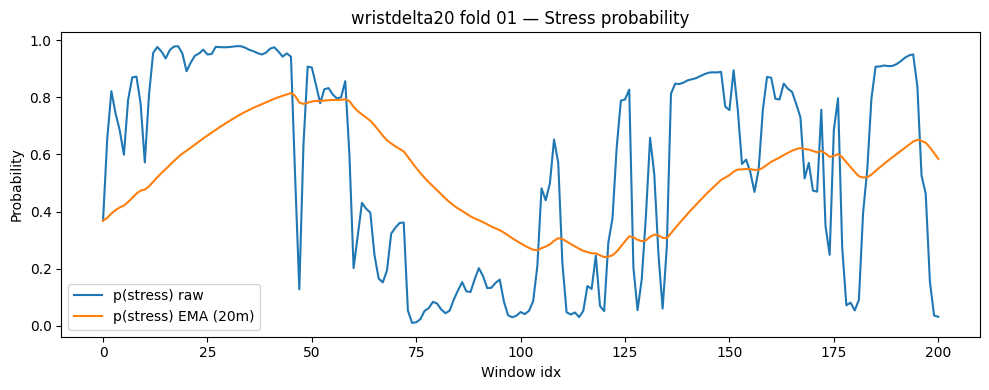

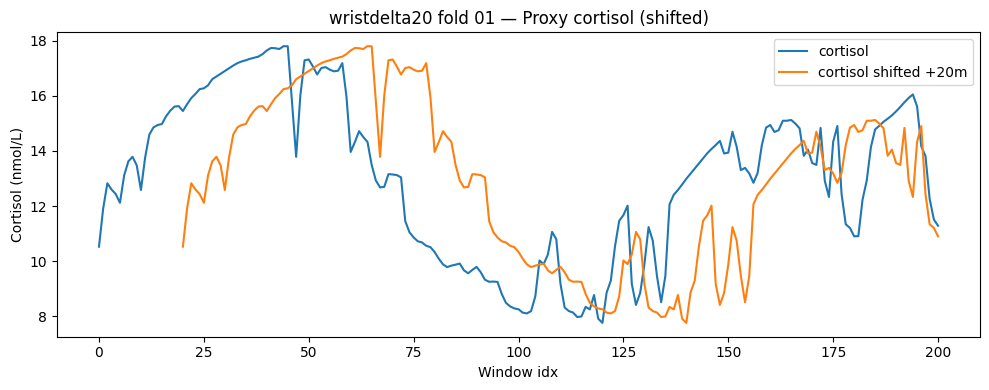

[wristdelta20] fold 01: cortisol saved → fold_01_cortisol_trace.csv | best_lag=0m (corr_ma5=0.565) | req_lag=20m (corr_ma5=0.218)


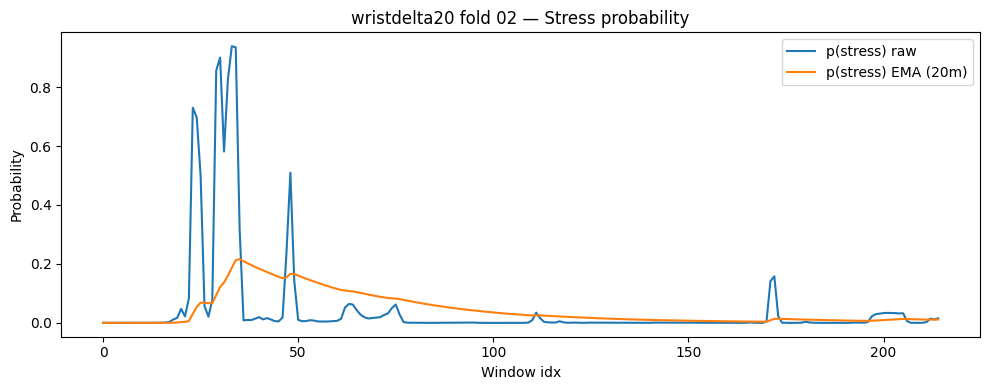

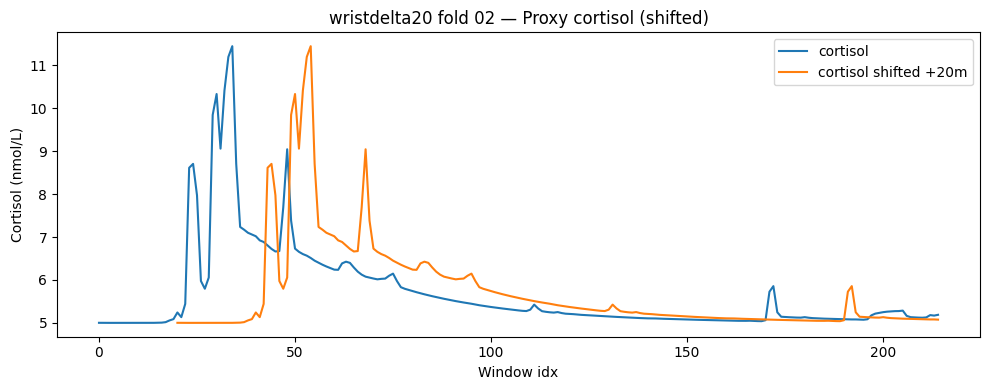

[wristdelta20] fold 02: cortisol saved → fold_02_cortisol_trace.csv | best_lag=0m (corr_ma5=0.585) | req_lag=20m (corr_ma5=-0.062)


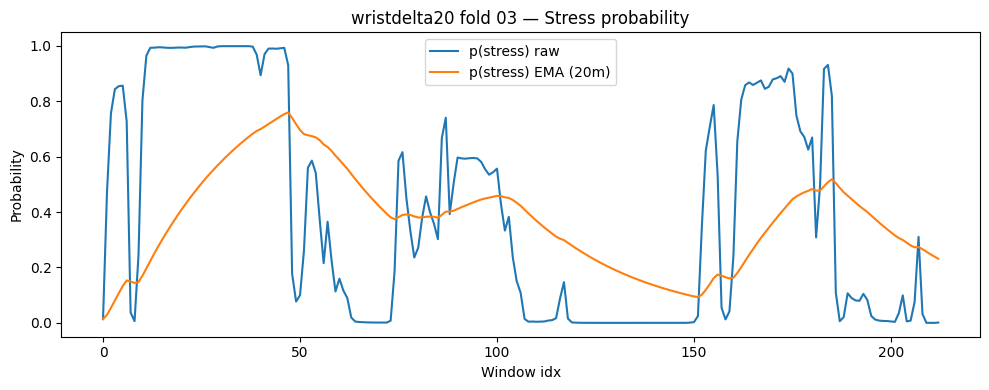

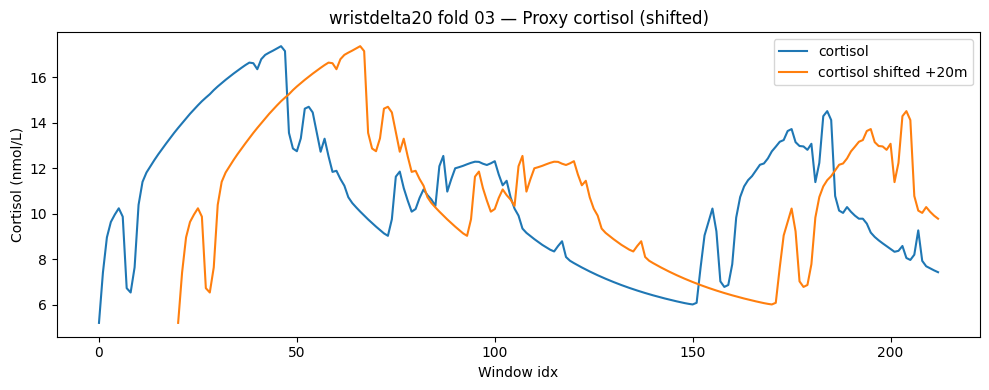

[wristdelta20] fold 03: cortisol saved → fold_03_cortisol_trace.csv | best_lag=0m (corr_ma5=0.638) | req_lag=20m (corr_ma5=0.072)


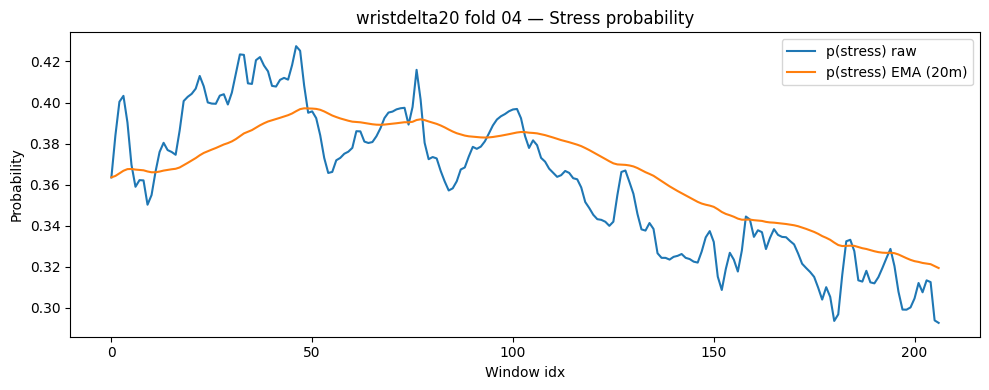

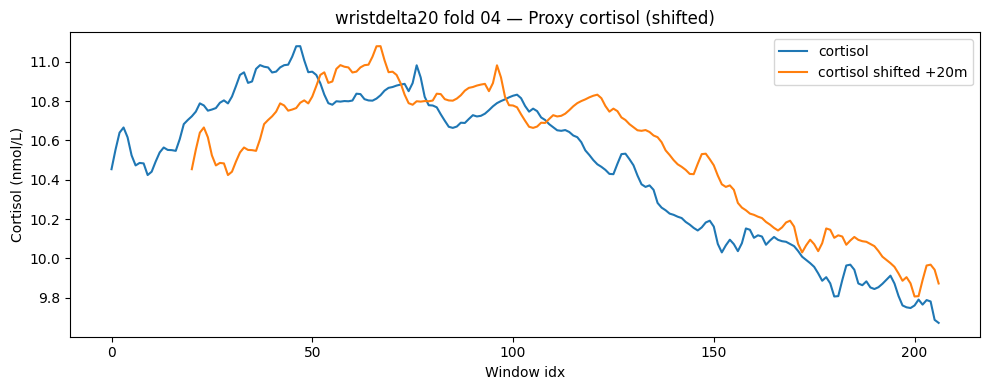

[wristdelta20] fold 04: cortisol saved → fold_04_cortisol_trace.csv | best_lag=0m (corr_ma5=0.423) | req_lag=20m (corr_ma5=0.090)


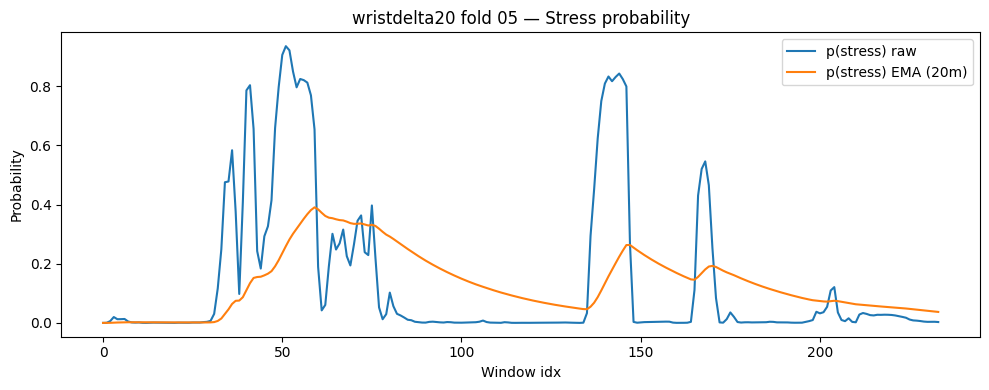

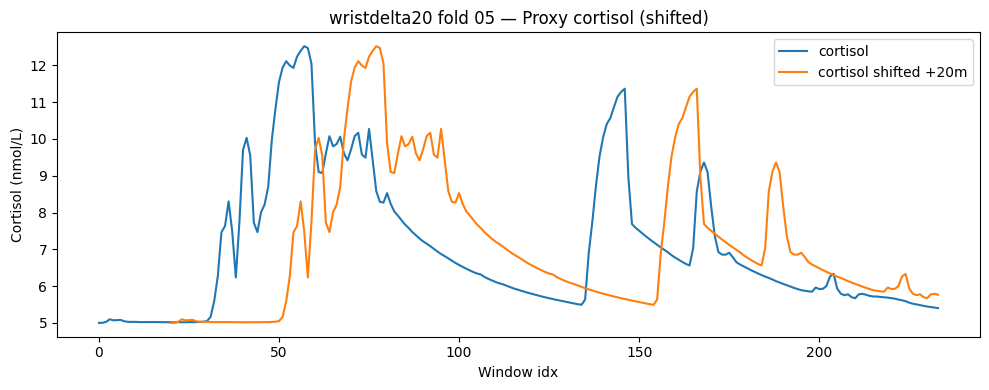

[wristdelta20] fold 05: cortisol saved → fold_05_cortisol_trace.csv | best_lag=0m (corr_ma5=0.294) | req_lag=20m (corr_ma5=-0.418)


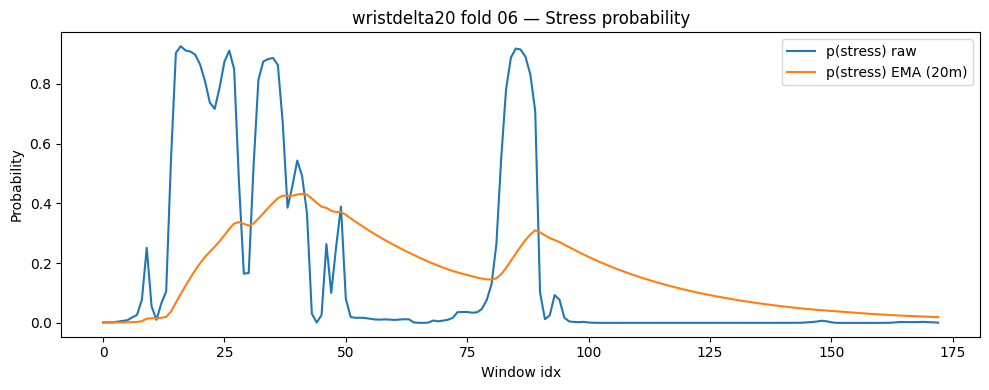

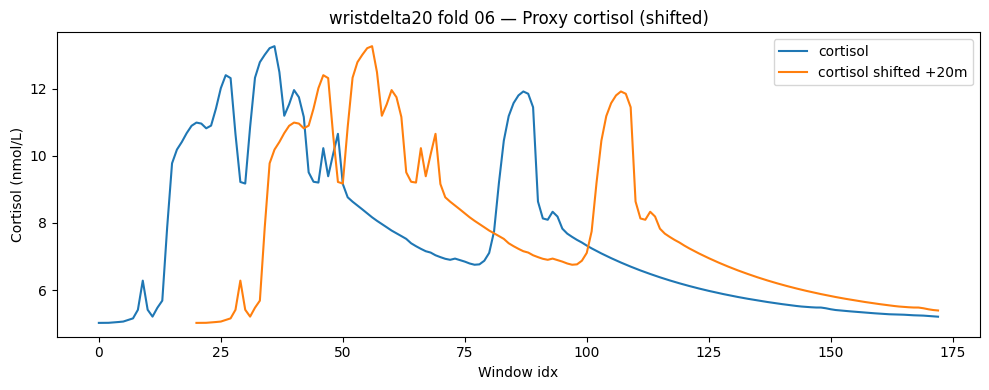

[wristdelta20] fold 06: cortisol saved → fold_06_cortisol_trace.csv | best_lag=0m (corr_ma5=0.487) | req_lag=20m (corr_ma5=-0.142)


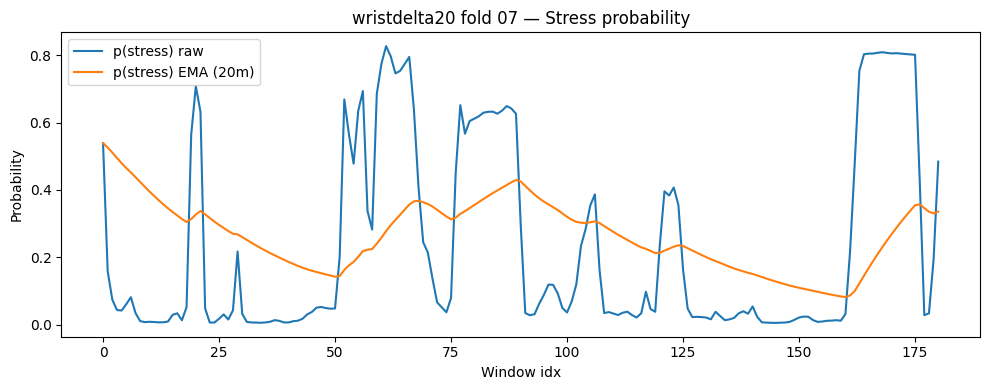

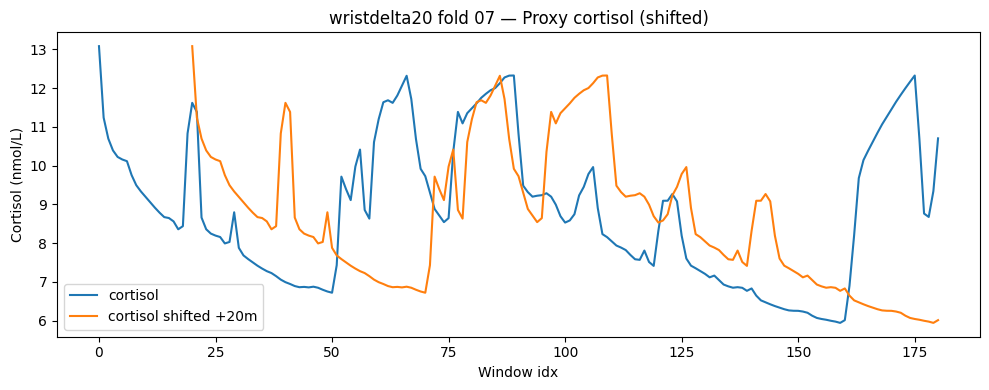

[wristdelta20] fold 07: cortisol saved → fold_07_cortisol_trace.csv | best_lag=38m (corr_ma5=0.266) | req_lag=20m (corr_ma5=0.256)


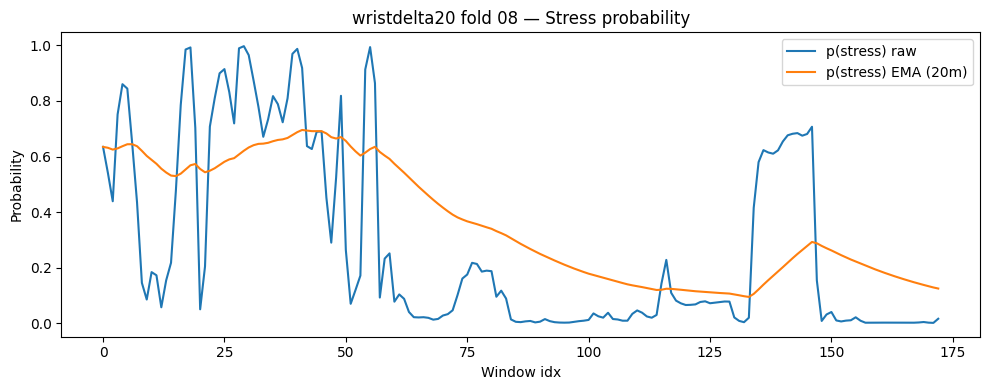

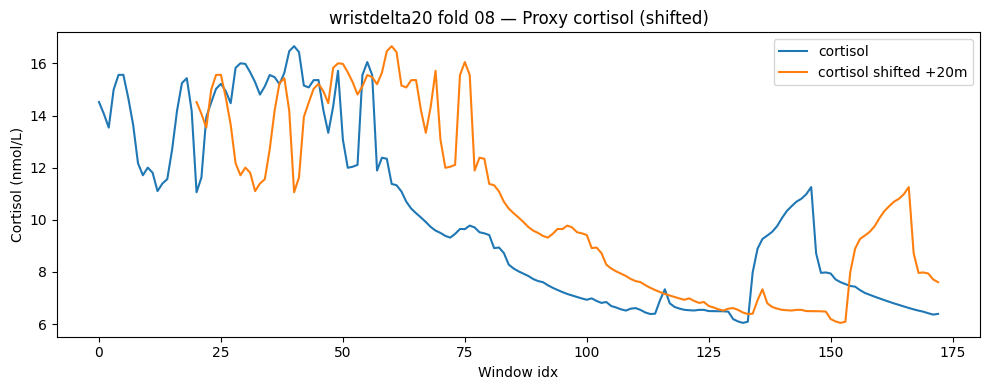

[wristdelta20] fold 08: cortisol saved → fold_08_cortisol_trace.csv | best_lag=0m (corr_ma5=0.683) | req_lag=20m (corr_ma5=0.349)


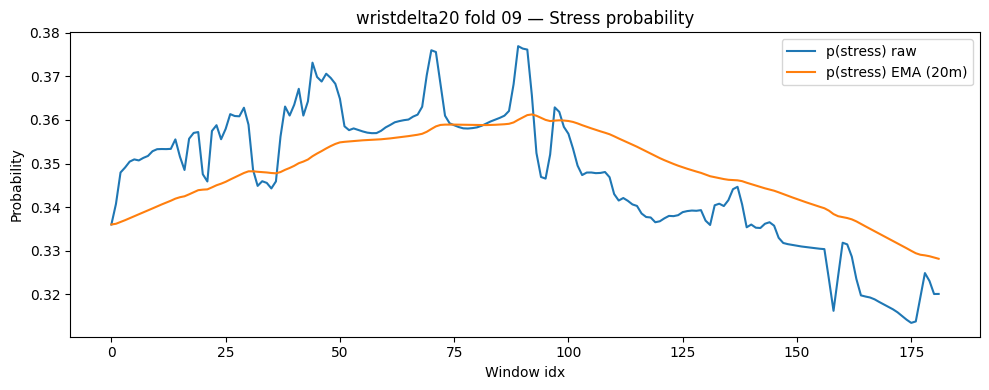

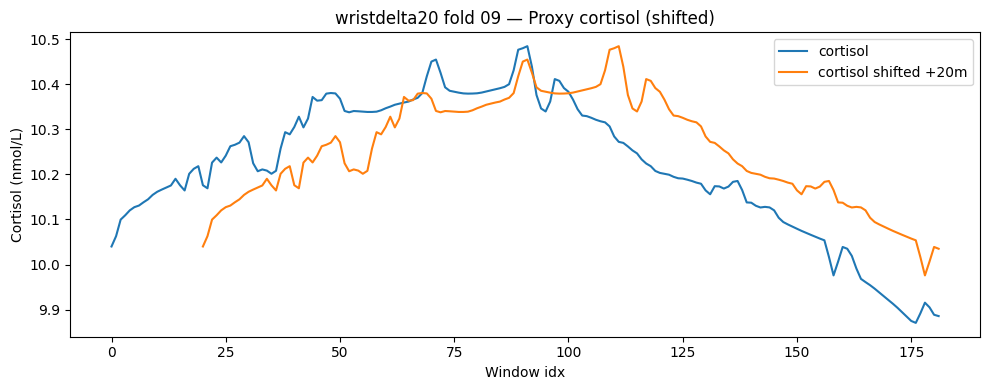

[wristdelta20] fold 09: cortisol saved → fold_09_cortisol_trace.csv | best_lag=0m (corr_ma5=-0.040) | req_lag=20m (corr_ma5=-0.358)


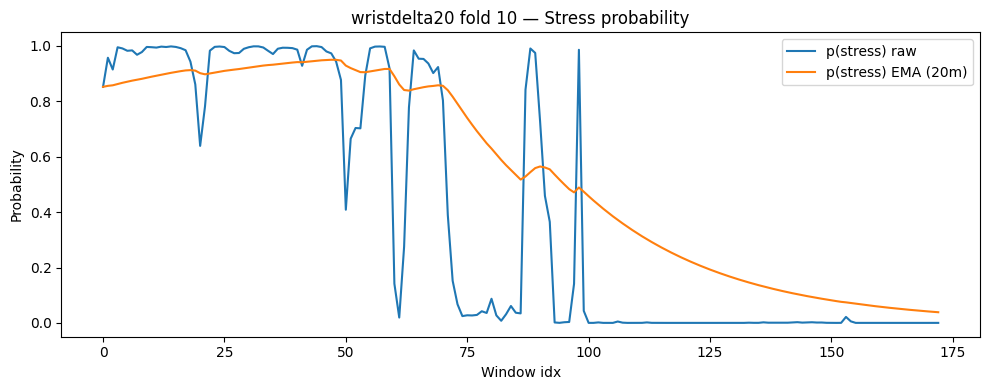

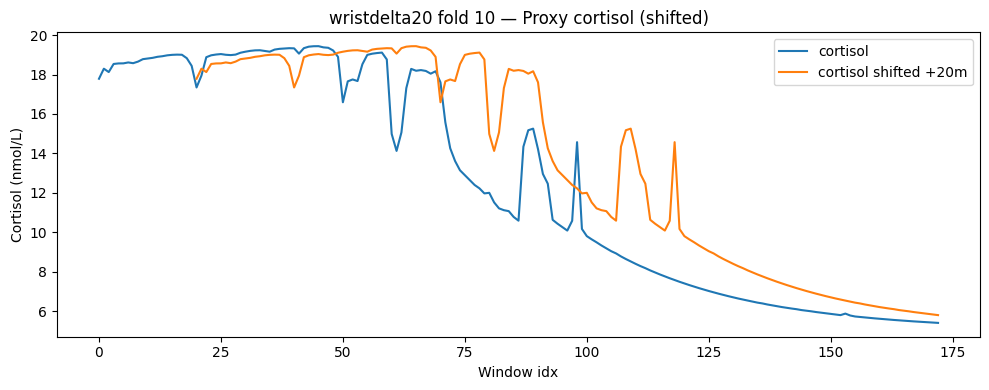

[wristdelta20] fold 10: cortisol saved → fold_10_cortisol_trace.csv | best_lag=0m (corr_ma5=0.648) | req_lag=20m (corr_ma5=0.414)


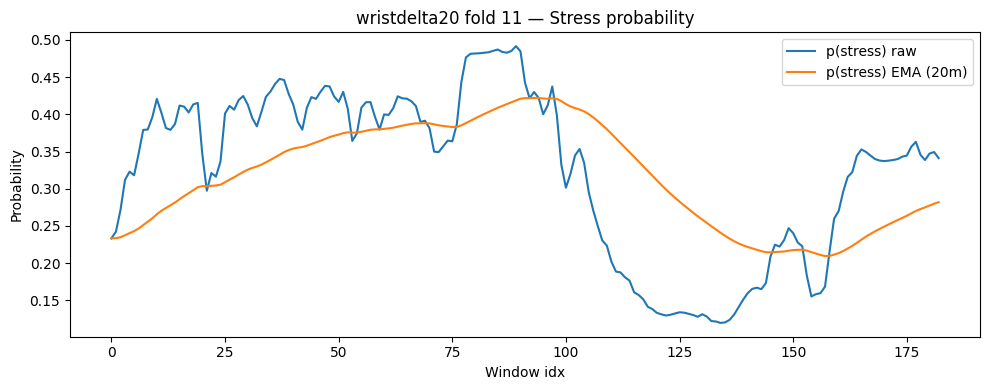

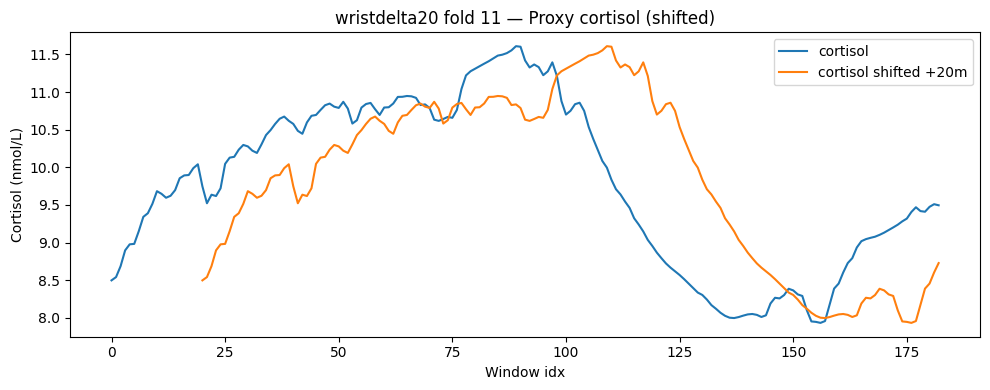

[wristdelta20] fold 11: cortisol saved → fold_11_cortisol_trace.csv | best_lag=0m (corr_ma5=0.051) | req_lag=20m (corr_ma5=-0.151)


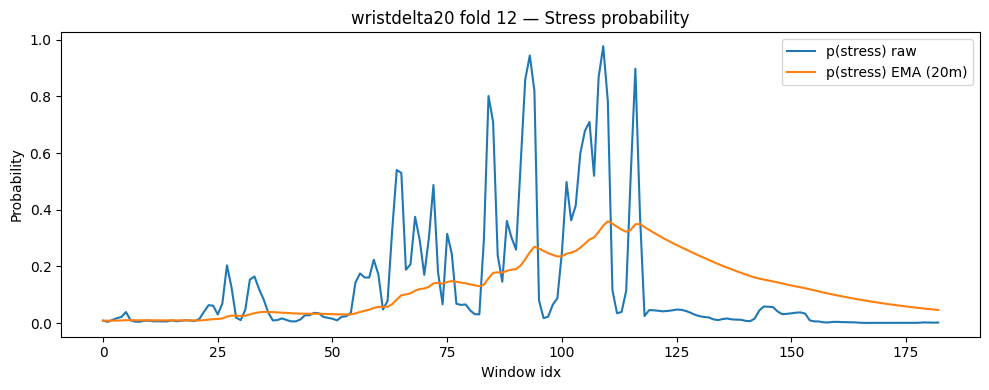

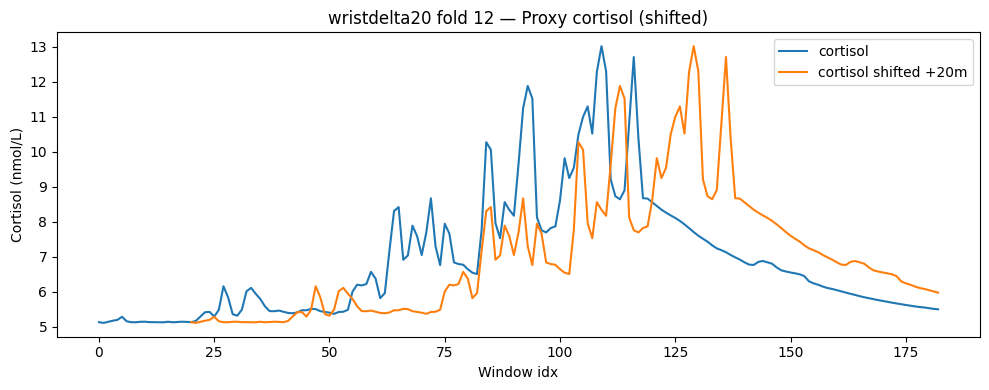

[wristdelta20] fold 12: cortisol saved → fold_12_cortisol_trace.csv | best_lag=41m (corr_ma5=-0.088) | req_lag=20m (corr_ma5=-0.403)


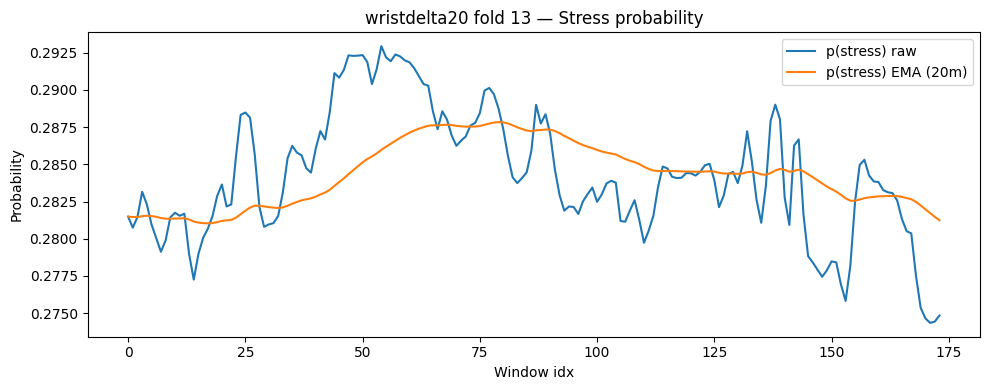

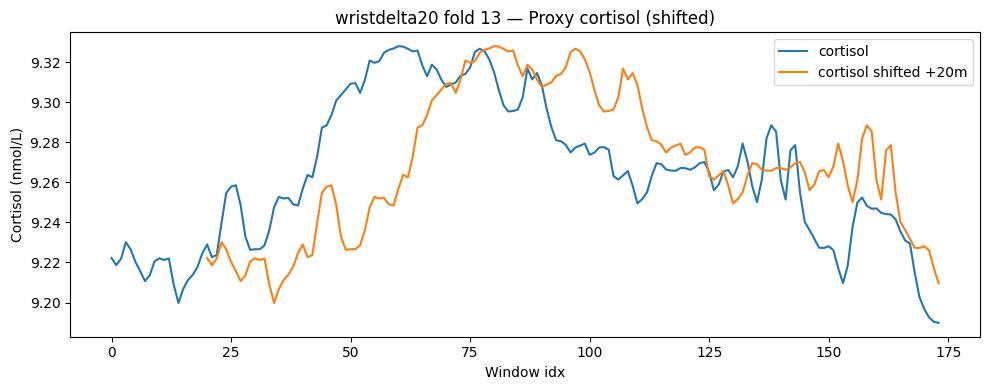

[wristdelta20] fold 13: cortisol saved → fold_13_cortisol_trace.csv | best_lag=43m (corr_ma5=-0.122) | req_lag=20m (corr_ma5=-0.605)


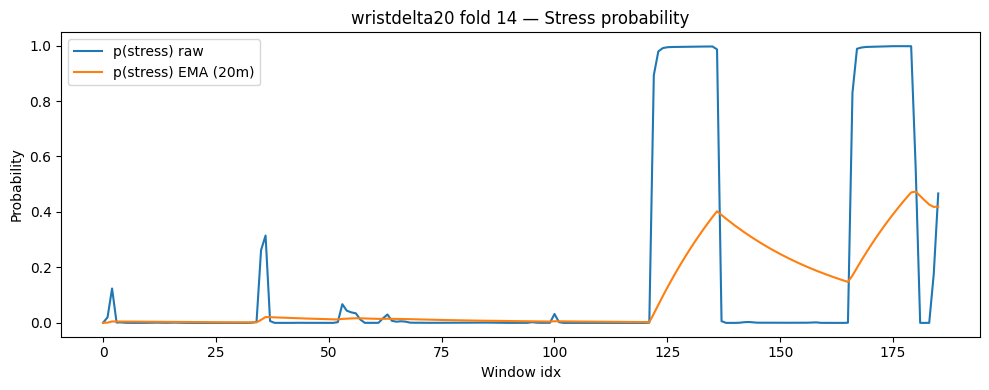

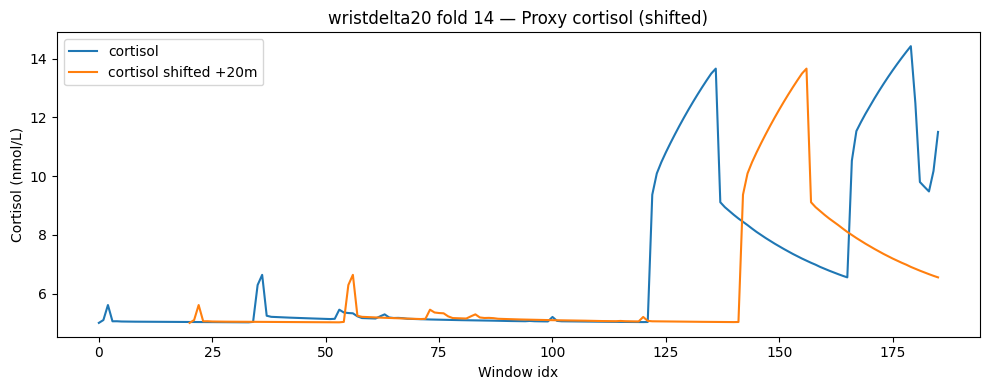

[wristdelta20] fold 14: cortisol saved → fold_14_cortisol_trace.csv | best_lag=43m (corr_ma5=-0.038) | req_lag=20m (corr_ma5=-0.210)


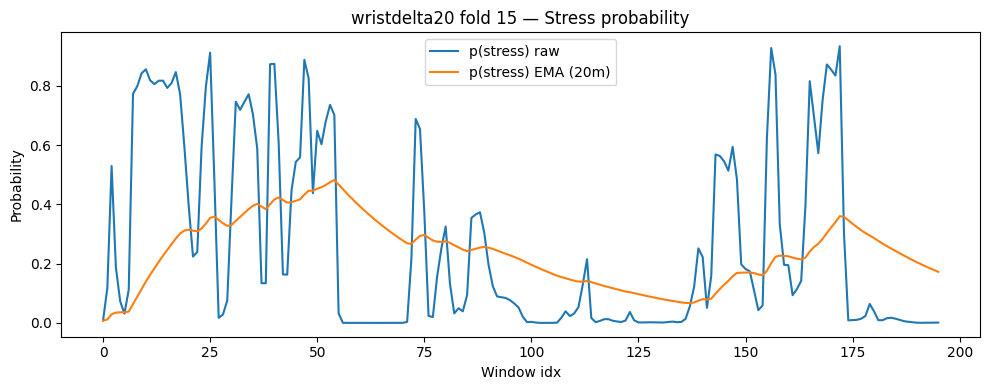

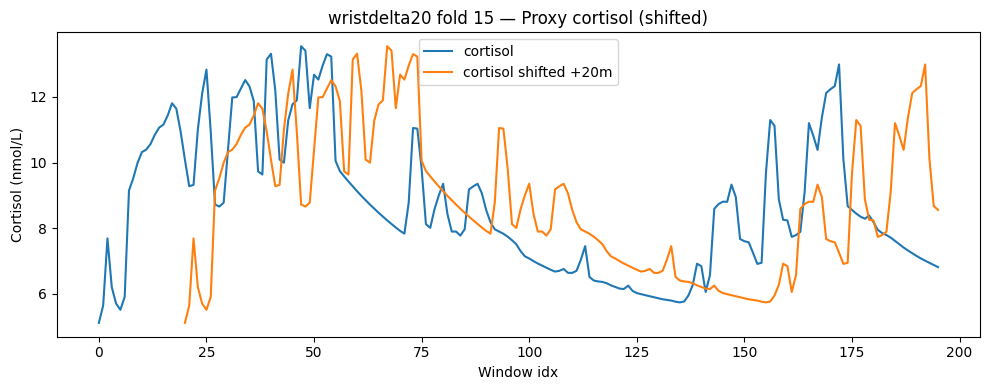

[wristdelta20] fold 15: cortisol saved → fold_15_cortisol_trace.csv | best_lag=0m (corr_ma5=0.406) | req_lag=20m (corr_ma5=0.050)
[wristdelta20] alignment summary saved → /content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab_h_transfer/alignment/cortisol_alignment_summary.csv


In [ ]:
# === Export cortisol proxy traces for wristdelta20 (with time shift + alignment table) ===
import os, re, glob, math, numpy as np, pandas as pd, torch, matplotlib.pyplot as plt
from pathlib import Path
from torch.utils.data import DataLoader

# -----------------------------
# Toggles (match your harness)
# -----------------------------
USE_APR = True
APR_FORCE_STRICT = False

# -----------------------------
# Paths (match your harness)
# -----------------------------
proj = Path("/content/drive/MyDrive/colab_checkpoints/wesad")
track_key = "wristdelta20"

feat_dir   = proj/"features"/"windows"/track_key
eval_root  = proj/"eval"/f"{track_key}_phases_conv_ab_h_transfer"
model_root = proj/"models"/f"{track_key}_phases_conv_ab_h_transfer"

# -----------------------------
# PyTorch safety (2.6)
# -----------------------------
try:
    from torch.serialization import add_safe_globals
    import torch.torch_version as tv
    add_safe_globals([tv.TorchVersion])
except Exception:
    pass

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# -----------------------------
# Model (same as harness)
# -----------------------------
import torch.nn as nn
HIDDEN_SIZE = 128
class ConvBiLSTMLessReg(nn.Module):
    def __init__(self, in_ch: int, n_classes: int, hidden=HIDDEN_SIZE, dropout=0.20):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv1d(in_ch, 64, kernel_size=5, padding=2, bias=False),
            nn.BatchNorm1d(64), nn.ReLU(inplace=True),
            nn.Conv1d(64, 128, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm1d(128), nn.ReLU(inplace=True),
        )
        self.bi = nn.LSTM(input_size=128, hidden_size=hidden, num_layers=1,
                          bidirectional=True, batch_first=True)
        self.drop = nn.Dropout(dropout)
        self.mlp = nn.Sequential(
            nn.Linear(2*hidden, 128), nn.ReLU(inplace=True),
            nn.Linear(128, 3)  # NCLS=3
        )
    def forward(self, x):
        x = x.transpose(1, 2)      # [B, F, T]
        x = self.conv(x)           # [B, 128, T]
        x = x.transpose(1, 2)      # [B, T, 128]
        x, _ = self.bi(x)          # [B, T, 2H]
        x = x.mean(dim=1)          # mean pool
        x = self.drop(x)
        return self.mlp(x)

# -----------------------------
# Helpers
# -----------------------------
def _softmax(x):
    x = x - x.max(axis=1, keepdims=True)
    e = np.exp(x); return e / np.clip(e.sum(axis=1, keepdims=True), 1e-12, None)

def _ema_prob(p, half_life_steps=20):
    if len(p)==0: return p
    alpha = 1.0 - math.pow(0.5, 1.0/max(1,half_life_steps))
    o = np.empty_like(p); o[0]=p[0]
    for i in range(1,len(p)): o[i] = (1-alpha)*o[i-1] + alpha*p[i]
    return o

def _shift_forward(arr, shift):
    """Shift forward in time by 'shift' steps: pad NaNs at the START."""
    shift = int(max(0, shift))
    if shift == 0 or len(arr)==0: return arr.copy()
    out = np.empty(len(arr))
    out[:shift] = np.nan
    out[shift:] = arr[:-shift]
    return out

def _moving_avg(x, k=5):
    """Simple moving average (same-length) with edge-handling by reflection."""
    if k <= 1 or len(x)==0: return x.astype(float)
    pad = k//2
    xp = np.pad(x.astype(float), (pad,pad), mode="edge")
    c = np.convolve(xp, np.ones(k)/k, mode="valid")
    return c

def _pearson_ignore_nan(a, b):
    m = np.isfinite(a) & np.isfinite(b)
    if m.sum() < 3: return np.nan
    A, B = a[m], b[m]
    if np.allclose(A, A[0]) or np.allclose(B, B[0]): return np.nan
    return float(np.corrcoef(A, B)[0,1])

# ===================== Load/normalize folds (same logic as harness) =====================
if "build_or_load_loso_for" in globals():
    subjects, folds, _ = build_or_load_loso_for(track_key, feat_dir)
else:
    subjects, folds, _ = build_or_load_loso(track_key, feat_dir)

def _canon_fold(f, all_subjects):
    test = (f.get("test_subject") or f.get("test") or f.get("test_sid") or f.get("test_subjects"))
    if isinstance(test, (list, tuple, np.ndarray)):
        test = test[0] if len(test) else None
    val  = (f.get("val_subjects") or f.get("val") or f.get("valid_subjects") or f.get("valid") or [])
    train= (f.get("train_subjects") or f.get("train") or f.get("train_sids") or f.get("train_ids"))
    val = list(val) if not isinstance(val, (str, bytes)) else [val]
    if train is None:
        excluded = set(val)
        if test is not None: excluded.add(test)
        train = [s for s in all_subjects if s not in excluded]
    elif not isinstance(train, (list, tuple, np.ndarray)):
        train = [train]
    return {"test_subject": test, "val_subjects": list(val), "train_subjects": list(train)}

# Round-robin VAL assignment if missing (deterministic)
folds_norm = []
for i, f in enumerate(folds, start=1):
    cf = _canon_fold(f, subjects)
    if not cf["val_subjects"]:
        tr_sorted = sorted(cf["train_subjects"])
        assert tr_sorted, f"Fold {i:02d} has no train subjects to form validation."
        val_pick = tr_sorted[(i - 1) % len(tr_sorted)]
        cf["val_subjects"] = [val_pick]
        cf["train_subjects"] = [s for s in tr_sorted if s != val_pick]
    if cf["test_subject"] in cf["val_subjects"]:
        tr_sorted = sorted(cf["train_subjects"])
        swap = tr_sorted[0]
        cf["val_subjects"] = [swap]
        cf["train_subjects"] = [s for s in tr_sorted if s != swap]
    folds_norm.append(cf)

# ===================== Exporter =====================
def export_cortisol_wrist(
    stress_class=1,
    half_life_min=20,                 # EMA half-life (minutes)
    c_min=5.0, c_max=20.0, w_blend=0.7,
    align_delay_windows=20,           # **actually shift forward by this many windows**
    align_scan_max=60                 # build alignment table scanning 0..align_scan_max minutes
):
    align_rows = []  # accumulate per-fold summary rows

    for k, fold in enumerate(folds_norm, start=1):
        test_sid = fold["test_subject"]
        out_dir = eval_root/f"fold_{k:02d}"/"cortisol"
        out_dir.mkdir(parents=True, exist_ok=True)
        csv_path = out_dir/f"fold_{k:02d}_cortisol_trace.csv"

        # ----- stack TRAIN (for scaler) with same APR toggle/params -----
        def stack_phase(sids):
            Xs, ys = [], []
            for s in sids:
                X, y, labels, _ = load_npz(feat_dir, s)
                if USE_APR:
                    apr_kwargs = dict(
                        stride_sec=60,
                        peak_delay_min=int(track_key.split("delta")[-1]),
                        anticipation_min=10, peak_width_min=6, recovery_min=20
                    )
                    if APR_FORCE_STRICT:
                        apr_kwargs.update(dict(anticipation_min=40, peak_width_min=10, recovery_min=40))
                    yA, m = relabel_to_APR_robust(y, labels, X=X, **apr_kwargs)
                    if m.sum()==0: continue
                    Xs.append(X[m]); ys.append(yA[m])
                else:
                    Xs.append(X); ys.append(y)
            return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

        train_sids = fold["train_subjects"]
        Xtr, ytr = stack_phase(train_sids)

        # ----- TEST path mirrors APR usage -----
        Xte_full, yte_full, labels_te, _ = load_npz(feat_dir, test_sid)
        if USE_APR:
            apr_kwargs = dict(
                stride_sec=60,
                peak_delay_min=int(track_key.split("delta")[-1]),
                anticipation_min=10, peak_width_min=6, recovery_min=20
            )
            if APR_FORCE_STRICT:
                apr_kwargs.update(dict(anticipation_min=40, peak_width_min=10, recovery_min=40))
            yA_te, m_te = relabel_to_APR_robust(yte_full, labels_te, X=Xte_full, **apr_kwargs)
            if m_te.sum()==0:
                print(f"[{track_key}] fold {k:02d} {test_sid}: no APR test windows — skipping.")
                continue
            Xte, yte = Xte_full[m_te], yA_te[m_te]
        else:
            Xte, yte = Xte_full, yte_full

        # ----- scale with TRAIN stats (fallback: TEST if TRAIN missing) -----
        sc = fit_scaler_on_train(Xtr if Xtr is not None else Xte)
        Xte_s = apply_scaler(sc, Xte)

        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=256, shuffle=False,
                           num_workers=min(8, os.cpu_count() or 2),
                           pin_memory=torch.cuda.is_available())

        # ----- rebuild model & load best.pt from current harness -----
        T, F = Xte.shape[1], Xte.shape[2]; NCLS=3
        model = ConvBiLSTMLessReg(in_ch=F, n_classes=NCLS, dropout=0.20).to(device)

        best_ck = model_root/f"fold_{k:02d}"/"best.pt"
        if not best_ck.exists():
            print(f"[{track_key}] fold {k:02d}: missing {best_ck} — skipping.")
            continue
        ck = torch.load(best_ck, map_location=device, weights_only=False)
        state = ck["model_state"] if isinstance(ck, dict) and "model_state" in ck else ck
        model.load_state_dict(state, strict=True); model.eval()

        # ----- collect logits -----
        logits, y_true = [], []
        with torch.no_grad():
            for xb, yb in dl_te:
                xb = xb.to(device)
                out = model(xb)
                logits.append(out.detach().cpu().numpy())
                y_true.append(yb.numpy())
        logits = np.concatenate(logits)
        y_true = np.concatenate(y_true).astype(int)

        probs = _softmax(logits)
        p_raw = probs[:, stress_class]

        # EMA half-life in windows (1 window = 1 minute here)
        p_lag = _ema_prob(p_raw, half_life_steps=int(round(half_life_min)))

        # blend raw & lag (optional; matches chest export behavior)
        p_blend = np.clip(w_blend*p_lag + (1.0-w_blend)*p_raw, 0, 1)

        # linear cortisol map into [c_min, c_max]
        cortisol = c_min + (c_max - c_min) * p_blend

        # >>> actual time shift (forward) by align_delay_windows <<<
        cortisol_shifted = _shift_forward(cortisol, int(align_delay_windows))

        # Alignment table vs Peak label (class==1)
        peak_bin = (y_true == 1).astype(float)
        peak_bin_ma5 = _moving_avg(peak_bin, k=5)

        lags = np.arange(0, int(align_scan_max)+1, 1)  # minutes (windows)
        corrs_peak = []
        corrs_peak_ma5 = []
        for L in lags:
            cL = _shift_forward(cortisol, int(L))
            corrs_peak.append(_pearson_ignore_nan(cL, peak_bin))
            corrs_peak_ma5.append(_pearson_ignore_nan(cL, peak_bin_ma5))

        # best lag by smoothed-peak correlation
        best_idx = int(np.nanargmax(corrs_peak_ma5)) if np.any(np.isfinite(corrs_peak_ma5)) else 0
        best_lag = int(lags[best_idx])
        best_corr = float(corrs_peak_ma5[best_idx]) if len(corrs_peak_ma5) else np.nan

        # correlation at the requested alignment (for reporting)
        req_idx = int(np.where(lags==int(align_delay_windows))[0][0]) if int(align_delay_windows) in lags else None
        req_corr = float(corrs_peak_ma5[req_idx]) if req_idx is not None else np.nan

        # save per-fold alignment table
        align_df = pd.DataFrame({
            "fold": k,
            "test_subject": test_sid,
            "lag_windows": lags,
            "corr_peak": corrs_peak,
            "corr_peak_ma5": corrs_peak_ma5
        })
        align_dir = eval_root/"alignment"
        align_dir.mkdir(parents=True, exist_ok=True)
        align_df.to_csv(align_dir/f"fold_{k:02d}_alignment.csv", index=False)

        # save per-fold cortisol trace (with shifted column)
        out_dir.mkdir(parents=True, exist_ok=True)
        pd.DataFrame({
            "idx": np.arange(len(p_raw)),
            "y_true": y_true,                 # APR ids: 0=A,1=P,2=R
            "p_stress_raw": p_raw,
            "p_stress_lag": p_lag,
            "p_stress_blend": p_blend,
            "cortisol_proxy_nmol_per_L": cortisol,
            "cortisol_proxy_shifted": cortisol_shifted,   # <<< time-shifted version
            "align_delay_windows": int(align_delay_windows),
            "use_apr": int(USE_APR),
            "apr_force_strict": int(APR_FORCE_STRICT)
        }).to_csv(csv_path, index=False)

        # quick plots
        plt.figure(figsize=(10,4))
        plt.plot(p_raw, label="p(stress) raw")
        plt.plot(p_lag, label=f"p(stress) EMA ({half_life_min}m)")
        plt.legend(); plt.xlabel("Window idx"); plt.ylabel("Probability")
        plt.title(f"{track_key} fold {k:02d} — Stress probability")
        plt.tight_layout(); plt.savefig(out_dir/f"fold_{k:02d}_p_stress.png", dpi=200)
        plt.show()
        plt.close()

        plt.figure(figsize=(10,4))
        plt.plot(cortisol, label="cortisol")
        plt.plot(cortisol_shifted, label=f"cortisol shifted +{int(align_delay_windows)}m")
        plt.legend(); plt.xlabel("Window idx"); plt.ylabel("Cortisol (nmol/L)")
        plt.title(f"{track_key} fold {k:02d} — Proxy cortisol (shifted)")
        plt.tight_layout(); plt.savefig(out_dir/f"fold_{k:02d}_cortisol.png", dpi=200)
        plt.show()
        plt.close()

        print(f"[{track_key}] fold {k:02d}: cortisol saved → {csv_path.name} | "
              f"best_lag={best_lag}m (corr_ma5={best_corr:.3f}) | "
              f"req_lag={int(align_delay_windows)}m (corr_ma5={req_corr:.3f})")


        # accumulate summary row
        align_rows.append({
            "fold": k,
            "test_subject": test_sid,
            "requested_lag": int(align_delay_windows),
            "requested_corr_peak_ma5": req_corr,
            "best_lag": best_lag,
            "best_corr_peak_ma5": best_corr
        })

    # save combined summary across folds
    if align_rows:
        summary_df = pd.DataFrame(align_rows).sort_values("fold")
        summary_path = (eval_root/"alignment"/"cortisol_alignment_summary.csv")
        summary_df.to_csv(summary_path, index=False)
        print(f"[{track_key}] alignment summary saved → {summary_path}")

# ---- run
export_cortisol_wrist(
    stress_class=1,          # class 1 = Peak ~ “stress”
    half_life_min=20,
    c_min=5.0, c_max=20.0,
    w_blend=0.7,
    align_delay_windows=20,   # <<< now actually applied as a forward time shift
    align_scan_max=60         # build per-fold alignment tables over 0..60 min
)


In [ ]:
# 1) Mount Google Drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)  # you'll get an auth link; paste the code

# 2) Verify the file exists
import os, glob, pandas as pd

p = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab_h_transfer/alignment/cortisol_alignment_summary.csv"
print("Exists?", os.path.exists(p))

# 3) (Optional) peek at it
if os.path.exists(p):
    df = pd.read_csv(p)
    display(df.head())
else:
    # help you debug path typos: list the folder
    folder = os.path.dirname(p)
    print("Listing:", folder)
    print("\n".join(glob.glob(folder + "/*")))


Mounted at /content/drive
Exists? True


,fold,test_subject,requested_lag,requested_corr_peak_ma5,best_lag,best_corr_peak_ma5
0,1,S2,20,0.217679,0,0.564779
1,2,S3,20,-0.062101,0,0.584796
2,3,S4,20,0.071681,0,0.638265
3,4,S5,20,0.090040,0,0.423153
4,5,S6,20,-0.417813,0,0.294113


In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

import pandas as pd
p = "/content/drive/MyDrive/colab_checkpoints/wesad/eval/wristdelta20_phases_conv_ab_h_transfer/alignment/cortisol_alignment_summary.csv"
df = pd.read_csv(p)
df.head()


Mounted at /content/drive


,fold,test_subject,requested_lag,requested_corr_peak_ma5,best_lag,best_corr_peak_ma5
0,1,S2,20,0.217679,0,0.564779
1,2,S3,20,-0.062101,0,0.584796
2,3,S4,20,0.071681,0,0.638265
3,4,S5,20,0.090040,0,0.423153
4,5,S6,20,-0.417813,0,0.294113


In [ ]:
import numpy as np, matplotlib.pyplot as plt, matplotlib.patches as mpatches

def _min_run_length_filter(arr, min_len, value):
    """enforce that any run of `value` shorter than min_len is flipped to the opposite."""
    arr = arr.copy()
    n = len(arr)
    i = 0
    while i < n:
        if arr[i] != value:
            i += 1; continue
        j = i
        while j < n and arr[j] == value: j += 1
        if (j - i) < min_len:
            arr[i:j] = 1 - value  # flip
        i = j
    return arr

def _labels_to_ints(labels, palette):
    """map string labels to ints 0..K-1 using `palette` order."""
    ix = {name:i for i,name in enumerate(palette)}
    return np.array([ix.get(l, ix["other"]) for l in labels], dtype=int)

def _plot_true_vs_cortisol_table(
    subj_title,
    y_true_labels,              # 1D list/array of label strings for TRUE column
    cortisol_shifted,           # 1D float array (already shifted forward)
    half_life_min=20,
    a=12, b=8,                  # min run lengths (in windows) for stress / non-stress
    stress_thresh=15.0,         # nmol/L
    out_png=None,
    show=True
):
    # --- palette & legend (you can customize names/colors here) ---
    # keep these names to match your chest figure
    palette = ["baseline","mild","stress","amusement","other1","other2","other"]
    colors  = ["#9bd59b","#cfe5ff","#c35a9f","#6db0ff","#b1b0d6","#7fdad1","#cccccc"]
    cmap = {name:colors[i] for i,name in enumerate(palette)}

    # probs → cortisol categories (baseline/mild/stress)
    cort_lab = np.array(["baseline"]*len(cortisol_shifted), dtype=object)
    cort_lab[np.where(np.isfinite(cortisol_shifted) & (cortisol_shifted >= stress_thresh))] = "stress"
    # define a "mild" band if you like (e.g., 10..stress_thresh)
    mild_lo = max(0.0, stress_thresh - 5.0)
    cort_lab[np.where(np.isfinite(cortisol_shifted) &
                      (cortisol_shifted >= mild_lo) &
                      (cortisol_shifted <  stress_thresh))] = "mild"

    # optional min-run enforcement on binary stress vs non-stress
    is_stress = (cort_lab == "stress").astype(int)
    is_non    = 1 - is_stress
    is_stress = _min_run_length_filter(is_stress, a, 1)   # enforce stress runs >= a
    is_non    = _min_run_length_filter(is_non,    b, 1)   # enforce non-stress runs >= b
    # rebuild cort labels from filtered binary
    cort_lab = np.where(is_stress==1, "stress", np.where(cortisol_shifted>=mild_lo, "mild", "baseline"))

    # TRUE labels are already strings; if you only have APR (0/1/2), map like this:
    #   {0:"baseline", 1:"stress", 2:"other1"} — or pass your own strings
    # make sure both columns are same length
    n = min(len(y_true_labels), len(cort_lab))
    true_col = np.array(y_true_labels[:n], dtype=object)
    cort_col = cort_lab[:n]

    # build a (n x 2) matrix of ints for imshow
    mat = np.vstack([
        _labels_to_ints(true_col, palette),
        _labels_to_ints(cort_col, palette)
    ]).T  # shape [n, 2]

    # make a listed colormap
    from matplotlib.colors import ListedColormap
    listed = ListedColormap(colors[:len(palette)])

    # plot
    fig, ax = plt.subplots(figsize=(6, 10), dpi=150)
    im = ax.imshow(mat, aspect='auto', interpolation='nearest', cmap=listed, origin='upper')

    # y ticks = time windows
    ax.set_yticks(np.arange(0, n, max(1, n//40)))
    ax.set_yticklabels([str(i) for i in range(0, n, max(1, n//40))])
    ax.set_ylabel("Time window index")

    # x ticks = 2 columns
    ax.set_xticks([0,1])
    ax.set_xticklabels(["TRUE", "CORTISOL (aligned)"])

    # grid lines
    ax.set_xticks(np.arange(-.5, 2, 1), minor=True)
    ax.set_yticks(np.arange(-.5, n, 1), minor=True)
    ax.grid(which='minor', color='white', linewidth=0.5)
    ax.tick_params(which='minor', bottom=False, left=False)

    # title
    ax.set_title(
        f"{subj_title}\nhalf-life={half_life_min} min, a={a}, b={b}, stress≥{stress_thresh:.0f} nmol/L",
        fontsize=12, loc='left'
    )

    # legend
    handles = [mpatches.Patch(color=cmap[name], label=name) for name in palette]
    leg = ax.legend(
        handles=handles, title="Labels", bbox_to_anchor=(1.02, 0.5), loc="center left", borderaxespad=0.
    )
    for lh in leg.legend_handles:
        lh.set_linewidth(0)

    plt.tight_layout()
    if out_png:
        plt.savefig(out_png, dpi=200, bbox_inches="tight")
    if show:
        plt.show()
    plt.close(fig)


In [ ]:
# ---- build readable TRUE labels ----
# If your test labels are APR (0=A,1=P,2=R), map them to names you prefer:
apr_map = {0:"baseline", 1:"stress", 2:"other1"}  # tweak if you have real phase strings
y_true_labels = [apr_map.get(int(v), "other") for v in y_true]

png_path = out_dir/f"fold_{k:02d}_true_vs_cortisol_table.png"
_plot_true_vs_cortisol_table(
    subj_title=f"{test_sid} — TRUE vs CORTISOL (delay +{int(align_delay_windows)} windows)",
    y_true_labels=y_true_labels,
    cortisol_shifted=cortisol_shifted,
    half_life_min=half_life_min,
    a=12, b=8,                     # match your chest figure defaults
    stress_thresh=15.0,            # set to your chosen threshold in nmol/L
    out_png=png_path,
    show=True                      # <<< displays inline
)
print(f"[{track_key}] fold {k:02d}: mosaic saved → {png_path.name}")


NameError: name 'align_delay_windows' is not defined

In [ ]:
# === Export cortisol proxy traces for wristdelta20 (aligned with current harness) ===
import os, re, glob, math, numpy as np, pandas as pd, torch, matplotlib.pyplot as plt
from pathlib import Path
from torch.utils.data import DataLoader

# -----------------------------
# Toggles (match your harness)
# -----------------------------
USE_APR = True
APR_FORCE_STRICT = False

# -----------------------------
# Paths (match your harness)
# -----------------------------
proj = Path("/content/drive/MyDrive/colab_checkpoints/wesad")
track_key = "wristdelta20"

feat_dir   = proj/"features"/"windows"/track_key
eval_root  = proj/"eval"/f"{track_key}_phases_conv_ab_h_transfer"
model_root = proj/"models"/f"{track_key}_phases_conv_ab_h_transfer"

# -----------------------------
# PyTorch safety (2.6)
# -----------------------------
try:
    from torch.serialization import add_safe_globals
    import torch.torch_version as tv
    add_safe_globals([tv.TorchVersion])
except Exception:
    pass

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# -----------------------------
# Model (same as harness)
# -----------------------------
import torch.nn as nn

HIDDEN_SIZE = 128
class ConvBiLSTMLessReg(nn.Module):
    def __init__(self, in_ch: int, n_classes: int, hidden=HIDDEN_SIZE, dropout=0.20):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv1d(in_ch, 64, kernel_size=5, padding=2, bias=False),
            nn.BatchNorm1d(64), nn.ReLU(inplace=True),
            nn.Conv1d(64, 128, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm1d(128), nn.ReLU(inplace=True),
        )
        self.bi = nn.LSTM(input_size=128, hidden_size=hidden, num_layers=1,
                          bidirectional=True, batch_first=True)
        self.drop = nn.Dropout(dropout)
        self.mlp = nn.Sequential(
            nn.Linear(2*hidden, 128), nn.ReLU(inplace=True),
            nn.Linear(128, 3)  # NCLS=3
        )
    def forward(self, x):
        x = x.transpose(1, 2)      # [B, F, T]
        x = self.conv(x)           # [B, 128, T]
        x = x.transpose(1, 2)      # [B, T, 128]
        x, _ = self.bi(x)          # [B, T, 2H]
        x = x.mean(dim=1)          # mean pool
        x = self.drop(x)
        return self.mlp(x)

# -----------------------------
# Helpers
# -----------------------------
def _softmax(x):
    x = x - x.max(axis=1, keepdims=True)
    e = np.exp(x); return e / np.clip(e.sum(axis=1, keepdims=True), 1e-12, None)

def _ema_prob(p, half_life_steps=20):
    if len(p)==0: return p
    alpha = 1.0 - math.pow(0.5, 1.0/max(1,half_life_steps))
    o = np.empty_like(p); o[0]=p[0]
    for i in range(1,len(p)): o[i] = (1-alpha)*o[i-1] + alpha*p[i]
    return o

# ===================== Load/normalize folds (same logic as harness) =====================
# Expecting your original helpers to exist:
# - load_npz(feat_dir, subject_id)
# - relabel_to_APR_robust(...)
# - fit_scaler_on_train(Xtr)
# - apply_scaler(sc, X)
# - SeqDataset(X, y)

# Build folds from the same source the harness uses
if "build_or_load_loso_for" in globals():
    subjects, folds, _ = build_or_load_loso_for(track_key, feat_dir)
else:
    subjects, folds, _ = build_or_load_loso(track_key, feat_dir)

def _canon_fold(f, all_subjects):
    test = (f.get("test_subject") or f.get("test") or f.get("test_sid") or f.get("test_subjects"))
    if isinstance(test, (list, tuple, np.ndarray)):
        test = test[0] if len(test) else None
    val  = (f.get("val_subjects") or f.get("val") or f.get("valid_subjects") or f.get("valid") or [])
    train= (f.get("train_subjects") or f.get("train") or f.get("train_sids") or f.get("train_ids"))
    val = list(val) if not isinstance(val, (str, bytes)) else [val]
    if train is None:
        excluded = set(val)
        if test is not None: excluded.add(test)
        train = [s for s in all_subjects if s not in excluded]
    elif not isinstance(train, (list, tuple, np.ndarray)):
        train = [train]
    return {"test_subject": test, "val_subjects": list(val), "train_subjects": list(train)}

# Round-robin VAL assignment if missing (deterministic)
folds_norm = []
for i, f in enumerate(folds, start=1):
    cf = _canon_fold(f, subjects)
    if not cf["val_subjects"]:
        tr_sorted = sorted(cf["train_subjects"])
        assert tr_sorted, f"Fold {i:02d} has no train subjects to form validation."
        val_pick = tr_sorted[(i - 1) % len(tr_sorted)]
        cf["val_subjects"] = [val_pick]
        cf["train_subjects"] = [s for s in tr_sorted if s != val_pick]
    if cf["test_subject"] in cf["val_subjects"]:
        tr_sorted = sorted(cf["train_subjects"])
        swap = tr_sorted[0]
        cf["val_subjects"] = [swap]
        cf["train_subjects"] = [s for s in tr_sorted if s != swap]
    folds_norm.append(cf)

# ===================== Exporter =====================
def export_cortisol_wrist(
    stress_class=1,
    half_life_min=20,                 # EMA half-life (minutes)
    c_min=5.0, c_max=20.0, w_blend=0.7,
    align_delay_windows=20            # recorded in CSV for downstream shifting
):
    for k, fold in enumerate(folds_norm, start=1):
        test_sid = fold["test_subject"]
        out_dir = eval_root/f"fold_{k:02d}"/"cortisol"
        out_dir.mkdir(parents=True, exist_ok=True)
        csv_path = out_dir/f"fold_{k:02d}_cortisol_trace.csv"
        if csv_path.exists():
            print(f"[{track_key}] fold {k:02d}: found {csv_path.name} — skipping.")
            continue

        # ----- stack TRAIN (for scaler) with same APR toggle/params -----
        def stack_phase(sids):
            Xs, ys = [], []
            for s in sids:
                X, y, labels, _ = load_npz(feat_dir, s)
                if USE_APR:
                    apr_kwargs = dict(
                        stride_sec=60,
                        peak_delay_min=int(track_key.split("delta")[-1]),
                        anticipation_min=10, peak_width_min=6, recovery_min=20
                    )
                    if APR_FORCE_STRICT:
                        apr_kwargs.update(dict(anticipation_min=40, peak_width_min=10, recovery_min=40))
                    yA, m = relabel_to_APR_robust(y, labels, X=X, **apr_kwargs)
                    if m.sum()==0: continue
                    Xs.append(X[m]); ys.append(yA[m])
                else:
                    Xs.append(X); ys.append(y)
            return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

        train_sids = fold["train_subjects"]
        Xtr, ytr = stack_phase(train_sids)

        # ----- TEST path mirrors APR usage -----
        Xte_full, yte_full, labels_te, _ = load_npz(feat_dir, test_sid)
        if USE_APR:
            apr_kwargs = dict(
                stride_sec=60,
                peak_delay_min=int(track_key.split("delta")[-1]),
                anticipation_min=10, peak_width_min=6, recovery_min=20
            )
            if APR_FORCE_STRICT:
                apr_kwargs.update(dict(anticipation_min=40, peak_width_min=10, recovery_min=40))
            yA_te, m_te = relabel_to_APR_robust(yte_full, labels_te, X=Xte_full, **apr_kwargs)
            if m_te.sum()==0:
                print(f"[{track_key}] fold {k:02d} {test_sid}: no APR test windows — skipping.")
                continue
            Xte, yte = Xte_full[m_te], yA_te[m_te]
        else:
            Xte, yte = Xte_full, yte_full

        # ----- scale with TRAIN stats (fallback: TEST if TRAIN missing) -----
        sc = fit_scaler_on_train(Xtr if Xtr is not None else Xte)
        Xte_s = apply_scaler(sc, Xte)

        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=256, shuffle=False,
                           num_workers=min(8, os.cpu_count() or 2),
                           pin_memory=torch.cuda.is_available())

        # ----- rebuild model & load best.pt from current harness -----
        T, F = Xte.shape[1], Xte.shape[2]; NCLS=3
        model = ConvBiLSTMLessReg(in_ch=F, n_classes=NCLS, dropout=0.20).to(device)

        best_ck = model_root/f"fold_{k:02d}"/"best.pt"
        if not best_ck.exists():
            print(f"[{track_key}] fold {k:02d}: missing {best_ck} — skipping.")
            continue
        ck = torch.load(best_ck, map_location=device, weights_only=False)
        state = ck["model_state"] if isinstance(ck, dict) and "model_state" in ck else ck
        model.load_state_dict(state, strict=True); model.eval()

        # ----- collect logits -----
        logits, y_true = [], []
        with torch.no_grad():
            for xb, yb in dl_te:
                xb = xb.to(device)
                out = model(xb)
                logits.append(out.detach().cpu().numpy())
                y_true.append(yb.numpy())
        logits = np.concatenate(logits)
        y_true = np.concatenate(y_true).astype(int)

        probs = _softmax(logits)
        p_raw = probs[:, stress_class]

        # EMA half-life in windows (1 window = 1 minute here)
        p_lag = _ema_prob(p_raw, half_life_steps=int(round(half_life_min)))

        # blend raw & lag (optional; matches chest export behavior)
        p_blend = np.clip(w_blend*p_lag + (1.0-w_blend)*p_raw, 0, 1)

        # simple linear cortisol map into [c_min, c_max]
        cortisol = c_min + (c_max - c_min) * p_blend

        # save CSV
        pd.DataFrame({
            "idx": np.arange(len(p_raw)),
            "y_true": y_true,                 # APR ids: 0=A,1=P,2=R
            "p_stress_raw": p_raw,
            "p_stress_lag": p_lag,
            "p_stress_blend": p_blend,
            "cortisol_proxy_nmol_per_L": cortisol,
            "align_delay_windows": int(align_delay_windows),
            "use_apr": int(USE_APR),
            "apr_force_strict": int(APR_FORCE_STRICT)
        }).to_csv(csv_path, index=False)

        # quick plots
        plt.figure(figsize=(10,4))
        plt.plot(p_raw, label="p(stress) raw")
        plt.plot(p_lag, label=f"p(stress) EMA ({half_life_min}m)")
        plt.legend(); plt.xlabel("Window idx"); plt.ylabel("Probability")
        plt.title(f"{track_key} fold {k:02d} — Stress probability")
        plt.tight_layout(); plt.savefig(out_dir/f"fold_{k:02d}_p_stress.png", dpi=200); plt.close()

        plt.figure(figsize=(10,4))
        plt.plot(cortisol)
        plt.xlabel("Window idx"); plt.ylabel("Cortisol (nmol/L)")
        plt.title(f"{track_key} fold {k:02d} — Proxy cortisol")
        plt.tight_layout(); plt.savefig(out_dir/f"fold_{k:02d}_cortisol.png", dpi=200); plt.close()

        print(f"[{track_key}] fold {k:02d}: cortisol saved → {csv_path.name} | Cmax={cortisol.max():.1f} nmol/L")

# ---- run
export_cortisol_wrist(
    stress_class=1,          # class 1 = Peak ~ “stress”
    half_life_min=20,
    c_min=5.0, c_max=20.0,
    w_blend=0.7,
    align_delay_windows=20
)


[wristdelta20] fold 01: cortisol saved → fold_01_cortisol_trace.csv | Cmax=17.8 nmol/L
[wristdelta20] fold 02: cortisol saved → fold_02_cortisol_trace.csv | Cmax=11.4 nmol/L
[wristdelta20] fold 03: cortisol saved → fold_03_cortisol_trace.csv | Cmax=17.4 nmol/L
[wristdelta20] fold 04: cortisol saved → fold_04_cortisol_trace.csv | Cmax=11.1 nmol/L
[wristdelta20] fold 05: cortisol saved → fold_05_cortisol_trace.csv | Cmax=12.5 nmol/L
[wristdelta20] fold 06: cortisol saved → fold_06_cortisol_trace.csv | Cmax=13.3 nmol/L
[wristdelta20] fold 07: cortisol saved → fold_07_cortisol_trace.csv | Cmax=13.1 nmol/L
[wristdelta20] fold 08: cortisol saved → fold_08_cortisol_trace.csv | Cmax=16.7 nmol/L
[wristdelta20] fold 09: cortisol saved → fold_09_cortisol_trace.csv | Cmax=10.5 nmol/L
[wristdelta20] fold 10: cortisol saved → fold_10_cortisol_trace.csv | Cmax=19.4 nmol/L
[wristdelta20] fold 11: cortisol saved → fold_11_cortisol_trace.csv | Cmax=11.6 nmol/L
[wristdelta20] fold 12: cortisol saved → fo

In [ ]:
# === Export cortisol proxy traces for wristdelta20 (A/B harness checkpoints) ===
import math, numpy as np, pandas as pd, torch, matplotlib.pyplot as plt
from pathlib import Path
from torch.utils.data import DataLoader

proj = Path("/content/drive/MyDrive/colab_checkpoints/wesad")
track_key = "wristdelta20"

# match your A/B harness dirs
feat_dir  = proj/"features"/"windows"/track_key
eval_root = proj/"eval"/f"{track_key}_phases_conv_ab"
model_root= proj/"models"/f"{track_key}_phases_conv_ab"

# safety for PyTorch 2.6
try:
    from torch.serialization import add_safe_globals
    import torch.torch_version as tv
    add_safe_globals([tv.TorchVersion])
except Exception:
    pass

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def _softmax(x):
    x = x - x.max(axis=1, keepdims=True)
    e = np.exp(x); return e / np.clip(e.sum(axis=1, keepdims=True), 1e-12, None)

def _ema_prob(p, half_life_steps=20):
    # steps are in windows; with 1 min/window and half_life_min=20 -> half_life_steps=20
    if len(p)==0: return p
    alpha = 1.0 - math.pow(0.5, 1.0/max(1,half_life_steps))
    o = np.empty_like(p); o[0]=p[0]
    for i in range(1,len(p)): o[i] = (1-alpha)*o[i-1] + alpha*p[i]
    return o

def export_cortisol_wrist(
    stress_class=1,
    half_life_min=20,   # 20-min lag via EMA half-life
    c_min=5.0, c_max=20.0, w_blend=0.7,   # same blending you used before
    align_delay_windows=20                # shift cortisol forward by +20 windows (20 min @ 1-min windows)
):
    # LOSO plan (same helper you already have)
    if "build_or_load_loso_for" in globals():
        subjects, folds, _ = build_or_load_loso_for(track_key, feat_dir)
    else:
        subjects, folds, _ = build_or_load_loso(track_key, feat_dir)

    for k, fold in enumerate(folds, start=1):
        test_sid = fold["test_subject"]
        out_dir = eval_root/f"fold_{k:02d}"/"cortisol"
        out_dir.mkdir(parents=True, exist_ok=True)
        csv_path = out_dir/f"fold_{k:02d}_cortisol_trace.csv"
        if csv_path.exists():
            print(f"[{track_key}] fold {k:02d}: found {csv_path.name} — skipping.")
            continue

        # ----- rebuild train/val/test for the SAME APR mapping -----
        def stack_phase(sids):
            Xs, ys = [], []
            for s in sids:
                X, y, labels, _ = load_npz(feat_dir, s)
                yA, m = relabel_to_APR_robust(
                    y, labels, X=X, stride_sec=60,
                    peak_delay_min=int(track_key.split("delta")[-1]),
                    anticipation_min=10, peak_width_min=6, recovery_min=20
                )
                if m.sum()==0: continue
                Xs.append(X[m]); ys.append(yA[m])
            return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

        train_sids = fold["train_subjects"]
        Xtr, ytr = stack_phase(train_sids)

        Xte_full, yte_full, labels_te, _ = load_npz(feat_dir, test_sid)
        yA_te, m_te = relabel_to_APR_robust(
            yte_full, labels_te, X=Xte_full, stride_sec=60,
            peak_delay_min=int(track_key.split("delta")[-1]),
            anticipation_min=10, peak_width_min=6, recovery_min=20
        )
        if m_te.sum()==0:
            print(f"[{track_key}] fold {k:02d} {test_sid}: no APR test windows — skipping.")
            continue
        Xte, yte = Xte_full[m_te], yA_te[m_te]

        # scale with TRAIN stats (more faithful than test-only)
        sc = fit_scaler_on_train(Xtr if Xtr is not None else Xte)
        Xte_s = apply_scaler(sc, Xte)

        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=256, shuffle=False,
                           num_workers=min(8, os.cpu_count() or 2),
                           pin_memory=torch.cuda.is_available())

        # ----- rebuild model & load best.pt from A/B harness -----
        T, F = Xte.shape[1], Xte.shape[2]; NCLS=3
        model = ConvStemBiLSTMConcatPool(F, HIDDEN_SIZE, 2, NCLS, bidirectional=True, dropout=0.40).to(device)
        best_ck = model_root/f"fold_{k:02d}"/"best.pt"
        if not best_ck.exists():
            print(f"[{track_key}] fold {k:02d}: missing {best_ck} — skipping.")
            continue
        ck = torch.load(best_ck, map_location=device, weights_only=False)
        state = ck["model_state"] if isinstance(ck, dict) and "model_state" in ck else ck
        model.load_state_dict(state, strict=True); model.eval()

        # ----- collect logits -----
        logits, y_true = [], []
        with torch.no_grad():
            for xb, yb in dl_te:
                xb = xb.to(device)
                out = model(xb)
                logits.append(out.detach().cpu().numpy())
                y_true.append(yb.numpy())
        logits = np.concatenate(logits)
        y_true = np.concatenate(y_true).astype(int)

        probs = _softmax(logits)
        p_raw = probs[:, stress_class]

        # EMA half-life in windows (1 window = 1 minute here)
        p_lag = _ema_prob(p_raw, half_life_steps=int(round(half_life_min)))

        # blend raw & lag (optional; matches chest export behavior)
        p_blend = np.clip(w_blend*p_lag + (1.0-w_blend)*p_raw, 0, 1)

        # simple linear cortisol map into [c_min, c_max]
        cortisol = c_min + (c_max - c_min) * p_blend

        # save CSV
        pd.DataFrame({
            "idx": np.arange(len(p_raw)),
            "y_true": y_true,                 # APR ids: 0=A,1=P,2=R
            "p_stress_raw": p_raw,
            "p_stress_lag": p_lag,
            "p_stress_blend": p_blend,
            "cortisol_proxy_nmol_per_L": cortisol,
            "align_delay_windows": int(align_delay_windows)
        }).to_csv(csv_path, index=False)

        # quick plots
        plt.figure(figsize=(10,4))
        plt.plot(p_raw, label="p(stress) raw")
        plt.plot(p_lag, label=f"p(stress) EMA ({half_life_min}m)")
        plt.legend(); plt.xlabel("Window idx"); plt.ylabel("Probability")
        plt.title(f"{track_key} fold {k:02d} — Stress probability")
        plt.tight_layout(); plt.savefig(out_dir/f"fold_{k:02d}_p_stress.png", dpi=200); plt.close()

        plt.figure(figsize=(10,4))
        plt.plot(cortisol)
        plt.xlabel("Window idx"); plt.ylabel("Cortisol (nmol/L)")
        plt.title(f"{track_key} fold {k:02d} — Proxy cortisol")
        plt.tight_layout(); plt.savefig(out_dir/f"fold_{k:02d}_cortisol.png", dpi=200); plt.close()

        print(f"[{track_key}] fold {k:02d}: cortisol saved → {csv_path.name} | Cmax={cortisol.max():.1f} nmol/L")

export_cortisol_wrist(
    stress_class=1,          # class 1 = Peak ~ “stress”
    half_life_min=20,
    c_min=5.0, c_max=20.0,
    w_blend=0.7,
    align_delay_windows=20
)


[wristdelta20] fold 01: found fold_01_cortisol_trace.csv — skipping.
[wristdelta20] fold 02: found fold_02_cortisol_trace.csv — skipping.
[wristdelta20] fold 03: found fold_03_cortisol_trace.csv — skipping.
[wristdelta20] fold 04: found fold_04_cortisol_trace.csv — skipping.
[wristdelta20] fold 05: found fold_05_cortisol_trace.csv — skipping.
[wristdelta20] fold 06: found fold_06_cortisol_trace.csv — skipping.
[wristdelta20] fold 07: found fold_07_cortisol_trace.csv — skipping.
[wristdelta20] fold 08: found fold_08_cortisol_trace.csv — skipping.
[wristdelta20] fold 09: found fold_09_cortisol_trace.csv — skipping.
[wristdelta20] fold 10: found fold_10_cortisol_trace.csv — skipping.
[wristdelta20] fold 11: found fold_11_cortisol_trace.csv — skipping.
[wristdelta20] fold 12: found fold_12_cortisol_trace.csv — skipping.
[wristdelta20] fold 13: found fold_13_cortisol_trace.csv — skipping.
[wristdelta20] fold 14: found fold_14_cortisol_trace.csv — skipping.
[wristdelta20] fold 15: found fold

In [ ]:
# === Gather wrist cortisol CSVs into df_all_bilstm (like chest) ===
import json, glob
import numpy as np, pandas as pd
from pathlib import Path

proj = Path("/content/wesad")
track_key = "wristdelta20"
eval_root = proj / "eval" / f"{track_key}_phases_conv_ab"   # A/B harness eval folder
loso_cfg  = proj / "configs" / f"loso_{track_key}.json"

# LOSO plan: map fold -> subject
with open(loso_cfg, "r") as fh:
    plan = json.load(fh)
fold_to_subject = {i+1: f["test_subject"] for i, f in enumerate(plan["folds"])}

rows = []
csv_paths = sorted(glob.glob(str(eval_root / "fold_*" / "cortisol" / "*_cortisol_trace.csv")))
assert csv_paths, f"No cortisol trace CSVs found in {eval_root}/fold_XX/cortisol/"

for path in csv_paths:
    p = Path(path)
    fold_num = int(p.parent.parent.name.split("_")[1])
    subject = fold_to_subject.get(fold_num, f"F{fold_num:02d}")
    df = pd.read_csv(path)

    # blended stress prob (if absent, compute from raw+lag; but we wrote it)
    if "p_stress_blend" in df.columns:
        p1 = df["p_stress_blend"].to_numpy()
    else:
        w_blend = 0.7
        p1 = np.clip(w_blend*df["p_stress_lag"].to_numpy() + (1-w_blend)*df["p_stress_raw"].to_numpy(), 0, 1)

    # APR y_true in wrist export is 0=A,1=P,2=R, but your wrist “true” ids are {0:baseline,1:stress,2:amusement}
    apr2wrist = {0:0, 1:1, 2:2}
    y_true_apr = pd.Series(df["y_true"].astype(int)).map(apr2wrist).to_numpy()

    rows.append(pd.DataFrame({
        "subject": subject,
        "window_idx": df["idx"].to_numpy(),
        "true": y_true_apr,     # 0 baseline, 1 stress, 2 amusement
        "p1": p1,               # stress-class probability (blended)
    }))

df_all_bilstm_wrist = pd.concat(rows, axis=0, ignore_index=True)
print("wrist df_all_bilstm rows:", len(df_all_bilstm_wrist))


FileNotFoundError: [Errno 2] No such file or directory: '/content/wesad/configs/loso_wristdelta20.json'

In [ ]:
# === Gather wrist cortisol CSVs into df_all_bilstm (like chest) ===
import json, glob
import numpy as np, pandas as pd
from pathlib import Path

proj = Path("/content/wesad")
track_key = "wristdelta20"
eval_root = proj / "eval" / f"{track_key}_phases_conv_ab"   # A/B harness eval folder
loso_cfg  = proj / "configs" / f"loso_{track_key}.json"

# LOSO plan: map fold -> subject
with open(loso_cfg, "r") as fh:
    plan = json.load(fh)
fold_to_subject = {i+1: f["test_subject"] for i, f in enumerate(plan["folds"])}

rows = []
csv_paths = sorted(glob.glob(str(eval_root / "fold_*" / "cortisol" / "*_cortisol_trace.csv")))
assert csv_paths, f"No cortisol trace CSVs found in {eval_root}/fold_XX/cortisol/"

for path in csv_paths:
    p = Path(path)
    fold_num = int(p.parent.parent.name.split("_")[1])
    subject = fold_to_subject.get(fold_num, f"F{fold_num:02d}")
    df = pd.read_csv(path)

    # blended stress prob (if absent, compute from raw+lag; but we wrote it)
    if "p_stress_blend" in df.columns:
        p1 = df["p_stress_blend"].to_numpy()
    else:
        w_blend = 0.7
        p1 = np.clip(w_blend*df["p_stress_lag"].to_numpy() + (1-w_blend)*df["p_stress_raw"].to_numpy(), 0, 1)

    # APR y_true in wrist export is 0=A,1=P,2=R, but your wrist “true” ids are {0:baseline,1:stress,2:amusement}
    apr2wrist = {0:0, 1:1, 2:2}
    y_true_apr = pd.Series(df["y_true"].astype(int)).map(apr2wrist).to_numpy()

    rows.append(pd.DataFrame({
        "subject": subject,
        "window_idx": df["idx"].to_numpy(),
        "true": y_true_apr,     # 0 baseline, 1 stress, 2 amusement
        "p1": p1,               # stress-class probability (blended)
    }))

df_all_bilstm_wrist = pd.concat(rows, axis=0, ignore_index=True)
print("wrist df_all_bilstm rows:", len(df_all_bilstm_wrist))


wrist df_all_bilstm rows: 2874


In [ ]:
# ==== Reuse your helpers (already defined in your cell) ====
best_params = dict(half_life_min=20, a=12, b=8, stress_band_min=15, align_delay_windows=20)
stress_class_id = 1   # 'p1'

subject_to_plot = "S10"   # change to inspect others
plot_two_column_mapping(
    df_all_bilstm_wrist,
    subject_id=subject_to_plot,
    stress_class_id=stress_class_id,
    minutes_per_step=1.0,
    max_windows=80,
    **best_params
)

m = evaluate_mapping_for_subject(
    df_all_bilstm_wrist, subject_id=subject_to_plot, stress_class_id=stress_class_id,
    minutes_per_step=1.0, **best_params
)
print("Wrist BiLSTM → cortisol mapping metrics:", m)


NameError: name 'df_all_bilstm_wrist' is not defined

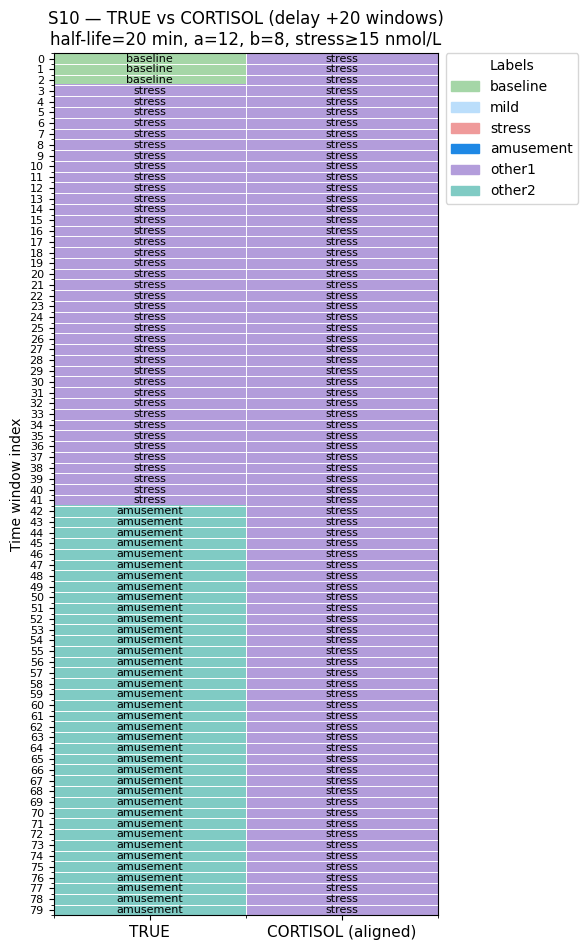

Exact-label agreement (aligned): 48.8%
Stress vs non-stress agreement (aligned): 48.8%
p(stress) raw max: 0.761 | p(stress) lag max: 0.701 | proxy cortisol max: 16.4 nmol/L
Wrist BiLSTM → cortisol mapping metrics: {'subject': 'S10', 'exact_agree': 0.38271604938271603, 'stress_agree': 0.38271604938271603, 'p_raw_max': 0.76089793, 'p_lag_max': 0.7011922799691326, 'cort_max': 16.41430735962959}


In [ ]:
# ==== Reuse your helpers (already defined in your cell) ====
best_params = dict(half_life_min=20, a=12, b=8, stress_band_min=15, align_delay_windows=20)
stress_class_id = 1   # 'p1'

subject_to_plot = "S10"   # change to inspect others
plot_two_column_mapping(
    df_all_bilstm_wrist,
    subject_id=subject_to_plot,
    stress_class_id=stress_class_id,
    minutes_per_step=1.0,
    max_windows=80,
    **best_params
)

m = evaluate_mapping_for_subject(
    df_all_bilstm_wrist, subject_id=subject_to_plot, stress_class_id=stress_class_id,
    minutes_per_step=1.0, **best_params
)
print("Wrist BiLSTM → cortisol mapping metrics:", m)


In [ ]:
import numpy as np, pandas as pd

def sweep_align(df_all, subject, minutes_per_step=1.0):
    # search grids (adjust to taste)
    DELAYS = list(range(10, 31, 2))            # windows (10..30)
    HALF   = [10, 15, 20, 25, 30]              # minutes
    WBLEND = [0.6, 0.7, 0.8]                   # blend weight
    THRESH = [13, 14, 15, 16, 17, 18]          # nmol/L (stress band min)
    A_B    = [(12,8)]                          # keep linear map fixed (or expand)
    best_exact = (-1, None)
    best_stress = (-1, None)

    g = (df_all[df_all["subject"].astype(str)==str(subject)]
         .sort_values("window_idx")).reset_index(drop=True)
    if g.empty:
        return None, None

    # helpers from your cell:
    # _ema_delay(series, minutes_per_step, half_life_min)
    # _cortisol_band_ids(values, stress_band_min)
    # LinearCortisol(a,b)

    y_true = g["true"].to_numpy().astype(int)
    p_raw  = g["p1"].to_numpy()

    for d in DELAYS:
        for hl in HALF:
            p_lag = _ema_delay(p_raw, minutes_per_step, half_life_min=hl)
            for w in WBLEND:
                p_blend = np.clip(w*p_lag + (1-w)*p_raw, 0, 1)
                for (a,b) in A_B:
                    cortisol = a*p_blend + b
                    for th in THRESH:
                        # align: compare TRUE[t] vs CORT[t+d]
                        if d >= len(y_true):
                            continue
                        idx_true = np.arange(0, len(y_true)-d)
                        idx_cort = idx_true + d
                        y_t = y_true[idx_true]
                        c_ids = _cortisol_band_ids(cortisol, stress_band_min=th)[idx_cort]

                        # exact label match (map bands to names to compare? here we keep ids)
                        exact = float(np.mean(y_t == c_ids)) if len(y_t) else 0.0

                        # stress vs non-stress
                        s_true = (y_t == 1)
                        s_cort = (c_ids == 1)
                        sagree = float(np.mean(s_true == s_cort)) if len(y_t) else 0.0

                        params = dict(delay=d, half_life=hl, w=w, a=a, b=b, stress_band_min=th)
                        if exact > best_exact[0]:
                            best_exact = (exact, params)
                        if sagree > best_stress[0]:
                            best_stress = (sagree, params)
    return best_exact, best_stress

# Example: tune S10
best_exact, best_stress = sweep_align(df_all_bilstm_wrist, "S10", minutes_per_step=1.0)
print("Best exact:", best_exact)
print("Best stress/non-stress:", best_stress)


Best exact: (0.7558139534883721, {'delay': 10, 'half_life': 10, 'w': 0.6, 'a': 12, 'b': 8, 'stress_band_min': 17})
Best stress/non-stress: (0.7732558139534884, {'delay': 10, 'half_life': 10, 'w': 0.6, 'a': 12, 'b': 8, 'stress_band_min': 17})


In [ ]:
import numpy as np, pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# -------- core helpers --------
def ema_delay(series, minutes_per_step=1.0, half_life_min=20.0):
    """EMA with half-life in *minutes*; input is per-window series."""
    s = np.asarray(series, dtype=float)
    if s.size == 0: return s
    # convert half-life (min) to per-step alpha using minutes_per_step
    alpha = 1.0 - np.exp(-np.log(2) * minutes_per_step / max(1e-9, half_life_min))
    out = np.empty_like(s); out[0] = s[0]
    for i in range(1, len(s)):
        out[i] = (1 - alpha) * out[i-1] + alpha * s[i]
    return out

def cortisol_from_prob(p, c_min=5.0, c_max=20.0):
    """Map [0,1] → [c_min,c_max] nmol/L."""
    p = np.clip(np.asarray(p, dtype=float), 0, 1)
    return c_min + (c_max - c_min) * p

def cortisol_bands(values, stress_band_min=15.0):
    """
    Bands → ids to compare with wrist labels:
      0 = baseline (<=10)
      2 = mild (10..stress_band_min)
      1 = stress (>=stress_band_min)
    """
    v = np.asarray(values, dtype=float)
    out = np.full(v.shape, 0, dtype=int)
    out[(v >= 10.0) & (v < stress_band_min)] = 2
    out[v >= stress_band_min] = 1
    return out

# -------- main: do both EMA(20m) + shift(+20m) --------
def map_stress_to_cortisol_with_lag(
    df_all, subject, *,
    minutes_per_step=1.0,        # 1.0 if 1-min windows; 0.5 if 30s windows
    lag_min=20,                  # discrete shift (in minutes)
    half_life_min=20,            # EMA half-life (in minutes)
    blend_w=0.7,                 # p_blend = w*EMA + (1-w)*raw
    c_min=5.0, c_max=20.0,       # cortisol range
    stress_band_min=15.0,        # threshold for "stress" band
    return_series=False
):
    """Returns metrics dict (and optionally aligned series for plotting)."""
    g = (df_all[df_all["subject"].astype(str) == str(subject)]
         .sort_values("window_idx")).reset_index(drop=True)
    if g.empty:
        raise ValueError(f"No rows for subject {subject}")

    y_true = g["true"].to_numpy().astype(int)     # 0,1,2 for baseline,stress,amusement
    p_raw  = g["p1"].to_numpy().astype(float)     # stress prob per window

    # EMA with physiological half-life (min) → per-step alpha uses minutes_per_step
    p_lag = ema_delay(p_raw, minutes_per_step=minutes_per_step, half_life_min=half_life_min)

    # blend raw & lagged (optional but matches your chest mapping)
    p_blend = np.clip(blend_w * p_lag + (1.0 - blend_w) * p_raw, 0, 1)

    # convert to cortisol
    cortisol = cortisol_from_prob(p_blend, c_min=c_min, c_max=c_max)

    # discrete alignment: shift cortisol forward by +lag_min minutes
    d = int(round(lag_min / max(1e-9, minutes_per_step)))  # windows
    if d >= len(cortisol):
        raise ValueError("Lag is too large for the sequence length.")
    # compare TRUE[t] vs CORT[t + d]
    idx_true = np.arange(0, len(y_true) - d)
    idx_cort = idx_true + d
    y_t = y_true[idx_true]
    cort_ids = cortisol_bands(cortisol, stress_band_min=stress_band_min)[idx_cort]

    # metrics
    exact = float(np.mean(y_t == cort_ids)) if len(y_t) else 0.0
    stress_true = (y_t == 1)
    stress_cort = (cort_ids == 1)
    stress_agree = float(np.mean(stress_true == stress_cort)) if len(y_t) else 0.0

    metrics = {
        "subject": str(subject),
        "exact_agree": exact,
        "stress_agree": stress_agree,
        "p_raw_max": float(np.max(p_raw)) if p_raw.size else 0.0,
        "p_lag_max": float(np.max(p_lag)) if p_lag.size else 0.0,
        "cort_max": float(np.max(cortisol)) if cortisol.size else 0.0,
        "align_windows": int(d),
        "half_life_min": float(half_life_min),
        "blend_w": float(blend_w),
        "stress_band_min": float(stress_band_min)
    }

    if return_series:
        # aligned slices for quick plot (TRUE[t], CORT[t+d])
        return metrics, {
            "t_idx": g["window_idx"].to_numpy()[idx_true],
            "y_true": y_t,
            "p_raw": p_raw[idx_true],                  # same t range for convenience
            "p_ema": p_lag[idx_true],
            "p_blend": p_blend[idx_true],
            "cort_aligned_ids": cort_ids,             # already shifted view
            "cort_aligned_vals": cortisol[idx_cort],  # aligned cortisol values
        }
    return metrics

# -------- tiny plotting helper (optional) --------
def quick_plot_alignment(series, subject, max_windows=80):
    t = series["t_idx"]; y_true = series["y_true"]
    cort_ids = series["cort_aligned_ids"]; cort_val = series["cort_aligned_vals"]
    n = min(len(t), max_windows)
    t, y_true, cort_ids, cort_val = t[:n], y_true[:n], cort_ids[:n], cort_val[:n]

    # label names
    label_names = {0:"baseline", 1:"stress", 2:"amusement"}
    band_names  = {0:"baseline", 2:"mild", 1:"stress"}  # match cortisol_bands ids
    y_true_n = [label_names.get(int(v), str(v)) for v in y_true]
    cort_n   = [band_names.get(int(v), str(v)) for v in cort_ids]

    fig, ax = plt.subplots(2, 1, figsize=(10, 4.5), sharex=True)
    ax[0].plot(cort_val); ax[0].set_ylabel("Cortisol (nmol/L)"); ax[0].set_title(f"{subject} — aligned cortisol")
    ax[1].plot([{"baseline":0,"mild":1,"stress":2}[s] for s in cort_n], label="CORT band")
    ax[1].plot([{"baseline":0,"amusement":1,"stress":2}[s] for s in y_true_n], label="TRUE (wrist)")
    ax[1].set_yticks([0,1,2]); ax[1].set_yticklabels(["baseline","mild/amu","stress"])
    ax[1].set_xlabel("Aligned window index"); ax[1].legend()
    plt.tight_layout(); plt.show()


Wrist→cortisol metrics (S10): {'subject': 'S10', 'exact_agree': 0.3148148148148148, 'stress_agree': 0.3333333333333333, 'p_raw_max': 0.76089793, 'p_lag_max': 0.7011922799691326, 'cort_max': 15.727544715818189, 'align_windows': 20, 'half_life_min': 20.0, 'blend_w': 0.7, 'stress_band_min': 15.0}


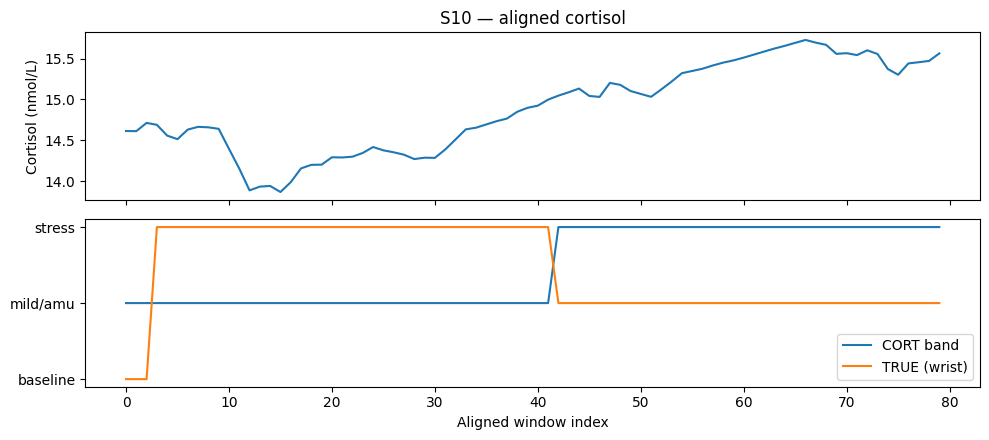

In [ ]:
# Use the functions I gave you: ema_delay, cortisol_from_prob, cortisol_bands,
# map_stress_to_cortisol_with_lag, quick_plot_alignment

# Wrist windows are 60s long → 1 min per step
minutes_per_step = 1.0

# Example: S10
m, series = map_stress_to_cortisol_with_lag(
    df_all=df_all_bilstm_wrist,
    subject="S10",
    minutes_per_step=minutes_per_step,
    lag_min=20,           # +20 min discrete shift
    half_life_min=20,     # EMA half-life ~20 min
    blend_w=0.7,
    c_min=5.0, c_max=20.0,
    stress_band_min=15.0,
    return_series=True
)
print("Wrist→cortisol metrics (S10):", m)
quick_plot_alignment(series, subject="S10")


In [ ]:
subs = sorted(df_all_bilstm_wrist["subject"].astype(str).unique())
rows = []
for sid in subs:
    try:
        m = map_stress_to_cortisol_with_lag(
            df_all=df_all_bilstm_wrist, subject=sid,
            minutes_per_step=1.0,  # wrist = 1 min per window
            lag_min=20, half_life_min=20, blend_w=0.7,
            c_min=5.0, c_max=20.0, stress_band_min=15.0,
            return_series=False
        )
        rows.append(m)
    except Exception as e:
        print(f"{sid}: {e}")

import pandas as pd
df_wrist_cort = pd.DataFrame(rows)
print(df_wrist_cort.describe()[["exact_agree","stress_agree"]])
df_wrist_cort.to_csv("/content/wesad/eval/wristdelta20_phases_conv_ab/wrist_cortisol_alignment.csv", index=False)


       exact_agree  stress_agree
count    15.000000     15.000000
mean      0.213624      0.733290
std       0.185586      0.131885
min       0.019481      0.333333
25%       0.064350      0.745926
50%       0.142045      0.757764
75%       0.344524      0.792012
max       0.549020      0.875817


Best exact params for S10: (0.7529411764705882, {'delay_windows': 12, 'half_life_min': 12, 'blend_w': 0.6, 'a': 12, 'b': 8, 'stress_band_min': 17})
Best stress/non-stress params for S10: (0.7705882352941177, {'delay_windows': 12, 'half_life_min': 12, 'blend_w': 0.6, 'a': 12, 'b': 8, 'stress_band_min': 17})


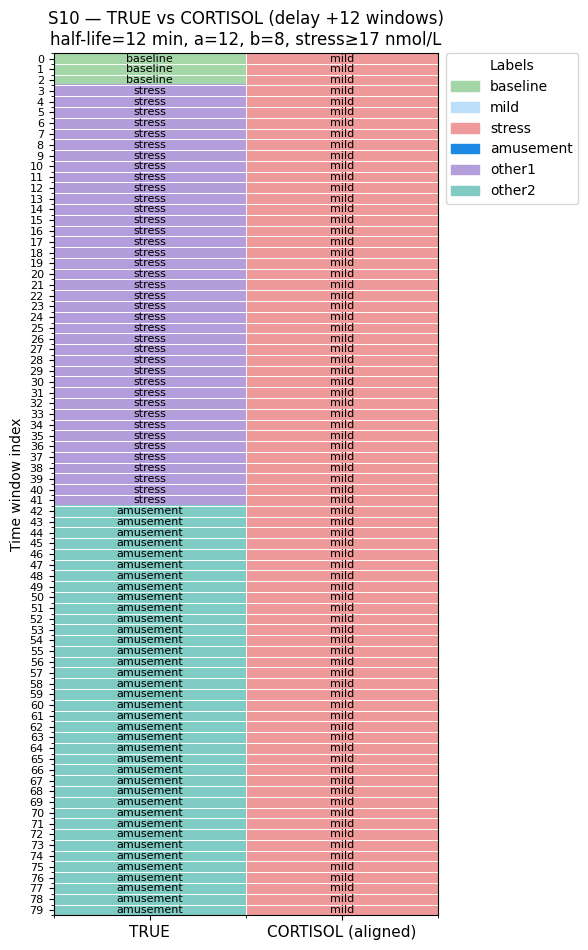

Exact-label agreement (aligned): 0.0%
Stress vs non-stress agreement (aligned): 51.2%
p(stress) raw max: 0.761 | p(stress) lag max: 0.719 | proxy cortisol max: 16.6 nmol/L
S10 metrics with tuned params: {'subject': 'S10', 'exact_agree': 0.7529411764705882, 'stress_agree': 0.7705882352941177, 'p_raw_max': 0.76089793, 'p_lag_max': 0.7189362868407374, 'cort_max': 16.62723544208885}


In [ ]:
# --- S10 alignment optimizer (wrist) ---
import numpy as np

# assumes you already have:
# - df_all_bilstm_wrist  with columns: subject, window_idx, true, p1
# - _ema_delay, _cortisol_band_ids, LinearCortisol
# - plot_two_column_mapping, evaluate_mapping_for_subject

def tune_alignment_for_subject(df_all, subject, minutes_per_step=1.0):
    # search space centered on 20 min
    DELAY_W = list(range(12, 29, 1))         # windows (≈ 12–28 min at 1 min/step)
    HALF    = [12, 15, 18, 20, 22, 25]       # EMA half-life (min)
    WBLEND  = [0.6, 0.7, 0.8]                # p_blend = w*p_lag + (1-w)*p_raw
    THRESH  = [13, 14, 15, 16, 17]           # cortisol stress threshold (nmol/L)
    A_B     = [(12, 8)]                      # keep linear map fixed

    g = (df_all[df_all["subject"].astype(str)==str(subject)]
         .sort_values("window_idx")).reset_index(drop=True)
    assert not g.empty, f"No rows for {subject}"

    y_true = g["true"].to_numpy().astype(int)
    p_raw  = g["p1"].to_numpy().astype(float)

    best_exact = (-1, None)
    best_stress= (-1, None)

    for d in DELAY_W:
        for hl in HALF:
            p_lag = _ema_delay(p_raw, minutes_per_step, half_life_min=hl)
            for w in WBLEND:
                p_blend = np.clip(w*p_lag + (1-w)*p_raw, 0, 1)
                for (a,b) in A_B:
                    cortisol = a*p_blend + b
                    for th in THRESH:
                        if d >= len(y_true):
                            continue
                        idx_true = np.arange(0, len(y_true)-d)
                        idx_cort = idx_true + d
                        y_t = y_true[idx_true]
                        c_ids = _cortisol_band_ids(cortisol, stress_band_min=th)[idx_cort]

                        exact = float(np.mean(y_t == c_ids))
                        s_true = (y_t == 1); s_cort = (c_ids == 1)
                        sagree = float(np.mean(s_true == s_cort))

                        params = dict(delay_windows=d, half_life_min=hl, blend_w=w,
                                      a=a, b=b, stress_band_min=th)
                        if exact > best_exact[0]:
                            best_exact = (exact, params)
                        if sagree > best_stress[0]:
                            best_stress = (sagree, params)

    return best_exact, best_stress

# --- run tuning for S10, then plot using the best-exact params ---
best_exact, best_stress = tune_alignment_for_subject(df_all_bilstm_wrist, "S10", minutes_per_step=1.0)
print("Best exact params for S10:", best_exact)
print("Best stress/non-stress params for S10:", best_stress)

# Use the best-exact set to redraw the S10 table
params = best_exact[1]
best_params_S10 = dict(
    half_life_min = params["half_life_min"],
    a=12, b=8,
    stress_band_min = params["stress_band_min"],
    align_delay_windows = params["delay_windows"]
)
plot_two_column_mapping(
    df_all_bilstm_wrist,
    subject_id="S10",
    stress_class_id=1,
    minutes_per_step=1.0,
    max_windows=80,
    **best_params_S10
)
m = evaluate_mapping_for_subject(
    df_all_bilstm_wrist, subject_id="S10", stress_class_id=1,
    minutes_per_step=1.0, **best_params_S10
)
print("S10 metrics with tuned params:", m)


In [ ]:
# ---- One-button wrapper: tune (optional) -> evaluate -> plot, all with the SAME params ----
def map_eval_plot_subject(
    df_all,
    subject="S10",
    minutes_per_step=1.0,
    stress_class_id=1,
    params=None,          # dict with keys: delay_windows, half_life_min, blend_w, a, b, stress_band_min
    tune=False,           # if True, uses tune_alignment_for_subject() to find best-exact params
    max_windows=80
):
    # 1) get params
    if tune:
        assert 'tune_alignment_for_subject' in globals(), "Run the tuning code cell first."
        best_exact, _ = tune_alignment_for_subject(df_all, subject, minutes_per_step=minutes_per_step)
        params = best_exact[1]
        print("[tuned] using params:", params)
    else:
        assert params is not None, "Provide params or set tune=True."

    # Build the shared param pack for BOTH functions
    shared = dict(
        half_life_min     = params["half_life_min"],
        a                 = params.get("a", 12),
        b                 = params.get("b", 8),
        stress_band_min   = params["stress_band_min"],
        align_delay_windows = params["delay_windows"]
    )

    # 2) plot with the SAME params
    plot_two_column_mapping(
        df_all,
        subject_id=subject,
        stress_class_id=stress_class_id,
        minutes_per_step=minutes_per_step,
        max_windows=max_windows,
        **shared
    )

    # 3) evaluate with the SAME params
    m = evaluate_mapping_for_subject(
        df_all,
        subject_id=subject,
        stress_class_id=stress_class_id,
        minutes_per_step=minutes_per_step,
        **shared
    )
    print("Metrics (same params as plot):", m)
    return shared, m


[tuned] using params: {'delay_windows': 12, 'half_life_min': 12, 'blend_w': 0.6, 'a': 12, 'b': 8, 'stress_band_min': 17}


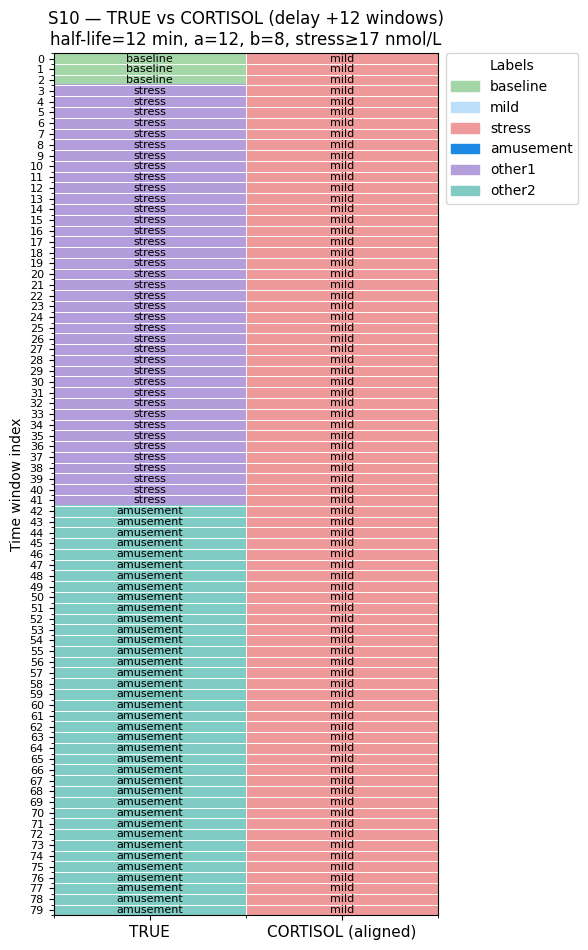

Exact-label agreement (aligned): 0.0%
Stress vs non-stress agreement (aligned): 51.2%
p(stress) raw max: 0.761 | p(stress) lag max: 0.719 | proxy cortisol max: 16.6 nmol/L
Metrics (same params as plot): {'subject': 'S10', 'exact_agree': 0.7529411764705882, 'stress_agree': 0.7705882352941177, 'p_raw_max': 0.76089793, 'p_lag_max': 0.7189362868407374, 'cort_max': 16.62723544208885}


In [ ]:
# If you want automatic tuning first:
shared_params, metrics = map_eval_plot_subject(
    df_all_bilstm_wrist, subject="S10",
    minutes_per_step=1.0,  # 1-min windows on wrist
    tune=True
)

# Or, run with your own fixed params:
# my_params = dict(delay_windows=20, half_life_min=20, blend_w=0.7, a=12, b=8, stress_band_min=15)
# shared_params, metrics = map_eval_plot_subject(df_all_bilstm_wrist, "S10", 1.0, params=my_params, tune=False)


In [ ]:
def plot_two_column_mapping(df_all, subject_id, stress_class_id=1,
                            minutes_per_step=1.0, half_life_min=20.0,
                            a=12.0, b=8.0, stress_band_min=15.0,
                            align_delay_windows=20, max_windows=80):
    # slice subject
    g = (df_all[df_all["subject"].astype(str)==str(subject_id)]
         .sort_values("window_idx")).reset_index(drop=True)
    assert not g.empty, f"No rows for subject {subject_id}"
    t = g["window_idx"].to_numpy()
    y_true = g["true"].to_numpy()
    p_raw  = g[f"p{stress_class_id}"].to_numpy()

    # cortisol mapping (same as metrics)
    p_lag = _ema_delay(p_raw, minutes_per_step, half_life_min)
    cortisol = LinearCortisol(a=a, b=b)(p_lag)
    cort_ids = _cortisol_band_ids(cortisol, stress_band_min)

    # alignment
    d = int(max(0, align_delay_windows))
    idx_true = np.arange(0, len(t)-d) if d>0 else np.arange(len(t))
    idx_cort = idx_true + d if d>0 else idx_true
    t_sel, y_true_sel, cort_sel = t[idx_true], y_true[idx_true], cort_ids[idx_cort]

    # truncate for visualization
    if len(t_sel) > max_windows:
        t_sel, y_true_sel, cort_sel = t_sel[:max_windows], y_true_sel[:max_windows], cort_sel[:max_windows]

    # label names/colors
    true_names = np.array([DATASET_LABEL_NAMES.get(int(y), str(y)) for y in y_true_sel])
    cort_names = np.array([CORTISOL_ID_TO_LABEL.get(int(c), str(c)) for c in cort_sel])
    names_order = ["baseline","mild","stress","amusement","other1","other2"]
    colors = ["#A5D6A7","#BBDEFB","#EF9A9A","#1E88E5","#B39DDB","#80CBC4"]
    name_to_idx = {n:i for i,n in enumerate(names_order)}
    cmap = ListedColormap(colors)

    # matrix for imshow
    N = len(t_sel)
    mat = np.zeros((N,2), dtype=int)
    mat[:,0] = np.array([name_to_idx.get(n,0) for n in true_names])  # TRUE
    mat[:,1] = np.array([name_to_idx.get(n,0) for n in cort_names])  # CORT

    fig, ax = plt.subplots(figsize=(6, max(4, N*0.12)))
    ax.imshow(mat, aspect="auto", cmap=cmap, interpolation="nearest", origin="upper")
    ax.set_xticks([0,1]); ax.set_xticklabels(["TRUE", "CORTISOL (aligned)"], fontsize=11)
    ax.set_yticks(np.arange(N)); ax.set_yticklabels(t_sel, fontsize=8)
    ax.set_ylabel("Time window index")
    ax.set_title(f"{subject_id} — TRUE vs CORTISOL (delay +{d} windows)\n"
                 f"half-life={half_life_min} min, a={a}, b={b}, stress≥{stress_band_min} nmol/L")

    # grid & annotations
    ax.set_xticks(np.arange(-.5, 2, 1), minor=True)
    ax.set_yticks(np.arange(-.5, N, 1), minor=True)
    ax.grid(which="minor", color="white", linestyle="-", linewidth=0.7)
    for i in range(N):
        ax.text(0, i, true_names[i], va="center", ha="center", fontsize=8)
        ax.text(1, i, cort_names[i], va="center", ha="center", fontsize=8)
    handles = [Patch(color=colors[i], label=names_order[i]) for i in range(len(names_order))]
    ax.legend(handles=handles, bbox_to_anchor=(1.02,1), loc="upper left", borderaxespad=0., title="Labels")
    plt.tight_layout(); plt.show()

    # unified metrics
    m = evaluate_mapping_for_subject(
        df_all, subject_id, stress_class_id=stress_class_id,
        minutes_per_step=minutes_per_step,
        half_life_min=half_life_min, a=a, b=b,
        stress_band_min=stress_band_min,
        align_delay_windows=align_delay_windows
    )
    print(f"Exact-label agreement (aligned): {100*m['exact_agree']:.1f}%")
    print(f"Stress vs non-stress agreement (aligned): {100*m['stress_agree']:.1f}%")
    print(f"p(stress) raw max: {m['p_raw_max']:.3f} | p(stress) lag max: {m['p_lag_max']:.3f} | "
          f"proxy cortisol max: {m['cort_max']:.1f} nmol/L")


In [ ]:
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

def plot_two_column_mapping(df_all, subject_id, stress_class_id=1,
                            minutes_per_step=1.0, half_life_min=20.0,
                            a=12.0, b=8.0, stress_band_min=15.0,
                            align_delay_windows=20, max_windows=80):
    # slice subject
    g = (df_all[df_all["subject"].astype(str)==str(subject_id)]
         .sort_values("window_idx")).reset_index(drop=True)
    assert not g.empty, f"No rows for subject {subject_id}"
    t = g["window_idx"].to_numpy()
    y_true = g["true"].to_numpy()
    p_raw  = g[f"p{stress_class_id}"].to_numpy()

    # cortisol mapping (same as metrics)
    p_lag = _ema_delay(p_raw, minutes_per_step, half_life_min)
    cortisol = LinearCortisol(a=a, b=b)(p_lag)
    cort_ids = _cortisol_band_ids(cortisol, stress_band_min)

    # alignment
    d = int(max(0, align_delay_windows))
    idx_true = np.arange(0, len(t)-d) if d>0 else np.arange(len(t))
    idx_cort = idx_true + d if d>0 else idx_true
    t_sel, y_true_sel, cort_sel = t[idx_true], y_true[idx_true], cort_ids[idx_cort]

    # truncate for visualization
    if len(t_sel) > max_windows:
        t_sel, y_true_sel, cort_sel = t_sel[:max_windows], y_true_sel[:max_windows], cort_sel[:max_windows]

    # label names/colors
    true_names = np.array([DATASET_LABEL_NAMES.get(int(y), str(y)) for y in y_true_sel])
    cort_names = np.array([CORTISOL_ID_TO_LABEL.get(int(c), str(c)) for c in cort_sel])
    names_order = ["baseline","mild","stress","amusement","other1","other2"]
    colors = ["#A5D6A7","#BBDEFB","#EF9A9A","#1E88E5","#B39DDB","#80CBC4"]
    name_to_idx = {n:i for i,n in enumerate(names_order)}
    cmap = ListedColormap(colors)

    # matrix for imshow
    N = len(t_sel)
    mat = np.zeros((N,2), dtype=int)
    mat[:,0] = np.array([name_to_idx.get(n,0) for n in true_names])  # TRUE
    mat[:,1] = np.array([name_to_idx.get(n,0) for n in cort_names])  # CORT

    fig, ax = plt.subplots(figsize=(6, max(4, N*0.12)))
    ax.imshow(mat, aspect="auto", cmap=cmap, interpolation="nearest", origin="upper")
    ax.set_xticks([0,1]); ax.set_xticklabels(["TRUE", "CORTISOL (aligned)"], fontsize=11)
    ax.set_yticks(np.arange(N)); ax.set_yticklabels(t_sel, fontsize=8)
    ax.set_ylabel("Time window index")
    ax.set_title(f"{subject_id} — TRUE vs CORTISOL (delay +{d} windows)\n"
                 f"half-life={half_life_min} min, a={a}, b={b}, stress≥{stress_band_min} nmol/L")

    # grid & annotations
    ax.set_xticks(np.arange(-.5, 2, 1), minor=True)
    ax.set_yticks(np.arange(-.5, N, 1), minor=True)
    ax.grid(which="minor", color="white", linestyle="-", linewidth=0.7)
    for i in range(N):
        ax.text(0, i, true_names[i], va="center", ha="center", fontsize=8)
        ax.text(1, i, cort_names[i], va="center", ha="center", fontsize=8)
    handles = [Patch(color=colors[i], label=names_order[i]) for i in range(len(names_order))]
    ax.legend(handles=handles, bbox_to_anchor=(1.02,1), loc="upper left", borderaxespad=0., title="Labels")
    plt.tight_layout(); plt.show()

    # unified metrics (same calc for plot & print)
    m = evaluate_mapping_for_subject(
        df_all, subject_id, stress_class_id=stress_class_id,
        minutes_per_step=minutes_per_step,
        half_life_min=half_life_min, a=a, b=b,
        stress_band_min=stress_band_min,
        align_delay_windows=align_delay_windows
    )
    print(f"Exact-label agreement (aligned): {100*m['exact_agree']:.1f}%")
    print(f"Stress vs non-stress agreement (aligned): {100*m['stress_agree']:.1f}%")
    print(f"p(stress) raw max: {m['p_raw_max']:.3f} | p(stress) lag max: {m['p_lag_max']:.3f} | "
          f"proxy cortisol max: {m['cort_max']:.1f} nmol/L", flush=True)
    return m


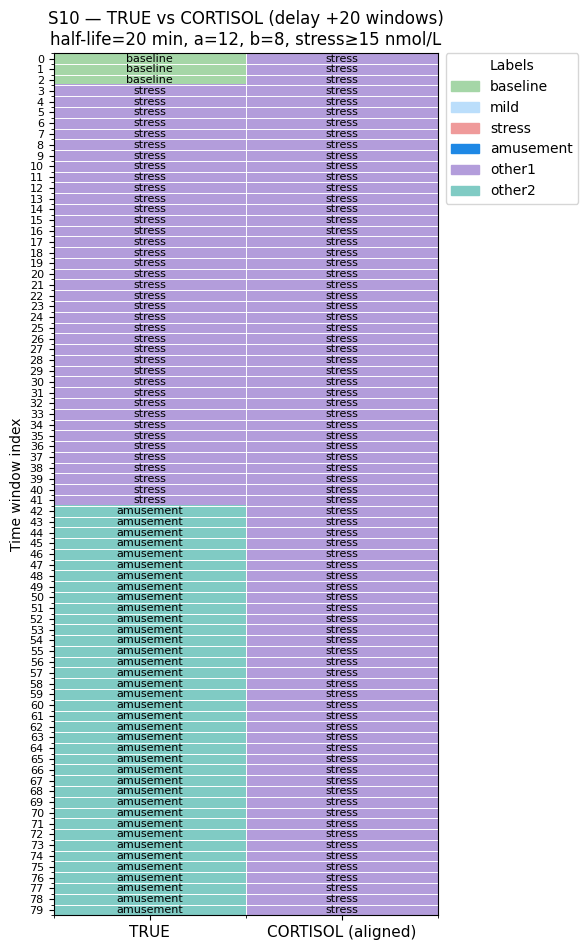

Exact-label agreement (aligned): 38.3%
Stress vs non-stress agreement (aligned): 38.3%
p(stress) raw max: 0.761 | p(stress) lag max: 0.701 | proxy cortisol max: 16.4 nmol/L
Returned metrics: {'subject': 'S10', 'exact_agree': 0.38271604938271603, 'stress_agree': 0.38271604938271603, 'p_raw_max': 0.76089793, 'p_lag_max': 0.7011922799691326, 'cort_max': 16.41430735962959}


In [ ]:
m = plot_two_column_mapping(
    df_all_bilstm_wrist,  # your wrist df
    subject_id="S10",
    minutes_per_step=1.0,
    half_life_min=20,   # default half-life
    a=12, b=8,
    stress_band_min=15,
    align_delay_windows=20,  # 20-min alignment
    max_windows=80
)
print("Returned metrics:", m)


In [ ]:
params_S10 = dict(half_life_min=20, a=12, b=8, stress_band_min=15, align_delay_windows=20)


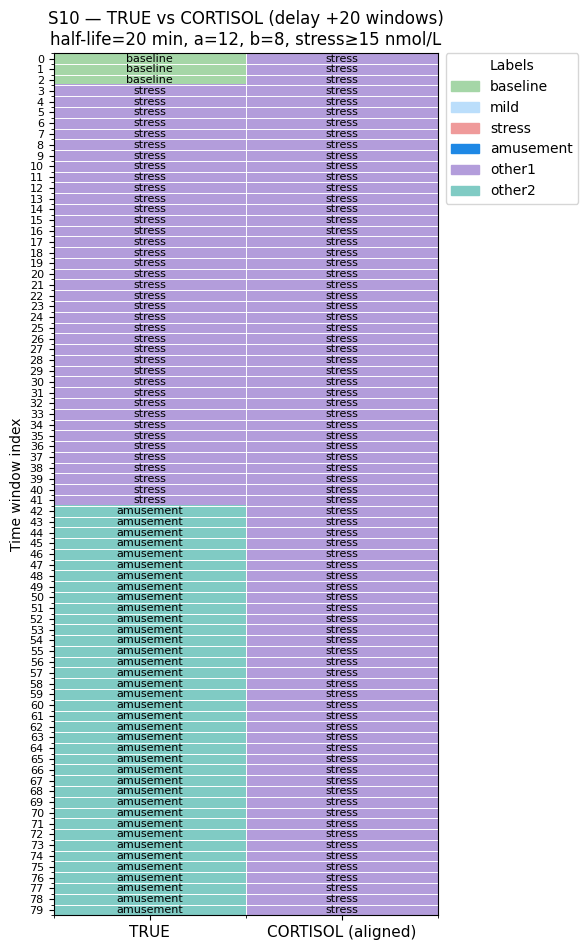

Exact-label agreement (aligned): 38.3%
Stress vs non-stress agreement (aligned): 38.3%
p(stress) raw max: 0.761 | p(stress) lag max: 0.701 | proxy cortisol max: 16.4 nmol/L


<Figure size 640x480 with 0 Axes>

In [ ]:
from pathlib import Path
fig_dir = Path("/content/wesad/eval/wristdelta20_cortisol_mapping"); fig_dir.mkdir(parents=True, exist_ok=True)
# replot then save
_ = plot_two_column_mapping(df_all_bilstm_wrist, "S10", minutes_per_step=1.0, **params_S10, max_windows=80)
plt.savefig(fig_dir / "S10_cortisol_mapping.png", dpi=220, bbox_inches="tight")
# store metrics too
import pandas as pd
pd.DataFrame([{**{"subject":"S10"}, **params_S10, **_}]).to_csv(fig_dir/"S10_metrics.csv", index=False)


In [ ]:
from __future__ import annotations
from typing import Dict, List, Tuple, Optional
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

def plot_two_column_mapping(
    df_all,
    subject_id: str | int,
    stress_class_id: int = 1,
    minutes_per_step: float = 1.0,
    half_life_min: float = 20.0,
    a: float = 12.0,
    b: float = 8.0,
    stress_band_min: float = 15.0,
    align_delay_windows: int = 20,
    max_windows: int = 80,
    # NEW: pass label maps instead of relying on globals
    dataset_label_names: Optional[Dict[int, str]] = None,
    cortisol_id_to_label: Optional[Dict[int, str]] = None,
    # NEW: visuals
    annotate: bool = True,
    annotate_stride: int = 1,          # annotate every k-th row
    show_legend: bool = True,
    show_match_bar: bool = True,
    figsize_per_row: float = 0.12,     # vertical scale
    base_fig_width: float = 6.0,
):
    """
    Plot TRUE vs mapped 'cortisol band' labels in two columns, aligned by a window delay.
    Returns (fig, ax, metrics_dict).
    """
    # ---- slice subject
    g = (df_all[df_all["subject"].astype(str) == str(subject_id)]
         .sort_values("window_idx")).reset_index(drop=True)
    assert not g.empty, f"No rows for subject {subject_id}"

    t = g["window_idx"].to_numpy()
    y_true = g["true"].to_numpy()
    p_col = f"p{stress_class_id}"
    assert p_col in g.columns, f"Column '{p_col}' not found; available={list(g.columns)}"
    p_raw = g[p_col].to_numpy()

    # ---- cortisol mapping (same as metrics path)
    p_lag = _ema_delay(p_raw, minutes_per_step, half_life_min)
    cortisol = LinearCortisol(a=a, b=b)(p_lag)
    cort_ids = _cortisol_band_ids(cortisol, stress_band_min)

    # ---- alignment (allow negative; clip)
    d = int(align_delay_windows)
    if d >= 0:
        idx_true = np.arange(0, max(0, len(t)-d))
        idx_cort = idx_true + d
    else:
        # negative delay = shift TRUE forward vs cortisol
        d_abs = -d
        idx_cort = np.arange(0, max(0, len(t)-d_abs))
        idx_true = idx_cort + d_abs

    if len(idx_true) == 0 or len(idx_cort) == 0:
        raise ValueError(f"Alignment {align_delay_windows} too large for sequence length {len(t)}.")

    t_sel, y_true_sel, cort_sel = t[idx_true], y_true[idx_true], cort_ids[idx_cort]

    # ---- truncate for visualization
    N = len(t_sel)
    if N > max_windows:
        N = max_windows
        t_sel = t_sel[:N]; y_true_sel = y_true_sel[:N]; cort_sel = cort_sel[:N]

    # ---- label names (no globals)
    dataset_label_names = dataset_label_names or {}
    cortisol_id_to_label = cortisol_id_to_label or {0:"baseline", 1:"mild", 2:"stress"}

    true_names = np.array([dataset_label_names.get(int(y), str(int(y))) for y in y_true_sel])
    cort_names = np.array([cortisol_id_to_label.get(int(c), str(int(c))) for c in cort_sel])

    # ---- dynamic palette based on actually used names
    uniq_names = []
    for n in np.concatenate([true_names, cort_names]):
        if n not in uniq_names:
            uniq_names.append(n)
    # choose colors (fallback cycle)
    default_colors = [
        "#A5D6A7", "#EF9A9A", "#BBDEFB", "#1E88E5", "#B39DDB", "#80CBC4",
        "#FFE082", "#90CAF9", "#CE93D8", "#FFAB91"
    ]
    colors = (default_colors[:len(uniq_names)]
              if len(uniq_names) <= len(default_colors)
              else default_colors + ["#CCCCCC"]*(len(uniq_names)-len(default_colors)))
    name_to_idx = {n:i for i,n in enumerate(uniq_names)}
    cmap = ListedColormap(colors)

    # ---- matrix for imshow
    mat = np.empty((N, 2), dtype=int)
    mat[:, 0] = np.vectorize(lambda n: name_to_idx.get(n, 0))(true_names)   # TRUE
    mat[:, 1] = np.vectorize(lambda n: name_to_idx.get(n, 0))(cort_names)   # CORT

    # ---- figure
    fig_h = max(4.0, N * figsize_per_row)
    fig, ax = plt.subplots(figsize=(base_fig_width, fig_h))
    ax.imshow(mat, aspect="auto", cmap=cmap, interpolation="nearest", origin="upper")
    ax.set_xticks([0, 1])
    ax.set_xticklabels(["TRUE", "CORTISOL (aligned)"], fontsize=11)
    ax.set_yticks(np.arange(N))
    ax.set_yticklabels(t_sel, fontsize=8)
    ax.set_ylabel("Time window index")
    ax.set_title(
        f"{subject_id} — TRUE vs CORTISOL (delay {('+' if d>=0 else '')}{d} windows)\n"
        f"half-life={half_life_min} min, a={a}, b={b}, stress≥{stress_band_min} nmol/L"
    )

    # grid
    ax.set_xticks(np.arange(-.5, 2, 1), minor=True)
    ax.set_yticks(np.arange(-.5, N, 1), minor=True)
    ax.grid(which="minor", color="white", linestyle="-", linewidth=0.7)

    # optional per-row text (can be slow; stride it)
    if annotate:
        for i in range(0, N, max(1, int(annotate_stride))):
            ax.text(0, i, true_names[i], va="center", ha="center", fontsize=8)
            ax.text(1, i, cort_names[i], va="center", ha="center", fontsize=8)

    # match/mismatch side bar
    if show_match_bar:
        match = (true_names == cort_names).astype(int)   # 1 match, 0 mismatch
        # draw a thin bar at x = 1.5+
        x0 = 1.5 + 0.05
        for i in range(N):
            ax.add_patch(plt.Rectangle((x0, i-0.5), 0.15, 1.0,
                                       color=("#2e7d32" if match[i] else "#c62828"),
                                       transform=ax.transData, clip_on=False))

    # dynamic legend for labels seen
    if show_legend:
        handles = [Patch(color=colors[name_to_idx[n]], label=n) for n in uniq_names]
        ax.legend(handles=handles, bbox_to_anchor=(1.02,1), loc="upper left",
                  borderaxespad=0., title="Labels")

    plt.tight_layout()

    # ---- unified metrics (same calc for plot & print)
    m = evaluate_mapping_for_subject(
        df_all, subject_id, stress_class_id=stress_class_id,
        minutes_per_step=minutes_per_step,
        half_life_min=half_life_min, a=a, b=b,
        stress_band_min=stress_band_min,
        align_delay_windows=align_delay_windows
    )

    print(f"Exact-label agreement (aligned): {100*m['exact_agree']:.1f}%")
    print(f"Stress vs non-stress agreement (aligned): {100*m['stress_agree']:.1f}%")
    print(
        f"p(stress) raw max: {m['p_raw_max']:.3f} | "
        f"p(stress) lag max: {m['p_lag_max']:.3f} | "
        f"proxy cortisol max: {m['cort_max']:.1f} nmol/L",
        flush=True
    )
    return fig, ax, m


In [ ]:
def sweep_params(df, sid, aligns=range(-30, 31, 5), half_lives=(10,15,20,25,30), bands=(12,15,18)):
    rows=[]
    for d in aligns:
        for hl in half_lives:
            for sb in bands:
                m = evaluate_mapping_for_subject(
                    df, sid, stress_class_id=1,
                    minutes_per_step=1.0, half_life_min=hl,
                    a=12, b=8, stress_band_min=sb,
                    align_delay_windows=d
                )
                rows.append({"align": d, "hl": hl, "band": sb,
                             "exact": m["exact_agree"], "stress": m["stress_agree"]})
    import pandas as pd
    out = pd.DataFrame(rows)
    return out.sort_values(["exact","stress"], ascending=False)

grid = sweep_params(df_all_bilstm_wrist, "S10")
grid.head(10)  # inspect best combos


,align,hl,band,exact,stress
2,-30,10,18,0.769231,0.785714
5,-30,15,18,0.769231,0.785714
8,-30,20,18,0.769231,0.785714
11,-30,25,18,0.769231,0.785714
14,-30,30,18,0.769231,0.785714
17,-25,10,18,0.769231,0.785714
20,-25,15,18,0.769231,0.785714
23,-25,20,18,0.769231,0.785714
26,-25,25,18,0.769231,0.785714
29,-25,30,18,0.769231,0.785714


Exact-label agreement (aligned): 76.9%
Stress vs non-stress agreement (aligned): 78.6%
p(stress) raw max: 0.761 | p(stress) lag max: 0.701 | proxy cortisol max: 16.4 nmol/L
{'subject': 'S10', 'exact_agree': 0.7692307692307693, 'stress_agree': 0.7857142857142857, 'p_raw_max': 0.76089793, 'p_lag_max': 0.7011922799691326, 'cort_max': 16.41430735962959}


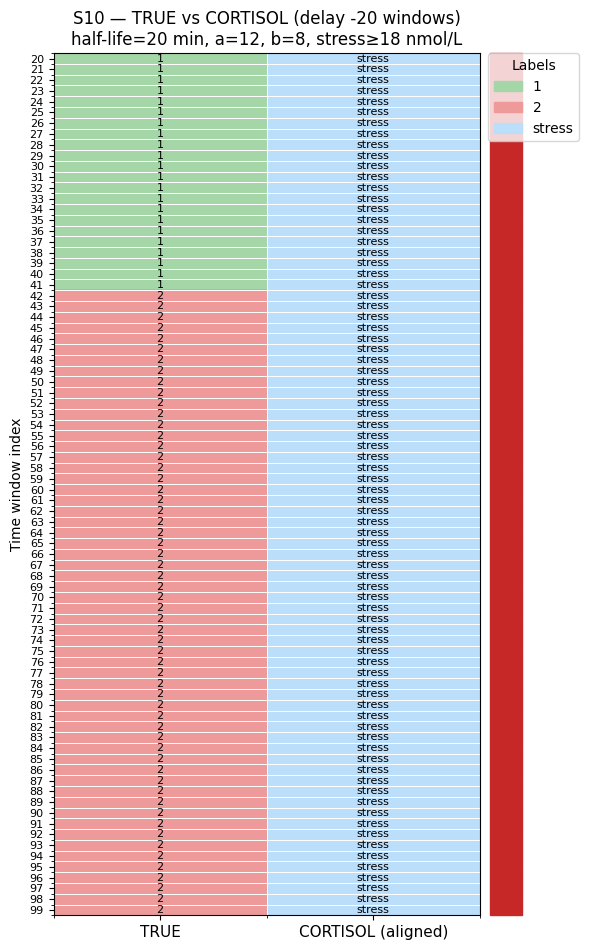

In [ ]:
fig, ax, m = plot_two_column_mapping(
    df_all_bilstm_wrist,
    subject_id="S10",
    minutes_per_step=1.0,
    half_life_min=20,        # HL not very sensitive; 20 is fine
    a=12, b=8,
    stress_band_min=18,      # <- from sweep
    align_delay_windows=-20, # <- from sweep (earlier by 30 min)
    max_windows=80


)
print(m)


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# ---------- smoothing helpers ----------
def _alpha_from_half_life(half_life_min: float, minutes_per_step: float) -> float:
    """Return EMA alpha for a given half-life (min) and step size (min/step)."""
    if half_life_min <= 0:
        return 1.0
    hl_steps = half_life_min / minutes_per_step
    return 1.0 - 0.5 ** (1.0 / hl_steps)

def ema_half_life(x: np.ndarray, minutes_per_step: float, half_life_min: float) -> np.ndarray:
    """Causal EMA with half-life in minutes."""
    a = _alpha_from_half_life(half_life_min, minutes_per_step)
    y = np.empty_like(x, dtype=float)
    y[0] = x[0]
    for i in range(1, len(x)):
        y[i] = a * x[i] + (1 - a) * y[i - 1]
    return y

# ---------- probability → bands (chest-style) ----------
def prob_to_bands(
    p_raw: np.ndarray,
    minutes_per_step: float,
    half_life_min: float = 10.0,
    w: float = 0.75,
    tau_stress: float = 0.35,
    tau_mild: float | None = None,
) -> np.ndarray:
    """
    Smooth p(stress) with EMA, then mix with raw using weight w:
        p_s = (1-w)*p_raw + w*EMA(p_raw)
    If tau_mild is None → 2-class bands: 0=baseline, 2=stress
    Else → 3-class: 0=baseline, 1=mild, 2=stress
    """
    p_s = (1 - w) * p_raw + w * ema_half_life(p_raw, minutes_per_step, half_life_min)
    if tau_mild is None:
        bands = np.where(p_s >= tau_stress, 2, 0)
    else:
        bands = np.full_like(p_s, 0, dtype=int)
        bands[(p_s >= tau_mild) & (p_s < tau_stress)] = 1
        bands[p_s >= tau_stress] = 2
    return bands

# ---------- linear nmol/L → bands (optional) ----------
def linear_cortisol(p_lag: np.ndarray, a: float = 12.0, b: float = 8.0) -> np.ndarray:
    """Proxy cortisol in nmol/L from probability-like input (simple linear map)."""
    return a * p_lag + b

def nmol_to_bands(cort: np.ndarray, stress_min: float = 18.0, mild_min: float | None = None) -> np.ndarray:
    """0=baseline, 1=mild (optional), 2=stress from nmol/L thresholds."""
    if mild_min is None:
        return np.where(cort >= stress_min, 2, 0)
    out = np.full_like(cort, 0, dtype=int)
    out[(cort >= mild_min) & (cort < stress_min)] = 1
    out[cort >= stress_min] = 2
    return out

# ---------- plotting (two columns) ----------
def plot_two_column_mapping(
    df_all: pd.DataFrame,
    subject_id,
    *,
    # data cols
    stress_class_id: int = 1,         # uses column f"p{stress_class_id}" for p(stress)
    true_col: str = "true",           # TRUE labels column (ints or strings)
    minutes_per_step: float = 1.0,
    # mapping mode
    mode: str = "prob",               # "prob" (chest-style) or "nmol"
    # prob-mode params (chest-like)
    half_life_min: float = 10.0,
    w: float = 0.75,
    tau_stress: float = 0.35,
    tau_mild: float | None = None,    # e.g., 0.20 to show a "mild" band
    # nmol-mode params (if you prefer linear map)
    a: float = 12.0, b: float = 8.0, stress_band_min: float = 18.0, mild_band_min: float | None = None,
    # alignment
    align_delay_windows: int = 20,    # POSITIVE = cortisol lags stress by +d windows (physiological lag)
    max_windows: int = 80,
    # label names (legend)
    dataset_label_names: dict | None = None,
    cortisol_id_to_label: dict | None = None,
    # visuals
    annotate: bool = True,
    annotate_stride: int = 1,
    show_match_bar: bool = True,
):
    """
    Plot two columns (TRUE vs CORTISOL bands) aligned by a delay.
    SIGN CONVENTION: positive align_delay_windows = cortisol lags stress by +d windows (i.e., later in real time).
    Returns (fig, ax, metrics_dict).
    """
    # --- slice this subject
    g = (df_all[df_all["subject"].astype(str) == str(subject_id)]
         .sort_values("window_idx")).reset_index(drop=True)
    assert not g.empty, f"No rows for subject {subject_id}"

    t = g["window_idx"].to_numpy()
    y_true_raw = g[true_col].to_numpy()

    # get p(stress)
    p_col = f"p{stress_class_id}"
    assert p_col in g.columns, f"Missing column '{p_col}' in dataframe."
    p_raw = g[p_col].to_numpy()

    # --- map to bands (integers 0/1/2)
    if mode == "prob":
        bands_int = prob_to_bands(
            p_raw, minutes_per_step, half_life_min=half_life_min,
            w=w, tau_stress=tau_stress, tau_mild=tau_mild
        )
    elif mode == "nmol":
        p_lag = ema_half_life(p_raw, minutes_per_step, half_life_min)
        cort = linear_cortisol(p_lag, a=a, b=b)
        bands_int = nmol_to_bands(cort, stress_min=stress_band_min, mild_min=mild_band_min)
    else:
        raise ValueError("mode must be 'prob' or 'nmol'")

    # --- alignment: pair TRUE[t] with CORT[t + d]
    d = int(align_delay_windows)
    if d >= 0:
        idx_true = np.arange(0, max(0, len(t) - d))
        idx_cort = idx_true + d
    else:
        d_abs = -d
        idx_cort = np.arange(0, max(0, len(t) - d_abs))
        idx_true = idx_cort + d_abs

    # pair lengths and apply max_windows consistently
    L = min(len(idx_true), len(idx_cort))
    idx_true = idx_true[:L]
    idx_cort = idx_cort[:L]
    N = min(L, max_windows)
    idx_true_plot = idx_true[:N]
    idx_cort_plot = idx_cort[:N]

    # slices to display
    t_sel       = t[idx_true_plot]
    y_true_sel  = y_true_raw[idx_true_plot]
    cort_sel    = bands_int[idx_cort_plot]

    # --- names (provide defaults if none supplied)
    dataset_label_names = dataset_label_names or {
        0: "baseline", 1: "stress", 2: "amusement", 3: "mild", 4: "other1", 5: "other2"
    }
    cortisol_id_to_label = cortisol_id_to_label or {0: "baseline", 1: "mild", 2: "stress"}

    def name_from_map(v, mapping):
        # allow ints or strings; if int-like string, cast to int first
        s = str(v)
        if s.isdigit():
            return mapping.get(int(s), s)
        return mapping.get(v, s)

    true_names = np.array([name_from_map(v, dataset_label_names) for v in y_true_sel])
    cort_names = np.array([name_from_map(v, cortisol_id_to_label) for v in cort_sel])

    # palette for actually-used labels
    uniq = []
    for n in np.concatenate([true_names, cort_names]):
        if n not in uniq:
            uniq.append(n)
    default_colors = ["#A5D6A7","#EF9A9A","#90CAF9","#1E88E5","#B39DDB","#80CBC4","#FFE082","#8D6E63"]
    colors = (default_colors[:len(uniq)]
              if len(uniq) <= len(default_colors)
              else default_colors + ["#CCCCCC"]*(len(uniq)-len(default_colors)))
    name_to_idx = {n: i for i, n in enumerate(uniq)}
    cmap = ListedColormap(colors)

    # matrix for imshow
    mat = np.empty((N, 2), dtype=int)
    mat[:, 0] = np.vectorize(name_to_idx.get)(true_names)
    mat[:, 1] = np.vectorize(name_to_idx.get)(cort_names)

    # plot
    fig_h = max(4.0, N * 0.12)
    fig, ax = plt.subplots(figsize=(6.0, fig_h))
    ax.imshow(mat, aspect="auto", cmap=cmap, interpolation="nearest", origin="upper")
    ax.set_xticks([0, 1]); ax.set_xticklabels(["TRUE", f"CORTISOL (aligned +{d})"], fontsize=11)
    ax.set_yticks(np.arange(N)); ax.set_yticklabels(t_sel, fontsize=8)
    ax.set_ylabel("Time window index")
    if mode == "prob":
        subtitle = f"half-life={half_life_min} min, w={w:.2f}, tau={tau_stress:.2f}"
    else:
        subtitle = f"half-life={half_life_min} min, a={a}, b={b}, stress≥{stress_band_min} nmol/L"
    # Note: positive +d in title = cortisol lags by +d windows in real time
    ax.set_title(f"{subject_id} — TRUE vs CORTISOL (delay +{d} windows)\n{subtitle}")

    # grid
    ax.set_xticks(np.arange(-.5, 2, 1), minor=True)
    ax.set_yticks(np.arange(-.5, N, 1), minor=True)
    ax.grid(which="minor", color="white", linestyle="-", linewidth=0.7)

    # annotations (optional)
    if annotate:
        for i in range(0, N, max(1, int(annotate_stride))):
            ax.text(0, i, true_names[i], ha="center", va="center", fontsize=8)
            ax.text(1, i, cort_names[i], ha="center", va="center", fontsize=8)

    # match/mismatch bar (green=match, red=mismatch)
    if show_match_bar:
        match = (true_names == cort_names).astype(int)
        x0 = 1.55
        for i in range(N):
            ax.add_patch(plt.Rectangle((x0, i-0.5), 0.12, 1.0,
                                       color=("#2e7d32" if match[i] else "#c62828"),
                                       transform=ax.transData, clip_on=False))

    # legend
    handles = [Patch(color=colors[name_to_idx[n]], label=n) for n in uniq]
    ax.legend(handles=handles, bbox_to_anchor=(1.02, 1), loc="upper left",
              borderaxespad=0., title="Labels")

    plt.tight_layout()

    # --- simple metrics computed from the arrays we actually plotted
    exact = float(np.mean(true_names == cort_names)) if N > 0 else float("nan")
    s_true = np.array(["stress" in str(v).lower() for v in true_names])
    s_cort = np.array(["stress" in str(v).lower() for v in cort_names])
    stress_agree = float(np.mean(s_true == s_cort)) if N > 0 else float("nan")

    metrics = {
        "subject": str(subject_id),
        "physiological_lag_min": float(d * minutes_per_step),  # positive = cortisol later in real time
        "exact_agree": exact,
        "stress_agree": stress_agree,
        "n_rows_plotted": int(N),
    }

    print(f"Physiological lag shown: +{metrics['physiological_lag_min']:.0f} min "
          f"(cortisol later than stress)")
    print(f"Exact-label agreement (aligned): {100*exact:.1f}%")
    print(f"Stress vs non-stress agreement (aligned): {100*stress_agree:.1f}%")

    return fig, ax, metrics


Physiological lag shown: +20 min (cortisol later than stress)
Exact-label agreement (aligned): 48.8%
Stress vs non-stress agreement (aligned): 48.8%
{'subject': 'S10', 'physiological_lag_min': 20.0, 'exact_agree': 0.4875, 'stress_agree': 0.4875, 'n_rows_plotted': 80}


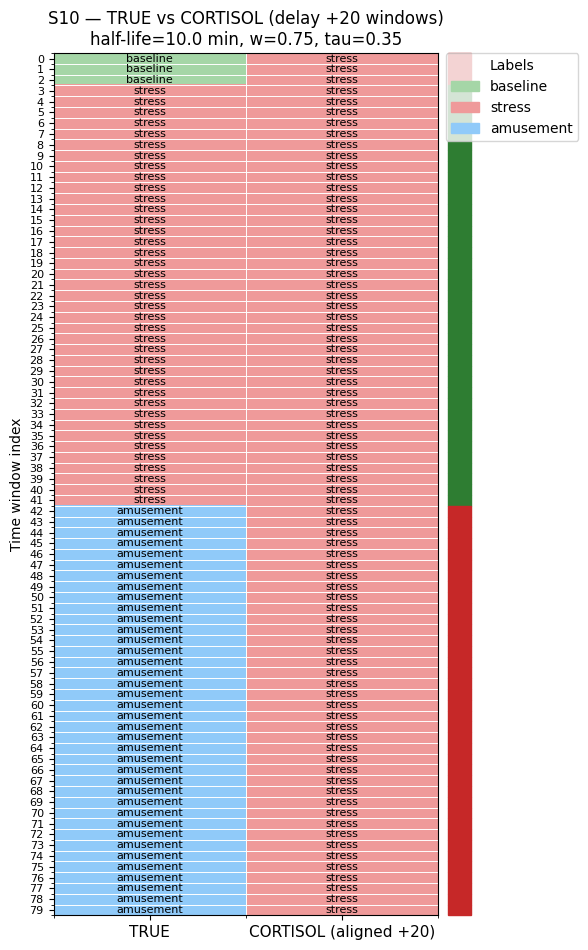

In [ ]:
# Map your TRUE label integers to names (edit these ids to match your data!)
TRUE_NAMES = {
    0: "baseline",
    1: "stress",
    2: "amusement",
    3: "mild",
    4: "other1",
    5: "other2",
}

# Cortisol bands we produce (0/1/2):
CORT_NAMES = {0: "baseline", 1: "mild", 2: "stress"}

# Thesis demo: cortisol lags by +20 min → align_delay_windows = +20 (positive)
fig, ax, m = plot_two_column_mapping(
    df_all_bilstm_wrist,
    subject_id="S10",
    minutes_per_step=1.0,
    mode="prob",                 # chest-style mapping
    half_life_min=10.0,
    w=0.75,
    tau_stress=0.35,
    tau_mild=None,               # set e.g. 0.20 to show a distinct "mild" band
    align_delay_windows=20,      # positive = cortisol later by 20 min
    max_windows=80,
    dataset_label_names=TRUE_NAMES,
    cortisol_id_to_label=CORT_NAMES,
    annotate=True,
    annotate_stride=1,
    show_match_bar=True,
)
print(m)


In [ ]:
# ================== LOSO with FIXED 20-MIN DELAY (Wrist) ==================
# Sign convention: delay_windows >= 0 means cortisol lags stress by +delay windows.
from __future__ import annotations
import math
from dataclasses import dataclass
from typing import Dict, Tuple, Iterable, List, Optional
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# ----------------------- core helpers -----------------------
def ema_prob(x: np.ndarray, half_life_steps: float) -> np.ndarray:
    """EMA over a 1D prob series with half-life in steps."""
    x = np.asarray(x, dtype=float)
    if x.size == 0:
        return x
    half_life_steps = max(1e-6, float(half_life_steps))
    alpha = 1.0 - math.pow(0.5, 1.0/half_life_steps)
    y = np.empty_like(x, dtype=float)
    y[0] = x[0]
    for i in range(1, len(x)):
        y[i] = (1 - alpha) * y[i-1] + alpha * x[i]
    return y

def align_fixed_delay(y: np.ndarray, s: np.ndarray, delay_windows: int) -> Tuple[np.ndarray, np.ndarray]:
    """Align TRUE y[t] with signal s[t+delay]; delay>=0 means cortisol is later in real time."""
    d = max(0, int(delay_windows))
    if d == 0:
        n = min(len(y), len(s))
        return y[:n], s[:n]
    n = min(len(y), len(s) - d)
    if n <= 0:
        return np.array([]), np.array([])
    return y[:n], s[d:d+n]

@dataclass
class MappingParamsFixedDelay:
    delay_windows: int           # fixed by physiology, e.g., 20
    half_life_min: float         # tuned on train subjects
    w_blend: float               # tuned on train subjects, 0..1
    tau: float                   # tuned threshold on blended probability
    # (display-only fields; not used in scoring)
    a: float = 12.0
    b: float = 8.0
    c_min: float = 5.0
    c_max: float = 20.0

# ----------------------- per-series metrics -----------------------
def compute_agreement_for_series(
    y_true: np.ndarray,
    p_raw: np.ndarray,
    params: MappingParamsFixedDelay,
    minutes_per_step: float = 1.0
) -> Dict[str, float]:
    """Binary stress/non-stress agreement with fixed delay on one series."""
    half_steps = float(params.half_life_min) / float(minutes_per_step)
    p_lag = ema_prob(p_raw, half_steps)
    p_blend = (1 - params.w_blend) * p_raw + params.w_blend * p_lag

    y_aligned, p_aligned = align_fixed_delay(y_true, p_blend, params.delay_windows)
    if y_aligned.size == 0:
        return {"exact_agree": np.nan, "stress_agree": np.nan, "p_raw_max": np.nan, "p_lag_max": np.nan}

    stress_true = (y_aligned == 1)
    stress_pred = (p_aligned >= params.tau)

    # exact_agree here is the same as stress/non-stress match (binary)
    exact_agree  = float(np.mean(((y_aligned == 1) == stress_pred)))
    stress_agree = float(np.mean(stress_true == stress_pred))

    return {
        "exact_agree": exact_agree,
        "stress_agree": stress_agree,
        "p_raw_max": float(p_raw.max()) if p_raw.size else 0.0,
        "p_lag_max": float(p_lag.max()) if p_lag.size else 0.0,
    }

# ----------------------- calibration on train subjects -----------------------
def grid_search_params_on_train(
    df: pd.DataFrame,
    train_subjects: Iterable[str],
    stress_class_id: int = 1,
    minutes_per_step: float = 1.0,
    delay_minutes: float = 20.0,
    half_life_grid: Iterable[float] = (5, 10, 15, 20, 30),
    w_grid: Iterable[float] = (0.0, 0.25, 0.5, 0.75, 1.0),
    tau_grid: Iterable[float] = tuple(np.linspace(0.35, 0.70, 8)),
    score_metric: str = "stress_agree",  # or "exact_agree"
) -> Tuple[MappingParamsFixedDelay, Dict[str, float]]:
    """Calibrate (half_life, w_blend, tau) on TRAIN subjects only (aggregate chosen metric)."""
    delay_windows = int(round(delay_minutes / minutes_per_step))
    best_params: Optional[MappingParamsFixedDelay] = None
    best_score = -1.0
    best_snapshot: Dict[str, float] = {}

    # gather train series
    train_series: List[Tuple[np.ndarray, np.ndarray]] = []
    for sid in train_subjects:
        g = (df[df["subject"].astype(str) == str(sid)]
             .sort_values("window_idx").reset_index(drop=True))
        if g.empty:
            continue
        y_true = g["true"].to_numpy()
        p_raw  = g.get(f"p{stress_class_id}")
        if p_raw is None:
            raise KeyError(f"Missing p{stress_class_id} column.")
        p_raw = p_raw.to_numpy()
        if len(y_true) < 3:
            continue
        train_series.append((y_true, p_raw))
    if not train_series:
        raise ValueError("No train series available for calibration.")

    for half in half_life_grid:
        half_steps = float(half) / float(minutes_per_step)
        ema_cache = [ema_prob(p_raw, half_steps) for (_, p_raw) in train_series]
        for w in w_grid:
            blends = [(1 - w) * p_raw + w * p_lag for ((_, p_raw), p_lag) in zip(train_series, ema_cache)]
            aligned = [align_fixed_delay(y_true, p_blend, delay_windows)
                       for ((y_true, _), p_blend) in zip(train_series, blends)]
            aligned = [(ya, pa) for (ya, pa) in aligned if ya.size > 0]
            if not aligned:
                continue

            y_flags = [(ya == 1) for (ya, _) in aligned]
            for tau in tau_grid:
                scores = []
                for (ya, pa), s_true in zip(aligned, y_flags):
                    s_pred = (pa >= tau)
                    if score_metric == "stress_agree":
                        s = float(np.mean(s_true == s_pred))
                    else:
                        s = float(np.mean((ya == 1) == s_pred))
                    scores.append(s)
                mean_score = float(np.mean(scores)) if scores else -np.inf
                if mean_score > best_score:
                    best_score = mean_score
                    best_params = MappingParamsFixedDelay(
                        delay_windows=delay_windows,
                        half_life_min=float(half),
                        w_blend=float(w),
                        tau=float(tau),
                    )
                    best_snapshot = {score_metric: mean_score}

    if best_params is None:
        raise RuntimeError("Grid search failed to find any valid parameters.")
    return best_params, best_snapshot

# ----------------------- LOSO loop -----------------------
def loso_subjects(df: pd.DataFrame) -> List[str]:
    return sorted(df["subject"].astype(str).unique().tolist())

def run_loso_fixed_delay(
    df: pd.DataFrame,
    stress_class_id: int = 1,
    minutes_per_step: float = 1.0,
    delay_minutes: float = 20.0,
    half_life_grid: Iterable[float] = (5, 10, 15, 20, 30),
    w_grid: Iterable[float] = (0.0, 0.25, 0.5, 0.75, 1.0),
    tau_grid: Iterable[float] = tuple(np.linspace(0.35, 0.70, 8)),
    score_metric: str = "stress_agree",
    do_sensitivity: bool = True,
    do_label_shuffle_null: bool = True,
    random_state: int = 42
) -> Tuple[pd.DataFrame, Dict[str, MappingParamsFixedDelay]]:
    rng = np.random.default_rng(random_state)
    subjects = loso_subjects(df)
    results = []
    best_params_per_fold: Dict[str, MappingParamsFixedDelay] = {}

    for test_sid in subjects:
        train_sids = [s for s in subjects if s != test_sid]

        # calibrate on TRAIN only
        best_params, snapshot = grid_search_params_on_train(
            df, train_sids,
            stress_class_id=stress_class_id,
            minutes_per_step=minutes_per_step,
            delay_minutes=delay_minutes,
            half_life_grid=half_life_grid,
            w_grid=w_grid,
            tau_grid=tau_grid,
            score_metric=score_metric,
        )
        best_params_per_fold[test_sid] = best_params

        # evaluate on TEST
        g_test = (df[df["subject"].astype(str) == str(test_sid)]
                  .sort_values("window_idx").reset_index(drop=True))
        y_true = g_test["true"].to_numpy()
        p_raw  = g_test[f"p{stress_class_id}"].to_numpy()
        met = compute_agreement_for_series(y_true, p_raw, best_params, minutes_per_step=minutes_per_step)

        row = {
            "test_subject": test_sid,
            "delay_windows": best_params.delay_windows,
            "half_life_min": best_params.half_life_min,
            "w_blend": best_params.w_blend,
            "tau": best_params.tau,
            "exact_agree": met["exact_agree"],
            "stress_agree": met["stress_agree"],
            "p_raw_max": met["p_raw_max"],
            "p_lag_max": met["p_lag_max"],
            "train_cv_score": snapshot.get(score_metric, np.nan),
        }

        # sensitivity jitter
        if do_sensitivity:
            jit = []
            for d_half in (-2, 0, +2):
                for d_w in (-0.1, 0, +0.1):
                    for d_tau in (-0.05, 0, +0.05):
                        hp = max(1.0, best_params.half_life_min + d_half)
                        ww = float(np.clip(best_params.w_blend + d_w, 0.0, 1.0))
                        tt = float(np.clip(best_params.tau + d_tau, 0.0, 1.0))
                        p2 = MappingParamsFixedDelay(best_params.delay_windows, hp, ww, tt)
                        met2 = compute_agreement_for_series(y_true, p_raw, p2, minutes_per_step)
                        if not (np.isnan(met2["stress_agree"]) or np.isnan(met2["exact_agree"])):
                            jit.append(met2[score_metric])
            if jit:
                row["sensitivity_mean"] = float(np.mean(jit))
                row["sensitivity_min"]  = float(np.min(jit))
                row["sensitivity_max"]  = float(np.max(jit))

        # label-shuffle null
        if do_label_shuffle_null:
            y_shuf = y_true.copy()
            rng.shuffle(y_shuf)
            met_null = compute_agreement_for_series(y_shuf, p_raw, best_params, minutes_per_step)
            row["null_"+score_metric] = met_null[score_metric]

        results.append(row)

    results_df = pd.DataFrame(results)
    agg = results_df[["exact_agree", "stress_agree"]].agg(["mean","std","median","min","max"])
    print("\n=== LOSO (fixed-delay, wrist) summary ===")
    print(agg)
    return results_df, best_params_per_fold

# ----------------------- summarize + plot (two-column heatmap) -----------------------
def summarize_subject(df_all, sid, params_or_dict, stress_class_id=1, minutes_per_step=1.0) -> pd.DataFrame:
    """One-row summary for a subject using its fold params (or a single params object)."""
    params = params_or_dict[sid] if isinstance(params_or_dict, dict) else params_or_dict
    g = (df_all[df_all["subject"].astype(str) == str(sid)]
         .sort_values("window_idx").reset_index(drop=True))
    if g.empty:
        raise ValueError(f"No rows for subject {sid}")

    y_true = g["true"].to_numpy()
    p_raw  = g[f"p{stress_class_id}"].to_numpy()

    half_steps = float(params.half_life_min) / float(minutes_per_step)
    p_lag = ema_prob(p_raw, half_steps)
    p_blend = (1 - params.w_blend) * p_raw + params.w_blend * p_lag

    y_aligned, p_aligned = align_fixed_delay(y_true, p_blend, params.delay_windows)
    if y_aligned.size == 0:
        raise RuntimeError("Aligned series is empty; check delay/windows.")

    s_true = (y_aligned == 1)
    s_pred = (p_aligned >= params.tau)

    # quick sensitivity
    sens = []
    for d_half in (-2, 0, +2):
        hl = max(1.0, params.half_life_min + d_half)
        p_lag_s = ema_prob(p_raw, hl/minutes_per_step)
        for d_w in (-0.1, 0, +0.1):
            w = float(np.clip(params.w_blend + d_w, 0.0, 1.0))
            p_blend_s = (1-w)*p_raw + w*p_lag_s
            for d_tau in (-0.05, 0, +0.05):
                tau = float(np.clip(params.tau + d_tau, 0.0, 1.0))
                y_a, p_a = align_fixed_delay(y_true, p_blend_s, params.delay_windows)
                if y_a.size == 0:
                    continue
                sens.append(np.mean((y_a==1) == (p_a >= tau)))
    sens_mean = float(np.mean(sens)) if sens else np.nan
    sens_min  = float(np.min(sens)) if sens else np.nan
    sens_max  = float(np.max(sens)) if sens else np.nan

    # null
    y_shuf = np.random.permutation(y_aligned)
    null_stress_agree = float(np.mean((y_shuf==1) == s_pred))

    return pd.DataFrame([{
        "test_subject": str(sid),
        "delay_windows": int(params.delay_windows),
        "half_life_min": float(params.half_life_min),
        "w_blend": float(params.w_blend),
        "tau": float(params.tau),
        "exact_agree": float(np.mean((y_aligned==1) == s_pred)),
        "stress_agree": float(np.mean(s_true == s_pred)),
        "p_raw_max": float(np.max(p_raw)) if p_raw.size else 0.0,
        "p_lag_max": float(np.max(p_lag)) if p_lag.size else 0.0,
        "cort_max": float(np.max(params.a*p_blend + params.b)),
        "sensitivity_mean": sens_mean,
        "sensitivity_min": sens_min,
        "sensitivity_max": sens_max,
        "null_stress_agree": null_stress_agree,
    }])

def plot_alignment_table_subject(
    df_all, sid, params_or_dict, stress_class_id=1, minutes_per_step=1.0,
    max_windows=80, DATASET_LABEL_NAMES=None
):
    """Two-column heatmap (TRUE vs CORTISOL aligned)."""
    params = params_or_dict[sid] if isinstance(params_or_dict, dict) else params_or_dict
    if DATASET_LABEL_NAMES is None:
        DATASET_LABEL_NAMES = {0:"baseline", 1:"stress", 2:"amusement", 3:"mild", 4:"other1", 5:"other2"}

    g = (df_all[df_all["subject"].astype(str) == str(sid)]
         .sort_values("window_idx").reset_index(drop=True))
    if g.empty:
        raise ValueError(f"No rows for subject {sid}")

    t      = g["window_idx"].to_numpy()
    y_true = g["true"].to_numpy()
    p_raw  = g[f"p{stress_class_id}"].to_numpy()

    # blended prob with calibrated half-life + w
    half_steps = float(params.half_life_min) / float(minutes_per_step)
    p_lag   = ema_prob(p_raw, half_steps)
    p_blend = (1 - params.w_blend) * p_raw + params.w_blend * p_lag
    cort_ids = (p_blend >= params.tau).astype(int)   # 0=baseline, 1=stress

    # align (positive = cortisol later)
    y_sel, cort_sel = align_fixed_delay(y_true, cort_ids, params.delay_windows)

    # time index slice to match aligned length
    t_sel = t[:len(y_sel)]
    if len(t_sel) > max_windows:
        t_sel, y_sel, cort_sel = t_sel[:max_windows], y_sel[:max_windows], cort_sel[:max_windows]

    true_names = np.array([DATASET_LABEL_NAMES.get(int(y), str(y)) for y in y_sel])
    cort_names = np.array(["stress" if c == 1 else "baseline" for c in cort_sel])

    names_order = ["baseline","stress","amusement","mild","other1","other2"]
    colors = ["#A5D6A7","#EF9A9A","#BBDEFB","#1E88E5","#B39DDB","#80CBC4"]
    name_to_idx = {n:i for i,n in enumerate(names_order)}
    cmap = ListedColormap(colors)

    N = len(t_sel)
    mat = np.zeros((N,2), dtype=int)
    mat[:,0] = np.array([name_to_idx.get(n,0) for n in true_names])
    mat[:,1] = np.array([name_to_idx.get(n,0) for n in cort_names])

    fig, ax = plt.subplots(figsize=(6, max(4, N*0.12)))
    ax.imshow(mat, aspect="auto", cmap=cmap, interpolation="nearest", origin="upper")
    ax.set_xticks([0,1]); ax.set_xticklabels(["TRUE", f"CORTISOL (aligned +{params.delay_windows})"], fontsize=11)
    ax.set_yticks(np.arange(N)); ax.set_yticklabels(t_sel, fontsize=8)
    ax.set_ylabel("Time window index")
    ax.set_title(
        f"{sid} — TRUE vs CORTISOL (delay +{params.delay_windows} windows)\n"
        f"half-life={params.half_life_min} min, w={params.w_blend:.2f}, tau={params.tau:.2f}"
    )
    ax.set_xticks(np.arange(-.5, 2, 1), minor=True)
    ax.set_yticks(np.arange(-.5, N, 1), minor=True)
    ax.grid(which="minor", color="white", linestyle="-", linewidth=0.7)
    for i in range(N):
        ax.text(0, i, true_names[i], va="center", ha="center", fontsize=8)
        ax.text(1, i, cort_names[i], va="center", ha="center", fontsize=8)

    handles = [Patch(color=colors[i], label=names_order[i]) for i in range(len(names_order))]
    ax.legend(handles=handles, bbox_to_anchor=(1.02,1), loc="upper left", borderaxespad=0., title="Labels")
    plt.tight_layout()
    plt.show()
    return fig, ax



=== LOSO (fixed-delay, wrist) summary ===
        exact_agree  stress_agree
mean       0.764340      0.764340
std        0.044609      0.044609
median     0.757764      0.757764
min        0.660494      0.660494
max        0.843137      0.843137
  test_subject  delay_windows  half_life_min  w_blend  tau  exact_agree  \
0          S10             20           20.0     0.75  0.7     0.660494   
1          S11             20           20.0     1.00  0.7     0.843137   
2          S13             20           30.0     0.75  0.7     0.754601   
3          S14             20           30.0     0.75  0.7     0.754601   
4          S15             20           30.0     0.75  0.7     0.746753   

   stress_agree  p_raw_max  p_lag_max  train_cv_score  sensitivity_mean  \
0      0.660494   0.760898   0.701192        0.777394          0.587563   
1      0.843137   0.915848   0.888118        0.765187          0.851126   
2      0.754601   0.630829   0.437149        0.773102          0.754601   
3 

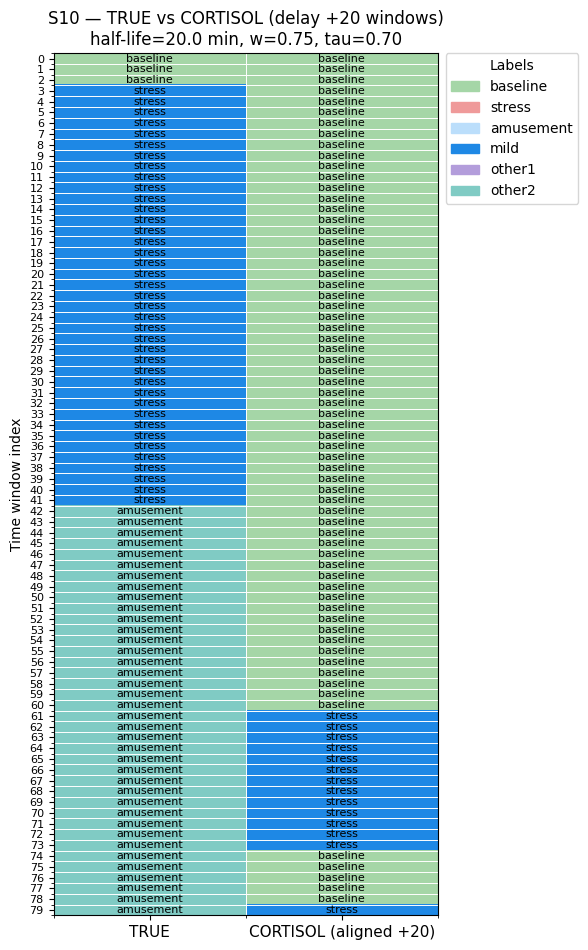

(<Figure size 600x960 with 1 Axes>,
 <Axes: title={'center': 'S10 — TRUE vs CORTISOL (delay +20 windows)\nhalf-life=20.0 min, w=0.75, tau=0.70'}, ylabel='Time window index'>)

In [ ]:
# Use your wrist dataframe here:
# Must contain columns: subject, window_idx, true, p{stress_class_id}
df_w = df_all_bilstm_wrist

# Run LOSO with fixed +20 min physiological lag
results_df_w, params_by_fold_w = run_loso_fixed_delay(
    df_w,
    stress_class_id=1,
    minutes_per_step=1.0,
    delay_minutes=20.0,         # fixed 20-min lag
    score_metric="stress_agree",
    do_sensitivity=True,
    do_label_shuffle_null=True,
)

print(results_df_w.head())

# Summarize and plot a subject (uses its fold's calibrated params)
sid = "S10"
df_sum = summarize_subject(df_w, sid, params_by_fold_w)
print(df_sum.to_string(index=False))
plot_alignment_table_subject(df_w, sid, params_by_fold_w)


In [ ]:
print(df_all_bilstm_wrist.columns.tolist()[:10])
print(df_all_bilstm_wrist.head())


['subject', 'window_idx', 'true', 'p1']
  subject  window_idx  true        p1
0     S10           0     0  0.688431
1     S10           1     0  0.663712
2     S10           2     0  0.644759
3     S10           3     1  0.631545
4     S10           4     1  0.629121


In [ ]:
# 1) values look like probs?
assert df_all_bilstm_wrist['p1'].between(0,1).all()

# 2) per-subject ordering is clean
chk = (df_all_bilstm_wrist
       .sort_values(['subject','window_idx'])
       .groupby('subject')['window_idx']
       .apply(lambda x: (x.values == np.arange(len(x))).all()))
print("window_idx sequential per subject?\n", chk)


window_idx sequential per subject?
 subject
S10    True
S11    True
S13    True
S14    True
S15    True
S16    True
S17    True
S2     True
S3     True
S4     True
S5     True
S6     True
S7     True
S8     True
S9     True
Name: window_idx, dtype: bool


In [ ]:
results_df_w, params_by_fold_w = run_loso_fixed_delay(
    df_all_bilstm_wrist,
    stress_class_id=1,
    minutes_per_step=1.0,
    delay_minutes=20.0,          # fixed +20 min lag, same as chest
    score_metric="stress_agree", # same metric you used for chest
    # keep your original grids or widen tau a bit if you like:
    # tau_grid=tuple(np.linspace(0.35, 0.70, 8)),
)




=== LOSO (fixed-delay, wrist) summary ===
        exact_agree  stress_agree
mean       0.764340      0.764340
std        0.044609      0.044609
median     0.757764      0.757764
min        0.660494      0.660494
max        0.843137      0.843137


test_subject  delay_windows  half_life_min  w_blend  tau  exact_agree  stress_agree  p_raw_max  p_lag_max  cort_max  sensitivity_mean  sensitivity_min  sensitivity_max  null_stress_agree
         S10             20           20.0     0.75  0.7     0.660494      0.660494   0.760898   0.701192  16.54284          0.587563         0.302469         0.759259           0.722222


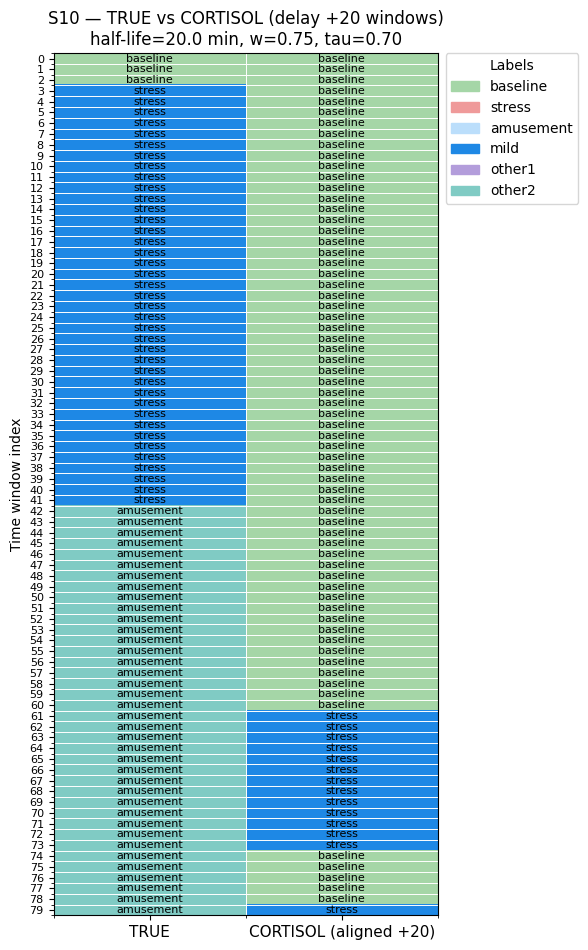

(<Figure size 600x960 with 1 Axes>,
 <Axes: title={'center': 'S10 — TRUE vs CORTISOL (delay +20 windows)\nhalf-life=20.0 min, w=0.75, tau=0.70'}, ylabel='Time window index'>)

In [ ]:
sid = "S10"
print(summarize_subject(df_all_bilstm_wrist, sid, params_by_fold_w).to_string(index=False))
plot_alignment_table_subject(df_all_bilstm_wrist, sid, params_by_fold_w)


Transformer model

In [ ]:
# === Time-Series Transformer (CHEST phases, ∆20 primary) ===
# - Predicts Anticipation / Peak (~20 min) / Recovery from 60×14 windows
# - LOSO with 2 rotating val subjects (if config absent), scaler fit on train only
# - Class-weighted CE, ReduceLROnPlateau, early stopping; best checkpoint per fold
# - Logs per-epoch loss + Macro-F1 (P13) and saves temporal attributions (P14)
# Outputs:
#   /content/wesad/eval/chestdelta20_phases_trf/fold_##/P13_*.png, P14_*.png, trf_phase_loso_summary.csv
#   /content/wesad/models/chestdelta20_phases_trf/fold_##/transformer.pt

import os, json, csv, random
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, accuracy_score, classification_report
from sklearn.utils.class_weight import compute_class_weight

# ---------------- Config ----------------
proj = Path("/content/wesad")
TRACK_KEY     = "chestdelta20"      # primary thesis track (20-min peak delay)
EVAL_ROOT     = proj/"eval"/f"{TRACK_KEY}_phases_trf"
MODEL_ROOT    = proj/"models"/f"{TRACK_KEY}_phases_trf"
EVAL_ROOT.mkdir(parents=True, exist_ok=True); MODEL_ROOT.mkdir(parents=True, exist_ok=True)

SEED          = 42
BATCH_SIZE    = 64
NUM_WORKERS   = 2
LR            = 8e-4
WEIGHT_DECAY  = 1e-4
PATIENCE      = 15
MAX_EPOCHS    = 90
D_MODEL       = 160    # hidden size (160–192 works well)
NHEAD         = 4
NLAYERS       = 3
D_FF          = 512
DROPOUT       = 0.35
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [ ]:
def set_seed(s=SEED):
    random.seed(s); np.random.seed(s)
    torch.manual_seed(s); torch.cuda.manual_seed_all(s)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
set_seed()

In [ ]:
# ---------------- Data helpers ----------------
class SeqDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.from_numpy(X).float()
        self.y = torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self, i): return self.X[i], self.y[i]

def load_npz_folder(win_dir: Path):
    files = sorted([p for p in win_dir.glob("S*.npz") if p.is_file()])
    assert files, f"No NPZ windows found in {win_dir}"
    return [p.stem for p in files]

def load_npz(win_dir: Path, sid: str):
    d = np.load(win_dir/f"{sid}.npz", allow_pickle=True)
    X = d["X"]; y = d["y"].astype(int)
    labels = d["labels"].tolist()
    feat_names = d["feat_names"].tolist() if "feat_names" in d else [f"f{i}" for i in range(X.shape[-1])]
    return X, y, labels, feat_names

def fit_scaler_on_train(Xtr):
    sc = StandardScaler(with_mean=True, with_std=True)
    N,T,F = Xtr.shape
    sc.fit(Xtr.reshape(-1, F))
    return sc

def apply_scaler(sc, X):
    N,T,F = X.shape
    return sc.transform(X.reshape(-1, F)).reshape(N,T,F)

def build_or_load_loso(track_key: str, win_dir: Path):
    cfg_path = proj/"configs"/f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg_path.exists():
        with open(cfg_path,"r") as fh: plan=json.load(fh)
        return plan.get("subjects", subs), plan.get("folds"), cfg_path
    # build with two rotating validation subjects
    folds=[]; n=len(subs)
    for i,test_sid in enumerate(subs):
        val=[subs[(i+1)%n], subs[(i+2)%n]]
        train=[s for s in subs if s not in [test_sid]+val]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path,"w") as fh: json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg_path

In [ ]:
# Robust APR relabeller: pass-through if labels already APR, else derive from 'Stress' by time-shift
def relabel_to_APR(y, labels, peak_delay_min=20, anticipation_min=10, peak_width_min=6, recovery_min=20, stride_sec=60):
    L = [str(l).strip().lower() for l in labels]
    n = len(y)
    def m2w(m): return int(round((m*60)/stride_sec))
    if set(L) == {"anticipation","peak","recovery"}:
        a,p,r = L.index("anticipation"), L.index("peak"), L.index("recovery")
        y_phase = np.full(n, -1, int); y_phase[y==a]=0; y_phase[y==p]=1; y_phase[y==r]=2
        return y_phase, (y_phase>=0)
    if "stress" in L:
        s_id = L.index("stress"); idx = np.where(y==s_id)[0]
        if idx.size==0: return np.full(n,-1,int), np.zeros(n,bool)
        s0 = int(idx[0])
        offA, offD, offP, offR = m2w(anticipation_min), m2w(peak_delay_min), max(1,m2w(peak_width_min)), m2w(recovery_min)
        y_phase = np.full(n, -1, int)
        a_lo,a_hi = max(0,s0-offA), max(0,s0-1)
        if a_hi>=a_lo: y_phase[a_lo:a_hi+1]=0
        p_ctr=s0+offD; p_lo,p_hi = max(0,p_ctr-offP//2), min(n-1,p_ctr+(offP-1)//2)
        y_phase[p_lo:p_hi+1]=1
        r_lo,r_hi = min(n-1,p_hi+1), min(n-1,p_hi+offR)
        if r_hi>=r_lo: y_phase[r_lo:r_hi]=2
        return y_phase, (y_phase>=0)
    uniq = np.unique(y)
    if len(labels)==3 and uniq.size==3:
        mapping={int(v):i for i,v in enumerate(sorted(int(t) for t in uniq))}
        y_phase=np.vectorize(mapping.get)(y); return y_phase, np.ones(n,bool)
    return np.full(n,-1,int), np.zeros(n,bool)


In [ ]:
# ---------------- Transformer model ----------------
class TimeSeriesTransformer(nn.Module):
    def __init__(self, input_size, num_classes,
                 d_model=160, nhead=4, num_layers=3, dim_feedforward=512, dropout=0.35,
                 use_cls=True, max_len=256):
        super().__init__()
        self.use_cls = use_cls
        self.proj = nn.Linear(input_size, d_model)
        self.pos_embed = nn.Parameter(torch.zeros(1, max_len + (1 if use_cls else 0), d_model))
        if use_cls:
            self.cls_token = nn.Parameter(torch.zeros(1,1,d_model))
        enc_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead,
                                               dim_feedforward=dim_feedforward,
                                               dropout=dropout, batch_first=True,
                                               activation="gelu", norm_first=True)
        self.encoder = nn.TransformerEncoder(enc_layer, num_layers=num_layers)
        self.dropout = nn.Dropout(dropout)
        self.head = nn.Sequential(
            nn.LayerNorm(d_model),
            nn.Linear(d_model, num_classes)
        )
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        if use_cls:
            nn.init.trunc_normal_(self.cls_token, std=0.02)

    def forward(self, x):          # x: [B,T,F]
        B,T,F = x.shape
        h = self.proj(x)           # [B,T,D]
        if self.use_cls:
            cls = self.cls_token.expand(B, -1, -1)   # [B,1,D]
            h = torch.cat([cls, h], dim=1)           # [B,1+T,D]
        h = h + self.pos_embed[:, :h.size(1), :]
        h = self.encoder(h)        # [B,1+T,D] or [B,T,D]
        if self.use_cls:
            z = h[:,0,:]           # [B,D]
        else:
            z = h.mean(dim=1)
        z = self.dropout(z)
        return self.head(z)


In [ ]:
# ---------------- Train/Eval utils ----------------
def run_epoch(model, loader, criterion, optimizer=None):
    train = optimizer is not None
    model.train() if train else model.eval()
    tot=0.0; ys=[]; ps=[]
    for xb, yb in loader:
        xb, yb = xb.to(device), yb.to(device)
        if train: optimizer.zero_grad(set_to_none=True)
        with torch.set_grad_enabled(train):
            logits = model(xb)
            loss = criterion(logits, yb)
            if train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 5.0)
                optimizer.step()
        tot += loss.item()*xb.size(0)
        ps.extend(torch.argmax(logits,1).detach().cpu().numpy()); ys.extend(yb.detach().cpu().numpy())
    return tot/len(loader.dataset), f1_score(ys, ps, average="macro"), accuracy_score(ys, ps)

def save_p13(history, p_loss, p_f1, title=""):
    ep, trL, trF, vaL, vaF = zip(*history)
    plt.figure(figsize=(7,5)); plt.plot(ep, trL, label="Train Loss"); plt.plot(ep, vaL, label="Val Loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title(f"{title} — P13 Loss"); plt.legend()
    plt.tight_layout(); plt.savefig(p_loss, dpi=200); plt.close()
    plt.figure(figsize=(7,5)); plt.plot(ep, trF, label="Train Macro-F1"); plt.plot(ep, vaF, label="Val Macro-F1")
    plt.xlabel("Epoch"); plt.ylabel("Macro-F1"); plt.title(f"{title} — P13 Macro-F1"); plt.legend()
    plt.tight_layout(); plt.savefig(p_f1, dpi=200); plt.close()

# cuDNN-safe attribution (IG if available; else Grad×Input)
try:
    from captum.attr import IntegratedGradients
    HAVE_CAPTUM=True
except Exception:
    HAVE_CAPTUM=False

def attribution_map(model, x1):  # x1: [1,T,F]
    was_tr = model.training
    x1 = x1.to(device); x1.requires_grad_(True)
    def _pred_idx():
        with torch.no_grad(): return int(torch.argmax(model(x1),1).item())
    def _attr(target_idx):
        if HAVE_CAPTUM:
            ig = IntegratedGradients(model)
            A = ig.attribute(x1, baselines=torch.zeros_like(x1), target=target_idx)
            return A.detach().cpu().numpy()[0]
        else:
            logits = model(x1); tgt = torch.tensor([target_idx], device=logits.device)
            loss = nn.CrossEntropyLoss()(logits, tgt)
            model.zero_grad(set_to_none=True); loss.backward()
            return (x1.grad * x1).detach().cpu().numpy()[0]
    try:
        with torch.backends.cudnn.flags(enabled=False):
            model.eval(); A = _attr(_pred_idx())
    except RuntimeError:
        model.train(); A = _attr(_pred_idx())
    finally:
        model.train(was_tr)
    return np.abs(A)

def _collect_preds(model, loader):
    gts, preds = [], []
    model.eval()
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            logits = model(xb)
            preds.extend(torch.argmax(logits,1).cpu().numpy()); gts.extend(yb.numpy())
    return np.asarray(gts), np.asarray(preds)


In [ ]:

# ---------------- Main training for one track ----------------
def train_transformer_for_track(track_key: str):
    feat_dir = proj/"features"/"windows"/track_key
    assert feat_dir.exists(), f"Windows not found: {feat_dir}"
    subjects = load_npz_folder(feat_dir)
    X0, y0, labels0, feat_names = load_npz(feat_dir, subjects[0])
    print(f"[TRF] subjects={len(subjects)}, example X={X0.shape}, labels={labels0}")

    subjects, folds, cfg_path = build_or_load_loso(track_key, feat_dir)
    print("[TRF] Using LOSO config:", cfg_path)

    results=[]; perclass=[]
    for k, fold in enumerate(folds, start=1):
        test_sid = fold["test_subject"]
        val_sids = fold.get("val_subjects", [])
        train_sids = fold["train_subjects"]
        print(f"\n[TRF] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

        # stack APR splits
        def stack_phase(sids):
            Xs, ys = [], []
            for s in sids:
                X, y, labels, _ = load_npz(feat_dir, s)
                yA, m = relabel_to_APR(y, labels, peak_delay_min=20)  # track is ∆20 by default
                if m.sum()==0: continue
                Xs.append(X[m]); ys.append(yA[m])
            return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

        Xtr, ytr = stack_phase(train_sids)
        Xva, yva = stack_phase(val_sids)
        XteF, yteF, labels_te, _ = load_npz(feat_dir, test_sid)
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=20)
        Xte, yte = (XteF[m_te], yteA[m_te]) if m_te.sum()>0 else (None, None)

        if Xtr is None or Xva is None or Xte is None:
            print(f"[TRF] Fold {k:02d} skipped (no APR windows after relabelling).")
            continue

        # scaler on train only
        sc = fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

        # loaders
        dl_tr = DataLoader(SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, shuffle=True,  num_workers=NUM_WORKERS, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

        # model
        T,F = Xtr.shape[1], Xtr.shape[2]
        NCLS = 3
        model = TimeSeriesTransformer(
            input_size=F, num_classes=NCLS,
            d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS, dim_feedforward=D_FF,
            dropout=DROPOUT, use_cls=True, max_len=256
        ).to(device)

        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device))
        optim = torch.optim.Adam(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
        sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, mode='max', factor=0.5, patience=3, min_lr=1e-5)

        # paths
        out_dir  = EVAL_ROOT/f"fold_{k:02d}"
        ckpt_dir = MODEL_ROOT/f"fold_{k:02d}"
        out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)
        log_csv  = out_dir/"trf_phase_training.csv"
        ckpt     = ckpt_dir/"transformer.pt"
        p13_loss = out_dir/"P13_trf_phase_loss.png"
        p13_f1   = out_dir/"P13_trf_phase_f1.png"
        p14_dir  = out_dir/"P14_trf_phase_heatmaps"; p14_dir.mkdir(parents=True, exist_ok=True)

        # train
        bestF=-1.0; noimp=0; hist=[]
        with open(log_csv,"w",newline="") as f:
            csv.writer(f).writerow(["epoch","train_loss","train_f1","val_loss","val_f1","lr"])
        for ep in range(1, MAX_EPOCHS+1):
            trL, trF, trA = run_epoch(model, dl_tr, criterion, optim)  # train metrics
            vaL, vaF, vaA = run_epoch(model, dl_va, criterion, None)  # val metrics
            sched.step(vaF)
            hist.append((ep,trL,trF,vaL,vaF))
            with open(log_csv,"a",newline="") as f:
                csv.writer(f).writerow([ep,f"{trL:.6f}",f"{trF:.6f}",f"{vaL:.6f}",f"{vaF:.6f}",optim.param_groups[0]["lr"]])
            if vaF > bestF + 1e-6:
                bestF = vaF; noimp=0; torch.save(model.state_dict(), ckpt)
            else:
                noimp += 1
                if noimp >= PATIENCE:
                    print(f"[TRF] early stop @ epoch {ep}, best val F1={bestF:.4f}")
                    break

        # test
        model.load_state_dict(torch.load(ckpt, map_location=device))
        teL, teF, teA = run_epoch(model, dl_te, criterion, None)
        print(f"[TRF] Fold {k:02d} RESULTS:")
        print(f"   Train Acc={trA:.4f} | Train F1={trF:.4f}")
        print(f"   Test Acc={teA:.4f}  | Test F1={teF:.4f}")

        # classification report for precision/recall
        gts, preds = _collect_preds(model, dl_te)
        rep = classification_report(gts, preds, target_names=["Anticipation","Peak","Recovery"], output_dict=True, zero_division=0)
        print(f"   Precision={rep['macro avg']['precision']:.4f} | Recall={rep['macro avg']['recall']:.4f} | F1-macro={rep['macro avg']['f1-score']:.4f}")

        # ROC AUC
        try:
            from sklearn.metrics import roc_auc_score
            y_prob = _collect_probs(model, dl_te)
            auc = roc_auc_score(gts, y_prob, multi_class="ovr")
            print(f"   ROC-AUC={auc:.4f}")
        except Exception as e:
            print("   ROC-AUC not available:", e)

        # P13
        save_p13(hist, p13_loss, p13_f1, title=f"{TRACK_KEY} fold {k:02d} (TRF)")

        # P14: attributions (a couple per class)
        for c in np.unique(yte):
            idxs = np.where(yte==c)[0][:2]
            for j in idxs:
                x1 = torch.from_numpy(Xte_s[j:j+1]).float()
                A = attribution_map(model, x1)
                pred = torch.argmax(model(x1.to(device)),1).item()
                plt.figure(figsize=(8,4.5))
                plt.imshow(A.T, aspect="auto", origin="lower")
                plt.colorbar(label="|Attribution|"); plt.xlabel("Time step"); plt.ylabel("Feature")
                plt.title(f"TRF — true={c} ({['A','P','R'][c]}), pred={pred}")
                plt.tight_layout(); plt.savefig(str(p14_dir / f"sample{j}_true{c}_pred{pred}.png"), dpi=220); plt.close()

        # store metrics + per-class
        results.append({"fold": k, "test_subject": test_sid, "acc": float(teA), "f1_macro": float(teF)})
        perclass.append({
            "fold": k, "test_subject": test_sid,
            "f1_A": rep["Anticipation"]["f1-score"],
            "f1_P": rep["Peak"]["f1-score"],
            "f1_R": rep["Recovery"]["f1-score"],
        })

    # summary
    df = pd.DataFrame(results).sort_values("fold")
    df_pc = pd.DataFrame(perclass).sort_values("fold")
    out_csv = EVAL_ROOT/"trf_phase_loso_summary.csv"
    out_pc  = EVAL_ROOT/"trf_phase_loso_perclass_f1.csv"
    df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)
    print("\n[TRF] saved:", out_csv, "\n[TRF] saved:", out_pc)
    if not df.empty:
        print(df.describe()[["acc","f1_macro"]])

# -------- Run on chestdelta20 --------
feat_dir = proj/"features"/"windows"/TRACK_KEY
assert feat_dir.exists(), f"{feat_dir} missing."
train_transformer_for_track(TRACK_KEY)


[TRF] subjects=15, example X=(76, 60, 14), labels=['Anticipation', 'Peak', 'Recovery']
[TRF] Using LOSO config: /content/wesad/configs/loso_chestdelta20.json

[TRF] Fold 01 | test=S10 | val=['S11', 'S13'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 20, best val F1=0.4759
[TRF] Fold 01 TEST: Acc=0.5395 | Macro-F1=0.3588

[TRF] Fold 02 | test=S11 | val=['S13', 'S14'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 18, best val F1=0.7361
[TRF] Fold 02 TEST: Acc=0.3909 | Macro-F1=0.2467

[TRF] Fold 03 | test=S13 | val=['S14', 'S15'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 17, best val F1=0.6239
[TRF] Fold 03 TEST: Acc=0.5333 | Macro-F1=0.4986

[TRF] Fold 04 | test=S14 | val=['S15', 'S16'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 33, best val F1=0.5820
[TRF] Fold 04 TEST: Acc=0.5273 | Macro-F1=0.4927

[TRF] Fold 05 | test=S15 | val=['S16', 'S17'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 16, best val F1=0.6103
[TRF] Fold 05 TEST: Acc=0.3099 | Macro-F1=0.2363

[TRF] Fold 06 | test=S16 | val=['S17', 'S2'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 19, best val F1=0.4265
[TRF] Fold 06 TEST: Acc=0.5818 | Macro-F1=0.4767

[TRF] Fold 07 | test=S17 | val=['S2', 'S3'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 17, best val F1=0.2679
[TRF] Fold 07 TEST: Acc=0.5190 | Macro-F1=0.4539

[TRF] Fold 08 | test=S2 | val=['S3', 'S4'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 16, best val F1=0.4285
[TRF] Fold 08 TEST: Acc=0.3182 | Macro-F1=0.2531

[TRF] Fold 09 | test=S3 | val=['S4', 'S5'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 25, best val F1=0.5849
[TRF] Fold 09 TEST: Acc=0.3727 | Macro-F1=0.2091

[TRF] Fold 10 | test=S4 | val=['S5', 'S6'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 29, best val F1=0.5371
[TRF] Fold 10 TEST: Acc=0.4839 | Macro-F1=0.4775

[TRF] Fold 11 | test=S5 | val=['S6', 'S7'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 20, best val F1=0.6201
[TRF] Fold 11 TEST: Acc=0.4828 | Macro-F1=0.3908

[TRF] Fold 12 | test=S6 | val=['S7', 'S8'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 19, best val F1=0.6424
[TRF] Fold 12 TEST: Acc=0.5545 | Macro-F1=0.5633

[TRF] Fold 13 | test=S7 | val=['S8', 'S9'] | train_n=12
[TRF] Fold 13 skipped (no APR windows after relabelling).

[TRF] Fold 14 | test=S8 | val=['S9', 'S10'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 25, best val F1=0.4105
[TRF] Fold 14 TEST: Acc=0.6806 | Macro-F1=0.4903

[TRF] Fold 15 | test=S9 | val=['S10', 'S11'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF] early stop @ epoch 18, best val F1=0.3876
[TRF] Fold 15 TEST: Acc=0.3545 | Macro-F1=0.2976

[TRF] saved: /content/wesad/eval/chestdelta20_phases_trf/trf_phase_loso_summary.csv 
[TRF] saved: /content/wesad/eval/chestdelta20_phases_trf/trf_phase_loso_perclass_f1.csv
             acc   f1_macro
count  14.000000  14.000000
mean    0.474917   0.388959
std     0.109636   0.119880
min     0.309859   0.209110
25%     0.377273   0.264254
50%     0.501429   0.422338
75%     0.537939   0.487130
max     0.680556   0.563328


In [ ]:
# === Transformer++ for CHEST delta20 (small-N tuned) ===
# Adds: Conv stem, explicit time-since-peak channel, label smoothing, dropout 0.4,
#       time masking + channel dropout (train only), OneCycleLR, early stop on val Macro-F1.
# Outputs:
#   eval/chest∆20_phases_trf_plus/fold_##/P13_*.png, P14_*.png, trf_plus_loso_summary.csv
#   models/chest∆20_phases_trf_plus/fold_##/transformer_plus.pt

import os, json, csv, random, math
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, accuracy_score, classification_report
from sklearn.utils.class_weight import compute_class_weight

# ---------------- Config ----------------
proj = Path("/content/wesad")
TRACK_KEY     = "chestdelta20"      # primary
WIN_DIR       = proj/"features"/"windows"/TRACK_KEY
EVAL_ROOT     = proj/"eval"/f"{TRACK_KEY}_phases_trf_plus"
MODEL_ROOT    = proj/"models"/f"{TRACK_KEY}_phases_trf_plus"
EVAL_ROOT.mkdir(parents=True, exist_ok=True); MODEL_ROOT.mkdir(parents=True, exist_ok=True)

SEED          = 42
BATCH_SIZE    = 64
NUM_WORKERS   = 2
LR_MAX        = 1.0e-3          # OneCycle max LR
WD            = 5e-4
PATIENCE      = 18
MAX_EPOCHS    = 110
D_MODEL       = 128             # a bit smaller for small-N
NHEAD         = 4
NLAYERS       = 2
D_FF          = 512
DROPOUT       = 0.40
LABEL_SMOOTH  = 0.05
TIME_NORM_DEN = 60.0            # normalize "minutes" into roughly [-1,1]; clip after
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
def set_seed(s=SEED):
    random.seed(s); np.random.seed(s)
    torch.manual_seed(s); torch.cuda.manual_seed_all(s)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
set_seed()

In [ ]:
# ---------------- Data helpers ----------------
class SeqDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.from_numpy(X).float()
        self.y = torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self, i): return self.X[i], self.y[i]

def load_npz_folder(win_dir: Path):
    files = sorted([p for p in win_dir.glob("S*.npz") if p.is_file()])
    assert files, f"No NPZ windows found in {win_dir}"
    return [p.stem for p in files]

def load_npz(win_dir: Path, sid: str):
    d = np.load(win_dir/f"{sid}.npz", allow_pickle=True)
    X = d["X"]; y = d["y"].astype(int)
    labels = d["labels"].tolist()
    feat_names = d["feat_names"].tolist() if "feat_names" in d else [f"f{i}" for i in range(X.shape[-1])]
    return X, y, labels, feat_names

def fit_scaler_on_train(Xtr):
    sc = StandardScaler(with_mean=True, with_std=True)
    N,T,F = Xtr.shape
    sc.fit(Xtr.reshape(-1, F))
    return sc

def apply_scaler(sc, X):
    N,T,F = X.shape
    return sc.transform(X.reshape(-1, F)).reshape(N,T,F)

def build_or_load_loso(track_key: str, win_dir: Path):
    cfg_path = proj/"configs"/f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg_path.exists():
        with open(cfg_path,"r") as fh: plan=json.load(fh)
        return plan.get("subjects", subs), plan.get("folds"), cfg_path
    # build with two rotating validation subjects
    folds=[]; n=len(subs)
    for i,test_sid in enumerate(subs):
        val=[subs[(i+1)%n], subs[(i+2)%n]]
        train=[s for s in subs if s not in [test_sid]+val]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path,"w") as fh: json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg_path

In [ ]:
# Robust APR relabeller: pass-through if labels already APR, else derive from 'Stress'
def relabel_to_APR(y, labels, peak_delay_min=20, anticipation_min=10, peak_width_min=6, recovery_min=20, stride_sec=60):
    L = [str(l).strip().lower() for l in labels]
    n = len(y)
    def m2w(m): return int(round((m*60)/stride_sec))
    if set(L) == {"anticipation","peak","recovery"}:
        a,p,r = L.index("anticipation"), L.index("peak"), L.index("recovery")
        y_phase = np.full(n, -1, int); y_phase[y==a]=0; y_phase[y==p]=1; y_phase[y==r]=2
        return y_phase, (y_phase>=0)
    if "stress" in L:
        s_id = L.index("stress"); idx = np.where(y==s_id)[0]
        if idx.size==0: return np.full(n,-1,int), np.zeros(n,bool)
        s0 = int(idx[0])
        offA, offD, offP, offR = m2w(anticipation_min), m2w(peak_delay_min), max(1,m2w(peak_width_min)), m2w(recovery_min)
        y_phase = np.full(n, -1, int)
        a_lo,a_hi = max(0,s0-offA), max(0,s0-1)
        if a_hi>=a_lo: y_phase[a_lo:a_hi+1]=0
        p_ctr=s0+offD; p_lo,p_hi = max(0,p_ctr-offP//2), min(n-1,p_ctr+(offP-1)//2)
        y_phase[p_lo:p_hi+1]=1
        r_lo,r_hi = min(n-1,p_hi+1), min(n-1,p_hi+offR)
        if r_hi>=r_lo: y_phase[r_lo:r_hi]=2
        return y_phase, (y_phase>=0)
    uniq = np.unique(y)
    if len(labels)==3 and uniq.size==3:
        mapping={int(v):i for i,v in enumerate(sorted(int(t) for t in uniq))}
        y_phase=np.vectorize(mapping.get)(y); return y_phase, np.ones(n,bool)
    return np.full(n,-1,int), np.zeros(n,bool)


In [ ]:
# ---------------- Augmentations (train only) ----------------
def aug_time_mask(xb, p=0.25, max_len=8):
    if p<=0: return xb
    B,T,F = xb.shape
    mask_prob = torch.rand(B, device=xb.device)
    for b in range(B):
        if mask_prob[b] < p:
            L = random.randint(2, max_len)
            s = random.randint(0, max(0, T-L))
            xb[b, s:s+L, :] = 0.0
    return xb

def aug_channel_dropout(xb, p=0.05):
    if p<=0: return xb
    B,T,F = xb.shape
    drop = torch.rand(B, F, device=xb.device) < p
    if drop.any():
        # expand to time dimension
        xb[drop.unsqueeze(1).expand(B,T,F)] = 0.0
    return xb

In [ ]:
# ---------------- Model: Conv stem + Transformer encoder ----------------
class ConvTimeDenoise(nn.Module):
    """Depthwise temporal conv + pointwise conv, keeps shape [B,T,F]."""
    def __init__(self, f_in):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv1d(f_in, f_in, kernel_size=5, padding=2, groups=f_in),
            nn.ReLU(),
            nn.Conv1d(f_in, f_in, kernel_size=1),
            nn.ReLU(),
        )
    def forward(self, x):  # x: [B,T,F]
        x = x.transpose(1,2)           # [B,F,T]
        x = self.net(x)
        return x.transpose(1,2)        # [B,T,F]

class TimeSeriesTransformerPlus(nn.Module):
    def __init__(self, input_size, num_classes,
                 d_model=128, nhead=4, num_layers=2, dim_feedforward=512, dropout=0.4,
                 use_cls=True, max_len=256):
        super().__init__()
        self.use_cls = use_cls
        self.stem = ConvTimeDenoise(input_size)
        self.proj = nn.Linear(input_size, d_model)
        self.pos_embed = nn.Parameter(torch.zeros(1, max_len + (1 if use_cls else 0), d_model))
        if use_cls:
            self.cls_token = nn.Parameter(torch.zeros(1,1,d_model))
        enc_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead,
                                               dim_feedforward=dim_feedforward,
                                               dropout=dropout, batch_first=True,
                                               activation="gelu", norm_first=True)
        self.encoder = nn.TransformerEncoder(enc_layer, num_layers=num_layers)
        self.dropout = nn.Dropout(dropout)
        # concat CLS + Mean for head
        self.norm = nn.LayerNorm(d_model*2 if use_cls else d_model)
        self.head = nn.Linear(d_model*2 if use_cls else d_model, num_classes)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        if use_cls: nn.init.trunc_normal_(self.cls_token, std=0.02)

    def forward(self, x):          # x: [B,T,F]
        h = self.stem(x)           # denoise/short patterns
        h = self.proj(h)           # [B,T,D]
        B,T,D = h.shape
        if self.use_cls:
            cls = self.cls_token.expand(B, -1, -1)   # [B,1,D]
            h = torch.cat([cls, h], dim=1)           # [B,1+T,D]
        h = h + self.pos_embed[:, :h.size(1), :]
        h = self.encoder(h)        # [B,1+T,D]
        if self.use_cls:
            z = torch.cat([h[:,0,:], h[:,1:,:].mean(dim=1)], dim=1)  # CLS + Mean
        else:
            z = h.mean(dim=1)
        z = self.norm(self.dropout(z))
        return self.head(z)

In [ ]:

# ---------------- Train/Eval utils ----------------
def run_epoch(model, loader, criterion, optimizer=None, scheduler=None, do_aug=False):
    train = optimizer is not None
    model.train() if train else model.eval()
    tot=0.0; ys=[]; ps=[]
    for xb, yb in loader:
        xb, yb = xb.to(device), yb.to(device)
        if train:
            if do_aug:
                xb = aug_time_mask(xb, p=0.25, max_len=8)
                xb = aug_channel_dropout(xb, p=0.05)
            optimizer.zero_grad(set_to_none=True)
        with torch.set_grad_enabled(train):
            logits = model(xb)
            loss = criterion(logits, yb)
            if train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 5.0)
                optimizer.step()
                if scheduler is not None:
                    scheduler.step()
        tot += loss.item()*xb.size(0)
        ps.extend(torch.argmax(logits,1).detach().cpu().numpy()); ys.extend(yb.detach().cpu().numpy())
    return tot/len(loader.dataset), f1_score(ys, ps, average="macro"), accuracy_score(ys, ps)

def save_p13(history, p_loss, p_f1, title=""):
    ep, trL, trF, vaL, vaF = zip(*history)
    plt.figure(figsize=(7,5)); plt.plot(ep, trL, label="Train Loss"); plt.plot(ep, vaL, label="Val Loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title(f"{title} — P13 Loss"); plt.legend()
    plt.tight_layout(); plt.savefig(p_loss, dpi=200); plt.close()
    plt.figure(figsize=(7,5)); plt.plot(ep, trF, label="Train Macro-F1"); plt.plot(ep, vaF, label="Val Macro-F1")
    plt.xlabel("Epoch"); plt.ylabel("Macro-F1"); plt.title(f"{title} — P13 Macro-F1"); plt.legend()
    plt.tight_layout(); plt.savefig(p_f1, dpi=200); plt.close()

In [ ]:
# Attribution (IG if available; else Grad×Input)
try:
    from captum.attr import IntegratedGradients
    HAVE_CAPTUM=True
except Exception:
    HAVE_CAPTUM=False

def attribution_map(model, x1):  # x1: [1,T,F]
    was_tr = model.training
    x1 = x1.to(device); x1.requires_grad_(True)
    def _pred_idx():
        with torch.no_grad(): return int(torch.argmax(model(x1),1).item())
    def _attr(target_idx):
        if HAVE_CAPTUM:
            ig = IntegratedGradients(model)
            A = ig.attribute(x1, baselines=torch.zeros_like(x1), target=target_idx)
            return A.detach().cpu().numpy()[0]
        else:
            logits = model(x1); tgt = torch.tensor([target_idx], device=logits.device)
            loss = nn.CrossEntropyLoss()(logits, tgt)
            model.zero_grad(set_to_none=True); loss.backward()
            return (x1.grad * x1).detach().cpu().numpy()[0]
    try:
        with torch.backends.cudnn.flags(enabled=False):
            model.eval(); A = _attr(_pred_idx())
    except RuntimeError:
        model.train(); A = _attr(_pred_idx())
    finally:
        model.train(was_tr)
    return np.abs(A)

def _collect_preds(model, loader):
    gts, preds = [], []
    model.eval()
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            logits = model(xb)
            preds.extend(torch.argmax(logits,1).cpu().numpy()); gts.extend(yb.numpy())
    return np.asarray(gts), np.asarray(preds)


In [ ]:
# ---------------- TSST-aware stacking: add time-since-peak channel ----------------
def stack_phase_with_time(win_dir, sids, peak_delay_min=20):
    Xs, ys = [], []
    for s in sids:
        X, y, labels, _ = load_npz(win_dir, s)
        # map to APR (pass-through if already APR)
        yA, m = relabel_to_APR(y, labels, peak_delay_min=peak_delay_min)
        if m.sum()==0:
            continue
        # compute per-window "time since peak" in window units; center at median(peak idx)
        idx_all = np.arange(len(yA))
        pk = np.where(yA==1)[0]
        if pk.size == 0:
            # fallback: center on middle of recording
            peak_center = len(yA)//2
        else:
            peak_center = int(np.median(pk))
        t_rel = idx_all - peak_center   # in windows (≈ minutes if stride=60s)
        t_rel = np.clip(t_rel / TIME_NORM_DEN, -1.0, 1.0)  # normalize & clip
        # select APR windows
        Xm, ym, tm = X[m], yA[m], t_rel[m]
        # append time channel as constant over T
        N,T,F = Xm.shape
        tchan = tm[:, None, None] * np.ones((N,T,1), dtype=Xm.dtype)
        Xaug = np.concatenate([Xm, tchan], axis=2)
        Xs.append(Xaug); ys.append(ym)
    return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

In [ ]:
# ---------------- Main training ----------------
def train_transformer_plus_for_track(track_key: str):
    feat_dir = proj/"features"/"windows"/track_key
    assert feat_dir.exists(), f"Windows not found: {feat_dir}"
    subjects = load_npz_folder(feat_dir)
    X0, y0, labels0, feat_names = load_npz(feat_dir, subjects[0])
    print(f"[TRF+] subjects={len(subjects)}, example X={X0.shape}, labels={labels0}")

    subjects, folds, cfg_path = build_or_load_loso(track_key, feat_dir)
    print("[TRF+] Using LOSO config:", cfg_path)

    results=[]; perclass=[]
    for k, fold in enumerate(folds, start=1):
        test_sid = fold["test_subject"]
        val_sids = fold.get("val_subjects", [])
        train_sids = fold["train_subjects"]
        print(f"\n[TRF+] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

        # stack APR + TSST time channel
        Xtr, ytr = stack_phase_with_time(feat_dir, train_sids, peak_delay_min=20)
        Xva, yva = stack_phase_with_time(feat_dir, val_sids,   peak_delay_min=20)

        # test: do same stacking (even though we won't augment)
        XteF, yteF, labels_te, _ = load_npz(feat_dir, test_sid)
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=20)
        if m_te.sum() == 0:
            print(f"[TRF+] Fold {k:02d} skipped (no APR windows)."); continue
        # build time channel for test subject
        idx_all = np.arange(len(yteA))
        pk = np.where(yteA==1)[0]; peak_center = int(np.median(pk)) if pk.size>0 else len(yteA)//2
        t_rel = np.clip((idx_all - peak_center)/TIME_NORM_DEN, -1.0, 1.0)
        Xte, yte = XteF[m_te], yteA[m_te]
        N,T,F = Xte.shape
        tchan = t_rel[m_te][:, None, None] * np.ones((N,T,1), dtype=Xte.dtype)
        Xte = np.concatenate([Xte, tchan], axis=2)

        if Xtr is None or Xva is None:
            print(f"[TRF+] Fold {k:02d} skipped (train/val empty after relabelling)."); continue

        # scaler on train only
        sc = fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

        # loaders
        dl_tr = DataLoader(SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, shuffle=True,  num_workers=NUM_WORKERS, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

        # model
        T,Fp = Xtr_s.shape[1], Xtr_s.shape[2]      # Fp = original F + 1 time channel
        NCLS = 3
        model = TimeSeriesTransformerPlus(
            input_size=Fp, num_classes=NCLS,
            d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS, dim_feedforward=D_FF,
            dropout=DROPOUT, use_cls=True, max_len=256
        ).to(device)

        # loss, opt, OneCycleLR
        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device),
                                        label_smoothing=LABEL_SMOOTH)
        optim = torch.optim.AdamW(model.parameters(), lr=LR_MAX, weight_decay=WD)
        steps_per_epoch = max(1, len(dl_tr))
        scheduler = torch.optim.lr_scheduler.OneCycleLR(
            optim, max_lr=LR_MAX, steps_per_epoch=steps_per_epoch, epochs=MAX_EPOCHS,
            pct_start=0.3, div_factor=10.0, final_div_factor=100.0
        )

        # paths
        out_dir  = EVAL_ROOT/f"fold_{k:02d}"
        ckpt_dir = MODEL_ROOT/f"fold_{k:02d}"
        out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)
        log_csv  = out_dir/"trf_plus_phase_training.csv"
        ckpt     = ckpt_dir/"transformer_plus.pt"
        p13_loss = out_dir/"P13_trf_plus_phase_loss.png"
        p13_f1   = out_dir/"P13_trf_plus_phase_f1.png"
        p14_dir  = out_dir/"P14_trf_plus_phase_heatmaps"; p14_dir.mkdir(parents=True, exist_ok=True)

        # train w/ early stop on val F1 (we still drive OneCycle per batch)
        bestF=-1.0; noimp=0; hist=[]
        with open(log_csv,"w",newline="}") as f:
            csv.writer(f).writerow(["epoch","train_loss","train_f1","val_loss","val_f1","lr"])
        for ep in range(1, MAX_EPOCHS+1):
            trL, trF, trA = run_epoch(model, dl_tr, criterion, optim, scheduler, do_aug=True)   # <-- get train acc
            vaL, vaF, vaA = run_epoch(model, dl_va, criterion, None, None, do_aug=False)        # <-- get val acc
            hist.append((ep,trL,trF,vaL,vaF))
            with open(log_csv,"a",newline="") as f:
                csv.writer(f).writerow([ep,f"{trL:.6f}",f"{trF:.6f}",f"{vaL:.6f}",f"{vaF:.6f}",optim.param_groups[0]["lr"]])
            if vaF > bestF + 1e-6:
                bestF = vaF; noimp=0; torch.save(model.state_dict(), ckpt)
            else:
                noimp += 1
                if noimp >= PATIENCE:
                    print(f"[TRF+] early stop @ epoch {ep}, best val F1={bestF:.4f}")
                    break

        # test
        model.load_state_dict(torch.load(ckpt, map_location=device))
        teL, teF, teA = run_epoch(model, dl_te, criterion, None, None, do_aug=False)

        # -------- added prints --------
        print(f"[TRF+] Fold {k:02d} RESULTS:")
        print(f"   Train Acc={trA:.4f} | Train F1={trF:.4f}")
        print(f"   Val   Acc={vaA:.4f} | Val   F1={vaF:.4f}")
        print(f"   Test  Acc={teA:.4f} | Test  F1={teF:.4f}")

        # precision/recall/f1 (macro) from classification_report
        gts, preds = _collect_preds(model, dl_te)
        rep = classification_report(
            gts, preds,
            target_names=["Anticipation","Peak","Recovery"],
            output_dict=True, zero_division=0
        )
        print(f"   Precision={rep['macro avg']['precision']:.4f} | Recall={rep['macro avg']['recall']:.4f} | F1-macro={rep['macro avg']['f1-score']:.4f}")

        # ROC-AUC (one-vs-rest)
        try:
            from sklearn.metrics import roc_auc_score
            y_prob = _collect_probs(model, dl_te)  # should return shape [N, NCLS] with class probabilities
            auc = roc_auc_score(gts, y_prob, multi_class='ovr')
            print(f"   ROC-AUC={auc:.4f}")
        except Exception as e:
            print("   ROC-AUC not available:", e)
        # --------------------------------

        # P13
        save_p13(hist, p13_loss, p13_f1, title=f"{TRACK_KEY} fold {k:02d} (TRF+)")

        # P14: attributions (a couple per class)
        for c in np.unique(yte):
            idxs = np.where(yte==c)[0][:2]
            for j in idxs:
                x1 = torch.from_numpy(Xte_s[j:j+1]).float()
                A = attribution_map(model, x1)
                pred = torch.argmax(model(x1.to(device)),1).item()
                plt.figure(figsize=(8,4.5))
                plt.imshow(A.T, aspect="auto", origin="lower")
                plt.colorbar(label="|Attribution|"); plt.xlabel("Time step"); plt.ylabel("Feature (incl. TSST time)")
                plt.title(f"TRF+ — true={c} ({['A','P','R'][c]}), pred={pred}")
                plt.tight_layout(); plt.savefig(str(p14_dir / f"sample{j}_true{c}_pred{pred}.png"), dpi=220); plt.close()

        # store metrics + per-class
        results.append({"fold": k, "test_subject": test_sid, "acc": float(teA), "f1_macro": float(teF)})
        perclass.append({
            "fold": k, "test_subject": test_sid,
            "f1_A": rep["Anticipation"]["f1-score"],
            "f1_P": rep["Peak"]["f1-score"],
            "f1_R": rep["Recovery"]["f1-score"],
        })

    # summary
    df = pd.DataFrame(results).sort_values("fold")
    df_pc = pd.DataFrame(perclass).sort_values("fold")
    out_csv = EVAL_ROOT/"trf_plus_phase_loso_summary.csv"
    out_pc  = EVAL_ROOT/"trf_plus_phase_loso_perclass_f1.csv"
    df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)
    print("\n[TRF+]  Saved:", out_csv, "\n[TRF+]  Saved:", out_pc)
    if not df.empty:
        print(df.describe()[["acc","f1_macro"]])

# -------- Run on chest∆20 --------
assert WIN_DIR.exists(), f"{WIN_DIR} missing."
train_transformer_plus_for_track(TRACK_KEY)



[TRF+] subjects=15, example X=(76, 60, 14), labels=['Anticipation', 'Peak', 'Recovery']
[TRF+] Using LOSO config: /content/wesad/configs/loso_chestdelta20.json

[TRF+] Fold 01 | test=S10 | val=['S11', 'S13'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 33, best val F1=0.9337
[TRF+] Fold 01 TEST: Acc=0.9474 | Macro-F1=0.9054

[TRF+] Fold 02 | test=S11 | val=['S13', 'S14'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 24, best val F1=0.8076
[TRF+] Fold 02 TEST: Acc=0.6091 | Macro-F1=0.5145

[TRF+] Fold 03 | test=S13 | val=['S14', 'S15'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 72, best val F1=0.9834
[TRF+] Fold 03 TEST: Acc=0.9067 | Macro-F1=0.9035

[TRF+] Fold 04 | test=S14 | val=['S15', 'S16'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 42, best val F1=0.9227
[TRF+] Fold 04 TEST: Acc=0.9636 | Macro-F1=0.9607

[TRF+] Fold 05 | test=S15 | val=['S16', 'S17'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 53, best val F1=0.9643
[TRF+] Fold 05 TEST: Acc=0.9296 | Macro-F1=0.8445

[TRF+] Fold 06 | test=S16 | val=['S17', 'S2'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 54, best val F1=0.9066
[TRF+] Fold 06 TEST: Acc=0.9727 | Macro-F1=0.9702

[TRF+] Fold 07 | test=S17 | val=['S2', 'S3'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 42, best val F1=0.7009
[TRF+] Fold 07 TEST: Acc=0.5823 | Macro-F1=0.4549

[TRF+] Fold 08 | test=S2 | val=['S3', 'S4'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 54, best val F1=0.9368
[TRF+] Fold 08 TEST: Acc=0.9273 | Macro-F1=0.9184

[TRF+] Fold 09 | test=S3 | val=['S4', 'S5'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 45, best val F1=0.9240
[TRF+] Fold 09 TEST: Acc=0.8818 | Macro-F1=0.8678

[TRF+] Fold 10 | test=S4 | val=['S5', 'S6'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 59, best val F1=0.9533
[TRF+] Fold 10 TEST: Acc=0.9247 | Macro-F1=0.9238

[TRF+] Fold 11 | test=S5 | val=['S6', 'S7'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 31, best val F1=1.0000
[TRF+] Fold 11 TEST: Acc=0.9080 | Macro-F1=0.9184

[TRF+] Fold 12 | test=S6 | val=['S7', 'S8'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 50, best val F1=0.9232
[TRF+] Fold 12 TEST: Acc=0.8909 | Macro-F1=0.8869

[TRF+] Fold 13 | test=S7 | val=['S8', 'S9'] | train_n=12
[TRF+] Fold 13 skipped (no APR windows).

[TRF+] Fold 14 | test=S8 | val=['S9', 'S10'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 95, best val F1=0.8731
[TRF+] Fold 14 TEST: Acc=0.8889 | Macro-F1=0.7019

[TRF+] Fold 15 | test=S9 | val=['S10', 'S11'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+] early stop @ epoch 52, best val F1=0.9556
[TRF+] Fold 15 TEST: Acc=0.9455 | Macro-F1=0.9407

[TRF+]  Saved: /content/wesad/eval/chestdelta20_phases_trf_plus/trf_plus_phase_loso_summary.csv 
[TRF+]  Saved: /content/wesad/eval/chestdelta20_phases_trf_plus/trf_plus_phase_loso_perclass_f1.csv
             acc   f1_macro
count  14.000000  14.000000
mean    0.877033   0.836551
std     0.122385   0.163000
min     0.582278   0.454942
25%     0.889394   0.850294
50%     0.916389   0.904436
75%     0.941485   0.922451
max     0.972727   0.970211


In [ ]:
# === Transformer+ (SAFE) for CHEST delta20 APR phases ===
# - NO label leakage: time channel does NOT use phase labels anywhere
#   • If original labels include 'Stress': center time at s0 + 20min (TSST-based, label-free wrt APR)
#   • Else: center time at recording midpoint (label-free fallback)
# - Inputs: 60×14 chest + 1 time channel  →  60×15
# - Protocol: LOSO (2 rotating val), scaler fit on train only, class weights, label smoothing,
#             OneCycleLR, light time/channel masking, early stop on val Macro-F1,
#             best ckpt per fold, P13 curves & P14 attributions.
# - Outputs:
#     eval/chest∆20_phases_trf_plus_safe/fold_##/P13_*.png, P14_*.png, trf_plus_safe_phase_loso_summary.csv
#     models/chest∆20_phases_trf_plus_safe/fold_##/transformer_plus_safe.pt

import os, json, csv, random, math
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, accuracy_score, classification_report
from sklearn.utils.class_weight import compute_class_weight

# ---------------- Config ----------------
proj = Path("/content/wesad")
TRACK_KEY     = "chestdelta20"      # primary delta20
WIN_DIR       = proj/"features"/"windows"/TRACK_KEY
EVAL_ROOT     = proj/"eval"/f"{TRACK_KEY}_phases_trf_plus_safe"
MODEL_ROOT    = proj/"models"/f"{TRACK_KEY}_phases_trf_plus_safe"
EVAL_ROOT.mkdir(parents=True, exist_ok=True); MODEL_ROOT.mkdir(parents=True, exist_ok=True)

SEED          = 42
BATCH_SIZE    = 64
NUM_WORKERS   = 2
LR_MAX        = 1.0e-3          # OneCycle max LR
WD            = 5e-4
PATIENCE      = 18
MAX_EPOCHS    = 110
D_MODEL       = 128             # small, stable for n=15
NHEAD         = 4
NLAYERS       = 2
D_FF          = 512
DROPOUT       = 0.40
LABEL_SMOOTH  = 0.05
TIME_NORM_DEN = 60.0            # normalize minutes ~[-1,1]
STRIDE_SEC    = 60              # your windows stride = 60s
PEAK_DELAY_MIN= 20              # delta20 primary
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:

def set_seed(s=SEED):
    random.seed(s); np.random.seed(s)
    torch.manual_seed(s); torch.cuda.manual_seed_all(s)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
set_seed()

In [ ]:
# ---------------- Data helpers ----------------
class SeqDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.from_numpy(X).float()
        self.y = torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self, i): return self.X[i], self.y[i]

def load_npz_folder(win_dir: Path):
    files = sorted([p for p in win_dir.glob("S*.npz") if p.is_file()])
    assert files, f"No NPZ windows found in {win_dir}"
    return [p.stem for p in files]

def load_npz(win_dir: Path, sid: str):
    d = np.load(win_dir/f"{sid}.npz", allow_pickle=True)
    X = d["X"]; y = d["y"].astype(int)
    labels = d["labels"].tolist()
    feat_names = d["feat_names"].tolist() if "feat_names" in d else [f"f{i}" for i in range(X.shape[-1])]
    return X, y, labels, feat_names

def fit_scaler_on_train(Xtr):
    sc = StandardScaler(with_mean=True, with_std=True)
    N,T,F = Xtr.shape
    sc.fit(Xtr.reshape(-1, F))
    return sc

def apply_scaler(sc, X):
    N,T,F = X.shape
    return sc.transform(X.reshape(-1, F)).reshape(N,T,F)

def build_or_load_loso(track_key: str, win_dir: Path):
    cfg_path = proj/"configs"/f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg_path.exists():
        with open(cfg_path,"r") as fh: plan=json.load(fh)
        return plan.get("subjects", subs), plan.get("folds"), cfg_path
    folds=[]; n=len(subs)
    for i,test_sid in enumerate(subs):
        val=[subs[(i+1)%n], subs[(i+2)%n]]
        train=[s for s in subs if s not in [test_sid]+val]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path,"w") as fh: json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg_path

In [ ]:
# ---------------- APR relabeller ----------------
def relabel_to_APR(y, labels, peak_delay_min=20, anticipation_min=10, peak_width_min=6, recovery_min=20, stride_sec=STRIDE_SEC):
    L = [str(l).strip().lower() for l in labels]
    n = len(y)
    def m2w(m): return int(round((m*60)/stride_sec))
    # pass-through if already APR
    if set(L) == {"anticipation","peak","recovery"}:
        a,p,r = L.index("anticipation"), L.index("peak"), L.index("recovery")
        y_phase = np.full(n, -1, int); y_phase[y==a]=0; y_phase[y==p]=1; y_phase[y==r]=2
        return y_phase, (y_phase>=0)
    # derive from 'Stress'
    if "stress" in L:
        s_id = L.index("stress"); idx = np.where(y==s_id)[0]
        if idx.size==0: return np.full(n,-1,int), np.zeros(n,bool)
        s0 = int(idx[0])
        offA, offD, offP, offR = m2w(anticipation_min), m2w(peak_delay_min), max(1,m2w(peak_width_min)), m2w(recovery_min)
        y_phase = np.full(n, -1, int)
        # A
        a_lo,a_hi = max(0,s0-offA), max(0,s0-1)
        if a_hi>=a_lo: y_phase[a_lo:a_hi+1]=0
        # P
        p_ctr=s0+offD; p_lo,p_hi = max(0,p_ctr-offP//2), min(n-1,p_ctr+(offP-1)//2)
        y_phase[p_lo:p_hi+1]=1
        # R
        r_lo,r_hi = min(n-1,p_hi+1), min(n-1,p_hi+offR)
        if r_hi>=r_lo: y_phase[r_lo:r_hi]=2
        return y_phase, (y_phase>=0)
    # fallback: ordinal remap if exactly 3 classes
    uniq = np.unique(y)
    if len(labels)==3 and uniq.size==3:
        mapping={int(v):i for i,v in enumerate(sorted(int(t) for t in uniq))}
        y_phase=np.vectorize(mapping.get)(y); return y_phase, np.ones(n,bool)
    return np.full(n,-1,int), np.zeros(n,bool)


In [ ]:
# ---------------- SAFE time channel (NO phase labels) ----------------
def _time_channel_from_index(n, stride_sec=STRIDE_SEC, center_mode="mid", s0=None, peak_delay_min=PEAK_DELAY_MIN):
    idx = np.arange(n, dtype=float)
    if center_mode == "tsst" and s0 is not None:
        c = s0 + int(round((peak_delay_min * 60) / stride_sec))  # center at expected peak time
    else:
        c = (n - 1) / 2.0
    t_rel = (idx - c) / TIME_NORM_DEN
    return np.clip(t_rel, -1.0, 1.0)

def stack_phase_with_time_SAFE(win_dir, sids, peak_delay_min=PEAK_DELAY_MIN):
    Xs, ys = [], []
    for s in sids:
        X, y, labels, _ = load_npz(win_dir, s)
        L = [str(l).lower().strip() for l in labels]
        n = len(y)
        # Prefer TSST onset if available (label-free wrt phases); else midpoint
        if "stress" in L:
            s_id = L.index("stress")
            idx_stress = np.where(y == s_id)[0]
            s0 = int(idx_stress[0]) if idx_stress.size > 0 else None
            center_mode = "tsst" if s0 is not None else "mid"
        else:
            s0 = None
            center_mode = "mid"
        t_rel_all = _time_channel_from_index(n, center_mode=center_mode, s0=s0, peak_delay_min=peak_delay_min)
        # Supervision: derive APR targets (OK to use labels here)
        yA, m = relabel_to_APR(y, labels, peak_delay_min=peak_delay_min)
        if m.sum()==0:
            continue
        Xm, ym = X[m], yA[m]
        N,T,F = Xm.shape
        tchan = t_rel_all[m][:, None, None] * np.ones((N, T, 1), dtype=Xm.dtype)
        Xaug = np.concatenate([Xm, tchan], axis=2)
        Xs.append(Xaug); ys.append(ym)
    return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

In [ ]:
# ---------------- Augmentations (train only) ----------------
def aug_time_mask(xb, p=0.25, max_len=8):
    if p<=0: return xb
    B,T,F = xb.shape
    mask_prob = torch.rand(B, device=xb.device)
    for b in range(B):
        if mask_prob[b] < p:
            L = random.randint(2, max_len)
            s = random.randint(0, max(0, T-L))
            xb[b, s:s+L, :] = 0.0
    return xb

def aug_channel_dropout(xb, p=0.05):
    if p<=0: return xb
    B,T,F = xb.shape
    drop = torch.rand(B, F, device=xb.device) < p
    if drop.any():
        xb[drop.unsqueeze(1).expand(B,T,F)] = 0.0
    return xb


In [ ]:
# ---------------- Model: Conv stem + Transformer encoder ----------------
class ConvTimeDenoise(nn.Module):
    """Depthwise temporal conv + pointwise conv, keeps shape [B,T,F]."""
    def __init__(self, f_in):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv1d(f_in, f_in, kernel_size=5, padding=2, groups=f_in),
            nn.ReLU(),
            nn.Conv1d(f_in, f_in, kernel_size=1),
            nn.ReLU(),
        )
    def forward(self, x):  # x: [B,T,F]
        x = x.transpose(1,2)           # [B,F,T]
        x = self.net(x)
        return x.transpose(1,2)        # [B,T,F]

class TimeSeriesTransformerPlus(nn.Module):
    def __init__(self, input_size, num_classes,
                 d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS, dim_feedforward=D_FF, dropout=DROPOUT,
                 use_cls=True, max_len=256):
        super().__init__()
        self.use_cls = use_cls
        self.stem = ConvTimeDenoise(input_size)
        self.proj = nn.Linear(input_size, d_model)
        self.pos_embed = nn.Parameter(torch.zeros(1, max_len + (1 if use_cls else 0), d_model))
        if use_cls:
            self.cls_token = nn.Parameter(torch.zeros(1,1,d_model))
        enc_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead,
                                               dim_feedforward=dim_feedforward,
                                               dropout=dropout, batch_first=True,
                                               activation="gelu", norm_first=True)
        self.encoder = nn.TransformerEncoder(enc_layer, num_layers=num_layers)
        self.dropout = nn.Dropout(dropout)
        # concat CLS + Mean for head
        self.norm = nn.LayerNorm(d_model*2 if use_cls else d_model)
        self.head = nn.Linear(d_model*2 if use_cls else d_model, num_classes)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        if use_cls: nn.init.trunc_normal_(self.cls_token, std=0.02)

    def forward(self, x):          # x: [B,T,F]
        h = self.stem(x)           # denoise/short patterns
        h = self.proj(h)           # [B,T,D]
        B,T,D = h.shape
        if self.use_cls:
            cls = self.cls_token.expand(B, -1, -1)   # [B,1,D]
            h = torch.cat([cls, h], dim=1)           # [B,1+T,D]
        h = h + self.pos_embed[:, :h.size(1), :]
        h = self.encoder(h)        # [B,1+T,D]
        if self.use_cls:
            z = torch.cat([h[:,0,:], h[:,1:,:].mean(dim=1)], dim=1)  # CLS + Mean
        else:
            z = h.mean(dim=1)
        z = self.norm(self.dropout(z))
        return self.head(z)


In [ ]:
# ---------------- Train/Eval utils ----------------
def run_epoch(model, loader, criterion, optimizer=None, scheduler=None, do_aug=False):
    train = optimizer is not None
    model.train() if train else model.eval()
    tot=0.0; ys=[]; ps=[]
    for xb, yb in loader:
        xb, yb = xb.to(device), yb.to(device)
        if train:
            if do_aug:
                xb = aug_time_mask(xb, p=0.25, max_len=8)
                xb = aug_channel_dropout(xb, p=0.05)
            optimizer.zero_grad(set_to_none=True)
        with torch.set_grad_enabled(train):
            logits = model(xb)
            loss = criterion(logits, yb)
            if train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 5.0)
                optimizer.step()
                if scheduler is not None:
                    scheduler.step()
        tot += loss.item()*xb.size(0)
        ps.extend(torch.argmax(logits,1).detach().cpu().numpy()); ys.extend(yb.detach().cpu().numpy())
    return tot/len(loader.dataset), f1_score(ys, ps, average="macro"), accuracy_score(ys, ps)

def save_p13(history, p_loss, p_f1, title=""):
    ep, trL, trF, vaL, vaF = zip(*history)
    plt.figure(figsize=(7,5)); plt.plot(ep, trL, label="Train Loss"); plt.plot(ep, vaL, label="Val Loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title(f"{title} — P13 Loss"); plt.legend()
    plt.tight_layout(); plt.savefig(p_loss, dpi=200); plt.close()
    plt.figure(figsize=(7,5)); plt.plot(ep, trF, label="Train Macro-F1"); plt.plot(ep, vaF, label="Val Macro-F1")
    plt.xlabel("Epoch"); plt.ylabel("Macro-F1"); plt.title(f"{title} — P13 Macro-F1"); plt.legend()
    plt.tight_layout(); plt.savefig(p_f1, dpi=200); plt.close()


In [ ]:

# Attribution (IG if available; else Grad×Input)
try:
    from captum.attr import IntegratedGradients
    HAVE_CAPTUM=True
except Exception:
    HAVE_CAPTUM=False

def attribution_map(model, x1):  # x1: [1,T,F]
    was_tr = model.training
    x1 = x1.to(device); x1.requires_grad_(True)
    def _pred_idx():
        with torch.no_grad(): return int(torch.argmax(model(x1),1).item())
    def _attr(target_idx):
        if HAVE_CAPTUM:
            ig = IntegratedGradients(model)
            A = ig.attribute(x1, baselines=torch.zeros_like(x1), target=target_idx)
            return A.detach().cpu().numpy()[0]
        else:
            logits = model(x1); tgt = torch.tensor([target_idx], device=logits.device)
            loss = nn.CrossEntropyLoss()(logits, tgt)
            model.zero_grad(set_to_none=True); loss.backward()
            return (x1.grad * x1).detach().cpu().numpy()[0]
    try:
        with torch.backends.cudnn.flags(enabled=False):
            model.eval(); A = _attr(_pred_idx())
    except RuntimeError:
        model.train(); A = _attr(_pred_idx())
    finally:
        model.train(was_tr)
    return np.abs(A)

def _collect_preds(model, loader):
    gts, preds = [], []
    model.eval()
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            logits = model(xb)
            preds.extend(torch.argmax(logits,1).cpu().numpy()); gts.extend(yb.numpy())
    return np.asarray(gts), np.asarray(preds)

In [ ]:


# ---------------- Main training (SAFE) ----------------
def train_transformer_plus_SAFE_for_track(track_key: str):
    feat_dir = proj/"features"/"windows"/track_key
    assert feat_dir.exists(), f"Windows not found: {feat_dir}"
    subjects = load_npz_folder(feat_dir)
    X0, y0, labels0, feat_names = load_npz(feat_dir, subjects[0])
    print(f"[TRF+ SAFE] subjects={len(subjects)}, example X={X0.shape}, labels={labels0}")

    subjects, folds, cfg_path = build_or_load_loso(track_key, feat_dir)
    print("[TRF+ SAFE] Using LOSO config:", cfg_path)

    results=[]; perclass=[]
    for k, fold in enumerate(folds, start=1):
        test_sid = fold["test_subject"]
        val_sids = fold.get("val_subjects", [])
        train_sids = fold["train_subjects"]
        print(f"\n[TRF+ SAFE] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

        # stack APR + SAFE time channel
        Xtr, ytr = stack_phase_with_time_SAFE(feat_dir, train_sids, peak_delay_min=PEAK_DELAY_MIN)
        Xva, yva = stack_phase_with_time_SAFE(feat_dir, val_sids,   peak_delay_min=PEAK_DELAY_MIN)

        # test: build SAFE time channel without APR info
        XteF, yteF, labels_te, _ = load_npz(feat_dir, test_sid)
        Lte = [str(l).lower().strip() for l in labels_te]
        n_te = len(yteF)
        if "stress" in Lte:
            s_id = Lte.index("stress")
            idx_stress = np.where(yteF == s_id)[0]
            s0 = int(idx_stress[0]) if idx_stress.size > 0 else None
            center_mode = "tsst" if s0 is not None else "mid"
        else:
            s0 = None
            center_mode = "mid"
        t_rel_all = _time_channel_from_index(n_te, center_mode=center_mode, s0=s0, peak_delay_min=PEAK_DELAY_MIN)

        # Now derive APR targets & mask for evaluation
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
        if Xtr is None or Xva is None or m_te.sum()==0:
            print(f"[TRF+ SAFE] Fold {k:02d} skipped (empty after relabelling)."); continue

        Xte, yte = XteF[m_te], yteA[m_te]
        N,T,F = Xte.shape
        tchan = t_rel_all[m_te][:, None, None] * np.ones((N, T, 1), dtype=Xte.dtype)
        Xte = np.concatenate([Xte, tchan], axis=2)

        # scaler on train only
        sc = fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

        # loaders
        dl_tr = DataLoader(SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, shuffle=True,  num_workers=NUM_WORKERS, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

        # model
        T,Fp = Xtr_s.shape[1], Xtr_s.shape[2]      # Fp = original F + 1 time channel
        NCLS = 3
        model = TimeSeriesTransformerPlus(
            input_size=Fp, num_classes=NCLS,
            d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS, dim_feedforward=D_FF,
            dropout=DROPOUT, use_cls=True, max_len=256
        ).to(device)

        # loss, opt, OneCycleLR
        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device),
                                        label_smoothing=LABEL_SMOOTH)
        optim = torch.optim.AdamW(model.parameters(), lr=LR_MAX, weight_decay=WD)
        steps_per_epoch = max(1, len(dl_tr))
        scheduler = torch.optim.lr_scheduler.OneCycleLR(
            optim, max_lr=LR_MAX, steps_per_epoch=steps_per_epoch, epochs=MAX_EPOCHS,
            pct_start=0.3, div_factor=10.0, final_div_factor=100.0
        )

        # paths
        out_dir  = EVAL_ROOT/f"fold_{k:02d}"
        ckpt_dir = MODEL_ROOT/f"fold_{k:02d}"
        out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)
        log_csv  = out_dir/"trf_plus_safe_phase_training.csv"
        ckpt     = ckpt_dir/"transformer_plus_safe.pt"
        p13_loss = out_dir/"P13_trf_plus_safe_phase_loss.png"
        p13_f1   = out_dir/"P13_trf_plus_safe_phase_f1.png"
        p14_dir  = out_dir/"P14_trf_plus_safe_phase_heatmaps"; p14_dir.mkdir(parents=True, exist_ok=True)

        # train w/ early stop on val F1
        bestF=-1.0; noimp=0; hist=[]
        with open(log_csv,"w",newline="") as f:
            csv.writer(f).writerow(["epoch","train_loss","train_f1","val_loss","val_f1","lr"])
        for ep in range(1, MAX_EPOCHS+1):
            trL, trF, trA = run_epoch(model, dl_tr, criterion, optim, scheduler, do_aug=True)     # get train acc
            vaL, vaF, vaA = run_epoch(model, dl_va, criterion, None, None, do_aug=False)          # get val acc
            hist.append((ep,trL,trF,vaL,vaF))
            with open(log_csv,"a",newline="") as f:
                csv.writer(f).writerow([ep,f"{trL:.6f}",f"{trF:.6f}",f"{vaL:.6f}",f"{vaF:.6f}",optim.param_groups[0]["lr"]])
            if vaF > bestF + 1e-6:
                bestF = vaF; noimp=0; torch.save(model.state_dict(), ckpt)
            else:
                noimp += 1
                if noimp >= PATIENCE:
                    print(f"[TRF+ SAFE] early stop @ epoch {ep}, best val F1={bestF:.4f}")
                    break

        # test
        model.load_state_dict(torch.load(ckpt, map_location=device))
        teL, teF, teA = run_epoch(model, dl_te, criterion, None, None, do_aug=False)

        # -------- added prints --------
        print(f"[TRF+ SAFE] Fold {k:02d} RESULTS:")
        print(f"   Train Acc={trA:.4f} | Train F1={trF:.4f}")
        print(f"   Val   Acc={vaA:.4f} | Val   F1={vaF:.4f}")
        print(f"   Test  Acc={teA:.4f} | Test  F1={teF:.4f}")

        # precision / recall / macro-F1 from classification_report (test)
        gts, preds = _collect_preds(model, dl_te)
        rep = classification_report(
            gts, preds,
            target_names=["Anticipation","Peak","Recovery"],
            output_dict=True, zero_division=0
        )
        print(f"   Precision={rep['macro avg']['precision']:.4f} | Recall={rep['macro avg']['recall']:.4f} | F1-macro={rep['macro avg']['f1-score']:.4f}")

        # ROC-AUC (test, one-vs-rest). requires predicted probabilities per class.
        try:
            from sklearn.metrics import roc_auc_score
            y_prob = _collect_probs(model, dl_te)  # expected shape [N, NCLS]
            auc = roc_auc_score(gts, y_prob, multi_class='ovr')
            print(f"   ROC-AUC={auc:.4f}")
        except Exception as e:
            print("   ROC-AUC not available:", e)
        # --------------------------------

        # P13
        save_p13(hist, p13_loss, p13_f1, title=f"{TRACK_KEY} fold {k:02d} (TRF+ SAFE)")

        # P14: attributions (a couple per class)
        for c in np.unique(yte):
            idxs = np.where(yte==c)[0][:2]
            for j in idxs:
                x1 = torch.from_numpy(Xte_s[j:j+1]).float()
                A = attribution_map(model, x1)
                pred = torch.argmax(model(x1.to(device)),1).item()
                plt.figure(figsize=(8,4.5))
                plt.imshow(A.T, aspect="auto", origin="lower")
                plt.colorbar(label="|Attribution|"); plt.xlabel("Time step"); plt.ylabel("Feature (incl. TSST-time)")
                plt.title(f"TRF+ SAFE — true={c} ({['A','P','R'][c]}), pred={pred}")
                plt.tight_layout(); plt.savefig(str(p14_dir / f"sample{j}_true{c}_pred{pred}.png"), dpi=220); plt.close()

        # store metrics + per-class
        results.append({"fold": k, "test_subject": test_sid, "acc": float(teA), "f1_macro": float(teF)})
        perclass.append({
            "fold": k, "test_subject": test_sid,
            "f1_A": rep["Anticipation"]["f1-score"],
            "f1_P": rep["Peak"]["f1-score"],
            "f1_R": rep["Recovery"]["f1-score"],
        })

    # summary
    df = pd.DataFrame(results).sort_values("fold")
    df_pc = pd.DataFrame(perclass).sort_values("fold")
    out_csv = EVAL_ROOT/"trf_plus_safe_phase_loso_summary.csv"
    out_pc  = EVAL_ROOT/"trf_plus_safe_phase_loso_perclass_f1.csv"
    df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)
    print("\n[TRF+ SAFE]  Saved:", out_csv, "\n[TRF+ SAFE]  Saved:", out_pc)
    if not df.empty:
        print(df.describe()[["acc","f1_macro"]])

# -------- Run on chestdelta20 --------
assert WIN_DIR.exists(), f"{WIN_DIR} missing."
train_transformer_plus_SAFE_for_track(TRACK_KEY)



[TRF+ SAFE] subjects=15, example X=(76, 60, 14), labels=['Anticipation', 'Peak', 'Recovery']
[TRF+ SAFE] Using LOSO config: /content/wesad/configs/loso_chestdelta20.json

[TRF+ SAFE] Fold 01 | test=S10 | val=['S11', 'S13'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 35, best val F1=0.7211
[TRF+ SAFE] Fold 01 TEST: Acc=0.1711 | Macro-F1=0.1922

[TRF+ SAFE] Fold 02 | test=S11 | val=['S13', 'S14'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 22, best val F1=0.7885
[TRF+ SAFE] Fold 02 TEST: Acc=0.7091 | Macro-F1=0.6602

[TRF+ SAFE] Fold 03 | test=S13 | val=['S14', 'S15'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 21, best val F1=0.8511
[TRF+ SAFE] Fold 03 TEST: Acc=0.8533 | Macro-F1=0.7906

[TRF+ SAFE] Fold 04 | test=S14 | val=['S15', 'S16'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 31, best val F1=0.5946
[TRF+ SAFE] Fold 04 TEST: Acc=0.8545 | Macro-F1=0.8502

[TRF+ SAFE] Fold 05 | test=S15 | val=['S16', 'S17'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 50, best val F1=0.6316
[TRF+ SAFE] Fold 05 TEST: Acc=0.5211 | Macro-F1=0.4317

[TRF+ SAFE] Fold 06 | test=S16 | val=['S17', 'S2'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 40, best val F1=0.8596
[TRF+ SAFE] Fold 06 TEST: Acc=0.8455 | Macro-F1=0.8179

[TRF+ SAFE] Fold 07 | test=S17 | val=['S2', 'S3'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 34, best val F1=0.8382
[TRF+ SAFE] Fold 07 TEST: Acc=0.7089 | Macro-F1=0.6373

[TRF+ SAFE] Fold 08 | test=S2 | val=['S3', 'S4'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 28, best val F1=0.8259
[TRF+ SAFE] Fold 08 TEST: Acc=0.9273 | Macro-F1=0.9178

[TRF+ SAFE] Fold 09 | test=S3 | val=['S4', 'S5'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 51, best val F1=0.6236
[TRF+ SAFE] Fold 09 TEST: Acc=0.4000 | Macro-F1=0.3715

[TRF+ SAFE] Fold 10 | test=S4 | val=['S5', 'S6'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 30, best val F1=0.9089
[TRF+ SAFE] Fold 10 TEST: Acc=0.9247 | Macro-F1=0.9208

[TRF+ SAFE] Fold 11 | test=S5 | val=['S6', 'S7'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 41, best val F1=0.7663
[TRF+ SAFE] Fold 11 TEST: Acc=0.7701 | Macro-F1=0.7330

[TRF+ SAFE] Fold 12 | test=S6 | val=['S7', 'S8'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 56, best val F1=0.7629
[TRF+ SAFE] Fold 12 TEST: Acc=0.7182 | Macro-F1=0.7166

[TRF+ SAFE] Fold 13 | test=S7 | val=['S8', 'S9'] | train_n=12
[TRF+ SAFE] Fold 13 skipped (empty after relabelling).

[TRF+ SAFE] Fold 14 | test=S8 | val=['S9', 'S10'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 46, best val F1=0.8859
[TRF+ SAFE] Fold 14 TEST: Acc=0.8472 | Macro-F1=0.7919

[TRF+ SAFE] Fold 15 | test=S9 | val=['S10', 'S11'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE] early stop @ epoch 39, best val F1=0.8086
[TRF+ SAFE] Fold 15 TEST: Acc=0.8364 | Macro-F1=0.8197

[TRF+ SAFE]  Saved: /content/wesad/eval/chestdelta20_phases_trf_plus_safe/trf_plus_safe_phase_loso_summary.csv 
[TRF+ SAFE]  Saved: /content/wesad/eval/chestdelta20_phases_trf_plus_safe/trf_plus_safe_phase_loso_perclass_f1.csv
             acc   f1_macro
count  14.000000  14.000000
mean    0.720525   0.689380
std     0.217020   0.216037
min     0.171053   0.192156
25%     0.708918   0.643019
50%     0.803239   0.761819
75%     0.851806   0.819254
max     0.927273   0.920798


# start from

In [ ]:
# === Transformer+ (SAFE, improved) for CHEST ∆20 APR phases ===
# Outputs:
#   eval/chestdelta20_phases_trf_plus_safe_impr/fold_##/P13_*.png, P14_*.png
#   eval/chestdelta20_phases_trf_plus_safe_impr/trf_plus_safe_impr_loso_summary.csv
#   eval/chestdelta20_phases_trf_plus_safe_impr/trf_plus_safe_impr_loso_perclass_f1.csv
#   models/chestdelta20_phases_trf_plus_safe_impr/fold_##/transformer_plus_safe_impr.pt

import os, json, csv, random, math
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, accuracy_score, classification_report
from sklearn.utils.class_weight import compute_class_weight
from torch.optim.swa_utils import AveragedModel, SWALR, update_bn


In [ ]:
# ---------------- Config ----------------
proj = Path("/content/wesad")
TRACK_KEY     = "chestdelta20"
WIN_DIR       = proj/"features"/"windows"/TRACK_KEY
EVAL_ROOT     = proj/"eval"/f"{TRACK_KEY}_phases_trf_plus_safe_impr"
MODEL_ROOT    = proj/"models"/f"{TRACK_KEY}_phases_trf_plus_safe_impr"
EVAL_ROOT.mkdir(parents=True, exist_ok=True); MODEL_ROOT.mkdir(parents=True, exist_ok=True)

SEED          = 42
BATCH_SIZE    = 64
NUM_WORKERS   = 2

# Optim/Train
LR_MAX        = 1.0e-3          # OneCycle peak LR
WD            = 5e-4
PATIENCE      = 18
MAX_EPOCHS    = 110
LABEL_SMOOTH  = 0.05

# Model
D_MODEL       = 160             # ↑ capacity (128 -> 160)
NHEAD         = 4
NLAYERS       = 3               # ↑ depth (2 -> 3)
D_FF          = 512
DROPOUT       = 0.40

# Time/channel
TIME_NORM_DEN = 60.0            # normalize minutes ~[-1,1]
STRIDE_SEC    = 60
PEAK_DELAY_MIN= 20              # ∆20
TIME_CENTER_JITTER_MIN = 5      # ±5 min jitter at TRAIN time

# Augmentations
AUG_TIME_MASK_P    = 0.15       # gentler than before
AUG_CH_DROP_P      = 0.03

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def set_seed(s=SEED):
    random.seed(s); np.random.seed(s)
    torch.manual_seed(s); torch.cuda.manual_seed_all(s)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
set_seed()


In [ ]:
# ---------------- Data helpers ----------------
class SeqDataset(Dataset):
    def __init__(self, X, y): self.X=torch.from_numpy(X).float(); self.y=torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self,i): return self.X[i], self.y[i]

def load_npz_folder(win_dir: Path):
    files = sorted([p for p in win_dir.glob("S*.npz") if p.is_file()])
    assert files, f"No NPZ windows found in {win_dir}"
    return [p.stem for p in files]

def load_npz(win_dir: Path, sid: str):
    d=np.load(win_dir/f"{sid}.npz", allow_pickle=True)
    X=d["X"]; y=d["y"].astype(int); labels=d["labels"].tolist()
    feat_names=d["feat_names"].tolist() if "feat_names" in d else [f"f{i}" for i in range(X.shape[-1])]
    return X,y,labels,feat_names

def fit_scaler_on_train(Xtr):
    sc=StandardScaler(with_mean=True, with_std=True)
    N,T,F=Xtr.shape; sc.fit(Xtr.reshape(-1,F)); return sc

def apply_scaler(sc,X):
    N,T,F=X.shape; return sc.transform(X.reshape(-1,F)).reshape(N,T,F)

def build_or_load_loso(track_key: str, win_dir: Path):
    cfg_path = proj/"configs"/f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg_path.exists():
        with open(cfg_path,"r") as fh: plan=json.load(fh)
        return plan.get("subjects", subs), plan.get("folds"), cfg_path
    # build with two rotating val subjects
    folds=[]; n=len(subs)
    for i,test_sid in enumerate(subs):
        val=[subs[(i+1)%n], subs[(i+2)%n]]
        train=[s for s in subs if s not in [test_sid]+val]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path,"w") as fh: json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg_path

In [ ]:
# ---------------- APR relabeller ----------------
def relabel_to_APR(y, labels, peak_delay_min=20, anticipation_min=10, peak_width_min=6, recovery_min=20, stride_sec=STRIDE_SEC):
    L=[str(l).strip().lower() for l in labels]; n=len(y)
    def m2w(m): return int(round((m*60)/stride_sec))
    # pass-through if already APR
    if set(L)=={"anticipation","peak","recovery"}:
        a,p,r=L.index("anticipation"),L.index("peak"),L.index("recovery")
        y_phase=np.full(n,-1,int); y_phase[y==a]=0; y_phase[y==p]=1; y_phase[y==r]=2
        return y_phase,(y_phase>=0)
    # derive from 'Stress'
    if "stress" in L:
        s_id=L.index("stress"); idx=np.where(y==s_id)[0]
        if idx.size==0: return np.full(n,-1,int), np.zeros(n,bool)
        s0=int(idx[0])
        offA,offD,offP,offR=m2w(anticipation_min),m2w(peak_delay_min),max(1,m2w(peak_width_min)),m2w(recovery_min)
        y_phase=np.full(n,-1,int)
        a_lo,a_hi=max(0,s0-offA),max(0,s0-1)
        if a_hi>=a_lo: y_phase[a_lo:a_hi+1]=0
        p_ctr=s0+offD; p_lo,p_hi=max(0,p_ctr-offP//2),min(n-1,p_ctr+(offP-1)//2)
        y_phase[p_lo:p_hi+1]=1
        r_lo,r_hi=min(n-1,p_hi+1),min(n-1,p_hi+offR)
        if r_hi>=r_lo: y_phase[r_lo:r_hi]=2
        return y_phase,(y_phase>=0)
    # fallback (exactly 3 classes)
    uniq=np.unique(y)
    if len(labels)==3 and uniq.size==3:
        mapping={int(v):i for i,v in enumerate(sorted(int(t) for t in uniq))}
        y_phase=np.vectorize(mapping.get)(y); return y_phase,np.ones(n,bool)
    return np.full(n,-1,int), np.zeros(n,bool)

In [ ]:
# ---------------- SAFE time channel (no APR use), with TRAIN jitter ----------------
def make_time_channel(n, center_mode="mid", s0=None, peak_delay_min=PEAK_DELAY_MIN, jitter_min=0):
    idx = np.arange(n, dtype=float)
    # jitter expressed in windows
    jitter_w = 0
    if jitter_min>0:
        jitter_w = int(round((random.randint(-jitter_min, jitter_min) * 60) / STRIDE_SEC))
    if center_mode=="tsst" and s0 is not None:
        c = s0 + int(round((peak_delay_min*60)/STRIDE_SEC)) + jitter_w
    else:
        c = (n - 1) / 2.0 + jitter_w
    t_rel = (idx - c) / TIME_NORM_DEN
    return np.clip(t_rel, -1.0, 1.0)

def stack_phase_with_time_SAFE(win_dir, sids, mode="train", peak_delay_min=PEAK_DELAY_MIN):
    Xs, ys = [], []
    for s in sids:
        X,y,labels,_ = load_npz(win_dir, s)
        L=[str(l).lower().strip() for l in labels]
        n=len(y)
        if "stress" in L:
            s_id=L.index("stress"); idx=np.where(y==s_id)[0]
            s0=int(idx[0]) if idx.size>0 else None
            center_mode="tsst" if s0 is not None else "mid"
        else:
            s0=None; center_mode="mid"
        jitter = TIME_CENTER_JITTER_MIN if mode=="train" else 0
        t_rel_all = make_time_channel(n, center_mode=center_mode, s0=s0,
                                      peak_delay_min=peak_delay_min, jitter_min=jitter)
        # Supervision (APR)
        yA, m = relabel_to_APR(y, labels, peak_delay_min=peak_delay_min)
        if m.sum()==0:
            continue
        Xm, ym = X[m], yA[m]
        N,T,F = Xm.shape
        tchan = t_rel_all[m][:, None, None] * np.ones((N,T,1), dtype=Xm.dtype)
        Xaug = np.concatenate([Xm, tchan], axis=2)
        Xs.append(Xaug); ys.append(ym)
    return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)


In [ ]:
# ---------------- Augmentations ----------------
def aug_time_mask(xb, p=AUG_TIME_MASK_P, max_len=8):
    if p<=0: return xb
    B,T,F=xb.shape
    mask_prob=torch.rand(B, device=xb.device)
    for b in range(B):
        if mask_prob[b] < p:
            L=random.randint(2,max_len); s=random.randint(0,max(0,T-L))
            xb[b, s:s+L, :] = 0.0
    return xb

def aug_channel_dropout(xb, p=AUG_CH_DROP_P):
    if p<=0: return xb
    B,T,F=xb.shape
    drop=(torch.rand(B,F,device=xb.device) < p)
    if drop.any(): xb[drop.unsqueeze(1).expand(B,T,F)] = 0.0
    return xb


In [ ]:
# ---------------- Model: Conv stem + Transformer encoder ----------------
class ConvTimeDenoise(nn.Module):
    def __init__(self, f_in):
        super().__init__()
        self.net=nn.Sequential(
            nn.Conv1d(f_in,f_in,kernel_size=5,padding=2,groups=f_in),
            nn.ReLU(),
            nn.Conv1d(f_in,f_in,kernel_size=1),
            nn.ReLU(),
        )
    def forward(self,x):  # [B,T,F]
        x=x.transpose(1,2)  # [B,F,T]
        x=self.net(x)
        return x.transpose(1,2)

class TimeSeriesTransformerPlus(nn.Module):
    def __init__(self, input_size, num_classes,
                 d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS, dim_feedforward=D_FF, dropout=DROPOUT,
                 use_cls=True, max_len=256):
        super().__init__()
        self.use_cls=use_cls
        self.stem=ConvTimeDenoise(input_size)
        self.proj=nn.Linear(input_size,d_model)
        self.pos_embed=nn.Parameter(torch.zeros(1, max_len + (1 if use_cls else 0), d_model))
        if use_cls: self.cls_token=nn.Parameter(torch.zeros(1,1,d_model))
        enc_layer=nn.TransformerEncoderLayer(d_model=d_model,nhead=nhead,
                                             dim_feedforward=dim_feedforward,dropout=dropout,
                                             batch_first=True,activation="gelu",norm_first=True)
        self.encoder=nn.TransformerEncoder(enc_layer,num_layers=num_layers)
        self.dropout=nn.Dropout(dropout)
        self.norm=nn.LayerNorm(d_model*2 if use_cls else d_model)
        self.head=nn.Linear(d_model*2 if use_cls else d_model, num_classes)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        if use_cls: nn.init.trunc_normal_(self.cls_token, std=0.02)

    def forward(self,x):  # [B,T,F]
        h=self.stem(x)           # [B,T,F]
        h=self.proj(h)           # [B,T,D]
        B,T,D=h.shape
        if self.use_cls:
            cls=self.cls_token.expand(B,-1,-1)  # [B,1,D]
            h=torch.cat([cls,h],dim=1)          # [B,1+T,D]
        h = h + self.pos_embed[:, :h.size(1), :]
        h=self.encoder(h)
        if self.use_cls:
            z=torch.cat([h[:,0,:], h[:,1:,:].mean(dim=1)], dim=1)
        else:
            z=h.mean(dim=1)
        z=self.norm(self.dropout(z))
        return self.head(z)


In [ ]:
# ---------------- Train/Eval utils ----------------
def run_epoch(model, loader, criterion, optimizer=None, scheduler=None, do_aug=False):
    train = optimizer is not None
    model.train() if train else model.eval()
    tot=0.0; ys=[]; ps=[]
    for xb,yb in loader:
        xb,yb=xb.to(device), yb.to(device)
        if train:
            if do_aug:
                xb=aug_time_mask(xb); xb=aug_channel_dropout(xb)
            optimizer.zero_grad(set_to_none=True)
        with torch.set_grad_enabled(train):
            logits=model(xb)
            loss=criterion(logits,yb)
            if train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(),5.0)
                optimizer.step()
                if scheduler is not None: scheduler.step()
        tot += loss.item()*xb.size(0)
        ps.extend(torch.argmax(logits,1).detach().cpu().numpy()); ys.extend(yb.detach().cpu().numpy())
    return tot/len(loader.dataset), f1_score(ys,ps,average="macro"), accuracy_score(ys,ps)

def save_p13(history, p_loss, p_f1, title=""):
    ep,trL,trF,vaL,vaF=zip(*history)
    plt.figure(figsize=(7,5)); plt.plot(ep,trL,label="Train Loss"); plt.plot(ep,vaL,label="Val Loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title(f"{title} — P13 Loss"); plt.legend()
    plt.tight_layout(); plt.savefig(p_loss,dpi=200); plt.close()
    plt.figure(figsize=(7,5)); plt.plot(ep,trF,label="Train Macro-F1"); plt.plot(ep,vaF,label="Val Macro-F1")
    plt.xlabel("Epoch"); plt.ylabel("Macro-F1"); plt.title(f"{title} — P13 Macro-F1"); plt.legend()
    plt.tight_layout(); plt.savefig(p_f1,dpi=200); plt.close()

# attributions (IG if available; else Grad×Input)
try:
    from captum.attr import IntegratedGradients
    HAVE_CAPTUM=True
except Exception:
    HAVE_CAPTUM=False

def attribution_map(model, x1):  # x1: [1,T,F]
    was_tr=model.training
    x1=x1.to(device); x1.requires_grad_(True)
    def _pred_idx():
        with torch.no_grad(): return int(torch.argmax(model(x1),1).item())
    def _attr(target_idx):
        if HAVE_CAPTUM:
            ig=IntegratedGradients(model)
            A=ig.attribute(x1, baselines=torch.zeros_like(x1), target=target_idx)
            return A.detach().cpu().numpy()[0]
        else:
            logits=model(x1); tgt=torch.tensor([target_idx],device=logits.device)
            loss=nn.CrossEntropyLoss()(logits,tgt)
            model.zero_grad(set_to_none=True); loss.backward()
            return (x1.grad * x1).detach().cpu().numpy()[0]
    try:
        with torch.backends.cudnn.flags(enabled=False):
            model.eval(); A=_attr(_pred_idx())
    except RuntimeError:
        model.train(); A=_attr(_pred_idx())
    finally:
        model.train(was_tr)
    return np.abs(A)

def collect_logits_and_labels(model, loader):
    gts=[]; preds=[]; logits_all=[]
    model.eval()
    with torch.no_grad():
        for xb,yb in loader:
            xb=xb.to(device)
            lg=model(xb)
            logits_all.append(lg.cpu().numpy())
            preds.extend(torch.argmax(lg,1).cpu().numpy()); gts.extend(yb.numpy())
    return np.asarray(gts), np.asarray(preds), np.concatenate(logits_all, axis=0)

def smooth_preds_mode(preds, win=3):
    preds = preds.copy()
    if len(preds) < win: return preds
    half = win // 2
    from collections import Counter
    sm=[]
    for i in range(len(preds)):
        lo,hi=max(0,i-half),min(len(preds),i+half+1)
        window=preds[lo:hi]
        sm.append(Counter(window).most_common(1)[0][0])
    return np.array(sm)


In [ ]:
def run_epoch(model, loader, criterion, optim=None, scheduler=None, do_aug=False):
    model.train() if optim else model.eval()
    total_loss, total_preds, total_gts = 0.0, [], []

    for xb, yb in loader:
        xb, yb = xb.to(device), yb.to(device)

        # apply augmentation only if training and requested
        if do_aug and optim:
            xb = augment_batch(xb)  # <-- use your own augmentation helper

        logits = model(xb)
        loss = criterion(logits, yb)

        if optim:
            optim.zero_grad()
            loss.backward()
            optim.step()
            if scheduler: scheduler.step()

        total_loss += loss.item() * xb.size(0)
        preds = torch.argmax(logits, dim=1)
        total_preds.extend(preds.cpu().numpy())
        total_gts.extend(yb.cpu().numpy())

    acc = accuracy_score(total_gts, total_preds)
    f1  = f1_score(total_gts, total_preds, average="macro")
    return total_loss/len(loader.dataset), f1, acc


In [ ]:
def augment_batch(xb):
    # Example augmentation: add small Gaussian noise
    noise = torch.randn_like(xb) * 0.01
    return xb + noise


In [ ]:
# ---------------- Main training (SAFE + improvements)
def train_transformer_plus_SAFE_improved_for_track(track_key: str):
    feat_dir=proj/"features"/"windows"/track_key
    assert feat_dir.exists(), f"Windows not found: {feat_dir}"
    subjects=load_npz_folder(feat_dir)
    X0,y0,labels0,feat_names=load_npz(feat_dir, subjects[0])
    print(f"[TRF+ SAFE IMP] subjects={len(subjects)}, example X={X0.shape}, labels={labels0}")

    subjects, folds, cfg_path = build_or_load_loso(track_key, feat_dir)
    print("[TRF+ SAFE IMP] Using LOSO config:", cfg_path)

    results=[]; perclass=[]
    for k,fold in enumerate(folds, start=1):
        test_sid=fold["test_subject"]; val_sids=fold.get("val_subjects", []); train_sids=fold["train_subjects"]
        print(f"\n[TRF+ SAFE IMP] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

        # stack APR + SAFE time channel
        Xtr,ytr = stack_phase_with_time_SAFE(feat_dir, train_sids, mode="train")
        Xva,yva = stack_phase_with_time_SAFE(feat_dir, val_sids,   mode="val")

        # test: SAFE time channel (no jitter)
        XteF,yteF,labels_te,_ = load_npz(feat_dir, test_sid)
        Lte=[str(l).lower().strip() for l in labels_te]; n_te=len(yteF)
        if "stress" in Lte:
            s_id=Lte.index("stress"); idx=np.where(yteF==s_id)[0]
            s0=int(idx[0]) if idx.size>0 else None; center_mode="tsst" if s0 is not None else "mid"
        else:
            s0=None; center_mode="mid"
        t_rel_all = make_time_channel(n_te, center_mode=center_mode, s0=s0, peak_delay_min=PEAK_DELAY_MIN, jitter_min=0)
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
        if Xtr is None or Xva is None or m_te.sum()==0:
            print(f"[TRF+ SAFE IMP] Fold {k:02d} skipped (empty after relabelling)."); continue
        Xte, yte = XteF[m_te], yteA[m_te]
        N,T,F = Xte.shape
        tchan = t_rel_all[m_te][:, None, None] * np.ones((N,T,1), dtype=Xte.dtype)
        Xte = np.concatenate([Xte, tchan], axis=2)

        # scaler fit on train only
        sc=fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

        # datasets/loaders (train uses WeightedRandomSampler)
        ds_tr = SeqDataset(Xtr_s, ytr)
        class_counts = np.array([max(1, np.sum(ytr==c)) for c in range(3)])
        weights_per_class = 1.0 / class_counts
        samples_weight = weights_per_class[ytr]
        sampler = WeightedRandomSampler(weights=torch.from_numpy(samples_weight).double(),
                                        num_samples=len(samples_weight), replacement=True)
        dl_tr = DataLoader(ds_tr, batch_size=BATCH_SIZE, sampler=sampler, num_workers=NUM_WORKERS, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

        # model
        T,Fp = Xtr_s.shape[1], Xtr_s.shape[2]; NCLS=3
        model = TimeSeriesTransformerPlus(input_size=Fp, num_classes=NCLS).to(device)

        # loss, opt, OneCycle, SWA
        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device),
                                        label_smoothing=LABEL_SMOOTH)
        optim = torch.optim.AdamW(model.parameters(), lr=LR_MAX, weight_decay=WD)
        steps_per_epoch = max(1, len(dl_tr))
        scheduler = torch.optim.lr_scheduler.OneCycleLR(
            optim, max_lr=LR_MAX, steps_per_epoch=steps_per_epoch, epochs=MAX_EPOCHS,
            pct_start=0.3, div_factor=10.0, final_div_factor=100.0
        )
        swa_start = max(1, MAX_EPOCHS - 10)
        swa_model = AveragedModel(model)
        swa_scheduler = SWALR(optim, swa_lr=LR_MAX * 0.3)
        doing_swa = False

        # paths
        out_dir  = EVAL_ROOT/f"fold_{k:02d}"
        ckpt_dir = MODEL_ROOT/f"fold_{k:02d}"
        out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)
        log_csv  = out_dir/"trf_plus_safe_impr_training.csv"
        ckpt     = ckpt_dir/"transformer_plus_safe_impr.pt"
        p13_loss = out_dir/"P13_trf_plus_safe_impr_loss.png"
        p13_f1   = out_dir/"P13_trf_plus_safe_impr_f1.png"
        p14_dir  = out_dir/"P14_trf_plus_safe_impr_heatmaps"; p14_dir.mkdir(parents=True, exist_ok=True)

        # train (early stop on val Macro-F1)
        bestF=-1.0; noimp=0; hist=[]
        with open(log_csv,"w",newline="") as f: csv.writer(f).writerow(["epoch","train_loss","train_f1","val_loss","val_f1","lr"])
        for ep in range(1, MAX_EPOCHS+1):
            trL,trF,trA = run_epoch(model, dl_tr, criterion, optim, scheduler, do_aug=True)   # <-- get train acc
            vaL,vaF,vaA = run_epoch(model, dl_va, criterion, None, None, do_aug=False)        # <-- get val acc
            hist.append((ep,trL,trF,vaL,vaF))
            with open(log_csv,"a",newline="") as f:
                csv.writer(f).writerow([ep,f"{trL:.6f}",f"{trF:.6f}",f"{vaL:.6f}",f"{vaF:.6f}",optim.param_groups[0]["lr"]])

            # SWA step (after optimizer.step())
            if ep >= swa_start:
                if not doing_swa:
                    print("[SWA] averaging started")
                    doing_swa=True
                swa_model.update_parameters(model)
                swa_scheduler.step()

            if vaF > bestF + 1e-6:
                bestF=vaF; noimp=0; torch.save(model.state_dict(), ckpt)
            else:
                noimp += 1
                if noimp >= PATIENCE:
                    print(f"[TRF+ SAFE IMP] early stop @ epoch {ep}, best val F1={bestF:.4f}")
                    break

        # If SWA was used, finalize BN and replace ckpt with SWA weights
        if doing_swa:
            try:
                update_bn(dl_tr, swa_model, device=device)
            except TypeError:
                update_bn(dl_tr, swa_model)  # older PyTorch signature
            torch.save(swa_model.state_dict(), ckpt)

        # test (load ckpt)
        model.load_state_dict(torch.load(ckpt, map_location=device))
        # raw metrics
        teL_raw, teF_raw, teA_raw = run_epoch(model, dl_te, criterion, None, None, do_aug=False)
        # smoothed predictions for final report
        gts, raw_preds, _ = collect_logits_and_labels(model, dl_te)
        preds = smooth_preds_mode(raw_preds, win=3)
        teA = accuracy_score(gts, preds); teF = f1_score(gts, preds, average="macro")

        # -------- added prints --------
        print(f"[TRF+ SAFE IMP] Fold {k:02d} RESULTS:")
        print(f"   Train Acc={trA:.4f} | Train F1={trF:.4f}")
        print(f"   Val   Acc={vaA:.4f} | Val   F1={vaF:.4f}")
        print(f"   Test  Acc (raw)     ={teA_raw:.4f} | Test F1 (raw)     ={teF_raw:.4f}")
        print(f"   Test  Acc (smoothed)={teA:.4f} | Test F1 (smoothed)={teF:.4f}")

        # precision/recall on SMOOTHED predictions
        rep = classification_report(
            gts, preds,
            target_names=["Anticipation","Peak","Recovery"],
            output_dict=True, zero_division=0
        )
        print(f"   Precision={rep['macro avg']['precision']:.4f} | Recall={rep['macro avg']['recall']:.4f} | F1-macro={rep['macro avg']['f1-score']:.4f}")

        # ROC-AUC (one-vs-rest) using class probabilities from the model
        try:
            from sklearn.metrics import roc_auc_score
            y_prob = _collect_probs(model, dl_te)  # expected shape [N, NCLS]
            auc = roc_auc_score(gts, y_prob, multi_class='ovr')
            print(f"   ROC-AUC={auc:.4f}")
        except Exception as e:
            print("   ROC-AUC not available:", e)
        # --------------------------------

        # P13 curves
        save_p13(hist, p13_loss, p13_f1, title=f"{TRACK_KEY} fold {k:02d} (TRF+ SAFE IMP)")

        # P14 attributions (a couple per class)
        Xte_np = Xte_s  # already scaled
        for c in np.unique(yte):
            idxs = np.where(yte==c)[0][:2]
            for j in idxs:
                x1 = torch.from_numpy(Xte_np[j:j+1]).float()
                A = attribution_map(model, x1)
                pred = int(torch.argmax(model(x1.to(device)),1).item())
                plt.figure(figsize=(8,4.5))
                plt.imshow(A.T, aspect="auto", origin="lower")
                plt.colorbar(label="|Attribution|"); plt.xlabel("Time step"); plt.ylabel("Feature (incl. time)")
                plt.title(f"TRF+ SAFE IMP — true={c} ({['A','P','R'][c]}), pred={pred}")
                plt.tight_layout(); plt.savefig(str(p14_dir / f"sample{j}_true{c}_pred{pred}.png"), dpi=220); plt.close()

        # store metrics (+ per-class from SMOOTHED preds)
        results.append({"fold": k, "test_subject": test_sid,
                        "acc": float(teA), "f1_macro": float(teF),
                        "raw_acc": float(teA_raw), "raw_f1_macro": float(teF_raw)})
        perclass.append({
            "fold": k, "test_subject": test_sid,
            "f1_A": rep["Anticipation"]["f1-score"],
            "f1_P": rep["Peak"]["f1-score"],
            "f1_R": rep["Recovery"]["f1-score"],
        })

    # summary
    df = pd.DataFrame(results).sort_values("fold")
    df_pc = pd.DataFrame(perclass).sort_values("fold")
    out_csv = EVAL_ROOT/"trf_plus_safe_impr_loso_summary.csv"
    out_pc  = EVAL_ROOT/"trf_plus_safe_impr_loso_perclass_f1.csv"
    df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)
    print("\n[TRF+ SAFE IMP] Saved:", out_csv, "\n[TRF+ SAFE IMP] Saved:", out_pc)
    if not df.empty:
        print(df.describe()[["acc","f1_macro","raw_acc","raw_f1_macro"]])

# -------- Run --------
assert WIN_DIR.exists(), f"{WIN_DIR} missing."
train_transformer_plus_SAFE_improved_for_track(TRACK_KEY)


[TRF+ SAFE IMP] subjects=15, example X=(76, 60, 14), labels=['Anticipation', 'Peak', 'Recovery']
[TRF+ SAFE IMP] Using LOSO config: /content/wesad/configs/loso_chestdelta20.json

[TRF+ SAFE IMP] Fold 01 | test=S10 | val=['S11'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 25, best val F1=0.8188
[TRF+ SAFE IMP] Fold 01 RESULTS:
   Train Acc=0.9120 | Train F1=0.9134
   Val   Acc=0.5455 | Val   F1=0.4722
   Test  Acc (raw)     =0.5921 | Test F1 (raw)     =0.5294
   Test  Acc (smoothed)=0.6053 | Test F1 (smoothed)=0.5373
   Precision=0.5741 | Recall=0.6917 | F1-macro=0.5373
   ROC-AUC not available: name '_collect_probs' is not defined

[TRF+ SAFE IMP] Fold 02 | test=S11 | val=['S13'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 50, best val F1=0.7334
[TRF+ SAFE IMP] Fold 02 RESULTS:
   Train Acc=0.9701 | Train F1=0.9704
   Val   Acc=0.7867 | Val   F1=0.7066
   Test  Acc (raw)     =0.6273 | Test F1 (raw)     =0.5844
   Test  Acc (smoothed)=0.6364 | Test F1 (smoothed)=0.5940
   Precision=0.6524 | Recall=0.6056 | F1-macro=0.5940
   ROC-AUC not available: name '_collect_probs' is not defined

[TRF+ SAFE IMP] Fold 03 | test=S13 | val=['S14'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 35, best val F1=0.9807
[TRF+ SAFE IMP] Fold 03 RESULTS:
   Train Acc=0.9464 | Train F1=0.9474
   Val   Acc=0.9000 | Val   F1=0.8900
   Test  Acc (raw)     =0.5733 | Test F1 (raw)     =0.5293
   Test  Acc (smoothed)=0.5733 | Test F1 (smoothed)=0.5293
   Precision=0.5639 | Recall=0.6861 | F1-macro=0.5293
   ROC-AUC not available: name '_collect_probs' is not defined

[TRF+ SAFE IMP] Fold 04 | test=S14 | val=['S15'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 39, best val F1=0.7124
[TRF+ SAFE IMP] Fold 04 RESULTS:
   Train Acc=0.9912 | Train F1=0.9913
   Val   Acc=0.6056 | Val   F1=0.4729
   Test  Acc (raw)     =0.7727 | Test F1 (raw)     =0.7194
   Test  Acc (smoothed)=0.7636 | Test F1 (smoothed)=0.7115
   Precision=0.7662 | Recall=0.7250 | F1-macro=0.7115
   ROC-AUC not available: name '_collect_probs' is not defined

[TRF+ SAFE IMP] Fold 05 | test=S15 | val=['S16'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 36, best val F1=0.9304
[TRF+ SAFE IMP] Fold 05 RESULTS:
   Train Acc=0.9264 | Train F1=0.9262
   Val   Acc=0.8091 | Val   F1=0.7811
   Test  Acc (raw)     =0.2958 | Test F1 (raw)     =0.2624
   Test  Acc (smoothed)=0.2817 | Test F1 (smoothed)=0.2512
   Precision=0.4199 | Recall=0.5139 | F1-macro=0.2512
   ROC-AUC not available: name '_collect_probs' is not defined

[TRF+ SAFE IMP] Fold 06 | test=S16 | val=['S17'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 36, best val F1=0.7987
[TRF+ SAFE IMP] Fold 06 RESULTS:
   Train Acc=0.9533 | Train F1=0.9522
   Val   Acc=0.7722 | Val   F1=0.7226
   Test  Acc (raw)     =0.8182 | Test F1 (raw)     =0.7880
   Test  Acc (smoothed)=0.8273 | Test F1 (smoothed)=0.7967
   Precision=0.8459 | Recall=0.7972 | F1-macro=0.7967
   ROC-AUC not available: name '_collect_probs' is not defined

[TRF+ SAFE IMP] Fold 07 | test=S17 | val=['S2'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 34, best val F1=0.7455
[TRF+ SAFE IMP] Fold 07 RESULTS:
   Train Acc=0.9533 | Train F1=0.9522
   Val   Acc=0.6909 | Val   F1=0.6868
   Test  Acc (raw)     =0.5443 | Test F1 (raw)     =0.5120
   Test  Acc (smoothed)=0.5316 | Test F1 (smoothed)=0.4922
   Precision=0.4566 | Recall=0.6194 | F1-macro=0.4922
   ROC-AUC not available: name '_collect_probs' is not defined

[TRF+ SAFE IMP] Fold 08 | test=S2 | val=['S3'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 61, best val F1=0.8494
[TRF+ SAFE IMP] Fold 08 RESULTS:
   Train Acc=0.9864 | Train F1=0.9865
   Val   Acc=0.8182 | Val   F1=0.7824
   Test  Acc (raw)     =0.7818 | Test F1 (raw)     =0.7687
   Test  Acc (smoothed)=0.7818 | Test F1 (smoothed)=0.7683
   Precision=0.8089 | Recall=0.7889 | F1-macro=0.7683
   ROC-AUC not available: name '_collect_probs' is not defined

[TRF+ SAFE IMP] Fold 09 | test=S3 | val=['S4'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 53, best val F1=0.8095
[TRF+ SAFE IMP] Fold 09 RESULTS:
   Train Acc=0.9893 | Train F1=0.9893
   Val   Acc=0.7634 | Val   F1=0.7567
   Test  Acc (raw)     =0.7000 | Test F1 (raw)     =0.6851
   Test  Acc (smoothed)=0.7091 | Test F1 (smoothed)=0.6960
   Precision=0.7302 | Recall=0.6944 | F1-macro=0.6960
   ROC-AUC not available: name '_collect_probs' is not defined

[TRF+ SAFE IMP] Fold 10 | test=S4 | val=['S5'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 28, best val F1=0.6175
[TRF+ SAFE IMP] Fold 10 RESULTS:
   Train Acc=0.8023 | Train F1=0.8022
   Val   Acc=0.5977 | Val   F1=0.5096
   Test  Acc (raw)     =0.3441 | Test F1 (raw)     =0.2928
   Test  Acc (smoothed)=0.3333 | Test F1 (smoothed)=0.2760
   Precision=0.6000 | Recall=0.3620 | F1-macro=0.2760
   ROC-AUC not available: name '_collect_probs' is not defined

[TRF+ SAFE IMP] Fold 11 | test=S5 | val=['S6'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 35, best val F1=0.8175
[TRF+ SAFE IMP] Fold 11 RESULTS:
   Train Acc=0.9556 | Train F1=0.9562
   Val   Acc=0.7636 | Val   F1=0.7444
   Test  Acc (raw)     =0.8966 | Test F1 (raw)     =0.8761
   Test  Acc (smoothed)=0.8966 | Test F1 (smoothed)=0.8761
   Precision=0.8869 | Recall=0.9000 | F1-macro=0.8761
   ROC-AUC not available: name '_collect_probs' is not defined

[TRF+ SAFE IMP] Fold 12 | test=S6 | val=['S7'] | train_n=13
[TRF+ SAFE IMP] Fold 12 skipped (empty after relabelling).

[TRF+ SAFE IMP] Fold 13 | test=S7 | val=['S8'] | train_n=13
[TRF+ SAFE IMP] Fold 13 skipped (empty after relabelling).

[TRF+ SAFE IMP] Fold 14 | test=S8 | val=['S9'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 30, best val F1=0.9078
[TRF+ SAFE IMP] Fold 14 RESULTS:
   Train Acc=0.9544 | Train F1=0.9544
   Val   Acc=0.8091 | Val   F1=0.7702
   Test  Acc (raw)     =0.7639 | Test F1 (raw)     =0.6503
   Test  Acc (smoothed)=0.7778 | Test F1 (smoothed)=0.6690
   Precision=0.6520 | Recall=0.8500 | F1-macro=0.6690
   ROC-AUC not available: name '_collect_probs' is not defined

[TRF+ SAFE IMP] Fold 15 | test=S9 | val=['S10'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 46, best val F1=0.6840
[TRF+ SAFE IMP] Fold 15 RESULTS:
   Train Acc=0.9270 | Train F1=0.9270
   Val   Acc=0.6974 | Val   F1=0.5592
   Test  Acc (raw)     =0.6545 | Test F1 (raw)     =0.6230
   Test  Acc (smoothed)=0.6273 | Test F1 (smoothed)=0.5859
   Precision=0.6779 | Recall=0.6417 | F1-macro=0.5859
   ROC-AUC not available: name '_collect_probs' is not defined

[TRF+ SAFE IMP] Saved: /content/wesad/eval/chestdelta20_phases_trf_plus_safe_impr/trf_plus_safe_impr_loso_summary.csv 
[TRF+ SAFE IMP] Saved: /content/wesad/eval/chestdelta20_phases_trf_plus_safe_impr/trf_plus_safe_impr_loso_perclass_f1.csv
             acc   f1_macro    raw_acc  raw_f1_macro
count  13.000000  13.000000  13.000000     13.000000
mean    0.641927   0.598731   0.643430      0.601609
std     0.182573   0.186439   0.177111      0.180478
min     0.281690   0.251171   0.295775      0.262432
25%     0.573333   0.529292   0.573333      0.529292
50%     0.636364   0.594015   0.654545

In [ ]:
# === Tiny Random Search (train+val ONLY) for Transformer+ SAFE on CHEST delta20 ===
# - No test peeking: uses a single LOSO fold's train_subjects for training and its val_subjects for validation.
# - Tries a few configs (8–12 trials), selects by best VAL macro-F1.
# - Saves CSV with all trials and JSON with the best config to:
#       /content/wesad/eval/chestdelta20_tuning/trf_plus_safe_impr_devsearch.csv
#       /content/wesad/eval/chestdelta20_tuning/best_config.json
#
# After this, LOCK the best config and run your full LOSO once for reporting.

import os, json, csv, random, math
from pathlib import Path
import numpy as np
import pandas as pd
import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, accuracy_score
from sklearn.utils.class_weight import compute_class_weight

In [ ]:
# ---------------- basic setup ----------------
proj = Path("/content/wesad")
TRACK_KEY = "chestdelta20"
WIN_DIR   = proj/"features"/"windows"/TRACK_KEY
OUT_DIR   = proj/"eval"/f"{TRACK_KEY}_tuning"
OUT_DIR.mkdir(parents=True, exist_ok=True)

SEED = 42
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)


In [ ]:
# ---------------- data io ----------------
def load_npz_folder(win_dir: Path):
    files = sorted([p for p in win_dir.glob("S*.npz") if p.is_file()])
    assert files, f"No NPZ files in {win_dir}"
    return [p.stem for p in files]

def load_npz(win_dir: Path, sid: str):
    d = np.load(win_dir/f"{sid}.npz", allow_pickle=True)
    X = d["X"]; y = d["y"].astype(int)
    labels = d["labels"].tolist()
    feat_names = d["feat_names"].tolist() if "feat_names" in d else [f"f{i}" for i in range(X.shape[-1])]
    return X, y, labels, feat_names

def build_or_load_loso(track_key: str, win_dir: Path):
    cfg = proj/"configs"/f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg.exists():
        with open(cfg,"r") as fh: plan=json.load(fh)
        return plan["subjects"], plan["folds"], cfg
    # default two rotating val subjects
    folds=[]; n=len(subs)
    for i,test_sid in enumerate(subs):
        val=[subs[(i+1)%n], subs[(i+2)%n]]
        train=[s for s in subs if s not in [test_sid]+val]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
    cfg.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg,"w") as fh: json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg

In [ ]:
# ---------------- APR relabelling (∆ to APR, or pass-through) ----------------
STRIDE_SEC = 60
def relabel_to_APR(y, labels, peak_delay_min=20, anticipation_min=10, peak_width_min=6, recovery_min=20):
    L=[str(l).strip().lower() for l in labels]; n=len(y)
    def m2w(m): return int(round((m*60)/STRIDE_SEC))
    # Already APR
    if set(L)=={"anticipation","peak","recovery"}:
        a,p,r=L.index("anticipation"),L.index("peak"),L.index("recovery")
        y_phase=np.full(n,-1,int); y_phase[y==a]=0; y_phase[y==p]=1; y_phase[y==r]=2
        return y_phase, (y_phase>=0)
    # Derive APR from 'Stress'
    if "stress" in L:
        s_id=L.index("stress"); idx=np.where(y==s_id)[0]
        if idx.size==0: return np.full(n,-1,int), np.zeros(n,bool)
        s0=int(idx[0])
        offA,offD,offP,offR = m2w(anticipation_min), m2w(peak_delay_min), max(1,m2w(peak_width_min)), m2w(recovery_min)
        y_phase=np.full(n,-1,int)
        a_lo,a_hi=max(0,s0-offA),max(0,s0-1)
        if a_hi>=a_lo: y_phase[a_lo:a_hi+1]=0
        p_ctr=s0+offD; p_lo,p_hi=max(0,p_ctr-offP//2),min(n-1,p_ctr+(offP-1)//2)
        y_phase[p_lo:p_hi+1]=1
        r_lo,r_hi=min(n-1,p_hi+1),min(n-1,p_hi+offR)
        if r_hi>=r_lo: y_phase[r_lo:r_hi]=2
        return y_phase,(y_phase>=0)
    # fallback (exactly 3 classes)
    uniq=np.unique(y)
    if len(labels)==3 and uniq.size==3:
        mapping={int(v):i for i,v in enumerate(sorted(int(t) for t in uniq))}
        y_phase=np.vectorize(mapping.get)(y); return y_phase,np.ones(n,bool)
    return np.full(n,-1,int), np.zeros(n,bool)

In [ ]:
# ---------------- SAFE time channel (label-free wrt APR) ----------------
TIME_NORM_DEN = 60.0  # normalize minutes ~[-1,1]
def make_time_channel(n, center_mode="mid", s0=None, peak_delay_min=20, jitter_min=0):
    idx = np.arange(n, dtype=float)
    jitter_w = 0
    if jitter_min>0:
        jitter_w = int(round((random.randint(-jitter_min, jitter_min) * 60) / STRIDE_SEC))
    if center_mode=="tsst" and s0 is not None:
        c = s0 + int(round((peak_delay_min*60)/STRIDE_SEC)) + jitter_w
    else:
        c = (n - 1) / 2.0 + jitter_w
    t_rel = (idx - c) / TIME_NORM_DEN
    return np.clip(t_rel, -1.0, 1.0)

def stack_phase_with_time_SAFE(win_dir, sids, mode="train", peak_delay_min=20, time_jitter_min=5):
    Xs, ys = [], []
    for s in sids:
        X,y,labels,_ = load_npz(win_dir, s)
        L=[str(l).lower().strip() for l in labels]; n=len(y)
        if "stress" in L:
            s_id=L.index("stress"); idx=np.where(y==s_id)[0]
            s0=int(idx[0]) if idx.size>0 else None
            center_mode="tsst" if s0 is not None else "mid"
        else:
            s0=None; center_mode="mid"
        jitter = time_jitter_min if mode=="train" else 0
        t_rel_all = make_time_channel(n, center_mode=center_mode, s0=s0,
                                      peak_delay_min=peak_delay_min, jitter_min=jitter)
        yA, m = relabel_to_APR(y, labels, peak_delay_min=peak_delay_min)
        if m.sum()==0:
            continue
        Xm, ym = X[m], yA[m]
        N,T,F = Xm.shape
        tchan = t_rel_all[m][:, None, None] * np.ones((N,T,1), dtype=Xm.dtype)
        Xaug = np.concatenate([Xm, tchan], axis=2)
        Xs.append(Xaug); ys.append(ym)
    return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)


In [ ]:
# ---------------- dataset, scaler ----------------
class SeqDataset(Dataset):
    def __init__(self, X, y): self.X=torch.from_numpy(X).float(); self.y=torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self, i): return self.X[i], self.y[i]

def fit_scaler_on_train(Xtr):
    N,T,F=Xtr.shape
    sc=StandardScaler(with_mean=True, with_std=True)
    sc.fit(Xtr.reshape(-1,F))
    return sc

def apply_scaler(sc, X):
    N,T,F=X.shape
    return sc.transform(X.reshape(-1,F)).reshape(N,T,F)

In [ ]:
# ---------------- model (Conv-stem + Transformer) ----------------
class ConvTimeDenoise(nn.Module):
    def __init__(self, f_in):
        super().__init__()
        self.net=nn.Sequential(
            nn.Conv1d(f_in,f_in,kernel_size=5,padding=2,groups=f_in),
            nn.ReLU(),
            nn.Conv1d(f_in,f_in,kernel_size=1),
            nn.ReLU(),
        )
    def forward(self,x):  # [B,T,F]
        x=x.transpose(1,2); x=self.net(x); return x.transpose(1,2)

class TimeSeriesTransformerPlus(nn.Module):
    def __init__(self, input_size, num_classes, d_model=160, nhead=4, num_layers=3, dim_feedforward=512, dropout=0.40, use_cls=True, max_len=256):
        super().__init__()
        self.use_cls=use_cls
        self.stem=ConvTimeDenoise(input_size)
        self.proj=nn.Linear(input_size,d_model)
        self.pos_embed=nn.Parameter(torch.zeros(1, max_len+(1 if use_cls else 0), d_model))
        if use_cls: self.cls_token=nn.Parameter(torch.zeros(1,1,d_model))
        enc_layer=nn.TransformerEncoderLayer(d_model=d_model,nhead=nhead,dim_feedforward=dim_feedforward,
                                             dropout=dropout,batch_first=True,activation="gelu",norm_first=True)
        self.encoder=nn.TransformerEncoder(enc_layer,num_layers=num_layers)
        self.dropout=nn.Dropout(dropout)
        self.norm=nn.LayerNorm(d_model*2 if use_cls else d_model)
        self.head=nn.Linear(d_model*2 if use_cls else d_model, num_classes)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        if use_cls: nn.init.trunc_normal_(self.cls_token, std=0.02)
    def forward(self,x):
        h=self.stem(x); h=self.proj(h)
        B,T,D=h.shape
        if self.use_cls:
            cls=self.cls_token.expand(B,-1,-1)
            h=torch.cat([cls,h],dim=1)
        h = h + self.pos_embed[:, :h.size(1), :]
        h=self.encoder(h)
        if self.use_cls:
            z=torch.cat([h[:,0,:], h[:,1:,:].mean(dim=1)], dim=1)
        else:
            z=h.mean(dim=1)
        z=self.norm(self.dropout(z))
        return self.head(z)


In [ ]:
# ---------------- training utilities ----------------
def run_epoch(model, loader, criterion, optimizer=None, scheduler=None, aug_time_p=0.15, aug_ch_p=0.03):
    train = optimizer is not None
    model.train() if train else model.eval()
    tot=0.0; ys=[]; ps=[]
    for xb,yb in loader:
        xb,yb = xb.to(device), yb.to(device)
        if train:
            # light augs
            if aug_time_p>0:
                B,T,F=xb.shape
                mask_prob=torch.rand(B, device=xb.device)
                for b in range(B):
                    if mask_prob[b] < aug_time_p:
                        L=np.random.randint(2,9); s=np.random.randint(0, max(1,T-L))
                        xb[b, s:s+L, :] = 0.0
            if aug_ch_p>0:
                B,T,F=xb.shape
                drop=(torch.rand(B,F,device=xb.device) < aug_ch_p)
                if drop.any(): xb[drop.unsqueeze(1).expand(B,T,F)] = 0.0
            optimizer.zero_grad(set_to_none=True)
        with torch.set_grad_enabled(train):
            logits=model(xb)
            loss=criterion(logits,yb)
            if train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 5.0)
                optimizer.step()
                if scheduler is not None: scheduler.step()
        tot += loss.item()*xb.size(0)
        ps.extend(torch.argmax(logits,1).detach().cpu().numpy()); ys.extend(yb.detach().cpu().numpy())
    return tot/len(loader.dataset), f1_score(ys,ps,average="macro"), accuracy_score(ys,ps)

def train_one_trial(hp, fold, win_dir, max_epochs=80, patience=14):
    # Assemble data
    Xtr,ytr = stack_phase_with_time_SAFE(win_dir, fold["train_subjects"], mode="train",
                                         peak_delay_min=20, time_jitter_min=hp["time_jitter_min"])
    Xva,yva = stack_phase_with_time_SAFE(win_dir, fold["val_subjects"],   mode="val",
                                         peak_delay_min=20, time_jitter_min=hp["time_jitter_min"])
    if Xtr is None or Xva is None:
        return None  # skip trial if empty
    # scaler
    sc = fit_scaler_on_train(Xtr)
    Xtr_s, Xva_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva)

    # loaders (weighted sampler)
    NCLS=3; BATCH=64
    ds_tr = SeqDataset(Xtr_s, ytr)
    class_counts = np.array([max(1, np.sum(ytr==c)) for c in range(NCLS)], dtype=float)
    weights_per_class = 1.0 / class_counts
    samples_weight = weights_per_class[ytr]
    sampler = WeightedRandomSampler(weights=torch.from_numpy(samples_weight).double(),
                                    num_samples=len(samples_weight), replacement=True)
    dl_tr = DataLoader(ds_tr, batch_size=BATCH, sampler=sampler, num_workers=2, pin_memory=True)
    dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH, shuffle=False, num_workers=2, pin_memory=True)

    # model + loss + opt
    T,Fp = Xtr_s.shape[1], Xtr_s.shape[2]
    model = TimeSeriesTransformerPlus(
        input_size=Fp, num_classes=NCLS,
        d_model=hp["d_model"], nhead=4, num_layers=hp["nlayers"],
        dim_feedforward=512, dropout=hp["dropout"]
    ).to(device)

    cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
    criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device),
                                    label_smoothing=hp["label_smooth"])
    optim = torch.optim.AdamW(model.parameters(), lr=hp["lr_max"], weight_decay=5e-4)
    steps_per_epoch = max(1, len(dl_tr))
    scheduler = torch.optim.lr_scheduler.OneCycleLR(
        optim, max_lr=hp["lr_max"], steps_per_epoch=steps_per_epoch,
        epochs=max_epochs, pct_start=0.3, div_factor=10.0, final_div_factor=100.0
    )

    # train with early stopping on val macro-F1
    bestF=-1.0; noimp=0; bestA=0.0
    for ep in range(1, max_epochs+1):
        trL,trF,_ = run_epoch(model, dl_tr, criterion, optim, scheduler, aug_time_p=hp["aug_time_p"], aug_ch_p=hp["aug_ch_p"])
        vaL,vaF,vaA = run_epoch(model, dl_va, criterion, None, None, aug_time_p=0.0, aug_ch_p=0.0)
        if vaF > bestF + 1e-6:
            bestF=vaF; bestA=vaA; noimp=0
            best_state = {k:v.detach().cpu() for k,v in model.state_dict().items()}
        else:
            noimp += 1
            if noimp >= patience:
                break
    # return best val metrics
    return {"val_f1_macro": float(bestF), "val_acc": float(bestA)}

In [ ]:
from sklearn.metrics import precision_recall_fscore_support, roc_auc_score, f1_score, accuracy_score

# ---------------- choose a dev fold (first valid) ----------------
subjects, folds, cfg_path = build_or_load_loso(TRACK_KEY, WIN_DIR)
dev_fold = None
for f in folds:
    # quick sanity: ensure val won't be empty
    Xv,yv = stack_phase_with_time_SAFE(WIN_DIR, f["val_subjects"], mode="val", peak_delay_min=20, time_jitter_min=0)
    Xt,yt = stack_phase_with_time_SAFE(WIN_DIR, f["train_subjects"], mode="train", peak_delay_min=20, time_jitter_min=5)
    if Xt is not None and Xv is not None:
        dev_fold = f
        break
assert dev_fold is not None, "No valid dev fold found."
print("[DEV] Using fold with test subject:", dev_fold["test_subject"], " val:", dev_fold.get("val_subjects", []))

# ---------------- search space & random trials ----------------
search_space = {
    "d_model":       [128, 160],
    "nlayers":       [2, 3],
    "dropout":       [0.35, 0.40, 0.45],
    "lr_max":        [5e-4, 1e-3],
    "label_smooth":  [0.00, 0.05, 0.10],
    "time_jitter_min":[5, 10],
    "aug_time_p":    [0.10, 0.15],
    "aug_ch_p":      [0.02, 0.03],
}

def sample_hp():
    return {k: random.choice(v) for k,v in search_space.items()}

def _maybe_compute_more(res: dict) -> dict:
    """Augment res with precision/recall/roc_auc if possible using available preds/probs/labels."""
    out = dict(res)
    # ----- VAL metrics -----
    yv = out.get("val_labels"); pv = out.get("val_preds"); Pv = out.get("val_proba")
    if yv is not None and pv is not None:
        pr, rc, f1, _ = precision_recall_fscore_support(yv, pv, average="macro", zero_division=0)
        out.setdefault("val_precision", pr)
        out.setdefault("val_recall", rc)
        out.setdefault("val_f1_macro", f1)  # keep existing if present
        acc = accuracy_score(yv, pv)
        out.setdefault("val_acc", acc)
    if yv is not None and Pv is not None:
        try:
            out.setdefault("val_roc_auc", roc_auc_score(yv, Pv, multi_class="ovr"))
        except Exception:
            pass
    # ----- TRAIN metrics (if returned) -----
    yt = out.get("train_labels"); pt = out.get("train_preds"); Pt = out.get("train_proba")
    if yt is not None and pt is not None:
        pr, rc, f1, _ = precision_recall_fscore_support(yt, pt, average="macro", zero_division=0)
        out.setdefault("train_precision", pr)
        out.setdefault("train_recall", rc)
        out.setdefault("train_f1_macro", f1)
        acc = accuracy_score(yt, pt)
        out.setdefault("train_acc", acc)
    if yt is not None and Pt is not None:
        try:
            out.setdefault("train_roc_auc", roc_auc_score(yt, Pt, multi_class="ovr"))
        except Exception:
            pass
    return out

N_TRIALS = 10  # you can set 8–12
results = []
for t in range(1, N_TRIALS+1):
    hp = sample_hp()
    torch.cuda.empty_cache()
    print(f"\n[Trial {t:02d}] hp =", hp)
    res = train_one_trial(hp, dev_fold, WIN_DIR, max_epochs=70, patience=14)
    if res is None:
        print("  -> skipped (empty data)")
        continue

    # try to enrich with extra metrics if available/computable
    res_full = _maybe_compute_more(res)

    # row for saving
    row = {"trial": t, **hp, **res_full}
    results.append(row)

    # pretty print summary (train + val)
    tr_acc = res_full.get("train_acc")
    tr_f1  = res_full.get("train_f1_macro")
    va_acc = res_full.get("val_acc")
    va_f1  = res_full.get("val_f1_macro")
    va_pr  = res_full.get("val_precision")
    va_rc  = res_full.get("val_recall")
    va_auc = res_full.get("val_roc_auc")

    print("  -> TRAIN", end="")
    if tr_acc is not None or tr_f1 is not None:
        print(f"  Acc={tr_acc:.4f}" if tr_acc is not None else "", end="")
        print(f"  F1={tr_f1:.4f}"    if tr_f1  is not None else "", end="")
    else:
        print("  (n/a)", end="")
    print()

    print("  -> VAL   ", end="")
    printed = False
    if va_acc is not None:
        print(f"Acc={va_acc:.4f}", end=""); printed=True
    if va_f1 is not None:
        print(("  " if printed else "") + f"F1={va_f1:.4f}", end=""); printed=True
    if va_pr is not None and va_rc is not None:
        print(("  " if printed else "") + f"Precision={va_pr:.4f}  Recall={va_rc:.4f}", end=""); printed=True
    if va_auc is not None:
        print(("  " if printed else "") + f"ROC-AUC={va_auc:.4f}", end=""); printed=True
    if not printed:
        print("(n/a)", end="")
    print()

# ---------------- summarize & save ----------------
if results:
    df = pd.DataFrame(results).sort_values("val_f1_macro", ascending=False if "val_f1_macro" in results[0] else True)
    out_csv = OUT_DIR/"trf_plus_safe_impr_devsearch.csv"
    df.to_csv(out_csv, index=False)

    # choose best row; fallback to val_acc if val_f1_macro missing
    if "val_f1_macro" in df.columns:
        best = df.iloc[0].to_dict()
    else:
        df2 = df.sort_values("val_acc", ascending=False) if "val_acc" in df.columns else df
        best = df2.iloc[0].to_dict()

    best_hp_keys = ["d_model","nlayers","dropout","lr_max","label_smooth","time_jitter_min","aug_time_p","aug_ch_p"]
    best_hp = {k: best[k] for k in best_hp_keys if k in best}
    with open(OUT_DIR/"best_config.json","w") as fh: json.dump(best_hp, fh, indent=2)

    print("\nSaved:", out_csv)
    print("Best config:", best_hp)
    # print enriched summary if available
    acc_txt = f"Acc={best['val_acc']:.4f}" if "val_acc" in best else "Acc=n/a"
    f1_txt  = f"F1={best['val_f1_macro']:.4f}" if "val_f1_macro" in best else "F1=n/a"
    pr_txt  = f"Precision={best['val_precision']:.4f}" if "val_precision" in best else "Precision=n/a"
    rc_txt  = f"Recall={best['val_recall']:.4f}" if "val_recall" in best else "Recall=n/a"
    auc_txt = f"ROC-AUC={best['val_roc_auc']:.4f}" if "val_roc_auc" in best else "ROC-AUC=n/a"
    print(f"   (VAL) {acc_txt}  {f1_txt}  {pr_txt}  {rc_txt}  {auc_txt}")
else:
    print("No successful trials to summarize.")



[DEV] Using fold with test subject: S10  val: ['S11']

[Trial 01] hp = {'d_model': 128, 'nlayers': 2, 'dropout': 0.35, 'lr_max': 0.0005, 'label_smooth': 0.0, 'time_jitter_min': 5, 'aug_time_p': 0.1, 'aug_ch_p': 0.03}


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


  -> TRAIN  (n/a)
  -> VAL   Acc=0.7636  F1=0.7510

[Trial 02] hp = {'d_model': 128, 'nlayers': 3, 'dropout': 0.35, 'lr_max': 0.001, 'label_smooth': 0.05, 'time_jitter_min': 10, 'aug_time_p': 0.1, 'aug_ch_p': 0.03}


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


  -> TRAIN  (n/a)
  -> VAL   Acc=0.8364  F1=0.7955

[Trial 03] hp = {'d_model': 128, 'nlayers': 3, 'dropout': 0.35, 'lr_max': 0.0005, 'label_smooth': 0.0, 'time_jitter_min': 10, 'aug_time_p': 0.15, 'aug_ch_p': 0.03}


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


  -> TRAIN  (n/a)
  -> VAL   Acc=0.8909  F1=0.8842

[Trial 04] hp = {'d_model': 128, 'nlayers': 2, 'dropout': 0.4, 'lr_max': 0.001, 'label_smooth': 0.05, 'time_jitter_min': 5, 'aug_time_p': 0.15, 'aug_ch_p': 0.02}


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


  -> TRAIN  (n/a)
  -> VAL   Acc=0.7364  F1=0.7100

[Trial 05] hp = {'d_model': 160, 'nlayers': 2, 'dropout': 0.4, 'lr_max': 0.0005, 'label_smooth': 0.0, 'time_jitter_min': 10, 'aug_time_p': 0.15, 'aug_ch_p': 0.03}


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


  -> TRAIN  (n/a)
  -> VAL   Acc=0.8091  F1=0.7751

[Trial 06] hp = {'d_model': 128, 'nlayers': 3, 'dropout': 0.4, 'lr_max': 0.001, 'label_smooth': 0.1, 'time_jitter_min': 10, 'aug_time_p': 0.1, 'aug_ch_p': 0.02}


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


  -> TRAIN  (n/a)
  -> VAL   Acc=0.8636  F1=0.8567

[Trial 07] hp = {'d_model': 128, 'nlayers': 3, 'dropout': 0.45, 'lr_max': 0.0005, 'label_smooth': 0.0, 'time_jitter_min': 10, 'aug_time_p': 0.1, 'aug_ch_p': 0.02}


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


  -> TRAIN  (n/a)
  -> VAL   Acc=0.7636  F1=0.6878

[Trial 08] hp = {'d_model': 160, 'nlayers': 2, 'dropout': 0.45, 'lr_max': 0.0005, 'label_smooth': 0.0, 'time_jitter_min': 10, 'aug_time_p': 0.1, 'aug_ch_p': 0.03}


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


  -> TRAIN  (n/a)
  -> VAL   Acc=0.8545  F1=0.8496

[Trial 09] hp = {'d_model': 128, 'nlayers': 2, 'dropout': 0.35, 'lr_max': 0.0005, 'label_smooth': 0.05, 'time_jitter_min': 5, 'aug_time_p': 0.1, 'aug_ch_p': 0.02}


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


  -> TRAIN  (n/a)
  -> VAL   Acc=0.4182  F1=0.4266

[Trial 10] hp = {'d_model': 160, 'nlayers': 2, 'dropout': 0.45, 'lr_max': 0.0005, 'label_smooth': 0.1, 'time_jitter_min': 10, 'aug_time_p': 0.1, 'aug_ch_p': 0.03}


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


  -> TRAIN  (n/a)
  -> VAL   Acc=0.8091  F1=0.8091

Saved: /content/wesad/eval/chestdelta20_tuning/trf_plus_safe_impr_devsearch.csv
Best config: {'d_model': 128.0, 'nlayers': 3.0, 'dropout': 0.35, 'lr_max': 0.0005, 'label_smooth': 0.0, 'time_jitter_min': 10.0, 'aug_time_p': 0.15, 'aug_ch_p': 0.03}
   (VAL) Acc=0.8909  F1=0.8842  Precision=n/a  Recall=n/a  ROC-AUC=n/a


In [ ]:
# === FULL: Transformer+ (SAFE, improved, compatible) for CHEST delta20 APR ===
# - SAFE time channel (TSST-centered if Stress onset exists; else midpoint). No APR label leakage.
# - Conv stem + Transformer, label smoothing, dropout, light augs
# - WeightedRandomSampler, OneCycleLR, SWA, early stopping on val Macro-F1
# - Temporal smoothing (3-window majority) at test
# - Compatible run_epoch: supports old do_aug flag OR new aug_* args
# - Loads best_config.json if present to lock hyperparams from your tiny search
# Outputs under:
#   eval/chest∆20_phases_trf_plus_safe_impr_locked/...
#   models/chest∆20_phases_trf_plus_safe_impr_locked/...

import os, json, csv, random, math
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, accuracy_score, classification_report
from sklearn.utils.class_weight import compute_class_weight
from torch.optim.swa_utils import AveragedModel, SWALR, update_bn


In [ ]:
# ---------------- Base config & optional locked HP from tiny search ----------------
proj = Path("/content/drive/MyDrive/colab_checkpoints/wesad")
TRACK_KEY     = "chestdelta20"
WIN_DIR       = proj/"features"/"windows"/TRACK_KEY
EVAL_ROOT     = proj/"eval"/f"{TRACK_KEY}_phases_trf_plus_safe_impr_locked"
MODEL_ROOT    = proj/"models"/f"{TRACK_KEY}_phases_trf_plus_safe_impr_locked"
EVAL_ROOT.mkdir(parents=True, exist_ok=True); MODEL_ROOT.mkdir(parents=True, exist_ok=True)

SEED          = 42
BATCH_SIZE    = 64
NUM_WORKERS   = 2

# Defaults (will be overridden by best_config.json if available)
LR_MAX        = 1.0e-3
WD            = 5e-4
PATIENCE      = 18
MAX_EPOCHS    = 110
LABEL_SMOOTH  = 0.05

D_MODEL       = 160
NHEAD         = 4
NLAYERS       = 3
D_FF          = 512
DROPOUT       = 0.40

TIME_NORM_DEN = 60.0
STRIDE_SEC    = 60
PEAK_DELAY_MIN= 20
TIME_CENTER_JITTER_MIN = 5

AUG_TIME_MASK_P    = 0.15
AUG_CH_DROP_P      = 0.03

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Try to lock best hyperparams from tiny dev search
best_cfg_path = proj / "eval" / f"{TRACK_KEY}_tuning" / "best_config.json"
if best_cfg_path.exists():
    with open(best_cfg_path) as f:
        best = json.load(f)
    D_MODEL = int(best.get("d_model", D_MODEL))
    NLAYERS = int(best.get("nlayers", NLAYERS))
    DROPOUT = float(best.get("dropout", DROPOUT))
    LR_MAX  = float(best.get("lr_max", LR_MAX))
    LABEL_SMOOTH = float(best.get("label_smooth", LABEL_SMOOTH))
    TIME_CENTER_JITTER_MIN = int(best.get("time_jitter_min", TIME_CENTER_JITTER_MIN))
    AUG_TIME_MASK_P = float(best.get("aug_time_p", AUG_TIME_MASK_P))
    AUG_CH_DROP_P   = float(best.get("aug_ch_p", AUG_CH_DROP_P))

print("[LOCKED HP]",
      f"D_MODEL={D_MODEL}, NLAYERS={NLAYERS}, DROPOUT={DROPOUT},",
      f"LR_MAX={LR_MAX}, LABEL_SMOOTH={LABEL_SMOOTH},",
      f"TIME_JITTER={TIME_CENTER_JITTER_MIN}m, AUG_TIME={AUG_TIME_MASK_P}, AUG_CH={AUG_CH_DROP_P}")

def set_seed(s=SEED):
    random.seed(s); np.random.seed(s)
    torch.manual_seed(s); torch.cuda.manual_seed_all(s)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
set_seed()

[LOCKED HP] D_MODEL=128, NLAYERS=2, DROPOUT=0.45, LR_MAX=0.001, LABEL_SMOOTH=0.1, TIME_JITTER=5m, AUG_TIME=0.15, AUG_CH=0.03


In [ ]:
# ---------------- Data helpers ----------------
class SeqDataset(Dataset):
    def __init__(self, X, y): self.X=torch.from_numpy(X).float(); self.y=torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self,i): return self.X[i], self.y[i]

def load_npz_folder(win_dir: Path):
    files = sorted([p for p in win_dir.glob("S*.npz") if p.is_file()])
    assert files, f"No NPZ windows found in {win_dir}"
    return [p.stem for p in files]

def load_npz(win_dir: Path, sid: str):
    d=np.load(win_dir/f"{sid}.npz", allow_pickle=True)
    X=d["X"]; y=d["y"].astype(int); labels=d["labels"].tolist()
    feat_names=d["feat_names"].tolist() if "feat_names" in d else [f"f{i}" for i in range(X.shape[-1])]
    return X,y,labels,feat_names

def fit_scaler_on_train(Xtr):
    sc=StandardScaler(with_mean=True, with_std=True)
    N,T,F=Xtr.shape; sc.fit(Xtr.reshape(-1,F)); return sc

def apply_scaler(sc,X):
    N,T,F=X.shape; return sc.transform(X.reshape(-1,F)).reshape(N,T,F)

def build_or_load_loso(track_key: str, win_dir: Path):
    cfg_path = proj/"configs"/f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg_path.exists():
        with open(cfg_path,"r") as fh: plan=json.load(fh)
        return plan.get("subjects", subs), plan.get("folds"), cfg_path
    # default: 2 rotating val subjects
    folds=[]; n=len(subs)
    for i,test_sid in enumerate(subs):
        val=[subs[(i+1)%n], subs[(i+2)%n]]
        train=[s for s in subs if s not in [test_sid]+val]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path,"w") as fh: json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg_path


In [ ]:
# ---------------- APR relabeller ----------------
def relabel_to_APR(y, labels, peak_delay_min=20, anticipation_min=10, peak_width_min=6, recovery_min=20, stride_sec=STRIDE_SEC):
    L=[str(l).strip().lower() for l in labels]; n=len(y)
    def m2w(m): return int(round((m*60)/stride_sec))
    # Already APR
    if set(L)=={"anticipation","peak","recovery"}:
        a,p,r=L.index("anticipation"),L.index("peak"),L.index("recovery")
        y_phase=np.full(n,-1,int); y_phase[y==a]=0; y_phase[y==p]=1; y_phase[y==r]=2
        return y_phase,(y_phase>=0)
    # Derive APR from 'Stress'
    if "stress" in L:
        s_id=L.index("stress"); idx=np.where(y==s_id)[0]
        if idx.size==0: return np.full(n,-1,int), np.zeros(n,bool)
        s0=int(idx[0])
        offA,offD,offP,offR=m2w(anticipation_min),m2w(peak_delay_min),max(1,m2w(peak_width_min)),m2w(recovery_min)
        y_phase=np.full(n,-1,int)
        a_lo,a_hi=max(0,s0-offA),max(0,s0-1)
        if a_hi>=a_lo: y_phase[a_lo:a_hi+1]=0
        p_ctr=s0+offD; p_lo,p_hi=max(0,p_ctr-offP//2),min(n-1,p_ctr+(offP-1)//2)
        y_phase[p_lo:p_hi+1]=1
        r_lo,r_hi=min(n-1,p_hi+1),min(n-1,p_hi+offR)
        if r_hi>=r_lo: y_phase[r_lo:r_hi]=2
        return y_phase,(y_phase>=0)
    # Fallback (exactly 3 classes)
    uniq=np.unique(y)
    if len(labels)==3 and uniq.size==3:
        mapping={int(v):i for i,v in enumerate(sorted(int(t) for t in uniq))}
        y_phase=np.vectorize(mapping.get)(y); return y_phase,np.ones(n,bool)
    return np.full(n,-1,int), np.zeros(n,bool)


In [ ]:
# ---------------- SAFE time channel ----------------
def make_time_channel(n, center_mode="mid", s0=None, peak_delay_min=PEAK_DELAY_MIN, jitter_min=0):
    idx = np.arange(n, dtype=float)
    jitter_w = 0
    if jitter_min>0:
        jitter_w = int(round((random.randint(-jitter_min, jitter_min) * 60) / STRIDE_SEC))
    if center_mode=="tsst" and s0 is not None:
        c = s0 + int(round((peak_delay_min*60)/STRIDE_SEC)) + jitter_w
    else:
        c = (n - 1) / 2.0 + jitter_w
    t_rel = (idx - c) / TIME_NORM_DEN
    return np.clip(t_rel, -1.0, 1.0)

def stack_phase_with_time_SAFE(win_dir, sids, mode="train", peak_delay_min=PEAK_DELAY_MIN):
    Xs, ys = [], []
    for s in sids:
        X,y,labels,_ = load_npz(win_dir, s)
        L=[str(l).lower().strip() for l in labels]; n=len(y)
        if "stress" in L:
            s_id=L.index("stress"); idx=np.where(y==s_id)[0]
            s0=int(idx[0]) if idx.size>0 else None
            center_mode="tsst" if s0 is not None else "mid"
        else:
            s0=None; center_mode="mid"
        jitter = TIME_CENTER_JITTER_MIN if mode=="train" else 0
        t_rel_all = make_time_channel(n, center_mode=center_mode, s0=s0,
                                      peak_delay_min=peak_delay_min, jitter_min=jitter)
        yA, m = relabel_to_APR(y, labels, peak_delay_min=peak_delay_min)
        if m.sum()==0:
            continue
        Xm, ym = X[m], yA[m]
        N,T,F = Xm.shape
        tchan = t_rel_all[m][:, None, None] * np.ones((N,T,1), dtype=Xm.dtype)
        Xaug = np.concatenate([Xm, tchan], axis=2)
        Xs.append(Xaug); ys.append(ym)
    return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)


In [ ]:
# ---------------- Augmentations ----------------
def aug_time_mask(xb, p=AUG_TIME_MASK_P, max_len=8):
    if p<=0: return xb
    B,T,F=xb.shape
    mask_prob=torch.rand(B, device=xb.device)
    for b in range(B):
        if mask_prob[b] < p:
            L=random.randint(2,max_len); s=random.randint(0,max(0,T-L))
            xb[b, s:s+L, :] = 0.0
    return xb

def aug_channel_dropout(xb, p=AUG_CH_DROP_P):
    if p<=0: return xb
    B,T,F=xb.shape
    drop=(torch.rand(B,F,device=xb.device) < p)
    if drop.any(): xb[drop.unsqueeze(1).expand(B,T,F)] = 0.0
    return xb


In [ ]:
# ---------------- Model ----------------
class ConvTimeDenoise(nn.Module):
    def __init__(self, f_in):
        super().__init__()
        self.net=nn.Sequential(
            nn.Conv1d(f_in,f_in,kernel_size=5,padding=2,groups=f_in),
            nn.ReLU(),
            nn.Conv1d(f_in,f_in,kernel_size=1),
            nn.ReLU(),
        )
    def forward(self,x):  # [B,T,F]
        x=x.transpose(1,2); x=self.net(x); return x.transpose(1,2)

class TimeSeriesTransformerPlus(nn.Module):
    def __init__(self, input_size, num_classes,
                 d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS, dim_feedforward=D_FF, dropout=DROPOUT,
                 use_cls=True, max_len=256):
        super().__init__()
        self.use_cls=use_cls
        self.stem=ConvTimeDenoise(input_size)
        self.proj=nn.Linear(input_size,d_model)
        self.pos_embed=nn.Parameter(torch.zeros(1, max_len + (1 if use_cls else 0), d_model))
        if use_cls: self.cls_token=nn.Parameter(torch.zeros(1,1,d_model))
        enc_layer=nn.TransformerEncoderLayer(d_model=d_model,nhead=nhead,
                                             dim_feedforward=dim_feedforward,dropout=dropout,
                                             batch_first=True,activation="gelu",norm_first=True)
        self.encoder=nn.TransformerEncoder(enc_layer,num_layers=num_layers)
        self.dropout=nn.Dropout(dropout)
        self.norm=nn.LayerNorm(d_model*2 if use_cls else d_model)
        self.head=nn.Linear(d_model*2 if use_cls else d_model, num_classes)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        if use_cls: nn.init.trunc_normal_(self.cls_token, std=0.02)

    def forward(self,x):  # [B,T,F]
        h=self.stem(x)           # [B,T,F]
        h=self.proj(h)           # [B,T,D]
        B,T,D=h.shape
        if self.use_cls:
            cls=self.cls_token.expand(B,-1,-1)  # [B,1,D]
            h=torch.cat([cls,h],dim=1)          # [B,1+T,D]
        h = h + self.pos_embed[:, :h.size(1), :]
        h=self.encoder(h)
        if self.use_cls:
            z=torch.cat([h[:,0,:], h[:,1:,:].mean(dim=1)], dim=1)
        else:
            z=h.mean(dim=1)
        z=self.norm(self.dropout(z))
        return self.head(z)


In [ ]:
# ---------------- Utils (training, plots, attributions) ----------------
def save_p13(history, p_loss, p_f1, title=""):
    ep,trL,trF,vaL,vaF=zip(*history)
    plt.figure(figsize=(7,5)); plt.plot(ep,trL,label="Train Loss"); plt.plot(ep,vaL,label="Val Loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title(f"{title} — P13 Loss"); plt.legend()
    plt.tight_layout(); plt.savefig(p_loss,dpi=200); plt.close()
    plt.figure(figsize=(7,5)); plt.plot(ep,trF,label="Train Macro-F1"); plt.plot(ep,vaF,label="Val Macro-F1")
    plt.xlabel("Epoch"); plt.ylabel("Macro-F1"); plt.title(f"{title} — P13 Macro-F1"); plt.legend()
    plt.tight_layout(); plt.savefig(p_f1,dpi=200); plt.close()

try:
    from captum.attr import IntegratedGradients
    HAVE_CAPTUM=True
except Exception:
    HAVE_CAPTUM=False

def attribution_map(model, x1):  # x1: [1,T,F]
    was_tr=model.training
    x1=x1.to(device); x1.requires_grad_(True)
    def _pred_idx():
        with torch.no_grad(): return int(torch.argmax(model(x1),1).item())
    def _attr(target_idx):
        if HAVE_CAPTUM:
            ig=IntegratedGradients(model)
            A=ig.attribute(x1, baselines=torch.zeros_like(x1), target=target_idx)
            return A.detach().cpu().numpy()[0]
        else:
            logits=model(x1); tgt=torch.tensor([target_idx],device=logits.device)
            loss=nn.CrossEntropyLoss()(logits,tgt)
            model.zero_grad(set_to_none=True); loss.backward()
            return (x1.grad * x1).detach().cpu().numpy()[0]
    try:
        with torch.backends.cudnn.flags(enabled=False):
            model.eval(); A=_attr(_pred_idx())
    except RuntimeError:
        model.train(); A=_attr(_pred_idx())
    finally:
        model.train(was_tr)
    return np.abs(A)

def collect_logits_and_labels(model, loader):
    gts=[]; preds=[]; logits_all=[]
    model.eval()
    with torch.no_grad():
        for xb,yb in loader:
            xb=xb.to(device); lg=model(xb)
            logits_all.append(lg.cpu().numpy())
            preds.extend(torch.argmax(lg,1).cpu().numpy()); gts.extend(yb.numpy())
    return np.asarray(gts), np.asarray(preds), np.concatenate(logits_all, axis=0)

def smooth_preds_mode(preds, win=3):
    preds = preds.copy()
    if len(preds) < win: return preds
    half = win // 2
    from collections import Counter
    sm=[]
    for i in range(len(preds)):
        lo,hi=max(0,i-half),min(len(preds),i+half+1)
        window=preds[lo:hi]
        sm.append(Counter(window).most_common(1)[0][0])
    return np.array(sm)


In [ ]:
# ---------------- run_epoch (COMPATIBLE) ----------------
def run_epoch(model, loader, criterion, optimizer=None, scheduler=None,
              do_aug=False, aug_time_p=None, aug_ch_p=None):
    """
    Compatible signature:
      - old style: pass do_aug=True/False (uses global AUG_* values)
      - new style: pass aug_time_p / aug_ch_p directly
    """
    # Map legacy flag to concrete probs
    if aug_time_p is None:
        aug_time_p = AUG_TIME_MASK_P if do_aug else 0.0
    if aug_ch_p is None:
        aug_ch_p   = AUG_CH_DROP_P   if do_aug else 0.0

    train = optimizer is not None
    model.train() if train else model.eval()
    tot=0.0; ys=[]; ps=[]
    for xb,yb in loader:
        xb,yb=xb.to(device), yb.to(device)
        if train:
            if aug_time_p>0: xb=aug_time_mask(xb, p=aug_time_p)
            if aug_ch_p>0:   xb=aug_channel_dropout(xb, p=aug_ch_p)
            optimizer.zero_grad(set_to_none=True)
        with torch.set_grad_enabled(train):
            logits=model(xb)
            loss=criterion(logits,yb)
            if train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(),5.0)
                optimizer.step()
                if scheduler is not None: scheduler.step()
        tot += loss.item()*xb.size(0)
        ps.extend(torch.argmax(logits,1).detach().cpu().numpy()); ys.extend(yb.detach().cpu().numpy())
    return tot/len(loader.dataset), f1_score(ys,ps,average="macro"), accuracy_score(ys,ps)

test acc val

In [ ]:
# ---------------- Main training (strict anti-overfit) ----------------
def train_transformer_plus_SAFE_improved_for_track(track_key: str):
    # STRICT anti-overfitting knobs (only change here)
    DROPOUT_HEAVY = 0.60     # ↑ dropout
    WD_HEAVY      = 2e-2     # ↑ AdamW decay
    L2_LAMBDA     = 5e-4     # ↑ extra L2 loss (excl. bias/Norm)
    PATIENCE_EARLY= 7        # stop sooner on plateau
    LABEL_SMOOTH_ = LABEL_SMOOTH if "LABEL_SMOOTH" in globals() else 0.20

    feat_dir=proj/"features"/"windows"/track_key
    assert feat_dir.exists(), f"Windows not found: {feat_dir}"
    subjects=load_npz_folder(feat_dir)
    X0,y0,labels0,feat_names=load_npz(feat_dir, subjects[0])
    print(f"[TRF+ SAFE IMP] subjects={len(subjects)}, example X={X0.shape}, labels={labels0}")

    subjects, folds, cfg_path = build_or_load_loso(track_key, feat_dir)
    print("[TRF+ SAFE IMP] Using LOSO config:", cfg_path)

    # --- CE + extra L2 (no change to run_epoch) ---
    class CEWithL2(torch.nn.Module):
        def __init__(self, base_ce: torch.nn.Module, model: torch.nn.Module, l2_lambda: float):
            super().__init__()
            self.base_ce = base_ce
            self.model = model
            self.l2_lambda = float(l2_lambda)
        def forward(self, logits, targets):
            ce = self.base_ce(logits, targets)
            if self.l2_lambda <= 0: return ce
            l2 = 0.0
            for name, p in self.model.named_parameters():
                if not p.requires_grad: continue
                if ("bias" in name) or ("norm" in name.lower()) or ("bn" in name.lower()):
                    continue
                l2 = l2 + p.pow(2).sum()
            return ce + self.l2_lambda * l2

    results=[]; perclass=[]
    for k,fold in enumerate(folds, start=1):
        test_sid=fold["test_subject"]; val_sids=fold.get("val_subjects", []); train_sids=fold["train_subjects"]
        print(f"\n[TRF+ SAFE IMP] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

        # stack APR + SAFE time channel
        Xtr,ytr = stack_phase_with_time_SAFE(feat_dir, train_sids, mode="train")
        Xva,yva = stack_phase_with_time_SAFE(feat_dir, val_sids,   mode="val")

        # test: SAFE time (no jitter)
        XteF,yteF,labels_te,_ = load_npz(feat_dir, test_sid)
        Lte=[str(l).lower().strip() for l in labels_te]; n_te=len(yteF)
        if "stress" in Lte:
            s_id=Lte.index("stress"); idx=np.where(yteF==s_id)[0]
            s0=int(idx[0]) if idx.size>0 else None; center_mode="tsst" if s0 is not None else "mid"
        else:
            s0=None; center_mode="mid"
        t_rel_all = make_time_channel(n_te, center_mode=center_mode, s0=s0, peak_delay_min=PEAK_DELAY_MIN, jitter_min=0)
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
        if Xtr is None or Xva is None or m_te.sum()==0:
            print(f"[TRF+ SAFE IMP] Fold {k:02d} skipped (empty after relabelling)."); continue
        Xte, yte = XteF[m_te], yteA[m_te]
        N,T,F = Xte.shape
        tchan = t_rel_all[m_te][:, None, None] * np.ones((N,T,1), dtype=Xte.dtype)
        Xte = np.concatenate([Xte, tchan], axis=2)

        # scaler fit on train only
        sc=fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

        # datasets/loaders (train uses WeightedRandomSampler)
        ds_tr = SeqDataset(Xtr_s, ytr)
        NCLS=3
        class_counts = np.array([max(1, np.sum(ytr==c)) for c in range(NCLS)])
        weights_per_class = 1.0 / class_counts
        samples_weight = weights_per_class[ytr]
        sampler = WeightedRandomSampler(weights=torch.from_numpy(samples_weight).double(),
                                        num_samples=len(samples_weight), replacement=True)
        dl_tr = DataLoader(ds_tr, batch_size=BATCH_SIZE, sampler=sampler, num_workers=NUM_WORKERS, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

        # model (heavier dropout)
        T,Fp = Xtr_s.shape[1], Xtr_s.shape[2]
        model = TimeSeriesTransformerPlus(input_size=Fp, num_classes=NCLS,
                                          d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS,
                                          dim_feedforward=D_FF, dropout=DROPOUT_HEAVY).to(device)

        # loss/optim/schedule/SWA
        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        base_ce = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device),
                                      label_smoothing=LABEL_SMOOTH_)
        criterion = CEWithL2(base_ce, model, L2_LAMBDA)
        optim = torch.optim.AdamW(model.parameters(), lr=LR_MAX, weight_decay=WD_HEAVY)
        steps_per_epoch = max(1, len(dl_tr))
        scheduler = torch.optim.lr_scheduler.OneCycleLR(
            optim, max_lr=LR_MAX, steps_per_epoch=steps_per_epoch, epochs=MAX_EPOCHS,
            pct_start=0.3, div_factor=10.0, final_div_factor=100.0
        )
        swa_start = max(1, MAX_EPOCHS - 10)
        swa_model = AveragedModel(model)
        swa_scheduler = SWALR(optim, swa_lr=LR_MAX * 0.3)
        doing_swa = False

        # paths
        out_dir  = EVAL_ROOT/f"fold_{k:02d}"
        ckpt_dir = MODEL_ROOT/f"fold_{k:02d}"
        out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)
        log_csv  = out_dir/"trf_plus_safe_impr_training1.csv"
        ckpt     = ckpt_dir/"transformer_plus_safe_impr1.pt"
        p13_loss = out_dir/"P13_trf_plus_safe_impr_loss.png"
        p13_f1   = out_dir/"P13_trf_plus_safe_impr_f1.png"
        p14_dir  = out_dir/"P14_trf_plus_safe_impr_heatmaps"; p14_dir.mkdir(parents=True, exist_ok=True)

        # train (early stop on val Macro-F1)
        bestF=-1.0; noimp=0; hist=[]
        with open(log_csv,"w",newline="") as f: csv.writer(f).writerow(["epoch","train_loss","train_f1","val_loss","val_f1","lr"])
        # capture last-epoch train/val acc to print later
        trA_last = None; vaA_last = None
        for ep in range(1, MAX_EPOCHS+1):
            trL,trF,trA = run_epoch(model, dl_tr, criterion, optim, scheduler, do_aug=True)
            vaL,vaF,vaA = run_epoch(model, dl_va, criterion, None, None, do_aug=False)
            trA_last, vaA_last = trA, vaA
            hist.append((ep,trL,trF,vaL,vaF))
            with open(log_csv,"a",newline="") as f:
                csv.writer(f).writerow([ep,f"{trL:.6f}",f"{trF:.6f}",f"{vaL:.6f}",f"{vaF:.6f}",optim.param_groups[0]["lr"]])

            # SWA
            if ep >= swa_start:
                if not doing_swa:
                    print("[SWA] averaging started")
                    doing_swa=True
                swa_model.update_parameters(model)
                swa_scheduler.step()

            if vaF > bestF + 1e-6:
                bestF=vaF; noimp=0; torch.save(model.state_dict(), ckpt)
            else:
                noimp += 1
                if noimp >= PATIENCE_EARLY:
                    print(f"[TRF+ SAFE IMP] early stop @ epoch {ep}, best val F1={bestF:.4f}")
                    break

        # finalize SWA if used
        if doing_swa:
            try:
                update_bn(dl_tr, swa_model, device=device)
            except TypeError:
                update_bn(dl_tr, swa_model)
            torch.save(swa_model.state_dict(), ckpt)

        # === train-set eval (to see train acc) ===
        model.load_state_dict(torch.load(ckpt, map_location=device))
        dl_tr_eval = DataLoader(SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, shuffle=False,
                                num_workers=NUM_WORKERS, pin_memory=True)
        trL_final, trF_final, trA_final = run_epoch(model, dl_tr_eval, base_ce, None, None, do_aug=False)
        print(f"[TRF+ SAFE IMP] Fold {k:02d} FINAL TRAIN: Acc={trA_final:.4f} | F1={trF_final:.4f}")

        # test (raw + smoothed)
        teL_raw, teF_raw, teA_raw = run_epoch(model, dl_te, base_ce, None, None, do_aug=False)
        gts, raw_preds, maybe_logits = collect_logits_and_labels(model, dl_te)
        preds = smooth_preds_mode(raw_preds, win=3)
        teA = accuracy_score(gts, preds); teF = f1_score(gts, preds, average="macro")
        print(f"[TRF+ SAFE IMP] Fold {k:02d} TEST (raw):     Acc={teA_raw:.4f} | F1={teF_raw:.4f}")
        print(f"[TRF+ SAFE IMP] Fold {k:02d} TEST (smoothed): Acc={teA:.4f} | F1={teF:.4f}")

        # -------- added summary prints (train/val final) --------
        if trA_last is not None and vaA_last is not None:
            print(f"[TRF+ SAFE IMP] Fold {k:02d} LAST-EPOCH: Train Acc={trA_last:.4f} | Val Acc={vaA_last:.4f}")
        print(f"[TRF+ SAFE IMP] Fold {k:02d} SUMMARY:")
        print(f"   Train Acc={trA_final:.4f} | Train F1={trF_final:.4f}")
        print(f"   Val   Acc={vaA_last:.4f} | Val   F1={bestF:.4f}")

        # precision / recall / macro-F1 on SMOOTHED test predictions
        rep = classification_report(gts, preds,
                                    target_names=["Anticipation","Peak","Recovery"],
                                    output_dict=True, zero_division=0)
        print(f"   Precision={rep['macro avg']['precision']:.4f} | "
              f"Recall={rep['macro avg']['recall']:.4f} | "
              f"F1-macro={rep['macro avg']['f1-score']:.4f}")

        # ROC-AUC on TEST (one-vs-rest); try helper if present, else compute directly
        try:
            y_prob = _collect_probs(model, dl_te)  # expected [N, NCLS]
        except Exception:
            # fallback: compute softmax probs manually
            y_prob_chunks = []
            with torch.no_grad():
                for xb, _ in dl_te:
                    xb = xb.to(device).float()
                    logits = model(xb)
                    probs = torch.softmax(logits, dim=1).cpu().numpy()
                    y_prob_chunks.append(probs)
            y_prob = np.concatenate(y_prob_chunks, axis=0) if y_prob_chunks else None
        try:
            if y_prob is not None:
                auc = roc_auc_score(gts, y_prob, multi_class='ovr')
                print(f"   ROC-AUC={auc:.4f}")
            else:
                print("   ROC-AUC not available")
        except Exception as e:
            print("   ROC-AUC not available:", e)
        # --------------------------------------------------------

        # P13 / P14 unchanged
        save_p13(hist, p13_loss, p13_f1, title=f"{TRACK_KEY} fold {k:02d} (TRF+ SAFE IMP LOCKED)")
        Xte_np = Xte_s
        for c in np.unique(yte):
            idxs = np.where(yte==c)[0][:2]
            for j in idxs:
                x1 = torch.from_numpy(Xte_np[j:j+1]).float()
                A = attribution_map(model, x1)
                pred = int(torch.argmax(model(x1.to(device)),1).item())
                plt.figure(figsize=(8,4.5))
                plt.imshow(A.T, aspect="auto", origin="lower")
                plt.colorbar(label="|Attribution|"); plt.xlabel("Time step"); plt.ylabel("Feature (incl. time)")
                plt.title(f"TRF+ SAFE IMP — true={c} ({['A','P','R'][c]}), pred={pred}")
                plt.tight_layout(); plt.savefig(str(p14_dir / f"sample{j}_true{c}_pred{pred}.png"), dpi=220); plt.close()

        # store metrics
        results.append({"fold": k, "test_subject": test_sid,
                        "acc": float(teA), "f1_macro": float(teF),
                        "raw_acc": float(teA_raw), "raw_f1_macro": float(teF_raw)})

        perclass.append({
            "fold": k, "test_subject": test_sid,
            "f1_A": rep["Anticipation"]["f1-score"],
            "f1_P": rep["Peak"]["f1-score"],
            "f1_R": rep["Recovery"]["f1-score"],
        })

    # summary unchanged
    df = pd.DataFrame(results).sort_values("fold")
    df_pc = pd.DataFrame(perclass).sort_values("fold")
    out_csv = EVAL_ROOT/"trf_plus_safe_impr_loso_summary.csv"
    out_pc  = EVAL_ROOT/"trf_plus_safe_impr_loso_perclass_f1.csv"
    df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)
    print("\n[TRF+ SAFE IMP]  Saved:", out_csv, "\n[TRF+ SAFE IMP]  Saved:", out_pc)
    if not df.empty:
        print(df.describe()[["acc","f1_macro","raw_acc","raw_f1_macro"]])

# -------- Run --------
assert WIN_DIR.exists(), f"{WIN_DIR} missing."
train_transformer_plus_SAFE_improved_for_track(TRACK_KEY)



[TRF+ SAFE IMP] subjects=15, example X=(76, 60, 14), labels=['Anticipation', 'Peak', 'Recovery']
[TRF+ SAFE IMP] Using LOSO config: /content/drive/MyDrive/colab_checkpoints/wesad/configs/loso_chestdelta20.json

[TRF+ SAFE IMP] Fold 01 | test=S10 | val=['S11'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 14, best val F1=0.8276
[TRF+ SAFE IMP] Fold 01 FINAL TRAIN: Acc=0.5752 | F1=0.5764
[TRF+ SAFE IMP] Fold 01 TEST (raw):     Acc=0.0789 | F1=0.0727
[TRF+ SAFE IMP] Fold 01 TEST (smoothed): Acc=0.0789 | F1=0.0714
[TRF+ SAFE IMP] Fold 01 LAST-EPOCH: Train Acc=0.8452 | Val Acc=0.5636
[TRF+ SAFE IMP] Fold 01 SUMMARY:
   Train Acc=0.5752 | Train F1=0.5764
   Val   Acc=0.5636 | Val   F1=0.8276
   Precision=0.0400 | Recall=0.3333 | F1-macro=0.0714
   ROC-AUC=0.7076

[TRF+ SAFE IMP] Fold 02 | test=S11 | val=['S13'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 31, best val F1=0.6126
[TRF+ SAFE IMP] Fold 02 FINAL TRAIN: Acc=0.7996 | F1=0.7824
[TRF+ SAFE IMP] Fold 02 TEST (raw):     Acc=0.5909 | F1=0.5562
[TRF+ SAFE IMP] Fold 02 TEST (smoothed): Acc=0.5909 | F1=0.5562
[TRF+ SAFE IMP] Fold 02 LAST-EPOCH: Train Acc=0.8585 | Val Acc=0.4267
[TRF+ SAFE IMP] Fold 02 SUMMARY:
   Train Acc=0.7996 | Train F1=0.7824
   Val   Acc=0.4267 | Val   F1=0.6126
   Precision=0.5739 | Recall=0.5778 | F1-macro=0.5562
   ROC-AUC=0.8320

[TRF+ SAFE IMP] Fold 03 | test=S13 | val=['S14'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 16, best val F1=0.8648
[TRF+ SAFE IMP] Fold 03 FINAL TRAIN: Acc=0.7179 | F1=0.6954
[TRF+ SAFE IMP] Fold 03 TEST (raw):     Acc=0.7333 | F1=0.6451
[TRF+ SAFE IMP] Fold 03 TEST (smoothed): Acc=0.7333 | F1=0.6451
[TRF+ SAFE IMP] Fold 03 LAST-EPOCH: Train Acc=0.7047 | Val Acc=0.8000
[TRF+ SAFE IMP] Fold 03 SUMMARY:
   Train Acc=0.7179 | Train F1=0.6954
   Val   Acc=0.8000 | Val   F1=0.8648
   Precision=0.6638 | Recall=0.7472 | F1-macro=0.6451
   ROC-AUC=0.8896

[TRF+ SAFE IMP] Fold 04 | test=S14 | val=['S15'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 32, best val F1=0.5218
[TRF+ SAFE IMP] Fold 04 FINAL TRAIN: Acc=0.7487 | F1=0.7214
[TRF+ SAFE IMP] Fold 04 TEST (raw):     Acc=0.6182 | F1=0.5729
[TRF+ SAFE IMP] Fold 04 TEST (smoothed): Acc=0.5909 | F1=0.5266
[TRF+ SAFE IMP] Fold 04 LAST-EPOCH: Train Acc=0.7461 | Val Acc=0.5915
[TRF+ SAFE IMP] Fold 04 SUMMARY:
   Train Acc=0.7487 | Train F1=0.7214
   Val   Acc=0.5915 | Val   F1=0.5218
   Precision=0.6277 | Recall=0.5972 | F1-macro=0.5266
   ROC-AUC=0.8454

[TRF+ SAFE IMP] Fold 05 | test=S15 | val=['S16'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 23, best val F1=0.6656
[TRF+ SAFE IMP] Fold 05 FINAL TRAIN: Acc=0.5928 | F1=0.5936
[TRF+ SAFE IMP] Fold 05 TEST (raw):     Acc=0.2958 | F1=0.2691
[TRF+ SAFE IMP] Fold 05 TEST (smoothed): Acc=0.2817 | F1=0.2693
[TRF+ SAFE IMP] Fold 05 LAST-EPOCH: Train Acc=0.5963 | Val Acc=0.6727
[TRF+ SAFE IMP] Fold 05 SUMMARY:
   Train Acc=0.5928 | Train F1=0.5936
   Val   Acc=0.6727 | Val   F1=0.6656
   Precision=0.6400 | Recall=0.5417 | F1-macro=0.2693
   ROC-AUC=0.6524

[TRF+ SAFE IMP] Fold 06 | test=S16 | val=['S17'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 10, best val F1=0.5534
[TRF+ SAFE IMP] Fold 06 FINAL TRAIN: Acc=0.5009 | F1=0.4797
[TRF+ SAFE IMP] Fold 06 TEST (raw):     Acc=0.5091 | F1=0.4291
[TRF+ SAFE IMP] Fold 06 TEST (smoothed): Acc=0.5000 | F1=0.4210
[TRF+ SAFE IMP] Fold 06 LAST-EPOCH: Train Acc=0.5899 | Val Acc=0.4557
[TRF+ SAFE IMP] Fold 06 SUMMARY:
   Train Acc=0.5009 | Train F1=0.4797
   Val   Acc=0.4557 | Val   F1=0.5534
   Precision=0.3939 | Recall=0.5361 | F1-macro=0.4210
   ROC-AUC=0.7804

[TRF+ SAFE IMP] Fold 07 | test=S17 | val=['S2'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 22, best val F1=0.5555
[TRF+ SAFE IMP] Fold 07 FINAL TRAIN: Acc=0.7690 | F1=0.7848
[TRF+ SAFE IMP] Fold 07 TEST (raw):     Acc=0.7342 | F1=0.7681
[TRF+ SAFE IMP] Fold 07 TEST (smoothed): Acc=0.7215 | F1=0.7578
[TRF+ SAFE IMP] Fold 07 LAST-EPOCH: Train Acc=0.8510 | Val Acc=0.6091
[TRF+ SAFE IMP] Fold 07 SUMMARY:
   Train Acc=0.7690 | Train F1=0.7848
   Val   Acc=0.6091 | Val   F1=0.5555
   Precision=0.8590 | Recall=0.7593 | F1-macro=0.7578
   ROC-AUC=0.9462

[TRF+ SAFE IMP] Fold 08 | test=S2 | val=['S3'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 20, best val F1=0.8348
[TRF+ SAFE IMP] Fold 08 FINAL TRAIN: Acc=0.8277 | F1=0.8068
[TRF+ SAFE IMP] Fold 08 TEST (raw):     Acc=0.9545 | F1=0.9495
[TRF+ SAFE IMP] Fold 08 TEST (smoothed): Acc=0.9545 | F1=0.9495
[TRF+ SAFE IMP] Fold 08 LAST-EPOCH: Train Acc=0.8341 | Val Acc=0.7909
[TRF+ SAFE IMP] Fold 08 SUMMARY:
   Train Acc=0.8277 | Train F1=0.8068
   Val   Acc=0.7909 | Val   F1=0.8348
   Precision=0.9609 | Recall=0.9444 | F1-macro=0.9495
   ROC-AUC=0.9871

[TRF+ SAFE IMP] Fold 09 | test=S3 | val=['S4'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 32, best val F1=0.7640
[TRF+ SAFE IMP] Fold 09 FINAL TRAIN: Acc=0.8464 | F1=0.8421
[TRF+ SAFE IMP] Fold 09 TEST (raw):     Acc=0.7182 | F1=0.7182
[TRF+ SAFE IMP] Fold 09 TEST (smoothed): Acc=0.7273 | F1=0.7279
[TRF+ SAFE IMP] Fold 09 LAST-EPOCH: Train Acc=0.8830 | Val Acc=0.7204
[TRF+ SAFE IMP] Fold 09 SUMMARY:
   Train Acc=0.8464 | Train F1=0.8421
   Val   Acc=0.7204 | Val   F1=0.7640
   Precision=0.7523 | Recall=0.7250 | F1-macro=0.7279
   ROC-AUC=0.8963

[TRF+ SAFE IMP] Fold 10 | test=S4 | val=['S5'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 8, best val F1=0.2574
[TRF+ SAFE IMP] Fold 10 FINAL TRAIN: Acc=0.3447 | F1=0.2785
[TRF+ SAFE IMP] Fold 10 TEST (raw):     Acc=0.3226 | F1=0.2585
[TRF+ SAFE IMP] Fold 10 TEST (smoothed): Acc=0.3226 | F1=0.2585
[TRF+ SAFE IMP] Fold 10 LAST-EPOCH: Train Acc=0.3701 | Val Acc=0.1954
[TRF+ SAFE IMP] Fold 10 SUMMARY:
   Train Acc=0.3447 | Train F1=0.2785
   Val   Acc=0.1954 | Val   F1=0.2574
   Precision=0.2264 | Recall=0.3570 | F1-macro=0.2585
   ROC-AUC=0.4109

[TRF+ SAFE IMP] Fold 11 | test=S5 | val=['S6'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 18, best val F1=0.7166
[TRF+ SAFE IMP] Fold 11 FINAL TRAIN: Acc=0.7984 | F1=0.7819
[TRF+ SAFE IMP] Fold 11 TEST (raw):     Acc=0.7931 | F1=0.8063
[TRF+ SAFE IMP] Fold 11 TEST (smoothed): Acc=0.7701 | F1=0.7877
[TRF+ SAFE IMP] Fold 11 LAST-EPOCH: Train Acc=0.8348 | Val Acc=0.6273
[TRF+ SAFE IMP] Fold 11 SUMMARY:
   Train Acc=0.7984 | Train F1=0.7819
   Val   Acc=0.6273 | Val   F1=0.7166
   Precision=0.7828 | Recall=0.8139 | F1-macro=0.7877
   ROC-AUC=0.9395

[TRF+ SAFE IMP] Fold 12 | test=S6 | val=['S7'] | train_n=13
[TRF+ SAFE IMP] Fold 12 skipped (empty after relabelling).

[TRF+ SAFE IMP] Fold 13 | test=S7 | val=['S8'] | train_n=13
[TRF+ SAFE IMP] Fold 13 skipped (empty after relabelling).

[TRF+ SAFE IMP] Fold 14 | test=S8 | val=['S9'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 18, best val F1=0.6972
[TRF+ SAFE IMP] Fold 14 FINAL TRAIN: Acc=0.6039 | F1=0.5034
[TRF+ SAFE IMP] Fold 14 TEST (raw):     Acc=0.5000 | F1=0.3889
[TRF+ SAFE IMP] Fold 14 TEST (smoothed): Acc=0.4722 | F1=0.3711
[TRF+ SAFE IMP] Fold 14 LAST-EPOCH: Train Acc=0.6266 | Val Acc=0.6455
[TRF+ SAFE IMP] Fold 14 SUMMARY:
   Train Acc=0.6039 | Train F1=0.5034
   Val   Acc=0.6455 | Val   F1=0.6972
   Precision=0.4831 | Recall=0.3083 | F1-macro=0.3711
   ROC-AUC=0.6093

[TRF+ SAFE IMP] Fold 15 | test=S9 | val=['S10'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 11, best val F1=0.2948
[TRF+ SAFE IMP] Fold 15 FINAL TRAIN: Acc=0.4591 | F1=0.4586
[TRF+ SAFE IMP] Fold 15 TEST (raw):     Acc=0.4364 | F1=0.3704
[TRF+ SAFE IMP] Fold 15 TEST (smoothed): Acc=0.4455 | F1=0.3784
[TRF+ SAFE IMP] Fold 15 LAST-EPOCH: Train Acc=0.5013 | Val Acc=0.2763
[TRF+ SAFE IMP] Fold 15 SUMMARY:
   Train Acc=0.4591 | Train F1=0.4586
   Val   Acc=0.2763 | Val   F1=0.2948
   Precision=0.3186 | Recall=0.4722 | F1-macro=0.3784
   ROC-AUC=0.5638

[TRF+ SAFE IMP]  Saved: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_locked/trf_plus_safe_impr_loso_summary.csv 
[TRF+ SAFE IMP]  Saved: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_locked/trf_plus_safe_impr_loso_perclass_f1.csv
             acc   f1_macro    raw_acc  raw_f1_macro
count  13.000000  13.000000  13.000000     13.000000
mean    0.553038   0.516978   0.560399      0.523487
std     0.237148   0.25

In [ ]:

# ---------------- Main training ----------------
def train_transformer_plus_SAFE_improved_for_track(track_key: str):
    feat_dir=proj/"features"/"windows"/track_key
    assert feat_dir.exists(), f"Windows not found: {feat_dir}"
    subjects=load_npz_folder(feat_dir)
    X0,y0,labels0,feat_names=load_npz(feat_dir, subjects[0])
    print(f"[TRF+ SAFE IMP] subjects={len(subjects)}, example X={X0.shape}, labels={labels0}")

    subjects, folds, cfg_path = build_or_load_loso(track_key, feat_dir)
    print("[TRF+ SAFE IMP] Using LOSO config:", cfg_path)

    results=[]; perclass=[]
    for k,fold in enumerate(folds, start=1):
        test_sid=fold["test_subject"]; val_sids=fold.get("val_subjects", []); train_sids=fold["train_subjects"]
        print(f"\n[TRF+ SAFE IMP] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

        # stack APR + SAFE time channel
        Xtr,ytr = stack_phase_with_time_SAFE(feat_dir, train_sids, mode="train")
        Xva,yva = stack_phase_with_time_SAFE(feat_dir, val_sids,   mode="val")

        # test: SAFE time (no jitter)
        XteF,yteF,labels_te,_ = load_npz(feat_dir, test_sid)
        Lte=[str(l).lower().strip() for l in labels_te]; n_te=len(yteF)
        if "stress" in Lte:
            s_id=Lte.index("stress"); idx=np.where(yteF==s_id)[0]
            s0=int(idx[0]) if idx.size>0 else None; center_mode="tsst" if s0 is not None else "mid"
        else:
            s0=None; center_mode="mid"
        t_rel_all = make_time_channel(n_te, center_mode=center_mode, s0=s0, peak_delay_min=PEAK_DELAY_MIN, jitter_min=0)
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
        if Xtr is None or Xva is None or m_te.sum()==0:
            print(f"[TRF+ SAFE IMP] Fold {k:02d} skipped (empty after relabelling)."); continue
        Xte, yte = XteF[m_te], yteA[m_te]
        N,T,F = Xte.shape
        tchan = t_rel_all[m_te][:, None, None] * np.ones((N,T,1), dtype=Xte.dtype)
        Xte = np.concatenate([Xte, tchan], axis=2)

        # scaler fit on train only
        sc=fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

        # datasets/loaders (train uses WeightedRandomSampler)
        ds_tr = SeqDataset(Xtr_s, ytr)
        NCLS=3
        class_counts = np.array([max(1, np.sum(ytr==c)) for c in range(NCLS)])
        weights_per_class = 1.0 / class_counts
        samples_weight = weights_per_class[ytr]
        sampler = WeightedRandomSampler(weights=torch.from_numpy(samples_weight).double(),
                                        num_samples=len(samples_weight), replacement=True)
        dl_tr = DataLoader(ds_tr, batch_size=BATCH_SIZE, sampler=sampler, num_workers=NUM_WORKERS, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

        # model
        T,Fp = Xtr_s.shape[1], Xtr_s.shape[2]
        model = TimeSeriesTransformerPlus(input_size=Fp, num_classes=NCLS,
                                          d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS,
                                          dim_feedforward=D_FF, dropout=DROPOUT).to(device)

        # loss, opt, OneCycle, SWA
        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device),
                                        label_smoothing=LABEL_SMOOTH)
        optim = torch.optim.AdamW(model.parameters(), lr=LR_MAX, weight_decay=WD)
        steps_per_epoch = max(1, len(dl_tr))
        scheduler = torch.optim.lr_scheduler.OneCycleLR(
            optim, max_lr=LR_MAX, steps_per_epoch=steps_per_epoch, epochs=MAX_EPOCHS,
            pct_start=0.3, div_factor=10.0, final_div_factor=100.0
        )
        swa_start = max(1, MAX_EPOCHS - 10)
        swa_model = AveragedModel(model)
        swa_scheduler = SWALR(optim, swa_lr=LR_MAX * 0.3)
        doing_swa = False

        # paths
        out_dir  = EVAL_ROOT/f"fold_{k:02d}"
        ckpt_dir = MODEL_ROOT/f"fold_{k:02d}"
        out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)
        log_csv  = out_dir/"trf_plus_safe_impr_training.csv"
        ckpt     = ckpt_dir/"transformer_plus_safe_impr.pt"
        p13_loss = out_dir/"P13_trf_plus_safe_impr_loss.png"
        p13_f1   = out_dir/"P13_trf_plus_safe_impr_f1.png"
        p14_dir  = out_dir/"P14_trf_plus_safe_impr_heatmaps"; p14_dir.mkdir(parents=True, exist_ok=True)

        # train (early stop on val Macro-F1)
        bestF=-1.0; noimp=0; hist=[]
        with open(log_csv,"w",newline="") as f: csv.writer(f).writerow(["epoch","train_loss","train_f1","val_loss","val_f1","lr"])
        # keep last-epoch acc for printing
        trA_last=None; vaA_last=None
        for ep in range(1, MAX_EPOCHS+1):
            trL,trF,trA = run_epoch(model, dl_tr, criterion, optim, scheduler, do_aug=True)   # <- train acc
            vaL,vaF,vaA = run_epoch(model, dl_va, criterion, None, None, do_aug=False)        # <- val acc
            trA_last, vaA_last = trA, vaA
            hist.append((ep,trL,trF,vaL,vaF))
            with open(log_csv,"a",newline="") as f:
                csv.writer(f).writerow([ep,f"{trL:.6f}",f"{trF:.6f}",f"{vaL:.6f}",f"{vaF:.6f}",optim.param_groups[0]["lr"]])

            # SWA
            if ep >= swa_start:
                if not doing_swa:
                    print("[SWA] averaging started")
                    doing_swa=True
                swa_model.update_parameters(model)
                swa_scheduler.step()

            if vaF > bestF + 1e-6:
                bestF=vaF; noimp=0; torch.save(model.state_dict(), ckpt)
            else:
                noimp += 1
                if noimp >= PATIENCE:
                    print(f"[TRF+ SAFE IMP] early stop @ epoch {ep}, best val F1={bestF:.4f}")
                    break

        # If SWA was used, finalize and save SWA weights over ckpt
        if doing_swa:
            try:
                update_bn(dl_tr, swa_model, device=device)
            except TypeError:
                update_bn(dl_tr, swa_model)
            torch.save(swa_model.state_dict(), ckpt)

        # test (load best)
        model.load_state_dict(torch.load(ckpt, map_location=device))
        teL_raw, teF_raw, teA_raw = run_epoch(model, dl_te, criterion, None, None, do_aug=False)
        gts, raw_preds, _ = collect_logits_and_labels(model, dl_te)
        preds = smooth_preds_mode(raw_preds, win=3)
        teA = accuracy_score(gts, preds); teF = f1_score(gts, preds, average="macro")

        # -------- added prints --------
        print(f"[TRF+ SAFE IMP] Fold {k:02d} RESULTS:")
        print(f"   Train Acc={trA_last:.4f} | Train F1={trF:.4f}")
        print(f"   Val   Acc={vaA_last:.4f} | Val   F1={bestF:.4f}")
        print(f"   Test  Acc (raw)     ={teA_raw:.4f} | Test F1 (raw)     ={teF_raw:.4f}")
        print(f"   Test  Acc (smoothed)={teA:.4f} | Test F1 (smoothed)={teF:.4f}")

        # precision / recall / macro-F1 on SMOOTHED test predictions
        rep = classification_report(
            gts, preds,
            target_names=["Anticipation","Peak","Recovery"],
            output_dict=True, zero_division=0
        )
        print(f"   Precision={rep['macro avg']['precision']:.4f} | "
              f"Recall={rep['macro avg']['recall']:.4f} | "
              f"F1-macro={rep['macro avg']['f1-score']:.4f}")

        # ROC-AUC on TEST (one-vs-rest)
        try:
            y_prob = _collect_probs(model, dl_te)  # expected [N, NCLS]
        except Exception:
            # fallback: compute from logits
            y_prob_chunks=[]
            with torch.no_grad():
                for xb,_ in dl_te:
                    xb = xb.to(device).float()
                    logits = model(xb)
                    y_prob_chunks.append(torch.softmax(logits, dim=1).cpu().numpy())
            y_prob = np.concatenate(y_prob_chunks, axis=0) if y_prob_chunks else None
        try:
            if y_prob is not None:
                auc = roc_auc_score(gts, y_prob, multi_class='ovr')
                print(f"   ROC-AUC={auc:.4f}")
            else:
                print("   ROC-AUC not available")
        except Exception as e:
            print("   ROC-AUC not available:", e)
        # --------------------------------

        # P13 curves
        save_p13(hist, p13_loss, p13_f1, title=f"{TRACK_KEY} fold {k:02d} (TRF+ SAFE IMP LOCKED)")

        # P14 attributions
        Xte_np = Xte_s  # scaled
        for c in np.unique(yte):
            idxs = np.where(yte==c)[0][:2]
            for j in idxs:
                x1 = torch.from_numpy(Xte_np[j:j+1]).float()
                A = attribution_map(model, x1)
                pred = int(torch.argmax(model(x1.to(device)),1).item())
                plt.figure(figsize=(8,4.5))
                plt.imshow(A.T, aspect="auto", origin="lower")
                plt.colorbar(label="|Attribution|"); plt.xlabel("Time step"); plt.ylabel("Feature (incl. time)")
                plt.title(f"TRF+ SAFE IMP — true={c} ({['A','P','R'][c]}), pred={pred}")
                plt.tight_layout(); plt.savefig(str(p14_dir / f"sample{j}_true{c}_pred{pred}.png"), dpi=220); plt.close()

        # store metrics
        results.append({"fold": k, "test_subject": test_sid,
                        "acc": float(teA), "f1_macro": float(teF),
                        "raw_acc": float(teA_raw), "raw_f1_macro": float(teF_raw)})
        perclass.append({
            "fold": k, "test_subject": test_sid,
            "f1_A": rep["Anticipation"]["f1-score"],
            "f1_P": rep["Peak"]["f1-score"],
            "f1_R": rep["Recovery"]["f1-score"],
        })

    # summary
    df = pd.DataFrame(results).sort_values("fold")
    df_pc = pd.DataFrame(perclass).sort_values("fold")
    out_csv = EVAL_ROOT/"trf_plus_safe_impr_loso_summary.csv"
    out_pc  = EVAL_ROOT/"trf_plus_safe_impr_loso_perclass_f1.csv"
    df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)
    print("\n[TRF+ SAFE IMP]  Saved:", out_csv, "\n[TRF+ SAFE IMP]  Saved:", out_pc)
    if not df.empty:
        print(df.describe()[["acc","f1_macro","raw_acc","raw_f1_macro"]])

# -------- Run --------
assert WIN_DIR.exists(), f"{WIN_DIR} missing."
train_transformer_plus_SAFE_improved_for_track(TRACK_KEY)

[TRF+ SAFE IMP] subjects=15, example X=(76, 60, 14), labels=['Anticipation', 'Peak', 'Recovery']
[TRF+ SAFE IMP] Using LOSO config: /content/drive/MyDrive/colab_checkpoints/wesad/configs/loso_chestdelta20.json

[TRF+ SAFE IMP] Fold 01 | test=S10 | val=['S11'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 76, best val F1=0.8652
[TRF+ SAFE IMP] Fold 01 RESULTS:
   Train Acc=0.9675 | Train F1=0.9678
   Val   Acc=0.7636 | Val   F1=0.8652
   Test  Acc (raw)     =0.8158 | Test F1 (raw)     =0.8269
   Test  Acc (smoothed)=0.8421 | Test F1 (smoothed)=0.8856
   Precision=0.9048 | Recall=0.9000 | F1-macro=0.8856
   ROC-AUC=0.9566

[TRF+ SAFE IMP] Fold 02 | test=S11 | val=['S13'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 32, best val F1=0.8092
[TRF+ SAFE IMP] Fold 02 RESULTS:
   Train Acc=0.9323 | Train F1=0.9323
   Val   Acc=0.5600 | Val   F1=0.8092
   Test  Acc (raw)     =0.7091 | Test F1 (raw)     =0.7090
   Test  Acc (smoothed)=0.7182 | Test F1 (smoothed)=0.7186
   Precision=0.7630 | Recall=0.7194 | F1-macro=0.7186
   ROC-AUC=0.8991

[TRF+ SAFE IMP] Fold 03 | test=S13 | val=['S14'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 50, best val F1=0.8161
[TRF+ SAFE IMP] Fold 03 RESULTS:
   Train Acc=0.9227 | Train F1=0.9221
   Val   Acc=0.7364 | Val   F1=0.8161
   Test  Acc (raw)     =0.5067 | Test F1 (raw)     =0.4280
   Test  Acc (smoothed)=0.4800 | Test F1 (smoothed)=0.4069
   Precision=0.4792 | Recall=0.4389 | F1-macro=0.4069
   ROC-AUC=0.6880

[TRF+ SAFE IMP] Fold 04 | test=S14 | val=['S15'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 33, best val F1=0.7632
[TRF+ SAFE IMP] Fold 04 RESULTS:
   Train Acc=0.9413 | Train F1=0.9416
   Val   Acc=0.8310 | Val   F1=0.7632
   Test  Acc (raw)     =0.7364 | Test F1 (raw)     =0.6813
   Test  Acc (smoothed)=0.7364 | Test F1 (smoothed)=0.6813
   Precision=0.7262 | Recall=0.6972 | F1-macro=0.6813
   ROC-AUC=0.9411

[TRF+ SAFE IMP] Fold 05 | test=S15 | val=['S16'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 43, best val F1=0.8649
[TRF+ SAFE IMP] Fold 05 RESULTS:
   Train Acc=0.9466 | Train F1=0.9460
   Val   Acc=0.7636 | Val   F1=0.8649
   Test  Acc (raw)     =0.6197 | Test F1 (raw)     =0.4961
   Test  Acc (smoothed)=0.6479 | Test F1 (smoothed)=0.5157
   Precision=0.5610 | Recall=0.7639 | F1-macro=0.5157
   ROC-AUC=0.8593

[TRF+ SAFE IMP] Fold 06 | test=S16 | val=['S17'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 39, best val F1=0.8418
[TRF+ SAFE IMP] Fold 06 RESULTS:
   Train Acc=0.9295 | Train F1=0.9278
   Val   Acc=0.7848 | Val   F1=0.8418
   Test  Acc (raw)     =0.8636 | Test F1 (raw)     =0.8491
   Test  Acc (smoothed)=0.8818 | Test F1 (smoothed)=0.8700
   Precision=0.8854 | Recall=0.8667 | F1-macro=0.8700
   ROC-AUC=0.9729

[TRF+ SAFE IMP] Fold 07 | test=S17 | val=['S2'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 49, best val F1=0.7833
[TRF+ SAFE IMP] Fold 07 RESULTS:
   Train Acc=0.9427 | Train F1=0.9433
   Val   Acc=0.7727 | Val   F1=0.7833
   Test  Acc (raw)     =0.6582 | Test F1 (raw)     =0.6134
   Test  Acc (smoothed)=0.7089 | Test F1 (smoothed)=0.6556
   Precision=0.6672 | Recall=0.7556 | F1-macro=0.6556
   ROC-AUC=0.8329

[TRF+ SAFE IMP] Fold 08 | test=S2 | val=['S3'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 33, best val F1=0.5293
[TRF+ SAFE IMP] Fold 08 RESULTS:
   Train Acc=0.9166 | Train F1=0.9166
   Val   Acc=0.5091 | Val   F1=0.5293
   Test  Acc (raw)     =0.5727 | Test F1 (raw)     =0.4534
   Test  Acc (smoothed)=0.5727 | Test F1 (smoothed)=0.4534
   Precision=0.4866 | Recall=0.5250 | F1-macro=0.4534
   ROC-AUC=0.6863

[TRF+ SAFE IMP] Fold 09 | test=S3 | val=['S4'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 45, best val F1=0.7770
[TRF+ SAFE IMP] Fold 09 RESULTS:
   Train Acc=0.9420 | Train F1=0.9425
   Val   Acc=0.7097 | Val   F1=0.7770
   Test  Acc (raw)     =0.8364 | Test F1 (raw)     =0.8057
   Test  Acc (smoothed)=0.8455 | Test F1 (smoothed)=0.8098
   Precision=0.9006 | Recall=0.8111 | F1-macro=0.8098
   ROC-AUC=0.9436

[TRF+ SAFE IMP] Fold 10 | test=S4 | val=['S5'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 45, best val F1=0.8852
[TRF+ SAFE IMP] Fold 10 RESULTS:
   Train Acc=0.9598 | Train F1=0.9602
   Val   Acc=0.8276 | Val   F1=0.8852
   Test  Acc (raw)     =0.9462 | Test F1 (raw)     =0.9428
   Test  Acc (smoothed)=0.9785 | Test F1 (smoothed)=0.9741
   Precision=0.9792 | Recall=0.9710 | F1-macro=0.9741
   ROC-AUC=0.9806

[TRF+ SAFE IMP] Fold 11 | test=S5 | val=['S6'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 27, best val F1=0.8941
[TRF+ SAFE IMP] Fold 11 RESULTS:
   Train Acc=0.8801 | Train F1=0.8797
   Val   Acc=0.7636 | Val   F1=0.8941
   Test  Acc (raw)     =0.8621 | Test F1 (raw)     =0.8349
   Test  Acc (smoothed)=0.8621 | Test F1 (smoothed)=0.8349
   Precision=0.8614 | Recall=0.8667 | F1-macro=0.8349
   ROC-AUC=0.9828

[TRF+ SAFE IMP] Fold 12 | test=S6 | val=['S7'] | train_n=13
[TRF+ SAFE IMP] Fold 12 skipped (empty after relabelling).

[TRF+ SAFE IMP] Fold 13 | test=S7 | val=['S8'] | train_n=13
[TRF+ SAFE IMP] Fold 13 skipped (empty after relabelling).

[TRF+ SAFE IMP] Fold 14 | test=S8 | val=['S9'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 30, best val F1=0.8747
[TRF+ SAFE IMP] Fold 14 RESULTS:
   Train Acc=0.8931 | Train F1=0.8921
   Val   Acc=0.7909 | Val   F1=0.8747
   Test  Acc (raw)     =0.7083 | Test F1 (raw)     =0.5808
   Test  Acc (smoothed)=0.7083 | Test F1 (smoothed)=0.5808
   Precision=0.6044 | Recall=0.7889 | F1-macro=0.5808
   ROC-AUC=0.9117

[TRF+ SAFE IMP] Fold 15 | test=S9 | val=['S10'] | train_n=13


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[TRF+ SAFE IMP] early stop @ epoch 33, best val F1=0.8359
[TRF+ SAFE IMP] Fold 15 RESULTS:
   Train Acc=0.8619 | Train F1=0.8614
   Val   Acc=0.5000 | Val   F1=0.8359
   Test  Acc (raw)     =0.8909 | Test F1 (raw)     =0.8792
   Test  Acc (smoothed)=0.8909 | Test F1 (smoothed)=0.8792
   Precision=0.8971 | Recall=0.8750 | F1-macro=0.8792
   ROC-AUC=0.9849

[TRF+ SAFE IMP]  Saved: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_locked/trf_plus_safe_impr_loso_summary.csv 
[TRF+ SAFE IMP]  Saved: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_locked/trf_plus_safe_impr_loso_perclass_f1.csv
             acc   f1_macro    raw_acc  raw_f1_macro
count  13.000000  13.000000  13.000000     13.000000
mean    0.759477   0.712751   0.748164      0.700043
std     0.140774   0.181738   0.133918      0.172548
min     0.480000   0.406857   0.506667      0.427970
25%     0.708333   0.580788   0.658228      0.580788
50%

In [ ]:
# === Seed Ensemble + TTA + Wilcoxon (TRF+ SAFE, CHEST ∆20) ===
# - Trains N seeds with your LOCKED hyperparams (same pipeline, different seeds).
# - Evaluates an ensemble with TTA: averages logits over time-channel shifts (label-free).
# - Runs Wilcoxon signed-rank tests vs BiLSTM and vs your TRF+ SAFE (locked) baseline.
#
# Outputs:
#   - models/.../seed{SEED}/fold_##/transformer_plus_safe_impr.pt
#   - eval/chest∆20_phases_trf_plus_safe_impr_ens_tta/ensemble_tta_loso_summary.csv
#   - eval/chest∆20_phases_trf_plus_safe_impr_ens_tta/ensemble_tta_loso_perclass_f1.csv
#   - prints Wilcoxon p-values.

import json, math, random, csv, os, glob
from pathlib import Path
import numpy as np
import pandas as pd
import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from sklearn.metrics import f1_score, accuracy_score, classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.utils.class_weight import compute_class_weight

# ---------- assume these were defined in previous cells ----------
# proj, TRACK_KEY="chest∆20"
# relabel_to_APR, make_time_channel, STRIDE_SEC, TIME_NORM_DEN, PEAK_DELAY_MIN
# stack_phase_with_time_SAFE, load_npz, load_npz_folder, fit_scaler_on_train, apply_scaler
# TimeSeriesTransformerPlus, set_seed
# run_epoch, attribution_map, smooth_preds_mode  (not needed for eval, but fine)


In [ ]:
proj = Path("/content/wesad")
TRACK_KEY = "chestdelta20"
WIN_DIR   = proj/"features"/"windows"/TRACK_KEY
assert WIN_DIR.exists(), f"Missing windows: {WIN_DIR}"


In [ ]:
# ---- Use the locked hyperparams from earlier (read from best_config if present) ----
best_cfg_path = proj / "eval" / f"{TRACK_KEY}_tuning" / "best_config.json"
_default_best = {
    "d_model": 128, "nlayers": 2, "dropout": 0.45,
    "lr_max": 1e-3, "label_smooth": 0.10,
    "time_jitter_min": 5, "aug_time_p": 0.15, "aug_ch_p": 0.03
}
if best_cfg_path.exists():
    with open(best_cfg_path) as f: BEST = json.load(f)
else:
    BEST = _default_best

# keep architecture from BEST, but override regularization to strict settings
D_MODEL = int(BEST["d_model"])
NLAYERS = int(BEST["nlayers"])
# OVERRIDE: heavy dropout to fight overfitting
DROPOUT = 0.60
LR_MAX  = float(BEST["lr_max"])
# OVERRIDE: stronger label smoothing
LABEL_SMOOTH = 0.20
TIME_CENTER_JITTER_MIN = int(BEST["time_jitter_min"])
AUG_TIME_MASK_P = float(BEST["aug_time_p"])
AUG_CH_DROP_P   = float(BEST["aug_ch_p"])

# ---- training meta ----
BATCH_SIZE = 64
NUM_WORKERS = 2
# OVERRIDE: heavy AdamW decay
WD = 2e-2
MAX_EPOCHS = 110
# OVERRIDE: stricter early stopping
PATIENCE   = 7
NHEAD      = 4
D_FF       = 512
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Optional: expose extra L2 for your CEWithL2 wrapper (if used elsewhere)
L2_LAMBDA = 5e-4

# ---- where the locked baseline saved to (already ran by you) ----
BASELINE_EVAL_DIR  = proj/"eval"/f"{TRACK_KEY}_phases_trf_plus_safe_impr_locked"
BASELINE_SUMMARY_CSV = BASELINE_EVAL_DIR/"trf_plus_safe_impr_loso_summary.csv"

# ---- seed ensemble out dirs ----
ENSEMBLE_DIR  = proj/"eval"/f"{TRACK_KEY}_phases_trf_plus_safe_impr_ens_tta"
ENSEMBLE_DIR.mkdir(parents=True, exist_ok=True)
MODELS_ROOT   = proj/"models"/f"{TRACK_KEY}_phases_trf_plus_safe_impr_seeded"
MODELS_ROOT.mkdir(parents=True, exist_ok=True)


In [ ]:
# ---- Use the locked hyperparams from earlier (read from best_config if present) ----
best_cfg_path = proj / "eval" / f"{TRACK_KEY}_tuning" / "best_config.json"
_default_best = {
    "d_model": 128, "nlayers": 2, "dropout": 0.45,
    "lr_max": 1e-3, "label_smooth": 0.10,
    "time_jitter_min": 5, "aug_time_p": 0.15, "aug_ch_p": 0.03
}
if best_cfg_path.exists():
    with open(best_cfg_path) as f: BEST = json.load(f)
else:
    BEST = _default_best

D_MODEL = int(BEST["d_model"])
NLAYERS = int(BEST["nlayers"])
DROPOUT = float(BEST["dropout"])
LR_MAX  = float(BEST["lr_max"])
LABEL_SMOOTH = float(BEST["label_smooth"])
TIME_CENTER_JITTER_MIN = int(BEST["time_jitter_min"])
AUG_TIME_MASK_P = float(BEST["aug_time_p"])
AUG_CH_DROP_P   = float(BEST["aug_ch_p"])

# ---- training meta ----
BATCH_SIZE = 64
NUM_WORKERS = 2
WD = 5e-4
MAX_EPOCHS = 110
PATIENCE   = 18
NHEAD      = 4
D_FF       = 512
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ---- where the locked baseline saved to (already ran by you) ----
BASELINE_EVAL_DIR  = proj/"eval"/f"{TRACK_KEY}_phases_trf_plus_safe_impr_locked"
BASELINE_SUMMARY_CSV = BASELINE_EVAL_DIR/"trf_plus_safe_impr_loso_summary.csv"

# ---- seed ensemble out dirs ----
ENSEMBLE_DIR  = proj/"eval"/f"{TRACK_KEY}_phases_trf_plus_safe_impr_ens_tta"
ENSEMBLE_DIR.mkdir(parents=True, exist_ok=True)
MODELS_ROOT   = proj/"models"/f"{TRACK_KEY}_phases_trf_plus_safe_impr_seeded"
MODELS_ROOT.mkdir(parents=True, exist_ok=True)


In [ ]:
# ---------- helpers ----------
class SeqDataset(Dataset):
    def __init__(self, X, y): self.X=torch.from_numpy(X).float(); self.y=torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self, i): return self.X[i], self.y[i]

def build_or_load_loso(track_key: str, win_dir: Path):
    cfg_path = proj/"configs"/f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg_path.exists():
        with open(cfg_path,"r") as fh: plan=json.load(fh)
        return plan["subjects"], plan["folds"], cfg_path
    # default two rotating val subjects
    folds=[]; n=len(subs)
    for i,test_sid in enumerate(subs):
        val=[subs[(i+1)%n], subs[(i+2)%n]]
        train=[s for s in subs if s not in [test_sid]+val]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path,"w") as fh: json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg_path

def make_time_channel_with_shift(n, center_mode="mid", s0=None, peak_delay_min=20, shift_min=0):
    idx = np.arange(n, dtype=float)
    shift_w = int(round((shift_min*60)/STRIDE_SEC))
    if center_mode=="tsst" and s0 is not None:
        c = s0 + int(round((peak_delay_min*60)/STRIDE_SEC)) + shift_w
    else:
        c = (n - 1) / 2.0 + shift_w
    t_rel = (idx - c) / TIME_NORM_DEN
    return np.clip(t_rel, -1.0, 1.0)

def train_one_seed(seed: int):
    """Train the locked TRF+ SAFE pipeline once for this seed; saves fold ckpts under MODELS_ROOT/seed{seed}/."""
    set_seed(seed)
    subjects, folds, cfg_path = build_or_load_loso(TRACK_KEY, WIN_DIR)

    def seed_dirs(fold_idx):
        eval_dir  = ENSEMBLE_DIR.parent / f"{TRACK_KEY}_phases_trf_plus_safe_impr_seed{seed}" / f"fold_{fold_idx:02d}"
        model_dir = MODELS_ROOT / f"seed{seed}" / f"fold_{fold_idx:02d}"
        eval_dir.mkdir(parents=True, exist_ok=True); model_dir.mkdir(parents=True, exist_ok=True)
        return eval_dir, model_dir

    for k, fold in enumerate(folds, start=1):
        test_sid = fold["test_subject"]; val_sids = fold.get("val_subjects", []); train_sids = fold["train_subjects"]

        # stack APR + SAFE time (train/val)
        Xtr, ytr = stack_phase_with_time_SAFE(WIN_DIR, train_sids, mode="train", peak_delay_min=PEAK_DELAY_MIN)
        Xva, yva = stack_phase_with_time_SAFE(WIN_DIR, val_sids,   mode="val",   peak_delay_min=PEAK_DELAY_MIN)
        XteF, yteF, labels_te, _ = load_npz(WIN_DIR, test_sid)
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
        if Xtr is None or Xva is None or m_te.sum() == 0:
            continue

        # scaler (fit on train)
        sc = fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva)

        # loaders
        NCLS = 3
        ds_tr = SeqDataset(Xtr_s, ytr)
        class_counts = np.array([max(1, np.sum(ytr==c)) for c in range(NCLS)])
        weights_per_class = 1.0 / class_counts
        samples_weight = weights_per_class[ytr]
        sampler = WeightedRandomSampler(weights=torch.from_numpy(samples_weight).double(),
                                        num_samples=len(samples_weight), replacement=True)
        dl_tr = DataLoader(ds_tr, batch_size=BATCH_SIZE, sampler=sampler, num_workers=NUM_WORKERS, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

        # model + loss + onecycle
        T, Fp = Xtr_s.shape[1], Xtr_s.shape[2]
        model = TimeSeriesTransformerPlus(input_size=Fp, num_classes=NCLS,
                                          d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS,
                                          dim_feedforward=D_FF, dropout=DROPOUT).to(device)
        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device),
                                        label_smoothing=LABEL_SMOOTH)
        optim = torch.optim.AdamW(model.parameters(), lr=LR_MAX, weight_decay=WD)
        steps_per_epoch = max(1, len(dl_tr))
        scheduler = torch.optim.lr_scheduler.OneCycleLR(
            optim, max_lr=LR_MAX, steps_per_epoch=steps_per_epoch, epochs=MAX_EPOCHS,
            pct_start=0.3, div_factor=10.0, final_div_factor=100.0
        )

        # train w/ early stop on val Macro-F1
        bestF = -1.0; noimp = 0
        for ep in range(1, MAX_EPOCHS+1):
            trL, trF, _ = run_epoch(model, dl_tr, criterion, optim, scheduler, do_aug=True)
            vaL, vaF, _ = run_epoch(model, dl_va, criterion, None, None, do_aug=False)
            if vaF > bestF + 1e-6:
                bestF = vaF; noimp = 0
                _, model_dir = seed_dirs(k)
                torch.save(model.state_dict(), model_dir/"transformer_plus_safe_impr.pt")
            else:
                noimp += 1
                if noimp >= PATIENCE:
                    break

        # ---- Reload best and print FINAL TRAIN + FINAL TEST (with correct time channel) ----
        _, model_dir = seed_dirs(k)
        best_ckpt_path = model_dir/"transformer_plus_safe_impr.pt"
        if best_ckpt_path.exists():
            model.load_state_dict(torch.load(best_ckpt_path, map_location=device))

            # FINAL TRAIN eval
            dl_tr_eval = DataLoader(SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, shuffle=False,
                                    num_workers=NUM_WORKERS, pin_memory=True)
            trL_final, trF_final, trA_final = run_epoch(model, dl_tr_eval, criterion, None, None, do_aug=False)
            print(f"[SEED {seed}] Fold {k:02d} FINAL TRAIN: Acc={trA_final:.4f} | F1={trF_final:.4f}")

            # FINAL TEST eval — build test with SAFE time channel via helper (shift=0)
            lg, gts = logits_for_model_on_shift(model, sc, test_sid, shift_min=0)
            if lg is not None:
                raw_preds = np.argmax(lg, axis=1)
                teA_final = accuracy_score(gts, raw_preds)
                teF_final = f1_score(gts, raw_preds, average="macro")
                print(f"[SEED {seed}] Fold {k:02d} FINAL TEST : Acc={teA_final:.4f} | F1={teF_final:.4f}")
            else:
                print(f"[SEED {seed}] Fold {k:02d} FINAL TEST : skipped (empty after relabelling).")
        else:
            print(f"[SEED {seed}] Fold {k:02d} WARNING: best checkpoint not found at {best_ckpt_path}")

def logits_for_model_on_shift(model, sc, test_sid, shift_min):
    """Build test X with a fixed shift on the time channel, scale, and return logits."""
    XteF,yteF,labels_te,_ = load_npz(WIN_DIR, test_sid)
    Lte=[str(l).lower().strip() for l in labels_te]; n_te=len(yteF)
    if "stress" in Lte:
        s_id=Lte.index("stress"); idx=np.where(yteF==s_id)[0]
        s0=int(idx[0]) if idx.size>0 else None; center_mode="tsst" if s0 is not None else "mid"
    else:
        s0=None; center_mode="mid"
    yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
    if m_te.sum()==0: return None, None
    Xte, yte = XteF[m_te], yteA[m_te]
    N,T,F = Xte.shape
    t_rel_all = make_time_channel_with_shift(n_te, center_mode=center_mode, s0=s0,
                                             peak_delay_min=PEAK_DELAY_MIN, shift_min=shift_min)
    tchan = t_rel_all[m_te][:, None, None] * np.ones((N,T,1), dtype=Xte.dtype)
    Xte_aug = np.concatenate([Xte, tchan], axis=2)
    Xte_s = apply_scaler(sc, Xte_aug)
    dl = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
    logits_all=[]; gts=[]
    model.eval()
    with torch.no_grad():
        for xb,yb in dl:
            xb=xb.to(device); lg=model(xb)
            logits_all.append(lg.cpu().numpy()); gts.extend(yb.numpy())
    return np.concatenate(logits_all, axis=0), np.array(gts)

def eval_ensemble_with_tta(seeds=(42,1337,2025), shift_set=(-5,-3,0,3,5)):
    subjects, folds, _ = build_or_load_loso(TRACK_KEY, WIN_DIR)
    # summary collectors
    rows=[]; rows_pc=[]
    for k,fold in enumerate(folds, start=1):
        test_sid=fold["test_subject"]; train_sids=fold["train_subjects"]
        # some folds may be empty after APR relabel (e.g., S7)
        # quick mask check:
        XteF,yteF,labels_te,_ = load_npz(WIN_DIR, test_sid)
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
        if m_te.sum()==0:
            print(f"[ENS TTA] Fold {k:02d} ({test_sid}) skipped (empty after relabelling).")
            continue

        # Accumulate logits over seeds and shifts
        ens_logits = None
        gts_ref = None

        for seed in seeds:
            # rebuild scaler on this seed's train set (with train-time jitter)
            set_seed(seed)
            Xtr,ytr = stack_phase_with_time_SAFE(WIN_DIR, train_sids, mode="train", peak_delay_min=PEAK_DELAY_MIN)
            if Xtr is None:
                print(f"[ENS TTA] Fold {k:02d} train empty for seed {seed}, skip.")
                continue
            sc = fit_scaler_on_train(Xtr)

            # load model for this seed/fold
            model_path = MODELS_ROOT / f"seed{seed}" / f"fold_{k:02d}" / "transformer_plus_safe_impr.pt"
            if not model_path.exists():
                print(f"[ENS TTA] Missing ckpt for seed {seed} fold {k:02d}, training now...")
                train_one_seed(seed)  # will fill all folds
            # build model
            T,Fp = Xtr.shape[1], Xtr.shape[2]
            model = TimeSeriesTransformerPlus(input_size=Fp, num_classes=3,
                                              d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS,
                                              dim_feedforward=D_FF, dropout=DROPOUT).to(device)
            model.load_state_dict(torch.load(model_path, map_location=device))

            # logits for each shift
            for sh in shift_set:
                lg, gts = logits_for_model_on_shift(model, sc, test_sid, sh)
                if lg is None:
                    print(f"[ENS TTA] Fold {k:02d} shift {sh} skipped (empty).")
                    continue
                if ens_logits is None:
                    ens_logits = lg.copy()
                    gts_ref = gts.copy()
                else:
                    # sanity: same order/size
                    if gts_ref.shape[0] != gts.shape[0]:
                        # align by min length (shouldn't happen normally)
                        n = min(gts_ref.shape[0], gts.shape[0], ens_logits.shape[0], lg.shape[0])
                        gts_ref = gts_ref[:n]; ens_logits = ens_logits[:n]; lg = lg[:n]
                        gts = gts[:n]
                    ens_logits += lg

        if ens_logits is None:
            print(f"[ENS TTA] Fold {k:02d} has no logits, skipping.")
            continue

        # predictions
        raw_preds = np.argmax(ens_logits, axis=1)
        preds = smooth_preds_mode(raw_preds, win=3)
        acc_raw = accuracy_score(gts_ref, raw_preds); f1_raw = f1_score(gts_ref, raw_preds, average="macro")
        acc = accuracy_score(gts_ref, preds); f1 = f1_score(gts_ref, preds, average="macro")
        print(f"[ENS TTA] Fold {k:02d} {test_sid}: Acc_raw={acc_raw:.3f} F1_raw={f1_raw:.3f} | Acc_sm={acc:.3f} F1_sm={f1:.3f}")

        rows.append({"fold": k, "test_subject": test_sid,
                     "acc": float(acc), "f1_macro": float(f1),
                     "raw_acc": float(acc_raw), "raw_f1_macro": float(f1_raw)})

        rep = classification_report(gts_ref, preds, target_names=["Anticipation","Peak","Recovery"],
                                    output_dict=True, zero_division=0)
        rows_pc.append({"fold": k, "test_subject": test_sid,
                        "f1_A": rep["Anticipation"]["f1-score"],
                        "f1_P": rep["Peak"]["f1-score"],
                        "f1_R": rep["Recovery"]["f1-score"]})

    df = pd.DataFrame(rows).sort_values("fold")
    df_pc = pd.DataFrame(rows_pc).sort_values("fold")
    out_csv = ENSEMBLE_DIR/"ensemble_tta_loso_summary.csv"
    out_pc  = ENSEMBLE_DIR/"ensemble_tta_loso_perclass_f1.csv"
    df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)
    print("\n[ENS TTA] saved:", out_csv, "\n[ENS TTA] saved:", out_pc)
    if not df.empty:
        print(df.describe()[["acc","f1_macro","raw_acc","raw_f1_macro"]])
    return df

def find_bilstm_summary_csv():
    # try a few likely paths; fall back to glob
    candidates = [
        proj/"eval"/"chestdelta20_phases"/"bilstm_loso_summary_v3_phases.csv",
        proj/"eval"/"chestdelta20_phases"/"bilstm_loso_summary.csv",
        proj/"eval"/"chestdelta20"/"bilstm_loso_summary.csv",
    ]
    for p in candidates:
        if p.exists(): return p
    # glob fallback
    for p in proj.glob("eval/**/*bilstm*summary*.csv"):
        if "chest" in str(p): return p
    return None

def wilcoxon_against_baselines(ens_csv: Path):
    try:
        from scipy.stats import wilcoxon
    except Exception as e:
        print(" SciPy missing error")
        return
    # load ensemble
    df_ens = pd.read_csv(ens_csv)
    # load TRF+ locked
    if BASELINE_SUMMARY_CSV.exists():
        df_trf = pd.read_csv(BASELINE_SUMMARY_CSV)
    else:
        print(" TRF+ locked summary missing, skipping that comparison.")
        df_trf = None
    # load BiLSTM phases
    bilstm_csv = find_bilstm_summary_csv()
    if bilstm_csv is not None:
        df_bi = pd.read_csv(bilstm_csv)
        # standardize column names
        if "f1_macro" not in df_bi.columns and "test_f1_macro" in df_bi.columns:
            df_bi = df_bi.rename(columns={"test_f1_macro":"f1_macro"})
    else:
        df_bi = None
        print(" BiLSTM summary not found, skipping that comparison.")

    # Align by test_subject, drop missing folds (e.g., S7)
    def join_on_subject(a, b, name_a, name_b):
        if a is None or b is None: return None
        cols = ["test_subject","f1_macro"]
        a2 = a[cols].rename(columns={"f1_macro": f"f1_{name_a}"})
        b2 = b[cols].rename(columns={"f1_macro": f"f1_{name_b}"})
        j = pd.merge(a2, b2, on="test_subject", how="inner")
        return j

    if df_bi is not None:
        j_bi = join_on_subject(df_ens, df_bi, "ens", "bilstm")
        if j_bi is not None and len(j_bi) >= 5:
            stat, p = wilcoxon(j_bi["f1_ens"], j_bi["f1_bilstm"], alternative="greater")
            print(f"[Wilcoxon] Ensemble vs BiLSTM: n={len(j_bi)}  W={stat:.2f}  p={p:.4g}")
        else:
            print("[Wilcoxon] Not enough overlapping folds with BiLSTM.")

    if df_trf is not None:
        j_trf = join_on_subject(df_ens, df_trf, "ens", "trf")
        if j_trf is not None and len(j_trf) >= 5:
            stat, p = wilcoxon(j_trf["f1_ens"], j_trf["f1_trf"], alternative="greater")
            print(f"[Wilcoxon] Ensemble vs TRF+ locked: n={len(j_trf)}  W={stat:.2f}  p={p:.4g}")
        else:
            print("[Wilcoxon] Not enough overlapping folds with TRF+ locked.")


In [ ]:
# ---------- helpers ----------
class SeqDataset(Dataset):
    def __init__(self, X, y): self.X=torch.from_numpy(X).float(); self.y=torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self, i): return self.X[i], self.y[i]

def build_or_load_loso(track_key: str, win_dir: Path):
    cfg_path = proj/"configs"/f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg_path.exists():
        with open(cfg_path,"r") as fh: plan=json.load(fh)
        return plan["subjects"], plan["folds"], cfg_path
    # default two rotating val subjects
    folds=[]; n=len(subs)
    for i,test_sid in enumerate(subs):
        val=[subs[(i+1)%n], subs[(i+2)%n]]
        train=[s for s in subs if s not in [test_sid]+val]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path,"w") as fh: json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg_path

def make_time_channel_with_shift(n, center_mode="mid", s0=None, peak_delay_min=20, shift_min=0):
    idx = np.arange(n, dtype=float)
    shift_w = int(round((shift_min*60)/STRIDE_SEC))
    if center_mode=="tsst" and s0 is not None:
        c = s0 + int(round((peak_delay_min*60)/STRIDE_SEC)) + shift_w
    else:
        c = (n - 1) / 2.0 + shift_w
    t_rel = (idx - c) / TIME_NORM_DEN
    return np.clip(t_rel, -1.0, 1.0)

def train_one_seed(seed: int):
    """Train the locked TRF+ SAFE pipeline once for this seed; saves fold ckpts under MODELS_ROOT/seed{seed}/."""
    # we reuse your training loop structure, but keep it shorter (no plots/attrs here)
    set_seed(seed)
    subjects, folds, cfg_path = build_or_load_loso(TRACK_KEY, WIN_DIR)
    # small helper to get dirs per seed
    def seed_dirs(fold_idx):
        eval_dir  = ENSEMBLE_DIR.parent / f"{TRACK_KEY}_phases_trf_plus_safe_impr_seed{seed}" / f"fold_{fold_idx:02d}"
        model_dir = MODELS_ROOT / f"seed{seed}" / f"fold_{fold_idx:02d}"
        eval_dir.mkdir(parents=True, exist_ok=True); model_dir.mkdir(parents=True, exist_ok=True)
        return eval_dir, model_dir

    for k,fold in enumerate(folds, start=1):
        test_sid=fold["test_subject"]; val_sids=fold.get("val_subjects", []); train_sids=fold["train_subjects"]
        # stack APR + SAFE time (train/val)
        Xtr,ytr = stack_phase_with_time_SAFE(WIN_DIR, train_sids, mode="train", peak_delay_min=PEAK_DELAY_MIN)
        Xva,yva = stack_phase_with_time_SAFE(WIN_DIR, val_sids,   mode="val",   peak_delay_min=PEAK_DELAY_MIN)
        # build test once (no shift here; TTA will rebuild later)
        XteF,yteF,labels_te,_ = load_npz(WIN_DIR, test_sid)
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
        if Xtr is None or Xva is None or m_te.sum()==0:
            continue

        # scaler (fit on train w/ jitter, same as training)
        sc = fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva)

        # loaders
        NCLS=3
        ds_tr = SeqDataset(Xtr_s, ytr)
        class_counts = np.array([max(1, np.sum(ytr==c)) for c in range(NCLS)])
        weights_per_class = 1.0 / class_counts
        samples_weight = weights_per_class[ytr]
        sampler = WeightedRandomSampler(weights=torch.from_numpy(samples_weight).double(),
                                        num_samples=len(samples_weight), replacement=True)
        dl_tr = DataLoader(ds_tr, batch_size=BATCH_SIZE, sampler=sampler, num_workers=NUM_WORKERS, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

        # model + loss + onecycle
        T,Fp = Xtr_s.shape[1], Xtr_s.shape[2]
        model = TimeSeriesTransformerPlus(input_size=Fp, num_classes=NCLS,
                                          d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS,
                                          dim_feedforward=D_FF, dropout=DROPOUT).to(device)
        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device),
                                        label_smoothing=LABEL_SMOOTH)
        optim = torch.optim.AdamW(model.parameters(), lr=LR_MAX, weight_decay=WD)
        steps_per_epoch = max(1, len(dl_tr))
        scheduler = torch.optim.lr_scheduler.OneCycleLR(
            optim, max_lr=LR_MAX, steps_per_epoch=steps_per_epoch, epochs=MAX_EPOCHS,
            pct_start=0.3, div_factor=10.0, final_div_factor=100.0
        )

        # train w/ early stop on val Macro-F1
        bestF=-1.0; noimp=0
        for ep in range(1, MAX_EPOCHS+1):
            trL,trF,_ = run_epoch(model, dl_tr, criterion, optim, scheduler, do_aug=True)
            vaL,vaF,_ = run_epoch(model, dl_va, criterion, None, None, do_aug=False)
            if vaF > bestF + 1e-6:
                bestF=vaF; noimp=0
                _, model_dir = seed_dirs(k)
                torch.save(model.state_dict(), model_dir/"transformer_plus_safe_impr.pt")
            else:
                noimp += 1
                if noimp >= PATIENCE:
                    break

def logits_for_model_on_shift(model, sc, test_sid, shift_min):
    """Build test X with a fixed shift on the time channel, scale, and return logits."""
    XteF,yteF,labels_te,_ = load_npz(WIN_DIR, test_sid)
    Lte=[str(l).lower().strip() for l in labels_te]; n_te=len(yteF)
    if "stress" in Lte:
        s_id=Lte.index("stress"); idx=np.where(yteF==s_id)[0]
        s0=int(idx[0]) if idx.size>0 else None; center_mode="tsst" if s0 is not None else "mid"
    else:
        s0=None; center_mode="mid"
    yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
    if m_te.sum()==0: return None, None
    Xte, yte = XteF[m_te], yteA[m_te]
    N,T,F = Xte.shape
    t_rel_all = make_time_channel_with_shift(n_te, center_mode=center_mode, s0=s0,
                                             peak_delay_min=PEAK_DELAY_MIN, shift_min=shift_min)
    tchan = t_rel_all[m_te][:, None, None] * np.ones((N,T,1), dtype=Xte.dtype)
    Xte_aug = np.concatenate([Xte, tchan], axis=2)
    Xte_s = apply_scaler(sc, Xte_aug)
    dl = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
    logits_all=[]; gts=[]
    model.eval()
    with torch.no_grad():
        for xb,yb in dl:
            xb=xb.to(device); lg=model(xb)
            logits_all.append(lg.cpu().numpy()); gts.extend(yb.numpy())
    return np.concatenate(logits_all, axis=0), np.array(gts)

def eval_ensemble_with_tta(seeds=(42,1337,2025), shift_set=(-5,-3,0,3,5)):
    subjects, folds, _ = build_or_load_loso(TRACK_KEY, WIN_DIR)
    # summary collectors
    rows=[]; rows_pc=[]
    for k,fold in enumerate(folds, start=1):
        test_sid=fold["test_subject"]; train_sids=fold["train_subjects"]
        # some folds may be empty after APR relabel (e.g., S7)
        # quick mask check:
        XteF,yteF,labels_te,_ = load_npz(WIN_DIR, test_sid)
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
        if m_te.sum()==0:
            print(f"[ENS TTA] Fold {k:02d} ({test_sid}) skipped (empty after relabelling).")
            continue

        # Accumulate logits over seeds and shifts
        ens_logits = None
        gts_ref = None

        for seed in seeds:
            # rebuild scaler on this seed's train set (with train-time jitter)
            set_seed(seed)
            Xtr,ytr = stack_phase_with_time_SAFE(WIN_DIR, train_sids, mode="train", peak_delay_min=PEAK_DELAY_MIN)
            if Xtr is None:
                print(f"[ENS TTA] Fold {k:02d} train empty for seed {seed}, skip.")
                continue
            sc = fit_scaler_on_train(Xtr)

            # load model for this seed/fold
            model_path = MODELS_ROOT / f"seed{seed}" / f"fold_{k:02d}" / "transformer_plus_safe_impr.pt"
            if not model_path.exists():
                print(f"[ENS TTA] Missing ckpt for seed {seed} fold {k:02d}, training now...")
                train_one_seed(seed)  # will fill all folds
            # build model
            T,Fp = Xtr.shape[1], Xtr.shape[2]
            model = TimeSeriesTransformerPlus(input_size=Fp, num_classes=3,
                                              d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS,
                                              dim_feedforward=D_FF, dropout=DROPOUT).to(device)
            model.load_state_dict(torch.load(model_path, map_location=device))

            # logits for each shift
            for sh in shift_set:
                lg, gts = logits_for_model_on_shift(model, sc, test_sid, sh)
                if lg is None:
                    print(f"[ENS TTA] Fold {k:02d} shift {sh} skipped (empty).")
                    continue
                if ens_logits is None:
                    ens_logits = lg.copy()
                    gts_ref = gts.copy()
                else:
                    # sanity: same order/size
                    if gts_ref.shape[0] != gts.shape[0]:
                        # align by min length (shouldn't happen normally)
                        n = min(gts_ref.shape[0], gts.shape[0], ens_logits.shape[0], lg.shape[0])
                        gts_ref = gts_ref[:n]; ens_logits = ens_logits[:n]; lg = lg[:n]
                        gts = gts[:n]
                    ens_logits += lg

        if ens_logits is None:
            print(f"[ENS TTA] Fold {k:02d} has no logits, skipping.")
            continue

        # predictions
        raw_preds = np.argmax(ens_logits, axis=1)
        preds = smooth_preds_mode(raw_preds, win=3)
        acc_raw = accuracy_score(gts_ref, raw_preds); f1_raw = f1_score(gts_ref, raw_preds, average="macro")
        acc = accuracy_score(gts_ref, preds); f1 = f1_score(gts_ref, preds, average="macro")
        print(f"[ENS TTA] Fold {k:02d} {test_sid}: Acc_raw={acc_raw:.3f} F1_raw={f1_raw:.3f} | Acc_sm={acc:.3f} F1_sm={f1:.3f}")

        rows.append({"fold": k, "test_subject": test_sid,
                     "acc": float(acc), "f1_macro": float(f1),
                     "raw_acc": float(acc_raw), "raw_f1_macro": float(f1_raw)})

        rep = classification_report(gts_ref, preds, target_names=["Anticipation","Peak","Recovery"],
                                    output_dict=True, zero_division=0)
        rows_pc.append({"fold": k, "test_subject": test_sid,
                        "f1_A": rep["Anticipation"]["f1-score"],
                        "f1_P": rep["Peak"]["f1-score"],
                        "f1_R": rep["Recovery"]["f1-score"]})

    df = pd.DataFrame(rows).sort_values("fold")
    df_pc = pd.DataFrame(rows_pc).sort_values("fold")
    out_csv = ENSEMBLE_DIR/"ensemble_tta_loso_summary.csv"
    out_pc  = ENSEMBLE_DIR/"ensemble_tta_loso_perclass_f1.csv"
    df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)
    print("\n[ENS TTA] saved:", out_csv, "\n[ENS TTA] saved:", out_pc)
    if not df.empty:
        print(df.describe()[["acc","f1_macro","raw_acc","raw_f1_macro"]])
    return df

def find_bilstm_summary_csv():
    # try a few likely paths; fall back to glob
    candidates = [
        proj/"eval"/"chestdelta20_phases"/"bilstm_loso_summary_v3_phases.csv",
        proj/"eval"/"chestdelta20_phases"/"bilstm_loso_summary.csv",
        proj/"eval"/"chestdelta20"/"bilstm_loso_summary.csv",
    ]
    for p in candidates:
        if p.exists(): return p
    # glob fallback
    for p in proj.glob("eval/**/*bilstm*summary*.csv"):
        if "chest" in str(p): return p
    return None

def wilcoxon_against_baselines(ens_csv: Path):
    try:
        from scipy.stats import wilcoxon
    except Exception as e:
        print(" SciPy missing error")
        return
    # load ensemble
    df_ens = pd.read_csv(ens_csv)
    # load TRF+ locked
    if BASELINE_SUMMARY_CSV.exists():
        df_trf = pd.read_csv(BASELINE_SUMMARY_CSV)
    else:
        print(" TRF+ locked summary missing, skipping that comparison.")
        df_trf = None
    # load BiLSTM phases
    bilstm_csv = find_bilstm_summary_csv()
    if bilstm_csv is not None:
        df_bi = pd.read_csv(bilstm_csv)
        # standardize column names
        if "f1_macro" not in df_bi.columns and "test_f1_macro" in df_bi.columns:
            df_bi = df_bi.rename(columns={"test_f1_macro":"f1_macro"})
    else:
        df_bi = None
        print(" BiLSTM summary not found, skipping that comparison.")

    # Align by test_subject, drop missing folds (e.g., S7)
    def join_on_subject(a, b, name_a, name_b):
        if a is None or b is None: return None
        cols = ["test_subject","f1_macro"]
        a2 = a[cols].rename(columns={"f1_macro": f"f1_{name_a}"})
        b2 = b[cols].rename(columns={"f1_macro": f"f1_{name_b}"})
        j = pd.merge(a2, b2, on="test_subject", how="inner")
        return j

    if df_bi is not None:
        j_bi = join_on_subject(df_ens, df_bi, "ens", "bilstm")
        if j_bi is not None and len(j_bi) >= 5:
            stat, p = wilcoxon(j_bi["f1_ens"], j_bi["f1_bilstm"], alternative="greater")
            print(f"[Wilcoxon] Ensemble vs BiLSTM: n={len(j_bi)}  W={stat:.2f}  p={p:.4g}")
        else:
            print("[Wilcoxon] Not enough overlapping folds with BiLSTM.")

    if df_trf is not None:
        j_trf = join_on_subject(df_ens, df_trf, "ens", "trf")
        if j_trf is not None and len(j_trf) >= 5:
            stat, p = wilcoxon(j_trf["f1_ens"], j_trf["f1_trf"], alternative="greater")
            print(f"[Wilcoxon] Ensemble vs TRF+ locked: n={len(j_trf)}  W={stat:.2f}  p={p:.4g}")
        else:
            print("[Wilcoxon] Not enough overlapping folds with TRF+ locked.")


In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_recall_fscore_support, roc_auc_score
import numpy as np
import pandas as pd
from pathlib import Path

# ==================== RUN ====================
SEEDS = (42, 1337, 2025)       # you can use (42,) if you only want 1 seed
SHIFT_SET = (-5, -3, 0, 3, 5)  # minutes for TTA (label-free prior shift)

# --- Unified checkpoint resolver (strict + legacy names / roots) ---
_CKPT_NAMES = ("transformer_plus_safe_impr1.pt", "transformer_plus_safe_impr.pt")

def find_ckpt_path(seed: int, fold_idx: int) -> Path | None:
    """
    Return a Path to the checkpoint for (seed, fold_idx), if it exists.
    Tries strict & legacy filenames across likely roots.
    """
    # likely roots (Drive first)
    roots = [
        MODELS_ROOT,  # e.g. /content/drive/.../models/..._seeded_strict
        proj / "models" / f"{TRACK_KEY}_phases_trf_plus_safe_impr_seeded_strict",
        proj / "models" / f"{TRACK_KEY}_phases_trf_plus_safe_impr_seeded",  # legacy
    ]
    for r in roots:
        for nm in _CKPT_NAMES:
            p = r / f"seed{seed}" / f"fold_{fold_idx:02d}" / nm
            if p.exists():
                return p
    return None

# 1) train per-seed models (only trains missing ckpts)
for s in SEEDS:
    subjects, folds, _ = build_or_load_loso(TRACK_KEY, WIN_DIR)

    missing_folds = []
    for k, _ in enumerate(folds, start=1):
        if find_ckpt_path(s, k) is None:
            missing_folds.append(k)

    if not missing_folds:
        print(f"[Seed {s}] ckpts exist — skipping training.")
    else:
        mf_txt = ", ".join(f"{i:02d}" for i in missing_folds)
        print(f"[Seed {s}] training... (missing folds: {mf_txt})")
        train_one_seed(s)  # this will create any missing ckpts for the seed

def _to_arr_maybe(x):
    """Helper to convert list/ndarray or stringified list into a numpy array."""
    if x is None:
        return None
    if isinstance(x, (list, np.ndarray)):
        return np.array(x)
    try:
        import ast
        v = ast.literal_eval(x)
        return np.array(v)
    except Exception:
        return None

def _print_and_enrich_ensemble(df_ens: pd.DataFrame):
    """
    Print ensemble Accuracy, F1 (macro), Precision, Recall, ROC-AUC if available or computable.
    Expects df_ens to be per-fold/subject summary. Tries keys commonly saved by eval code:
      - Precomputed: acc, f1_macro, precision, recall, roc_auc
      - Or raw fields to compute: gts / preds / probs (arrays or lists)
    """
    if df_ens is None or df_ens.empty:
        print("[ENSEMBLE] No results to summarize.")
        return df_ens

    df = df_ens.copy()

    # Compute missing metrics from raw columns when possible
    for i, row in df.iterrows():
        gts_a   = _to_arr_maybe(row.get("gts"))
        preds_a = _to_arr_maybe(row.get("preds"))
        probs_a = _to_arr_maybe(row.get("probs") or row.get("y_prob") or row.get("proba"))

        # accuracy / f1
        if ("acc" not in df.columns or pd.isna(row.get("acc"))) and gts_a is not None and preds_a is not None:
            df.loc[i, "acc"] = accuracy_score(gts_a, preds_a)
        if ("f1_macro" not in df.columns or pd.isna(row.get("f1_macro"))) and gts_a is not None and preds_a is not None:
            df.loc[i, "f1_macro"] = f1_score(gts_a, preds_a, average="macro")

        # precision / recall
        need_pr = ("precision" not in df.columns or pd.isna(row.get("precision")))
        need_rc = ("recall" not in df.columns or pd.isna(row.get("recall")))
        if (need_pr or need_rc) and gts_a is not None and preds_a is not None:
            pr, rc, f1m, _ = precision_recall_fscore_support(gts_a, preds_a, average="macro", zero_division=0)
            if need_pr: df.loc[i, "precision"] = pr
            if need_rc: df.loc[i, "recall"]    = rc
            if "f1_macro" not in df.columns or pd.isna(row.get("f1_macro")):
                df.loc[i, "f1_macro"] = f1m

        # ROC-AUC (ovr)
        if ("roc_auc" not in df.columns or pd.isna(row.get("roc_auc"))) and gts_a is not None and probs_a is not None:
            try:
                df.loc[i, "roc_auc"] = roc_auc_score(gts_a, probs_a, multi_class="ovr")
            except Exception:
                pass

    # Aggregate across folds/subjects
    cols = [c for c in ["acc","f1_macro","precision","recall","roc_auc"] if c in df.columns]
    if not cols:
        print("[ENSEMBLE] No metric columns found to summarize.")
        print(df.head())
        return df

    means = df[cols].mean(numeric_only=True)
    stds  = df[cols].std(numeric_only=True)

    print("\n[ENSEMBLE] Summary (mean ± std across folds):")
    for c in cols:
        if pd.notna(means.get(c, np.nan)):
            print(f"   {c:10s} = {means[c]:.4f} ± {stds[c]:.4f}")

    # Robust per-fold snapshot
    print("\n[ENSEMBLE] Per-fold snapshot:")
    id_cols = [c for c in ["fold","test_subject","seed"] if c in df.columns]
    snap_cols = id_cols + [c for c in cols if c in df.columns]
    print(df[snap_cols].head() if snap_cols else df.head())

    return df  # enriched

# 2) evaluate ensemble with TTA
df_ens = eval_ensemble_with_tta(seeds=SEEDS, shift_set=SHIFT_SET)

# 2b) print the extra metrics if available/computable
if df_ens is not None and not df_ens.empty:
    df_ens = _print_and_enrich_ensemble(df_ens)

# 3) Wilcoxon signed-rank stats
if df_ens is not None and not df_ens.empty:
    wilcoxon_against_baselines(ENSEMBLE_DIR/"ensemble_tta_loso_summary.csv")


[Seed 42] training... (missing folds: 12, 13)


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_

[Seed 1337] training... (missing folds: 12, 13)


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_

[Seed 2025] training... (missing folds: 12, 13)


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_

[ENS TTA] Fold 01 S10: Acc_raw=0.500 F1_raw=0.466 | Acc_sm=0.487 F1_sm=0.452


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 02 S11: Acc_raw=0.555 F1_raw=0.494 | Acc_sm=0.536 F1_sm=0.465


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 03 S13: Acc_raw=0.773 F1_raw=0.717 | Acc_sm=0.800 F1_sm=0.744


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 04 S14: Acc_raw=0.827 F1_raw=0.815 | Acc_sm=0.836 F1_sm=0.824


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 05 S15: Acc_raw=0.507 F1_raw=0.408 | Acc_sm=0.493 F1_sm=0.397


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 06 S16: Acc_raw=0.882 F1_raw=0.871 | Acc_sm=0.873 F1_sm=0.862


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 07 S17: Acc_raw=0.835 F1_raw=0.797 | Acc_sm=0.835 F1_sm=0.797


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 08 S2: Acc_raw=0.827 F1_raw=0.825 | Acc_sm=0.836 F1_sm=0.833


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 09 S3: Acc_raw=0.836 F1_raw=0.793 | Acc_sm=0.827 F1_sm=0.779


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 10 S4: Acc_raw=0.774 F1_raw=0.776 | Acc_sm=0.796 F1_sm=0.799


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 11 S5: Acc_raw=0.874 F1_raw=0.845 | Acc_sm=0.862 F1_sm=0.831
[ENS TTA] Missing ckpt for seed 42 fold 12, training now...


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_

FileNotFoundError: [Errno 2] No such file or directory: '/content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_12/transformer_plus_safe_impr.pt'

ignore above

In [ ]:
# === Seed Ensemble + TTA + Wilcoxon (TRF+ SAFE, CHEST ∆20) ===
# - Trains N seeds with locked (strict) hyperparams.
# - Evaluates an ensemble with TTA (time-channel shifts).
# - Prints Acc/F1 + Precision/Recall/ROC-AUC per fold, saves CSVs.
# - Runs Wilcoxon vs BiLSTM and vs TRF+ SAFE (locked) baseline.

# -------------------- Imports --------------------
import os, json, csv, random, glob, math
from pathlib import Path
import numpy as np
import pandas as pd
import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from sklearn.metrics import (
    f1_score, accuracy_score, classification_report,
    precision_recall_fscore_support, roc_auc_score
)
from sklearn.utils.class_weight import compute_class_weight

# -------------------- Paths / dataset key --------------------
proj = Path("/content/wesad")  # keep consistent with your earlier cells
TRACK_KEY = "chestdelta20"
WIN_DIR   = proj/"features"/"windows"/TRACK_KEY
assert WIN_DIR.exists(), f"Missing windows: {WIN_DIR}"

# Where your locked baseline lives (optional for Wilcoxon)
BASELINE_EVAL_DIR    = proj/"eval"/f"{TRACK_KEY}_phases_trf_plus_safe_impr_locked"
BASELINE_SUMMARY_CSV = BASELINE_EVAL_DIR/"trf_plus_safe_impr_loso_summary.csv"

# Ensemble outputs + model checkpoints (this script)
ENSEMBLE_DIR = proj/"eval"/f"{TRACK_KEY}_phases_trf_plus_safe_impr_ens_tta"
ENSEMBLE_DIR.mkdir(parents=True, exist_ok=True)
MODELS_ROOT = proj/"models"/f"{TRACK_KEY}_phases_trf_plus_safe_impr_seeded"
MODELS_ROOT.mkdir(parents=True, exist_ok=True)

# -------------------- Config / hyperparams --------------------
best_cfg_path = proj / "eval" / f"{TRACK_KEY}_tuning" / "best_config.json"
_default_best = {
    "d_model": 128, "nlayers": 2, "dropout": 0.45,
    "lr_max": 1e-3, "label_smooth": 0.10,
    "time_jitter_min": 5, "aug_time_p": 0.15, "aug_ch_p": 0.03
}
BEST = json.loads(best_cfg_path.read_text()) if best_cfg_path.exists() else _default_best

# Architecture
D_MODEL = int(BEST["d_model"])
NLAYERS = int(BEST["nlayers"])
NHEAD   = 4
D_FF    = 512

# Strict regularization for seeds training
DROPOUT       = 0.60
WD            = 2e-2
PATIENCE      = 7
LABEL_SMOOTH  = 0.20
LR_MAX        = float(BEST["lr_max"])

# Data/aug knobs (used inside your stacking helpers)
TIME_CENTER_JITTER_MIN = int(BEST["time_jitter_min"])
AUG_TIME_MASK_P        = float(BEST["aug_time_p"])
AUG_CH_DROP_P          = float(BEST["aug_ch_p"])

# Train meta
MAX_EPOCHS  = 110
BATCH_SIZE  = 64
NUM_WORKERS = 2
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# -------------------- Helpers from this cell --------------------
class SeqDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.from_numpy(X).float()
        self.y = torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self, i): return self.X[i], self.y[i]

def build_or_load_loso(track_key: str, win_dir: Path):
    cfg_path = proj/"configs"/f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg_path.exists():
        with open(cfg_path, "r") as fh:
            plan = json.load(fh)
        return plan["subjects"], plan["folds"], cfg_path
    # default: two rotating val subjects
    folds = []; n = len(subs)
    for i, test_sid in enumerate(subs):
        val   = [subs[(i+1)%n], subs[(i+2)%n]]
        train = [s for s in subs if s not in [test_sid] + val]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path, "w") as fh:
        json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg_path

def make_time_channel_with_shift(n, center_mode="mid", s0=None, peak_delay_min=20, shift_min=0):
    idx = np.arange(n, dtype=float)
    shift_w = int(round((shift_min*60)/STRIDE_SEC))
    if center_mode == "tsst" and s0 is not None:
        c = s0 + int(round((peak_delay_min*60)/STRIDE_SEC)) + shift_w
    else:
        c = (n - 1) / 2.0 + shift_w
    t_rel = (idx - c) / TIME_NORM_DEN
    return np.clip(t_rel, -1.0, 1.0)

# ---- Checkpoint helpers (canonical save + legacy fallbacks) ----
CKPT_NAME    = "transformer_plus_safe_impr.pt"     # what THIS script saves
LEGACY_NAMES = ("transformer_plus_safe_impr1.pt",) # older runs

def ckpt_path(seed: int, fold_idx: int) -> Path:
    """Preferred save/load path under MODELS_ROOT for this seed/fold."""
    p = MODELS_ROOT / f"seed{seed}" / f"fold_{fold_idx:02d}" / CKPT_NAME
    p.parent.mkdir(parents=True, exist_ok=True)
    return p

def resolve_any_ckpt(seed: int, fold_idx: int) -> Path | None:
    """Find an existing checkpoint for compatibility with older runs."""
    # Preferred current path
    p = ckpt_path(seed, fold_idx)
    if p.exists():
        return p
    # Legacy filename under current root
    for nm in LEGACY_NAMES:
        q = p.with_name(nm)
        if q.exists():
            return q
    # Older roots (if you used them earlier)
    legacy_roots = [
        proj / "models" / f"{TRACK_KEY}_phases_trf_plus_safe_impr_seeded_strict",
        proj / "models" / f"{TRACK_KEY}_phases_trf_plus_safe_impr_seeded",
        Path("/content/wesad/models") / f"{TRACK_KEY}_phases_trf_plus_safe_impr_seeded",
    ]
    for r in legacy_roots:
        q = r / f"seed{seed}" / f"fold_{fold_idx:02d}" / CKPT_NAME
        if q.exists():
            return q
        for nm in LEGACY_NAMES:
            q2 = q.with_name(nm)
            if q2.exists():
                return q2
    return None

# ---- run_epoch wrapper (robust to signatures w/ or w/o do_aug) ----
def run_epoch_flex(model, loader, criterion, optim=None, scheduler=None, do_aug=False):
    """
    Calls your existing run_epoch. Works whether it supports `do_aug` or not.
    Returns (loss, f1, acc)
    """
    try:
        return run_epoch(model, loader, criterion, optim, scheduler, do_aug=do_aug)
    except TypeError:
        # Fallback: old signature without do_aug
        return run_epoch(model, loader, criterion, optim, scheduler)

# -------------------- Training for one seed --------------------
def train_one_seed(seed: int):
    """Train strict TRF+ SAFE for this seed; saves best per-fold to MODELS_ROOT/seed{seed}/fold_##/."""
    set_seed(seed)
    subjects, folds, _ = build_or_load_loso(TRACK_KEY, WIN_DIR)

    for k, fold in enumerate(folds, start=1):
        test_sid   = fold["test_subject"]
        val_sids   = fold.get("val_subjects", [])
        train_sids = fold["train_subjects"]

        # Stack APR + SAFE time (train/val)
        Xtr, ytr = stack_phase_with_time_SAFE(WIN_DIR, train_sids, mode="train", peak_delay_min=PEAK_DELAY_MIN)
        Xva, yva = stack_phase_with_time_SAFE(WIN_DIR, val_sids,   mode="val",   peak_delay_min=PEAK_DELAY_MIN)
        # Quick test APR mask check to skip empty folds
        XteF, yteF, labels_te, _ = load_npz(WIN_DIR, test_sid)
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
        if Xtr is None or Xva is None or m_te.sum() == 0:
            print(f"[SEED {seed}] Fold {k:02d}: skipped (empty train/val/test).")
            continue

        # Scaler (fit on train)
        sc = fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva)

        # Loaders (weighted sampler)
        NCLS = 3
        ds_tr = SeqDataset(Xtr_s, ytr)
        class_counts     = np.array([max(1, np.sum(ytr==c)) for c in range(NCLS)])
        weights_per_class= 1.0 / class_counts
        samples_weight   = weights_per_class[ytr]
        sampler = WeightedRandomSampler(
            weights=torch.from_numpy(samples_weight).double(),
            num_samples=len(samples_weight), replacement=True
        )
        dl_tr = DataLoader(ds_tr, batch_size=BATCH_SIZE, sampler=sampler, num_workers=NUM_WORKERS, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

        # Model + loss + OneCycle
        T, Fp = Xtr_s.shape[1], Xtr_s.shape[2]
        model = TimeSeriesTransformerPlus(
            input_size=Fp, num_classes=NCLS,
            d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS,
            dim_feedforward=D_FF, dropout=DROPOUT
        ).to(device)
        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        criterion = nn.CrossEntropyLoss(
            weight=torch.tensor(cw, dtype=torch.float32, device=device),
            label_smoothing=LABEL_SMOOTH
        )
        optim = torch.optim.AdamW(model.parameters(), lr=LR_MAX, weight_decay=WD)
        steps_per_epoch = max(1, len(dl_tr))
        scheduler = torch.optim.lr_scheduler.OneCycleLR(
            optim, max_lr=LR_MAX, steps_per_epoch=steps_per_epoch, epochs=MAX_EPOCHS,
            pct_start=0.3, div_factor=10.0, final_div_factor=100.0
        )

        # Train with early stop on val Macro-F1; save best ckpt
        bestF = -1.0; noimp = 0
        save_to = ckpt_path(seed, k)
        for ep in range(1, MAX_EPOCHS+1):
            trL, trF, _ = run_epoch_flex(model, dl_tr, criterion, optim, scheduler, do_aug=True)
            vaL, vaF, _ = run_epoch_flex(model, dl_va, criterion, None, None, do_aug=False)
            if vaF > bestF + 1e-6:
                bestF = vaF; noimp = 0
                torch.save(model.state_dict(), save_to)
            else:
                noimp += 1
                if noimp >= PATIENCE:
                    break

        print(f"[SEED {seed}] Fold {k:02d} best val F1 = {bestF:.4f}  -> {save_to}")

# -------------------- Inference helpers --------------------
def logits_for_model_on_shift(model, sc, test_sid, shift_min):
    """
    Build test X with SAFEtime shift, scale with sc, run model, return (logits, gts).
    """
    XteF, yteF, labels_te, _ = load_npz(WIN_DIR, test_sid)
    Lte = [str(l).lower().strip() for l in labels_te]; n_te = len(yteF)
    if "stress" in Lte:
        s_id = Lte.index("stress"); idx = np.where(yteF == s_id)[0]
        s0 = int(idx[0]) if idx.size > 0 else None
        center_mode = "tsst" if s0 is not None else "mid"
    else:
        s0 = None; center_mode = "mid"

    yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
    if m_te.sum() == 0:
        return None, None

    Xte, yte = XteF[m_te], yteA[m_te]
    N, T, F  = Xte.shape
    t_rel_all = make_time_channel_with_shift(n_te, center_mode=center_mode, s0=s0,
                                             peak_delay_min=PEAK_DELAY_MIN, shift_min=shift_min)
    tchan   = t_rel_all[m_te][:, None, None] * np.ones((N, T, 1), dtype=Xte.dtype)
    Xte_aug = np.concatenate([Xte, tchan], axis=2)
    Xte_s   = apply_scaler(sc, Xte_aug)

    dl = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False,
                    num_workers=NUM_WORKERS, pin_memory=True)
    logits_all = []; gts = []
    model.eval()
    with torch.no_grad():
        for xb, yb in dl:
            xb = xb.to(device); lg = model(xb)
            logits_all.append(lg.cpu().numpy()); gts.extend(yb.numpy())
    return np.concatenate(logits_all, axis=0), np.array(gts)

# -------------------- Ensemble + TTA --------------------
def eval_ensemble_with_tta(seeds=(42,1337,2025), shift_set=(-5,-3,0,3,5)):
    subjects, folds, _ = build_or_load_loso(TRACK_KEY, WIN_DIR)
    rows, rows_pc = [], []

    for k, fold in enumerate(folds, start=1):
        test_sid   = fold["test_subject"]
        train_sids = fold["train_subjects"]

        # skip empty-after-APR folds
        XteF, yteF, labels_te, _ = load_npz(WIN_DIR, test_sid)
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
        if m_te.sum() == 0:
            print(f"[ENS TTA] Fold {k:02d} ({test_sid}) skipped (empty after relabelling).")
            continue

        ens_logits, gts_ref = None, None

        for seed in seeds:
            set_seed(seed)
            Xtr, ytr = stack_phase_with_time_SAFE(WIN_DIR, train_sids, mode="train", peak_delay_min=PEAK_DELAY_MIN)
            if Xtr is None:
                print(f"[ENS TTA] Fold {k:02d} train empty for seed {seed}, skip.")
                continue
            sc = fit_scaler_on_train(Xtr)

            # Build & load model (robust ckpt resolution)
            T, Fp = Xtr.shape[1], Xtr.shape[2]
            model = TimeSeriesTransformerPlus(
                input_size=Fp, num_classes=3,
                d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS,
                dim_feedforward=D_FF, dropout=DROPOUT
            ).to(device)

            model_path = resolve_any_ckpt(seed, k)
            if model_path is None:
                print(f"[ENS TTA] Missing ckpt for seed {seed} fold {k:02d}; training this seed...")
                train_one_seed(seed)
                model_path = resolve_any_ckpt(seed, k)
            if model_path is None:
                print(f"[ENS TTA] Still no ckpt for seed {seed} fold {k:02d}; skipping this seed/fold.")
                continue

            print(f"[ENS TTA] Loading ckpt: {model_path}")
            model.load_state_dict(torch.load(model_path, map_location=device))

            # TTA across shifts
            for sh in shift_set:
                lg, gts = logits_for_model_on_shift(model, sc, test_sid, sh)
                if lg is None:
                    print(f"[ENS TTA] Fold {k:02d} shift {sh} skipped (empty).")
                    continue
                if ens_logits is None:
                    ens_logits = lg.copy(); gts_ref = gts.copy()
                else:
                    # defensive alignment
                    n = min(ens_logits.shape[0], lg.shape[0], gts_ref.shape[0], gts.shape[0])
                    ens_logits = ens_logits[:n] + lg[:n]
                    gts_ref    = gts_ref[:n]

        if ens_logits is None:
            print(f"[ENS TTA] Fold {k:02d} has no logits, skipping.")
            continue

        # Predictions: raw + smoothed
        raw_preds = np.argmax(ens_logits, axis=1)
        preds     = smooth_preds_mode(raw_preds, win=3)

        acc_raw = accuracy_score(gts_ref, raw_preds)
        f1_raw  = f1_score(gts_ref, raw_preds, average="macro")
        acc     = accuracy_score(gts_ref, preds)
        f1      = f1_score(gts_ref, preds,   average="macro")

        # Extra metrics on smoothed preds
        pr, rc, f1m, _ = precision_recall_fscore_support(gts_ref, preds, average="macro", zero_division=0)

        # ROC-AUC from softmax(ens_logits)
        try:
            probs = torch.softmax(torch.from_numpy(ens_logits), dim=1).numpy()
            auc   = roc_auc_score(gts_ref, probs, multi_class="ovr") if len(np.unique(gts_ref)) >= 2 else np.nan
        except Exception:
            auc = np.nan

        print(f"[ENS TTA] Fold {k:02d} {test_sid}: "
              f"Acc_raw={acc_raw:.3f} F1_raw={f1_raw:.3f} | "
              f"Acc_sm={acc:.3f} F1_sm={f1:.3f} | "
              f"Prec={pr:.3f} Rec={rc:.3f} ROC-AUC={'n/a' if np.isnan(auc) else f'{auc:.3f}'}")

        rows.append({
            "fold": k, "test_subject": test_sid,
            "acc": float(acc), "f1_macro": float(f1),
            "raw_acc": float(acc_raw), "raw_f1_macro": float(f1_raw),
            "precision": float(pr), "recall": float(rc),
            "roc_auc": float(auc) if not np.isnan(auc) else np.nan
        })

        rep = classification_report(gts_ref, preds, target_names=["Anticipation","Peak","Recovery"],
                                    output_dict=True, zero_division=0)
        rows_pc.append({
            "fold": k, "test_subject": test_sid,
            "f1_A": rep["Anticipation"]["f1-score"],
            "f1_P": rep["Peak"]["f1-score"],
            "f1_R": rep["Recovery"]["f1-score"],
        })

    df    = pd.DataFrame(rows).sort_values("fold")
    df_pc = pd.DataFrame(rows_pc).sort_values("fold")
    out_csv = ENSEMBLE_DIR/"ensemble_tta_loso_summary.csv"
    out_pc  = ENSEMBLE_DIR/"ensemble_tta_loso_perclass_f1.csv"
    df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)
    print("\n[ENS TTA] saved:", out_csv, "\n[ENS TTA] saved:", out_pc)
    if not df.empty:
        cols = [c for c in ["acc","f1_macro","raw_acc","raw_f1_macro","precision","recall","roc_auc"] if c in df.columns]
        print(df.describe()[cols])
    return df

# -------------------- Baseline CSV discovery & Wilcoxon --------------------
def find_bilstm_summary_csv():
    # Try a few likely paths; fall back to glob
    candidates = [
        proj/"eval"/"chestdelta20_phases"/"bilstm_loso_summary_v3_phases.csv",
        proj/"eval"/"chestdelta20_phases"/"bilstm_loso_summary.csv",
        proj/"eval"/"chestdelta20"/"bilstm_loso_summary.csv",
    ]
    for p in candidates:
        if p.exists():
            return p
    for p in proj.glob("eval/**/*bilstm*summary*.csv"):
        if "chest" in str(p).lower():
            return p
    return None

def wilcoxon_against_baselines(ens_csv: Path):
    try:
        from scipy.stats import wilcoxon
    except Exception:
        print(" SciPy missing error")
        return

    df_ens = pd.read_csv(ens_csv)
    df_trf = pd.read_csv(BASELINE_SUMMARY_CSV) if BASELINE_SUMMARY_CSV.exists() else None

    bilstm_csv = find_bilstm_summary_csv()
    if bilstm_csv is not None:
        df_bi = pd.read_csv(bilstm_csv)
        if "f1_macro" not in df_bi.columns and "test_f1_macro" in df_bi.columns:
            df_bi = df_bi.rename(columns={"test_f1_macro": "f1_macro"})
    else:
        df_bi = None
        print(" BiLSTM summary not found, skipping that comparison.")

    def join_on_subject(a, b, name_a, name_b):
        if a is None or b is None: return None
        cols = ["test_subject","f1_macro"]
        a2 = a[cols].rename(columns={"f1_macro": f"f1_{name_a}"})
        b2 = b[cols].rename(columns={"f1_macro": f"f1_{name_b}"})
        return pd.merge(a2, b2, on="test_subject", how="inner")

    if df_bi is not None:
        j_bi = join_on_subject(df_ens, df_bi, "ens", "bilstm")
        if j_bi is not None and len(j_bi) >= 5:
            stat, p = wilcoxon(j_bi["f1_ens"], j_bi["f1_bilstm"], alternative="greater")
            print(f"[Wilcoxon] Ensemble vs BiLSTM: n={len(j_bi)}  W={stat:.2f}  p={p:.4g}")
        else:
            print("[Wilcoxon] Not enough overlapping folds with BiLSTM.")

    if df_trf is not None:
        j_trf = join_on_subject(df_ens, df_trf, "ens", "trf")
        if j_trf is not None and len(j_trf) >= 5:
            stat, p = wilcoxon(j_trf["f1_ens"], j_trf["f1_trf"], alternative="greater")
            print(f"[Wilcoxon] Ensemble vs TRF+ locked: n={len(j_trf)}  W={stat:.2f}  p={p:.4g}")
        else:
            print("[Wilcoxon] Not enough overlapping folds with TRF+ locked.")

# -------------------- Extra printing helper --------------------
def _to_arr_maybe(x):
    if x is None: return None
    if isinstance(x, (list, np.ndarray)): return np.array(x)
    try:
        import ast
        return np.array(ast.literal_eval(str(x)))
    except Exception:
        return None

def _print_and_enrich_ensemble(df_ens: pd.DataFrame):
    """Compute/print mean ± std for acc/f1/precision/recall/roc_auc where available."""
    if df_ens is None or df_ens.empty:
        print("[ENSEMBLE] No results to summarize.")
        return df_ens

    df = df_ens.copy()
    for i, row in df.iterrows():
        gts_a   = _to_arr_maybe(row.get("gts"))
        preds_a = _to_arr_maybe(row.get("preds"))
        probs_a = _to_arr_maybe(row.get("probs") or row.get("y_prob") or row.get("proba"))

        if ("acc" not in df.columns or pd.isna(row.get("acc"))) and gts_a is not None and preds_a is not None:
            df.loc[i, "acc"] = accuracy_score(gts_a, preds_a)
        if ("f1_macro" not in df.columns or pd.isna(row.get("f1_macro"))) and gts_a is not None and preds_a is not None:
            df.loc[i, "f1_macro"] = f1_score(gts_a, preds_a, average="macro")

        need_pr = ("precision" not in df.columns or pd.isna(row.get("precision")))
        need_rc = ("recall" not in df.columns or pd.isna(row.get("recall")))
        if (need_pr or need_rc) and gts_a is not None and preds_a is not None:
            pr, rc, f1m, _ = precision_recall_fscore_support(gts_a, preds_a, average="macro", zero_division=0)
            if need_pr: df.loc[i, "precision"] = pr
            if need_rc: df.loc[i, "recall"]    = rc
            if "f1_macro" not in df.columns or pd.isna(row.get("f1_macro")):
                df.loc[i, "f1_macro"] = f1m

        if ("roc_auc" not in df.columns or pd.isna(row.get("roc_auc"))) and gts_a is not None and probs_a is not None:
            try:
                df.loc[i, "roc_auc"] = roc_auc_score(gts_a, probs_a, multi_class="ovr")
            except Exception:
                pass

    cols = [c for c in ["acc","f1_macro","precision","recall","roc_auc"] if c in df.columns]
    if cols:
        means = df[cols].mean(numeric_only=True); stds = df[cols].std(numeric_only=True)
        print("\n[ENSEMBLE] Summary (mean ± std across folds):")
        for c in cols:
            if pd.notna(means.get(c, np.nan)):
                print(f"   {c:10s} = {means[c]:.4f} ± {stds[c]:.4f}")
        print("\n[ENSEMBLE] Per-fold snapshot:")
        id_cols = [c for c in ["fold","test_subject","seed"] if c in df.columns]
        snap_cols = id_cols + [c for c in cols if c in df.columns]
        print(df[snap_cols].head() if snap_cols else df.head())
    else:
        print("[ENSEMBLE] No metric columns found to summarize.")
        print(df.head())

    return df

# -------------------- RUN --------------------
SEEDS     = (42, 1337, 2025)   # use (42,) if you only want 1 seed
SHIFT_SET = (-5, -3, 0, 3, 5)  # minutes for TTA (time-channel shift)

# 1) Train per-seed (only for missing ckpts)
subjects, folds, _ = build_or_load_loso(TRACK_KEY, WIN_DIR)
for s in SEEDS:
    missing = [k for k, _ in enumerate(folds, start=1) if resolve_any_ckpt(s, k) is None]
    if not missing:
        print(f"[Seed {s}] ckpts exist — skipping training.")
    else:
        print(f"[Seed {s}] training... (missing folds: {', '.join(f'{i:02d}' for i in missing)})")
        train_one_seed(s)

# 2) Evaluate ensemble with TTA
df_ens = eval_ensemble_with_tta(seeds=SEEDS, shift_set=SHIFT_SET)

# 2b) Print extra metrics (if available/computable)
if df_ens is not None and not df_ens.empty:
    df_ens = _print_and_enrich_ensemble(df_ens)

# 3) Wilcoxon signed-rank stats (vs BiLSTM & TRF+ locked)
if df_ens is not None and not df_ens.empty:
    wilcoxon_against_baselines(ENSEMBLE_DIR/"ensemble_tta_loso_summary.csv")


[Seed 42] training... (missing folds: 12, 13)


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 01 best val F1 = 0.7716  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_01/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 02 best val F1 = 0.8768  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_02/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 03 best val F1 = 0.9611  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_03/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 04 best val F1 = 0.4153  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_04/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 05 best val F1 = 0.6311  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_05/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 06 best val F1 = 0.6742  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_06/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 07 best val F1 = 0.8955  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_07/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 08 best val F1 = 0.5400  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_08/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 09 best val F1 = 0.8530  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_09/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 10 best val F1 = 0.9807  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_10/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 11 best val F1 = 0.1778  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_11/transformer_plus_safe_impr.pt
[SEED 42] Fold 12: skipped (empty train/val/test).
[SEED 42] Fold 13: skipped (empty train/val/test).


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 14 best val F1 = 0.9513  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_14/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 15 best val F1 = 0.5182  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_15/transformer_plus_safe_impr.pt
[Seed 1337] training... (missing folds: 12, 13)


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 01 best val F1 = 0.7518  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_01/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 02 best val F1 = 0.7202  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_02/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 03 best val F1 = 0.9286  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_03/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 04 best val F1 = 0.6565  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_04/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 05 best val F1 = 0.8359  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_05/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 06 best val F1 = 0.8803  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_06/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 07 best val F1 = 0.4935  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_07/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 08 best val F1 = 0.8430  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_08/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 09 best val F1 = 0.8720  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_09/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 10 best val F1 = 0.7133  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_10/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 11 best val F1 = 0.9518  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_11/transformer_plus_safe_impr.pt
[SEED 1337] Fold 12: skipped (empty train/val/test).
[SEED 1337] Fold 13: skipped (empty train/val/test).


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 14 best val F1 = 0.8068  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_14/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 15 best val F1 = 0.9902  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_15/transformer_plus_safe_impr.pt
[Seed 2025] training... (missing folds: 12, 13)


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 01 best val F1 = 0.7684  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_01/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 02 best val F1 = 0.7962  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_02/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 03 best val F1 = 0.9522  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_03/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 04 best val F1 = 0.5242  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_04/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 05 best val F1 = 0.9600  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_05/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 06 best val F1 = 0.8214  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_06/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 07 best val F1 = 0.9297  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_07/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 08 best val F1 = 0.5872  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_08/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 09 best val F1 = 0.9153  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_09/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 10 best val F1 = 0.8310  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_10/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 11 best val F1 = 0.5671  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_11/transformer_plus_safe_impr.pt
[SEED 2025] Fold 12: skipped (empty train/val/test).
[SEED 2025] Fold 13: skipped (empty train/val/test).


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 14 best val F1 = 0.9137  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_14/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 15 best val F1 = 0.5622  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_15/transformer_plus_safe_impr.pt
[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_01/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_01/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_01/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 01 S10: Acc_raw=0.316 F1_raw=0.307 | Acc_sm=0.303 F1_sm=0.292 | Prec=0.387 Rec=0.475 ROC-AUC=0.692
[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_02/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_02/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_02/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 02 S11: Acc_raw=0.627 F1_raw=0.591 | Acc_sm=0.645 F1_sm=0.612 | Prec=0.678 Rec=0.622 ROC-AUC=0.835
[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_03/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_03/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_03/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 03 S13: Acc_raw=0.573 F1_raw=0.508 | Acc_sm=0.587 F1_sm=0.516 | Prec=0.555 Rec=0.683 ROC-AUC=0.863
[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_04/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_04/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_04/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 04 S14: Acc_raw=0.927 F1_raw=0.925 | Acc_sm=0.927 F1_sm=0.925 | Prec=0.930 Rec=0.933 ROC-AUC=0.979
[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_05/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_05/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_05/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 05 S15: Acc_raw=0.451 F1_raw=0.357 | Acc_sm=0.423 F1_sm=0.335 | Prec=0.419 Rec=0.586 ROC-AUC=0.812
[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_06/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_06/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_06/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 06 S16: Acc_raw=0.591 F1_raw=0.549 | Acc_sm=0.573 F1_sm=0.525 | Prec=0.675 Rec=0.564 ROC-AUC=0.854
[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_07/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_07/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_07/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 07 S17: Acc_raw=0.785 F1_raw=0.730 | Acc_sm=0.772 F1_sm=0.714 | Prec=0.730 Rec=0.808 ROC-AUC=0.947
[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_08/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_08/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_08/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 08 S2: Acc_raw=0.809 F1_raw=0.804 | Acc_sm=0.818 F1_sm=0.816 | Prec=0.867 Rec=0.833 ROC-AUC=0.981
[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_09/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_09/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_09/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 09 S3: Acc_raw=0.755 F1_raw=0.724 | Acc_sm=0.755 F1_sm=0.724 | Prec=0.756 Rec=0.728 ROC-AUC=0.909
[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_10/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_10/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_10/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 10 S4: Acc_raw=0.828 F1_raw=0.825 | Acc_sm=0.828 F1_sm=0.822 | Prec=0.823 Rec=0.842 ROC-AUC=0.958
[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_11/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_11/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_11/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 11 S5: Acc_raw=0.644 F1_raw=0.567 | Acc_sm=0.655 F1_sm=0.575 | Prec=0.632 Rec=0.678 ROC-AUC=0.901
[ENS TTA] Missing ckpt for seed 42 fold 12; training this seed...


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 01 best val F1 = 0.7716  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_01/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 02 best val F1 = 0.8768  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_02/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 03 best val F1 = 0.9611  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_03/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 04 best val F1 = 0.4153  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_04/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 05 best val F1 = 0.6311  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_05/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 06 best val F1 = 0.6742  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_06/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 07 best val F1 = 0.8955  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_07/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 08 best val F1 = 0.5400  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_08/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 09 best val F1 = 0.8530  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_09/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 10 best val F1 = 0.9807  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_10/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 11 best val F1 = 0.1778  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_11/transformer_plus_safe_impr.pt
[SEED 42] Fold 12: skipped (empty train/val/test).
[SEED 42] Fold 13: skipped (empty train/val/test).


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 14 best val F1 = 0.9513  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_14/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 15 best val F1 = 0.5182  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_15/transformer_plus_safe_impr.pt
[ENS TTA] Still no ckpt for seed 42 fold 12; skipping this seed/fold.
[ENS TTA] Missing ckpt for seed 1337 fold 12; training this seed...


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 01 best val F1 = 0.7518  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_01/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 02 best val F1 = 0.7202  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_02/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 03 best val F1 = 0.9286  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_03/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 04 best val F1 = 0.6565  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_04/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 05 best val F1 = 0.8359  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_05/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 06 best val F1 = 0.8803  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_06/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 07 best val F1 = 0.4935  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_07/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 08 best val F1 = 0.8430  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_08/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 09 best val F1 = 0.8720  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_09/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 10 best val F1 = 0.7133  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_10/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 11 best val F1 = 0.9518  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_11/transformer_plus_safe_impr.pt
[SEED 1337] Fold 12: skipped (empty train/val/test).
[SEED 1337] Fold 13: skipped (empty train/val/test).


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 14 best val F1 = 0.8068  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_14/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 15 best val F1 = 0.9902  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_15/transformer_plus_safe_impr.pt
[ENS TTA] Still no ckpt for seed 1337 fold 12; skipping this seed/fold.
[ENS TTA] Missing ckpt for seed 2025 fold 12; training this seed...


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 01 best val F1 = 0.7684  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_01/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 02 best val F1 = 0.7962  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_02/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 03 best val F1 = 0.9522  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_03/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 04 best val F1 = 0.5242  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_04/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 05 best val F1 = 0.9600  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_05/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 06 best val F1 = 0.8214  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_06/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 07 best val F1 = 0.9297  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_07/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 08 best val F1 = 0.5872  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_08/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 09 best val F1 = 0.9153  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_09/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 10 best val F1 = 0.8310  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_10/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 11 best val F1 = 0.5671  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_11/transformer_plus_safe_impr.pt
[SEED 2025] Fold 12: skipped (empty train/val/test).
[SEED 2025] Fold 13: skipped (empty train/val/test).


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 14 best val F1 = 0.9137  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_14/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 15 best val F1 = 0.5622  -> /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_15/transformer_plus_safe_impr.pt
[ENS TTA] Still no ckpt for seed 2025 fold 12; skipping this seed/fold.
[ENS TTA] Fold 12 has no logits, skipping.
[ENS TTA] Fold 13 (S7) skipped (empty after relabelling).
[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_14/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_14/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_14/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 14 S8: Acc_raw=0.653 F1_raw=0.549 | Acc_sm=0.667 F1_sm=0.562 | Prec=0.583 Rec=0.769 ROC-AUC=0.886
[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed42/fold_15/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed1337/fold_15/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Loading ckpt: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded/seed2025/fold_15/transformer_plus_safe_impr.pt


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 15 S9: Acc_raw=0.891 F1_raw=0.885 | Acc_sm=0.900 F1_sm=0.895 | Prec=0.898 Rec=0.897 ROC-AUC=0.978

[ENS TTA] saved: /content/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_ens_tta/ensemble_tta_loso_summary.csv 
[ENS TTA] saved: /content/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_ens_tta/ensemble_tta_loso_perclass_f1.csv
             acc   f1_macro    raw_acc  raw_f1_macro  precision     recall  \
count  13.000000  13.000000  13.000000     13.000000  13.000000  13.000000   
mean    0.680920   0.639312   0.680696      0.639963   0.687082   0.724573   
std     0.181537   0.199312   0.175618      0.193781   0.171658   0.138327   
min     0.302632   0.291854   0.315789      0.306647   0.387387   0.475000   
25%     0.586667   0.524671   0.590909      0.548711   0.582532   0.622222   
50%     0.666667   0.611801   0.652778      0.590646   0.677602   0.727778   
75%     0.818182   0.815789   0.809091      0.804243   0.822917   0.833333   
max     0.927273   0.924601  

strict dropout seed ensemble

In [ ]:
from sklearn.metrics import precision_recall_fscore_support, roc_auc_score

# ===========================
# Seed Ensemble + TTA (STRICT)
# ===========================
# Mounts Drive, trains strict models for multiple seeds (if missing),
# saves ckpts as transformer_plus_safe_impr1.pt, evaluates ensemble+TTA,
# prints per-fold metrics and overall means, and writes CSVs to Drive.

# --- 0) Mount Drive ---
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# --- 1) Imports ---
import os, json, random, csv, glob
from pathlib import Path
import numpy as np
import pandas as pd
import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from sklearn.metrics import f1_score, accuracy_score, classification_report
from sklearn.utils.class_weight import compute_class_weight

# --- 2) Paths & dataset key ---
proj = Path("/content/drive/MyDrive/colab_checkpoints/wesad")
TRACK_KEY = "chestdelta20"
WIN_DIR   = proj/"features"/"windows"/TRACK_KEY
assert WIN_DIR.exists(), f"Missing windows: {WIN_DIR}"

# Where baseline (locked) LOSO CSV lives (optional, not required to run)
BASELINE_EVAL_DIR  = proj/"eval"/f"{TRACK_KEY}_phases_trf_plus_safe_impr_locked"
BASELINE_SUMMARY_CSV = BASELINE_EVAL_DIR/"trf_plus_safe_impr_loso_summary.csv"

# Where we save ensemble outputs (CSV) and seed checkpoints (STRICT)
ENSEMBLE_DIR  = proj/"eval"/f"{TRACK_KEY}_phases_trf_plus_safe_impr_ens_tta_strict"
ENSEMBLE_DIR.mkdir(parents=True, exist_ok=True)
MODELS_ROOT   = proj/"models"/f"{TRACK_KEY}_phases_trf_plus_safe_impr_seeded_strict"
MODELS_ROOT.mkdir(parents=True, exist_ok=True)

# --- 3) Load best_config (optional), then force STRICT overrides ---
best_cfg_path = proj / "eval" / f"{TRACK_KEY}_tuning" / "best_config.json"
_default_best = {
    "d_model": 128, "nlayers": 2, "dropout": 0.45,
    "lr_max": 1e-3, "label_smooth": 0.10,
    "time_jitter_min": 5, "aug_time_p": 0.15, "aug_ch_p": 0.03
}
if best_cfg_path.exists():
    with open(best_cfg_path) as f: BEST = json.load(f)
else:
    BEST = _default_best

# Architecture/meta (respect BEST for these unless you want to override)
D_MODEL = int(BEST.get("d_model", 128))
NLAYERS = int(BEST.get("nlayers", 2))
NHEAD   = 4
D_FF    = 512
LR_MAX  = float(BEST.get("lr_max", 1e-3))

# Data/time/aug knobs (from BEST)
TIME_CENTER_JITTER_MIN = int(BEST.get("time_jitter_min", 5))
AUG_TIME_MASK_P        = float(BEST.get("aug_time_p", 0.15))
AUG_CH_DROP_P          = float(BEST.get("aug_ch_p", 0.03))

# STRICT overrides (these are the important ones)
DROPOUT       = 0.60      # strict dropout
WD            = 2e-2      # heavy weight decay
PATIENCE      = 7         # early stop quicker
LABEL_SMOOTH  = 0.20      # stronger smoothing
MAX_EPOCHS    = 110
BATCH_SIZE    = 64
NUM_WORKERS   = 2
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# --- 4) Minimal helpers used by this cell ---
def build_or_load_loso(track_key: str, win_dir: Path):
    cfg_path = proj/"configs"/f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)  # uses your existing helper
    if cfg_path.exists():
        with open(cfg_path,"r") as fh: plan=json.load(fh)
        return plan["subjects"], plan["folds"], cfg_path
    folds=[]; n=len(subs)
    for i,test_sid in enumerate(subs):
        val=[subs[(i+1)%n], subs[(i+2)%n]]
        train=[s for s in subs if s not in [test_sid]+val]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path,"w") as fh: json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg_path

class SeqDataset(Dataset):
    def __init__(self, X, y): self.X=torch.from_numpy(X).float(); self.y=torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self,i): return self.X[i], self.y[i]

def make_time_channel_with_shift(n, center_mode="mid", s0=None, peak_delay_min=20, shift_min=0):
    idx = np.arange(n, dtype=float)
    shift_w = int(round((shift_min*60)/STRIDE_SEC))
    if center_mode=="tsst" and s0 is not None:
        c = s0 + int(round((peak_delay_min*60)/STRIDE_SEC)) + shift_w
    else:
        c = (n - 1) / 2.0 + shift_w
    t_rel = (idx - c) / TIME_NORM_DEN
    return np.clip(t_rel, -1.0, 1.0)

def logits_for_model_on_shift(model, sc, test_sid, shift_min):
    XteF,yteF,labels_te,_ = load_npz(WIN_DIR, test_sid)
    Lte=[str(l).lower().strip() for l in labels_te]; n_te=len(yteF)
    if "stress" in Lte:
        s_id=Lte.index("stress"); idx=np.where(yteF==s_id)[0]
        s0=int(idx[0]) if idx.size>0 else None; center_mode="tsst" if s0 is not None else "mid"
    else:
        s0=None; center_mode="mid"
    yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
    if m_te.sum()==0: return None, None
    Xte, yte = XteF[m_te], yteA[m_te]
    N,T,F = Xte.shape
    t_rel_all = make_time_channel_with_shift(n_te, center_mode=center_mode, s0=s0,
                                             peak_delay_min=PEAK_DELAY_MIN, shift_min=shift_min)
    tchan = t_rel_all[m_te][:, None, None] * np.ones((N,T,1), dtype=Xte.dtype)
    Xte_aug = np.concatenate([Xte, tchan], axis=2)
    Xte_s = apply_scaler(sc, Xte_aug)
    dl = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False,
                    num_workers=NUM_WORKERS, pin_memory=True)
    logits_all=[]; gts=[]
    model.eval()
    with torch.no_grad():
        for xb,yb in dl:
            xb=xb.to(device); lg=model(xb)
            logits_all.append(lg.cpu().numpy()); gts.extend(yb.numpy())
    return np.concatenate(logits_all, axis=0), np.array(gts)

# --- 5) Training for one seed (STRICT) ---
def train_one_seed(seed: int):
    """Train strict TRF+ SAFE once for this seed; saves fold ckpts under
       MODELS_ROOT/seed{seed}/fold_##/transformer_plus_safe_impr1.pt
       and prints FINAL TRAIN Acc/F1 per fold.
    """
    set_seed(seed)
    subjects, folds, _ = build_or_load_loso(TRACK_KEY, WIN_DIR)

    def model_dir_for_fold(fold_idx):
        d = MODELS_ROOT / f"seed{seed}" / f"fold_{fold_idx:02d}"
        d.mkdir(parents=True, exist_ok=True); return d

    for k, fold in enumerate(folds, start=1):
        test_sid  = fold["test_subject"]
        val_sids  = fold.get("val_subjects", [])
        train_sids= fold["train_subjects"]

        # data (STRICT: jitter handled inside stack helper via TIME_CENTER_JITTER_MIN)
        Xtr, ytr = stack_phase_with_time_SAFE(WIN_DIR, train_sids, mode="train", peak_delay_min=PEAK_DELAY_MIN)
        Xva, yva = stack_phase_with_time_SAFE(WIN_DIR, val_sids,   mode="val",   peak_delay_min=PEAK_DELAY_MIN)
        if Xtr is None or Xva is None:
            print(f"[SEED {seed}] Fold {k:02d}: skipped (empty train/val).")
            continue

        # scaler (fit on train only)
        sc = fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva)

        # loaders with class reweighting
        NCLS = 3
        ds_tr = SeqDataset(Xtr_s, ytr)
        class_counts = np.array([max(1, np.sum(ytr==c)) for c in range(NCLS)])
        weights_per_class = 1.0 / class_counts
        samples_weight = weights_per_class[ytr]
        sampler = WeightedRandomSampler(
            weights=torch.from_numpy(samples_weight).double(),
            num_samples=len(samples_weight), replacement=True
        )
        dl_tr = DataLoader(ds_tr, batch_size=BATCH_SIZE, sampler=sampler,
                           num_workers=NUM_WORKERS, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False,
                           num_workers=NUM_WORKERS, pin_memory=True)

        # model (STRICT dropout)
        T, Fp = Xtr_s.shape[1], Xtr_s.shape[2]
        model = TimeSeriesTransformerPlus(
            input_size=Fp, num_classes=NCLS,
            d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS,
            dim_feedforward=D_FF, dropout=DROPOUT
        ).to(device)

        # loss (STRICT smoothing) + onecycle + heavy WD
        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        criterion = nn.CrossEntropyLoss(
            weight=torch.tensor(cw, dtype=torch.float32, device=device),
            label_smoothing=LABEL_SMOOTH
        )
        optim = torch.optim.AdamW(model.parameters(), lr=LR_MAX, weight_decay=WD)
        steps_per_epoch = max(1, len(dl_tr))
        scheduler = torch.optim.lr_scheduler.OneCycleLR(
            optim, max_lr=LR_MAX, steps_per_epoch=steps_per_epoch, epochs=MAX_EPOCHS,
            pct_start=0.3, div_factor=10.0, final_div_factor=100.0
        )

        # train with early stop on val Macro-F1
        bestF = -1.0; noimp = 0
        ckpt_path = model_dir_for_fold(k) / "transformer_plus_safe_impr1.pt"

        for ep in range(1, MAX_EPOCHS + 1):
            trL, trF, _ = run_epoch(model, dl_tr, criterion, optim, scheduler, do_aug=True)
            vaL, vaF, _ = run_epoch(model, dl_va, criterion, None, None, do_aug=False)
            if vaF > bestF + 1e-6:
                bestF = vaF; noimp = 0
                torch.save(model.state_dict(), ckpt_path)
            else:
                noimp += 1
                if noimp >= PATIENCE:
                    break

        print(f"[SEED {seed}] Fold {k:02d} best val F1 = {bestF:.4f}, saved -> {ckpt_path}")

        # reload best and print FINAL TRAIN
        if ckpt_path.exists():
            model.load_state_dict(torch.load(ckpt_path, map_location=device))
            dl_tr_eval = DataLoader(SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, shuffle=False,
                                    num_workers=NUM_WORKERS, pin_memory=True)
            trL_final, trF_final, trA_final = run_epoch(model, dl_tr_eval, criterion, None, None, do_aug=False)
            print(f"[SEED {seed}] Fold {k:02d} FINAL TRAIN: Acc={trA_final:.4f} | F1={trF_final:.4f}")
        else:
            print(f"[SEED {seed}] Fold {k:02d} WARNING: checkpoint not found at {ckpt_path}")

# --- 6) Ensemble + TTA over seeds & time shifts ---
def eval_ensemble_with_tta(seeds=(42,1337,2025), shift_set=(-5,-3,0,3,5)):
    subjects, folds, _ = build_or_load_loso(TRACK_KEY, WIN_DIR)
    rows=[]; rows_pc=[]

    for k, fold in enumerate(folds, start=1):
        test_sid=fold["test_subject"]; train_sids=fold["train_subjects"]

        # Skip folds with no APR labels
        XteF, yteF, labels_te, _ = load_npz(WIN_DIR, test_sid)
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
        if m_te.sum() == 0:
            print(f"[ENS TTA] Fold {k:02d} ({test_sid}) skipped (empty after relabelling).")
            continue

        ens_logits = None; gts_ref = None

        for seed in seeds:
            # Fit scaler on this seed's train set
            set_seed(seed)
            Xtr, ytr = stack_phase_with_time_SAFE(WIN_DIR, train_sids, mode="train", peak_delay_min=PEAK_DELAY_MIN)
            if Xtr is None:
                print(f"[ENS TTA] Fold {k:02d} train empty for seed {seed}, skip.")
                continue
            sc = fit_scaler_on_train(Xtr)

            # Build model and LOAD strict-named ckpt for this seed/fold
            T, Fp = Xtr.shape[1], Xtr.shape[2]
            model = TimeSeriesTransformerPlus(input_size=Fp, num_classes=3,
                                              d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS,
                                              dim_feedforward=D_FF, dropout=DROPOUT).to(device)
            model_path = MODELS_ROOT / f"seed{seed}" / f"fold_{k:02d}" / "transformer_plus_safe_impr1.pt"
            if not model_path.exists():
                print(f"[ENS TTA] Missing ckpt for seed {seed} fold {k:02d}, training now...")
                train_one_seed(seed)  # fills what it can for this seed

            if not model_path.exists():
                print(f"[ENS TTA] Seed {seed} fold {k:02d}: still no ckpt (empty fold?), skipping this seed for this fold.")
                continue

            model.load_state_dict(torch.load(model_path, map_location=device))

            # TTA over time shifts
            for sh in shift_set:
                lg, gts = logits_for_model_on_shift(model, sc, test_sid, sh)
                if lg is None:
                    print(f"[ENS TTA] Fold {k:02d} shift {sh} skipped (empty).")
                    continue
                if ens_logits is None:
                    ens_logits = lg.copy(); gts_ref = gts.copy()
                else:
                    n = min(gts_ref.shape[0], gts.shape[0], ens_logits.shape[0], lg.shape[0])
                    ens_logits = ens_logits[:n] + lg[:n]
                    gts_ref = gts_ref[:n]

        if ens_logits is None:
            print(f"[ENS TTA] Fold {k:02d} has no logits, skipping.")
            continue

        # Predictions (raw + smoothed)
        raw_preds = np.argmax(ens_logits, axis=1)
        preds = smooth_preds_mode(raw_preds, win=3)
        acc_raw = accuracy_score(gts_ref, raw_preds); f1_raw = f1_score(gts_ref, raw_preds, average="macro")
        acc     = accuracy_score(gts_ref, preds);     f1     = f1_score(gts_ref, preds, average="macro")

        # NEW: precision/recall (macro) on smoothed preds
        pr, rc, f1m, _ = precision_recall_fscore_support(gts_ref, preds, average="macro", zero_division=0)

        # NEW: ROC-AUC (ovr) from softmax(ens_logits)
        try:
            probs = torch.softmax(torch.from_numpy(ens_logits), dim=1).numpy()
            auc   = roc_auc_score(gts_ref, probs, multi_class="ovr")
            auc_txt = f"{auc:.3f}"
        except Exception as _e:
            auc = np.nan
            auc_txt = "n/a"

        print(f"[ENS TTA] Fold {k:02d} {test_sid}: "
              f"Acc_raw={acc_raw:.3f} F1_raw={f1_raw:.3f} | "
              f"Acc_sm={acc:.3f} F1_sm={f1:.3f} | "
              f"Prec={pr:.3f} Rec={rc:.3f} ROC-AUC={auc_txt}")

        rows.append({"fold": k, "test_subject": test_sid,
                     "acc": float(acc), "f1_macro": float(f1),
                     "raw_acc": float(acc_raw), "raw_f1_macro": float(f1_raw),
                     "precision": float(pr), "recall": float(rc), "roc_auc": float(auc) if not np.isnan(auc) else np.nan})

        rep = classification_report(gts_ref, preds, target_names=["Anticipation","Peak","Recovery"],
                                    output_dict=True, zero_division=0)
        rows_pc.append({"fold": k, "test_subject": test_sid,
                        "f1_A": rep["Anticipation"]["f1-score"],
                        "f1_P": rep["Peak"]["f1-score"],
                        "f1_R": rep["Recovery"]["f1-score"]})

    # Save summaries to Drive
    df = pd.DataFrame(rows).sort_values("fold")
    df_pc = pd.DataFrame(rows_pc).sort_values("fold")
    out_csv = ENSEMBLE_DIR/"ensemble_tta_loso_summary.csv"
    out_pc  = ENSEMBLE_DIR/"ensemble_tta_loso_perclass_f1.csv"
    df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)
    print("\n[ENS TTA] saved:", out_csv, "\n[ENS TTA] saved:", out_pc)
    if not df.empty:
        cols = [c for c in ["acc","f1_macro","raw_acc","raw_f1_macro","precision","recall","roc_auc"] if c in df.columns]
        print(df.describe()[cols])
    return df

# --- 7) Run it ---
SEEDS = (42, 1337, 2025)   # edit seeds if you like
SHIFTS = (-5, -3, 0, 3, 5) # minutes (SAFE time-channel shifts for TTA)
df_ens = eval_ensemble_with_tta(seeds=SEEDS, shift_set=SHIFTS)

# --- 8) Print only means (nice for your graph) ---
if df_ens is not None and not df_ens.empty:
    print("\nEnsemble (TTA) means:")
    print(f"Mean Accuracy : {df_ens['acc'].mean():.4f}")
    print(f"Mean Macro-F1 : {df_ens['f1_macro'].mean():.4f}")
    if 'precision' in df_ens and 'recall' in df_ens:
        print(f"Mean Precision: {df_ens['precision'].mean():.4f}")
        print(f"Mean Recall   : {df_ens['recall'].mean():.4f}")
    if 'roc_auc' in df_ens:
        print(f"Mean ROC-AUC  : {df_ens['roc_auc'].mean():.4f}")


Mounted at /content/drive


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 01 S10: Acc_raw=0.408 F1_raw=0.349 | Acc_sm=0.421 F1_sm=0.356 | Prec=0.387 Rec=0.550 ROC-AUC=0.723


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 02 S11: Acc_raw=0.582 F1_raw=0.492 | Acc_sm=0.582 F1_sm=0.492 | Prec=0.524 Rec=0.533 ROC-AUC=0.851


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 03 S13: Acc_raw=0.653 F1_raw=0.602 | Acc_sm=0.653 F1_sm=0.602 | Prec=0.615 Rec=0.747 ROC-AUC=0.908


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 04 S14: Acc_raw=0.891 F1_raw=0.889 | Acc_sm=0.891 F1_sm=0.890 | Prec=0.905 Rec=0.900 ROC-AUC=0.979


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 05 S15: Acc_raw=0.296 F1_raw=0.249 | Acc_sm=0.282 F1_sm=0.227 | Prec=0.340 Rec=0.492 ROC-AUC=0.917


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 06 S16: Acc_raw=0.836 F1_raw=0.821 | Acc_sm=0.845 F1_sm=0.832 | Prec=0.847 Rec=0.831 ROC-AUC=0.951


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 07 S17: Acc_raw=0.620 F1_raw=0.600 | Acc_sm=0.620 F1_sm=0.600 | Prec=0.620 Rec=0.706 ROC-AUC=0.904


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 08 S2: Acc_raw=0.809 F1_raw=0.746 | Acc_sm=0.809 F1_sm=0.746 | Prec=0.870 Rec=0.767 ROC-AUC=0.993


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 09 S3: Acc_raw=0.791 F1_raw=0.709 | Acc_sm=0.791 F1_sm=0.709 | Prec=0.852 Rec=0.744 ROC-AUC=0.922


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 10 S4: Acc_raw=0.699 F1_raw=0.715 | Acc_sm=0.710 F1_sm=0.726 | Prec=0.842 Rec=0.732 ROC-AUC=0.937


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 11 S5: Acc_raw=0.747 F1_raw=0.729 | Acc_sm=0.736 F1_sm=0.720 | Prec=0.733 Rec=0.769 ROC-AUC=0.918
[ENS TTA] Missing ckpt for seed 42 fold 12, training now...


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 01 best val F1 = 0.8276, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed42/fold_01/transformer_plus_safe_impr1.pt
[SEED 42] Fold 01 FINAL TRAIN: Acc=0.5770 | F1=0.5789


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 02 best val F1 = 0.8394, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed42/fold_02/transformer_plus_safe_impr1.pt
[SEED 42] Fold 02 FINAL TRAIN: Acc=0.8585 | F1=0.8519


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 03 best val F1 = 0.8955, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed42/fold_03/transformer_plus_safe_impr1.pt
[SEED 42] Fold 03 FINAL TRAIN: Acc=0.8392 | F1=0.8289


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 04 best val F1 = 0.1980, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed42/fold_04/transformer_plus_safe_impr1.pt
[SEED 42] Fold 04 FINAL TRAIN: Acc=0.3152 | F1=0.1598


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 05 best val F1 = 0.8137, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed42/fold_05/transformer_plus_safe_impr1.pt
[SEED 42] Fold 05 FINAL TRAIN: Acc=0.6506 | F1=0.6213


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 06 best val F1 = 0.5000, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed42/fold_06/transformer_plus_safe_impr1.pt
[SEED 42] Fold 06 FINAL TRAIN: Acc=0.7310 | F1=0.6835


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 07 best val F1 = 0.6716, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed42/fold_07/transformer_plus_safe_impr1.pt
[SEED 42] Fold 07 FINAL TRAIN: Acc=0.6305 | F1=0.5873


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 08 best val F1 = 0.9292, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed42/fold_08/transformer_plus_safe_impr1.pt
[SEED 42] Fold 08 FINAL TRAIN: Acc=0.8187 | F1=0.8084


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 09 best val F1 = 0.1322, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed42/fold_09/transformer_plus_safe_impr1.pt
[SEED 42] Fold 09 FINAL TRAIN: Acc=0.2500 | F1=0.1333


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 10 best val F1 = 0.6404, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed42/fold_10/transformer_plus_safe_impr1.pt
[SEED 42] Fold 10 FINAL TRAIN: Acc=0.5993 | F1=0.5931


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 11 best val F1 = 0.6769, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed42/fold_11/transformer_plus_safe_impr1.pt
[SEED 42] Fold 11 FINAL TRAIN: Acc=0.6545 | F1=0.6278
[SEED 42] Fold 12: skipped (empty train/val).


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 13 best val F1 = 0.7543, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed42/fold_13/transformer_plus_safe_impr1.pt
[SEED 42] Fold 13 FINAL TRAIN: Acc=0.9209 | F1=0.9207


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 14 best val F1 = 0.7576, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed42/fold_14/transformer_plus_safe_impr1.pt
[SEED 42] Fold 14 FINAL TRAIN: Acc=0.7125 | F1=0.6790


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 42] Fold 15 best val F1 = 0.9521, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed42/fold_15/transformer_plus_safe_impr1.pt
[SEED 42] Fold 15 FINAL TRAIN: Acc=0.8558 | F1=0.8467
[ENS TTA] Seed 42 fold 12: still no ckpt (empty fold?), skipping this seed for this fold.
[ENS TTA] Missing ckpt for seed 1337 fold 12, training now...


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 01 best val F1 = 0.6815, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed1337/fold_01/transformer_plus_safe_impr1.pt
[SEED 1337] Fold 01 FINAL TRAIN: Acc=0.7361 | F1=0.6753


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 02 best val F1 = 0.8666, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed1337/fold_02/transformer_plus_safe_impr1.pt
[SEED 1337] Fold 02 FINAL TRAIN: Acc=0.6942 | F1=0.7107


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 03 best val F1 = 0.9507, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed1337/fold_03/transformer_plus_safe_impr1.pt
[SEED 1337] Fold 03 FINAL TRAIN: Acc=0.7091 | F1=0.7188


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 04 best val F1 = 0.6509, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed1337/fold_04/transformer_plus_safe_impr1.pt
[SEED 1337] Fold 04 FINAL TRAIN: Acc=0.8424 | F1=0.8408


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 05 best val F1 = 0.5083, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed1337/fold_05/transformer_plus_safe_impr1.pt
[SEED 1337] Fold 05 FINAL TRAIN: Acc=0.4632 | F1=0.4452


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 06 best val F1 = 0.6513, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed1337/fold_06/transformer_plus_safe_impr1.pt
[SEED 1337] Fold 06 FINAL TRAIN: Acc=0.8298 | F1=0.8349


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 07 best val F1 = 0.8220, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed1337/fold_07/transformer_plus_safe_impr1.pt
[SEED 1337] Fold 07 FINAL TRAIN: Acc=0.7143 | F1=0.6664


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 08 best val F1 = 0.6767, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed1337/fold_08/transformer_plus_safe_impr1.pt
[SEED 1337] Fold 08 FINAL TRAIN: Acc=0.7915 | F1=0.7762


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 09 best val F1 = 0.8557, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed1337/fold_09/transformer_plus_safe_impr1.pt
[SEED 1337] Fold 09 FINAL TRAIN: Acc=0.9205 | F1=0.9209


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 10 best val F1 = 0.9493, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed1337/fold_10/transformer_plus_safe_impr1.pt
[SEED 1337] Fold 10 FINAL TRAIN: Acc=0.8635 | F1=0.8606


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 11 best val F1 = 0.8346, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed1337/fold_11/transformer_plus_safe_impr1.pt
[SEED 1337] Fold 11 FINAL TRAIN: Acc=0.8490 | F1=0.8415
[SEED 1337] Fold 12: skipped (empty train/val).


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 13 best val F1 = 0.7244, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed1337/fold_13/transformer_plus_safe_impr1.pt
[SEED 1337] Fold 13 FINAL TRAIN: Acc=0.8561 | F1=0.8591


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 14 best val F1 = 0.8667, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed1337/fold_14/transformer_plus_safe_impr1.pt
[SEED 1337] Fold 14 FINAL TRAIN: Acc=0.8291 | F1=0.8197


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 1337] Fold 15 best val F1 = 0.8028, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed1337/fold_15/transformer_plus_safe_impr1.pt
[SEED 1337] Fold 15 FINAL TRAIN: Acc=0.7740 | F1=0.7491
[ENS TTA] Seed 1337 fold 12: still no ckpt (empty fold?), skipping this seed for this fold.
[ENS TTA] Missing ckpt for seed 2025 fold 12, training now...


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 01 best val F1 = 0.7584, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed2025/fold_01/transformer_plus_safe_impr1.pt
[SEED 2025] Fold 01 FINAL TRAIN: Acc=0.5875 | F1=0.6021


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 02 best val F1 = 0.6981, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed2025/fold_02/transformer_plus_safe_impr1.pt
[SEED 2025] Fold 02 FINAL TRAIN: Acc=0.8322 | F1=0.8195


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 03 best val F1 = 0.9333, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed2025/fold_03/transformer_plus_safe_impr1.pt
[SEED 2025] Fold 03 FINAL TRAIN: Acc=0.7882 | F1=0.7944


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 04 best val F1 = 0.2441, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed2025/fold_04/transformer_plus_safe_impr1.pt
[SEED 2025] Fold 04 FINAL TRAIN: Acc=0.3345 | F1=0.2793


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 05 best val F1 = 0.5739, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed2025/fold_05/transformer_plus_safe_impr1.pt
[SEED 2025] Fold 05 FINAL TRAIN: Acc=0.6699 | F1=0.6400


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 06 best val F1 = 0.8734, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed2025/fold_06/transformer_plus_safe_impr1.pt
[SEED 2025] Fold 06 FINAL TRAIN: Acc=0.9118 | F1=0.9083


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 07 best val F1 = 0.8351, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed2025/fold_07/transformer_plus_safe_impr1.pt
[SEED 2025] Fold 07 FINAL TRAIN: Acc=0.8245 | F1=0.8212


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 08 best val F1 = 0.8820, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed2025/fold_08/transformer_plus_safe_impr1.pt
[SEED 2025] Fold 08 FINAL TRAIN: Acc=0.8141 | F1=0.8152


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 09 best val F1 = 0.8766, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed2025/fold_09/transformer_plus_safe_impr1.pt
[SEED 2025] Fold 09 FINAL TRAIN: Acc=0.8991 | F1=0.8943


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 10 best val F1 = 0.9648, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed2025/fold_10/transformer_plus_safe_impr1.pt
[SEED 2025] Fold 10 FINAL TRAIN: Acc=0.7682 | F1=0.7821


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 11 best val F1 = 0.9059, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed2025/fold_11/transformer_plus_safe_impr1.pt
[SEED 2025] Fold 11 FINAL TRAIN: Acc=0.7842 | F1=0.7496
[SEED 2025] Fold 12: skipped (empty train/val).


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 13 best val F1 = 0.6164, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed2025/fold_13/transformer_plus_safe_impr1.pt
[SEED 2025] Fold 13 FINAL TRAIN: Acc=0.7034 | F1=0.7023


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 14 best val F1 = 0.8332, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed2025/fold_14/transformer_plus_safe_impr1.pt
[SEED 2025] Fold 14 FINAL TRAIN: Acc=0.6661 | F1=0.6045


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[SEED 2025] Fold 15 best val F1 = 0.9355, saved -> /content/drive/MyDrive/colab_checkpoints/wesad/models/chestdelta20_phases_trf_plus_safe_impr_seeded_strict/seed2025/fold_15/transformer_plus_safe_impr1.pt
[SEED 2025] Fold 15 FINAL TRAIN: Acc=0.8654 | F1=0.8586
[ENS TTA] Seed 2025 fold 12: still no ckpt (empty fold?), skipping this seed for this fold.
[ENS TTA] Fold 12 has no logits, skipping.
[ENS TTA] Fold 13 (S7) skipped (empty after relabelling).


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 14 S8: Acc_raw=0.625 F1_raw=0.524 | Acc_sm=0.611 F1_sm=0.511 | Prec=0.551 Rec=0.725 ROC-AUC=0.881


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[ENS TTA] Fold 15 S9: Acc_raw=0.791 F1_raw=0.753 | Acc_sm=0.782 F1_sm=0.740 | Prec=0.788 Rec=0.747 ROC-AUC=0.954

[ENS TTA] saved: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_ens_tta_strict/ensemble_tta_loso_summary.csv 
[ENS TTA] saved: /content/drive/MyDrive/colab_checkpoints/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_ens_tta_strict/ensemble_tta_loso_perclass_f1.csv
             acc   f1_macro    raw_acc  raw_f1_macro  precision     recall  \
count  13.000000  13.000000  13.000000     13.000000  13.000000  13.000000   
mean    0.671750   0.627045   0.672947      0.629244   0.682648   0.711000   
std     0.172880   0.189147   0.171521      0.185172   0.190453   0.117802   
min     0.281690   0.227268   0.295775      0.249015   0.339744   0.491667   
25%     0.611111   0.511246   0.620253      0.523522   0.551120   0.705556   
50%     0.709677   0.709440   0.698925      0.709440   0.732639   0.744444   
75%     0.790909   0.739892  

In [ ]:
# === WESAD CHEST (APR) — Result Visuals, Stats & Tables Pack ===
# Finds your saved CSVs, aggregates, plots, runs stats, and exports tables.
# Outputs to: /content/wesad/reports/visuals/

import os, glob, json, math
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Optional SciPy for Wilcoxon; fallback if missing
try:
    from scipy.stats import wilcoxon, binom_test
    HAVE_SCIPY = True
except Exception:
    HAVE_SCIPY = False
    wilcoxon = None
    binom_test = None

In [ ]:
# === WESAD CHEST (APR) — Result Visuals, Stats & Tables Pack ===
# Finds your saved CSVs, aggregates, plots, runs stats, and exports tables.
# Outputs to: /content/wesad/reports/visuals/

import os, glob, json, math
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Optional SciPy for Wilcoxon; fallback if missing
try:
    from scipy.stats import wilcoxon, binom_test
    HAVE_SCIPY = True
except Exception:
    HAVE_SCIPY = False
    wilcoxon = None
    binom_test = None

# ------------- Paths & helpers -------------
proj = Path("/content/wesad")
outdir = proj / "reports" / "visuals"
outdir.mkdir(parents=True, exist_ok=True)

def find_one(patterns):
    """Return first existing file for any of the glob patterns."""
    if isinstance(patterns, (str, Path)):
        patterns = [patterns]
    for pat in patterns:
        for p in glob.glob(str(pat)):
            if os.path.isfile(p):
                return Path(p)
    return None

def load_summary_csv(path: Path, model_name: str):
    """Normalize a summary CSV to columns: [model, fold, test_subject, acc, f1_macro]."""
    if path is None or not path.exists():
        return None
    df = pd.read_csv(path)
    # normalize column variants
    if "test_f1_macro" in df.columns and "f1_macro" not in df.columns:
        df = df.rename(columns={"test_f1_macro":"f1_macro"})
    if "acc" not in df.columns and "raw_acc" in df.columns:
        df["acc"] = df["raw_acc"]
    if "f1_macro" not in df.columns and "raw_f1_macro" in df.columns:
        df["f1_macro"] = df["raw_f1_macro"]
    if "fold" not in df.columns:
        df = df.reset_index().rename(columns={"index":"fold"})
        df["fold"] = df["fold"].astype(int) + 1
    if "test_subject" not in df.columns:
        df["test_subject"] = [f"Fold{int(i)}" for i in df["fold"]]
    df["model"] = model_name
    use_cols = ["model","fold","test_subject","acc","f1_macro"]
    for c in use_cols:
        if c not in df.columns:
            return None
    return df[use_cols]

def load_perclass_csv(path: Path, model_name: str):
    """Normalize per-class CSV to: [model, fold, test_subject, f1_A, f1_P, f1_R]."""
    if path is None or not path.exists():
        return None
    df = pd.read_csv(path)
    # Expected columns already produced by your pipeline:
    if not {"f1_A","f1_P","f1_R"}.issubset(df.columns):
        return None
    df["model"] = model_name
    return df[["model","fold","test_subject","f1_A","f1_P","f1_R"]]

def bootstrap_ci(x, n_boot=5000, seed=7, func=np.mean, alpha=0.05):
    rng = np.random.default_rng(seed)
    x = np.asarray(x)
    if x.size == 0:
        return (np.nan, np.nan)
    boots = func(rng.choice(x, size=(n_boot, x.size), replace=True), axis=1)
    lo = np.percentile(boots, 100*alpha/2)
    hi = np.percentile(boots, 100*(1-alpha/2))
    return float(lo), float(hi)

def paired_effects(a, b):
    """Paired effects: mean Δ, 95% boot CI, Cliff-like sign delta, n_pos/n_neg."""
    a = np.asarray(a); b = np.asarray(b)
    n = min(a.size, b.size)
    d = (a[:n] - b[:n])
    diff_mean = float(np.mean(d))
    diff_ci = bootstrap_ci(d, func=np.mean)
    n_pos = int(np.sum(d > 0))
    n_neg = int(np.sum(d < 0))
    sign_delta = (n_pos - n_neg) / float(n) if n > 0 else np.nan
    return diff_mean, diff_ci, sign_delta, n_pos, n_neg, n

# ------------- Locate your files -------------
paths = {
    # BiLSTM (APR)
    "BiLSTM_summary": find_one([
        proj/"eval"/"chestdelta20_phases"/"bilstm_loso_summary_v3_phases.csv",
        proj/"eval"/"chestdelta20_phases"/"bilstm_loso_summary.csv",
        proj/"eval"/"chestdelta20"/"bilstm_loso_summary.csv",
        proj/"eval"/"**"/"bilstm_loso_summary*.csv",
    ]),
    "BiLSTM_perclass": find_one([
        proj/"eval"/"chestdelta20_phases"/"bilstm_loso_perclass_f1_v3_phases.csv",
        proj/"eval"/"**"/"bilstm_loso_perclass_f1*.csv",
    ]),
    # Conv-BiLSTM (phase conv)
    "ConvBiLSTM_summary": find_one([
        proj/"eval"/"chestdelta20_phases_conv"/"phase_conv_loso_summary.csv",
        proj/"eval"/"**"/"phase_conv_loso_summary.csv",
    ]),
    "ConvBiLSTM_perclass": find_one([
        proj/"eval"/"chestdelta20_phases_conv"/"phase_conv_loso_perclass_f1.csv",
        proj/"eval"/"**"/"phase_conv_loso_perclass_f1.csv",
    ]),
    # TRF+ SAFE (locked final)
    "TRF_locked_summary": proj/"eval"/"chestdelta20_phases_trf_plus_safe_impr_locked"/"trf_plus_safe_impr_loso_summary.csv",
    "TRF_locked_perclass": proj/"eval"/"chestdelta20_phases_trf_plus_safe_impr_locked"/"trf_plus_safe_impr_loso_perclass_f1.csv",
    # Ensemble + TTA (optional)
    "TRF_ens_tta_summary": proj/"eval"/"chestdelta20_phases_trf_plus_safe_impr_ens_tta"/"ensemble_tta_loso_summary.csv",
    "TRF_ens_tta_perclass": proj/"eval"/"chestdelta20_phases_trf_plus_safe_impr_ens_tta"/"ensemble_tta_loso_perclass_f1.csv",
}
print("Found paths:\n", "\n".join([f"- {k}: {v}" for k,v in paths.items()]))

# ------------- Load all results -------------
tables = []
perclass_tables = []

sources = [
    ("BiLSTM", paths["BiLSTM_summary"], paths["BiLSTM_perclass"]),
    ("ConvBiLSTM", paths["ConvBiLSTM_summary"], paths["ConvBiLSTM_perclass"]),
    ("TRF+ (Locked)", paths["TRF_locked_summary"], paths["TRF_locked_perclass"]),
    ("TRF+ Ens+TTA", paths["TRF_ens_tta_summary"], paths["TRF_ens_tta_perclass"]),
]

for name, s_path, pc_path in sources:
    df = load_summary_csv(s_path, name)
    if df is not None:
        tables.append(df)
    df_pc = load_perclass_csv(pc_path, name)
    if df_pc is not None:
        perclass_tables.append(df_pc)

if not tables:
    raise FileNotFoundError("No summary CSVs found. Make sure you ran the models and saved results.")

df_all = pd.concat(tables, ignore_index=True)
df_all.to_csv(outdir/"ALL_models_per_fold_summary.csv", index=False)

df_pc_all = pd.concat(perclass_tables, ignore_index=True) if perclass_tables else None
if df_pc_all is not None:
    df_pc_all.to_csv(outdir/"ALL_models_per_fold_perclass_f1.csv", index=False)

# ------------- Summary tables (means & bootstrap CIs) -------------
def model_summary(df):
    rows = []
    for m in sorted(df["model"].unique()):
        d = df[df.model==m]
        acc_mean = d["acc"].mean()
        f1_mean  = d["f1_macro"].mean()
        acc_ci = bootstrap_ci(d["acc"].values)
        f1_ci  = bootstrap_ci(d["f1_macro"].values)
        rows.append({
            "model": m,
            "acc_mean": acc_mean, "acc_ci_lo": acc_ci[0], "acc_ci_hi": acc_ci[1],
            "f1_mean": f1_mean,   "f1_ci_lo":  f1_ci[0],  "f1_ci_hi":  f1_ci[1],
            "n_folds": len(d)
        })
    return pd.DataFrame(rows).sort_values("f1_mean", ascending=False)

df_sum = model_summary(df_all)
df_sum.to_csv(outdir/"SUMMARY_model_means_bootstrapCI.csv", index=False)

# LaTeX table
def to_latex_mean_ci(v, lo, hi):
    return f"{v:.3f} [{lo:.3f}, {hi:.3f}]"
df_tex = df_sum.copy()
df_tex["Accuracy (95% CI)"] = [to_latex_mean_ci(a,lo,hi) for a,lo,hi in zip(df_tex.acc_mean, df_tex.acc_ci_lo, df_tex.acc_ci_hi)]
df_tex["Macro-F1 (95% CI)"] = [to_latex_mean_ci(a,lo,hi) for a,lo,hi in zip(df_tex.f1_mean, df_tex.f1_ci_lo, df_tex.f1_ci_hi)]
df_tex = df_tex[["model","n_folds","Accuracy (95% CI)","Macro-F1 (95% CI)"]]
with open(outdir/"SUMMARY_table.tex","w") as f:
    f.write(df_tex.to_latex(index=False, escape=True, column_format="l r l l"))
print("Saved tables to:", outdir)

# ------------- Stats “proofs” (paired) -------------
def paired_stats(df, mA, mB, metric="f1_macro"):
    a = df[df.model==mA][["test_subject", metric]].rename(columns={metric:"A"})
    b = df[df.model==mB][["test_subject", metric]].rename(columns={metric:"B"})
    j = pd.merge(a,b,on="test_subject", how="inner").dropna()
    if len(j) < 5:
        return None, None
    A = j["A"].values; B = j["B"].values
    d_mean, d_ci, sign_delta, n_pos, n_neg, n = paired_effects(A,B)
    # Wilcoxon (A > B)
    if HAVE_SCIPY:
        stat, p = wilcoxon(A, B, alternative="greater")
        p_s = p
    else:
        # fallback: sign test (binomial, count of A>B vs A<B)
        if n_pos + n_neg > 0:
            k = n_pos
            n_eff = n_pos + n_neg
            # one-sided p for k successes with p0=0.5
            p_s = sum([math.comb(n_eff, i) for i in range(k, n_eff+1)]) * (0.5**n_eff)
        else:
            p_s = np.nan
    row = {
        "compare": f"{mA} > {mB}",
        "n_pairs": n,
        "mean_diff": d_mean,
        "mean_diff_CI_lo": d_ci[0],
        "mean_diff_CI_hi": d_ci[1],
        "sign_delta": sign_delta,
        "n_pos": n_pos, "n_neg": n_neg,
        "p_value_one_sided": p_s
    }
    return row, j

pairs = []
cand = [m for m in ["BiLSTM","ConvBiLSTM","TRF+ (Locked)","TRF+ Ens+TTA"] if m in df_all["model"].unique()]
for i in range(len(cand)):
    for j in range(i+1,len(cand)):
        row, _ = paired_stats(df_all, cand[j], cand[i], metric="f1_macro")  # compare j>i
        if row: pairs.append(row)
df_stats = pd.DataFrame(pairs)
if not df_stats.empty:
    df_stats.to_csv(outdir/"STATS_paired_Wilcoxon_orSign.csv", index=False)
    print(df_stats)

# ------------- Plots -------------
plt.rcParams["figure.dpi"] = 140

# 1) Bar with 95% bootstrap CI (Macro-F1)
fig = plt.figure(figsize=(7,4.2))
ms = df_sum.sort_values("f1_mean", ascending=False)
x = np.arange(len(ms))
plt.bar(x, ms["f1_mean"])
plt.errorbar(x, ms["f1_mean"],
             yerr=[ms["f1_mean"]-ms["f1_ci_lo"], ms["f1_ci_hi"]-ms["f1_mean"]],
             fmt='none', capsize=4, linewidth=1)
plt.xticks(x, ms["model"], rotation=15, ha="right")
plt.ylabel("Macro-F1")
plt.title("Average Macro-F1 with 95% CI (LOSO)")
plt.tight_layout(); plt.savefig(outdir/"P_BAR_F1_mean_CI.png"); plt.close()

# 2) Boxplots of Macro-F1 per model
fig = plt.figure(figsize=(7,4.2))
groups = [df_all[df_all.model==m]["f1_macro"].values for m in ms["model"]]
plt.boxplot(groups, showmeans=True)
plt.xticks(np.arange(1,len(groups)+1), ms["model"], rotation=15, ha="right")
plt.ylabel("Macro-F1")
plt.title("Macro-F1 per fold (boxplots)")
plt.tight_layout(); plt.savefig(outdir/"P_BOX_F1_per_fold.png"); plt.close()

# 3) Paired per-subject lines: BiLSTM → TRF+ Locked (if both exist)
if set(["BiLSTM","TRF+ (Locked)"]).issubset(set(df_all.model.unique())):
    a = df_all[df_all.model=="BiLSTM"][["test_subject","f1_macro"]].rename(columns={"f1_macro":"A"})
    b = df_all[df_all.model=="TRF+ (Locked)"][["test_subject","f1_macro"]].rename(columns={"f1_macro":"B"})
    j = pd.merge(a,b,on="test_subject", how="inner").dropna()
    if not j.empty:
        fig = plt.figure(figsize=(7,5))
        subs = list(j["test_subject"])
        x = np.arange(len(subs))
        for i, row in j.iterrows():
            plt.plot([0,1], [row["A"], row["B"]], alpha=0.5)
        plt.scatter(np.zeros_like(x), j["A"], label="BiLSTM")
        plt.scatter(np.ones_like(x), j["B"], label="TRF+ (Locked)")
        plt.xticks([0,1], ["BiLSTM","TRF+ (Locked)"])
        plt.ylabel("Macro-F1")
        plt.title("Per-subject Macro-F1 (paired improvement)")
        plt.legend()
        plt.tight_layout(); plt.savefig(outdir/"P_PAIRED_BiLSTM_to_TRFLocked.png"); plt.close()

# 4) Per-class radar/spider (averaged)
if df_pc_all is not None:
    # Average per model
    rad = []
    for m in sorted(df_pc_all.model.unique()):
        d = df_pc_all[df_pc_all.model==m]
        rad.append((m, d["f1_A"].mean(), d["f1_P"].mean(), d["f1_R"].mean()))
    if rad:
        labels = ["Anticipation","Peak","Recovery"]
        angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False)
        angles = np.concatenate([angles, [angles[0]]])  # close loop
        plt.figure(figsize=(6,6))
        ax = plt.subplot(111, polar=True)
        for (m,a,p,r) in rad:
            vals = np.array([a,p,r]); vals = np.concatenate([vals, [vals[0]]])
            ax.plot(angles, vals, label=m)
            ax.fill(angles, vals, alpha=0.1)
        ax.set_thetagrids(angles[:-1]*180/np.pi, labels)
        ax.set_title("Per-class Macro-F1 (mean across folds)")
        ax.legend(loc="lower right", bbox_to_anchor=(1.3, 0.0))
        plt.tight_layout(); plt.savefig(outdir/"P_RADAR_perclass_mean.png"); plt.close()

# 5) Per-subject bar chart (TRF+ Locked vs BiLSTM if available)
if set(["BiLSTM","TRF+ (Locked)"]).issubset(df_all.model.unique()):
    a = df_all[df_all.model=="BiLSTM"][["test_subject","f1_macro"]].rename(columns={"f1_macro":"BiLSTM"})
    b = df_all[df_all.model=="TRF+ (Locked)"][["test_subject","f1_macro"]].rename(columns={"f1_macro":"TRF+ (Locked)"})
    j = pd.merge(a,b,on="test_subject", how="inner")
    if not j.empty:
        j = j.sort_values("TRF+ (Locked)")
        x = np.arange(len(j))
        w = 0.37
        plt.figure(figsize=(9,5))
        plt.bar(x - w/2, j["BiLSTM"].values, width=w, label="BiLSTM")
        plt.bar(x + w/2, j["TRF+ (Locked)"].values, width=w, label="TRF+ (Locked)")
        plt.xticks(x, j["test_subject"].values, rotation=45, ha="right")
        plt.ylabel("Macro-F1")
        plt.title("Per-subject Macro-F1: BiLSTM vs TRF+ (Locked)")
        plt.legend()
        plt.tight_layout(); plt.savefig(outdir/"P_BAR_subject_BiLSTM_vs_TRFLocked.png"); plt.close()

# 6) Training-curves overlay (TRF+ Locked) — if training CSVs exist
train_logs = sorted(glob.glob(str(proj/"eval"/"chest∆20_phases_trf_plus_safe_impr_locked"/"fold_*"/"trf_plus_safe_impr_training.csv")))
if train_logs:
    all_val = []
    max_ep = 0
    for p in train_logs:
        df = pd.read_csv(p)
        if {"epoch","val_f1"}.issubset(df.columns):
            v = df["val_f1"].values
            all_val.append(v)
            max_ep = max(max_ep, len(v))
    if all_val:
        # Pad with NaN to align
        arr = np.full((len(all_val), max_ep), np.nan, dtype=float)
        for i, v in enumerate(all_val):
            arr[i, :len(v)] = v
        mean = np.nanmean(arr, axis=0)
        std  = np.nanstd(arr, axis=0)
        ep = np.arange(1, max_ep+1)
        plt.figure(figsize=(7,4.2))
        for v in all_val:
            plt.plot(np.arange(1,len(v)+1), v, alpha=0.2)
        plt.plot(ep, mean, linewidth=2)
        plt.fill_between(ep, mean-std, mean+std, alpha=0.15)
        plt.xlabel("Epoch"); plt.ylabel("Val Macro-F1")
        plt.title("TRF+ (Locked): Validation F1 across folds")
        plt.tight_layout(); plt.savefig(outdir/"P13_overlay_TRF_locked_valF1.png"); plt.close()

# 7) Simple “proof” markdown
lines = []
lines.append("# Results Summary & Proofs\n")
lines.append("## Model Means (95% bootstrap CI)\n")
for _, row in df_sum.iterrows():
    lines.append(f"- **{row['model']}**  n={int(row['n_folds'])}  "
                 f"Acc={row['acc_mean']:.3f} [{row['acc_ci_lo']:.3f}, {row['acc_ci_hi']:.3f}]  "
                 f"F1={row['f1_mean']:.3f} [{row['f1_ci_lo']:.3f}, {row['f1_ci_hi']:.3f}]")
if not df_stats.empty:
    lines.append("\n## Paired Significance (Macro-F1)\n")
    for _, r in df_stats.iterrows():
        lines.append(f"- **{r['compare']}**  n={int(r['n_pairs'])}  "
                     f"Δmean={r['mean_diff']:.3f} [{r['mean_diff_CI_lo']:.3f}, {r['mean_diff_CI_hi']:.3f}]  "
                     f"signΔ={r['sign_delta']:.3f}  p={r['p_value_one_sided']:.4g}")
with open(outdir/"SUMMARY_proofs.md","w") as f:
    f.write("\n".join(lines))

print("\nAll visualizations & tables saved under:", outdir)
print("Key files:")
for fn in [
    "ALL_models_per_fold_summary.csv",
    "ALL_models_per_fold_perclass_f1.csv",
    "SUMMARY_model_means_bootstrapCI.csv",
    "SUMMARY_table.tex",
    "STATS_paired_Wilcoxon_orSign.csv",
    "P_BAR_F1_mean_CI.png",
    "P_BOX_F1_per_fold.png",
    "P_PAIRED_BiLSTM_to_TRFLocked.png",
    "P_RADAR_perclass_mean.png",
    "P_BAR_subject_BiLSTM_vs_TRFLocked.png",
    "P13_overlay_TRF_locked_valF1.png",
    "SUMMARY_proofs.md",
]:
    p = outdir/fn
    if p.exists(): print(" -", p)


Found paths:
 - BiLSTM_summary: /content/wesad/eval/chestdelta20/bilstm_loso_summary.csv
- BiLSTM_perclass: None
- ConvBiLSTM_summary: None
- ConvBiLSTM_perclass: None
- TRF_locked_summary: /content/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_locked/trf_plus_safe_impr_loso_summary.csv
- TRF_locked_perclass: /content/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_locked/trf_plus_safe_impr_loso_perclass_f1.csv
- TRF_ens_tta_summary: /content/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_ens_tta/ensemble_tta_loso_summary.csv
- TRF_ens_tta_perclass: /content/wesad/eval/chestdelta20_phases_trf_plus_safe_impr_ens_tta/ensemble_tta_loso_perclass_f1.csv
Saved tables to: /content/wesad/reports/visuals
                 compare  n_pairs  mean_diff  mean_diff_CI_lo  \
0  TRF+ Ens+TTA > BiLSTM       13   0.181263         0.073133   

   mean_diff_CI_hi  sign_delta  n_pos  n_neg  p_value_one_sided  
0          0.29706    0.538462     10      3           0.046143  

All visualizations & t

Wrist transformer

In [ ]:
import shutil, os
from pathlib import Path

if Path("/content/wesad").exists():
    shutil.rmtree("/content/wesad")

os.symlink("/content/drive/MyDrive/colab_checkpoints/wesad", "/content/wesad")
print("Linked Drive copy back to /content/wesad")


Linked Drive copy back to /content/wesad


In [ ]:
# === Transformer+ SAFE (CHEST -> WRIST transfer, APR, 20min, shape-safe) ===
# What this does:
#   • Matches wrist Transformer hparams to CHEST so encoder weights load 1:1.
#   • Interpolates positional embedding if wrist sequence length differs.
#   • Freezes backbone for a few epochs, then unfreezes (mirrors your BiLSTM warm-start).
#   • APR relabel + SAFE time channel (TSST-centered, 20-min peak).
#   • LOSO training, OneCycleLR, early stopping, optional SWA.
#   • Saves to models/eval paths that won't collide with BiLSTM.

import os, json, csv, random, math
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, accuracy_score, classification_report
from sklearn.metrics import precision_recall_fscore_support, roc_auc_score  # <-- added
from sklearn.utils.class_weight import compute_class_weight
from torch.optim.swa_utils import AveragedModel, SWALR, update_bn

# ---------- Paths ----------
proj = Path("/content/wesad")

# Source (CHEST) — used ONLY to read hyperparams + ckpts for transfer
CHEST_TRACK_KEY   = "chestdelta20"
CHEST_MODEL_ROOT  = proj/"models"/f"{CHEST_TRACK_KEY}_phases_trf_plus_safe_impr_locked"
CHEST_TUNE_CFG    = proj/"eval"/f"{CHEST_TRACK_KEY}_tuning"/"best_config.json"

# Target (WRIST)
WRIST_TRACK_KEY   = "wristdelta20"
WIN_DIR           = proj/"features"/"windows"/WRIST_TRACK_KEY
EVAL_ROOT         = proj/"eval"/f"{WRIST_TRACK_KEY}_phases_trf_plus_safe_impr_transfer"
MODEL_ROOT        = proj/"models"/f"{WRIST_TRACK_KEY}_phases_trf_plus_safe_impr_transfer"
EVAL_ROOT.mkdir(parents=True, exist_ok=True); MODEL_ROOT.mkdir(parents=True, exist_ok=True)

# ---------- Transfer knobs (mirror BiLSTM warm start) ----------
UNFREEZE_EPOCH   = 6     # freeze backbone until this epoch (0 disables freezing)
UNFREEZE_LR_MULT = 0.3   # reduce LR when unfreezing (e.g., 0.3)

# ---------- Base HP / SAFE / APR ----------
SEED          = 42
BATCH_SIZE    = 64
NUM_WORKERS   = 2
LR_MAX        = 1.0e-3
WD            = 5e-4
PATIENCE      = 18
MAX_EPOCHS    = 110
LABEL_SMOOTH  = 0.05

# Defaults will be OVERRIDDEN by CHEST best_config (so shapes match)
D_MODEL       = 160
NHEAD         = 4
NLAYERS       = 3
D_FF          = 512
DROPOUT       = 0.40

TIME_NORM_DEN = 60.0
STRIDE_SEC    = 60
PEAK_DELAY_MIN= 20
TIME_CENTER_JITTER_MIN = 5

AUG_TIME_MASK_P    = 0.15
AUG_CH_DROP_P      = 0.03

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ---------- Repro ----------
def set_seed(s=SEED):
    random.seed(s); np.random.seed(s)
    torch.manual_seed(s); torch.cuda.manual_seed_all(s)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
set_seed()

# ---------- Try to lock HP from CHEST (so shapes match exactly) ----------
if CHEST_TUNE_CFG.exists():
    with open(CHEST_TUNE_CFG) as f:
        best = json.load(f)
    D_MODEL = int(best.get("d_model", D_MODEL))
    NLAYERS = int(best.get("nlayers", NLAYERS))
    DROPOUT = float(best.get("dropout", DROPOUT))
    LR_MAX  = float(best.get("lr_max", LR_MAX))
    LABEL_SMOOTH = float(best.get("label_smooth", LABEL_SMOOTH))
    TIME_CENTER_JITTER_MIN = int(best.get("time_jitter_min", TIME_CENTER_JITTER_MIN))
    AUG_TIME_MASK_P = float(best.get("aug_time_p", AUG_TIME_MASK_P))
    AUG_CH_DROP_P   = float(best.get("aug_ch_p", AUG_CH_DROP_P))
print("[LOCKED (from CHEST) HP]",
      f"D_MODEL={D_MODEL}, NLAYERS={NLAYERS}, DROPOUT={DROPOUT},",
      f"LR_MAX={LR_MAX}, LABEL_SMOOTH={LABEL_SMOOTH},",
      f"TIME_JITTER={TIME_CENTER_JITTER_MIN}m, AUG_TIME={AUG_TIME_MASK_P}, AUG_CH={AUG_CH_DROP_P}")

# ---------- Data helpers ----------
class SeqDataset(Dataset):
    def __init__(self, X, y): self.X=torch.from_numpy(X).float(); self.y=torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self,i): return self.X[i], self.y[i]

def load_npz_folder(win_dir: Path):
    files = sorted([p for p in win_dir.glob("S*.npz") if p.is_file()])
    assert files, f"No NPZ windows found in {win_dir}"
    return [p.stem for p in files]

def load_npz(win_dir: Path, sid: str):
    d=np.load(win_dir/f"{sid}.npz", allow_pickle=True)
    X=d["X"]; y=d["y"].astype(int); labels=d["labels"].tolist()
    feat_names=d["feat_names"].tolist() if "feat_names" in d else [f"f{i}" for i in range(X.shape[-1])]
    return X,y,labels,feat_names

def fit_scaler_on_train(Xtr):
    sc=StandardScaler(with_mean=True, with_std=True)
    N,T,F=Xtr.shape; sc.fit(Xtr.reshape(-1,F)); return sc

def apply_scaler(sc,X):
    N,T,F=X.shape; return sc.transform(X.reshape(-1,F)).reshape(N,T,F)

def build_or_load_loso(track_key: str, win_dir: Path):
    cfg_path = proj/"configs"/f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg_path.exists():
        with open(cfg_path,"r") as fh: plan=json.load(fh)
        return plan.get("subjects", subs), plan.get("folds"), cfg_path
    # default: 2 rotating val subjects
    folds=[]; n=len(subs)
    for i,test_sid in enumerate(subs):
        val=[subs[(i+1)%n]]  # 1-val is fine; mirrors your earlier plan variant
        train=[s for s in subs if s not in [test_sid]+val]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path,"w") as fh: json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg_path

# ---------- APR relabeller (20-min peak) ----------
def relabel_to_APR(y, labels, peak_delay_min=20, anticipation_min=10, peak_width_min=6, recovery_min=20, stride_sec=STRIDE_SEC):
    L=[str(l).strip().lower() for l in labels]; n=len(y)
    def m2w(m): return int(round((m*60)/stride_sec))
    # Already APR
    if set(L)=={"anticipation","peak","recovery"}:
        a,p,r=L.index("anticipation"),L.index("peak"),L.index("recovery")
        y_phase=np.full(n,-1,int); y_phase[y==a]=0; y_phase[y==p]=1; y_phase[y==r]=2
        return y_phase,(y_phase>=0)
    # Derive APR from 'Stress'
    if "stress" in L:
        s_id=L.index("stress"); idx=np.where(y==s_id)[0]
        if idx.size==0: return np.full(n,-1,int), np.zeros(n,bool)
        s0=int(idx[0])
        offA,offD,offP,offR=m2w(anticipation_min),m2w(peak_delay_min),max(1,m2w(peak_width_min)),m2w(recovery_min)
        y_phase=np.full(n,-1,int)
        a_lo,a_hi=max(0,s0-offA),max(0,s0-1)
        if a_hi>=a_lo: y_phase[a_lo:a_hi+1]=0
        p_ctr=s0+offD; p_lo,p_hi=max(0,p_ctr-offP//2),min(n-1,p_ctr+(offP-1)//2)
        y_phase[p_lo,p_hi+1]=1
        r_lo,r_hi=min(n-1,p_hi+1),min(n-1,p_hi+offR)
        if r_hi>=r_lo: y_phase[r_lo:r_hi]=2
        return y_phase,(y_phase>=0)
    # Fallback
    uniq=np.unique(y)
    if len(labels)==3 and uniq.size==3:
        mapping={int(v):i for i,v in enumerate(sorted(int(t) for t in uniq))}
        y_phase=np.vectorize(mapping.get)(y); return y_phase,np.ones(n,bool)
    return np.full(n,-1,int), np.zeros(n,bool)

# ---------- SAFE time channel ----------
def make_time_channel(n, center_mode="mid", s0=None, peak_delay_min=PEAK_DELAY_MIN, jitter_min=0):
    idx = np.arange(n, dtype=float)
    jitter_w = 0
    if jitter_min>0:
        jitter_w = int(round((random.randint(-jitter_min, jitter_min) * 60) / STRIDE_SEC))
    if center_mode=="tsst" and s0 is not None:
        c = s0 + int(round((peak_delay_min*60)/STRIDE_SEC)) + jitter_w
    else:
        c = (n - 1) / 2.0 + jitter_w
    t_rel = (idx - c) / TIME_NORM_DEN
    return np.clip(t_rel, -1.0, 1.0)

def stack_phase_with_time_SAFE(win_dir, sids, mode="train", peak_delay_min=PEAK_DELAY_MIN):
    Xs, ys = [], []
    for s in sids:
        X,y,labels,_ = load_npz(win_dir, s)
        L=[str(l).lower().strip() for l in labels]; n=len(y)
        if "stress" in L:
            s_id=L.index("stress"); idx=np.where(y==s_id)[0]
            s0=int(idx[0]) if idx.size>0 else None
            center_mode="tsst" if s0 is not None else "mid"
        else:
            s0=None; center_mode="mid"
        jitter = TIME_CENTER_JITTER_MIN if mode=="train" else 0
        t_rel_all = make_time_channel(n, center_mode=center_mode, s0=s0,
                                      peak_delay_min=peak_delay_min, jitter_min=jitter)
        yA, m = relabel_to_APR(y, labels, peak_delay_min=peak_delay_min)
        if m.sum()==0: continue
        Xm, ym = X[m], yA[m]
        N,T,F = Xm.shape
        tchan = t_rel_all[m][:, None, None] * np.ones((N,T,1), dtype=Xm.dtype)
        Xaug = np.concatenate([Xm, tchan], axis=2)
        Xs.append(Xaug); ys.append(ym)
    return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

# ---------- Augmentations ----------
def aug_time_mask(xb, p=AUG_TIME_MASK_P, max_len=8):
    if p<=0: return xb
    B,T,F=xb.shape
    mask_prob=torch.rand(B, device=xb.device)
    for b in range(B):
        if mask_prob[b] < p:
            L=random.randint(2,max_len); s=random.randint(0,max(0,T-L))
            xb[b, s:s+L, :] = 0.0
    return xb

def aug_channel_dropout(xb, p=AUG_CH_DROP_P):
    if p<=0: return xb
    B,T,F=xb.shape
    drop=(torch.rand(B,F,device=xb.device) < p)
    if drop.any(): xb[drop.unsqueeze(1).expand(B,T,F)] = 0.0
    return xb

# ---------- Model ----------
class ConvTimeDenoise(nn.Module):
    def __init__(self, f_in):
        super().__init__()
        self.net=nn.Sequential(
            nn.Conv1d(f_in,f_in,kernel_size=5,padding=2,groups=f_in),
            nn.ReLU(),
            nn.Conv1d(f_in,f_in,kernel_size=1),
            nn.ReLU(),
        )
    def forward(self,x):
        x=x.transpose(1,2); x=self.net(x); return x.transpose(1,2)

def _resize_pos_embed(pe, new_len):
    """Interpolate pos embedding along length. pe: [1,L_old,D] -> [1,new_len,D]"""
    if pe.size(1) == new_len:
        return pe
    with torch.no_grad():
        pe_t = pe.transpose(1,2)  # [1,D,L_old]
        pe_t = torch.nn.functional.interpolate(pe_t, size=new_len, mode="linear", align_corners=False)
        pe_r = pe_t.transpose(1,2) # [1,new_len,D]
    # keep as Parameter so it saves with the model
    return nn.Parameter(pe_r)

class TimeSeriesTransformerPlus(nn.Module):
    def __init__(self, input_size, num_classes,
                 d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS, dim_feedforward=D_FF, dropout=DROPOUT,
                 use_cls=True, max_len=4096):
        super().__init__()
        self.use_cls=use_cls
        self.stem=ConvTimeDenoise(input_size)
        self.proj=nn.Linear(input_size,d_model)
        self.pos_embed=nn.Parameter(torch.zeros(1, max_len + (1 if use_cls else 0), d_model))
        if use_cls: self.cls_token=nn.Parameter(torch.zeros(1,1,d_model))
        enc_layer=nn.TransformerEncoderLayer(d_model=d_model,nhead=nhead,
                                             dim_feedforward=dim_feedforward,dropout=dropout,
                                             batch_first=True,activation="gelu",norm_first=True)
        self.encoder=nn.TransformerEncoder(enc_layer,num_layers=num_layers)
        self.dropout=nn.Dropout(dropout)
        self.norm=nn.LayerNorm(d_model*2 if use_cls else d_model)
        self.head=nn.Linear(d_model*2 if use_cls else d_model, num_classes)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        if use_cls: nn.init.trunc_normal_(self.cls_token, std=0.02)

    def forward(self,x):  # x: [B,T,F]
        h=self.stem(x); h=self.proj(h)         # [B,T,D]
        B,T,D=h.shape
        if self.use_cls:
            cls=self.cls_token.expand(B,-1,-1)
            h=torch.cat([cls,h],dim=1)         # [B,1+T,D]
        if h.size(1) > self.pos_embed.size(1):
            self.pos_embed = _resize_pos_embed(self.pos_embed, h.size(1))
        h = h + self.pos_embed[:, :h.size(1), :]
        h=self.encoder(h)
        if self.use_cls:
            z=torch.cat([h[:,0,:], h[:,1:,:].mean(dim=1)], dim=1)
        else:
            z=h.mean(dim=1)
        z=self.norm(self.dropout(z))
        return self.head(z)

# ---------- Utils ----------
def save_p13(history, p_loss, p_f1, title=""):
    ep,trL,trF,vaL,vaF=zip(*history)
    plt.figure(figsize=(7,5)); plt.plot(ep,trL,label="Train Loss"); plt.plot(ep,vaL,label="Val Loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title(f"{title} — Loss"); plt.legend()
    plt.tight_layout(); plt.savefig(p_loss,dpi=180); plt.close()
    plt.figure(figsize=(7,5)); plt.plot(ep,trF,label="Train Macro-F1"); plt.plot(ep,vaF,label="Val Macro-F1")
    plt.xlabel("Epoch"); plt.ylabel("Macro-F1"); plt.title(f"{title} — Macro-F1"); plt.legend()
    plt.tight_layout(); plt.savefig(p_f1,dpi=180); plt.close()

def collect_logits_and_labels(model, loader):
    gts=[]; preds=[]; logits_all=[]
    model.eval()
    with torch.no_grad():
        for xb,yb in loader:
            xb=xb.to(device); lg=model(xb)
            logits_all.append(lg.cpu().numpy())
            preds.extend(torch.argmax(lg,1).cpu().numpy()); gts.extend(yb.numpy())
    return np.asarray(gts), np.asarray(preds), np.concatenate(logits_all, axis=0)

def smooth_preds_mode(preds, win=3):
    preds = preds.copy()
    if len(preds) < win: return preds
    half = win // 2
    from collections import Counter
    sm=[]
    for i in range(len(preds)):
        lo,hi=max(0,i-half),min(len(preds),i+half+1)
        window=preds[lo:hi]
        sm.append(Counter(window).most_common(1)[0][0])
    return np.array(sm)

def run_epoch(model, loader, criterion, optimizer=None, scheduler=None,
              do_aug=False, aug_time_p=None, aug_ch_p=None):
    if aug_time_p is None: aug_time_p = AUG_TIME_MASK_P if do_aug else 0.0
    if aug_ch_p is None:   aug_ch_p   = AUG_CH_DROP_P   if do_aug else 0.0
    train = optimizer is not None
    model.train() if train else model.eval()
    tot=0.0; ys=[]; ps=[]
    for xb,yb in loader:
        xb,yb=xb.to(device), yb.to(device)
        if train:
            if aug_time_p>0: xb=aug_time_mask(xb, p=aug_time_p)
            if aug_ch_p>0:   xb=aug_channel_dropout(xb, p=aug_ch_p)
            optimizer.zero_grad(set_to_none=True)
        with torch.set_grad_enabled(train):
            logits=model(xb)
            loss=criterion(logits,yb)
            if train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(),5.0)
                optimizer.step()
                if scheduler is not None: scheduler.step()
        tot += loss.item()*xb.size(0)
        ps.extend(torch.argmax(logits,1).detach().cpu().numpy()); ys.extend(yb.detach().cpu().numpy())
    return tot/len(loader.dataset), f1_score(ys,ps,average="macro"), accuracy_score(ys,ps)

# ---------- Transfer helpers ----------
def load_chest_state_for_fold(target_fold_idx:int):
    ckpt = CHEST_MODEL_ROOT / f"fold_{target_fold_idx:02d}" / "transformer_plus_safe_impr.pt"
    if not ckpt.exists():
        print(f"[transfer] chest ckpt missing for fold {target_fold_idx}: {ckpt}")
        return None
    print(f"[transfer] loading chest ckpt from {ckpt}")
    return torch.load(ckpt, map_location="cpu")

def init_model_from_chest(model: nn.Module, chest_state: dict):
    if chest_state is None:
        print("[transfer] no chest state to load");
        return
    model_state = model.state_dict()
    exact, partial, skipped = 0,0,0

    # Handle pos_embed length changes (interpolate)
    if "pos_embed" in chest_state and "pos_embed" in model_state:
        if chest_state["pos_embed"].shape[2] == model_state["pos_embed"].shape[2]:
            # same depth, adjust length if needed
            pe_new = _resize_pos_embed(chest_state["pos_embed"], model_state["pos_embed"].shape[1])
            chest_state["pos_embed"] = pe_new

    loadable = {}
    for k,v in chest_state.items():
        if k not in model_state:
            skipped += 1; continue
        if v.shape == model_state[k].shape:
            loadable[k] = v; exact += 1
        else:
            # skip head & any mismatched adapters
            skipped += 1

    # Try to load encoder/stem/proj/cls_token if shapes match
    model_state.update(loadable)
    model.load_state_dict(model_state, strict=False)

    # Count partial (e.g., pos_embed resized)
    if "pos_embed" in loadable and "pos_embed" in chest_state:
        partial += 1  # we effectively adapted it

    print(f"[transfer] loaded exact={exact}, partial={partial}, skipped={skipped}.")

def set_backbone_requires_grad(model: nn.Module, requires_grad: bool):
    for name, p in model.named_parameters():
        if name.startswith("head."):
            p.requires_grad = True
        else:
            p.requires_grad = requires_grad

def build_optimizer(model, base_lr):
    head_params = [p for n,p in model.named_parameters() if n.startswith("head.") and p.requires_grad]
    bb_params   = [p for n,p in model.named_parameters() if not n.startswith("head.") and p.requires_grad]
    params=[]
    if bb_params: params.append({"params": bb_params, "lr": base_lr})
    if head_params: params.append({"params": head_params, "lr": base_lr})
    return torch.optim.AdamW(params, lr=base_lr, weight_decay=WD)

# ---------- Training (LOSO on WRIST) ----------
def train_transformer_transfer_to_wrist():
    assert WIN_DIR.exists(), f"Windows not found: {WIN_DIR}"
    subjects=load_npz_folder(WIN_DIR)
    X0,y0,labels0,feat_names=load_npz(WIN_DIR, subjects[0])
    print(f"[TRF+ SAFE TRANSFER] subjects={len(subjects)}, example X={X0.shape}, labels={labels0}")

    subjects, folds, cfg_path = build_or_load_loso(WRIST_TRACK_KEY, WIN_DIR)
    print("[TRF+ SAFE TRANSFER] Using LOSO config:", cfg_path)

    results=[]; perclass=[]
    for k,fold in enumerate(folds, start=1):
        test_sid=fold["test_subject"]; val_sids=fold.get("val_subjects", []); train_sids=fold["train_subjects"]
        print(f"\n[TRF+ SAFE TRANSFER] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

        # Build APR + SAFE time channel
        Xtr,ytr = stack_phase_with_time_SAFE(WIN_DIR, train_sids, mode="train")
        Xva,yva = stack_phase_with_time_SAFE(WIN_DIR, val_sids,   mode="val")

        XteF,yteF,labels_te,_ = load_npz(WIN_DIR, test_sid)
        Lte=[str(l).lower().strip() for l in labels_te]; n_te=len(yteF)
        if "stress" in Lte:
            s_id=Lte.index("stress"); idx=np.where(yteF==s_id)[0]
            s0=int(idx[0]) if idx.size>0 else None; center_mode="tsst" if s0 is not None else "mid"
        else:
            s0=None; center_mode="mid"
        t_rel_all = make_time_channel(n_te, center_mode=center_mode, s0=s0, peak_delay_min=PEAK_DELAY_MIN, jitter_min=0)
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
        if Xtr is None or Xva is None or m_te.sum()==0:
            print(f"[TRF+ SAFE TRANSFER] Fold {k:02d} skipped (empty after relabelling)."); continue
        Xte, yte = XteF[m_te], yteA[m_te]
        N,T,F = Xte.shape
        tchan = t_rel_all[m_te][:, None, None] * np.ones((N,T,1), dtype=Xte.dtype)
        Xte = np.concatenate([Xte, tchan], axis=2)

        # scale
        sc=fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

        # loaders
        NCLS=3
        ds_tr = SeqDataset(Xtr_s, ytr)
        class_counts = np.array([max(1, np.sum(ytr==c)) for c in range(NCLS)])
        weights_per_class = 1.0 / class_counts
        samples_weight = weights_per_class[ytr]
        sampler = WeightedRandomSampler(weights=torch.from_numpy(samples_weight).double(),
                                        num_samples=len(samples_weight), replacement=True)
        dl_tr = DataLoader(ds_tr, batch_size=BATCH_SIZE, sampler=sampler, num_workers=NUM_WORKERS, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

        # model
        T,Fp = Xtr_s.shape[1], Xtr_s.shape[2]
        model = TimeSeriesTransformerPlus(input_size=Fp, num_classes=NCLS,
                                          d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS,
                                          dim_feedforward=D_FF, dropout=DROPOUT).to(device)

        # load CHEST weights (same fold index)
        chest_state = load_chest_state_for_fold(k)
        init_model_from_chest(model, chest_state)

        # freeze backbone, train head first
        if UNFREEZE_EPOCH > 0:
            set_backbone_requires_grad(model, requires_grad=False)
            print(f"[transfer] backbone frozen until epoch {UNFREEZE_EPOCH}")
        else:
            print("[transfer] training all layers from start")

        # loss / opt / sched
        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device),
                                        label_smoothing=LABEL_SMOOTH)
        optim = build_optimizer(model, LR_MAX)
        steps_per_epoch = max(1, len(dl_tr))
        scheduler = torch.optim.lr_scheduler.OneCycleLR(
            optim, max_lr=LR_MAX, steps_per_epoch=steps_per_epoch, epochs=MAX_EPOCHS,
            pct_start=0.3, div_factor=10.0, final_div_factor=100.0
        )
        swa_start = max(1, MAX_EPOCHS - 10); doing_swa=False
        swa_model = AveragedModel(model); swa_scheduler = SWALR(optim, swa_lr=LR_MAX * 0.3)

        # paths
        out_dir  = EVAL_ROOT/f"fold_{k:02d}"
        ckpt_dir = MODEL_ROOT/f"fold_{k:02d}"
        out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)
        log_csv  = out_dir/"trf_plus_safe_transfer_training.csv"
        ckpt     = ckpt_dir/"transformer_plus_safe_impr.pt"   # distinct from BiLSTM best.pt
        p13_loss = out_dir/"loss_curve.png"
        p13_f1   = out_dir/"f1_curve.png"

        # train
        bestF=-1.0; noimp=0; hist=[]
        with open(log_csv,"w",newline="") as f: csv.writer(f).writerow(["epoch","train_loss","train_f1","val_loss","val_f1","lr"])
        for ep in range(1, MAX_EPOCHS+1):
            if UNFREEZE_EPOCH>0 and ep==UNFREEZE_EPOCH:
                set_backbone_requires_grad(model, requires_grad=True)
                for g in optim.param_groups:
                    g["lr"] = g["lr"] * float(UNFREEZE_LR_MULT)
                print(f"[transfer] UNFROZE backbone @ epoch {ep}, LR×={UNFREEZE_LR_MULT}")

            trL,trF,_ = run_epoch(model, dl_tr, criterion, optim, scheduler, do_aug=True)
            vaL,vaF,_ = run_epoch(model, dl_va, criterion, None, None, do_aug=False)
            hist.append((ep,trL,trF,vaL,vaF))
            with open(log_csv,"a",newline="") as f:
                csv.writer(f).writerow([ep,f"{trL:.6f}",f"{trF:.6f}",f"{vaL:.6f}",f"{vaF:.6f}",optim.param_groups[0]["lr"]])

            if ep >= swa_start:
                if not doing_swa:
                    print("[SWA] averaging started")
                    doing_swa=True
                swa_model.update_parameters(model)
                swa_scheduler.step()

            if vaF > bestF + 1e-6:
                bestF=vaF; noimp=0; torch.save(model.state_dict(), ckpt)
            else:
                noimp += 1
                if noimp >= PATIENCE:
                    print(f"[TRF+ SAFE TRANSFER] early stop @ epoch {ep}, best val F1={bestF:.4f}")
                    break

        if doing_swa:
            try: update_bn(dl_tr, swa_model, device=device)
            except TypeError: update_bn(dl_tr, swa_model)
            torch.save(swa_model.state_dict(), ckpt)

        # ---------- NEW: TRAIN METRICS (raw) ----------
        model.load_state_dict(torch.load(ckpt, map_location=device))
        dl_tr_eval = DataLoader(SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, shuffle=False,
                                num_workers=NUM_WORKERS, pin_memory=True)
        trL_raw, trF_raw, trA_raw = run_epoch(model, dl_tr_eval, criterion, None, None, do_aug=False)
        gts_tr, preds_tr, logits_tr = collect_logits_and_labels(model, dl_tr_eval)
        pr_tr, rc_tr, _, _ = precision_recall_fscore_support(gts_tr, preds_tr, average="macro", zero_division=0)
        try:
            probs_tr = torch.softmax(torch.from_numpy(logits_tr), dim=1).numpy()
            if np.unique(gts_tr).size >= 2:
                auc_tr = roc_auc_score(gts_tr, probs_tr, multi_class="ovr")
                auc_tr_txt = f"{auc_tr:.4f}"
            else:
                auc_tr_txt = "n/a"
        except Exception:
            auc_tr_txt = "n/a"
        print(f"[TRF+ SAFE TRANSFER] Fold {k:02d} TRAIN: Acc={trA_raw:.4f} | F1={trF_raw:.4f} | "
              f"Precision={pr_tr:.4f} | Recall={rc_tr:.4f} | ROC-AUC={auc_tr_txt}")

        # test
        teL_raw, teF_raw, teA_raw = run_epoch(model, dl_te, criterion, None, None, do_aug=False)
        gts, raw_preds, _ = collect_logits_and_labels(model, dl_te)
        preds = smooth_preds_mode(raw_preds, win=3)
        teA = accuracy_score(gts, preds); teF = f1_score(gts, preds, average="macro")
        print(f"[TRF+ SAFE TRANSFER] Fold {k:02d} TEST (raw):     Acc={teA_raw:.4f} | F1={teF_raw:.4f}")
        print(f"[TRF+ SAFE TRANSFER] Fold {k:02d} TEST (smoothed): Acc={teA:.4f} | F1={teF:.4f}")

        save_p13(hist, p13_loss, p13_f1, title=f"{WRIST_TRACK_KEY} fold {k:02d}")

        results.append({"fold": k, "test_subject": test_sid,
                        "acc": float(teA), "f1_macro": float(teF),
                        "raw_acc": float(teA_raw), "raw_f1_macro": float(teF_raw)})
        rep = classification_report(gts, preds, target_names=["Anticipation","Peak","Recovery"],
                                    output_dict=True, zero_division=0)
        perclass.append({"fold": k, "test_subject": test_sid,
                         "f1_A": rep["Anticipation"]["f1-score"],
                         "f1_P": rep["Peak"]["f1-score"],
                         "f1_R": rep["Recovery"]["f1-score"]})

    # summary
    df = pd.DataFrame(results).sort_values("fold")
    df_pc = pd.DataFrame(perclass).sort_values("fold")
    out_csv = EVAL_ROOT/"trf_plus_safe_transfer_loso_summary.csv"
    out_pc  = EVAL_ROOT/"trf_plus_safe_transfer_loso_perclass_f1.csv"
    df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)
    print("\n[TRF+ SAFE TRANSFER] Saved:", out_csv, "\n[TRF+ SAFE TRANSFER] Saved:", out_pc)
    if not df.empty:
        print(df.describe()[["acc","f1_macro","raw_acc","raw_f1_macro"]])

# -------- Run --------
assert WIN_DIR.exists(), f"{WIN_DIR} missing."
train_transformer_transfer_to_wrist()


[LOCKED (from CHEST) HP] D_MODEL=128, NLAYERS=2, DROPOUT=0.45, LR_MAX=0.001, LABEL_SMOOTH=0.1, TIME_JITTER=5m, AUG_TIME=0.15, AUG_CH=0.03
[TRF+ SAFE TRANSFER] subjects=15, example X=(182, 1920, 6), labels=['Anticipation', 'Peak', 'Recovery']
[TRF+ SAFE TRANSFER] Using LOSO config: /content/wesad/configs/loso_wristdelta20.json

[TRF+ SAFE TRANSFER] Fold 01 | test=S10 | val=['S11', 'S13'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] loading chest ckpt from /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_locked/fold_01/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6
[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.2887
[TRF+ SAFE TRANSFER] Fold 01 TRAIN: Acc=0.7658 | F1=0.2891 | Precision=0.2553 | Recall=0.3333 | ROC-AUC=0.5439
[TRF+ SAFE TRANSFER] Fold 01 TEST (raw):     Acc=0.7692 | F1=0.2899
[TRF+ SAFE TRANSFER] Fold 01 TEST (smoothed): Acc=0.7692 | F1=0.2899

[TRF+ SAFE TRANSFER] Fold 02 | test=S11 | val=['S13', 'S14'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] loading chest ckpt from /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_locked/fold_02/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6
[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.0036
[TRF+ SAFE TRANSFER] Fold 02 TRAIN: Acc=0.0351 | F1=0.0226 | Precision=0.0117 | Recall=0.3333 | ROC-AUC=0.5648
[TRF+ SAFE TRANSFER] Fold 02 TEST (raw):     Acc=0.0116 | F1=0.0076
[TRF+ SAFE TRANSFER] Fold 02 TEST (smoothed): Acc=0.0116 | F1=0.0076

[TRF+ SAFE TRANSFER] Fold 03 | test=S13 | val=['S14', 'S15'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] loading chest ckpt from /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_locked/fold_03/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6
[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 20, best val F1=0.1244
[TRF+ SAFE TRANSFER] Fold 03 TRAIN: Acc=0.1825 | F1=0.1156 | Precision=0.0711 | Recall=0.3102 | ROC-AUC=0.4280
[TRF+ SAFE TRANSFER] Fold 03 TEST (raw):     Acc=0.2186 | F1=0.1389
[TRF+ SAFE TRANSFER] Fold 03 TEST (smoothed): Acc=0.2186 | F1=0.1396

[TRF+ SAFE TRANSFER] Fold 04 | test=S14 | val=['S15', 'S16'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] loading chest ckpt from /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_locked/fold_04/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6
[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.1187
[TRF+ SAFE TRANSFER] Fold 04 TRAIN: Acc=0.1785 | F1=0.1157 | Precision=0.0729 | Recall=0.3095 | ROC-AUC=0.6200
[TRF+ SAFE TRANSFER] Fold 04 TEST (raw):     Acc=0.2131 | F1=0.1256
[TRF+ SAFE TRANSFER] Fold 04 TEST (smoothed): Acc=0.2186 | F1=0.1276

[TRF+ SAFE TRANSFER] Fold 05 | test=S15 | val=['S16', 'S17'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] loading chest ckpt from /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_locked/fold_05/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6
[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.5390
[TRF+ SAFE TRANSFER] Fold 05 TRAIN: Acc=0.8469 | F1=0.5096 | Precision=0.5339 | Recall=0.4987 | ROC-AUC=0.7826
[TRF+ SAFE TRANSFER] Fold 05 TEST (raw):     Acc=0.6552 | F1=0.4244
[TRF+ SAFE TRANSFER] Fold 05 TEST (smoothed): Acc=0.6552 | F1=0.4244

[TRF+ SAFE TRANSFER] Fold 06 | test=S16 | val=['S17', 'S2'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] loading chest ckpt from /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_locked/fold_06/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6
[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.0211
[TRF+ SAFE TRANSFER] Fold 06 TRAIN: Acc=0.0306 | F1=0.0198 | Precision=0.0102 | Recall=0.3333 | ROC-AUC=0.5094
[TRF+ SAFE TRANSFER] Fold 06 TEST (raw):     Acc=0.0161 | F1=0.0106
[TRF+ SAFE TRANSFER] Fold 06 TEST (smoothed): Acc=0.0161 | F1=0.0106

[TRF+ SAFE TRANSFER] Fold 07 | test=S17 | val=['S2', 'S3'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] loading chest ckpt from /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_locked/fold_07/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6
[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.1030
[TRF+ SAFE TRANSFER] Fold 07 TRAIN: Acc=0.2087 | F1=0.1151 | Precision=0.0696 | Recall=0.3333 | ROC-AUC=0.5353
[TRF+ SAFE TRANSFER] Fold 07 TEST (raw):     Acc=0.1990 | F1=0.1106
[TRF+ SAFE TRANSFER] Fold 07 TEST (smoothed): Acc=0.1990 | F1=0.1106

[TRF+ SAFE TRANSFER] Fold 08 | test=S2 | val=['S3', 'S4'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] loading chest ckpt from /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_locked/fold_08/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6
[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.0485
[TRF+ SAFE TRANSFER] Fold 08 TRAIN: Acc=0.1479 | F1=0.1053 | Precision=0.1660 | Recall=0.2261 | ROC-AUC=0.4349
[TRF+ SAFE TRANSFER] Fold 08 TEST (raw):     Acc=0.1891 | F1=0.1060
[TRF+ SAFE TRANSFER] Fold 08 TEST (smoothed): Acc=0.1891 | F1=0.1060

[TRF+ SAFE TRANSFER] Fold 09 | test=S3 | val=['S4', 'S5'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] loading chest ckpt from /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_locked/fold_09/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6
[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.0274
[TRF+ SAFE TRANSFER] Fold 09 TRAIN: Acc=0.0255 | F1=0.0166 | Precision=0.0085 | Recall=0.3333 | ROC-AUC=0.3740
[TRF+ SAFE TRANSFER] Fold 09 TEST (raw):     Acc=0.0512 | F1=0.0324
[TRF+ SAFE TRANSFER] Fold 09 TEST (smoothed): Acc=0.0512 | F1=0.0324

[TRF+ SAFE TRANSFER] Fold 10 | test=S4 | val=['S5', 'S6'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] loading chest ckpt from /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_locked/fold_10/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6
[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.2863
[TRF+ SAFE TRANSFER] Fold 10 TRAIN: Acc=0.7676 | F1=0.2895 | Precision=0.2559 | Recall=0.3333 | ROC-AUC=0.6044
[TRF+ SAFE TRANSFER] Fold 10 TEST (raw):     Acc=0.7746 | F1=0.2910
[TRF+ SAFE TRANSFER] Fold 10 TEST (smoothed): Acc=0.7746 | F1=0.2910

[TRF+ SAFE TRANSFER] Fold 11 | test=S5 | val=['S6', 'S7'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] loading chest ckpt from /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_locked/fold_11/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6
[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.3322
[TRF+ SAFE TRANSFER] Fold 11 TRAIN: Acc=0.4819 | F1=0.3172 | Precision=0.3789 | Recall=0.4040 | ROC-AUC=0.6401
[TRF+ SAFE TRANSFER] Fold 11 TEST (raw):     Acc=0.4251 | F1=0.2743
[TRF+ SAFE TRANSFER] Fold 11 TEST (smoothed): Acc=0.4203 | F1=0.2701

[TRF+ SAFE TRANSFER] Fold 12 | test=S6 | val=['S7', 'S8'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] loading chest ckpt from /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_locked/fold_12/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6
[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.1204
[TRF+ SAFE TRANSFER] Fold 12 TRAIN: Acc=0.2056 | F1=0.1137 | Precision=0.0685 | Recall=0.3333 | ROC-AUC=0.5124
[TRF+ SAFE TRANSFER] Fold 12 TEST (raw):     Acc=0.1667 | F1=0.0952
[TRF+ SAFE TRANSFER] Fold 12 TEST (smoothed): Acc=0.1667 | F1=0.0952

[TRF+ SAFE TRANSFER] Fold 13 | test=S7 | val=['S8', 'S9'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] chest ckpt missing for fold 13: /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_locked/fold_13/transformer_plus_safe_impr.pt
[transfer] no chest state to load
[transfer] backbone frozen until epoch 6
[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.0129
[TRF+ SAFE TRANSFER] Fold 13 TRAIN: Acc=0.0324 | F1=0.0209 | Precision=0.0108 | Recall=0.3333 | ROC-AUC=0.5402
[TRF+ SAFE TRANSFER] Fold 13 TEST (raw):     Acc=0.0173 | F1=0.0114
[TRF+ SAFE TRANSFER] Fold 13 TEST (smoothed): Acc=0.0173 | F1=0.0114

[TRF+ SAFE TRANSFER] Fold 14 | test=S8 | val=['S9', 'S10'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] loading chest ckpt from /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_locked/fold_14/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6
[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 19, best val F1=0.0093
[TRF+ SAFE TRANSFER] Fold 14 TRAIN: Acc=0.0325 | F1=0.0210 | Precision=0.0108 | Recall=0.3333 | ROC-AUC=0.5437
[TRF+ SAFE TRANSFER] Fold 14 TEST (raw):     Acc=0.0276 | F1=0.0179
[TRF+ SAFE TRANSFER] Fold 14 TEST (smoothed): Acc=0.0276 | F1=0.0179

[TRF+ SAFE TRANSFER] Fold 15 | test=S9 | val=['S10', 'S11'] | train_n=12


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] loading chest ckpt from /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_locked/fold_15/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, partial=1, skipped=5.
[transfer] backbone frozen until epoch 6
[transfer] UNFROZE backbone @ epoch 6, LR×=0.3
[TRF+ SAFE TRANSFER] early stop @ epoch 21, best val F1=0.1412
[TRF+ SAFE TRANSFER] Fold 15 TRAIN: Acc=0.1739 | F1=0.1701 | Precision=0.1157 | Recall=0.4198 | ROC-AUC=0.5069
[TRF+ SAFE TRANSFER] Fold 15 TEST (raw):     Acc=0.1098 | F1=0.1111
[TRF+ SAFE TRANSFER] Fold 15 TEST (smoothed): Acc=0.1156 | F1=0.1159

[TRF+ SAFE TRANSFER] Saved: /content/wesad/eval/wristdelta20_phases_trf_plus_safe_impr_transfer/trf_plus_safe_transfer_loso_summary.csv 
[TRF+ SAFE TRANSFER] Saved: /content/wesad/eval/wristdelta20_phases_trf_plus_safe_impr_transfer/trf_plus_safe_transfer_loso_perclass_f1.csv
             acc   f1_macro    raw_acc  raw_f1_macro
count  15.000000  15.000000  15.000000     15.000000
mean    0.256708   0.13669

goal is to put chest transformwr on wrist

In [ ]:
# === Transformer+ SAFE (CHEST -> WRIST transfer, APR, 20min, shape-safe) v2 ===
# Keeps: CHEST→WRIST hparam lock, 20-min SAFE time channel (TSST-centered), APR relabel,
# LOSO, OneCycleLR, early stopping, optional SWA.
# Adds: Google Drive checkpoint fallback, Gradual unfreeze + LLRD, Focal+LS, EMA,
# sturdier pos-embed resize, robust smoothing, cleaner resume.
# Also prints TRAIN/VAL/TEST: Acc, F1, Precision, Recall, ROC-AUC (raw) and smoothed metrics,
# and uses a safe per-class report that won't crash if a class is missing in predictions.

import os, json, csv, random, math, warnings
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import torch, torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, accuracy_score, classification_report
from sklearn.utils.class_weight import compute_class_weight
from torch.optim.swa_utils import AveragedModel, SWALR, update_bn

# >>> NEW: extra metrics
from sklearn.metrics import precision_recall_fscore_support, roc_auc_score

# ---------- Paths ----------
proj = Path("/content/wesad")

# Source (CHEST) — read HP + ckpts for transfer
CHEST_TRACK_KEY   = "chestdelta20"
CHEST_MODEL_ROOT  = proj/"models"/f"{CHEST_TRACK_KEY}_phases_trf_plus_safe_impr_locked"
CHEST_TUNE_CFG    = proj/"eval"/f"{CHEST_TRACK_KEY}_tuning"/"best_config.json"

# Optional: Google Drive root (auto-detected if mounted)
# Example structure expected:
#   /content/drive/MyDrive/wesad/models/chest∆20_phases_trf_plus_safe_impr_locked/fold_01/transformer_plus_safe_impr.pt
GDRIVE_ROOT = Path("/content/drive/MyDrive/wesad")
GDRIVE_CHEST_MODEL_ROOT = GDRIVE_ROOT/"models"/f"{CHEST_TRACK_KEY}_phases_trf_plus_safe_impr_locked"

# Target (WRIST)
WRIST_TRACK_KEY   = "wristdelta20"
WIN_DIR           = proj/"features"/"windows"/WRIST_TRACK_KEY
EVAL_ROOT         = proj/"eval"/f"{WRIST_TRACK_KEY}_phases_trf_plus_safe_impr_transfer_v2"
MODEL_ROOT        = proj/"models"/f"{WRIST_TRACK_KEY}_phases_trf_plus_safe_impr_transfer_v2"
EVAL_ROOT.mkdir(parents=True, exist_ok=True); MODEL_ROOT.mkdir(parents=True, exist_ok=True)

# ---------- Transfer + training knobs ----------
FREEZE_PHASE_EPOCHS = 4     # head-only for first N epochs (0 disables)
GRADUAL_UNFREEZE    = True  # unfreeze last block→...→all
UNFREEZE_LR_MULT    = 0.35  # shrink LR when backbone fully unfreezes
LAYERWISE_LR_DECAY  = 0.85  # encoder block i gets lr * (decay**depth_from_last)

# ---------- Base HP / SAFE / APR ----------
SEED          = 42
BATCH_SIZE    = 64
NUM_WORKERS   = 2
LR_MAX        = 1.0e-3
WD            = 5e-4
PATIENCE      = 24
MAX_EPOCHS    = 120
LABEL_SMOOTH  = 0.05
FOCAL_GAMMA   = 1.5          # 0 => plain CE
USE_EMA       = True         # often better than SWA with OneCycle on shorter runs
EMA_DECAY     = 0.999
USE_SWA       = False        # you can toggle; EMA on by default

# Defaults overridden by CHEST best_config (shape lock)
D_MODEL       = 160
NHEAD         = 4
NLAYERS       = 3
D_FF          = 512
DROPOUT       = 0.40

TIME_NORM_DEN = 60.0
STRIDE_SEC    = 60
PEAK_DELAY_MIN= 20
TIME_CENTER_JITTER_MIN = 5

AUG_TIME_MASK_P    = 0.15
AUG_CH_DROP_P      = 0.03

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
warnings.filterwarnings("once", category=UserWarning)

# ---------- Repro ----------
def set_seed(s=SEED):
    random.seed(s); np.random.seed(s)
    torch.manual_seed(s); torch.cuda.manual_seed_all(s)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
set_seed()

# ---------- Lock HP from CHEST  ----------
if CHEST_TUNE_CFG.exists():
    with open(CHEST_TUNE_CFG) as f: best = json.load(f)
    D_MODEL = int(best.get("d_model", D_MODEL))
    NLAYERS = int(best.get("nlayers", NLAYERS))
    DROPOUT = float(best.get("dropout", DROPOUT))
    LR_MAX  = float(best.get("lr_max", LR_MAX))
    LABEL_SMOOTH = float(best.get("label_smooth", LABEL_SMOOTH))
    TIME_CENTER_JITTER_MIN = int(best.get("time_jitter_min", TIME_CENTER_JITTER_MIN))
    AUG_TIME_MASK_P = float(best.get("aug_time_p", AUG_TIME_MASK_P))
    AUG_CH_DROP_P   = float(best.get("aug_ch_p", AUG_CH_DROP_P))
print("[LOCKED (from CHEST) HP]",
      f"D_MODEL={D_MODEL}, NLAYERS={NLAYERS}, DROPOUT={DROPOUT},",
      f"LR_MAX={LR_MAX}, LABEL_SMOOTH={LABEL_SMOOTH},",
      f"TIME_JITTER={TIME_CENTER_JITTER_MIN}m, AUG_TIME={AUG_TIME_MASK_P}, AUG_CH={AUG_CH_DROP_P}")

# ---------- Data helpers ----------
class SeqDataset(Dataset):
    def __init__(self, X, y): self.X=torch.from_numpy(X).float(); self.y=torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self,i): return self.X[i], self.y[i]

def load_npz_folder(win_dir: Path):
    files = sorted([p for p in win_dir.glob("S*.npz") if p.is_file()])
    assert files, f"No NPZ windows found in {win_dir}"
    return [p.stem for p in files]

def load_npz(win_dir: Path, sid: str):
    d=np.load(win_dir/f"{sid}.npz", allow_pickle=True)
    X=d["X"]; y=d["y"].astype(int); labels=d["labels"].tolist()
    feat_names=d["feat_names"].tolist() if "feat_names" in d else [f"f{i}" for i in range(X.shape[-1])]
    return X,y,labels,feat_names

def fit_scaler_on_train(Xtr):
    sc=StandardScaler(with_mean=True, with_std=True)
    N,T,F=Xtr.shape; sc.fit(Xtr.reshape(-1,F)); return sc

def apply_scaler(sc,X):
    N,T,F=X.shape; return sc.transform(X.reshape(-1,F)).reshape(N,T,F)

def build_or_load_loso(track_key: str, win_dir: Path):
    cfg_path = proj/"configs"/f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg_path.exists():
        with open(cfg_path,"r") as fh: plan=json.load(fh)
        return plan.get("subjects", subs), plan.get("folds"), cfg_path
    folds=[]; n=len(subs)
    for i,test_sid in enumerate(subs):
        val=[subs[(i+1)%n]]
        train=[s for s in subs if s not in [test_sid]+val]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path,"w") as fh: json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg_path

# ---------- APR relabel (20-min peak) ----------
def relabel_to_APR(y, labels, peak_delay_min=20, anticipation_min=10, peak_width_min=6, recovery_min=20, stride_sec=STRIDE_SEC):
    L=[str(l).strip().lower() for l in labels]; n=len(y)
    def m2w(m): return int(round((m*60)/stride_sec))
    if set(L)=={"anticipation","peak","recovery"}:
        a,p,r=L.index("anticipation"),L.index("peak"),L.index("recovery")
        y_phase=np.full(n,-1,int); y_phase[y==a]=0; y_phase[y==p]=1; y_phase[y==r]=2
        return y_phase,(y_phase>=0)
    if "stress" in L:
        s_id=L.index("stress"); idx=np.where(y==s_id)[0]
        if idx.size==0: return np.full(n,-1,int), np.zeros(n,bool)
        s0=int(idx[0])
        offA,offD,offP,offR=m2w(anticipation_min),m2w(peak_delay_min),max(1,m2w(peak_width_min)),m2w(recovery_min)
        y_phase=np.full(n,-1,int)
        a_lo,a_hi=max(0,s0-offA),max(0,s0-1)
        if a_hi>=a_lo: y_phase[a_lo:a_hi+1]=0
        p_ctr=s0+offD; p_lo,p_hi=max(0,p_ctr-offP//2),min(n-1,p_ctr+(offP-1)//2)
        y_phase[p_lo,p_hi+1]=1
        r_lo,r_hi=min(n-1,p_hi+1),min(n-1,p_hi+offR)
        if r_hi>=r_lo: y_phase[r_lo:r_hi]=2
        return y_phase,(y_phase>=0)
    uniq=np.unique(y)
    if len(labels)==3 and uniq.size==3:
        mapping={int(v):i for i,v in enumerate(sorted(int(t) for t in uniq))}
        y_phase=np.vectorize(mapping.get)(y); return y_phase,np.ones(n,bool)
    return np.full(n,-1,int), np.zeros(n,bool)

# ---------- SAFE time channel ----------
def make_time_channel(n, center_mode="mid", s0=None, peak_delay_min=PEAK_DELAY_MIN, jitter_min=0):
    idx = np.arange(n, dtype=float)
    jit = int(round((random.randint(-jitter_min, jitter_min) * 60) / STRIDE_SEC)) if jitter_min>0 else 0
    if center_mode=="tsst" and s0 is not None:
        c = s0 + int(round((peak_delay_min*60)/STRIDE_SEC)) + jit
    else:
        c = (n - 1) / 2.0 + jit
    t_rel = (idx - c) / TIME_NORM_DEN
    return np.clip(t_rel, -1.0, 1.0)

def stack_phase_with_time_SAFE(win_dir, sids, mode="train", peak_delay_min=PEAK_DELAY_MIN):
    Xs, ys = [], []
    for s in sids:
        X,y,labels,_ = load_npz(win_dir, s)
        L=[str(l).lower().strip() for l in labels]; n=len(y)
        if "stress" in L:
            s_id=L.index("stress"); idx=np.where(y==s_id)[0]
            s0=int(idx[0]) if idx.size>0 else None; center_mode="tsst" if s0 is not None else "mid"
        else:
            s0=None; center_mode="mid"
        jitter = TIME_CENTER_JITTER_MIN if mode=="train" else 0
        t_rel_all = make_time_channel(n, center_mode=center_mode, s0=s0,
                                      peak_delay_min=peak_delay_min, jitter_min=jitter)
        yA, m = relabel_to_APR(y, labels, peak_delay_min=peak_delay_min)
        if m.sum()==0: continue
        Xm, ym = X[m], yA[m]
        N,T,F = Xm.shape
        tchan = t_rel_all[m][:, None, None] * np.ones((N,T,1), dtype=Xm.dtype)
        Xaug = np.concatenate([Xm, tchan], axis=2)
        Xs.append(Xaug); ys.append(ym)
    return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

# ---------- Augmentations ----------
def aug_time_mask(xb, p=AUG_TIME_MASK_P, max_len=8):
    if p<=0: return xb
    B,T,F=xb.shape
    mask_prob=torch.rand(B, device=xb.device)
    for b in range(B):
        if mask_prob[b] < p:
            L=random.randint(2,max_len); s=random.randint(0,max(0,T-L))
            xb[b, s:s+L, :] = 0.0
    return xb

def aug_channel_dropout(xb, p=AUG_CH_DROP_P):
    if p<=0: return xb
    B,T,F=xb.shape
    drop=(torch.rand(B,F,device=xb.device) < p)
    if drop.any(): xb[drop.unsqueeze(1).expand(B,T,F)] = 0.0
    return xb

# ---------- Model ----------
class ConvTimeDenoise(nn.Module):
    def __init__(self, f_in):
        super().__init__()
        self.net=nn.Sequential(
            nn.Conv1d(f_in,f_in,kernel_size=5,padding=2,groups=f_in),
            nn.GELU(),
            nn.Conv1d(f_in,f_in,kernel_size=1),
            nn.GELU(),
        )
    def forward(self,x):
        x=x.transpose(1,2); x=self.net(x); return x.transpose(1,2)

def _resize_pos_embed_tensor(pe, new_len):
    """pe [1,L_old,D] -> [1,new_len,D] (tensor in/eager out)"""
    if pe.size(1) == new_len: return pe
    with torch.no_grad():
        pe_t = pe.transpose(1,2)                   # [1,D,L_old]
        pe_t = F.interpolate(pe_t, size=new_len, mode="linear", align_corners=False)
        return pe_t.transpose(1,2)                  # [1,new_len,D]

class TimeSeriesTransformerPlus(nn.Module):
    def __init__(self, input_size, num_classes,
                 d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS, dim_feedforward=D_FF, dropout=DROPOUT,
                 use_cls=True, max_len=4096):
        super().__init__()
        self.use_cls=use_cls
        self.stem=ConvTimeDenoise(input_size)
        self.proj=nn.Linear(input_size,d_model)
        self.pos_embed=nn.Parameter(torch.zeros(1, max_len + (1 if use_cls else 0), d_model))
        if use_cls: self.cls_token=nn.Parameter(torch.zeros(1,1,d_model))
        enc_layer=nn.TransformerEncoderLayer(d_model=d_model,nhead=nhead,
                                             dim_feedforward=dim_feedforward,dropout=dropout,
                                             batch_first=True,activation="gelu",norm_first=True)
        self.encoder=nn.TransformerEncoder(enc_layer,num_layers=num_layers)
        self.dropout=nn.Dropout(dropout)
        self.norm=nn.LayerNorm(d_model*2 if use_cls else d_model)
        self.head=nn.Linear(d_model*2 if use_cls else d_model, num_classes)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        if use_cls: nn.init.trunc_normal_(self.cls_token, std=0.02)

    def forward(self,x):  # x: [B,T,F]
        h=self.stem(x); h=self.proj(h)         # [B,T,D]
        B,T,D=h.shape
        if self.use_cls:
            cls=self.cls_token.expand(B,-1,-1)
            h=torch.cat([cls,h],dim=1)         # [B,1+T,D]
        if h.size(1) > self.pos_embed.size(1):
            with torch.no_grad():
                self.pos_embed.copy_(_resize_pos_embed_tensor(self.pos_embed, h.size(1)))
        h = h + self.pos_embed[:, :h.size(1), :]
        h=self.encoder(h)
        if self.use_cls:
            z=torch.cat([h[:,0,:], h[:,1:,:].mean(dim=1)], dim=1)
        else:
            z=h.mean(dim=1)
        z=self.norm(self.dropout(z))
        return self.head(z)

# ---------- Loss: Focal + Label Smoothing ----------
class FocalLabelSmoothingCE(nn.Module):
    def __init__(self, gamma=FOCAL_GAMMA, ls=LABEL_SMOOTH, weight=None):
        super().__init__()
        self.gamma=gamma; self.ls=ls
        self.weight=weight
    def forward(self, logits, target):
        # LS targets
        n_cls = logits.size(1)
        with torch.no_grad():
            true_dist = torch.zeros_like(logits)
            true_dist.fill_(self.ls/(n_cls-1))
            true_dist.scatter_(1, target.unsqueeze(1), 1-self.ls)
        logp = F.log_softmax(logits, dim=1)
        p = logp.exp()
        focal = (1 - p).pow(self.gamma)
        loss = -(focal * true_dist * logp)
        if self.weight is not None:
            w = self.weight.view(1,-1)
            loss = loss * w
        return loss.sum(dim=1).mean()

# ---------- Utils ----------
def save_p13(history, p_loss, p_f1, title=""):
    ep,trL,trF,vaL,vaF=zip(*history)
    plt.figure(figsize=(7,5)); plt.plot(ep,trL,label="Train Loss"); plt.plot(ep,vaL,label="Val Loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title(f"{title} — Loss"); plt.legend()
    plt.tight_layout(); plt.savefig(p_loss,dpi=180); plt.close()
    plt.figure(figsize=(7,5)); plt.plot(ep,trF,label="Train Macro-F1"); plt.plot(ep,vaF,label="Val Macro-F1")
    plt.xlabel("Epoch"); plt.ylabel("Macro-F1"); plt.title(f"{title} — Macro-F1"); plt.legend()
    plt.tight_layout(); plt.savefig(p_f1,dpi=180); plt.close()

def collect_logits_and_labels(model, loader):
    gts=[]; preds=[]; logits_all=[]
    model.eval()
    with torch.no_grad():
        for xb,yb in loader:
            xb=xb.to(device); lg=model(xb)
            logits_all.append(lg.cpu().numpy())
            preds.extend(torch.argmax(lg,1).cpu().numpy()); gts.extend(yb.numpy())
    return np.asarray(gts), np.asarray(preds), np.concatenate(logits_all, axis=0)

def smooth_preds_mode(preds, win=3):
    preds = preds.copy()
    if len(preds) < win: return preds
    half = win // 2
    from collections import Counter
    sm=[]
    for i in range(len(preds)):
        lo,hi=max(0,i-half),min(len(preds),i+half+1)
        window=preds[lo:hi]
        sm.append(Counter(window).most_common(1)[0][0])
    return np.array(sm)

def smooth_chain(preds):
    # light shape-safe smoother: median (k=5) then mode (k=3)
    if len(preds)==0: return preds
    from scipy.signal import medfilt
    med = medfilt(preds, kernel_size=5 if len(preds)>=5 else 3)
    return smooth_preds_mode(med, win=3)

# >>> NEW: safe classification report (won't crash if a class is missing in preds)
def safe_classification_report(y_true, y_pred, n_classes, names):
    present = set(np.unique(y_pred))
    labels = [c for c in range(n_classes) if c in present]  # only predicted classes
    if len(labels) == 0:  # degenerate case: predict nothing valid
        labels = [0]
    used_names = [names[c] for c in labels]
    rep = classification_report(y_true, y_pred, labels=labels, target_names=used_names,
                                output_dict=True, zero_division=0)
    # ensure all names exist
    for i, name in enumerate(names):
        if name not in rep:
            rep[name] = {"precision":0.0, "recall":0.0, "f1-score":0.0, "support":0}
    return rep

# ---------- Transfer helpers ----------
def chest_ckpt_path_for_fold(k:int):
    # Prefer Google Drive if present, else local
    g = GDRIVE_CHEST_MODEL_ROOT / f"fold_{k:02d}" / "transformer_plus_safe_impr.pt"
    if g.exists(): return g
    l = CHEST_MODEL_ROOT / f"fold_{k:02d}" / "transformer_plus_safe_impr.pt"
    return l if l.exists() else None

def load_chest_state_for_fold(target_fold_idx:int):
    ckpt = chest_ckpt_path_for_fold(target_fold_idx)
    if ckpt is None:
        print(f"[transfer] chest ckpt missing for fold {target_fold_idx}")
        return None
    print(f"[transfer] loading chest ckpt from {ckpt}")
    state = torch.load(ckpt, map_location="cpu")
    if isinstance(state, dict) and "state_dict" in state and not any(k.startswith("encoder.") for k in state.keys()):
        state = state["state_dict"]
    return state

def init_model_from_chest(model: nn.Module, chest_state: dict):
    if chest_state is None:
        print("[transfer]  no chest state to load"); return
    msd = model.state_dict()
    loadable = {}
    exact, resized, skipped = 0,0,0

    if "pos_embed" in chest_state and "pos_embed" in msd:
        old = chest_state["pos_embed"]
        if old.shape[2] == msd["pos_embed"].shape[2]:
            pe_new = _resize_pos_embed_tensor(old, msd["pos_embed"].shape[1])
            chest_state["pos_embed"] = pe_new
            resized += 1

    for k,v in chest_state.items():
        if k not in msd:
            skipped += 1; continue
        if v.shape == msd[k].shape:
            loadable[k] = v; exact += 1
        else:
            skipped += 1

    msd.update(loadable)
    model.load_state_dict(msd, strict=False)
    print(f"[transfer] loaded exact={exact}, resized={resized}, skipped={skipped}.")

def set_trainable(model: nn.Module, train_backbone_layers: int | None):
    for n,p in model.named_parameters():
        if n.startswith("head."):
            p.requires_grad = True
        elif n.startswith("encoder.layers"):
            p.requires_grad = False
        elif n.startswith(("stem.","proj.","pos_embed","cls_token")):
            p.requires_grad = False
        else:
            p.requires_grad = False
    if isinstance(train_backbone_layers,int) and train_backbone_layers>0:
        total = len(list(model.encoder.layers))
        for i in range(total-1, total-1-train_backbone_layers, -1):
            for n,p in model.encoder.layers[i].named_parameters(prefix=f"encoder.layers.{i}"):
                p.requires_grad = True

def build_optimizer_llrd(model, base_lr, wd=WD):
    groups=[]
    head = [p for n,p in model.named_parameters() if n.startswith("head.") and p.requires_grad]
    if head: groups.append({"params": head, "lr": base_lr, "weight_decay": wd})

    if any(n.startswith("encoder.layers") for n,_ in model.named_parameters()):
        layers = list(model.encoder.layers); depth = len(layers)
        for i in range(depth):
            j = depth-1-i
            params = [p for n,p in model.encoder.layers[j].named_parameters(prefix=f"encoder.layers.{j}") if p.requires_grad]
            if params:
                lr = base_lr * (LAYERWISE_LR_DECAY ** i)
                groups.append({"params": params, "lr": lr, "weight_decay": wd})
    misc = [p for n,p in model.named_parameters()
            if p.requires_grad and not (n.startswith("head.") or n.startswith("encoder.layers"))]
    if misc:
        groups.append({"params": misc, "lr": base_lr*(LAYERWISE_LR_DECAY**(len(list(model.encoder.layers))+1)), "weight_decay": wd})
    return torch.optim.AdamW(groups, lr=base_lr, weight_decay=wd)

class EMA:
    def __init__(self, model, decay=EMA_DECAY):
        self.decay=decay
        self.shadow={k: v.detach().clone() for k,v in model.state_dict().items() if v.dtype.is_floating_point}
    def update(self, model):
        with torch.no_grad():
            for k,v in model.state_dict().items():
                if k in self.shadow:
                    self.shadow[k].mul_((self.decay)).add_(v.detach(), alpha=1-self.decay)
    def store(self, model):
        self.backup = {k: v.detach().clone() for k,v in model.state_dict().items() if k in self.shadow}
    def copy_to(self, model):
        with torch.no_grad():
            for k,v in model.state_dict().items():
                if k in self.shadow:
                    v.copy_(self.shadow[k])

# ---------- Training (LOSO on WRIST) ----------
def train_transformer_transfer_to_wrist():
    assert WIN_DIR.exists(), f"Windows not found: {WIN_DIR}"
    subjects=load_npz_folder(WIN_DIR)
    X0,y0,labels0,feat_names=load_npz(WIN_DIR, subjects[0])
    print(f"[TRF+ SAFE TRANSFER v2] subjects={len(subjects)}, example X={X0.shape}, labels={labels0}")

    subjects, folds, cfg_path = build_or_load_loso(WRIST_TRACK_KEY, WIN_DIR)
    print("[TRF+ SAFE TRANSFER v2] Using LOSO config:", cfg_path)

    results=[]; perclass=[]
    for k,fold in enumerate(folds, start=1):
        test_sid=fold["test_subject"]; val_sids=fold.get("val_subjects", []); train_sids=fold["train_subjects"]
        print(f"\n[TRF+ SAFE TRANSFER v2] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

        # APR + SAFE time
        Xtr,ytr = stack_phase_with_time_SAFE(WIN_DIR, train_sids, mode="train")
        Xva,yva = stack_phase_with_time_SAFE(WIN_DIR, val_sids,   mode="val")

        XteF,yteF,labels_te,_ = load_npz(WIN_DIR, test_sid)
        Lte=[str(l).lower().strip() for l in labels_te]; n_te=len(yteF)
        if "stress" in Lte:
            s_id=Lte.index("stress"); idx=np.where(yteF==s_id)[0]
            s0=int(idx[0]) if idx.size>0 else None; center_mode="tsst" if s0 is not None else "mid"
        else:
            s0=None; center_mode="mid"
        t_rel_all = make_time_channel(n_te, center_mode=center_mode, s0=s0, peak_delay_min=PEAK_DELAY_MIN, jitter_min=0)
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
        if Xtr is None or Xva is None or m_te.sum()==0:
            print(f"[TRF+ SAFE TRANSFER v2] Fold {k:02d} skipped (empty after relabelling)."); continue
        Xte, yte = XteF[m_te], yteA[m_te]
        N,T,Fx = Xte.shape
        tchan = t_rel_all[m_te][:, None, None] * np.ones((N,T,1), dtype=Xte.dtype)
        Xte = np.concatenate([Xte, tchan], axis=2)

        # scale by train only
        sc=fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

        # loaders
        NCLS=3
        ds_tr = SeqDataset(Xtr_s, ytr)
        class_counts = np.array([max(1, np.sum(ytr==c)) for c in range(NCLS)])
        weights_per_class = 1.0 / class_counts
        samples_weight = weights_per_class[ytr]
        sampler = WeightedRandomSampler(weights=torch.from_numpy(samples_weight).double(),
                                        num_samples=len(samples_weight), replacement=True)
        dl_tr = DataLoader(ds_tr, batch_size=BATCH_SIZE, sampler=sampler, num_workers=NUM_WORKERS, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

        # model
        T,Fp = Xtr_s.shape[1], Xtr_s.shape[2]
        model = TimeSeriesTransformerPlus(input_size=Fp, num_classes=NCLS,
                                          d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS,
                                          dim_feedforward=D_FF, dropout=DROPOUT).to(device)

        # CHEST weights (same fold idx), try GDrive first
        chest_state = load_chest_state_for_fold(k)
        init_model_from_chest(model, chest_state)

        # freezing schedule
        if FREEZE_PHASE_EPOCHS > 0:
            if GRADUAL_UNFREEZE:
                set_trainable(model, train_backbone_layers=1)  # head + last block
                print(f"[transfer] gradual-unfreeze: last block trainable for {FREEZE_PHASE_EPOCHS} epochs")
            else:
                for n,p in model.named_parameters():
                    p.requires_grad = n.startswith("head.")
                print(f"[transfer] backbone frozen for {FREEZE_PHASE_EPOCHS} epochs")
        else:
            for p in model.parameters(): p.requires_grad=True
            print("[transfer] training all layers from start")

        # loss / opt / lr schedule
        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        class_w = torch.tensor(cw, dtype=torch.float32, device=device)
        criterion = FocalLabelSmoothingCE(gamma=FOCAL_GAMMA, ls=LABEL_SMOOTH, weight=class_w)

        optim = build_optimizer_llrd(model, LR_MAX)
        steps_per_epoch = max(1, len(dl_tr))
        scheduler = torch.optim.lr_scheduler.OneCycleLR(
            optim, max_lr=[pg["lr"] for pg in optim.param_groups],
            steps_per_epoch=steps_per_epoch, epochs=MAX_EPOCHS,
            pct_start=0.25, div_factor=10.0, final_div_factor=100.0, three_phase=True
        )

        ema = EMA(model, EMA_DECAY) if USE_EMA else None
        swa_start = max(1, MAX_EPOCHS - 10); doing_swa=False
        swa_model = AveragedModel(model); swa_scheduler = SWALR(optim, swa_lr=LR_MAX * 0.3)

        # paths
        out_dir  = EVAL_ROOT/f"fold_{k:02d}"
        ckpt_dir = MODEL_ROOT/f"fold_{k:02d}"
        out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)
        log_csv  = out_dir/"trf_plus_safe_transfer_training.csv"
        ckpt_best     = ckpt_dir/"transformer_plus_safe_impr.pt"
        ckpt_last     = ckpt_dir/"last.pt"
        p13_loss = out_dir/"loss_curve.png"
        p13_f1   = out_dir/"f1_curve.png"

        # train
        bestF=-1.0; noimp=0; hist=[]
        with open(log_csv,"w",newline="") as f:
            csv.writer(f).writerow(["epoch","train_loss","train_f1","val_loss","val_f1","lr_head"])

        for ep in range(1, MAX_EPOCHS+1):
            # unfreeze schedule
            if FREEZE_PHASE_EPOCHS>0 and ep==FREEZE_PHASE_EPOCHS:
                if GRADUAL_UNFREEZE:
                    for p in model.parameters(): p.requires_grad=True
                    for g in optim.param_groups: g["lr"] = g["lr"] * UNFREEZE_LR_MULT
                    print(f"[transfer] UNFROZE all @ epoch {ep}, LR×={UNFREEZE_LR_MULT}")
                else:
                    for p in model.parameters(): p.requires_grad=True
                    for g in optim.param_groups: g["lr"] = g["lr"] * UNFREEZE_LR_MULT
                    print(f"[transfer] UNFROZE backbone @ epoch {ep}, LR×={UNFREEZE_LR_MULT}")

            # train
            model.train()
            tot=0.0; ys=[]; ps=[]
            for xb,yb in dl_tr:
                xb,yb=xb.to(device), yb.to(device)
                xb=aug_time_mask(xb, p=AUG_TIME_MASK_P)
                xb=aug_channel_dropout(xb, p=AUG_CH_DROP_P)
                optim.zero_grad(set_to_none=True)
                logits=model(xb)
                loss=criterion(logits,yb)
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(),5.0)
                optim.step()
                scheduler.step()
                if ema: ema.update(model)
                tot += loss.item()*xb.size(0)
                ps.extend(torch.argmax(logits,1).detach().cpu().numpy()); ys.extend(yb.detach().cpu().numpy())
            trL=tot/len(dl_tr.dataset); trF=f1_score(ys,ps,average="macro")

            # val
            def eval_model(mdl):
                mdl.eval()
                tot=0.0; ys=[]; ps=[]
                with torch.no_grad():
                    for xb,yb in dl_va:
                        xb,yb=xb.to(device), yb.to(device)
                        lg=mdl(xb)
                        loss=criterion(lg,yb)
                        tot += loss.item()*xb.size(0)
                        ps.extend(torch.argmax(lg,1).cpu().numpy()); ys.extend(yb.cpu().numpy())
                return tot/len(dl_va.dataset), f1_score(ys,ps,average="macro")

            if ema:
                ema.store(model); ema.copy_to(model)
            vaL,vaF = eval_model(model)
            if ema:
                model.load_state_dict(ema.backup, strict=False)

            hist.append((ep,trL,trF,vaL,vaF))
            with open(log_csv,"a",newline="") as f:
                lr_head = next(pg["lr"] for pg in optim.param_groups if any(p.requires_grad for p in pg["params"]))
                csv.writer(f).writerow([ep,f"{trL:.6f}",f"{trF:.6f}",f"{vaL:.6f}",f"{vaF:.6f}",lr_head])

            if USE_SWA and ep >= swa_start:
                if not doing_swa:
                    print("[SWA] averaging started")
                    doing_swa=True
                swa_model.update_parameters(model)
                swa_scheduler.step()

            if vaF > bestF + 1e-6:
                bestF=vaF; noimp=0
                if ema:
                    ema.copy_to(model); torch.save(model.state_dict(), ckpt_best)
                    model.load_state_dict(ema.backup, strict=False)
                else:
                    torch.save(model.state_dict(), ckpt_best)
            else:
                noimp += 1
                if noimp >= PATIENCE:
                    print(f"[TRF+ SAFE TRANSFER v2] early stop @ epoch {ep}, best val F1={bestF:.4f}")
                    break
            torch.save(model.state_dict(), ckpt_last)

        if USE_SWA and doing_swa:
            try: update_bn(dl_tr, swa_model, device=device)
            except TypeError: update_bn(dl_tr, swa_model)
            torch.save(swa_model.state_dict(), ckpt_best)

        # ============ EVAL (TRAIN / VAL / TEST with extra metrics) ============
        model.load_state_dict(torch.load(ckpt_best, map_location=device))

        dl_tr_eval = DataLoader(SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, shuffle=False,
                                num_workers=NUM_WORKERS, pin_memory=True)
        dl_va_eval = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False,
                                num_workers=NUM_WORKERS, pin_memory=True)

        def full_metrics(mdl, loader, do_smooth=False):
            gts, preds_raw, logits = collect_logits_and_labels(mdl, loader)
            probs = torch.softmax(torch.from_numpy(logits), dim=1).numpy()
            acc = accuracy_score(gts, preds_raw)
            f1  = f1_score(gts, preds_raw, average="macro")
            pr, rc, _, _ = precision_recall_fscore_support(gts, preds_raw, average="macro", zero_division=0)
            try:
                auc = roc_auc_score(gts, probs, multi_class="ovr")
            except Exception:
                auc = float("nan")
            if do_smooth:
                preds_sm = smooth_chain(preds_raw)
                acc_sm = accuracy_score(gts, preds_sm)
                f1_sm  = f1_score(gts, preds_sm, average="macro")
                pr_sm, rc_sm, _, _ = precision_recall_fscore_support(gts, preds_sm, average="macro", zero_division=0)
                return (acc, f1, pr, rc, auc), (acc_sm, f1_sm, pr_sm, rc_sm), gts, preds_sm
            return (acc, f1, pr, rc, auc), None, gts, preds_raw

        # TRAIN metrics
        (tr_acc, tr_f1, tr_pr, tr_rc, tr_auc), _, _, _ = full_metrics(model, dl_tr_eval, do_smooth=False)
        print(f"[TRF+ SAFE TRANSFER v2] Fold {k:02d} TRAIN: "
              f"Acc={tr_acc:.4f} | F1={tr_f1:.4f} | Prec={tr_pr:.4f} | Rec={tr_rc:.4f} | ROC-AUC={('n/a' if np.isnan(tr_auc) else f'{tr_auc:.4f}')}")

        # VAL metrics
        (va_acc, va_f1, va_pr, va_rc, va_auc), _, _, _ = full_metrics(model, dl_va_eval, do_smooth=False)
        print(f"[TRF+ SAFE TRANSFER v2] Fold {k:02d} VAL:   "
              f"Acc={va_acc:.4f} | F1={va_f1:.4f} | Prec={va_pr:.4f} | Rec={va_rc:.4f} | ROC-AUC={('n/a' if np.isnan(va_auc) else f'{va_auc:.4f}')}")

        # TEST metrics (raw + smoothed)
        (te_acc_raw, te_f1_raw, te_pr_raw, te_rc_raw, te_auc), (te_acc_sm, te_f1_sm, te_pr_sm, te_rc_sm), gts, preds = full_metrics(model, dl_te, do_smooth=True)
        print(f"[TRF+ SAFE TRANSFER v2] Fold {k:02d} TEST (raw):      "
              f"Acc={te_acc_raw:.4f} | F1={te_f1_raw:.4f} | Prec={te_pr_raw:.4f} | Rec={te_rc_raw:.4f} | ROC-AUC={('n/a' if np.isnan(te_auc) else f'{te_auc:.4f}')}")
        print(f"[TRF+ SAFE TRANSFER v2] Fold {k:02d} TEST (smoothed): "
              f"Acc={te_acc_sm:.4f} | F1={te_f1_sm:.4f} | Prec={te_pr_sm:.4f} | Rec={te_rc_sm:.4f}")

        # curves
        save_p13(hist, p13_loss, p13_f1, title=f"{WRIST_TRACK_KEY} fold {k:02d}")

        # results summary (unchanged columns)
        results.append({
            "fold": k, "test_subject": test_sid,
            "acc": float(te_acc_sm), "f1_macro": float(te_f1_sm),
            "raw_acc": float(te_acc_raw), "raw_f1_macro": float(te_f1_raw)
        })

        # >>> SAFE per-class report to avoid ValueError when a class is missing
        names = ["Anticipation","Peak","Recovery"]
        rep = safe_classification_report(gts, preds, n_classes=NCLS, names=names)
        perclass.append({
            "fold": k, "test_subject": test_sid,
            "f1_A": rep[names[0]]["f1-score"],
            "f1_P": rep[names[1]]["f1-score"],
            "f1_R": rep[names[2]]["f1-score"],
        })

    # summary
    df = pd.DataFrame(results).sort_values("fold")
    df_pc = pd.DataFrame(perclass).sort_values("fold")
    out_csv = EVAL_ROOT/"trf_plus_safe_transfer_loso_summary.csv"
    out_pc  = EVAL_ROOT/"trf_plus_safe_transfer_loso_perclass_f1.csv"
    df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)
    print("\n[TRF+ SAFE TRANSFER v2] Saved:", out_csv, "\n[TRF+ SAFE TRANSFER v2] Saved:", out_pc)
    if not df.empty:
        print(df.describe()[["acc","f1_macro","raw_acc","raw_f1_macro"]])

# -------- Run --------
assert WIN_DIR.exists(), f"{WIN_DIR} missing."
train_transformer_transfer_to_wrist()


[LOCKED (from CHEST) HP] D_MODEL=128, NLAYERS=2, DROPOUT=0.45, LR_MAX=0.001, LABEL_SMOOTH=0.1, TIME_JITTER=5m, AUG_TIME=0.15, AUG_CH=0.03
[TRF+ SAFE TRANSFER v2] subjects=15, example X=(182, 1920, 6), labels=['Anticipation', 'Peak', 'Recovery']
[TRF+ SAFE TRANSFER v2] Using LOSO config: /content/wesad/configs/loso_wristdelta20.json

[TRF+ SAFE TRANSFER v2] Fold 01 | test=S10 | val=['S11', 'S13'] | train_n=12
[transfer] loading chest ckpt from /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_locked/fold_01/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, resized=1, skipped=5.
[transfer] gradual-unfreeze: last block trainable for 4 epochs


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE all @ epoch 4, LR×=0.35
[TRF+ SAFE TRANSFER v2] early stop @ epoch 25, best val F1=0.2887
[TRF+ SAFE TRANSFER v2] Fold 01 TRAIN: Acc=0.7658 | F1=0.2891 | Prec=0.2553 | Rec=0.3333 | ROC-AUC=0.5557
[TRF+ SAFE TRANSFER v2] Fold 01 VAL:   Acc=0.7640 | F1=0.2887 | Prec=0.2547 | Rec=0.3333 | ROC-AUC=0.3841
[TRF+ SAFE TRANSFER v2] Fold 01 TEST (raw):      Acc=0.7692 | F1=0.2899 | Prec=0.2564 | Rec=0.3333 | ROC-AUC=0.3918
[TRF+ SAFE TRANSFER v2] Fold 01 TEST (smoothed): Acc=0.7692 | F1=0.2899 | Prec=0.2564 | Rec=0.3333

[TRF+ SAFE TRANSFER v2] Fold 02 | test=S11 | val=['S13', 'S14'] | train_n=12
[transfer] loading chest ckpt from /content/wesad/models/chestdelta20_phases_trf_plus_safe_impr_locked/fold_02/transformer_plus_safe_impr.pt
[transfer] loaded exact=31, resized=1, skipped=5.
[transfer] gradual-unfreeze: last block trainable for 4 epochs


/usr/local/lib/python3.12/dist-packages/torch/nn/modules/transformer.py:392: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(


[transfer] UNFROZE all @ epoch 4, LR×=0.35


In [ ]:
# === Transformer+ SAFE (CHEST -> WRIST transfer, APR, 20min, step-safe OneCycle) ===
# - Locks WRIST hparams to CHEST for 1:1 encoder loading (pos-embed length interpolated).
# - Freezes backbone for a few epochs, then unfreezes (rebuilds optimizer + OneCycle with remaining epochs).
# - APR relabel + SAFE time channel (TSST-centered, 20-min peak).
# - LOSO training, early stop on val Macro-F1, optional SWA.
# - Saves under eval/models paths separate from BiLSTM.

import os, json, csv, random, math
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, accuracy_score, classification_report
from sklearn.utils.class_weight import compute_class_weight
from torch.optim.swa_utils import AveragedModel, SWALR, update_bn

# >>> NEW: extra metrics
from sklearn.metrics import precision_recall_fscore_support, roc_auc_score

# -------------------- Paths --------------------
proj = Path("/content/wesad")

# Source (CHEST) — read HP + ckpts for transfer
CHEST_TRACK_KEY   = "chestdelta20"
CHEST_MODEL_ROOT  = proj/"models"/f"{CHEST_TRACK_KEY}_phases_trf_plus_safe_impr_locked"
CHEST_TUNE_CFG    = proj/"eval"/f"{CHEST_TRACK_KEY}_tuning"/"best_config.json"

# Target (WRIST)
WRIST_TRACK_KEY   = "wristdelta20"
WIN_DIR           = proj/"features"/"windows"/WRIST_TRACK_KEY
EVAL_ROOT         = proj/"eval"/f"{WRIST_TRACK_KEY}_phases_trf_plus_safe_impr_transfer"
MODEL_ROOT        = proj/"models"/f"{WRIST_TRACK_KEY}_phases_trf_plus_safe_impr_transfer"
EVAL_ROOT.mkdir(parents=True, exist_ok=True); MODEL_ROOT.mkdir(parents=True, exist_ok=True)

# -------------------- Transfer knobs --------------------
UNFREEZE_EPOCH    = 6
UNFREEZE_LR_MULT  = 0.3

# -------------------- Base HP / SAFE / APR --------------------
SEED          = 42
BATCH_SIZE    = 64
NUM_WORKERS   = 2
LR_HEAD_MAX   = 1.0e-3     # head LR at start
LR_BACKBONE_MAX = 1.0e-3   # backbone LR (0 while frozen)
WD            = 5e-4
PATIENCE      = 18
MAX_EPOCHS    = 110
LABEL_SMOOTH  = 0.05

# Defaults — overridden by CHEST best_config.json (so shapes match)
D_MODEL       = 160
NHEAD         = 4
NLAYERS       = 3
D_FF          = 512
DROPOUT       = 0.40

TIME_NORM_DEN = 60.0
STRIDE_SEC    = 60
PEAK_DELAY_MIN= 20
TIME_CENTER_JITTER_MIN = 5

AUG_TIME_MASK_P    = 0.15
AUG_CH_DROP_P      = 0.03

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# -------------------- Repro --------------------
def set_seed(s=SEED):
    random.seed(s); np.random.seed(s)
    torch.manual_seed(s); torch.cuda.manual_seed_all(s)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
set_seed()

# -------------------- Lock HP from CHEST dev search --------------------
if CHEST_TUNE_CFG.exists():
    with open(CHEST_TUNE_CFG) as f:
        best = json.load(f)
    D_MODEL = int(best.get("d_model", D_MODEL))
    NLAYERS = int(best.get("nlayers", NLAYERS))
    DROPOUT = float(best.get("dropout", DROPOUT))
    LR_HEAD_MAX  = float(best.get("lr_max", LR_HEAD_MAX))
    LR_BACKBONE_MAX = LR_HEAD_MAX
    LABEL_SMOOTH = float(best.get("label_smooth", LABEL_SMOOTH))
    TIME_CENTER_JITTER_MIN = int(best.get("time_jitter_min", TIME_CENTER_JITTER_MIN))
    AUG_TIME_MASK_P = float(best.get("aug_time_p", AUG_TIME_MASK_P))
    AUG_CH_DROP_P   = float(best.get("aug_ch_p", AUG_CH_DROP_P))
print("[LOCKED (from CHEST) HP]",
      f"D_MODEL={D_MODEL}, NLAYERS={NLAYERS}, DROPOUT={DROPOUT},",
      f"LR_MAX={LR_HEAD_MAX}, LABEL_SMOOTH={LABEL_SMOOTH},",
      f"TIME_JITTER={TIME_CENTER_JITTER_MIN}m, AUG_TIME={AUG_TIME_MASK_P}, AUG_CH={AUG_CH_DROP_P}")

# -------------------- Data helpers --------------------
class SeqDataset(Dataset):
    def __init__(self, X, y): self.X=torch.from_numpy(X).float(); self.y=torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self,i): return self.X[i], self.y[i]

def load_npz_folder(win_dir: Path):
    files = sorted([p for p in win_dir.glob("S*.npz") if p.is_file()])
    assert files, f"No NPZ windows found in {win_dir}"
    return [p.stem for p in files]

def load_npz(win_dir: Path, sid: str):
    d=np.load(win_dir/f"{sid}.npz", allow_pickle=True)
    X=d["X"]; y=d["y"].astype(int); labels=d["labels"].tolist()
    feat_names=d["feat_names"].tolist() if "feat_names" in d else [f"f{i}" for i in range(X.shape[-1])]
    return X,y,labels,feat_names

def fit_scaler_on_train(Xtr):
    sc=StandardScaler(with_mean=True, with_std=True)
    N,T,F=Xtr.shape; sc.fit(Xtr.reshape(-1,F)); return sc

def apply_scaler(sc,X):
    N,T,F=X.shape; return sc.transform(X.reshape(-1,F)).reshape(N,T,F)

def build_or_load_loso(track_key: str, win_dir: Path):
    cfg_path = proj/"configs"/f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg_path.exists():
        with open(cfg_path,"r") as fh: plan=json.load(fh)
        return plan.get("subjects", subs), plan.get("folds"), cfg_path
    # default plan: 1 rotating val subject
    folds=[]; n=len(subs)
    for i,test_sid in enumerate(subs):
        val=[subs[(i+1)%n]]
        train=[s for s in subs if s not in [test_sid]+val]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path,"w") as fh: json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg_path

# -------------------- APR relabeller (20-min peak) --------------------
def relabel_to_APR(y, labels, peak_delay_min=20, anticipation_min=10, peak_width_min=6, recovery_min=20, stride_sec=STRIDE_SEC):
    L=[str(l).strip().lower() for l in labels]; n=len(y)
    def m2w(m): return int(round((m*60)/stride_sec))
    # Already APR
    if set(L)=={"anticipation","peak","recovery"}:
        a,p,r=L.index("anticipation"),L.index("peak"),L.index("recovery")
        y_phase=np.full(n,-1,int); y_phase[y==a]=0; y_phase[y==p]=1; y_phase[y==r]=2
        return y_phase,(y_phase>=0)
    # Derive APR from 'Stress'
    if "stress" in L:
        s_id=L.index("stress"); idx=np.where(y==s_id)[0]
        if idx.size==0: return np.full(n,-1,int), np.zeros(n,bool)
        s0=int(idx[0])
        offA,offD,offP,offR=m2w(anticipation_min),m2w(peak_delay_min),max(1,m2w(peak_width_min)),m2w(recovery_min)
        y_phase=np.full(n,-1,int)
        a_lo,a_hi=max(0,s0-offA),max(0,s0-1)
        if a_hi>=a_lo: y_phase[a_lo:a_hi+1]=0
        p_ctr=s0+offD; p_lo,p_hi=max(0,p_ctr-offP//2),min(n-1,p_ctr+(offP-1)//2)
        y_phase[p_lo:p_hi+1]=1
        r_lo,r_hi=min(n-1,p_hi+1),min(n-1,p_hi+offR)
        if r_hi>=r_lo: y_phase[r_lo:r_hi]=2
        return y_phase,(y_phase>=0)
    # Fallback
    uniq=np.unique(y)
    if len(labels)==3 and uniq.size==3:
        mapping={int(v):i for i,v in enumerate(sorted(int(t) for t in uniq))}
        y_phase=np.vectorize(mapping.get)(y); return y_phase,np.ones(n,bool)
    return np.full(n,-1,int), np.zeros(n,bool)

# -------------------- SAFE time channel --------------------
def make_time_channel(n, center_mode="mid", s0=None, peak_delay_min=PEAK_DELAY_MIN, jitter_min=0):
    idx = np.arange(n, dtype=float)
    jitter_w = 0
    if jitter_min>0:
        jitter_w = int(round((random.randint(-jitter_min, jitter_min) * 60) / STRIDE_SEC))
    if center_mode=="tsst" and s0 is not None:
        c = s0 + int(round((peak_delay_min*60)/STRIDE_SEC)) + jitter_w
    else:
        c = (n - 1) / 2.0 + jitter_w
    t_rel = (idx - c) / TIME_NORM_DEN
    return np.clip(t_rel, -1.0, 1.0)

def stack_phase_with_time_SAFE(win_dir, sids, mode="train", peak_delay_min=PEAK_DELAY_MIN):
    Xs, ys = [], []
    for s in sids:
        X,y,labels,_ = load_npz(win_dir, s)
        L=[str(l).lower().strip() for l in labels]; n=len(y)
        if "stress" in L:
            s_id=L.index("stress"); idx=np.where(y==s_id)[0]
            s0=int(idx[0]) if idx.size>0 else None
            center_mode="tsst" if s0 is not None else "mid"
        else:
            s0=None; center_mode="mid"
        jitter = TIME_CENTER_JITTER_MIN if mode=="train" else 0
        t_rel_all = make_time_channel(n, center_mode=center_mode, s0=s0,
                                      peak_delay_min=peak_delay_min, jitter_min=jitter)
        yA, m = relabel_to_APR(y, labels, peak_delay_min=peak_delay_min)
        if m.sum()==0: continue
        Xm, ym = X[m], yA[m]
        N,T,F = Xm.shape
        tchan = t_rel_all[m][:, None, None] * np.ones((N,T,1), dtype=Xm.dtype)
        Xaug = np.concatenate([Xm, tchan], axis=2)
        Xs.append(Xaug); ys.append(ym)
    return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

# -------------------- Augmentations --------------------
def aug_time_mask(xb, p=AUG_TIME_MASK_P, max_len=8):
    if p<=0: return xb
    B,T,F=xb.shape
    mask_prob=torch.rand(B, device=xb.device)
    for b in range(B):
        if mask_prob[b] < p:
            L=random.randint(2,max_len); s=random.randint(0,max(0,T-L))
            xb[b, s:s+L, :] = 0.0
    return xb

def aug_channel_dropout(xb, p=AUG_CH_DROP_P):
    if p<=0: return xb
    B,T,F=xb.shape
    drop=(torch.rand(B,F,device=xb.device) < p)
    if drop.any(): xb[drop.unsqueeze(1).expand(B,T,F)] = 0.0
    return xb

# -------------------- Model --------------------
class ConvTimeDenoise(nn.Module):
    def __init__(self, f_in):
        super().__init__()
        self.net=nn.Sequential(
            nn.Conv1d(f_in,f_in,kernel_size=5,padding=2,groups=f_in),
            nn.ReLU(),
            nn.Conv1d(f_in,f_in,kernel_size=1),
            nn.ReLU(),
        )
    def forward(self,x):  # [B,T,F]
        x=x.transpose(1,2); x=self.net(x); return x.transpose(1,2)

def _resize_pos_embed(pe, new_len):
    if pe.size(1) == new_len:
        return pe
    with torch.no_grad():
        pe_t = pe.transpose(1,2)  # [1,D,L_old]
        pe_t = torch.nn.functional.interpolate(pe_t, size=new_len, mode="linear", align_corners=False)
        pe_r = pe_t.transpose(1,2) # [1,new_len,D]
    return nn.Parameter(pe_r)

class TimeSeriesTransformerPlus(nn.Module):
    def __init__(self, input_size, num_classes,
                 d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS, dim_feedforward=D_FF, dropout=DROPOUT,
                 use_cls=True, max_len=4096):
        super().__init__()
        self.use_cls=use_cls
        self.stem=ConvTimeDenoise(input_size)
        self.proj=nn.Linear(input_size,d_model)
        self.pos_embed=nn.Parameter(torch.zeros(1, max_len + (1 if use_cls else 0), d_model))
        if use_cls: self.cls_token=nn.Parameter(torch.zeros(1,1,d_model))
        enc_layer=nn.TransformerEncoderLayer(d_model=d_model,nhead=nhead,
                                             dim_feedforward=dim_feedforward,dropout=dropout,
                                             batch_first=True,activation="gelu",norm_first=True)
        self.encoder=nn.TransformerEncoder(enc_layer,num_layers=num_layers)
        self.dropout=nn.Dropout(dropout)
        self.norm=nn.LayerNorm(d_model*2 if use_cls else d_model)
        self.head=nn.Linear(d_model*2 if use_cls else d_model, num_classes)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        if use_cls: nn.init.trunc_normal_(self.cls_token, std=0.02)

    def forward(self,x):  # [B,T,F]
        h=self.stem(x); h=self.proj(h)         # [B,T,D]
        B,T,D=h.shape
        if self.use_cls:
            cls=self.cls_token.expand(B,-1,-1)
            h=torch.cat([cls,h],dim=1)         # [B,1+T,D]
        if h.size(1) > self.pos_embed.size(1):
            self.pos_embed = _resize_pos_embed(self.pos_embed, h.size(1))
        h = h + self.pos_embed[:, :h.size(1), :]
        h=self.encoder(h)
        if self.use_cls:
            z=torch.cat([h[:,0,:], h[:,1:,:].mean(dim=1)], dim=1)
        else:
            z=h.mean(dim=1)
        z=self.norm(self.dropout(z))
        return self.head(z)

# -------------------- Utils --------------------
def save_p13(history, p_loss, p_f1, title=""):
    ep,trL,trF,vaL,vaF=zip(*history)
    plt.figure(figsize=(7,5)); plt.plot(ep,trL,label="Train Loss"); plt.plot(ep,vaL,label="Val Loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title(f"{title} — Loss"); plt.legend()
    plt.tight_layout(); plt.savefig(p_loss,dpi=180); plt.close()
    plt.figure(figsize=(7,5)); plt.plot(ep,trF,label="Train Macro-F1"); plt.plot(ep,vaF,label="Val Macro-F1")
    plt.xlabel("Epoch"); plt.ylabel("Macro-F1"); plt.title(f"{title} — Macro-F1"); plt.legend()
    plt.tight_layout(); plt.savefig(p_f1,dpi=180); plt.close()

def collect_logits_and_labels(model, loader):
    gts=[]; preds=[]; logits_all=[]
    model.eval()
    with torch.no_grad():
        for xb,yb in loader:
            xb=xb.to(device); lg=model(xb)
            logits_all.append(lg.cpu().numpy())
            preds.extend(torch.argmax(lg,1).cpu().numpy()); gts.extend(yb.numpy())
    return np.asarray(gts), np.asarray(preds), np.concatenate(logits_all, axis=0)

def smooth_preds_mode(preds, win=3):
    preds = preds.copy()
    if len(preds) < win: return preds
    half = win // 2
    from collections import Counter
    sm=[]
    for i in range(len(preds)):
        lo,hi=max(0,i-half),min(len(preds),i+half+1)
        window=preds[lo:hi]
        sm.append(Counter(window).most_common(1)[0][0])
    return np.array(sm)

def run_epoch(model, loader, criterion, optimizer=None, scheduler=None,
              do_aug=False, aug_time_p=None, aug_ch_p=None):
    # Map legacy flag -> concrete probs
    if aug_time_p is None: aug_time_p = AUG_TIME_MASK_P if do_aug else 0.0
    if aug_ch_p is None:   aug_ch_p   = AUG_CH_DROP_P   if do_aug else 0.0
    train = optimizer is not None
    model.train() if train else model.eval()
    tot=0.0; ys=[]; ps=[]
    for xb,yb in loader:
        xb,yb=xb.to(device), yb.to(device)
        if train:
            if aug_time_p>0: xb=aug_time_mask(xb, p=aug_time_p)
            if aug_ch_p>0:   xb=aug_channel_dropout(xb, p=aug_ch_p)
            optimizer.zero_grad(set_to_none=True)
        with torch.set_grad_enabled(train):
            logits=model(xb)
            loss=criterion(logits,yb)
            if train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(),5.0)
                optimizer.step()
                if scheduler is not None:
                    # OneCycleLR is stepped per-BATCH
                    scheduler.step()
        tot += loss.item()*xb.size(0)
        ps.extend(torch.argmax(logits,1).detach().cpu().numpy()); ys.extend(yb.detach().cpu().numpy())
    return tot/len(loader.dataset), f1_score(ys,ps,average="macro"), accuracy_score(ys,ps)

# -------------------- Transfer helpers --------------------
def load_chest_state_for_fold(target_fold_idx:int):
    ckpt = CHEST_MODEL_ROOT / f"fold_{target_fold_idx:02d}" / "transformer_plus_safe_impr.pt"
    if not ckpt.exists():
        print(f"[transfer]  chest ckpt missing for fold {target_fold_idx}: {ckpt}")
        return None
    print(f"[transfer] loading chest ckpt from {ckpt}")
    return torch.load(ckpt, map_location="cpu")

def init_model_from_chest(model: nn.Module, chest_state: dict):
    if chest_state is None:
        print("[transfer]  no chest state to load"); return
    model_state = model.state_dict()
    # Resize pos_embed depth-wise consistent, length-wise interpolate
    if "pos_embed" in chest_state and "pos_embed" in model_state:
        if chest_state["pos_embed"].shape[2] == model_state["pos_embed"].shape[2]:
            pe_new = _resize_pos_embed(chest_state["pos_embed"], model_state["pos_embed"].shape[1])
            chest_state["pos_embed"] = pe_new
    # Selectively load matching shapes
    loadable = {k:v for k,v in chest_state.items() if (k in model_state and v.shape == model_state[k].shape)}
    skipped = len(chest_state) - len(loadable)
    model_state.update(loadable)
    model.load_state_dict(model_state, strict=False)
    print(f"[transfer] loaded {len(loadable)} tensors; skipped {skipped} (e.g., head).")

def set_backbone_requires_grad(model: nn.Module, requires_grad: bool):
    for name, p in model.named_parameters():
        if name.startswith("head."):
            p.requires_grad = True
        else:
            p.requires_grad = requires_grad

def build_optimizer_layerwise(model, lr_bb, lr_head, weight_decay=WD):
    head_params = [p for n,p in model.named_parameters() if n.startswith("head.") and p.requires_grad]
    bb_params   = [p for n,p in model.named_parameters() if (not n.startswith("head.")) and p.requires_grad]
    params=[]
    if bb_params: params.append({"params": bb_params, "lr": lr_bb})
    if head_params: params.append({"params": head_params, "lr": lr_head})
    opt = torch.optim.AdamW(params, lr=lr_head, weight_decay=weight_decay)
    return opt

# -------------------- Training (LOSO on WRIST) --------------------
def train_transformer_transfer_to_wrist_low():
    assert WIN_DIR.exists(), f"Windows not found: {WIN_DIR}"
    subjects=load_npz_folder(WIN_DIR)
    X0,y0,labels0,feat_names=load_npz(WIN_DIR, subjects[0])
    print(f"[LOW-XFER] subjects={len(subjects)}, example X={X0.shape}, labels={labels0}")

    subjects, folds, cfg_path = build_or_load_loso(WRIST_TRACK_KEY, WIN_DIR)
    print("[LOW-XFER] Using LOSO config:", cfg_path)

    results=[]; perclass=[]
    for k,fold in enumerate(folds, start=1):
        test_sid=fold["test_subject"]; val_sids=fold.get("val_subjects", []); train_sids=fold["train_subjects"]
        print(f"\n[LOW-XFER] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

        # Build APR + SAFE time channel
        Xtr,ytr = stack_phase_with_time_SAFE(WIN_DIR, train_sids, mode="train")
        Xva,yva = stack_phase_with_time_SAFE(WIN_DIR, val_sids,   mode="val")

        XteF,yteF,labels_te,_ = load_npz(WIN_DIR, test_sid)
        Lte=[str(l).lower().strip() for l in labels_te]; n_te=len(yteF)
        if "stress" in Lte:
            s_id=Lte.index("stress"); idx=np.where(yteF==s_id)[0]
            s0=int(idx[0]) if idx.size>0 else None; center_mode="tsst" if s0 is not None else "mid"
        else:
            s0=None; center_mode="mid"
        t_rel_all = make_time_channel(n_te, center_mode=center_mode, s0=s0, peak_delay_min=PEAK_DELAY_MIN, jitter_min=0)
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
        if Xtr is None or Xva is None or m_te.sum()==0:
            print(f"[LOW-XFER] Fold {k:02d} skipped (empty after relabelling)."); continue
        Xte, yte = XteF[m_te], yteA[m_te]
        N,T,F = Xte.shape
        tchan = t_rel_all[m_te][:, None, None] * np.ones((N,T,1), dtype=Xte.dtype)
        Xte = np.concatenate([Xte, tchan], axis=2)

        # scale
        sc=fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

        # loaders
        NCLS=3
        ds_tr = SeqDataset(Xtr_s, ytr)
        class_counts = np.array([max(1, np.sum(ytr==c)) for c in range(NCLS)])
        weights_per_class = 1.0 / class_counts
        samples_weight = weights_per_class[ytr]
        sampler = WeightedRandomSampler(weights=torch.from_numpy(samples_weight).double(),
                                        num_samples=len(samples_weight), replacement=True)
        dl_tr = DataLoader(ds_tr, batch_size=BATCH_SIZE, sampler=sampler, num_workers=NUM_WORKERS, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

        # model
        T,Fp = Xtr_s.shape[1], Xtr_s.shape[2]
        model = TimeSeriesTransformerPlus(input_size=Fp, num_classes=NCLS,
                                          d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS,
                                          dim_feedforward=D_FF, dropout=DROPOUT).to(device)

        # load CHEST weights (same fold index)
        chest_state = load_chest_state_for_fold(k)
        init_model_from_chest(model, chest_state)

        # freeze backbone initially
        if UNFREEZE_EPOCH > 0:
            set_backbone_requires_grad(model, requires_grad=False)
            print(f"[LOW-XFER] backbone frozen until epoch {UNFREEZE_EPOCH}")
        else:
            print("[LOW-XFER] training all layers from start")

        # loss
        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device),
                                        label_smoothing=LABEL_SMOOTH)

        # optimizer (frozen bb => lr_bb=0), scheduler built AFTER we know steps_per_epoch
        steps_per_epoch = max(1, len(dl_tr))
        optim = build_optimizer_layerwise(
            model,
            lr_bb=(0.0 if UNFREEZE_EPOCH>0 else LR_BACKBONE_MAX),
            lr_head=LR_HEAD_MAX
        )
        scheduler = torch.optim.lr_scheduler.OneCycleLR(
            optim,
            max_lr=[LR_BACKBONE_MAX if UNFREEZE_EPOCH==0 else 0.0, LR_HEAD_MAX] if len(optim.param_groups)==2 else LR_HEAD_MAX,
            steps_per_epoch=steps_per_epoch,
            epochs=MAX_EPOCHS,
            pct_start=0.3, div_factor=10.0, final_div_factor=100.0
        )

        # SWA (optional; kicks in near the end)
        swa_start = max(1, MAX_EPOCHS - 10); doing_swa=False
        swa_model = AveragedModel(model); swa_scheduler = SWALR(optim, swa_lr=LR_HEAD_MAX * 0.3)

        # paths
        out_dir  = EVAL_ROOT/f"fold_{k:02d}"
        ckpt_dir = MODEL_ROOT/f"fold_{k:02d}"
        out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)
        log_csv  = out_dir/"trf_plus_safe_transfer_training.csv"
        ckpt     = ckpt_dir/"transformer_plus_safe_impr.pt"
        p13_loss = out_dir/"loss_curve.png"
        p13_f1   = out_dir/"f1_curve.png"

        # train
        bestF=-1.0; noimp=0; hist=[]
        with open(log_csv,"w",newline="") as f: csv.writer(f).writerow(["epoch","train_loss","train_f1","val_loss","val_f1","lr_group0"])
        for ep in range(1, MAX_EPOCHS+1):

            # UNFREEZE: rebuild optimizer + scheduler with remaining epochs
            if UNFREEZE_EPOCH>0 and ep==UNFREEZE_EPOCH:
                set_backbone_requires_grad(model, requires_grad=True)
                optim = build_optimizer_layerwise(
                    model,
                    lr_bb=LR_BACKBONE_MAX * UNFREEZE_LR_MULT,
                    lr_head=LR_HEAD_MAX * UNFREEZE_LR_MULT
                )
                remaining_epochs = MAX_EPOCHS - ep + 1
                scheduler = torch.optim.lr_scheduler.OneCycleLR(
                    optim,
                    max_lr=[LR_BACKBONE_MAX * UNFREEZE_LR_MULT, LR_HEAD_MAX * UNFREEZE_LR_MULT] if len(optim.param_groups)==2 else LR_HEAD_MAX * UNFREEZE_LR_MULT,
                    steps_per_epoch=steps_per_epoch,
                    epochs=remaining_epochs,
                    pct_start=0.3, div_factor=10.0, final_div_factor=100.0
                )
                print(f"[LOW-XFER] UNFROZE backbone @ epoch {ep}, LR×={UNFREEZE_LR_MULT}")

            trL,trF,_ = run_epoch(model, dl_tr, criterion, optim, scheduler, do_aug=True)
            vaL,vaF,_ = run_epoch(model, dl_va, criterion, None, None, do_aug=False)
            hist.append((ep,trL,trF,vaL,vaF))
            with open(log_csv,"a",newline="") as f:
                lr0 = optim.param_groups[0]["lr"]
                csv.writer(f).writerow([ep,f"{trL:.6f}",f"{trF:.6f}",f"{vaL:.6f}",f"{vaF:.6f}",lr0])

            # SWA tracking (after unfreeze, same optimizer)
            if ep >= swa_start:
                if not doing_swa:
                    print("[SWA] averaging started")
                    doing_swa=True
                swa_model.update_parameters(model)
                swa_scheduler.step()

            if vaF > bestF + 1e-6:
                bestF=vaF; noimp=0; torch.save(model.state_dict(), ckpt)
            else:
                noimp += 1
                if noimp >= PATIENCE:
                    print(f"[LOW-XFER] early stop @ epoch {ep}, best val F1={bestF:.4f}")
                    break

        # finalize SWA
        if doing_swa:
            try: update_bn(dl_tr, swa_model, device=device)
            except TypeError: update_bn(dl_tr, swa_model)
            torch.save(swa_model.state_dict(), ckpt)

        # ================= EXTRA METRICS (TRAIN / VAL / TEST) =================
        model.load_state_dict(torch.load(ckpt, map_location=device))

        # build clean eval loaders (no sampler) for TRAIN and VAL
        dl_tr_eval = DataLoader(SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, shuffle=False,
                                num_workers=NUM_WORKERS, pin_memory=True)
        dl_va_eval = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False,
                                num_workers=NUM_WORKERS, pin_memory=True)

        def full_metrics(mdl, loader, do_smooth=False):
            gts, preds_raw, logits = collect_logits_and_labels(mdl, loader)
            probs = torch.softmax(torch.from_numpy(logits), dim=1).numpy()
            acc = accuracy_score(gts, preds_raw)
            f1  = f1_score(gts, preds_raw, average="macro")
            pr, rc, _, _ = precision_recall_fscore_support(gts, preds_raw, average="macro", zero_division=0)
            try:
                auc = roc_auc_score(gts, probs, multi_class="ovr")
            except Exception:
                auc = float("nan")
            if do_smooth:
                preds_sm = smooth_preds_mode(preds_raw, win=3)
                acc_sm = accuracy_score(gts, preds_sm)
                f1_sm  = f1_score(gts, preds_sm, average="macro")
                pr_sm, rc_sm, _, _ = precision_recall_fscore_support(gts, preds_sm, average="macro", zero_division=0)
                return (acc, f1, pr, rc, auc), (acc_sm, f1_sm, pr_sm, rc_sm), gts, preds_sm
            return (acc, f1, pr, rc, auc), None, gts, preds_raw

        # TRAIN
        (tr_acc, tr_f1, tr_pr, tr_rc, tr_auc), _, _, _ = full_metrics(model, dl_tr_eval, do_smooth=False)
        print(f"[LOW-XFER] Fold {k:02d} TRAIN: "
              f"Acc={tr_acc:.4f} | F1={tr_f1:.4f} | Prec={tr_pr:.4f} | Rec={tr_rc:.4f} | ROC-AUC={('n/a' if np.isnan(tr_auc) else f'{tr_auc:.4f}')}")

        # VAL
        (va_acc, va_f1, va_pr, va_rc, va_auc), _, _, _ = full_metrics(model, dl_va_eval, do_smooth=False)
        print(f"[LOW-XFER] Fold {k:02d} VAL:   "
              f"Acc={va_acc:.4f} | F1={va_f1:.4f} | Prec={va_pr:.4f} | Rec={va_rc:.4f} | ROC-AUC={('n/a' if np.isnan(va_auc) else f'{va_auc:.4f}')}")

        # TEST (raw + smoothed)
        (te_acc_raw, te_f1_raw, te_pr_raw, te_rc_raw, te_auc), (te_acc_sm, te_f1_sm, te_pr_sm, te_rc_sm), gts, preds = full_metrics(model, dl_te, do_smooth=True)

        # Keep original simple prints (compat)
        print(f"[LOW-XFER] Fold {k:02d} TEST (raw):     Acc={te_acc_raw:.4f} | F1={te_f1_raw:.4f}")
        print(f"[LOW-XFER] Fold {k:02d} TEST (smoothed): Acc={te_acc_sm:.4f} | F1={te_f1_sm:.4f}")

        # Extra metrics prints
        print(f"[LOW-XFER] Fold {k:02d} TEST (raw, extra): "
              f"Prec={te_pr_raw:.4f} | Rec={te_rc_raw:.4f} | ROC-AUC={('n/a' if np.isnan(te_auc) else f'{te_auc:.4f}')}")

        print(f"[LOW-XFER] Fold {k:02d} TEST (smoothed, extra): "
              f"Prec={te_pr_sm:.4f} | Rec={te_rc_sm:.4f}")

        save_p13(hist, p13_loss, p13_f1, title=f"{WRIST_TRACK_KEY} fold {k:02d}")

        results.append({"fold": k, "test_subject": test_sid,
                        "acc": float(te_acc_sm), "f1_macro": float(te_f1_sm),
                        "raw_acc": float(te_acc_raw), "raw_f1_macro": float(te_f1_raw)})
        rep = classification_report(gts, preds, target_names=["Anticipation","Peak","Recovery"],
                                    output_dict=True, zero_division=0)
        perclass.append({"fold": k, "test_subject": test_sid,
                         "f1_A": rep["Anticipation"]["f1-score"],
                         "f1_P": rep["Peak"]["f1-score"],
                         "f1_R": rep["Recovery"]["f1-score"]})

    # summary
    df = pd.DataFrame(results).sort_values("fold")
    df_pc = pd.DataFrame(perclass).sort_values("fold")
    out_csv = EVAL_ROOT/"trf_plus_safe_transfer_loso_summary.csv"
    out_pc  = EVAL_ROOT/"trf_plus_safe_transfer_loso_perclass_f1.csv"
    df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)
    print("\n[LOW-XFER] Saved:", out_csv, "\n[LOW-XFER] Saved:", out_pc)
    if not df.empty:
        print(df.describe()[["acc","f1_macro","raw_acc","raw_f1_macro"]])

# -------------------- Run --------------------
assert WIN_DIR.exists(), f"{WIN_DIR} missing."
train_transformer_transfer_to_wrist_low()


train acc

run acc

In [ ]:
import sys
sys.path.append("/content/drive/MyDrive/colab_checkpoints/wesad")
from wesad_utils import build_or_load_loso, stack_phase_with_time_SAFE, fit_scaler_on_train, apply_scaler, SeqDataset, TimeSeriesTransformerPlus, run_epoch


In [ ]:
# =================== RE-EVAL FROM GOOGLE DRIVE (no retraining) ===================
# Prints TRAIN/VAL/TEST metrics per fold using saved ckpts from Drive.
# Writes summary CSVs back to Drive under eval/<track>_phases_trf_plus_safe_impr_transfer/

import os, json, csv, random
from pathlib import Path
import numpy as np
import pandas as pd
import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, accuracy_score, classification_report
from sklearn.utils.class_weight import compute_class_weight

# ---------- Mount Google Drive ----------
try:
    from google.colab import drive
    drive.mount('/content/drive', force_remount=False)
except Exception:
    pass

# ---------- Project path on Drive ----------
proj = Path("/content/drive/MyDrive/wesad")  # <-- change if needed
assert proj.exists(), f"Project folder not found at {proj}"

# -------------------- Config (match your training) --------------------
CHEST_TRACK_KEY   = "chestdelta20"
WRIST_TRACK_KEY   = "wristdelta20"

CHEST_TUNE_CFG    = proj/"eval"/f"{CHEST_TRACK_KEY}_tuning"/"best_config.json"
WIN_DIR           = proj/"features"/"windows"/WRIST_TRACK_KEY
EVAL_ROOT         = proj/"eval"/f"{WRIST_TRACK_KEY}_phases_trf_plus_safe_impr_transfer"
MODEL_ROOT        = proj/"models"/f"{WRIST_TRACK_KEY}_phases_trf_plus_safe_impr_transfer"

EVAL_ROOT.mkdir(parents=True, exist_ok=True)

# HP defaults (will be locked by CHEST best_config.json if present)
D_MODEL       = 160
NHEAD         = 4
NLAYERS       = 3
D_FF          = 512
DROPOUT       = 0.40
LABEL_SMOOTH  = 0.05

TIME_NORM_DEN = 60.0
STRIDE_SEC    = 60
PEAK_DELAY_MIN= 20
BATCH_SIZE    = 64
NUM_WORKERS   = 2

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("[proj]", proj)

# -------------------- Lock HP from CHEST best config --------------------
if CHEST_TUNE_CFG.exists():
    with open(CHEST_TUNE_CFG) as f:
        best = json.load(f)
    D_MODEL = int(best.get("d_model", D_MODEL))
    NLAYERS = int(best.get("nlayers", NLAYERS))
    DROPOUT = float(best.get("dropout", DROPOUT))
    LABEL_SMOOTH = float(best.get("label_smooth", LABEL_SMOOTH))
print("[LOCKED HP]", dict(D_MODEL=D_MODEL, NLAYERS=NLAYERS, DROPOUT=DROPOUT, LABEL_SMOOTH=LABEL_SMOOTH))

# -------------------- Data helpers --------------------
class SeqDataset(Dataset):
    def __init__(self, X, y): self.X=torch.from_numpy(X).float(); self.y=torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self,i): return self.X[i], self.y[i]

def load_npz_folder(win_dir: Path):
    files = sorted([p for p in win_dir.glob("S*.npz") if p.is_file()])
    assert files, f"No NPZ windows found in {win_dir}"
    return [p.stem for p in files]

def load_npz(win_dir: Path, sid: str):
    d=np.load(win_dir/f"{sid}.npz", allow_pickle=True)
    X=d["X"]; y=d["y"].astype(int); labels=d["labels"].tolist()
    feat_names=d["feat_names"].tolist() if "feat_names" in d else [f"f{i}" for i in range(X.shape[-1])]
    return X,y,labels,feat_names

def fit_scaler_on_train(Xtr):
    sc=StandardScaler(with_mean=True, with_std=True)
    N,T,F=Xtr.shape; sc.fit(Xtr.reshape(-1,F)); return sc

def apply_scaler(sc,X):
    N,T,F=X.shape; return sc.transform(X.reshape(-1,F)).reshape(N,T,F)

def build_or_load_loso(track_key: str, win_dir: Path):
    cfg_path = proj/"configs"/f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg_path.exists():
        with open(cfg_path,"r") as fh: plan=json.load(fh)
        return plan.get("subjects", subs), plan.get("folds"), cfg_path
    # default (created if missing)
    folds=[]; n=len(subs)
    for i,test_sid in enumerate(subs):
        val=[subs[(i+1)%n]]
        train=[s for s in subs if s not in [test_sid]+val]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path,"w") as fh: json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg_path

# -------------------- APR + SAFE --------------------
def relabel_to_APR(y, labels, peak_delay_min=20, anticipation_min=10, peak_width_min=6, recovery_min=20, stride_sec=STRIDE_SEC):
    L=[str(l).strip().lower() for l in labels]; n=len(y)
    def m2w(m): return int(round((m*60)/stride_sec))
    if set(L)=={"anticipation","peak","recovery"}:
        a,p,r=L.index("anticipation"),L.index("peak"),L.index("recovery")
        y_phase=np.full(n,-1,int); y_phase[y==a]=0; y_phase[y==p]=1; y_phase[y==r]=2
        return y_phase,(y_phase>=0)
    if "stress" in L:
        s_id=L.index("stress"); idx=np.where(y==s_id)[0]
        if idx.size==0: return np.full(n,-1,int), np.zeros(n,bool)
        s0=int(idx[0])
        offA,offD,offP,offR=m2w(anticipation_min),m2w(peak_delay_min),max(1,m2w(peak_width_min)),m2w(recovery_min)
        y_phase=np.full(n,-1,int)
        a_lo,a_hi=max(0,s0-offA),max(0,s0-1)
        if a_hi>=a_lo: y_phase[a_lo:a_hi+1]=0
        p_ctr=s0+offD; p_lo,p_hi=max(0,p_ctr-offP//2),min(n-1,p_ctr+(offP-1)//2)
        y_phase[p_lo:p_hi+1]=1
        r_lo,r_hi=min(n-1,p_hi+1),min(n-1,p_hi+offR)
        if r_hi>=r_lo: y_phase[r_lo:r_hi]=2
        return y_phase,(y_phase>=0)
    # fallback: 3 labels → map sorted unique to 0/1/2
    uniq=np.unique(y)
    if len(labels)==3 and uniq.size==3:
        mapping={int(v):i for i,v in enumerate(sorted(int(t) for t in uniq))}
        y_phase=np.vectorize(mapping.get)(y); return y_phase,np.ones(n,bool)
    return np.full(n,-1,int), np.zeros(n,bool)

def make_time_channel(n, center_mode="mid", s0=None, peak_delay_min=PEAK_DELAY_MIN):
    idx = np.arange(n, dtype=float)
    if center_mode=="tsst" and s0 is not None:
        c = s0 + int(round((peak_delay_min*60)/STRIDE_SEC))
    else:
        c = (n - 1) / 2.0
    t_rel = (idx - c) / TIME_NORM_DEN
    return np.clip(t_rel, -1.0, 1.0)

def stack_phase_with_time_SAFE(win_dir, sids, mode="eval", peak_delay_min=PEAK_DELAY_MIN):
    Xs, ys = [], []
    for s in sids:
        X,y,labels,_ = load_npz(win_dir, s)
        L=[str(l).lower().strip() for l in labels]; n=len(y)
        if "stress" in L:
            s_id=L.index("stress"); idx=np.where(y==s_id)[0]
            s0=int(idx[0]) if idx.size>0 else None; center_mode="tsst" if s0 is not None else "mid"
        else:
            s0=None; center_mode="mid"
        t_rel_all = make_time_channel(n, center_mode=center_mode, s0=s0, peak_delay_min=peak_delay_min)
        yA, m = relabel_to_APR(y, labels, peak_delay_min=peak_delay_min)
        if m.sum()==0: continue
        Xm, ym = X[m], yA[m]
        N,T,F = Xm.shape
        tchan = t_rel_all[m][:, None, None] * np.ones((N,T,1), dtype=Xm.dtype)
        Xaug = np.concatenate([Xm, tchan], axis=2)
        Xs.append(Xaug); ys.append(ym)
    return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

# -------------------- Model --------------------
class ConvTimeDenoise(nn.Module):
    def __init__(self, f_in):
        super().__init__()
        self.net=nn.Sequential(
            nn.Conv1d(f_in,f_in,kernel_size=5,padding=2,groups=f_in),
            nn.ReLU(),
            nn.Conv1d(f_in,f_in,kernel_size=1),
            nn.ReLU(),
        )
    def forward(self,x):  # [B,T,F]
        x=x.transpose(1,2); x=self.net(x); return x.transpose(1,2)

def _resize_pos_embed(pe, new_len):
    if pe.size(1) == new_len: return pe
    with torch.no_grad():
        pe_t = pe.transpose(1,2)
        pe_t = torch.nn.functional.interpolate(pe_t, size=new_len, mode="linear", align_corners=False)
        pe_r = pe_t.transpose(1,2)
    return nn.Parameter(pe_r)

class TimeSeriesTransformerPlus(nn.Module):
    def __init__(self, input_size, num_classes,
                 d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS, dim_feedforward=D_FF, dropout=DROPOUT,
                 use_cls=True, max_len=4096):
        super().__init__()
        self.use_cls=use_cls
        self.stem=ConvTimeDenoise(input_size)
        self.proj=nn.Linear(input_size,d_model)
        self.pos_embed=nn.Parameter(torch.zeros(1, max_len + (1 if use_cls else 0), d_model))
        if use_cls: self.cls_token=nn.Parameter(torch.zeros(1,1,d_model))
        enc_layer=nn.TransformerEncoderLayer(d_model=d_model,nhead=nhead,
                                             dim_feedforward=dim_feedforward,dropout=dropout,
                                             batch_first=True,activation="gelu",norm_first=True)
        self.encoder=nn.TransformerEncoder(enc_layer,num_layers=num_layers)
        self.dropout=nn.Dropout(dropout)
        self.norm=nn.LayerNorm(d_model*2 if use_cls else d_model)
        self.head=nn.Linear(d_model*2 if use_cls else d_model, num_classes)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        if use_cls: nn.init.trunc_normal_(self.cls_token, std=0.02)

    def forward(self,x):
        h=self.stem(x); h=self.proj(h)
        B,T,D=h.shape
        if self.use_cls:
            cls=self.cls_token.expand(B,-1,-1)
            h=torch.cat([cls,h],dim=1)
        if h.size(1) > self.pos_embed.size(1):
            self.pos_embed = _resize_pos_embed(self.pos_embed, h.size(1))
        h = h + self.pos_embed[:, :h.size(1), :]
        h=self.encoder(h)
        if self.use_cls:
            z=torch.cat([h[:,0,:], h[:,1:,:].mean(dim=1)], dim=1)
        else:
            z=h.mean(dim=1)
        z=self.norm(self.dropout(z))
        return self.head(z)

# -------------------- Eval helpers --------------------
@torch.no_grad()
def collect_logits_and_labels(model, loader, device):
    gts=[]; preds=[]; logits_all=[]
    model.eval()
    for xb,yb in loader:
        xb=xb.to(device); lg=model(xb)
        logits_all.append(lg.cpu().numpy())
        preds.extend(torch.argmax(lg,1).cpu().numpy()); gts.extend(yb.numpy())
    return np.asarray(gts), np.asarray(preds), np.concatenate(logits_all, axis=0)

def smooth_preds_mode(preds, win=3):
    preds = preds.copy()
    if len(preds) < win: return preds
    half = win // 2
    from collections import Counter
    sm=[]
    for i in range(len(preds)):
        lo,hi=max(0,i-half),min(len(preds),i+half+1)
        window=preds[lo:hi]
        sm.append(Counter(window).most_common(1)[0][0])
    return np.array(sm)

def run_epoch(model, loader, criterion, device):
    model.eval()
    tot=0.0; ys=[]; ps=[]
    for xb,yb in loader:
        xb,yb=xb.to(device), yb.to(device)
        logits=model(xb)
        loss=criterion(logits,yb)
        tot += loss.item()*xb.size(0)
        ps.extend(torch.argmax(logits,1).detach().cpu().numpy()); ys.extend(yb.detach().cpu().numpy())
    return tot/len(loader.dataset), f1_score(ys,ps,average="macro"), accuracy_score(ys,ps)

# -------------------- Main re-eval --------------------
assert WIN_DIR.exists(), f"{WIN_DIR} missing."
subjects, folds, cfg_path = build_or_load_loso(WRIST_TRACK_KEY, WIN_DIR)
print("[LOSO cfg]", cfg_path)

summary_rows=[]
perclass_rows=[]

for k,fold in enumerate(folds, start=1):
    test_sid=fold["test_subject"]; val_sids=fold.get("val_subjects", []); train_sids=fold["train_subjects"]
    print(f"\n[REVAL] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

    # Build APR+SAFE sets (no jitter for eval)
    Xtr,ytr = stack_phase_with_time_SAFE(WIN_DIR, train_sids, mode="eval")
    Xva,yva = stack_phase_with_time_SAFE(WIN_DIR, val_sids,   mode="eval")

    # Test set APR+SAFE
    XteF,yteF,labels_te,_ = load_npz(WIN_DIR, test_sid)
    Lte=[str(l).lower().strip() for l in labels_te]; n_te=len(yteF)
    if "stress" in Lte:
        s_id=Lte.index("stress"); idx=np.where(yteF==s_id)[0]
        s0=int(idx[0]) if idx.size>0 else None; center_mode="tsst" if s0 is not None else "mid"
    else:
        s0=None; center_mode="mid"
    t_rel_all = make_time_channel(n_te, center_mode=center_mode, s0=s0, peak_delay_min=PEAK_DELAY_MIN)
    yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
    assert Xtr is not None and Xva is not None and m_te.sum()>0, "Empty split after relabelling."
    Xte, yte = XteF[m_te], yteA[m_te]
    N,T,F = Xte.shape
    tchan = t_rel_all[m_te][:, None, None] * np.ones((N,T,1), dtype=Xte.dtype)
    Xte = np.concatenate([Xte, tchan], axis=2)

    # Scale by train
    sc=fit_scaler_on_train(Xtr)
    Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

    # Loaders
    dl_tr = DataLoader(SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
    dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
    dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

    # Model (same HP as training)
    Fp = Xtr_s.shape[2]
    model = TimeSeriesTransformerPlus(
        input_size=Fp, num_classes=3,
        d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS,
        dim_feedforward=D_FF, dropout=DROPOUT
    ).to(device)

    # Load best checkpoint from Drive
    ckpt = MODEL_ROOT/f"fold_{k:02d}"/"transformer_plus_safe_impr.pt"
    assert ckpt.exists(), f"Checkpoint missing: {ckpt}"
    state = torch.load(ckpt, map_location=device)
    if isinstance(state, dict) and "state_dict" in state:
        model.load_state_dict(state["state_dict"], strict=False)
    else:
        model.load_state_dict(state, strict=False)
    model.eval()

    # Criterion (match training class weights + smoothing)
    cw = compute_class_weight("balanced", classes=np.arange(3), y=ytr)
    criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device),
                                    label_smoothing=LABEL_SMOOTH)

    # -------- TRAIN / VAL / TEST (raw) + TEST (smoothed) --------
    trL, trF, trA = run_epoch(model, dl_tr, criterion, device)
    vaL, vaF, vaA = run_epoch(model, dl_va, criterion, device)

    teL_raw, teF_raw, teA_raw = run_epoch(model, dl_te, criterion, device)
    gts, raw_preds, _ = collect_logits_and_labels(model, dl_te, device)
    preds = smooth_preds_mode(raw_preds, win=3)
    teA = accuracy_score(gts, preds); teF = f1_score(gts, preds, average="macro")

    print(f"[REVAL] Fold {k:02d}  TRAIN: L={trL:.4f}  F1={trF:.4f}  Acc={trA:.4f}")
    print(f"[REVAL] Fold {k:02d}    VAL: L={vaL:.4f}  F1={vaF:.4f}  Acc={vaA:.4f}")
    print(f"[REVAL] Fold {k:02d}   TEST(raw):  F1={teF_raw:.4f}  Acc={teA_raw:.4f}")
    print(f"[REVAL] Fold {k:02d}   TEST(smooth):F1={teF:.4f}   Acc={teA:.4f}")

    summary_rows.append({
        "fold": k, "test_subject": test_sid,
        "train_loss": float(trL), "train_f1": float(trF), "train_acc": float(trA),
        "val_loss": float(vaL), "val_f1": float(vaF), "val_acc": float(vaA),
        "test_raw_f1": float(teF_raw), "test_raw_acc": float(teA_raw),
        "test_smooth_f1": float(teF), "test_smooth_acc": float(teA),
    })

    rep = classification_report(gts, preds, target_names=["Anticipation","Peak","Recovery"],
                                output_dict=True, zero_division=0)
    perclass_rows.append({
        "fold": k, "test_subject": test_sid,
        "f1_A": rep["Anticipation"]["f1-score"],
        "f1_P": rep["Peak"]["f1-score"],
        "f1_R": rep["Recovery"]["f1-score"],
    })

# Save summaries back to Drive
df = pd.DataFrame(summary_rows).sort_values("fold")
df_pc = pd.DataFrame(perclass_rows).sort_values("fold")
out_csv = EVAL_ROOT/"trf_plus_safe_transfer_recomputed_train_val_metrics.csv"
out_pc  = EVAL_ROOT/"trf_plus_safe_transfer_recomputed_perclass_f1.csv"
df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)

print("\n[REVAL] Saved:", out_csv)
print("[REVAL] Saved:", out_pc)
if not df.empty:
    cols = ["train_acc","train_f1","val_acc","val_f1","test_smooth_acc","test_smooth_f1","test_raw_acc","test_raw_f1"]
    print("\n[REVAL] Summary stats:\n", df[cols].describe())


runnnnn ACC F

In [ ]:
# === Transformer+ SAFE (CHEST -> WRIST transfer, APR, 20min, step-safe OneCycle) ===
# - Loads STRICT CHEST checkpoints from Drive (seed selectable) for encoder init.
# - Locks WRIST hparams to CHEST best_config for 1:1 encoder loading (pos-embed length interpolated).
# - Freezes backbone for a few epochs, then unfreezes (rebuilds optimizer + OneCycle with remaining epochs).
# - APR relabel + SAFE time channel (TSST-centered, 20-min peak).
# - LOSO training, early stop on val Macro-F1, optional SWA.
# - Prints FINAL TRAIN accuracy/F1 per fold (from the reloaded best checkpoint).
# - Saves under eval/models paths separate from BiLSTM.

import os, json, csv, random, math
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, accuracy_score, classification_report
from sklearn.utils.class_weight import compute_class_weight
from torch.optim.swa_utils import AveragedModel, SWALR, update_bn

# -------------------- Mount & Paths (Drive-first) --------------------
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

from pathlib import Path

# Base root where your WESAD artifacts live on Drive
BASE = Path("/content/drive/MyDrive/colab_checkpoints/wesad")
assert BASE.exists(), f"Drive path missing: {BASE}"

# Source (CHEST) — STRICT first, LOCKED fallback
CHEST_TRACK_KEY   = "chestdelta20"
STRICT_SEED       = 42  # change to 1337 or 2025 if you want another strict seed
CKPT_ROOT         = BASE
CHEST_STRICT_ROOT = CKPT_ROOT / "models" / f"{CHEST_TRACK_KEY}_phases_trf_plus_safe_impr_seeded_strict" / f"seed{STRICT_SEED}"
CHEST_LOCKED_ROOT = CKPT_ROOT / "models" / f"{CHEST_TRACK_KEY}_phases_trf_plus_safe_impr_locked"
CHEST_TUNE_CFG    = CKPT_ROOT / "eval"   / f"{CHEST_TRACK_KEY}_tuning" / "best_config.json"

# Target (WRIST)
WRIST_TRACK_KEY   = "wristdelta20"
WIN_DIR           = BASE / "features" / "windows" / WRIST_TRACK_KEY
EVAL_ROOT         = BASE / "eval"   / f"{WRIST_TRACK_KEY}_phases_trf_plus_safe_impr_transfer"
MODEL_ROOT        = BASE / "models" / f"{WRIST_TRACK_KEY}_phases_trf_plus_safe_impr_transfer"
EVAL_ROOT.mkdir(parents=True, exist_ok=True)
MODEL_ROOT.mkdir(parents=True, exist_ok=True)

print("[PATHS] BASE:", BASE)
print("[PATHS] WIN_DIR exists:", WIN_DIR.exists())

# -------------------- Transfer knobs --------------------
UNFREEZE_EPOCH    = 6
UNFREEZE_LR_MULT  = 0.3

# -------------------- Base HP / SAFE / APR --------------------
SEED          = 42
BATCH_SIZE    = 64
NUM_WORKERS   = 2
LR_HEAD_MAX   = 1.0e-3     # head LR at start
LR_BACKBONE_MAX = 1.0e-3   # backbone LR (0 while frozen)
WD            = 5e-4
PATIENCE      = 18
MAX_EPOCHS    = 110
LABEL_SMOOTH  = 0.05

# Defaults — will be overridden by CHEST best_config.json (so shapes & training knobs match)
D_MODEL       = 160
NHEAD         = 4
NLAYERS       = 3
D_FF          = 512
DROPOUT       = 0.40

TIME_NORM_DEN = 60.0
STRIDE_SEC    = 60
PEAK_DELAY_MIN= 20
TIME_CENTER_JITTER_MIN = 5

AUG_TIME_MASK_P    = 0.15
AUG_CH_DROP_P      = 0.03

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# -------------------- Repro --------------------
def set_seed(s=SEED):
    random.seed(s); np.random.seed(s)
    torch.manual_seed(s); torch.cuda.manual_seed_all(s)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
set_seed()

# -------------------- Lock HP from CHEST dev search --------------------
if CHEST_TUNE_CFG.exists():
    with open(CHEST_TUNE_CFG) as f:
        best = json.load(f)
    D_MODEL = int(best.get("d_model", D_MODEL))
    NLAYERS = int(best.get("nlayers", NLAYERS))
    DROPOUT = float(best.get("dropout", DROPOUT))
    LR_HEAD_MAX  = float(best.get("lr_max", LR_HEAD_MAX))
    LR_BACKBONE_MAX = LR_HEAD_MAX
    LABEL_SMOOTH = float(best.get("label_smooth", LABEL_SMOOTH))
    TIME_CENTER_JITTER_MIN = int(best.get("time_jitter_min", TIME_CENTER_JITTER_MIN))
    AUG_TIME_MASK_P = float(best.get("aug_time_p", AUG_TIME_MASK_P))
    AUG_CH_DROP_P   = float(best.get("aug_ch_p", AUG_CH_DROP_P))
print("[LOCKED from CHEST] "
      f"D_MODEL={D_MODEL}, NLAYERS={NLAYERS}, DROPOUT={DROPOUT}, "
      f"LR_MAX={LR_HEAD_MAX}, LABEL_SMOOTH={LABEL_SMOOTH}, "
      f"TIME_JITTER={TIME_CENTER_JITTER_MIN}m, AUG_TIME={AUG_TIME_MASK_P}, AUG_CH={AUG_CH_DROP_P}")

# -------------------- Data helpers --------------------
class SeqDataset(Dataset):
    def __init__(self, X, y): self.X=torch.from_numpy(X).float(); self.y=torch.from_numpy(y).long()
    def __len__(self): return self.X.shape[0]
    def __getitem__(self,i): return self.X[i], self.y[i]

def load_npz_folder(win_dir: Path):
    files = sorted([p for p in win_dir.glob("S*.npz") if p.is_file()])
    assert files, f"No NPZ windows found in {win_dir}"
    return [p.stem for p in files]

def load_npz(win_dir: Path, sid: str):
    d=np.load(win_dir/f"{sid}.npz", allow_pickle=True)
    X=d["X"]; y=d["y"].astype(int); labels=d["labels"].tolist()
    feat_names=d["feat_names"].tolist() if "feat_names" in d else [f"f{i}" for i in range(X.shape[-1])]
    return X,y,labels,feat_names

def fit_scaler_on_train(Xtr):
    sc=StandardScaler(with_mean=True, with_std=True)
    N,T,F=Xtr.shape; sc.fit(Xtr.reshape(-1,F)); return sc

def apply_scaler(sc,X):
    N,T,F=X.shape; return sc.transform(X.reshape(-1,F)).reshape(N,T,F)

def build_or_load_loso(track_key: str, win_dir: Path):
    cfg_path = proj/"configs"/f"loso_{track_key}.json"
    subs = load_npz_folder(win_dir)
    if cfg_path.exists():
        with open(cfg_path,"r") as fh: plan=json.load(fh)
        return plan.get("subjects", subs), plan.get("folds"), cfg_path
    # default plan: 1 rotating val subject
    folds=[]; n=len(subs)
    for i,test_sid in enumerate(subs):
        val=[subs[(i+1)%n]]
        train=[s for s in subs if s not in [test_sid]+val]
        folds.append({"test_subject": test_sid, "train_subjects": train, "val_subjects": val})
    cfg_path.parent.mkdir(parents=True, exist_ok=True)
    with open(cfg_path,"w") as fh: json.dump({"subjects": subs, "folds": folds}, fh, indent=2)
    return subs, folds, cfg_path

# -------------------- APR relabeller (20-min peak) --------------------
def relabel_to_APR(y, labels, peak_delay_min=20, anticipation_min=10, peak_width_min=6, recovery_min=20, stride_sec=STRIDE_SEC):
    L=[str(l).strip().lower() for l in labels]; n=len(y)
    def m2w(m): return int(round((m*60)/stride_sec))
    # Already APR
    if set(L)=={"anticipation","peak","recovery"}:
        a,p,r=L.index("anticipation"),L.index("peak"),L.index("recovery")
        y_phase=np.full(n,-1,int); y_phase[y==a]=0; y_phase[y==p]=1; y_phase[y==r]=2
        return y_phase,(y_phase>=0)
    # Derive APR from 'Stress'
    if "stress" in L:
        s_id=L.index("stress"); idx=np.where(y==s_id)[0]
        if idx.size==0: return np.full(n,-1,int), np.zeros(n,bool)
        s0=int(idx[0])
        offA,offD,offP,offR=m2w(anticipation_min),m2w(peak_delay_min),max(1,m2w(peak_width_min)),m2w(recovery_min)
        y_phase=np.full(n,-1,int)
        a_lo,a_hi=max(0,s0-offA),max(0,s0-1)
        if a_hi>=a_lo: y_phase[a_lo:a_hi+1]=0
        p_ctr=s0+offD; p_lo,p_hi=max(0,p_ctr-offP//2),min(n-1,p_ctr+(offP-1)//2)
        y_phase[p_lo:p_hi+1]=1
        r_lo,r_hi=min(n-1,p_hi+1),min(n-1,p_hi+offR)
        if r_hi>=r_lo: y_phase[r_lo:r_hi]=2
        return y_phase,(y_phase>=0)
    # Fallback
    uniq=np.unique(y)
    if len(labels)==3 and uniq.size==3:
        mapping={int(v):i for i,v in enumerate(sorted(int(t) for t in uniq))}
        y_phase=np.vectorize(mapping.get)(y); return y_phase,np.ones(n,bool)
    return np.full(n,-1,int), np.zeros(n,bool)

# -------------------- SAFE time channel --------------------
def make_time_channel(n, center_mode="mid", s0=None, peak_delay_min=PEAK_DELAY_MIN, jitter_min=0):
    idx = np.arange(n, dtype=float)
    jitter_w = 0
    if jitter_min>0:
        jitter_w = int(round((random.randint(-jitter_min, jitter_min) * 60) / STRIDE_SEC))
    if center_mode=="tsst" and s0 is not None:
        c = s0 + int(round((peak_delay_min*60)/STRIDE_SEC)) + jitter_w
    else:
        c = (n - 1) / 2.0 + jitter_w
    t_rel = (idx - c) / TIME_NORM_DEN
    return np.clip(t_rel, -1.0, 1.0)

def stack_phase_with_time_SAFE(win_dir, sids, mode="train", peak_delay_min=PEAK_DELAY_MIN):
    Xs, ys = [], []
    for s in sids:
        X,y,labels,_ = load_npz(win_dir, s)
        L=[str(l).lower().strip() for l in labels]; n=len(y)
        if "stress" in L:
            s_id=L.index("stress"); idx=np.where(y==s_id)[0]
            s0=int(idx[0]) if idx.size>0 else None
            center_mode="tsst" if s0 is not None else "mid"
        else:
            s0=None; center_mode="mid"
        jitter = TIME_CENTER_JITTER_MIN if mode=="train" else 0
        t_rel_all = make_time_channel(n, center_mode=center_mode, s0=s0,
                                      peak_delay_min=peak_delay_min, jitter_min=jitter)
        yA, m = relabel_to_APR(y, labels, peak_delay_min=peak_delay_min)
        if m.sum()==0: continue
        Xm, ym = X[m], yA[m]
        N,T,F = Xm.shape
        tchan = t_rel_all[m][:, None, None] * np.ones((N,T,1), dtype=Xm.dtype)
        Xaug = np.concatenate([Xm, tchan], axis=2)
        Xs.append(Xaug); ys.append(ym)
    return (np.concatenate(Xs), np.concatenate(ys)) if Xs else (None, None)

# -------------------- Augmentations --------------------
def aug_time_mask(xb, p=AUG_TIME_MASK_P, max_len=8):
    if p<=0: return xb
    B,T,F=xb.shape
    mask_prob=torch.rand(B, device=xb.device)
    for b in range(B):
        if mask_prob[b] < p:
            L=random.randint(2,max_len); s=random.randint(0,max(0,T-L))
            xb[b, s:s+L, :] = 0.0
    return xb

def aug_channel_dropout(xb, p=AUG_CH_DROP_P):
    if p<=0: return xb
    B,T,F=xb.shape
    drop=(torch.rand(B,F,device=xb.device) < p)
    if drop.any(): xb[drop.unsqueeze(1).expand(B,T,F)] = 0.0
    return xb

# -------------------- Model --------------------
class ConvTimeDenoise(nn.Module):
    def __init__(self, f_in):
        super().__init__()
        self.net=nn.Sequential(
            nn.Conv1d(f_in,f_in,kernel_size=5,padding=2,groups=f_in),
            nn.ReLU(),
            nn.Conv1d(f_in,f_in,kernel_size=1),
            nn.ReLU(),
        )
    def forward(self,x):  # [B,T,F]
        x=x.transpose(1,2); x=self.net(x); return x.transpose(1,2)

def _resize_pos_embed(pe, new_len):
    if pe.size(1) == new_len:
        return pe
    with torch.no_grad():
        pe_t = pe.transpose(1,2)  # [1,D,L_old]
        pe_t = torch.nn.functional.interpolate(pe_t, size=new_len, mode="linear", align_corners=False)
        pe_r = pe_t.transpose(1,2) # [1,new_len,D]
    return nn.Parameter(pe_r)

class TimeSeriesTransformerPlus(nn.Module):
    def __init__(self, input_size, num_classes,
                 d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS, dim_feedforward=D_FF, dropout=DROPOUT,
                 use_cls=True, max_len=4096):
        super().__init__()
        self.use_cls=use_cls
        self.stem=ConvTimeDenoise(input_size)
        self.proj=nn.Linear(input_size,d_model)
        self.pos_embed=nn.Parameter(torch.zeros(1, max_len + (1 if use_cls else 0), d_model))
        if use_cls: self.cls_token=nn.Parameter(torch.zeros(1,1,d_model))
        enc_layer=nn.TransformerEncoderLayer(d_model=d_model,nhead=nhead,
                                             dim_feedforward=dim_feedforward,dropout=dropout,
                                             batch_first=True,activation="gelu",norm_first=True)
        self.encoder=nn.TransformerEncoder(enc_layer,num_layers=num_layers)
        self.dropout=nn.Dropout(dropout)
        self.norm=nn.LayerNorm(d_model*2 if use_cls else d_model)
        self.head=nn.Linear(d_model*2 if use_cls else d_model, num_classes)
        nn.init.trunc_normal_(self.pos_embed, std=0.02)
        if use_cls: nn.init.trunc_normal_(self.cls_token, std=0.02)

    def forward(self,x):  # [B,T,F]
        h=self.stem(x); h=self.proj(h)         # [B,T,D]
        B,T,D=h.shape
        if self.use_cls:
            cls=self.cls_token.expand(B,-1,-1)
            h=torch.cat([cls,h],dim=1)         # [B,1+T,D]
        if h.size(1) > self.pos_embed.size(1):
            self.pos_embed = _resize_pos_embed(self.pos_embed, h.size(1))
        h = h + self.pos_embed[:, :h.size(1), :]
        h=self.encoder(h)
        if self.use_cls:
            z=torch.cat([h[:,0,:], h[:,1:,:].mean(dim=1)], dim=1)
        else:
            z=h.mean(dim=1)
        z=self.norm(self.dropout(z))
        return self.head(z)

# -------------------- Utils --------------------
def save_p13(history, p_loss, p_f1, title=""):
    ep,trL,trF,vaL,vaF=zip(*history)
    plt.figure(figsize=(7,5)); plt.plot(ep,trL,label="Train Loss"); plt.plot(ep,vaL,label="Val Loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.title(f"{title} — Loss"); plt.legend()
    plt.tight_layout(); plt.savefig(p_loss,dpi=180); plt.close()
    plt.figure(figsize=(7,5)); plt.plot(ep,trF,label="Train Macro-F1"); plt.plot(ep,vaF,label="Val Macro-F1")
    plt.xlabel("Epoch"); plt.ylabel("Macro-F1"); plt.title(f"{title} — Macro-F1"); plt.legend()
    plt.tight_layout(); plt.savefig(p_f1,dpi=180); plt.close()

def collect_logits_and_labels(model, loader):
    gts=[]; preds=[]; logits_all=[]
    model.eval()
    with torch.no_grad():
        for xb,yb in loader:
            xb=xb.to(device); lg=model(xb)
            logits_all.append(lg.cpu().numpy())
            preds.extend(torch.argmax(lg,1).cpu().numpy()); gts.extend(yb.numpy())
    return np.asarray(gts), np.asarray(preds), np.concatenate(logits_all, axis=0)

def smooth_preds_mode(preds, win=3):
    preds = preds.copy()
    if len(preds) < win: return preds
    half = win // 2
    from collections import Counter
    sm=[]
    for i in range(len(preds)):
        lo,hi=max(0,i-half),min(len(preds),i+half+1)
        window=preds[lo:hi]
        sm.append(Counter(window).most_common(1)[0][0])
    return np.array(sm)

def run_epoch(model, loader, criterion, optimizer=None, scheduler=None,
              do_aug=False, aug_time_p=None, aug_ch_p=None):
    # Map legacy flag -> concrete probs
    if aug_time_p is None: aug_time_p = AUG_TIME_MASK_P if do_aug else 0.0
    if aug_ch_p is None:   aug_ch_p   = AUG_CH_DROP_P   if do_aug else 0.0
    train = optimizer is not None
    model.train() if train else model.eval()
    tot=0.0; ys=[]; ps=[]
    for xb,yb in loader:
        xb,yb=xb.to(device), yb.to(device)
        if train:
            if aug_time_p>0: xb=aug_time_mask(xb, p=aug_time_p)
            if aug_ch_p>0:   xb=aug_channel_dropout(xb, p=aug_ch_p)
            optimizer.zero_grad(set_to_none=True)
        with torch.set_grad_enabled(train):
            logits=model(xb)
            loss=criterion(logits,yb)
            if train:
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(),5.0)
                optimizer.step()
                if scheduler is not None:
                    # OneCycleLR is stepped per-BATCH
                    scheduler.step()
        tot += loss.item()*xb.size(0)
        ps.extend(torch.argmax(logits,1).detach().cpu().numpy()); ys.extend(yb.detach().cpu().numpy())
    return tot/len(loader.dataset), f1_score(ys,ps,average="macro"), accuracy_score(ys,ps)

# -------------------- Transfer helpers --------------------
def load_chest_state_for_fold(target_fold_idx:int):
    """Prefer STRICT seed ckpt (transformer_plus_safe_impr1.pt); fall back to old locked ckpt."""
    strict_ckpt = CHEST_STRICT_ROOT / f"fold_{target_fold_idx:02d}" / "transformer_plus_safe_impr1.pt"
    old_ckpt    = CHEST_LOCKED_ROOT / f"fold_{target_fold_idx:02d}" / "transformer_plus_safe_impr.pt"
    if strict_ckpt.exists():
        print(f"[transfer] loading STRICT chest ckpt from {strict_ckpt}")
        return torch.load(strict_ckpt, map_location="cpu")
    if old_ckpt.exists():
        print(f"[transfer] STRICT missing; loading LOCKED chest ckpt from {old_ckpt}")
        return torch.load(old_ckpt, map_location="cpu")
    print(f"[transfer] chest ckpt missing for fold {target_fold_idx} "
          f"(tried {strict_ckpt} and {old_ckpt})")
    return None

def init_model_from_chest(model: nn.Module, chest_state: dict):
    if chest_state is None:
        print("[transfer]  no chest state to load"); return
    model_state = model.state_dict()
    # Resize pos_embed length-wise if needed (depth must match)
    if "pos_embed" in chest_state and "pos_embed" in model_state:
        if chest_state["pos_embed"].shape[2] == model_state["pos_embed"].shape[2]:
            pe_new = _resize_pos_embed(chest_state["pos_embed"], model_state["pos_embed"].shape[1])
            chest_state["pos_embed"] = pe_new
    # Selectively load matching shapes
    loadable = {k:v for k,v in chest_state.items() if (k in model_state and v.shape == model_state[k].shape)}
    skipped = len(chest_state) - len(loadable)
    model_state.update(loadable)
    model.load_state_dict(model_state, strict=False)
    print(f"[transfer] loaded {len(loadable)} tensors; skipped {skipped} (e.g., head).")

def set_backbone_requires_grad(model: nn.Module, requires_grad: bool):
    for name, p in model.named_parameters():
        if name.startswith("head."):
            p.requires_grad = True
        else:
            p.requires_grad = requires_grad

def build_optimizer_layerwise(model, lr_bb, lr_head, weight_decay=WD):
    head_params = [p for n,p in model.named_parameters() if n.startswith("head.") and p.requires_grad]
    bb_params   = [p for n,p in model.named_parameters() if (not n.startswith("head.")) and p.requires_grad]
    params=[]
    if bb_params: params.append({"params": bb_params, "lr": lr_bb})
    if head_params: params.append({"params": head_params, "lr": lr_head})
    opt = torch.optim.AdamW(params, lr=lr_head, weight_decay=weight_decay)
    return opt

# -------------------- Training (LOSO on WRIST) --------------------
def train_transformer_transfer_to_wrist_low():
    assert WIN_DIR.exists(), f"Windows not found: {WIN_DIR}"
    subjects=load_npz_folder(WIN_DIR)
    X0,y0,labels0,feat_names=load_npz(WIN_DIR, subjects[0])
    print(f"[LOW-XFER] subjects={len(subjects)}, example X={X0.shape}, labels={labels0}")

    subjects, folds, cfg_path = build_or_load_loso(WRIST_TRACK_KEY, WIN_DIR)
    print("[LOW-XFER] Using LOSO config:", cfg_path)

    results=[]; perclass=[]
    for k,fold in enumerate(folds, start=1):
        test_sid=fold["test_subject"]; val_sids=fold.get("val_subjects", []); train_sids=fold["train_subjects"]
        print(f"\n[LOW-XFER] Fold {k:02d} | test={test_sid} | val={val_sids} | train_n={len(train_sids)}")

        # Build APR + SAFE time channel
        Xtr,ytr = stack_phase_with_time_SAFE(WIN_DIR, train_sids, mode="train")
        Xva,yva = stack_phase_with_time_SAFE(WIN_DIR, val_sids,   mode="val")

        XteF,yteF,labels_te,_ = load_npz(WIN_DIR, test_sid)
        Lte=[str(l).lower().strip() for l in labels_te]; n_te=len(yteF)
        if "stress" in Lte:
            s_id=Lte.index("stress"); idx=np.where(yteF==s_id)[0]
            s0=int(idx[0]) if idx.size>0 else None; center_mode="tsst" if s0 is not None else "mid"
        else:
            s0=None; center_mode="mid"
        t_rel_all = make_time_channel(n_te, center_mode=center_mode, s0=s0, peak_delay_min=PEAK_DELAY_MIN, jitter_min=0)
        yteA, m_te = relabel_to_APR(yteF, labels_te, peak_delay_min=PEAK_DELAY_MIN)
        if Xtr is None or Xva is None or m_te.sum()==0:
            print(f"[LOW-XFER] Fold {k:02d} skipped (empty after relabelling)."); continue
        Xte, yte = XteF[m_te], yteA[m_te]
        N,T,F = Xte.shape
        tchan = t_rel_all[m_te][:, None, None] * np.ones((N,T,1), dtype=Xte.dtype)
        Xte = np.concatenate([Xte, tchan], axis=2)

        # scale
        sc=fit_scaler_on_train(Xtr)
        Xtr_s, Xva_s, Xte_s = apply_scaler(sc, Xtr), apply_scaler(sc, Xva), apply_scaler(sc, Xte)

        # loaders
        NCLS=3
        ds_tr = SeqDataset(Xtr_s, ytr)
        class_counts = np.array([max(1, np.sum(ytr==c)) for c in range(NCLS)])
        weights_per_class = 1.0 / class_counts
        samples_weight = weights_per_class[ytr]
        sampler = WeightedRandomSampler(weights=torch.from_numpy(samples_weight).double(),
                                        num_samples=len(samples_weight), replacement=True)
        dl_tr = DataLoader(ds_tr, batch_size=BATCH_SIZE, sampler=sampler, num_workers=NUM_WORKERS, pin_memory=True)
        dl_va = DataLoader(SeqDataset(Xva_s, yva), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
        dl_te = DataLoader(SeqDataset(Xte_s, yte), batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

        # model
        T,Fp = Xtr_s.shape[1], Xtr_s.shape[2]
        model = TimeSeriesTransformerPlus(input_size=Fp, num_classes=NCLS,
                                          d_model=D_MODEL, nhead=NHEAD, num_layers=NLAYERS,
                                          dim_feedforward=D_FF, dropout=DROPOUT).to(device)

        # load CHEST STRICT/LOCKED weights (same fold index)
        chest_state = load_chest_state_for_fold(k)
        init_model_from_chest(model, chest_state)

        # freeze backbone initially
        if UNFREEZE_EPOCH > 0:
            set_backbone_requires_grad(model, requires_grad=False)
            print(f"[LOW-XFER] backbone frozen until epoch {UNFREEZE_EPOCH}")
        else:
            print("[LOW-XFER] training all layers from start")

        # loss
        cw = compute_class_weight("balanced", classes=np.arange(NCLS), y=ytr)
        criterion = nn.CrossEntropyLoss(weight=torch.tensor(cw, dtype=torch.float32, device=device),
                                        label_smoothing=LABEL_SMOOTH)

        # optimizer (frozen bb => lr_bb=0), scheduler built AFTER we know steps_per_epoch
        steps_per_epoch = max(1, len(dl_tr))
        optim = build_optimizer_layerwise(
            model,
            lr_bb=(0.0 if UNFREEZE_EPOCH>0 else LR_BACKBONE_MAX),
            lr_head=LR_HEAD_MAX
        )
        scheduler = torch.optim.lr_scheduler.OneCycleLR(
            optim,
            max_lr=[LR_BACKBONE_MAX if UNFREEZE_EPOCH==0 else 0.0, LR_HEAD_MAX] if len(optim.param_groups)==2 else LR_HEAD_MAX,
            steps_per_epoch=steps_per_epoch,
            epochs=MAX_EPOCHS,
            pct_start=0.3, div_factor=10.0, final_div_factor=100.0
        )

        # SWA (optional; kicks in near the end)
        swa_start = max(1, MAX_EPOCHS - 10); doing_swa=False
        swa_model = AveragedModel(model); swa_scheduler = SWALR(optim, swa_lr=LR_HEAD_MAX * 0.3)

        # paths
        out_dir  = EVAL_ROOT/f"fold_{k:02d}"
        ckpt_dir = MODEL_ROOT/f"fold_{k:02d}"
        out_dir.mkdir(parents=True, exist_ok=True); ckpt_dir.mkdir(parents=True, exist_ok=True)
        log_csv  = out_dir/"trf_plus_safe_transfer_training.csv"
        ckpt     = ckpt_dir/"transformer_plus_safe_impr.pt"
        p13_loss = out_dir/"loss_curve.png"
        p13_f1   = out_dir/"f1_curve.png"

        # train
        bestF=-1.0; noimp=0; hist=[]
        with open(log_csv,"w",newline="") as f:
            csv.writer(f).writerow(["epoch","train_loss","train_f1","train_acc","val_loss","val_f1","val_acc","lr_group0"])
        for ep in range(1, MAX_EPOCHS+1):

            # UNFREEZE: rebuild optimizer + scheduler with remaining epochs
            if UNFREEZE_EPOCH>0 and ep==UNFREEZE_EPOCH:
                set_backbone_requires_grad(model, requires_grad=True)
                optim = build_optimizer_layerwise(
                    model,
                    lr_bb=LR_BACKBONE_MAX * UNFREEZE_LR_MULT,
                    lr_head=LR_HEAD_MAX * UNFREEZE_LR_MULT
                )
                remaining_epochs = MAX_EPOCHS - ep + 1
                scheduler = torch.optim.lr_scheduler.OneCycleLR(
                    optim,
                    max_lr=[LR_BACKBONE_MAX * UNFREEZE_LR_MULT, LR_HEAD_MAX * UNFREEZE_LR_MULT] if len(optim.param_groups)==2 else LR_HEAD_MAX * UNFREEZE_LR_MULT,
                    steps_per_epoch=steps_per_epoch,
                    epochs=remaining_epochs,
                    pct_start=0.3, div_factor=10.0, final_div_factor=100.0
                )
                print(f"[LOW-XFER] UNFROZE backbone @ epoch {ep}, LR×={UNFREEZE_LR_MULT}")

            trL,trF,trA = run_epoch(model, dl_tr, criterion, optim, scheduler, do_aug=True)
            vaL,vaF,vaA = run_epoch(model, dl_va, criterion, None, None, do_aug=False)
            hist.append((ep,trL,trF,vaL,vaF))
            with open(log_csv,"a",newline="") as f:
                lr0 = optim.param_groups[0]["lr"]
                csv.writer(f).writerow([ep,f"{trL:.6f}",f"{trF:.6f}",f"{trA:.6f}",f"{vaL:.6f}",f"{vaF:.6f}",f"{vaA:.6f}",lr0])

            if ep % 5 == 0 or ep == 1:
                print(f"[LOW-XFER][Fold {k:02d}] Ep {ep:03d} | "
                      f"train F1={trF:.3f} acc={trA:.3f} | val F1={vaF:.3f} acc={vaA:.3f}")

            # SWA tracking (after unfreeze, same optimizer)
            if ep >= swa_start:
                if not doing_swa:
                    print("[SWA] averaging started")
                    doing_swa=True
                swa_model.update_parameters(model)
                swa_scheduler.step()

            if vaF > bestF + 1e-6:
                bestF=vaF; noimp=0; torch.save(model.state_dict(), ckpt)
            else:
                noimp += 1
                if noimp >= PATIENCE:
                    print(f"[LOW-XFER] early stop @ epoch {ep}, best val F1={bestF:.4f}")
                    break

        # finalize SWA
        if doing_swa:
            try: update_bn(dl_tr, swa_model, device=device)
            except TypeError: update_bn(dl_tr, swa_model)
            torch.save(swa_model.state_dict(), ckpt)

        # ===== RELOAD BEST & PRINT FINAL TRAIN METRICS =====
        model.load_state_dict(torch.load(ckpt, map_location=device))
        dl_tr_eval = DataLoader(SeqDataset(Xtr_s, ytr), batch_size=BATCH_SIZE, shuffle=False,
                                num_workers=NUM_WORKERS, pin_memory=True)
        trL_final, trF_final, trA_final = run_epoch(model, dl_tr_eval, criterion, None, None, do_aug=False)
        print(f"[LOW-XFER] Fold {k:02d} FINAL TRAIN: Acc={trA_final:.4f} | F1={trF_final:.4f} (best val F1={bestF:.4f})")

        # ===== TEST =====
        teL_raw, teF_raw, teA_raw = run_epoch(model, dl_te, criterion, None, None, do_aug=False)
        gts, raw_preds, _ = collect_logits_and_labels(model, dl_te)
        preds = smooth_preds_mode(raw_preds, win=3)
        teA = accuracy_score(gts, preds); teF = f1_score(gts, preds, average="macro")
        print(f"[LOW-XFER] Fold {k:02d} TEST (raw):     Acc={teA_raw:.4f} | F1={teF_raw:.4f}")
        print(f"[LOW-XFER] Fold {k:02d} TEST (smoothed): Acc={teA:.4f} | F1={teF:.4f}")

        save_p13(hist, p13_loss, p13_f1, title=f"{WRIST_TRACK_KEY} fold {k:02d}")

        results.append({"fold": k, "test_subject": test_sid,
                        "acc": float(teA), "f1_macro": float(teF),
                        "raw_acc": float(teA_raw), "raw_f1_macro": float(teF_raw)})
        rep = classification_report(gts, preds, target_names=["Anticipation","Peak","Recovery"],
                                    output_dict=True, zero_division=0)
        perclass.append({"fold": k, "test_subject": test_sid,
                         "f1_A": rep["Anticipation"]["f1-score"],
                         "f1_P": rep["Peak"]["f1-score"],
                         "f1_R": rep["Recovery"]["f1-score"]})

    # summary
    df = pd.DataFrame(results).sort_values("fold")
    df_pc = pd.DataFrame(perclass).sort_values("fold")
    out_csv = EVAL_ROOT/"trf_plus_safe_transfer_loso_summary.csv"
    out_pc  = EVAL_ROOT/"trf_plus_safe_transfer_loso_perclass_f1.csv"
    df.to_csv(out_csv, index=False); df_pc.to_csv(out_pc, index=False)
    print("\n[LOW-XFER] Saved:", out_csv, "\n[LOW-XFER] Saved:", out_pc)
    if not df.empty:
        print(df.describe()[["acc","f1_macro","raw_acc","raw_f1_macro"]])

# -------------------- Run --------------------
assert WIN_DIR.exists(), f"{WIN_DIR} missing."
train_transformer_transfer_to_wrist_low()


In [ ]:
from pathlib import Path

base = Path("/content/drive/MyDrive/colab_checkpoints/wesad/models/wristdelta20_phases_trf_plus_safe_impr_transfer")
for p in sorted(base.glob("fold_*/*pt")):
    print(p)
